# Prediction of travel products

## 1. 프로젝트 주제 : 여행 패키지 상품 신청 예측 프로젝트

* 해결하고자 하는 문제 : 여행 패키지상품을 고객이 신청할 지 여부를 예측하고자 한다.  
* 데이터 
    * 데이콘의 데이터 (train : 1955개, test : 2933개의 데이터)
    * 선정이유 : 코로나시국 이후로 관광을 많이 못한 사람들의 여행수요가 증가하고 있다. 많은 수요자 중 어떤 고객의 특성이 여행상품을 선택할 지 예측해보고자 한다.   
    * 사용할 Target 특성은 ProdTaken(여행 패키지 신청 여부)로, binary 분류문제이다.

## 2. Import Library and Data

In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt

from catboost import CatBoostClassifier
from category_encoders import OneHotEncoder,OrdinalEncoder

from matplotlib import rcParams

from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer # 결측치를 평균으로 대체
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, plot_confusion_matrix, accuracy_score, f1_score,roc_curve, roc_auc_score
from sklearn import preprocessing
from sklearn.pipeline import make_pipeline
from sklearn.utils.class_weight import compute_sample_weight

from xgboost import XGBClassifier

import plotnine
import pyecharts
import seaborn as sns


In [2]:
raw_data = pd.read_csv('data/train.csv')
data = raw_data.copy()

testsheet = pd.read_csv('data/test.csv')
data.head()

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken
0,1,28.0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,3.0,Married,3.0,0,1,0,1.0,Executive,20384.0,0
1,2,34.0,Self Enquiry,3,NaN,Small Business,Female,2,4.0,Deluxe,4.0,Single,1.0,1,5,1,0.0,Manager,19599.0,1
2,3,45.0,Company Invited,1,NaN,Salaried,Male,2,3.0,Deluxe,4.0,Married,2.0,0,4,1,0.0,Manager,NaN,0
3,4,29.0,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,4.0,Married,3.0,0,4,0,1.0,Executive,21274.0,1
4,5,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,3.0,Divorced,2.0,0,3,1,0.0,Manager,19907.0,0


In [3]:
# id만 없는 raw_data저장
raw_data = raw_data.drop(['id'],axis=1)

In [4]:
print(data.shape, testsheet.shape)

(1955, 20) (2933, 19)


In [5]:
data.info() # 1955*20

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1955 entries, 0 to 1954
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        1955 non-null   int64  
 1   Age                       1861 non-null   float64
 2   TypeofContact             1945 non-null   object 
 3   CityTier                  1955 non-null   int64  
 4   DurationOfPitch           1853 non-null   float64
 5   Occupation                1955 non-null   object 
 6   Gender                    1955 non-null   object 
 7   NumberOfPersonVisiting    1955 non-null   int64  
 8   NumberOfFollowups         1942 non-null   float64
 9   ProductPitched            1955 non-null   object 
 10  PreferredPropertyStar     1945 non-null   float64
 11  MaritalStatus             1955 non-null   object 
 12  NumberOfTrips             1898 non-null   float64
 13  Passport                  1955 non-null   int64  
 14  PitchSat

In [6]:
testsheet.info() # 2933*19

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2933 entries, 0 to 2932
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   id                        2933 non-null   int64  
 1   Age                       2801 non-null   float64
 2   TypeofContact             2918 non-null   object 
 3   CityTier                  2933 non-null   int64  
 4   DurationOfPitch           2784 non-null   float64
 5   Occupation                2933 non-null   object 
 6   Gender                    2933 non-null   object 
 7   NumberOfPersonVisiting    2933 non-null   int64  
 8   NumberOfFollowups         2901 non-null   float64
 9   ProductPitched            2933 non-null   object 
 10  PreferredPropertyStar     2917 non-null   float64
 11  MaritalStatus             2933 non-null   object 
 12  NumberOfTrips             2850 non-null   float64
 13  Passport                  2933 non-null   int64  
 14  PitchSat

### 특성 설명(데이콘)

id : 샘플 아이디  
Age : 나이  
TypeofContact : 고객의 제품 인지 방법 (회사의 홍보 or 스스로 검색)  
CityTier : 주거 중인 도시의 등급. (인구, 시설, 생활 수준 기준) (1등급 > 2등급 > 3등급)  
DurationOfPitch : 영업 사원이 고객에게 제공하는 프레젠테이션 기간  
Occupation : 직업  
Gender : 성별  
NumberOfPersonVisiting : 고객과 함께 여행을 계획 중인 총 인원  
NumberOfFollowups : 영업 사원의 프레젠테이션 후 이루어진 후속 조치 수  
ProductPitched : 영업 사원이 제시한 상품  
PreferredPropertyStar : 선호 호텔 숙박업소 등급  
MaritalStatus : 결혼여부  
NumberOfTrips : 평균 연간 여행 횟수  
Passport : 여권 보유 여부 (0: 없음, 1: 있음)  
PitchSatisfactionScore : 영업 사원의 프레젠테이션 만족도  
OwnCar : 자동차 보유 여부 (0: 없음, 1: 있음)  
NumberOfChildrenVisiting : 함께 여행을 계획 중인 5세 미만의 어린이 수  
Designation : (직업의) 직급  
MonthlyIncome : 월 급여  
ProdTaken : 여행 패키지 신청 여부 (0: 신청 안 함, 1: 신청함)  

## 3. 가설, 기준모델(Baseline Model), 평가지표설명

* 가설(탐색적데이터분석)  
    * 가설1 : 결혼 후, 여행을 계획중인 아이들이 있으면 가족패키지에 대한 수요가 있어 패키지신청확률이 높을 것이다.  
    * 가설2 : 영업 사원의 프레젠테이션 만족도는 가족패키지에 대한 수요가 높을 것이다.
    * 가설3 : 여행 패키지를 신청한 사람들의 소득은 2022년 1/4분기 월평균소득인 4,825,000원보다 높을 것이다.  
             (개인별인지 가구별인지 물어보는중임)
    통계청 자료참조.(https://kostat.go.kr/portal/korea/kor_nw/1/1/index.board?bmode=read&aSeq=418357)  
      
    
* 기준모델 및 평가지표설명
    * Baseline Model은 초기 최빈값인 0.79에서 Logistic Regression의 AUC Score로 변경

## 4. Data Preprocessing and EDA

    * Gender 컬럼의 'Fe Male'->'Female'로 수정  
    * 결측치제거  
    * unique 컬럼 제거(id)
    * age특성 age로 구간설정
    * Monthly Income을 구간별로 설정


In [7]:
# 결측치확인

data.isnull().sum()

id                            0
Age                          94
TypeofContact                10
CityTier                      0
DurationOfPitch             102
Occupation                    0
Gender                        0
NumberOfPersonVisiting        0
NumberOfFollowups            13
ProductPitched                0
PreferredPropertyStar        10
MaritalStatus                 0
NumberOfTrips                57
Passport                      0
PitchSatisfactionScore        0
OwnCar                        0
NumberOfChildrenVisiting     27
Designation                   0
MonthlyIncome               100
ProdTaken                     0
dtype: int64

In [8]:
def data_preprocessing(df):
    
    # Gender 특성 데이터정리
    df['Gender'] = df['Gender'].str.replace('Fe Male', 'Female')
    
    df = df.dropna()
    
    # 나이를 기준으로 나이대별 컬럼생성
    df['Ages'] = (df['Age']//10*10).astype(int)
    # Age컬럼 삭제하기(시각화 후 모델링 직전에 삭제.)
    
    df['MonthlyIncomeSection'] = pd.cut(df['MonthlyIncome'], 
                                        bins = [0,15000,20000, 25000, 30000,35000,40000,45000,50000,100000], 
                                        labels = ['~15000', '~20000', '~25000', '~30000','~35000','~40000','~45000','~50000','~100000'])

    # high cardinality로 불필요한 컬럼 삭제
    # df = df.drop(['id'],axis=1)
    
    return df


In [9]:
# 테스트데이터도 추후 전처리 해줘야함!!!! 모델링하는거 봐서 더 잘 먹는걸로 전처리하기!

In [10]:
# 컬럼별 데이터내용 확인
data.describe()

,id,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,ProdTaken
count,1955.000000,1861.000000,1955.000000,1853.000000,1955.000000,1942.000000,1945.000000,1898.000000,1955.000000,1955.000000,1955.000000,1928.000000,1855.000000,1955.000000
mean,978.000000,37.462117,1.641432,15.524015,2.922762,3.718332,3.568638,3.255532,0.291049,3.067519,0.619437,1.213174,23624.108895,0.195908
std,564.504207,9.189948,0.908744,8.150057,0.712276,1.004095,0.793196,1.814698,0.454362,1.372915,0.485649,0.859450,5640.482258,0.397000
min,1.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000,0.000000
25%,489.500000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20390.000000,0.000000
50%,978.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22295.000000,0.000000
75%,1466.500000,43.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25558.000000,0.000000
max,1955.000000,61.000000,3.000000,36.000000,5.000000,6.000000,5.000000,19.000000,1.000000,5.000000,1.000000,3.000000,98678.000000,1.000000


In [11]:
# 컬럼별 데이터 내용 확인
for i in data.columns:
    print(data[i].value_counts())

1       1
1314    1
1312    1
1311    1
1310    1
       ..
648     1
647     1
646     1
645     1
1955    1
Name: id, Length: 1955, dtype: int64
35.0    96
33.0    88
32.0    86
37.0    84
36.0    84
34.0    79
38.0    74
41.0    74
30.0    70
29.0    68
31.0    68
28.0    62
39.0    61
40.0    57
42.0    55
45.0    53
43.0    53
27.0    51
46.0    42
26.0    42
44.0    41
51.0    36
49.0    32
47.0    31
25.0    31
53.0    30
50.0    29
54.0    27
48.0    26
52.0    24
24.0    24
23.0    23
55.0    23
22.0    20
56.0    17
21.0    17
19.0    16
59.0    14
20.0    13
60.0    12
58.0    11
57.0     9
18.0     5
61.0     3
Name: Age, dtype: int64
Self Enquiry       1379
Company Invited     566
Name: TypeofContact, dtype: int64
1    1283
3     582
2      90
Name: CityTier, dtype: int64
9.0     199
7.0     126
8.0     122
6.0     116
16.0    114
14.0    112
15.0    105
10.0    103
12.0     85
11.0     83
13.0     83
17.0     75
23.0     41
30.0     39
22.0     36
31.0     34
25.0     32


In [12]:
data = data_preprocessing(data).reset_index(drop=True)
data.head()

/var/folders/07/192hjwjx7jzfdyz0ph3vff080000gn/T/ipykernel_4769/3545261366.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/07/192hjwjx7jzfdyz0ph3vff080000gn/T/ipykernel_4769/3545261366.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,...,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken,Ages,MonthlyIncomeSection
0,1,28.0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,...,3.0,0,1,0,1.0,Executive,20384.0,0,20,~25000
1,4,29.0,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,...,3.0,0,4,0,1.0,Executive,21274.0,1,20,~25000
2,5,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,...,2.0,0,3,1,0.0,Manager,19907.0,0,40,~20000
3,6,32.0,Self Enquiry,1,29.0,Small Business,Male,4,4.0,Deluxe,...,3.0,1,5,1,1.0,Manager,24857.0,1,30,~25000
4,7,43.0,Company Invited,3,8.0,Salaried,Male,3,3.0,Deluxe,...,2.0,0,3,1,2.0,Manager,20675.0,0,40,~25000


## 4. 시각화

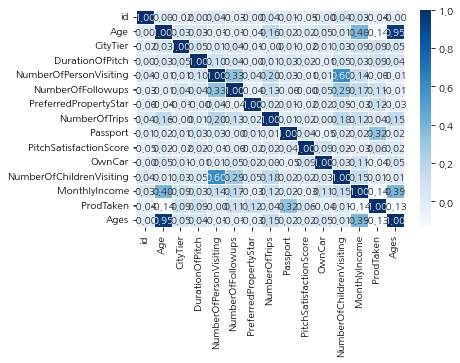

In [13]:
# 특성별 상관관계 히트맵으로 표현.

# seaborn setting
rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

sns.heatmap(data=data.corr(), annot=True, fmt='.2f', linewidths=.5, cmap='Blues');

* 특성간 상관관계가 높을수록 진한색을 띄는데, 데이터를 확인시, 특성간 뚜렷한 상관관계가 보이지 않음을 확인하였다.   


* 타겟인 ProdTaken와 상관관계가 가장 높은 것은 여권소지유무로 0.32가 가장 높은 값이다.  
* 함께 여행을 계획 중인 5세 미만의 어린이 수 고객과 함께 여행을 계획 중인 총 인원은 0.6의 상관관계로 상관관계수치 중 가장 높은 값을 보인다.  


* 타겟의 상관관계가 음수로 나타난 경우  
    * 나이와 타겟의 상관관계 : 이는 고령일수록 패키지여행신청을 하지 않음을 보여준다.  
    * 차량과 타겟의 상관관계 : 차가 없는 경우가 패키지여행을 더 고려하는 것을 보여준다.
    * 월별소득과 타겟의 상관관계 : 소득이 적을 때 패키지여행을 더 고려하는 것을 보여준다.


In [14]:
# 타겟 구성비율확인
print(data['ProdTaken'].value_counts())

print(data['ProdTaken'].value_counts(normalize=True))

0    1313
1     336
Name: ProdTaken, dtype: int64
0    0.79624
1    0.20376
Name: ProdTaken, dtype: float64


/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


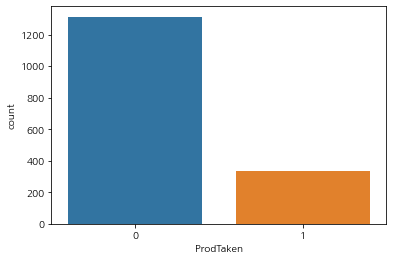

In [15]:
# 타겟의 imbalance 확인
%matplotlib inline

sns.countplot(data['ProdTaken']);

In [16]:
# ProdTaken이 1로 나온 특성별 분포확인(여행패키지 신청한 경우)

dataa = data[data['ProdTaken']==1]
dataa.shape

(336, 22)

/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


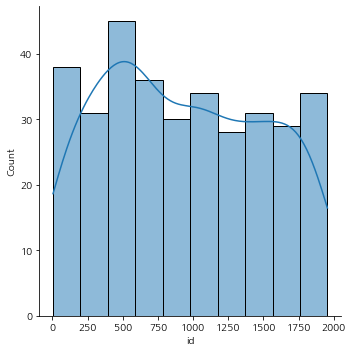

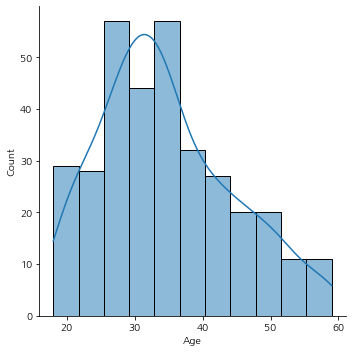

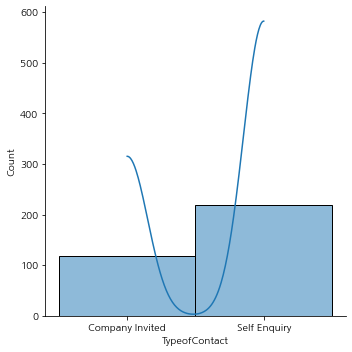

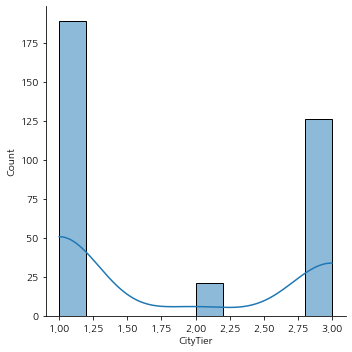

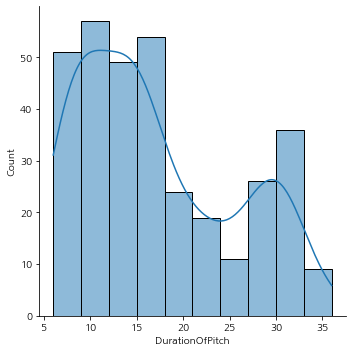

...

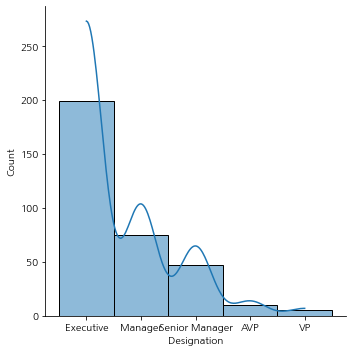

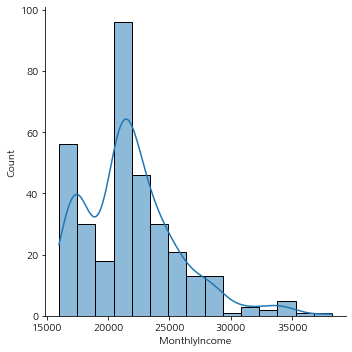

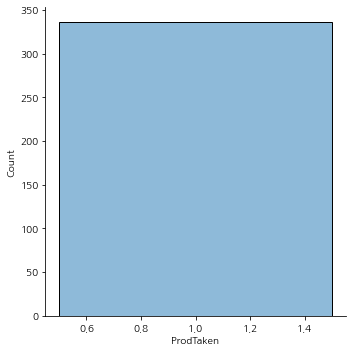

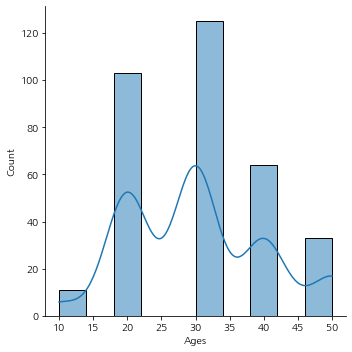

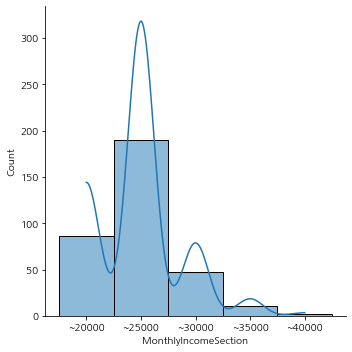

In [17]:
for i in dataa.columns:
    sns.displot(dataa[i],kde=True) # kde : 커널밀도추정. 커널함수와 데이터를 바탕으로 연속성있는 확률밀도함수를 추정하는것.

In [18]:
data['Occupation'].value_counts()

Salaried          808
Small Business    693
Large Business    147
Free Lancer         1
Name: Occupation, dtype: int64

In [19]:
# could not convert string to float: 'Company Invited' 이런 에러가 떠서 했었음.
# data['Occupation'] = data['Occupation'].str.strip()

### 데이터 분포확인1

/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


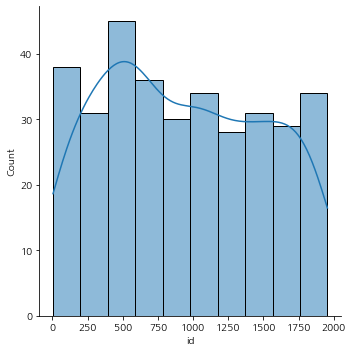

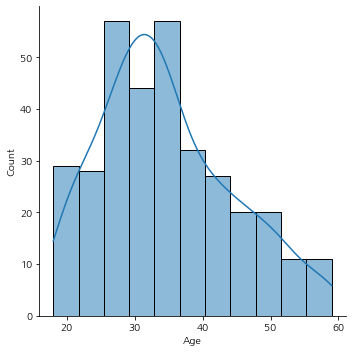

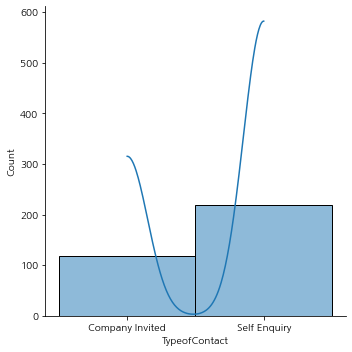

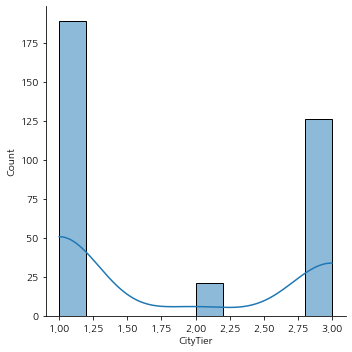

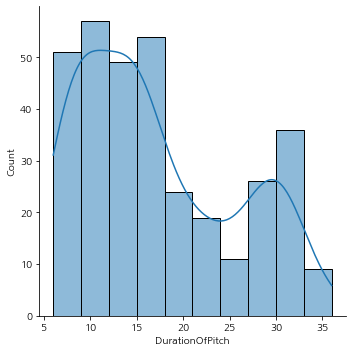

...

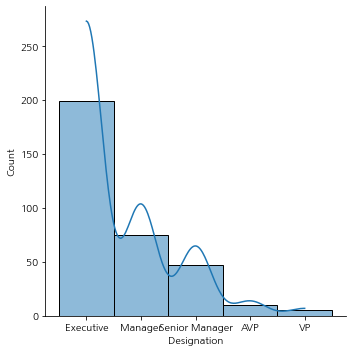

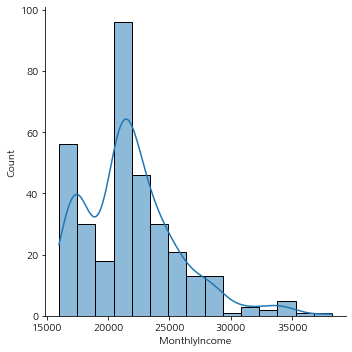

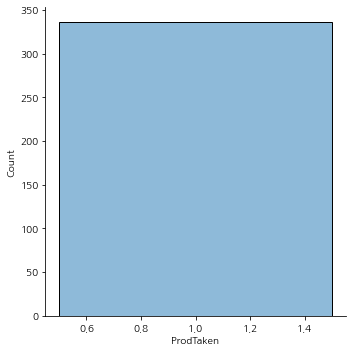

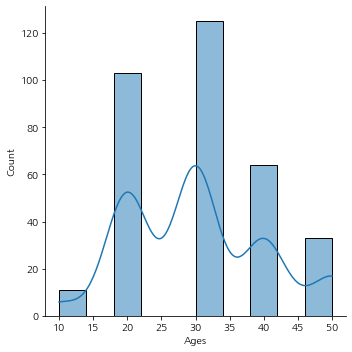

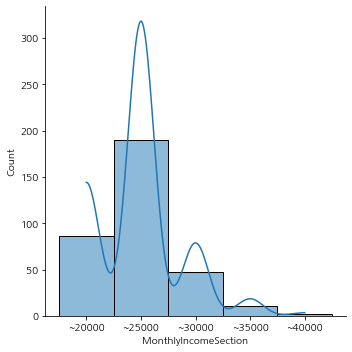

In [20]:
for i in dataa.columns:
    sns.displot(dataa[i],kde=True) # kde : 커널밀도추정. 커널함수와 데이터를 바탕으로 연속성있는 확률밀도함수를 추정하는것.

### 데이터 분포확인2

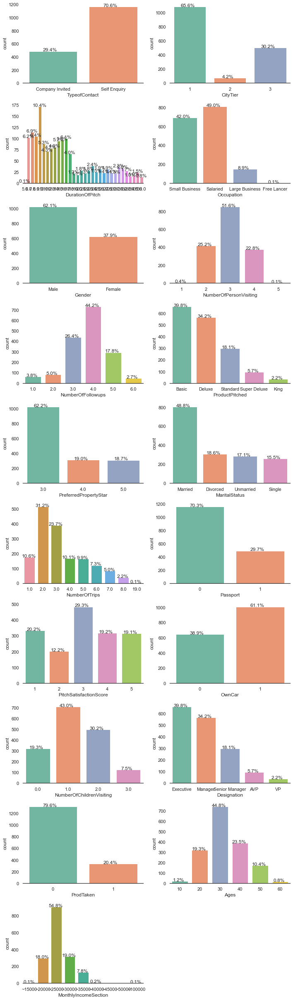

In [21]:
plt.figure(figsize=(10,50))

sns.set_theme(style="white") 
cols=['TypeofContact', 'CityTier', 'DurationOfPitch', 'Occupation', 'Gender',
       'NumberOfPersonVisiting', 'NumberOfFollowups', 'ProductPitched',
       'PreferredPropertyStar', 'MaritalStatus', 'NumberOfTrips', 'Passport',
       'PitchSatisfactionScore', 'OwnCar', 'NumberOfChildrenVisiting',
       'Designation', 'ProdTaken', 'Ages', 'MonthlyIncomeSection']
for i, variable in enumerate(cols):
                     ax=plt.subplot(15,2,i+1)
                     #order = data[variable].value_counts(ascending=False).index   
                     #sns.set_palette(list_palette[i]) # to set the palette
                     sns.set_palette('Set2')
                    
                     ax=sns.countplot(x=data[variable], data=data )
                     sns.despine(top=True,right=True,left=True) # 그래프위,양옆선삭제
                     for p in ax.patches:
                           percentage = '{:.1f}%'.format(100 * p.get_height()/len(data[variable]))
                           x = p.get_x() + p.get_width() / 2 - 0.05
                           y = p.get_y() + p.get_height()
                           plt.annotate(percentage, (x, y),ha='center') # 주석
                     plt.tight_layout()
                     #plt.title(cols[i].upper())
                                     

In [95]:
data['DurationOfPitch'].value_counts(normalize=True).head(10)

9.0     0.103699
7.0     0.069133
8.0     0.063675
6.0     0.061856
16.0    0.060643
15.0    0.058217
14.0    0.057004
10.0    0.053366
13.0    0.048514
12.0    0.047301
Name: DurationOfPitch, dtype: float64

* 특성별 분포도 분석

회사 제품의 인지방법(TypeofContact) : 고객 스스로 검색이 70%로 반 회사의 홍보(30%)보다 2배 많음  
주거 중인 도시의 등급(CityTier)이 1등급이 가장 많은데, 생활수준이 가장 좋은 곳의 사람들을 대상으로 수집한 정보임을 알 수 있다.(1등급 > 2등급 > 3등급)  
영업 사원이 고객에게 제공하는 프레젠테이션 기간(DurationOfPitch)은 17이상으로는 급격히 떨어짐을 확인할 수 있다.  
조사된 사람들의 대부분의 직업(Occupation) 중 반은 직장인, 그리고 두번째는 작은사업을 하고 있다고 하는 경우가 많았고,  
Designation을 보면 가장 높은 직급이 Executive, Manager인 것으로 보아 생활수준이 좋은 사람들의 데이터라볼 수 있다.  
  
성별(Gender)은 60%이상이 남자고,  
고객과 함께 여행을 계획 중인 총 인원은 3명이 과반수를 넘었으며,   
프레젠테이션 후 이루어진 후속 조치 수(NumberOfFollowups)는 4점이 44%로 가장 높았고,  
영업 사원이 제시한 상품(ProductPitched)은 basic, delux순으로 많았으며,  
선호 호텔 숙박업소 등급(PreferredPropertyStar)은 3점이 가장 많았고,  
결혼여부(MaritalStatus)는 결혼한 경우가 많았다. (unmarried는 사실혼의 경우로 본다)  
평균 연간 여행 횟수(NumberOfTrips)는 2번, 그 다음 3번이 가장 많았고,   
여권 보유 여부(Passport)은 없는 경우가 70%를 넘었다.  
영업 사원의 프레젠테이션 만족도(PitchSatisfactionScore)는 3점이 가장 높았으며,  
자동차 보유 여부(OwnCar)는 있는 경우가 61%를 넘었다.  
함께 여행을 계획 중인 5세 미만의 어린이 수(NumberOfChildrenVisiting)는 1명, 2명 순으로 많았다.  
여행 패키지 신청 여부(ProdTaken)는 20%의 고객만이 진행됐고,  
나이대(Ages)는 30대가 44%로 가장 높았으며,  
월 급여구간(MonthlyIncomeSection)은 20000~25000이 가장 많았다.  

<AxesSubplot:xlabel='ProdTaken', ylabel='MonthlyIncome'>

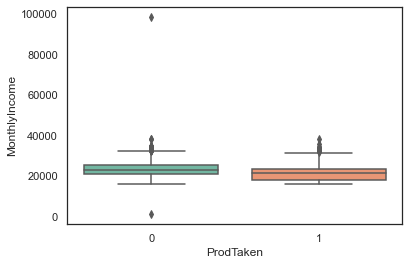

In [22]:
sns.boxplot(data=data, x="ProdTaken", y="MonthlyIncome")

In [23]:
### Function to plot distributions and Boxplots of customers
rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

def plot(x,target='ProdTaken'):
    
    fig,axs = plt.subplots(2,2,figsize=(12,10))
    
    axs[0, 0].set_title(f'패키지상품 미선택한\n {x} 특성 분포도',fontsize=12,fontweight='bold')
    sns.histplot(data[(data[target] == 0)][x],ax=axs[0,0],color='teal')
    
    axs[0, 1].set_title(f"패키지상품 선택한\n {x}특성 분포도",fontsize=12,fontweight='bold')
    sns.histplot(data[(data[target] == 1)][x],ax=axs[0,1],color='orange')
    
    axs[1,0].set_title(f'패키지상품 선택한 {x} 특성 boxplot',fontsize=12,fontweight='bold')
    
    line = plt.Line2D((.1,.9),(.5,.5), color='grey', linewidth=1.5,linestyle='--')
    fig.add_artist(line)
    sns.boxplot(data=data, x=target, y=x, ax=axs[1,0],palette='gist_rainbow',showmeans=True)
    
    axs[1,1].set_title(f'이상치 제거한 {x} 특성의 boxplot',fontsize=12,fontweight='bold')
    sns.boxplot(data=data, x=target, y=x,ax=axs[1,1],showfliers=False,palette='gist_rainbow',showmeans=True) #turning off outliers from boxplot
    sns.despine(top=True,right=True,left=True) # to remove side line from graph
    
    plt.tight_layout(pad=4)
    plt.show()

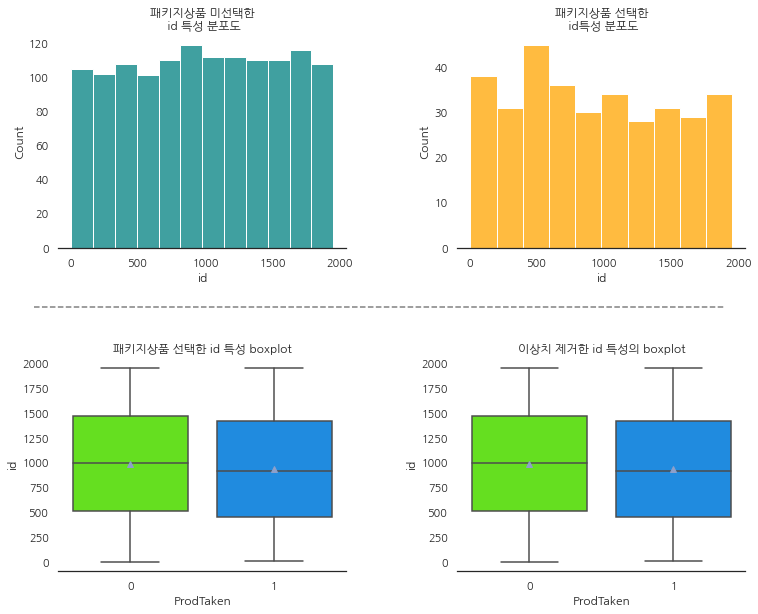

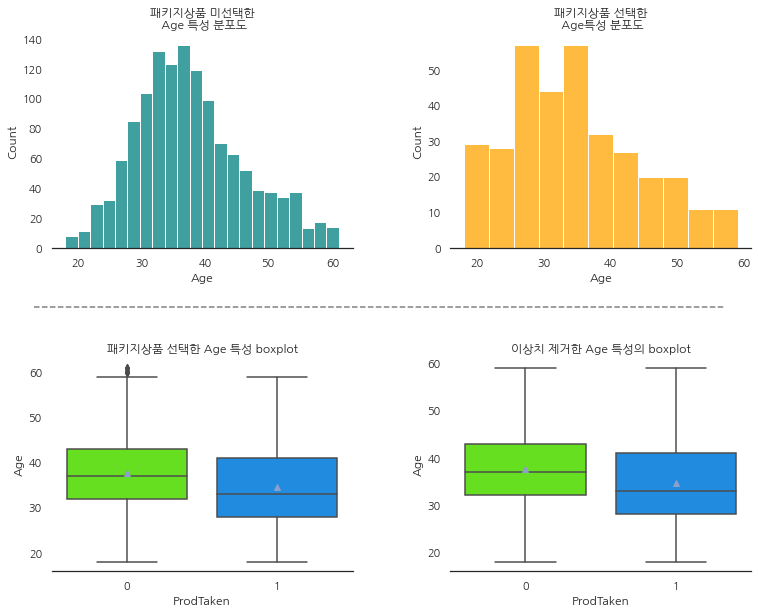

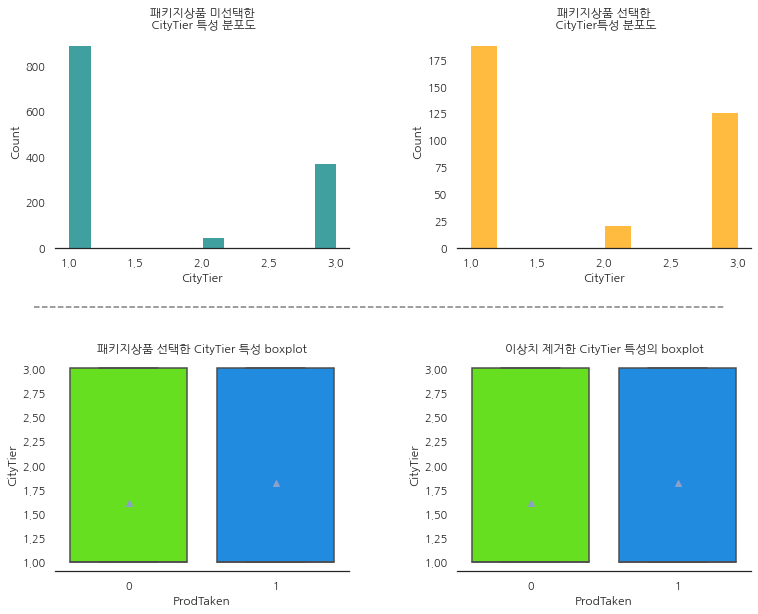

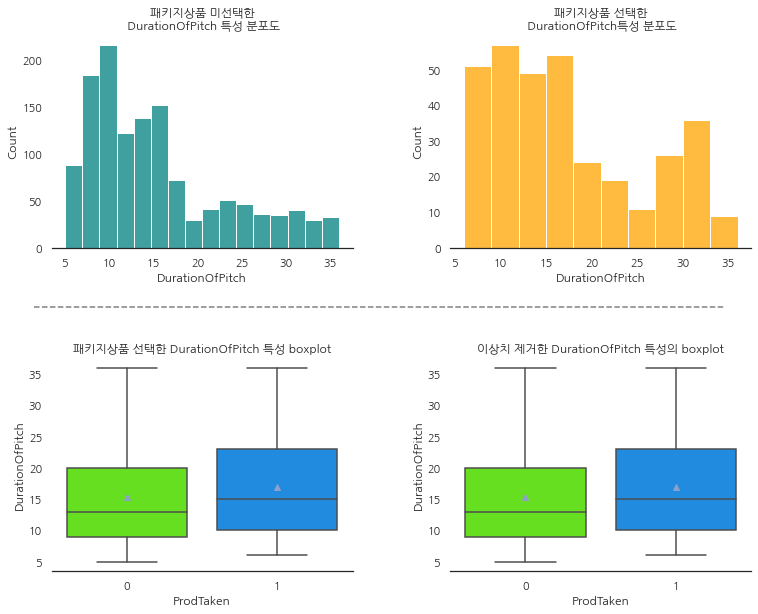

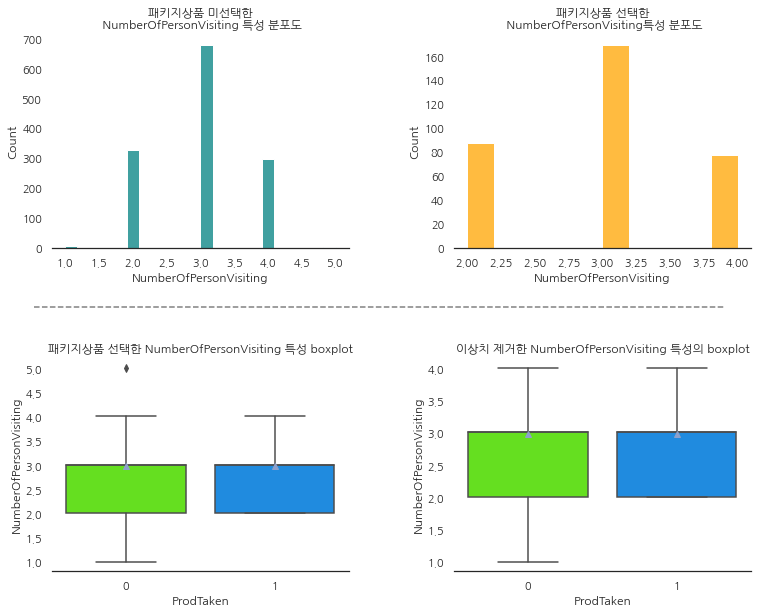

...

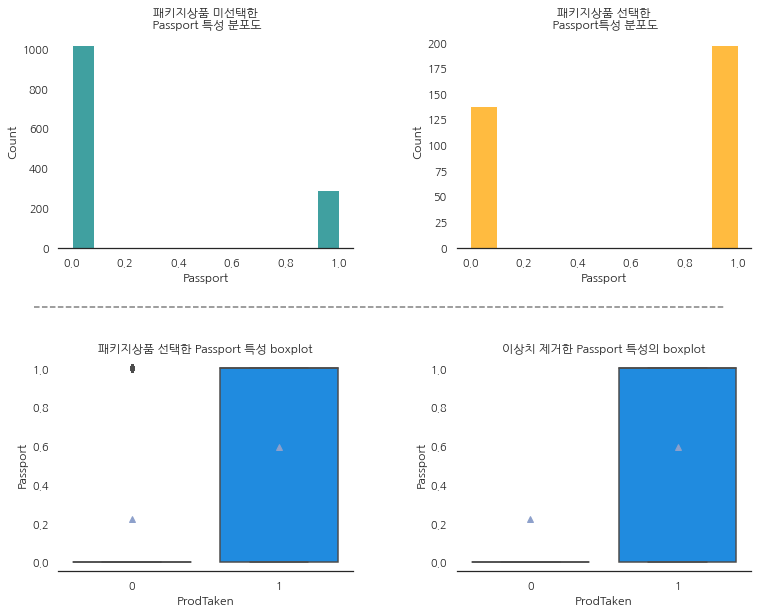

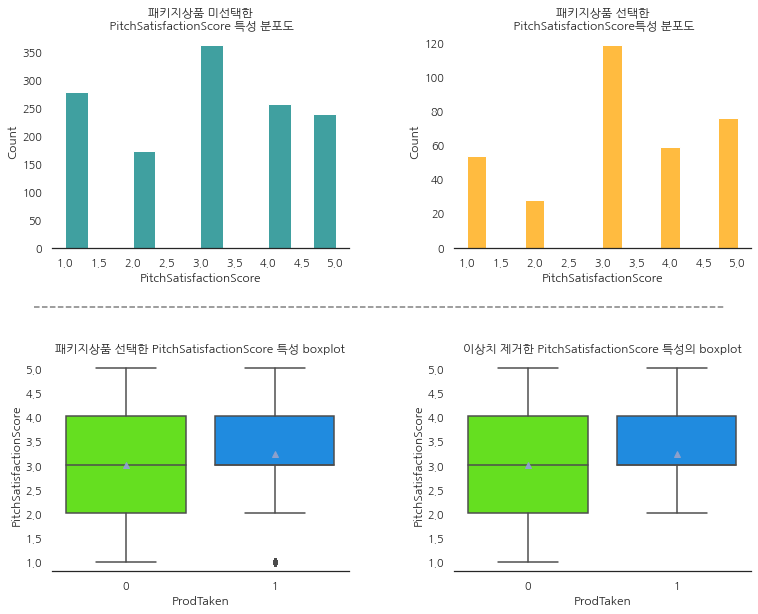

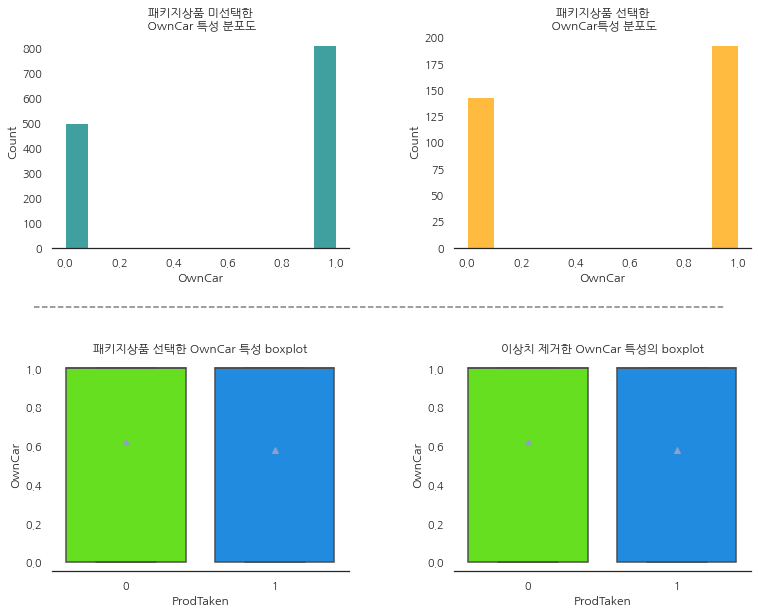

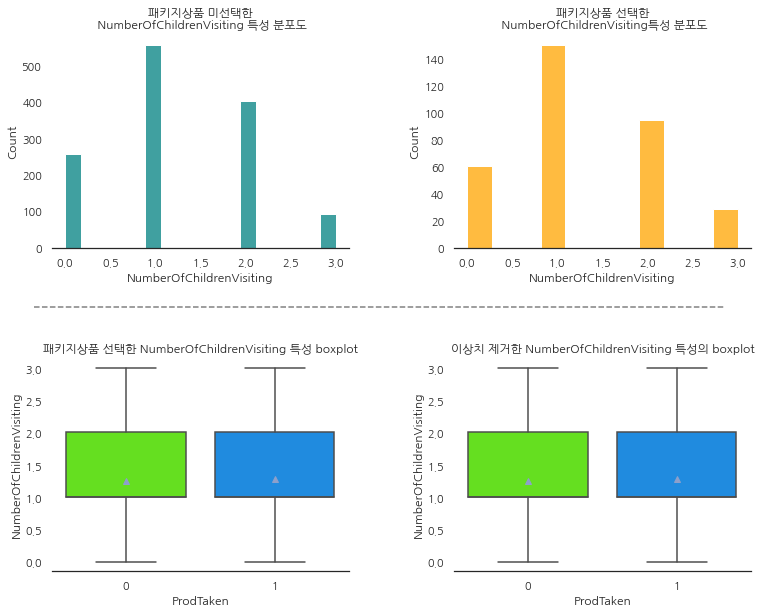

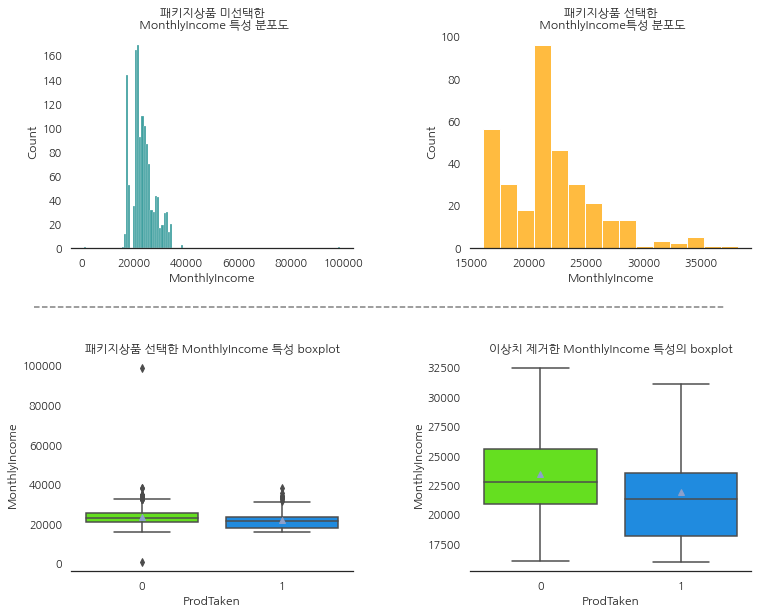

/var/folders/07/192hjwjx7jzfdyz0ph3vff080000gn/T/ipykernel_4769/336247642.py:27: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.


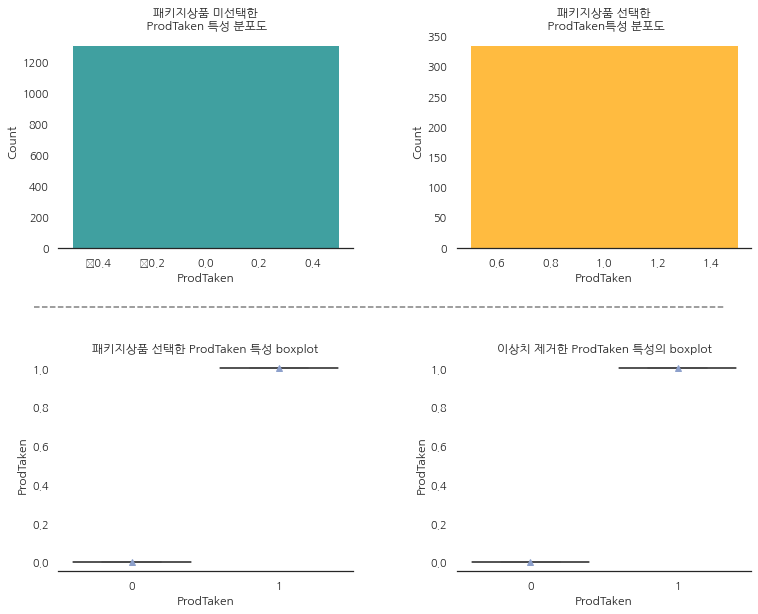

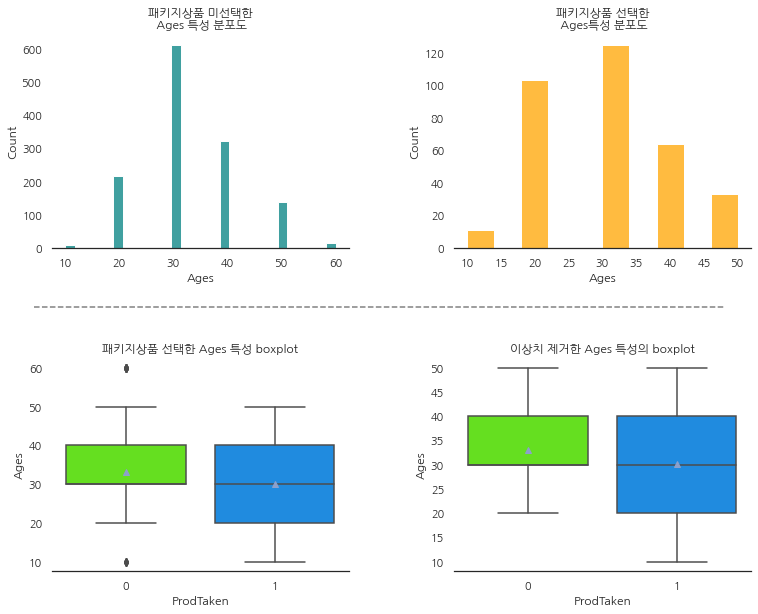

In [24]:
#select all quantitative columns for checking the spread
#list_col=  ['Age','DurationOfPitch','MonthlyIncome']

list_col=data.select_dtypes(include='number').columns.to_list()

#print(list_col)
#plt.figure(figsize=(14,23))

for j in range(len(list_col)):
   plot(list_col[j])
   

Text(0.5, 1.0, '패키지 미선택한 고객의 제품인지방법 비율')

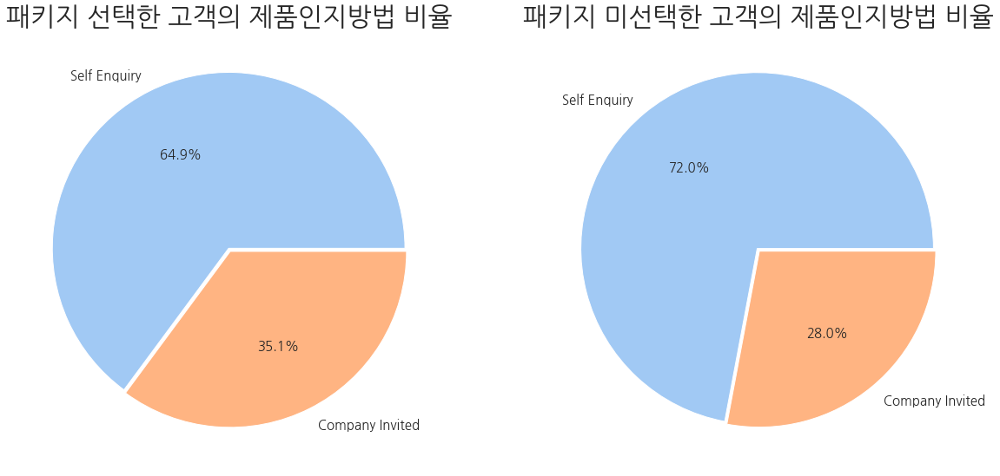

In [25]:
['TypeofContact','Occupation','Gender','ProductPitched','MaritalStatus','Designation']

# seaborn setting

rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

# 패키지 선택한 성 비율
yes = data[data.ProdTaken==1]

# 패키지 미선택한 성비율 
no = data[data.ProdTaken==0]

# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['TypeofContact'].value_counts()
labels=yes['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 고객의 제품인지방법 비율',fontsize=30)


pie_data=no['TypeofContact'].value_counts()
labels=no['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)

ax2.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 고객의 제품인지방법 비율',fontsize=30)


<AxesSubplot:xlabel='ProdTaken', ylabel='count'>

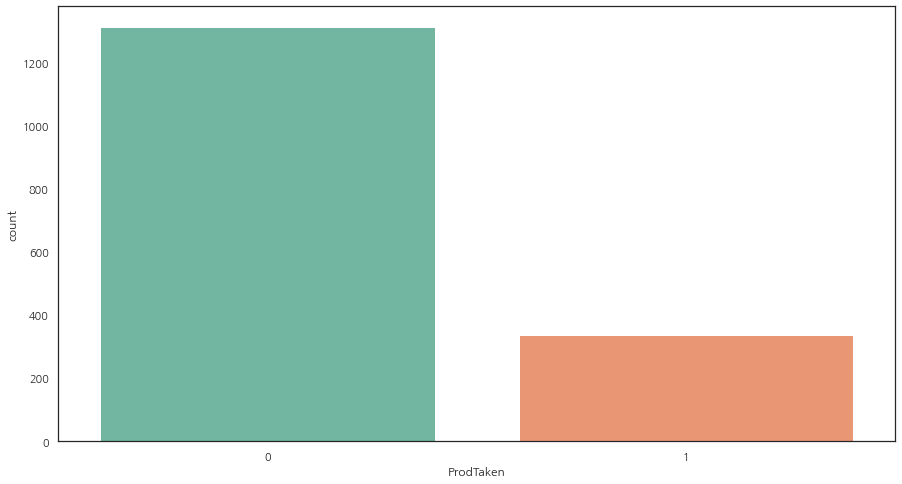

In [26]:
sns.countplot(data=data,x='ProdTaken')

### 가설1 : 결혼 후, 여행을 계획중인 아이들이 있으면 가족패키지에 대한 수요가 있어 패키지신청확률이 높을 것이다.

In [27]:
# 결혼한 경우의 데이터를 추린다.
condition=data[(data.MaritalStatus=='Married')] #| (data.MaritalStatus=='Divorced')]
condition['MaritalStatus'].value_counts()

Married    804
Name: MaritalStatus, dtype: int64

/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


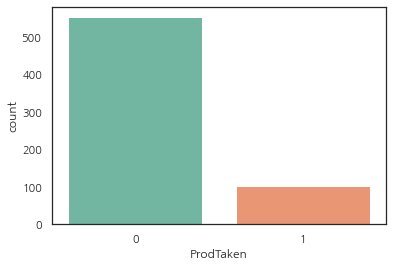

In [28]:
# 함께 여행을 계획 중인 5세 미만의 어린이 수가 있는 경우의 조건을 추가한다.
data_travel_children = condition[condition['NumberOfChildrenVisiting']>0]

# 타겟의 imbalance 확인
%matplotlib inline

sns.countplot(data_travel_children['ProdTaken']);

In [29]:
# 타겟 구성비율확인
print(data_travel_children['ProdTaken'].value_counts())

print(data_travel_children['ProdTaken'].value_counts(normalize=True))

0    552
1    102
Name: ProdTaken, dtype: int64
0    0.844037
1    0.155963
Name: ProdTaken, dtype: float64


해당가설은 최빈값보다 줄어드는 결과를 가져왔고, 이는 결혼 후 여행에 계획중인 아이들은 패키지여행선택과는 무관함을 보여준다.  
(결혼을 하고 애가 있는 경우(이혼한 경우도) 진행했으나 married와 비슷한 수치를 보였다.)

### 가설2 : 영업 사원의 프레젠테이션 만족도는 가족패키지에 대한 수요가 높을 것이다.

In [30]:
# 가설2에 따른 영업사원의 프레젠테이션만족도는 가족패키지에 대한 수요를 높일 것이다로 했을 시, 최빈값보다 0.03이 오른 것을 확인할 수 있다.

condition2 = data[data['PitchSatisfactionScore']>=3]
condition2[condition2['NumberOfChildrenVisiting']>0]['ProdTaken'].value_counts(normalize=True)

0    0.768632
1    0.231368
Name: ProdTaken, dtype: float64

<AxesSubplot:xlabel='ProdTaken', ylabel='MonthlyIncome'>

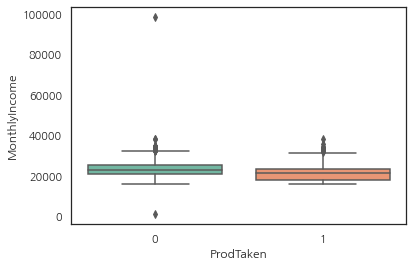

In [31]:
# 패키지여행상품선택여부와 소득의 관계표현
sns.boxplot(data=data, x="ProdTaken", y="MonthlyIncome")

In [32]:
data.describe()

,id,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,ProdTaken,Ages
count,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000
mean,979.323226,37.021225,1.646452,15.627653,2.970285,3.752577,3.565191,3.316555,0.297150,3.048514,0.610673,1.257732,23141.996968,0.203760,32.510612
std,561.717183,9.049227,0.912721,8.149520,0.704331,1.017758,0.787972,1.818987,0.457142,1.372873,0.487746,0.853130,4649.463051,0.402915,9.502365
min,1.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000,0.000000,10.000000
25%,492.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20764.000000,0.000000,30.000000
50%,978.000000,36.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22359.000000,0.000000,30.000000
75%,1465.000000,43.000000,3.000000,21.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25266.000000,0.000000,40.000000
max,1955.000000,61.000000,3.000000,36.000000,5.000000,6.000000,5.000000,19.000000,1.000000,5.000000,1.000000,3.000000,98678.000000,1.000000,60.000000


Text(0.5, 1.0, '패키지 미선택한 고객의 제품인지방법 비율')

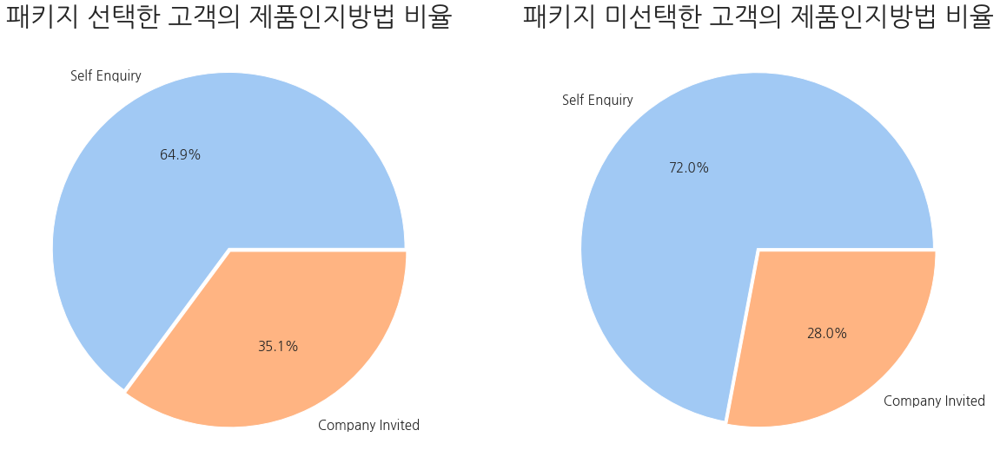

In [33]:
# seaborn setting

rcParams['figure.figsize'] = 15,8
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['font.size'] = 15
colors = sns.color_palette('pastel')

# 패키지 선택한 성 비율
yes = data[data.ProdTaken==1]

# 패키지 미선택한 성비율 
no = data[data.ProdTaken==0]

# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['TypeofContact'].value_counts()
labels=yes['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 고객의 제품인지방법 비율',fontsize=30)


pie_data=no['TypeofContact'].value_counts()
labels=no['TypeofContact'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)

ax2.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 고객의 제품인지방법 비율',fontsize=30)


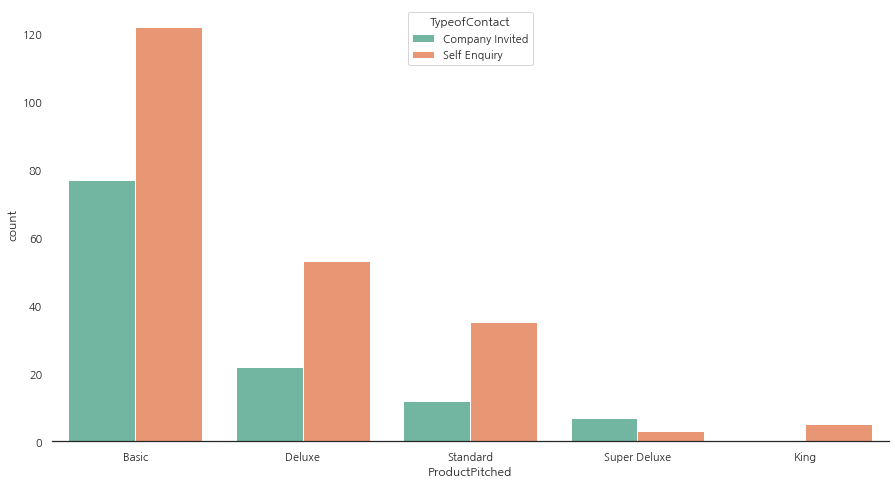

In [34]:
# 영업사원판매상품과 고객의 상품정보습득비율
sns.countplot(x="ProductPitched", data=yes,  hue="TypeofContact")
sns.despine(top=True,right=True,left=True) 

Text(0.5, 1.0, '패키지 미선택한 직업군 비율')

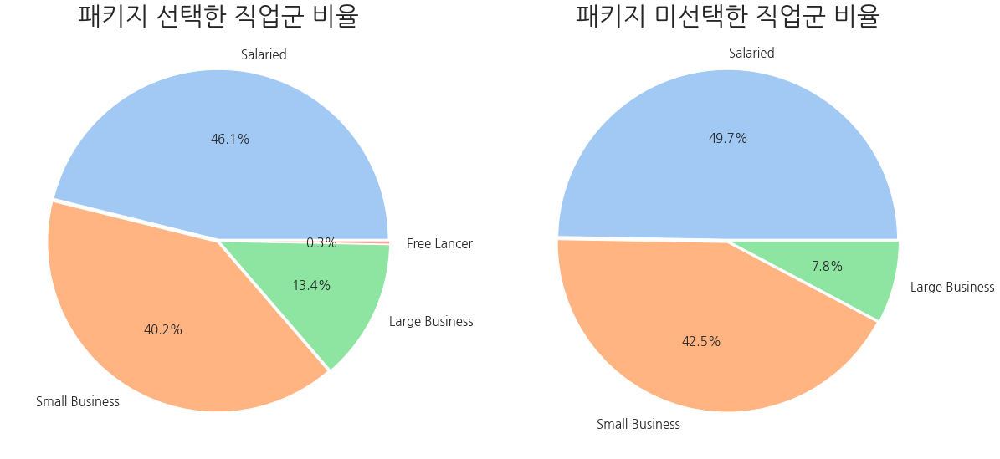

In [35]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['Occupation'].value_counts()
labels=yes['Occupation'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 직업군 비율',fontsize=30)


pie_data=no['Occupation'].value_counts()
labels=no['Occupation'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 직업군 비율',fontsize=30)


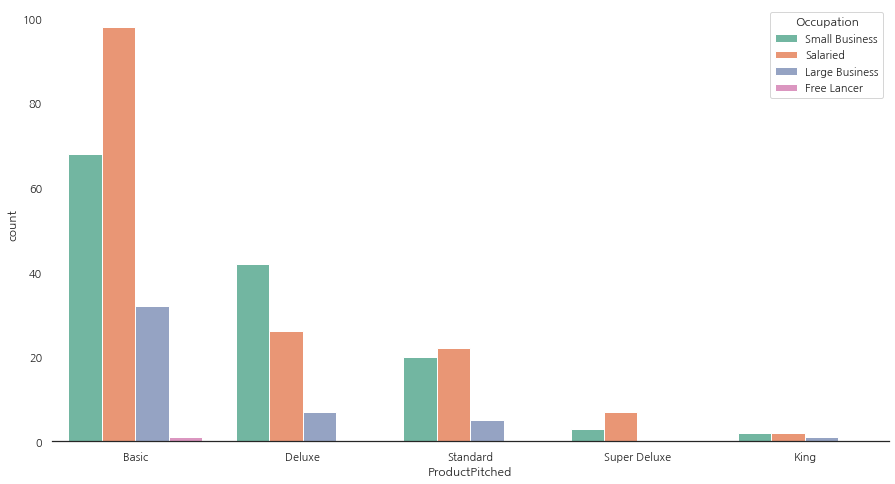

In [36]:
# 영업사원판매상품과 직업군비율
sns.countplot(x="ProductPitched", data=yes,  hue="Occupation")
sns.despine(top=True,right=True,left=True) 

In [37]:
data[data['Occupation']=='Salaried']

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,...,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken,Ages,MonthlyIncomeSection
2,5,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,...,2.0,0,3,1,0.0,Manager,19907.0,0,40,~20000
4,7,43.0,Company Invited,3,8.0,Salaried,Male,3,3.0,Deluxe,...,2.0,0,3,1,2.0,Manager,20675.0,0,40,~25000
6,10,34.0,Self Enquiry,1,7.0,Salaried,Male,4,4.0,Basic,...,3.0,1,3,1,1.0,Executive,21364.0,1,30,~25000
7,11,35.0,Company Invited,1,14.0,Salaried,Male,4,6.0,Deluxe,...,3.0,1,5,1,1.0,Manager,24752.0,1,30,~25000
13,19,36.0,Self Enquiry,1,8.0,Salaried,Female,3,3.0,Basic,...,5.0,0,5,1,0.0,Executive,17543.0,0,30,~20000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1639,1944,28.0,Self Enquiry,1,14.0,Salaried,Female,2,4.0,Basic,...,2.0,0,4,0,1.0,Executive,17154.0,1,20,~20000
1641,1946,41.0,Self Enquiry,3,12.0,Salaried,Female,3,3.0,Standard,...,4.0,1,1,0,0.0,Senior Manager,28591.0,0,40,~30000
1643,1950,53.0,Self Enquiry,1,15.0,Salaried,Female,3,4.0,Basic,...,2.0,0,1,1,2.0,Executive,21628.0,0,50,~25000
1645,1952,41.0,Self Enquiry,3,8.0,Salaried,Female,3,3.0,Super Deluxe,...,1.0,0,5,1,1.0,AVP,31595.0,0,40,~35000


In [38]:
# 프리랜서는 한 명인데, 직함은 Executive로 해 둔 것으로 보아 사외이사로 간주하자.
data[data['Occupation']=='Free Lancer']

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,...,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken,Ages,MonthlyIncomeSection
407,486,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,...,7.0,1,3,0,0.0,Executive,17090.0,1,30,~20000


Text(0.5, 1.0, '패키지 미선택한 성 비율')

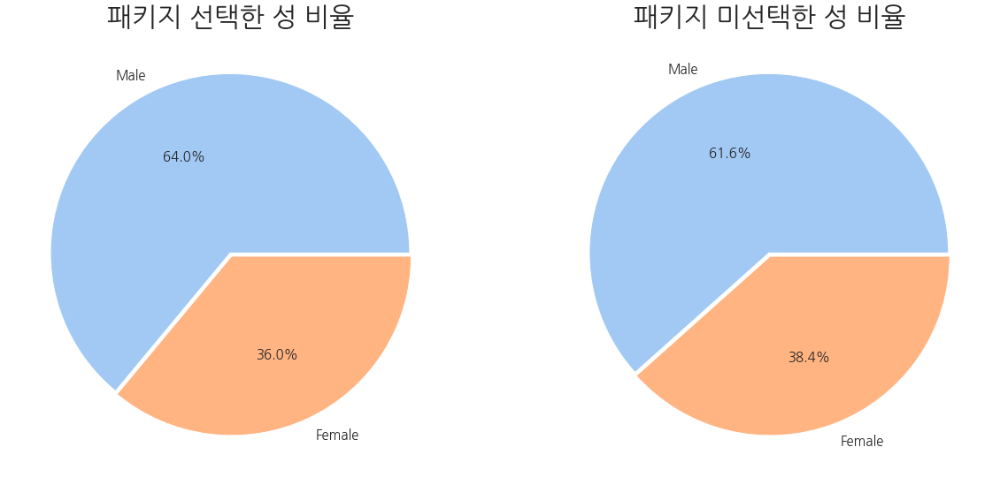

In [39]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['Gender'].value_counts()
labels=yes['Gender'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    

ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 성 비율',fontsize=30)


pie_data=no['Gender'].value_counts()
labels=no['Gender'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 성 비율',fontsize=30)


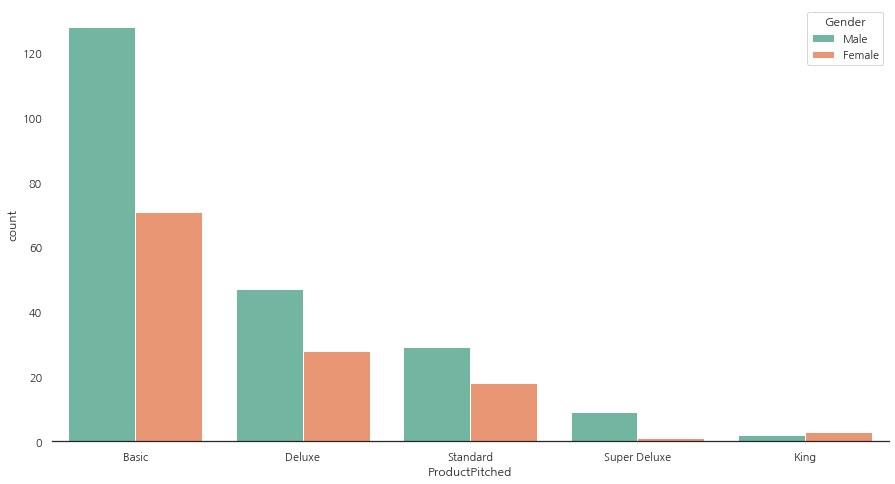

In [40]:
# 영업사원판매상품과 성비율
sns.countplot(x="ProductPitched", data=yes,  hue="Gender")
sns.despine(top=True,right=True,left=True) 

Text(0.5, 1.0, '패키지 미선택한 영업사원상품제시 비율')

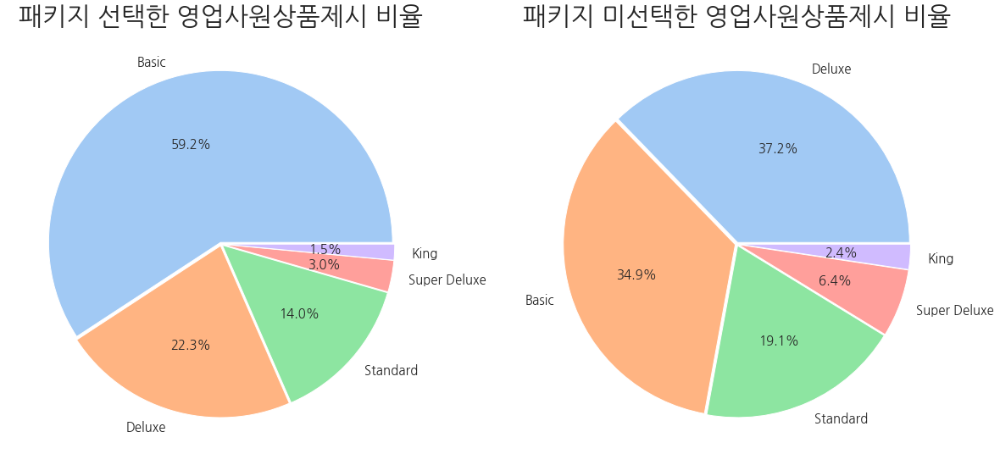

In [41]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['ProductPitched'].value_counts()
labels=yes['ProductPitched'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)

ax1.pie(pie_data,labels = labels,colors = colors,explode=explode, autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 영업사원상품제시 비율',fontsize=30)


pie_data=no['ProductPitched'].value_counts()
labels=no['ProductPitched'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 영업사원상품제시 비율',fontsize=30)


Text(0.5, 1.0, '패키지 미선택한 결혼여부 비율')

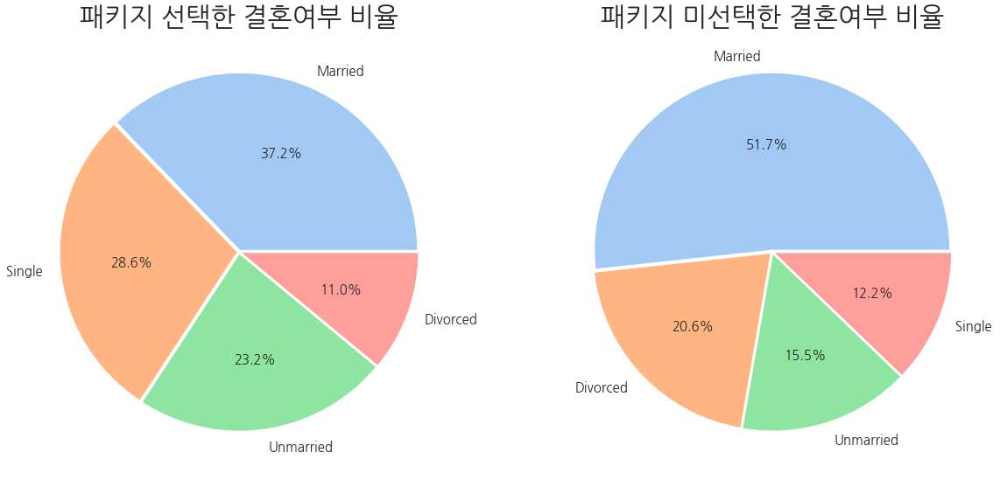

In [42]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['MaritalStatus'].value_counts()
labels=yes['MaritalStatus'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 결혼여부 비율',fontsize=30)


pie_data=no['MaritalStatus'].value_counts()
labels=no['MaritalStatus'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 결혼여부 비율',fontsize=30)


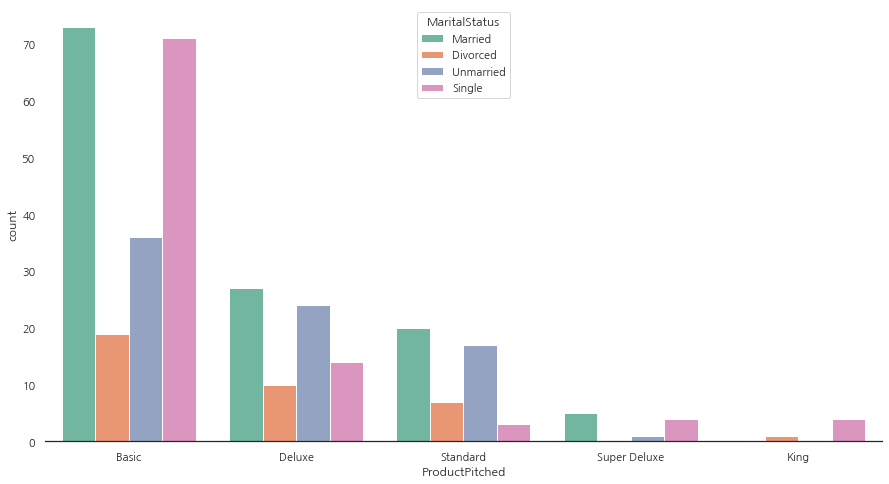

In [43]:
# 결혼상태별 영업사원판매상품과 비율
sns.countplot(x="ProductPitched", data=yes,  hue="MaritalStatus")
sns.despine(top=True,right=True,left=True) 

Text(0.5, 1.0, '패키지 미선택한 직급 비율')

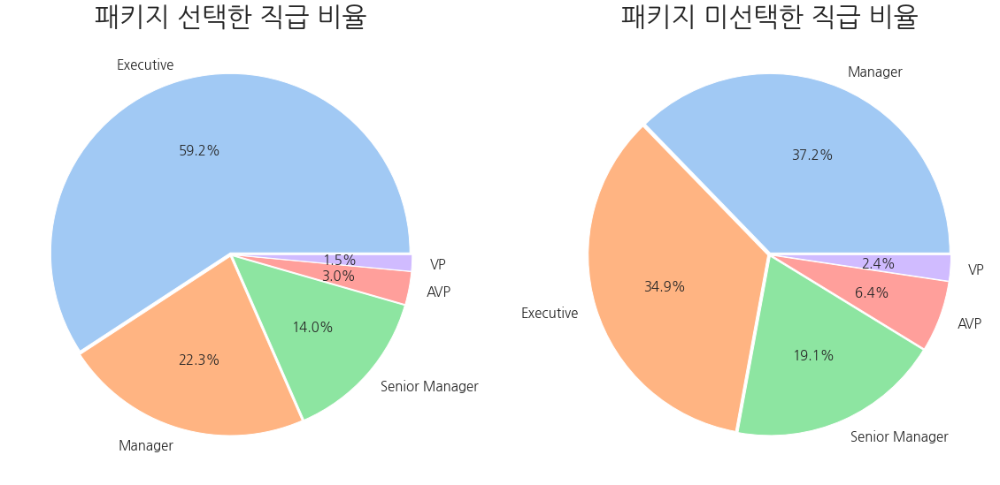

In [44]:
# 한번에 piechart 2개 보여주기
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,20)) #ax1,ax2 refer to your two pies
# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1

pie_data=yes['Designation'].value_counts()
labels=yes['Designation'].value_counts().index

explode = []
for i in range(len(labels)):
    explode.append(0.01)
    
ax1.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot first pie
ax1.set_title('패키지 선택한 직급 비율',fontsize=30)


pie_data=no['Designation'].value_counts()
labels=no['Designation'].value_counts().index
ax2.pie(pie_data,labels = labels,colors = colors,explode=explode,autopct = '%1.1f%%', textprops={'fontsize': 15}) #plot second pie
ax2.set_title('패키지 미선택한 직급 비율',fontsize=30)


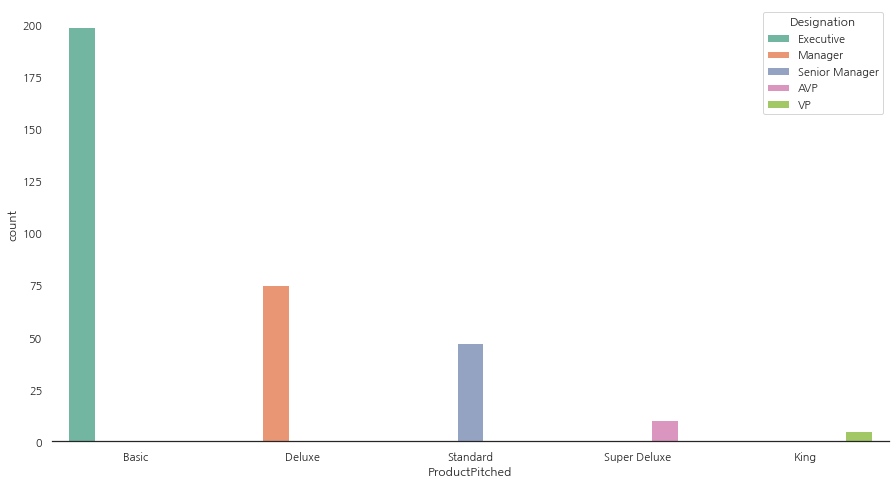

In [45]:
# 직급 영업사원판매상품과 비율
sns.countplot(x="ProductPitched", data=yes,  hue="Designation")
sns.despine(top=True,right=True,left=True) 

직함에 매니저라고 적어도 직업에 작은 사업, 큰 사업으로 기재된 경우가 많아, 직함은 큰 의미가 없는 것으로 파악하기로 한다.
(기업의 규모마다 매니저의 역할/역량이 다른 경우도 많으니 큰 의미를 두지 않기로 하며, 매니저 이상의 고객군으로 파악하기로 한다.)

In [46]:
# 매니저 직함의 직업 종류 분포
designation_manager = data[data['Designation']=='Manager']
designation_manager['Occupation'].value_counts()

Salaried          265
Small Business    256
Large Business     43
Name: Occupation, dtype: int64

In [47]:
# 경영진 직함의 직업 종류 분포
designation_executive = data[data['Designation']=='Executive']
designation_executive['Occupation'].value_counts()

Salaried          344
Small Business    248
Large Business     64
Free Lancer         1
Name: Occupation, dtype: int64

/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


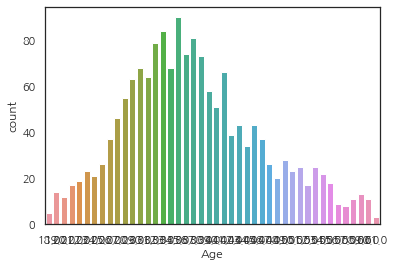

In [48]:
# 나이대 분포도

%matplotlib inline

sns.countplot(data['Age']);

In [49]:
# high cardinality 및 특성생성하고 난 후 베이스된 특성 제거
data = data.drop(['id','Age','MonthlyIncome'],axis=1).reset_index(drop=True)

In [50]:
data.head()

,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,ProdTaken,Ages,MonthlyIncomeSection
0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,3.0,Married,3.0,0,1,0,1.0,Executive,0,20,~25000
1,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,4.0,Married,3.0,0,4,0,1.0,Executive,1,20,~25000
2,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,3.0,Divorced,2.0,0,3,1,0.0,Manager,0,40,~20000
3,Self Enquiry,1,29.0,Small Business,Male,4,4.0,Deluxe,3.0,Divorced,3.0,1,5,1,1.0,Manager,1,30,~25000
4,Company Invited,3,8.0,Salaried,Male,3,3.0,Deluxe,3.0,Married,2.0,0,3,1,2.0,Manager,0,40,~25000


## 5. Modeling

### 모델의 유용성과 한계

* 목적 : 주어진 특성을 분석하여 패키지 여행을 신청할 지, 말 지 예측
* 유용성 : 잠재고객을 파악하여 영업/광고방향 설정 가능
* 한계 : 
    

In [51]:
# EDA로 구간별로 구분한 컬럼을 카테고리화하기
category_columns=['Ages','MonthlyIncomeSection']
numerical_columns=['MonthlyIncome','Age']

data[category_columns] = data[category_columns].astype('category')

In [52]:
# 훈련/검증셋 나누기

train, test = train_test_split(data, test_size=0.2, random_state=2)
train, val = train_test_split(train, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = data.columns.drop([target])

X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]
y_test = test[target]

train.shape, val.shape, test.shape

((1055, 19), (264, 19), (330, 19))

In [53]:
# 훈련/검증셋 나누기

train2, test2 = train_test_split(raw_data, test_size=0.2, random_state=2)
train2, val2 = train_test_split(train2, test_size=0.2, random_state=2)


target = 'ProdTaken'
features = raw_data.columns.drop([target])

X_train2 = train2[features]
y_train2 = train2[target]
X_val2 = val2[features]
y_val2 = val2[target]
X_test2 = test2[features]
y_test2 = test2[target]

train2.shape, val2.shape

((1251, 19), (313, 19))

### 1-1. Logistic Regression (AUC:0.76)

In [54]:
# logisticregression, ordinalencoder

pipe_log_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서ㅁ가 상관없어서 괜찮다!
    LogisticRegression(class_weight="balanced"))

pipe_log_o.fit(X_train, y_train)
y_pred = pipe_log_o.predict(X_val)

print('훈련 정확도 :', pipe_log_o.score(X_train,y_train))
print('검증 정확도 :', pipe_log_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

훈련 정확도 : 0.7355450236966825
검증 정확도 : 0.7462121212121212
F1 score : 0.5732484076433122
AUC 점수 : 0.7671703296703298
REPORT               precision    recall  f1-score   support

           0       0.93      0.73      0.82       208
           1       0.45      0.80      0.57        56

    accuracy                           0.75       264
   macro avg       0.69      0.77      0.70       264
weighted avg       0.83      0.75      0.77       264



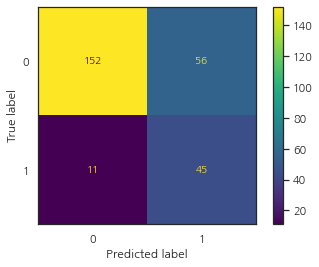

In [55]:
ConfusionMatrixDisplay.from_estimator(pipe_log_o,X_val,y_val)
plt.show()

In [56]:
tp = 14
tn = 200
fn = 42
fp = 8
total = tp+tn+fp+fn

In [57]:
# 1로 예측할 확률
y_train.value_counts(normalize=True)[1]

0.19146919431279621

### 1-2. Logistic Regression(null->most_frequent)  (AUC:0.70)

In [58]:
# catboost, ordinalencoder

pipe_log_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서ㅁ가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    LogisticRegression(class_weight="balanced"))

pipe_log_o2.fit(X_train2, y_train2)
y_pred = pipe_log_o2.predict(X_val2)

print('훈련 정확도 :', pipe_log_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_log_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

훈련 정확도 : 0.6826538768984812
검증 정확도 : 0.6837060702875399
F1 score : 0.5074626865671641
AUC 점수 : 0.7035816108339272
REPORT               precision    recall  f1-score   support

           0       0.90      0.67      0.77       244
           1       0.39      0.74      0.51        69

    accuracy                           0.68       313
   macro avg       0.64      0.70      0.64       313
weighted avg       0.79      0.68      0.71       313



/Users/hun/opt/anaconda3/envs/kerneljookjima/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


### 1-3. Logistic Regression Hyper Parameter Tuning 

In [59]:
'''logModel=LogisticRegression()

param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

clf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)

best_clf = clf.fit(X_train,y_train)

best_clf.best_estimator_
'''

"logModel=LogisticRegression()\n\nparam_grid = [    \n    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],\n    'C' : np.logspace(-4, 4, 20),\n    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],\n    'max_iter' : [100, 1000,2500, 5000]\n    }\n]\n\nclf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)\n\nbest_clf = clf.fit(X_train,y_train)\n\nbest_clf.best_estimator_\n"

### 1-4. Logistic Regression Hyper Parameter Tuning (null->most_frequent)

In [60]:
'''logModel=LogisticRegression()

param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

clf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1,sample_weight=compute_sample_weight("balanced", y_train))

best_clf = clf.fit(X_train,y_train)

best_clf.best_estimator_
'''

'logModel=LogisticRegression()\n\nparam_grid = [    \n    {\'penalty\' : [\'l1\', \'l2\', \'elasticnet\', \'none\'],\n    \'C\' : np.logspace(-4, 4, 20),\n    \'solver\' : [\'lbfgs\',\'newton-cg\',\'liblinear\',\'sag\',\'saga\'],\n    \'max_iter\' : [100, 1000,2500, 5000]\n    }\n]\n\nclf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1,sample_weight=compute_sample_weight("balanced", y_train))\n\nbest_clf = clf.fit(X_train,y_train)\n\nbest_clf.best_estimator_\n'

### 2. RandomForest  (AUC:0.68) 

In [61]:
# randomforest_ordinal encoding

pipe_rf_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    RandomForestClassifier())

pipe_rf_o.fit(X_train, y_train)
y_pred = pipe_rf_o.predict(X_val)

print('훈련 정확도 :', pipe_rf_o.score(X_train,y_train))
print('검증 정확도 :', pipe_rf_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val,y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8636363636363636
F1 score : 0.5384615384615384
AUC 점수 : 0.6850961538461539
REPORT               precision    recall  f1-score   support

           0       0.86      1.00      0.92       208
           1       0.95      0.38      0.54        56

    accuracy                           0.86       264
   macro avg       0.90      0.69      0.73       264
weighted avg       0.88      0.86      0.84       264



### 2-2. RandomForest(null->most_frequent)  (AUC:0.72)

In [62]:
# randomforest_ordinal encoding

pipe_rf_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    RandomForestClassifier())

pipe_rf_o2.fit(X_train2, y_train2)
y_pred = pipe_rf_o2.predict(X_val2)

print('훈련 정확도 :', pipe_rf_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_rf_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2,y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8626198083067093
F1 score : 0.6055045871559632
AUC 점수 : 0.7247861724875267
REPORT               precision    recall  f1-score   support

           0       0.87      0.97      0.92       244
           1       0.82      0.48      0.61        69

    accuracy                           0.86       313
   macro avg       0.85      0.72      0.76       313
weighted avg       0.86      0.86      0.85       313



### 2-3. RandomForest Hyperparameter Tuning  (AUC:0.76)

In [63]:
###### pipe라인 랜덤포레스트 모델의 파라미터튜닝
pipe = make_pipeline(
      OrdinalEncoder(),
      RandomForestClassifier(random_state=2))

# 튜닝할 하이퍼파라미터의 범위를 지정
parameters = {'randomforestclassifier__max_depth': range(1, 5, 2), 
              'randomforestclassifier__max_features': range(1, 5, 2), 
              'randomforestclassifier__min_samples_leaf' : range(1, 5, 2)}
    
# 최적의 hyper parameter를 찾기 위한 RandomizedSearchCV
rf_classifier = RandomizedSearchCV(pipe, 
                                    param_distributions=parameters, #  param_distributions : 사전/사전목록
                                    n_iter=8, # 정수, 기본값=10인데, parameter만큼으로 8로함.
                                    cv=5, # 교차검증생성기 또는 반복가능 default=None
                                    scoring='roc_auc', # 평가방법
                                    verbose=1) # 진행상황표시. 높을수록 더 많은 메세지표시.
rf_classifier.fit(X_train, y_train);

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [64]:
# RandomSearchCV 결과 확인
print('Best Parameters :', rf_classifier.best_params_)
print('검증정확도 :', rf_classifier.best_score_)

Best Parameters : {'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__max_features': 3, 'randomforestclassifier__max_depth': 3}
검증정확도 : 0.7806242711033922


In [65]:
# randomforest_ordinal encoding

pipe_rf_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    RandomForestClassifier(random_state=2, min_samples_leaf=1, max_features=3, max_depth=3,class_weight="balanced"))

pipe_rf_o.fit(X_train, y_train)
y_pred = pipe_rf_o.predict(X_val)

print('훈련 정확도 :', pipe_rf_o.score(X_train,y_train))
print('검증 정확도 :', pipe_rf_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred,average='weighted'))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val,y_pred)) 

# zero_division, 0나눗셈이 있을 때 반환할 값을 설정하여 warning나옴. -> 모델에 class_weight에 balance를 줘서 recall,f1score구함
# (true positive + false positive ==0이면 precision(정밀도)은 0을 반환하고 경고발생.)

훈련 정확도 : 0.8037914691943128
검증 정확도 : 0.8068181818181818
F1 score : 0.8154318142078241
AUC 점수 : 0.7664835164835165
REPORT               precision    recall  f1-score   support

           0       0.91      0.84      0.87       208
           1       0.53      0.70      0.60        56

    accuracy                           0.81       264
   macro avg       0.72      0.77      0.74       264
weighted avg       0.83      0.81      0.82       264



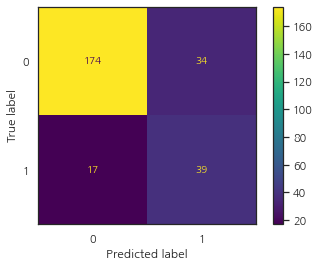

In [66]:
ConfusionMatrixDisplay.from_estimator(pipe_rf_o,X_val,y_val)
plt.show()

### 2-4. RandomForest Hyperparameter Tuning (null -> most_frequent)  (AUC:0.75)

In [67]:
###### pipe라인 랜덤포레스트 모델의 파라미터튜닝
pipe = make_pipeline(
      OrdinalEncoder(),
      SimpleImputer(strategy='most_frequent'),
      RandomForestClassifier(random_state=2))

# 튜닝할 하이퍼파라미터의 범위를 지정
parameters = {'randomforestclassifier__max_depth': range(1, 5, 2), 
              'randomforestclassifier__max_features': range(1, 5, 2), 
              'randomforestclassifier__min_samples_leaf' : range(1, 5, 2)}
    
# 최적의 hyper parameter를 찾기 위한 RandomizedSearchCV
rf_classifier = RandomizedSearchCV(pipe, 
                                    param_distributions=parameters, #  param_distributions : 사전/사전목록
                                    n_iter=8, # 정수, 기본값=10
                                    cv=5, # 교차검증생성기 또는 반복가능 default=None
                                    scoring='roc_auc', # 평가방법
                                    verbose=1) # 진행상황표시. 높을수록 더 많은 메세지표시.
rf_classifier.fit(X_train2, y_train2);

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [68]:
# RandomSearchCV 결과 확인
print('Best Parameters :', rf_classifier.best_params_)
print('검증정확도 :', rf_classifier.best_score_)

Best Parameters : {'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__max_features': 1, 'randomforestclassifier__max_depth': 3}
검증정확도 : 0.7670413999265978


In [69]:
# randomforest_ordinal encoding

pipe_rf_or = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),    
    RandomForestClassifier(random_state=2, min_samples_leaf=3, max_features=1, max_depth=3,class_weight='balanced'))

pipe_rf_or.fit(X_train2, y_train2)
y_pred = pipe_rf_or.predict(X_val2)

print('훈련 정확도 :', pipe_rf_or.score(X_train2,y_train2))
print('검증 정확도 :', pipe_rf_or.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2,y_pred))

훈련 정확도 : 0.7913669064748201
검증 정확도 : 0.7731629392971247
F1 score : 0.5798816568047337
AUC 점수 : 0.7505642670468045
REPORT               precision    recall  f1-score   support

           0       0.91      0.79      0.84       244
           1       0.49      0.71      0.58        69

    accuracy                           0.77       313
   macro avg       0.70      0.75      0.71       313
weighted avg       0.81      0.77      0.79       313



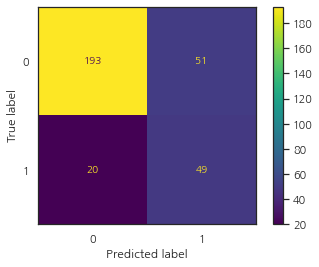

In [70]:
ConfusionMatrixDisplay.from_estimator(pipe_rf_or,X_val2,y_val2)
plt.show()

### 3-1. XGBoost  (AUC:0.73)

In [71]:
# from xgboost import XGBClassifier,XGBRegressor

pipe_xgb_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    XGBClassifier())

pipe_xgb_o.fit(X_train, y_train)
y_pred = pipe_xgb_o.predict(X_val)

print('훈련 정확도 :', pipe_xgb_o.score(X_train,y_train))
print('검증 정확도 :', pipe_xgb_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8636363636363636
F1 score : 0.6086956521739131
AUC 점수 : 0.7307692307692307
REPORT               precision    recall  f1-score   support

           0       0.88      0.96      0.92       208
           1       0.78      0.50      0.61        56

    accuracy                           0.86       264
   macro avg       0.83      0.73      0.76       264
weighted avg       0.86      0.86      0.85       264



### 3-2. XGBoost (null->most_frequent)  (AUC:0.76)

In [72]:
# from xgboost import XGBClassifier,XGBRegressor

pipe_xgb_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    XGBClassifier())

pipe_xgb_o2.fit(X_train2, y_train2)
y_pred = pipe_xgb_o2.predict(X_val2)

print('훈련 정확도 :', pipe_xgb_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_xgb_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

훈련 정확도 : 1.0
검증 정확도 : 0.8690095846645367
F1 score : 0.6611570247933884
AUC 점수 : 0.7652649085293418
REPORT               precision    recall  f1-score   support

           0       0.89      0.95      0.92       244
           1       0.77      0.58      0.66        69

    accuracy                           0.87       313
   macro avg       0.83      0.77      0.79       313
weighted avg       0.86      0.87      0.86       313



In [73]:
data['ProdTaken'].value_counts(normalize=True)

0    0.79624
1    0.20376
Name: ProdTaken, dtype: float64

In [74]:
ratio0 = data['ProdTaken'].value_counts(normalize=True)[0]
ratio1 = data['ProdTaken'].value_counts(normalize=True)[1]
ratio = ratio1/ratio0
ratio

0.2559025133282559

### 3-3. XGBoost Hyperparameter Tuning (AUC : 0.78)

In [75]:
# EDA로 구간별로 구분한 컬럼을 카테고리화하기
category_columns=['Ages','MonthlyIncomeSection']
numerical_columns=['MonthlyIncome','Age']

data[category_columns] = data[category_columns].astype('category')

In [76]:
category_data=pd.get_dummies(data,drop_first=True)

In [77]:
# 훈련/검증셋 나누기

train_dum, test_dum = train_test_split(category_data, test_size=0.2, random_state=2)
train_dum, val_dum = train_test_split(train_dum, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = category_data.columns.drop([target])

X_train_dum = train_dum[features]
y_train_dum = train_dum[target]
X_val_dum = val_dum[features]
y_val_dum = val_dum[target]
X_test_dum = test_dum[features]
y_test_dum = test_dum[target]

train_dum.shape, val_dum.shape, test_dum.shape

((1055, 40), (264, 40), (330, 40))

In [78]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

In [79]:
category_data.columns

Index(['CityTier', 'DurationOfPitch', 'NumberOfPersonVisiting',
       'NumberOfFollowups', 'PreferredPropertyStar', 'NumberOfTrips',
       'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisiting', 'ProdTaken', 'TypeofContact_Self Enquiry',
       'Occupation_Large Business', 'Occupation_Salaried',
       'Occupation_Small Business', 'Gender_Male', 'ProductPitched_Deluxe',
       'ProductPitched_King', 'ProductPitched_Standard',
       'ProductPitched_Super Deluxe', 'MaritalStatus_Married',
       'MaritalStatus_Single', 'MaritalStatus_Unmarried',
       'Designation_Executive', 'Designation_Manager',
       'Designation_Senior Manager', 'Designation_VP', 'Ages_20', 'Ages_30',
       'Ages_40', 'Ages_50', 'Ages_60', 'MonthlyIncomeSection_~20000',
       'MonthlyIncomeSection_~25000', 'MonthlyIncomeSection_~30000',
       'MonthlyIncomeSection_~35000', 'MonthlyIncomeSection_~40000',
       'MonthlyIncomeSection_~45000', 'MonthlyIncomeSection_~50000',
       'Mo

In [80]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_dum, y_train_dum,sample_weight=compute_sample_weight("balanced", y_train_dum))

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.->이 코딩과 무관하게 정확도 등 값은 동일하게 나옴.
xgb_tuned.fit(X_train_dum, y_train_dum,sample_weight=compute_sample_weight("balanced", y_train_dum))

y_pred = xgb_tuned.predict(X_val_dum)

print('훈련 정확도 :', xgb_tuned.score(X_train_dum,y_train_dum))
print('검증 정확도 :', xgb_tuned.score(X_val_dum, y_val_dum))
print('F1 score :', f1_score(y_val_dum, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dum, y_pred))
print('REPORT',classification_report(y_val_dum,y_pred)) 

훈련 정확도 : 1.0
검증 정확도 : 0.8598484848484849
F1 score : 0.6605504587155964
AUC 점수 : 0.7805631868131867
REPORT               precision    recall  f1-score   support

           0       0.91      0.92      0.91       208
           1       0.68      0.64      0.66        56

    accuracy                           0.86       264
   macro avg       0.79      0.78      0.79       264
weighted avg       0.86      0.86      0.86       264



### 3-4. XGBoost Hyperparameter Tuning (null -> most_frequent) (AUC : 0.78)

In [81]:
# null값에 최빈값으로 대체
imputer=SimpleImputer(strategy='most_frequent')
result = imputer.fit_transform(raw_data)
imputed_df = pd.DataFrame(result, columns=raw_data.columns)
imputed_df

,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome,ProdTaken
0,28.0,Company Invited,1,10.0,Small Business,Male,3,4.0,Basic,3.0,Married,3.0,0,1,0,1.0,Executive,20384.0,0
1,34.0,Self Enquiry,3,9.0,Small Business,Female,2,4.0,Deluxe,4.0,Single,1.0,1,5,1,0.0,Manager,19599.0,1
2,45.0,Company Invited,1,9.0,Salaried,Male,2,3.0,Deluxe,4.0,Married,2.0,0,4,1,0.0,Manager,17741.0,0
3,29.0,Company Invited,1,7.0,Small Business,Male,3,5.0,Basic,4.0,Married,3.0,0,4,0,1.0,Executive,21274.0,1
4,42.0,Self Enquiry,3,6.0,Salaried,Male,2,3.0,Deluxe,3.0,Divorced,2.0,0,3,1,0.0,Manager,19907.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1950,28.0,Self Enquiry,1,10.0,Small Business,Male,3,5.0,Basic,3.0,Single,2.0,0,1,1,2.0,Executive,20723.0,0
1951,41.0,Self Enquiry,3,8.0,Salaried,Female,3,3.0,Super Deluxe,5.0,Divorced,1.0,0,5,1,1.0,AVP,31595.0,0
1952,38.0,Company Invited,3,28.0,Small Business,Female,3,4.0,Basic,3.0,Divorced,7.0,0,2,1,2.0,Executive,21651.0,0
1953,28.0,Self Enquiry,3,30.0,Small Business,Female,3,5.0,Deluxe,3.0,Married,3.0,0,1,1,2.0,Manager,22218.0,0


In [82]:
category_raw_data = imputed_df.drop(['MonthlyIncome','Age'],axis=1)
category_raw_data = pd.get_dummies(category_data,drop_first=True)
category_raw_data

,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,...,Ages_50,Ages_60,MonthlyIncomeSection_~20000,MonthlyIncomeSection_~25000,MonthlyIncomeSection_~30000,MonthlyIncomeSection_~35000,MonthlyIncomeSection_~40000,MonthlyIncomeSection_~45000,MonthlyIncomeSection_~50000,MonthlyIncomeSection_~100000
0,1,10.0,3,4.0,3.0,3.0,0,1,0,1.0,...,0,0,0,1,0,0,0,0,0,0
1,1,7.0,3,5.0,4.0,3.0,0,4,0,1.0,...,0,0,0,1,0,0,0,0,0,0
2,3,6.0,2,3.0,3.0,2.0,0,3,1,0.0,...,0,0,1,0,0,0,0,0,0,0
3,1,29.0,4,4.0,3.0,3.0,1,5,1,1.0,...,0,0,0,1,0,0,0,0,0,0
4,3,8.0,3,3.0,3.0,2.0,0,3,1,2.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1644,1,10.0,3,5.0,3.0,2.0,0,1,1,2.0,...,0,0,0,1,0,0,0,0,0,0
1645,3,8.0,3,3.0,5.0,1.0,0,5,1,1.0,...,0,0,0,0,0,1,0,0,0,0
1646,3,28.0,3,4.0,3.0,7.0,0,2,1,2.0,...,0,0,0,1,0,0,0,0,0,0
1647,3,30.0,3,5.0,3.0,3.0,0,1,1,2.0,...,0,0,0,1,0,0,0,0,0,0


In [83]:
# 훈련/검증셋 나누기

train_dumm, test_dumm = train_test_split(category_raw_data, test_size=0.2, random_state=2)
train_dumm, val_dumm = train_test_split(train_dumm, test_size=0.2, random_state=2)

target = 'ProdTaken'
features = category_data.columns.drop([target])

X_train_dumm = train_dumm[features]
y_train_dumm = train_dumm[target]
X_val_dumm = val_dumm[features]
y_val_dumm = val_dumm[target]
X_test_dumm = test_dumm[features]
y_test_dumm = test_dumm[target]

train_dumm.shape, val_dumm.shape, test_dumm.shape

((1055, 40), (264, 40), (330, 40))

In [84]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.->이 코딩과 무관하게 정확도 등 값은 동일하게 나옴.
xgb_tuned.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

y_pred = xgb_tuned.predict(X_val_dumm)

print('훈련 정확도 :', xgb_tuned.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', xgb_tuned.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm,y_pred)) 

훈련 정확도 : 1.0
검증 정확도 : 0.8598484848484849
F1 score : 0.6605504587155964
AUC 점수 : 0.7805631868131867
REPORT               precision    recall  f1-score   support

           0       0.91      0.92      0.91       208
           1       0.68      0.64      0.66        56

    accuracy                           0.86       264
   macro avg       0.79      0.78      0.79       264
weighted avg       0.86      0.86      0.86       264



### 4-1. CatBoost  (AUC:0.69)

In [85]:
# catboost, ordinalencoder

pipe_cat_o = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    CatBoostClassifier(random_state=2))

pipe_cat_o.fit(X_train, y_train)
y_pred = pipe_cat_o.predict(X_val)

print('훈련 정확도 :', pipe_cat_o.score(X_train,y_train))
print('검증 정확도 :', pipe_cat_o.score(X_val, y_val))
print('F1 score :', f1_score(y_val, y_pred))
print('AUC 점수 :', roc_auc_score(y_val, y_pred))
print('REPORT',classification_report(y_val, y_pred))

Learning rate set to 0.010541
0:	learn: 0.6863599	total: 54.6ms	remaining: 54.5s
1:	learn: 0.6804986	total: 55ms	remaining: 27.4s
2:	learn: 0.6737683	total: 55.5ms	remaining: 18.4s
3:	learn: 0.6682891	total: 56.1ms	remaining: 14s
4:	learn: 0.6618033	total: 56.5ms	remaining: 11.3s
5:	learn: 0.6569194	total: 57.1ms	remaining: 9.46s
6:	learn: 0.6517943	total: 57.6ms	remaining: 8.18s
7:	learn: 0.6470932	total: 58.1ms	remaining: 7.21s
8:	learn: 0.6410316	total: 58.6ms	remaining: 6.46s
9:	learn: 0.6347388	total: 59.2ms	remaining: 5.86s
10:	learn: 0.6293634	total: 59.6ms	remaining: 5.36s
11:	learn: 0.6230633	total: 60.2ms	remaining: 4.96s
12:	learn: 0.6176839	total: 60.7ms	remaining: 4.61s
13:	learn: 0.6131124	total: 61ms	remaining: 4.3s
14:	learn: 0.6080886	total: 61.6ms	remaining: 4.04s
15:	learn: 0.6024892	total: 62.1ms	remaining: 3.82s
16:	learn: 0.5970439	total: 62.7ms	remaining: 3.63s
17:	learn: 0.5912197	total: 63.3ms	remaining: 3.46s
18:	learn: 0.5870357	total: 63.9ms	remaining: 3.3s


203:	learn: 0.3154648	total: 182ms	remaining: 708ms
204:	learn: 0.3149353	total: 182ms	remaining: 707ms
205:	learn: 0.3143717	total: 184ms	remaining: 709ms
206:	learn: 0.3139520	total: 184ms	remaining: 707ms
207:	learn: 0.3134757	total: 185ms	remaining: 704ms
208:	learn: 0.3127264	total: 185ms	remaining: 702ms
209:	learn: 0.3120090	total: 186ms	remaining: 700ms
210:	learn: 0.3115700	total: 187ms	remaining: 698ms
211:	learn: 0.3109892	total: 187ms	remaining: 696ms
212:	learn: 0.3102337	total: 188ms	remaining: 693ms
213:	learn: 0.3098000	total: 189ms	remaining: 693ms
214:	learn: 0.3092001	total: 190ms	remaining: 692ms
215:	learn: 0.3087641	total: 190ms	remaining: 690ms
216:	learn: 0.3085244	total: 191ms	remaining: 688ms
217:	learn: 0.3080721	total: 191ms	remaining: 686ms
218:	learn: 0.3076000	total: 192ms	remaining: 685ms
219:	learn: 0.3072291	total: 193ms	remaining: 685ms
220:	learn: 0.3068332	total: 194ms	remaining: 684ms
221:	learn: 0.3061842	total: 195ms	remaining: 683ms
222:	learn: 

383:	learn: 0.2500513	total: 292ms	remaining: 469ms
384:	learn: 0.2495739	total: 293ms	remaining: 468ms
385:	learn: 0.2494816	total: 294ms	remaining: 467ms
386:	learn: 0.2492768	total: 294ms	remaining: 466ms
387:	learn: 0.2490835	total: 295ms	remaining: 465ms
388:	learn: 0.2489410	total: 295ms	remaining: 464ms
389:	learn: 0.2486168	total: 296ms	remaining: 463ms
390:	learn: 0.2483154	total: 297ms	remaining: 462ms
391:	learn: 0.2480752	total: 297ms	remaining: 461ms
392:	learn: 0.2480532	total: 297ms	remaining: 459ms
393:	learn: 0.2478753	total: 298ms	remaining: 458ms
394:	learn: 0.2475797	total: 298ms	remaining: 457ms
395:	learn: 0.2472020	total: 299ms	remaining: 456ms
396:	learn: 0.2470537	total: 300ms	remaining: 455ms
397:	learn: 0.2467862	total: 300ms	remaining: 454ms
398:	learn: 0.2464999	total: 301ms	remaining: 453ms
399:	learn: 0.2460571	total: 301ms	remaining: 452ms
400:	learn: 0.2457541	total: 302ms	remaining: 451ms
401:	learn: 0.2456226	total: 302ms	remaining: 450ms
402:	learn: 

696:	learn: 0.1818339	total: 469ms	remaining: 204ms
697:	learn: 0.1816264	total: 470ms	remaining: 203ms
698:	learn: 0.1815309	total: 470ms	remaining: 202ms
699:	learn: 0.1812978	total: 471ms	remaining: 202ms
700:	learn: 0.1809534	total: 471ms	remaining: 201ms
701:	learn: 0.1808866	total: 472ms	remaining: 200ms
702:	learn: 0.1807186	total: 472ms	remaining: 200ms
703:	learn: 0.1806082	total: 473ms	remaining: 199ms
704:	learn: 0.1803596	total: 473ms	remaining: 198ms
705:	learn: 0.1800813	total: 474ms	remaining: 197ms
706:	learn: 0.1798205	total: 475ms	remaining: 197ms
707:	learn: 0.1796771	total: 475ms	remaining: 196ms
708:	learn: 0.1794967	total: 476ms	remaining: 195ms
709:	learn: 0.1792993	total: 476ms	remaining: 195ms
710:	learn: 0.1791386	total: 477ms	remaining: 194ms
711:	learn: 0.1790041	total: 477ms	remaining: 193ms
712:	learn: 0.1788922	total: 478ms	remaining: 192ms
713:	learn: 0.1786066	total: 478ms	remaining: 192ms
714:	learn: 0.1784579	total: 479ms	remaining: 191ms
715:	learn: 

훈련 정확도 : 0.9715639810426541
검증 정확도 : 0.8674242424242424
F1 score : 0.5569620253164557
AUC 점수 : 0.6940247252747253
REPORT               precision    recall  f1-score   support

           0       0.86      1.00      0.92       208
           1       0.96      0.39      0.56        56

    accuracy                           0.87       264
   macro avg       0.91      0.69      0.74       264
weighted avg       0.88      0.87      0.84       264



### 4-2. CatBoost (null->most_frequent)  (AUC:0.73)

In [86]:
# catboost, ordinalencoder

pipe_cat_o2 = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    CatBoostClassifier(random_state=2))

pipe_cat_o2.fit(X_train2, y_train2)
y_pred = pipe_cat_o2.predict(X_val2)

print('훈련 정확도 :', pipe_cat_o2.score(X_train2,y_train2))
print('검증 정확도 :', pipe_cat_o2.score(X_val2, y_val2))
print('F1 score :', f1_score(y_val2, y_pred))
print('AUC 점수 :', roc_auc_score(y_val2, y_pred))
print('REPORT',classification_report(y_val2, y_pred))

Learning rate set to 0.011336
0:	learn: 0.6862283	total: 1.07ms	remaining: 1.07s
1:	learn: 0.6781792	total: 2.41ms	remaining: 1.2s
2:	learn: 0.6706818	total: 3.52ms	remaining: 1.17s
3:	learn: 0.6626050	total: 4.43ms	remaining: 1.1s
4:	learn: 0.6554906	total: 5.44ms	remaining: 1.08s
5:	learn: 0.6491532	total: 6.4ms	remaining: 1.06s
6:	learn: 0.6430771	total: 7.45ms	remaining: 1.06s
7:	learn: 0.6371943	total: 8.13ms	remaining: 1.01s
8:	learn: 0.6305371	total: 9.09ms	remaining: 1s
9:	learn: 0.6243917	total: 10ms	remaining: 995ms
10:	learn: 0.6187905	total: 11ms	remaining: 989ms
11:	learn: 0.6126062	total: 12ms	remaining: 987ms
12:	learn: 0.6069841	total: 12.9ms	remaining: 981ms
13:	learn: 0.6009946	total: 13.9ms	remaining: 976ms
14:	learn: 0.5962629	total: 14.8ms	remaining: 972ms
15:	learn: 0.5919106	total: 15.8ms	remaining: 975ms
16:	learn: 0.5868436	total: 16.8ms	remaining: 969ms
17:	learn: 0.5810364	total: 17.9ms	remaining: 979ms
18:	learn: 0.5756354	total: 18.8ms	remaining: 972ms
19:	

165:	learn: 0.3441647	total: 138ms	remaining: 695ms
166:	learn: 0.3434864	total: 139ms	remaining: 696ms
167:	learn: 0.3428173	total: 141ms	remaining: 696ms
168:	learn: 0.3422263	total: 142ms	remaining: 696ms
169:	learn: 0.3414930	total: 142ms	remaining: 695ms
170:	learn: 0.3410390	total: 143ms	remaining: 695ms
171:	learn: 0.3405031	total: 144ms	remaining: 694ms
172:	learn: 0.3400111	total: 145ms	remaining: 693ms
173:	learn: 0.3393621	total: 146ms	remaining: 693ms
174:	learn: 0.3388654	total: 147ms	remaining: 692ms
175:	learn: 0.3380762	total: 148ms	remaining: 692ms
176:	learn: 0.3375331	total: 149ms	remaining: 691ms
177:	learn: 0.3369411	total: 150ms	remaining: 692ms
178:	learn: 0.3361387	total: 151ms	remaining: 693ms
179:	learn: 0.3354390	total: 152ms	remaining: 694ms
180:	learn: 0.3349605	total: 154ms	remaining: 695ms
181:	learn: 0.3348143	total: 154ms	remaining: 693ms
182:	learn: 0.3347571	total: 155ms	remaining: 691ms
183:	learn: 0.3341334	total: 156ms	remaining: 692ms
184:	learn: 

375:	learn: 0.2632290	total: 321ms	remaining: 533ms
376:	learn: 0.2629374	total: 322ms	remaining: 533ms
377:	learn: 0.2627881	total: 323ms	remaining: 532ms
378:	learn: 0.2625861	total: 324ms	remaining: 531ms
379:	learn: 0.2622691	total: 325ms	remaining: 530ms
380:	learn: 0.2618952	total: 326ms	remaining: 529ms
381:	learn: 0.2615242	total: 327ms	remaining: 529ms
382:	learn: 0.2613233	total: 328ms	remaining: 528ms
383:	learn: 0.2611899	total: 329ms	remaining: 527ms
384:	learn: 0.2609226	total: 329ms	remaining: 526ms
385:	learn: 0.2606550	total: 330ms	remaining: 525ms
386:	learn: 0.2603984	total: 331ms	remaining: 525ms
387:	learn: 0.2601893	total: 332ms	remaining: 524ms
388:	learn: 0.2599990	total: 333ms	remaining: 523ms
389:	learn: 0.2597411	total: 334ms	remaining: 523ms
390:	learn: 0.2595839	total: 335ms	remaining: 522ms
391:	learn: 0.2593285	total: 336ms	remaining: 521ms
392:	learn: 0.2589098	total: 336ms	remaining: 520ms
393:	learn: 0.2587022	total: 337ms	remaining: 519ms
394:	learn: 

577:	learn: 0.2148570	total: 504ms	remaining: 368ms
578:	learn: 0.2147623	total: 505ms	remaining: 367ms
579:	learn: 0.2144534	total: 506ms	remaining: 367ms
580:	learn: 0.2143163	total: 507ms	remaining: 366ms
581:	learn: 0.2140478	total: 508ms	remaining: 365ms
582:	learn: 0.2136732	total: 509ms	remaining: 364ms
583:	learn: 0.2135121	total: 510ms	remaining: 363ms
584:	learn: 0.2132662	total: 510ms	remaining: 362ms
585:	learn: 0.2131117	total: 511ms	remaining: 361ms
586:	learn: 0.2129772	total: 512ms	remaining: 360ms
587:	learn: 0.2127923	total: 513ms	remaining: 359ms
588:	learn: 0.2125315	total: 514ms	remaining: 358ms
589:	learn: 0.2122776	total: 514ms	remaining: 357ms
590:	learn: 0.2119689	total: 515ms	remaining: 357ms
591:	learn: 0.2117122	total: 516ms	remaining: 356ms
592:	learn: 0.2115705	total: 517ms	remaining: 355ms
593:	learn: 0.2114842	total: 518ms	remaining: 354ms
594:	learn: 0.2113361	total: 518ms	remaining: 353ms
595:	learn: 0.2111762	total: 519ms	remaining: 352ms
596:	learn: 

744:	learn: 0.1819870	total: 666ms	remaining: 228ms
745:	learn: 0.1817930	total: 668ms	remaining: 227ms
746:	learn: 0.1815220	total: 669ms	remaining: 227ms
747:	learn: 0.1812243	total: 671ms	remaining: 226ms
748:	learn: 0.1809179	total: 672ms	remaining: 225ms
749:	learn: 0.1807633	total: 673ms	remaining: 224ms
750:	learn: 0.1804793	total: 674ms	remaining: 223ms
751:	learn: 0.1803813	total: 675ms	remaining: 223ms
752:	learn: 0.1801477	total: 676ms	remaining: 222ms
753:	learn: 0.1800283	total: 677ms	remaining: 221ms
754:	learn: 0.1798467	total: 678ms	remaining: 220ms
755:	learn: 0.1795695	total: 679ms	remaining: 219ms
756:	learn: 0.1793113	total: 680ms	remaining: 218ms
757:	learn: 0.1791118	total: 681ms	remaining: 218ms
758:	learn: 0.1790292	total: 682ms	remaining: 217ms
759:	learn: 0.1788041	total: 683ms	remaining: 216ms
760:	learn: 0.1785449	total: 684ms	remaining: 215ms
761:	learn: 0.1783752	total: 685ms	remaining: 214ms
762:	learn: 0.1782484	total: 686ms	remaining: 213ms
763:	learn: 

947:	learn: 0.1489788	total: 849ms	remaining: 46.6ms
948:	learn: 0.1488402	total: 850ms	remaining: 45.7ms
949:	learn: 0.1486617	total: 851ms	remaining: 44.8ms
950:	learn: 0.1486039	total: 852ms	remaining: 43.9ms
951:	learn: 0.1484519	total: 853ms	remaining: 43ms
952:	learn: 0.1483227	total: 854ms	remaining: 42.1ms
953:	learn: 0.1481978	total: 856ms	remaining: 41.3ms
954:	learn: 0.1481452	total: 857ms	remaining: 40.4ms
955:	learn: 0.1480154	total: 858ms	remaining: 39.5ms
956:	learn: 0.1479006	total: 859ms	remaining: 38.6ms
957:	learn: 0.1477899	total: 860ms	remaining: 37.7ms
958:	learn: 0.1476403	total: 861ms	remaining: 36.8ms
959:	learn: 0.1474992	total: 862ms	remaining: 35.9ms
960:	learn: 0.1473810	total: 863ms	remaining: 35ms
961:	learn: 0.1472464	total: 864ms	remaining: 34.1ms
962:	learn: 0.1471144	total: 865ms	remaining: 33.2ms
963:	learn: 0.1469635	total: 866ms	remaining: 32.3ms
964:	learn: 0.1467708	total: 867ms	remaining: 31.4ms
965:	learn: 0.1466347	total: 868ms	remaining: 30.5

### 4-3. CatBoost Hyper Parameter  (AUC:0.67)

In [87]:
cbc=CatBoostClassifier(random_state=2)

grid = {'depth' : [4,5,6,7,8,9, 10],
        'learning_rate' : [0.01,0.02,0.03,0.04],
        'iterations'    : [10, 20,30,40,50,60,70,80,90,100]}

gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring ='roc_auc', cv = 5)

gscv.fit(X_train_dum,y_train_dum,sample_weight=compute_sample_weight("balanced", y_train_dum))

print(gscv.best_estimator_)
print(gscv.best_score_)
print(gscv.best_params_)



0:	learn: 0.6902407	total: 623us	remaining: 5.61ms
1:	learn: 0.6877495	total: 1.32ms	remaining: 5.28ms
2:	learn: 0.6849394	total: 1.79ms	remaining: 4.19ms
3:	learn: 0.6824884	total: 2.24ms	remaining: 3.35ms
4:	learn: 0.6807331	total: 2.85ms	remaining: 2.85ms
5:	learn: 0.6782238	total: 3.4ms	remaining: 2.27ms
6:	learn: 0.6765650	total: 3.89ms	remaining: 1.67ms
7:	learn: 0.6749042	total: 4.34ms	remaining: 1.08ms
8:	learn: 0.6735212	total: 4.81ms	remaining: 534us
9:	learn: 0.6717931	total: 5.23ms	remaining: 0us
0:	learn: 0.6902859	total: 599us	remaining: 5.4ms
1:	learn: 0.6884434	total: 1.04ms	remaining: 4.18ms
2:	learn: 0.6865389	total: 1.53ms	remaining: 3.58ms
3:	learn: 0.6838900	total: 2.06ms	remaining: 3.1ms
4:	learn: 0.6812889	total: 2.51ms	remaining: 2.51ms
5:	learn: 0.6786105	total: 2.93ms	remaining: 1.95ms
6:	learn: 0.6769683	total: 3.37ms	remaining: 1.44ms
7:	learn: 0.6753542	total: 3.86ms	remaining: 966us
8:	learn: 0.6736702	total: 4.3ms	remaining: 477us
9:	learn: 0.6720001	tota

7:	learn: 0.6459134	total: 3.54ms	remaining: 886us
8:	learn: 0.6420791	total: 4.62ms	remaining: 513us
9:	learn: 0.6377958	total: 5.08ms	remaining: 0us
0:	learn: 0.6842476	total: 468us	remaining: 4.21ms
1:	learn: 0.6780784	total: 1.01ms	remaining: 4.03ms
2:	learn: 0.6690320	total: 1.59ms	remaining: 3.71ms
3:	learn: 0.6608531	total: 2.05ms	remaining: 3.07ms
4:	learn: 0.6528397	total: 2.59ms	remaining: 2.59ms
5:	learn: 0.6485104	total: 3.06ms	remaining: 2.04ms
6:	learn: 0.6438907	total: 3.52ms	remaining: 1.51ms
7:	learn: 0.6395586	total: 4.06ms	remaining: 1.01ms
8:	learn: 0.6362920	total: 4.64ms	remaining: 515us
9:	learn: 0.6315685	total: 5.06ms	remaining: 0us
0:	learn: 0.6902407	total: 497us	remaining: 9.44ms
1:	learn: 0.6877495	total: 934us	remaining: 8.41ms
2:	learn: 0.6849394	total: 1.35ms	remaining: 7.68ms
3:	learn: 0.6824884	total: 1.81ms	remaining: 7.25ms
4:	learn: 0.6807331	total: 2.25ms	remaining: 6.74ms
5:	learn: 0.6782238	total: 2.85ms	remaining: 6.65ms
6:	learn: 0.6765650	tota

7:	learn: 0.6665490	total: 4.12ms	remaining: 6.18ms
8:	learn: 0.6632469	total: 4.75ms	remaining: 5.8ms
9:	learn: 0.6606799	total: 5.19ms	remaining: 5.19ms
10:	learn: 0.6566979	total: 5.67ms	remaining: 4.64ms
11:	learn: 0.6531931	total: 6.11ms	remaining: 4.07ms
12:	learn: 0.6502565	total: 6.57ms	remaining: 3.54ms
13:	learn: 0.6483123	total: 7.12ms	remaining: 3.05ms
14:	learn: 0.6450283	total: 7.58ms	remaining: 2.53ms
15:	learn: 0.6419098	total: 8ms	remaining: 2ms
16:	learn: 0.6394334	total: 8.58ms	remaining: 1.51ms
17:	learn: 0.6365124	total: 9.12ms	remaining: 1.01ms
18:	learn: 0.6339943	total: 9.6ms	remaining: 505us
19:	learn: 0.6319628	total: 10.1ms	remaining: 0us
0:	learn: 0.6886426	total: 494us	remaining: 9.4ms
1:	learn: 0.6854034	total: 908us	remaining: 8.18ms
2:	learn: 0.6810780	total: 1.33ms	remaining: 7.52ms
3:	learn: 0.6765068	total: 1.81ms	remaining: 7.24ms
4:	learn: 0.6718885	total: 2.41ms	remaining: 7.24ms
5:	learn: 0.6676358	total: 2.81ms	remaining: 6.57ms
6:	learn: 0.66498

6:	learn: 0.6426384	total: 3.53ms	remaining: 6.55ms
7:	learn: 0.6387991	total: 4.26ms	remaining: 6.4ms
8:	learn: 0.6325166	total: 4.68ms	remaining: 5.72ms
9:	learn: 0.6255968	total: 5.34ms	remaining: 5.34ms
10:	learn: 0.6194736	total: 5.89ms	remaining: 4.82ms
11:	learn: 0.6137337	total: 6.31ms	remaining: 4.21ms
12:	learn: 0.6098770	total: 6.72ms	remaining: 3.62ms
13:	learn: 0.6069435	total: 7.32ms	remaining: 3.14ms
14:	learn: 0.6034040	total: 7.77ms	remaining: 2.59ms
15:	learn: 0.5976123	total: 8.21ms	remaining: 2.05ms
16:	learn: 0.5935111	total: 8.61ms	remaining: 1.52ms
17:	learn: 0.5888132	total: 9.01ms	remaining: 1ms
18:	learn: 0.5861967	total: 9.39ms	remaining: 494us
19:	learn: 0.5836904	total: 9.79ms	remaining: 0us
0:	learn: 0.6866112	total: 715us	remaining: 13.6ms
1:	learn: 0.6816766	total: 1.2ms	remaining: 10.8ms
2:	learn: 0.6737733	total: 1.6ms	remaining: 9.05ms
3:	learn: 0.6651722	total: 2.02ms	remaining: 8.1ms
4:	learn: 0.6592274	total: 2.41ms	remaining: 7.24ms
5:	learn: 0.65

16:	learn: 0.6305893	total: 9.52ms	remaining: 7.28ms
17:	learn: 0.6281731	total: 10.4ms	remaining: 6.9ms
18:	learn: 0.6254413	total: 10.9ms	remaining: 6.31ms
19:	learn: 0.6231192	total: 11.5ms	remaining: 5.75ms
20:	learn: 0.6200704	total: 11.9ms	remaining: 5.12ms
21:	learn: 0.6175013	total: 12.4ms	remaining: 4.5ms
22:	learn: 0.6142680	total: 12.8ms	remaining: 3.9ms
23:	learn: 0.6113547	total: 13.3ms	remaining: 3.32ms
24:	learn: 0.6097800	total: 13.7ms	remaining: 2.74ms
25:	learn: 0.6079156	total: 14.2ms	remaining: 2.18ms
26:	learn: 0.6057790	total: 14.6ms	remaining: 1.62ms
27:	learn: 0.6042928	total: 15ms	remaining: 1.07ms
28:	learn: 0.6018917	total: 15.4ms	remaining: 532us
29:	learn: 0.5989256	total: 15.9ms	remaining: 0us
0:	learn: 0.6874602	total: 649us	remaining: 18.8ms
1:	learn: 0.6838697	total: 1.04ms	remaining: 14.5ms
2:	learn: 0.6790730	total: 1.39ms	remaining: 12.5ms
3:	learn: 0.6738870	total: 1.88ms	remaining: 12.2ms
4:	learn: 0.6690305	total: 2.37ms	remaining: 11.9ms
5:	learn

19:	learn: 0.6052277	total: 11.8ms	remaining: 5.88ms
20:	learn: 0.6022046	total: 12.3ms	remaining: 5.29ms
21:	learn: 0.5990821	total: 12.9ms	remaining: 4.7ms
22:	learn: 0.5961362	total: 13.5ms	remaining: 4.11ms
23:	learn: 0.5923293	total: 14ms	remaining: 3.51ms
24:	learn: 0.5888344	total: 14.5ms	remaining: 2.9ms
25:	learn: 0.5861325	total: 14.9ms	remaining: 2.3ms
26:	learn: 0.5828661	total: 15.4ms	remaining: 1.71ms
27:	learn: 0.5802390	total: 15.8ms	remaining: 1.13ms
28:	learn: 0.5778843	total: 16.2ms	remaining: 559us
29:	learn: 0.5753724	total: 16.6ms	remaining: 0us
0:	learn: 0.6882182	total: 469us	remaining: 13.6ms
1:	learn: 0.6827323	total: 859us	remaining: 12ms
2:	learn: 0.6768460	total: 1.28ms	remaining: 11.5ms
3:	learn: 0.6702868	total: 1.68ms	remaining: 10.9ms
4:	learn: 0.6656483	total: 2.06ms	remaining: 10.3ms
5:	learn: 0.6617255	total: 2.44ms	remaining: 9.74ms
6:	learn: 0.6580949	total: 2.9ms	remaining: 9.52ms
7:	learn: 0.6551114	total: 3.34ms	remaining: 9.2ms
8:	learn: 0.6522

19:	learn: 0.6516746	total: 8.73ms	remaining: 8.73ms
20:	learn: 0.6503640	total: 9.39ms	remaining: 8.49ms
21:	learn: 0.6479690	total: 9.8ms	remaining: 8.02ms
22:	learn: 0.6463003	total: 10.3ms	remaining: 7.61ms
23:	learn: 0.6445664	total: 10.7ms	remaining: 7.15ms
24:	learn: 0.6423028	total: 11.2ms	remaining: 6.71ms
25:	learn: 0.6410081	total: 11.6ms	remaining: 6.25ms
26:	learn: 0.6393160	total: 12ms	remaining: 5.8ms
27:	learn: 0.6375126	total: 12.6ms	remaining: 5.41ms
28:	learn: 0.6361076	total: 13.1ms	remaining: 4.96ms
29:	learn: 0.6349357	total: 13.5ms	remaining: 4.51ms
30:	learn: 0.6333949	total: 14ms	remaining: 4.06ms
31:	learn: 0.6316877	total: 14.4ms	remaining: 3.6ms
32:	learn: 0.6303850	total: 14.9ms	remaining: 3.15ms
33:	learn: 0.6296510	total: 15.2ms	remaining: 2.68ms
34:	learn: 0.6283868	total: 15.6ms	remaining: 2.23ms
35:	learn: 0.6267733	total: 16.2ms	remaining: 1.8ms
36:	learn: 0.6249779	total: 16.6ms	remaining: 1.35ms
37:	learn: 0.6233604	total: 17ms	remaining: 895us
38:	

0:	learn: 0.6892653	total: 496us	remaining: 19.4ms
1:	learn: 0.6852147	total: 1.1ms	remaining: 20.9ms
2:	learn: 0.6812169	total: 1.53ms	remaining: 18.9ms
3:	learn: 0.6760579	total: 2.09ms	remaining: 18.8ms
4:	learn: 0.6726773	total: 2.49ms	remaining: 17.4ms
5:	learn: 0.6677816	total: 2.91ms	remaining: 16.5ms
6:	learn: 0.6646468	total: 3.32ms	remaining: 15.6ms
7:	learn: 0.6621634	total: 3.7ms	remaining: 14.8ms
8:	learn: 0.6587266	total: 4.1ms	remaining: 14.1ms
9:	learn: 0.6558830	total: 4.54ms	remaining: 13.6ms
10:	learn: 0.6517691	total: 4.97ms	remaining: 13.1ms
11:	learn: 0.6488695	total: 5.51ms	remaining: 12.9ms
12:	learn: 0.6451019	total: 5.96ms	remaining: 12.4ms
13:	learn: 0.6428565	total: 6.48ms	remaining: 12ms
14:	learn: 0.6396261	total: 6.97ms	remaining: 11.6ms
15:	learn: 0.6369127	total: 7.4ms	remaining: 11.1ms
16:	learn: 0.6333307	total: 7.83ms	remaining: 10.6ms
17:	learn: 0.6297728	total: 8.28ms	remaining: 10.1ms
18:	learn: 0.6275832	total: 8.69ms	remaining: 9.6ms
19:	learn: 

39:	learn: 0.5498620	total: 17.6ms	remaining: 0us
0:	learn: 0.6846749	total: 532us	remaining: 20.8ms
1:	learn: 0.6794188	total: 990us	remaining: 18.8ms
2:	learn: 0.6724713	total: 1.54ms	remaining: 19ms
3:	learn: 0.6650677	total: 2.06ms	remaining: 18.6ms
4:	learn: 0.6609918	total: 2.48ms	remaining: 17.4ms
5:	learn: 0.6540520	total: 2.88ms	remaining: 16.3ms
6:	learn: 0.6500925	total: 3.5ms	remaining: 16.5ms
7:	learn: 0.6439215	total: 3.94ms	remaining: 15.8ms
8:	learn: 0.6395765	total: 4.33ms	remaining: 14.9ms
9:	learn: 0.6358617	total: 4.77ms	remaining: 14.3ms
10:	learn: 0.6300138	total: 5.17ms	remaining: 13.6ms
11:	learn: 0.6244803	total: 5.59ms	remaining: 13ms
12:	learn: 0.6199548	total: 6.02ms	remaining: 12.5ms
13:	learn: 0.6160330	total: 6.45ms	remaining: 12ms
14:	learn: 0.6115282	total: 6.93ms	remaining: 11.5ms
15:	learn: 0.6070891	total: 7.41ms	remaining: 11.1ms
16:	learn: 0.6033357	total: 7.85ms	remaining: 10.6ms
17:	learn: 0.6000110	total: 8.25ms	remaining: 10.1ms
18:	learn: 0.59

37:	learn: 0.5311679	total: 16.6ms	remaining: 876us
38:	learn: 0.5300330	total: 17.2ms	remaining: 441us
39:	learn: 0.5279078	total: 17.8ms	remaining: 0us
0:	learn: 0.6819235	total: 532us	remaining: 20.8ms
1:	learn: 0.6750950	total: 974us	remaining: 18.5ms
2:	learn: 0.6661467	total: 1.43ms	remaining: 17.7ms
3:	learn: 0.6567548	total: 1.83ms	remaining: 16.5ms
4:	learn: 0.6517302	total: 2.28ms	remaining: 16ms
5:	learn: 0.6434840	total: 2.68ms	remaining: 15.2ms
6:	learn: 0.6386849	total: 3.04ms	remaining: 14.3ms
7:	learn: 0.6322799	total: 3.44ms	remaining: 13.7ms
8:	learn: 0.6271246	total: 3.84ms	remaining: 13.2ms
9:	learn: 0.6233633	total: 4.23ms	remaining: 12.7ms
10:	learn: 0.6162777	total: 4.63ms	remaining: 12.2ms
11:	learn: 0.6097486	total: 5.03ms	remaining: 11.7ms
12:	learn: 0.6044982	total: 5.42ms	remaining: 11.3ms
13:	learn: 0.5999516	total: 5.84ms	remaining: 10.8ms
14:	learn: 0.5986604	total: 6.16ms	remaining: 10.3ms
15:	learn: 0.5948826	total: 6.6ms	remaining: 9.9ms
16:	learn: 0.5

0:	learn: 0.6902407	total: 520us	remaining: 25.5ms
1:	learn: 0.6877495	total: 1.19ms	remaining: 28.6ms
2:	learn: 0.6849394	total: 1.75ms	remaining: 27.4ms
3:	learn: 0.6824884	total: 2.41ms	remaining: 27.7ms
4:	learn: 0.6807331	total: 2.86ms	remaining: 25.8ms
5:	learn: 0.6782238	total: 3.3ms	remaining: 24.2ms
6:	learn: 0.6765650	total: 3.79ms	remaining: 23.3ms
7:	learn: 0.6749042	total: 4.27ms	remaining: 22.4ms
8:	learn: 0.6735212	total: 4.69ms	remaining: 21.4ms
9:	learn: 0.6717931	total: 5.13ms	remaining: 20.5ms
10:	learn: 0.6696336	total: 5.7ms	remaining: 20.2ms
11:	learn: 0.6681581	total: 6.21ms	remaining: 19.7ms
12:	learn: 0.6660988	total: 6.63ms	remaining: 18.9ms
13:	learn: 0.6646148	total: 7.14ms	remaining: 18.4ms
14:	learn: 0.6622473	total: 7.8ms	remaining: 18.2ms
15:	learn: 0.6602754	total: 8.22ms	remaining: 17.5ms
16:	learn: 0.6581622	total: 8.63ms	remaining: 16.7ms
17:	learn: 0.6561051	total: 8.98ms	remaining: 16ms
18:	learn: 0.6541888	total: 9.37ms	remaining: 15.3ms
19:	learn

36:	learn: 0.5847190	total: 15.7ms	remaining: 5.5ms
37:	learn: 0.5828693	total: 16.4ms	remaining: 5.17ms
38:	learn: 0.5814743	total: 16.8ms	remaining: 4.74ms
39:	learn: 0.5798017	total: 17.2ms	remaining: 4.3ms
40:	learn: 0.5773811	total: 17.7ms	remaining: 3.88ms
41:	learn: 0.5755326	total: 18.1ms	remaining: 3.45ms
42:	learn: 0.5745545	total: 18.5ms	remaining: 3.02ms
43:	learn: 0.5727939	total: 19ms	remaining: 2.59ms
44:	learn: 0.5710129	total: 19.4ms	remaining: 2.15ms
45:	learn: 0.5694172	total: 19.8ms	remaining: 1.72ms
46:	learn: 0.5674613	total: 20.3ms	remaining: 1.29ms
47:	learn: 0.5667807	total: 20.7ms	remaining: 863us
48:	learn: 0.5651301	total: 21.1ms	remaining: 431us
49:	learn: 0.5636760	total: 21.6ms	remaining: 0us
0:	learn: 0.6874602	total: 570us	remaining: 28ms
1:	learn: 0.6838697	total: 983us	remaining: 23.6ms
2:	learn: 0.6790730	total: 1.39ms	remaining: 21.8ms
3:	learn: 0.6738870	total: 1.78ms	remaining: 20.5ms
4:	learn: 0.6690305	total: 2.16ms	remaining: 19.4ms
5:	learn: 0

44:	learn: 0.5415515	total: 19.2ms	remaining: 2.14ms
45:	learn: 0.5391850	total: 19.9ms	remaining: 1.73ms
46:	learn: 0.5373524	total: 20.3ms	remaining: 1.3ms
47:	learn: 0.5355200	total: 20.8ms	remaining: 865us
48:	learn: 0.5337841	total: 21.2ms	remaining: 433us
49:	learn: 0.5325019	total: 21.7ms	remaining: 0us
0:	learn: 0.6846749	total: 533us	remaining: 26.2ms
1:	learn: 0.6794188	total: 1.05ms	remaining: 25.3ms
2:	learn: 0.6724713	total: 1.47ms	remaining: 23ms
3:	learn: 0.6650677	total: 2.04ms	remaining: 23.4ms
4:	learn: 0.6609918	total: 2.62ms	remaining: 23.6ms
5:	learn: 0.6540520	total: 3.04ms	remaining: 22.3ms
6:	learn: 0.6500925	total: 3.5ms	remaining: 21.5ms
7:	learn: 0.6439215	total: 3.94ms	remaining: 20.7ms
8:	learn: 0.6395765	total: 4.45ms	remaining: 20.3ms
9:	learn: 0.6358617	total: 4.84ms	remaining: 19.4ms
10:	learn: 0.6300138	total: 5.28ms	remaining: 18.7ms
11:	learn: 0.6244803	total: 5.74ms	remaining: 18.2ms
12:	learn: 0.6199548	total: 6.15ms	remaining: 17.5ms
13:	learn: 0.

26:	learn: 0.5547544	total: 12ms	remaining: 10.2ms
27:	learn: 0.5512593	total: 12.6ms	remaining: 9.94ms
28:	learn: 0.5487311	total: 13.2ms	remaining: 9.54ms
29:	learn: 0.5466608	total: 13.7ms	remaining: 9.15ms
30:	learn: 0.5443220	total: 14.3ms	remaining: 8.79ms
31:	learn: 0.5416120	total: 14.8ms	remaining: 8.3ms
32:	learn: 0.5390746	total: 15.3ms	remaining: 7.88ms
33:	learn: 0.5360177	total: 15.8ms	remaining: 7.44ms
34:	learn: 0.5341316	total: 16.3ms	remaining: 6.98ms
35:	learn: 0.5313049	total: 16.7ms	remaining: 6.51ms
36:	learn: 0.5299708	total: 17.3ms	remaining: 6.09ms
37:	learn: 0.5275436	total: 17.8ms	remaining: 5.61ms
38:	learn: 0.5257244	total: 18.2ms	remaining: 5.14ms
39:	learn: 0.5240015	total: 18.8ms	remaining: 4.71ms
40:	learn: 0.5217140	total: 19.4ms	remaining: 4.26ms
41:	learn: 0.5201977	total: 19.9ms	remaining: 3.78ms
42:	learn: 0.5177957	total: 20.3ms	remaining: 3.3ms
43:	learn: 0.5165767	total: 20.7ms	remaining: 2.82ms
44:	learn: 0.5147905	total: 21.1ms	remaining: 2.34

44:	learn: 0.5271518	total: 19.9ms	remaining: 2.21ms
45:	learn: 0.5253577	total: 20.7ms	remaining: 1.8ms
46:	learn: 0.5234004	total: 21.1ms	remaining: 1.34ms
47:	learn: 0.5213118	total: 21.5ms	remaining: 897us
48:	learn: 0.5203009	total: 22ms	remaining: 449us
49:	learn: 0.5196973	total: 22.6ms	remaining: 0us
0:	learn: 0.6902407	total: 606us	remaining: 35.8ms
1:	learn: 0.6877495	total: 1.11ms	remaining: 32.3ms
2:	learn: 0.6849394	total: 1.7ms	remaining: 32.4ms
3:	learn: 0.6824884	total: 2.19ms	remaining: 30.7ms
4:	learn: 0.6807331	total: 2.69ms	remaining: 29.6ms
5:	learn: 0.6782238	total: 3.11ms	remaining: 28ms
6:	learn: 0.6765650	total: 3.58ms	remaining: 27.1ms
7:	learn: 0.6749042	total: 4.23ms	remaining: 27.5ms
8:	learn: 0.6735212	total: 4.62ms	remaining: 26.2ms
9:	learn: 0.6717931	total: 5.05ms	remaining: 25.2ms
10:	learn: 0.6696336	total: 5.41ms	remaining: 24.1ms
11:	learn: 0.6681581	total: 5.78ms	remaining: 23.1ms
12:	learn: 0.6660988	total: 6.19ms	remaining: 22.4ms
13:	learn: 0.66

0:	learn: 0.6914846	total: 761us	remaining: 44.9ms
1:	learn: 0.6895719	total: 2.8ms	remaining: 81.1ms
2:	learn: 0.6874626	total: 3.41ms	remaining: 64.7ms
3:	learn: 0.6850605	total: 3.98ms	remaining: 55.7ms
4:	learn: 0.6825749	total: 4.73ms	remaining: 52ms
5:	learn: 0.6811472	total: 5.57ms	remaining: 50.2ms
6:	learn: 0.6797033	total: 6.08ms	remaining: 46ms
7:	learn: 0.6784644	total: 6.71ms	remaining: 43.6ms
8:	learn: 0.6769041	total: 7.13ms	remaining: 40.4ms
9:	learn: 0.6752880	total: 7.53ms	remaining: 37.6ms
10:	learn: 0.6730619	total: 8.17ms	remaining: 36.4ms
11:	learn: 0.6717844	total: 8.99ms	remaining: 36ms
12:	learn: 0.6700537	total: 9.41ms	remaining: 34ms
13:	learn: 0.6688450	total: 10.1ms	remaining: 33.1ms
14:	learn: 0.6668738	total: 10.6ms	remaining: 31.9ms
15:	learn: 0.6652984	total: 11ms	remaining: 30.3ms
16:	learn: 0.6633721	total: 11.5ms	remaining: 29ms
17:	learn: 0.6615908	total: 12.2ms	remaining: 28.6ms
18:	learn: 0.6601491	total: 12.8ms	remaining: 27.5ms
19:	learn: 0.6585

40:	learn: 0.5724994	total: 18.6ms	remaining: 8.64ms
41:	learn: 0.5713762	total: 19.3ms	remaining: 8.28ms
42:	learn: 0.5698248	total: 19.7ms	remaining: 7.8ms
43:	learn: 0.5682962	total: 20.1ms	remaining: 7.33ms
44:	learn: 0.5664750	total: 20.6ms	remaining: 6.86ms
45:	learn: 0.5642736	total: 21ms	remaining: 6.4ms
46:	learn: 0.5626964	total: 21.5ms	remaining: 5.93ms
47:	learn: 0.5612537	total: 21.9ms	remaining: 5.47ms
48:	learn: 0.5596709	total: 22.3ms	remaining: 5.01ms
49:	learn: 0.5581327	total: 22.7ms	remaining: 4.54ms
50:	learn: 0.5569724	total: 23.1ms	remaining: 4.08ms
51:	learn: 0.5553073	total: 23.5ms	remaining: 3.62ms
52:	learn: 0.5540025	total: 24ms	remaining: 3.17ms
53:	learn: 0.5527376	total: 24.4ms	remaining: 2.71ms
54:	learn: 0.5514419	total: 24.8ms	remaining: 2.25ms
55:	learn: 0.5497911	total: 25.2ms	remaining: 1.8ms
56:	learn: 0.5484130	total: 25.6ms	remaining: 1.35ms
57:	learn: 0.5471733	total: 26.1ms	remaining: 898us
58:	learn: 0.5461408	total: 26.5ms	remaining: 448us
59

8:	learn: 0.6425681	total: 3.9ms	remaining: 22.1ms
9:	learn: 0.6386639	total: 4.65ms	remaining: 23.3ms
10:	learn: 0.6347315	total: 5.08ms	remaining: 22.6ms
11:	learn: 0.6313661	total: 5.49ms	remaining: 22ms
12:	learn: 0.6267876	total: 5.94ms	remaining: 21.5ms
13:	learn: 0.6234468	total: 6.41ms	remaining: 21.1ms
14:	learn: 0.6182328	total: 7.02ms	remaining: 21.1ms
15:	learn: 0.6142667	total: 7.48ms	remaining: 20.6ms
16:	learn: 0.6100004	total: 7.92ms	remaining: 20ms
17:	learn: 0.6058872	total: 8.34ms	remaining: 19.4ms
18:	learn: 0.6020816	total: 8.85ms	remaining: 19.1ms
19:	learn: 0.5996723	total: 9.41ms	remaining: 18.8ms
20:	learn: 0.5973987	total: 9.9ms	remaining: 18.4ms
21:	learn: 0.5926438	total: 10.4ms	remaining: 18ms
22:	learn: 0.5894717	total: 10.9ms	remaining: 17.5ms
23:	learn: 0.5861643	total: 11.3ms	remaining: 17ms
24:	learn: 0.5836186	total: 11.7ms	remaining: 16.4ms
25:	learn: 0.5814472	total: 12.2ms	remaining: 15.9ms
26:	learn: 0.5784841	total: 12.6ms	remaining: 15.4ms
27:	l

53:	learn: 0.5447643	total: 28.9ms	remaining: 3.21ms
54:	learn: 0.5432524	total: 29.6ms	remaining: 2.69ms
55:	learn: 0.5411174	total: 30.6ms	remaining: 2.19ms
56:	learn: 0.5406793	total: 31.4ms	remaining: 1.65ms
57:	learn: 0.5395421	total: 32.5ms	remaining: 1.12ms
58:	learn: 0.5380160	total: 33.4ms	remaining: 566us
59:	learn: 0.5365099	total: 33.9ms	remaining: 0us
0:	learn: 0.6864302	total: 809us	remaining: 47.8ms
1:	learn: 0.6816887	total: 1.58ms	remaining: 45.9ms
2:	learn: 0.6754473	total: 2.08ms	remaining: 39.5ms
3:	learn: 0.6689487	total: 2.51ms	remaining: 35.2ms
4:	learn: 0.6624969	total: 2.92ms	remaining: 32.1ms
5:	learn: 0.6566761	total: 3.52ms	remaining: 31.6ms
6:	learn: 0.6530436	total: 4.3ms	remaining: 32.5ms
7:	learn: 0.6495221	total: 4.75ms	remaining: 30.9ms
8:	learn: 0.6466468	total: 5.28ms	remaining: 29.9ms
9:	learn: 0.6432449	total: 5.75ms	remaining: 28.7ms
10:	learn: 0.6370525	total: 6.16ms	remaining: 27.5ms
11:	learn: 0.6327035	total: 6.57ms	remaining: 26.3ms
12:	learn

24:	learn: 0.5778657	total: 10.9ms	remaining: 15.3ms
25:	learn: 0.5740488	total: 11.7ms	remaining: 15.3ms
26:	learn: 0.5707688	total: 12.2ms	remaining: 14.9ms
27:	learn: 0.5676821	total: 12.6ms	remaining: 14.4ms
28:	learn: 0.5663819	total: 13.1ms	remaining: 14ms
29:	learn: 0.5642237	total: 13.6ms	remaining: 13.6ms
30:	learn: 0.5624054	total: 14.1ms	remaining: 13.2ms
31:	learn: 0.5601141	total: 14.5ms	remaining: 12.7ms
32:	learn: 0.5579829	total: 15ms	remaining: 12.3ms
33:	learn: 0.5569011	total: 15.3ms	remaining: 11.7ms
34:	learn: 0.5552253	total: 15.7ms	remaining: 11.2ms
35:	learn: 0.5532056	total: 16.2ms	remaining: 10.8ms
36:	learn: 0.5505254	total: 16.6ms	remaining: 10.3ms
37:	learn: 0.5487896	total: 17.1ms	remaining: 9.89ms
38:	learn: 0.5467761	total: 17.5ms	remaining: 9.43ms
39:	learn: 0.5446545	total: 17.9ms	remaining: 8.96ms
40:	learn: 0.5432145	total: 18.3ms	remaining: 8.49ms
41:	learn: 0.5414885	total: 18.7ms	remaining: 8.02ms
42:	learn: 0.5392460	total: 19.1ms	remaining: 7.57

0:	learn: 0.6902859	total: 454us	remaining: 31.4ms
1:	learn: 0.6884434	total: 1.11ms	remaining: 37.9ms
2:	learn: 0.6865389	total: 1.52ms	remaining: 34ms
3:	learn: 0.6838900	total: 1.93ms	remaining: 31.9ms
4:	learn: 0.6812889	total: 2.37ms	remaining: 30.9ms
5:	learn: 0.6786105	total: 2.83ms	remaining: 30.1ms
6:	learn: 0.6769683	total: 3.35ms	remaining: 30.1ms
7:	learn: 0.6753542	total: 3.83ms	remaining: 29.7ms
8:	learn: 0.6736702	total: 4.24ms	remaining: 28.8ms
9:	learn: 0.6720001	total: 4.65ms	remaining: 27.9ms
10:	learn: 0.6694388	total: 5.07ms	remaining: 27.2ms
11:	learn: 0.6676010	total: 5.56ms	remaining: 26.9ms
12:	learn: 0.6654846	total: 5.99ms	remaining: 26.3ms
13:	learn: 0.6636652	total: 6.43ms	remaining: 25.7ms
14:	learn: 0.6614531	total: 6.88ms	remaining: 25.2ms
15:	learn: 0.6591508	total: 7.29ms	remaining: 24.6ms
16:	learn: 0.6568584	total: 7.67ms	remaining: 23.9ms
17:	learn: 0.6550575	total: 8.09ms	remaining: 23.4ms
18:	learn: 0.6532507	total: 8.51ms	remaining: 22.8ms
19:	le

0:	learn: 0.6908811	total: 567us	remaining: 39.2ms
1:	learn: 0.6892213	total: 1.28ms	remaining: 43.4ms
2:	learn: 0.6869749	total: 1.74ms	remaining: 38.8ms
3:	learn: 0.6845645	total: 2.16ms	remaining: 35.6ms
4:	learn: 0.6820870	total: 2.58ms	remaining: 33.6ms
5:	learn: 0.6797572	total: 2.99ms	remaining: 31.9ms
6:	learn: 0.6783831	total: 3.38ms	remaining: 30.4ms
7:	learn: 0.6769503	total: 3.77ms	remaining: 29.2ms
8:	learn: 0.6753233	total: 4.18ms	remaining: 28.4ms
9:	learn: 0.6736854	total: 4.65ms	remaining: 27.9ms
10:	learn: 0.6721261	total: 5.08ms	remaining: 27.2ms
11:	learn: 0.6698433	total: 5.52ms	remaining: 26.7ms
12:	learn: 0.6670773	total: 5.93ms	remaining: 26ms
13:	learn: 0.6657134	total: 6.33ms	remaining: 25.3ms
14:	learn: 0.6634115	total: 6.76ms	remaining: 24.8ms
15:	learn: 0.6618719	total: 7.17ms	remaining: 24.2ms
16:	learn: 0.6603766	total: 7.58ms	remaining: 23.6ms
17:	learn: 0.6588174	total: 8ms	remaining: 23.1ms
18:	learn: 0.6561585	total: 8.42ms	remaining: 22.6ms
19:	learn

25:	learn: 0.6109030	total: 12.8ms	remaining: 21.6ms
26:	learn: 0.6088214	total: 13.4ms	remaining: 21.4ms
27:	learn: 0.6062435	total: 14ms	remaining: 21ms
28:	learn: 0.6043274	total: 14.5ms	remaining: 20.5ms
29:	learn: 0.6027027	total: 14.9ms	remaining: 19.9ms
30:	learn: 0.6006145	total: 15.3ms	remaining: 19.3ms
31:	learn: 0.5986113	total: 15.7ms	remaining: 18.7ms
32:	learn: 0.5970293	total: 16.1ms	remaining: 18.1ms
33:	learn: 0.5960425	total: 16.5ms	remaining: 17.5ms
34:	learn: 0.5938372	total: 17ms	remaining: 17ms
35:	learn: 0.5918664	total: 17.5ms	remaining: 16.5ms
36:	learn: 0.5908246	total: 17.9ms	remaining: 16ms
37:	learn: 0.5885188	total: 18.5ms	remaining: 15.6ms
38:	learn: 0.5864449	total: 18.9ms	remaining: 15ms
39:	learn: 0.5840979	total: 19.3ms	remaining: 14.5ms
40:	learn: 0.5821103	total: 19.8ms	remaining: 14ms
41:	learn: 0.5801783	total: 20.3ms	remaining: 13.5ms
42:	learn: 0.5783648	total: 20.7ms	remaining: 13ms
43:	learn: 0.5771266	total: 21.1ms	remaining: 12.5ms
44:	learn

0:	learn: 0.6846749	total: 632us	remaining: 43.6ms
1:	learn: 0.6794188	total: 1.4ms	remaining: 47.4ms
2:	learn: 0.6724713	total: 1.85ms	remaining: 41.3ms
3:	learn: 0.6650677	total: 2.25ms	remaining: 37.1ms
4:	learn: 0.6609918	total: 2.62ms	remaining: 34.1ms
5:	learn: 0.6540520	total: 3.12ms	remaining: 33.3ms
6:	learn: 0.6500925	total: 3.57ms	remaining: 32.1ms
7:	learn: 0.6439215	total: 3.97ms	remaining: 30.8ms
8:	learn: 0.6395765	total: 4.39ms	remaining: 29.8ms
9:	learn: 0.6358617	total: 4.82ms	remaining: 28.9ms
10:	learn: 0.6300138	total: 5.19ms	remaining: 27.8ms
11:	learn: 0.6244803	total: 5.61ms	remaining: 27.1ms
12:	learn: 0.6199548	total: 6.01ms	remaining: 26.3ms
13:	learn: 0.6160330	total: 6.43ms	remaining: 25.7ms
14:	learn: 0.6115282	total: 6.87ms	remaining: 25.2ms
15:	learn: 0.6070891	total: 7.3ms	remaining: 24.6ms
16:	learn: 0.6033357	total: 7.75ms	remaining: 24.1ms
17:	learn: 0.6000110	total: 8.2ms	remaining: 23.7ms
18:	learn: 0.5961377	total: 8.66ms	remaining: 23.2ms
19:	lea

0:	learn: 0.6817520	total: 601us	remaining: 41.5ms
1:	learn: 0.6747776	total: 1.33ms	remaining: 45.2ms
2:	learn: 0.6645855	total: 1.83ms	remaining: 41ms
3:	learn: 0.6561876	total: 2.37ms	remaining: 39ms
4:	learn: 0.6505640	total: 2.92ms	remaining: 37.9ms
5:	learn: 0.6425858	total: 3.44ms	remaining: 36.6ms
6:	learn: 0.6377678	total: 3.9ms	remaining: 35.2ms
7:	learn: 0.6330020	total: 4.48ms	remaining: 34.7ms
8:	learn: 0.6294648	total: 4.94ms	remaining: 33.5ms
9:	learn: 0.6249095	total: 5.42ms	remaining: 32.5ms
10:	learn: 0.6203304	total: 5.98ms	remaining: 32.1ms
11:	learn: 0.6135891	total: 6.42ms	remaining: 31.1ms
12:	learn: 0.6093292	total: 6.87ms	remaining: 30.1ms
13:	learn: 0.6068290	total: 7.33ms	remaining: 29.3ms
14:	learn: 0.6007001	total: 7.85ms	remaining: 28.8ms
15:	learn: 0.5961284	total: 8.31ms	remaining: 28ms
16:	learn: 0.5917001	total: 8.9ms	remaining: 27.8ms
17:	learn: 0.5869837	total: 9.44ms	remaining: 27.3ms
18:	learn: 0.5826281	total: 9.88ms	remaining: 26.5ms
19:	learn: 0

0:	learn: 0.6842476	total: 507us	remaining: 35ms
1:	learn: 0.6780784	total: 1.15ms	remaining: 39ms
2:	learn: 0.6690320	total: 1.58ms	remaining: 35.2ms
3:	learn: 0.6608531	total: 2.02ms	remaining: 33.3ms
4:	learn: 0.6528397	total: 2.44ms	remaining: 31.7ms
5:	learn: 0.6485104	total: 2.88ms	remaining: 30.7ms
6:	learn: 0.6438907	total: 3.32ms	remaining: 29.9ms
7:	learn: 0.6395586	total: 3.73ms	remaining: 28.9ms
8:	learn: 0.6362920	total: 4.16ms	remaining: 28.2ms
9:	learn: 0.6315685	total: 4.6ms	remaining: 27.6ms
10:	learn: 0.6272665	total: 5.03ms	remaining: 27ms
11:	learn: 0.6211382	total: 5.46ms	remaining: 26.4ms
12:	learn: 0.6150314	total: 5.91ms	remaining: 25.9ms
13:	learn: 0.6102828	total: 6.33ms	remaining: 25.3ms
14:	learn: 0.6059234	total: 6.77ms	remaining: 24.8ms
15:	learn: 0.6025953	total: 7.21ms	remaining: 24.3ms
16:	learn: 0.5999282	total: 7.75ms	remaining: 24.2ms
17:	learn: 0.5959289	total: 8.17ms	remaining: 23.6ms
18:	learn: 0.5899509	total: 8.62ms	remaining: 23.1ms
19:	learn: 

20:	learn: 0.6492245	total: 9.62ms	remaining: 27ms
21:	learn: 0.6467699	total: 10.2ms	remaining: 27ms
22:	learn: 0.6453430	total: 10.7ms	remaining: 26.6ms
23:	learn: 0.6434346	total: 11.2ms	remaining: 26ms
24:	learn: 0.6417118	total: 11.6ms	remaining: 25.6ms
25:	learn: 0.6400264	total: 12.2ms	remaining: 25.2ms
26:	learn: 0.6382969	total: 12.7ms	remaining: 24.9ms
27:	learn: 0.6362473	total: 13.1ms	remaining: 24.4ms
28:	learn: 0.6345430	total: 13.6ms	remaining: 23.8ms
29:	learn: 0.6330141	total: 14ms	remaining: 23.4ms
30:	learn: 0.6314105	total: 14.6ms	remaining: 23ms
31:	learn: 0.6295296	total: 15ms	remaining: 22.5ms
32:	learn: 0.6284492	total: 15.5ms	remaining: 22.1ms
33:	learn: 0.6277081	total: 15.8ms	remaining: 21.4ms
34:	learn: 0.6267419	total: 16.2ms	remaining: 20.9ms
35:	learn: 0.6256018	total: 16.7ms	remaining: 20.4ms
36:	learn: 0.6242076	total: 17.1ms	remaining: 19.9ms
37:	learn: 0.6228524	total: 17.5ms	remaining: 19.3ms
38:	learn: 0.6215431	total: 18ms	remaining: 18.9ms
39:	lea

67:	learn: 0.6031781	total: 32.3ms	remaining: 5.7ms
68:	learn: 0.6023241	total: 32.9ms	remaining: 5.25ms
69:	learn: 0.6012295	total: 33.3ms	remaining: 4.76ms
70:	learn: 0.6003097	total: 33.8ms	remaining: 4.28ms
71:	learn: 0.5994364	total: 34.2ms	remaining: 3.8ms
72:	learn: 0.5982610	total: 34.6ms	remaining: 3.32ms
73:	learn: 0.5974177	total: 35ms	remaining: 2.84ms
74:	learn: 0.5967636	total: 35.6ms	remaining: 2.37ms
75:	learn: 0.5960354	total: 36ms	remaining: 1.89ms
76:	learn: 0.5954462	total: 36.4ms	remaining: 1.42ms
77:	learn: 0.5942853	total: 36.8ms	remaining: 944us
78:	learn: 0.5936289	total: 37.3ms	remaining: 471us
79:	learn: 0.5926750	total: 37.8ms	remaining: 0us
0:	learn: 0.6908811	total: 531us	remaining: 42ms
1:	learn: 0.6892213	total: 990us	remaining: 38.6ms
2:	learn: 0.6869749	total: 1.48ms	remaining: 38.1ms
3:	learn: 0.6845645	total: 1.9ms	remaining: 36.1ms
4:	learn: 0.6820870	total: 2.32ms	remaining: 34.8ms
5:	learn: 0.6797572	total: 2.75ms	remaining: 33.9ms
6:	learn: 0.678

76:	learn: 0.5261793	total: 32.7ms	remaining: 1.27ms
77:	learn: 0.5252405	total: 33.4ms	remaining: 856us
78:	learn: 0.5242488	total: 33.9ms	remaining: 429us
79:	learn: 0.5235158	total: 34.5ms	remaining: 0us
0:	learn: 0.6892653	total: 606us	remaining: 47.9ms
1:	learn: 0.6852147	total: 1.01ms	remaining: 39.4ms
2:	learn: 0.6812169	total: 1.39ms	remaining: 35.7ms
3:	learn: 0.6760579	total: 1.93ms	remaining: 36.7ms
4:	learn: 0.6726773	total: 2.56ms	remaining: 38.4ms
5:	learn: 0.6677816	total: 2.98ms	remaining: 36.8ms
6:	learn: 0.6646468	total: 3.39ms	remaining: 35.4ms
7:	learn: 0.6621634	total: 3.8ms	remaining: 34.2ms
8:	learn: 0.6587266	total: 4.19ms	remaining: 33.1ms
9:	learn: 0.6558830	total: 4.57ms	remaining: 32ms
10:	learn: 0.6517691	total: 4.98ms	remaining: 31.3ms
11:	learn: 0.6488695	total: 5.61ms	remaining: 31.8ms
12:	learn: 0.6451019	total: 6.07ms	remaining: 31.3ms
13:	learn: 0.6428565	total: 6.5ms	remaining: 30.6ms
14:	learn: 0.6396261	total: 6.91ms	remaining: 29.9ms
15:	learn: 0.

0:	learn: 0.6886426	total: 593us	remaining: 46.9ms
1:	learn: 0.6854034	total: 1.27ms	remaining: 49.7ms
2:	learn: 0.6810780	total: 1.7ms	remaining: 43.7ms
3:	learn: 0.6765068	total: 2.14ms	remaining: 40.7ms
4:	learn: 0.6718885	total: 2.6ms	remaining: 39.1ms
5:	learn: 0.6676358	total: 3.17ms	remaining: 39.2ms
6:	learn: 0.6649891	total: 3.64ms	remaining: 38ms
7:	learn: 0.6623995	total: 4.08ms	remaining: 36.7ms
8:	learn: 0.6590903	total: 4.52ms	remaining: 35.6ms
9:	learn: 0.6570103	total: 4.93ms	remaining: 34.5ms
10:	learn: 0.6542833	total: 5.39ms	remaining: 33.8ms
11:	learn: 0.6511196	total: 5.79ms	remaining: 32.8ms
12:	learn: 0.6471568	total: 6.27ms	remaining: 32.3ms
13:	learn: 0.6454367	total: 6.75ms	remaining: 31.8ms
14:	learn: 0.6431576	total: 7.24ms	remaining: 31.4ms
15:	learn: 0.6403336	total: 7.68ms	remaining: 30.7ms
16:	learn: 0.6373523	total: 8.05ms	remaining: 29.9ms
17:	learn: 0.6337830	total: 8.43ms	remaining: 29.1ms
18:	learn: 0.6315050	total: 8.97ms	remaining: 28.8ms
19:	lear

30:	learn: 0.5626033	total: 14.9ms	remaining: 23.6ms
31:	learn: 0.5601395	total: 15.6ms	remaining: 23.5ms
32:	learn: 0.5583970	total: 16.1ms	remaining: 22.9ms
33:	learn: 0.5557610	total: 16.5ms	remaining: 22.3ms
34:	learn: 0.5540554	total: 16.9ms	remaining: 21.8ms
35:	learn: 0.5515516	total: 17.3ms	remaining: 21.2ms
36:	learn: 0.5485196	total: 17.7ms	remaining: 20.6ms
37:	learn: 0.5456002	total: 18.2ms	remaining: 20.1ms
38:	learn: 0.5443462	total: 18.7ms	remaining: 19.6ms
39:	learn: 0.5422534	total: 19ms	remaining: 19ms
40:	learn: 0.5398187	total: 19.5ms	remaining: 18.6ms
41:	learn: 0.5384551	total: 20ms	remaining: 18.1ms
42:	learn: 0.5366881	total: 20.4ms	remaining: 17.6ms
43:	learn: 0.5348498	total: 20.8ms	remaining: 17ms
44:	learn: 0.5326156	total: 21.3ms	remaining: 16.5ms
45:	learn: 0.5300575	total: 21.7ms	remaining: 16.1ms
46:	learn: 0.5282096	total: 22.2ms	remaining: 15.6ms
47:	learn: 0.5264401	total: 22.6ms	remaining: 15.1ms
48:	learn: 0.5245515	total: 23ms	remaining: 14.6ms
49:

37:	learn: 0.5635668	total: 18.2ms	remaining: 20.2ms
38:	learn: 0.5618114	total: 19.2ms	remaining: 20.2ms
39:	learn: 0.5598712	total: 19.7ms	remaining: 19.7ms
40:	learn: 0.5574133	total: 20.1ms	remaining: 19.2ms
41:	learn: 0.5555867	total: 20.6ms	remaining: 18.6ms
42:	learn: 0.5539269	total: 21.1ms	remaining: 18.1ms
43:	learn: 0.5510225	total: 21.5ms	remaining: 17.6ms
44:	learn: 0.5489792	total: 21.9ms	remaining: 17.1ms
45:	learn: 0.5474854	total: 22.4ms	remaining: 16.5ms
46:	learn: 0.5457722	total: 22.9ms	remaining: 16ms
47:	learn: 0.5443690	total: 23.4ms	remaining: 15.6ms
48:	learn: 0.5428764	total: 24.1ms	remaining: 15.3ms
49:	learn: 0.5420832	total: 24.6ms	remaining: 14.7ms
50:	learn: 0.5407580	total: 25ms	remaining: 14.2ms
51:	learn: 0.5391780	total: 25.6ms	remaining: 13.8ms
52:	learn: 0.5365204	total: 26ms	remaining: 13.3ms
53:	learn: 0.5347119	total: 26.5ms	remaining: 12.7ms
54:	learn: 0.5330844	total: 27ms	remaining: 12.3ms
55:	learn: 0.5317022	total: 27.5ms	remaining: 11.8ms
5

68:	learn: 0.4713642	total: 31.4ms	remaining: 5ms
69:	learn: 0.4700354	total: 31.9ms	remaining: 4.56ms
70:	learn: 0.4688644	total: 32.4ms	remaining: 4.1ms
71:	learn: 0.4671551	total: 33ms	remaining: 3.67ms
72:	learn: 0.4661725	total: 33.5ms	remaining: 3.21ms
73:	learn: 0.4651837	total: 33.9ms	remaining: 2.75ms
74:	learn: 0.4643298	total: 34.4ms	remaining: 2.29ms
75:	learn: 0.4631389	total: 34.8ms	remaining: 1.83ms
76:	learn: 0.4616415	total: 35.2ms	remaining: 1.37ms
77:	learn: 0.4607076	total: 35.7ms	remaining: 915us
78:	learn: 0.4594546	total: 36.1ms	remaining: 457us
79:	learn: 0.4578651	total: 36.6ms	remaining: 0us
0:	learn: 0.6854778	total: 515us	remaining: 40.7ms
1:	learn: 0.6777062	total: 942us	remaining: 36.8ms
2:	learn: 0.6702873	total: 1.35ms	remaining: 34.8ms
3:	learn: 0.6608809	total: 1.82ms	remaining: 34.6ms
4:	learn: 0.6550158	total: 2.26ms	remaining: 33.9ms
5:	learn: 0.6478248	total: 2.69ms	remaining: 33.2ms
6:	learn: 0.6426384	total: 3.11ms	remaining: 32.4ms
7:	learn: 0.6

0:	learn: 0.6842476	total: 501us	remaining: 39.6ms
1:	learn: 0.6780784	total: 1.16ms	remaining: 45.3ms
2:	learn: 0.6690320	total: 1.61ms	remaining: 41.4ms
3:	learn: 0.6608531	total: 2.06ms	remaining: 39.2ms
4:	learn: 0.6528397	total: 2.5ms	remaining: 37.5ms
5:	learn: 0.6485104	total: 2.96ms	remaining: 36.5ms
6:	learn: 0.6438907	total: 3.43ms	remaining: 35.8ms
7:	learn: 0.6395586	total: 3.98ms	remaining: 35.8ms
8:	learn: 0.6362920	total: 4.45ms	remaining: 35.1ms
9:	learn: 0.6315685	total: 4.91ms	remaining: 34.4ms
10:	learn: 0.6272665	total: 5.35ms	remaining: 33.6ms
11:	learn: 0.6211382	total: 5.8ms	remaining: 32.9ms
12:	learn: 0.6150314	total: 6.23ms	remaining: 32.1ms
13:	learn: 0.6102828	total: 6.62ms	remaining: 31.2ms
14:	learn: 0.6059234	total: 7.07ms	remaining: 30.6ms
15:	learn: 0.6025953	total: 7.6ms	remaining: 30.4ms
16:	learn: 0.5999282	total: 8.02ms	remaining: 29.7ms
17:	learn: 0.5959289	total: 8.46ms	remaining: 29.1ms
18:	learn: 0.5899509	total: 8.99ms	remaining: 28.9ms
19:	lea

80:	learn: 0.5740869	total: 38.4ms	remaining: 4.27ms
81:	learn: 0.5734606	total: 39.2ms	remaining: 3.82ms
82:	learn: 0.5727457	total: 39.7ms	remaining: 3.35ms
83:	learn: 0.5716411	total: 40.4ms	remaining: 2.88ms
84:	learn: 0.5708870	total: 40.9ms	remaining: 2.41ms
85:	learn: 0.5701558	total: 41.4ms	remaining: 1.92ms
86:	learn: 0.5692766	total: 41.8ms	remaining: 1.44ms
87:	learn: 0.5686065	total: 42.4ms	remaining: 964us
88:	learn: 0.5674712	total: 42.9ms	remaining: 482us
89:	learn: 0.5667085	total: 43.4ms	remaining: 0us
0:	learn: 0.6911934	total: 543us	remaining: 48.4ms
1:	learn: 0.6891275	total: 966us	remaining: 42.5ms
2:	learn: 0.6870526	total: 1.59ms	remaining: 46.2ms
3:	learn: 0.6843513	total: 2.25ms	remaining: 48.4ms
4:	learn: 0.6825373	total: 2.71ms	remaining: 46.1ms
5:	learn: 0.6798998	total: 3.19ms	remaining: 44.7ms
6:	learn: 0.6781659	total: 3.68ms	remaining: 43.6ms
7:	learn: 0.6767445	total: 4.18ms	remaining: 42.8ms
8:	learn: 0.6749425	total: 4.82ms	remaining: 43.4ms
9:	learn:

74:	learn: 0.5967636	total: 37.5ms	remaining: 7.5ms
75:	learn: 0.5960354	total: 38.2ms	remaining: 7.04ms
76:	learn: 0.5954462	total: 38.7ms	remaining: 6.54ms
77:	learn: 0.5942853	total: 39.4ms	remaining: 6.07ms
78:	learn: 0.5936289	total: 39.9ms	remaining: 5.56ms
79:	learn: 0.5926750	total: 40.7ms	remaining: 5.09ms
80:	learn: 0.5920114	total: 41.2ms	remaining: 4.57ms
81:	learn: 0.5909908	total: 41.6ms	remaining: 4.06ms
82:	learn: 0.5903782	total: 42ms	remaining: 3.54ms
83:	learn: 0.5894870	total: 42.5ms	remaining: 3.03ms
84:	learn: 0.5888611	total: 42.9ms	remaining: 2.52ms
85:	learn: 0.5879690	total: 43.4ms	remaining: 2.02ms
86:	learn: 0.5871999	total: 43.8ms	remaining: 1.51ms
87:	learn: 0.5863232	total: 44.2ms	remaining: 1ms
88:	learn: 0.5856251	total: 44.7ms	remaining: 502us
89:	learn: 0.5850780	total: 45.2ms	remaining: 0us
0:	learn: 0.6908811	total: 638us	remaining: 56.8ms
1:	learn: 0.6892213	total: 1.09ms	remaining: 48ms
2:	learn: 0.6869749	total: 1.53ms	remaining: 44.5ms
3:	learn:

76:	learn: 0.5290102	total: 34.9ms	remaining: 5.89ms
77:	learn: 0.5272999	total: 35.7ms	remaining: 5.49ms
78:	learn: 0.5262575	total: 36.2ms	remaining: 5.04ms
79:	learn: 0.5247336	total: 36.7ms	remaining: 4.59ms
80:	learn: 0.5237384	total: 37.2ms	remaining: 4.13ms
81:	learn: 0.5218826	total: 37.6ms	remaining: 3.67ms
82:	learn: 0.5207139	total: 38ms	remaining: 3.21ms
83:	learn: 0.5198898	total: 38.4ms	remaining: 2.75ms
84:	learn: 0.5191144	total: 38.9ms	remaining: 2.29ms
85:	learn: 0.5182656	total: 39.3ms	remaining: 1.83ms
86:	learn: 0.5174390	total: 39.9ms	remaining: 1.38ms
87:	learn: 0.5168276	total: 40.4ms	remaining: 917us
88:	learn: 0.5153948	total: 40.8ms	remaining: 458us
89:	learn: 0.5144560	total: 41.3ms	remaining: 0us
0:	learn: 0.6874602	total: 521us	remaining: 46.4ms
1:	learn: 0.6838697	total: 1.02ms	remaining: 44.9ms
2:	learn: 0.6790730	total: 1.52ms	remaining: 44ms
3:	learn: 0.6738870	total: 1.97ms	remaining: 42.3ms
4:	learn: 0.6690305	total: 2.52ms	remaining: 42.8ms
5:	learn

50:	learn: 0.5772416	total: 24.9ms	remaining: 19.1ms
51:	learn: 0.5757497	total: 25.8ms	remaining: 18.9ms
52:	learn: 0.5743340	total: 26.6ms	remaining: 18.5ms
53:	learn: 0.5732445	total: 27.2ms	remaining: 18.1ms
54:	learn: 0.5718736	total: 27.6ms	remaining: 17.6ms
55:	learn: 0.5702705	total: 28.1ms	remaining: 17ms
56:	learn: 0.5687548	total: 28.5ms	remaining: 16.5ms
57:	learn: 0.5676487	total: 29.1ms	remaining: 16ms
58:	learn: 0.5663019	total: 29.6ms	remaining: 15.5ms
59:	learn: 0.5650842	total: 30ms	remaining: 15ms
60:	learn: 0.5634713	total: 30.5ms	remaining: 14.5ms
61:	learn: 0.5622094	total: 30.9ms	remaining: 14ms
62:	learn: 0.5611743	total: 31.2ms	remaining: 13.4ms
63:	learn: 0.5602461	total: 31.7ms	remaining: 12.9ms
64:	learn: 0.5596149	total: 32.2ms	remaining: 12.4ms
65:	learn: 0.5582369	total: 32.6ms	remaining: 11.9ms
66:	learn: 0.5572677	total: 33.1ms	remaining: 11.4ms
67:	learn: 0.5562889	total: 33.6ms	remaining: 10.9ms
68:	learn: 0.5551842	total: 34.1ms	remaining: 10.4ms
69:

33:	learn: 0.5638389	total: 15.2ms	remaining: 25ms
34:	learn: 0.5614367	total: 16.2ms	remaining: 25.5ms
35:	learn: 0.5592031	total: 16.8ms	remaining: 25.2ms
36:	learn: 0.5574630	total: 17.3ms	remaining: 24.8ms
37:	learn: 0.5543970	total: 18ms	remaining: 24.6ms
38:	learn: 0.5518458	total: 18.6ms	remaining: 24.3ms
39:	learn: 0.5498620	total: 19ms	remaining: 23.7ms
40:	learn: 0.5482404	total: 19.4ms	remaining: 23.2ms
41:	learn: 0.5465658	total: 19.9ms	remaining: 22.7ms
42:	learn: 0.5448998	total: 20.5ms	remaining: 22.4ms
43:	learn: 0.5433878	total: 21ms	remaining: 22ms
44:	learn: 0.5415515	total: 21.5ms	remaining: 21.5ms
45:	learn: 0.5391850	total: 21.9ms	remaining: 21ms
46:	learn: 0.5373524	total: 22.5ms	remaining: 20.6ms
47:	learn: 0.5355200	total: 23ms	remaining: 20.1ms
48:	learn: 0.5337841	total: 23.5ms	remaining: 19.6ms
49:	learn: 0.5325019	total: 23.9ms	remaining: 19.1ms
50:	learn: 0.5307945	total: 24.3ms	remaining: 18.6ms
51:	learn: 0.5295186	total: 24.7ms	remaining: 18ms
52:	learn

36:	learn: 0.5625747	total: 16.6ms	remaining: 23.7ms
37:	learn: 0.5611995	total: 17.4ms	remaining: 23.8ms
38:	learn: 0.5593124	total: 17.8ms	remaining: 23.3ms
39:	learn: 0.5571654	total: 18.3ms	remaining: 22.9ms
40:	learn: 0.5531264	total: 18.8ms	remaining: 22.4ms
41:	learn: 0.5505083	total: 19.3ms	remaining: 22ms
42:	learn: 0.5488233	total: 19.7ms	remaining: 21.5ms
43:	learn: 0.5462911	total: 20.2ms	remaining: 21.1ms
44:	learn: 0.5440332	total: 20.6ms	remaining: 20.6ms
45:	learn: 0.5418341	total: 21.1ms	remaining: 20.2ms
46:	learn: 0.5401366	total: 21.5ms	remaining: 19.7ms
47:	learn: 0.5390854	total: 21.9ms	remaining: 19.2ms
48:	learn: 0.5375524	total: 22.4ms	remaining: 18.7ms
49:	learn: 0.5364978	total: 22.8ms	remaining: 18.3ms
50:	learn: 0.5347157	total: 23.3ms	remaining: 17.8ms
51:	learn: 0.5332188	total: 23.7ms	remaining: 17.3ms
52:	learn: 0.5308901	total: 24.1ms	remaining: 16.8ms
53:	learn: 0.5289528	total: 24.6ms	remaining: 16.4ms
54:	learn: 0.5266465	total: 25.1ms	remaining: 16

19:	learn: 0.5793878	total: 10ms	remaining: 35.1ms
20:	learn: 0.5766721	total: 10.5ms	remaining: 34.6ms
21:	learn: 0.5721903	total: 10.9ms	remaining: 33.8ms
22:	learn: 0.5684822	total: 11.6ms	remaining: 33.8ms
23:	learn: 0.5655530	total: 12.1ms	remaining: 33.2ms
24:	learn: 0.5617440	total: 12.5ms	remaining: 32.6ms
25:	learn: 0.5590959	total: 13ms	remaining: 32ms
26:	learn: 0.5556845	total: 13.5ms	remaining: 31.6ms
27:	learn: 0.5531176	total: 14.2ms	remaining: 31.4ms
28:	learn: 0.5505824	total: 14.7ms	remaining: 30.9ms
29:	learn: 0.5481096	total: 15.1ms	remaining: 30.3ms
30:	learn: 0.5462522	total: 15.8ms	remaining: 30ms
31:	learn: 0.5441481	total: 16.2ms	remaining: 29.3ms
32:	learn: 0.5422496	total: 16.7ms	remaining: 28.8ms
33:	learn: 0.5396735	total: 17.3ms	remaining: 28.5ms
34:	learn: 0.5384178	total: 17.8ms	remaining: 28ms
35:	learn: 0.5362562	total: 18.2ms	remaining: 27.3ms
36:	learn: 0.5339925	total: 18.6ms	remaining: 26.7ms
37:	learn: 0.5311679	total: 19ms	remaining: 26ms
38:	lea

6:	learn: 0.6426384	total: 4.08ms	remaining: 48.3ms
7:	learn: 0.6387991	total: 4.68ms	remaining: 48ms
8:	learn: 0.6325166	total: 5.14ms	remaining: 46.2ms
9:	learn: 0.6255968	total: 5.65ms	remaining: 45.2ms
10:	learn: 0.6194736	total: 6.1ms	remaining: 43.8ms
11:	learn: 0.6137337	total: 6.59ms	remaining: 42.8ms
12:	learn: 0.6098770	total: 7.18ms	remaining: 42.5ms
13:	learn: 0.6069435	total: 7.67ms	remaining: 41.6ms
14:	learn: 0.6034040	total: 8.13ms	remaining: 40.6ms
15:	learn: 0.5976123	total: 8.65ms	remaining: 40ms
16:	learn: 0.5935111	total: 9.18ms	remaining: 39.4ms
17:	learn: 0.5888132	total: 9.61ms	remaining: 38.4ms
18:	learn: 0.5861967	total: 10ms	remaining: 37.5ms
19:	learn: 0.5836904	total: 10.5ms	remaining: 36.9ms
20:	learn: 0.5812093	total: 11ms	remaining: 36.2ms
21:	learn: 0.5781214	total: 11.5ms	remaining: 35.5ms
22:	learn: 0.5747902	total: 11.9ms	remaining: 34.7ms
23:	learn: 0.5720985	total: 12.4ms	remaining: 34ms
24:	learn: 0.5705334	total: 12.8ms	remaining: 33.3ms
25:	lear

2:	learn: 0.6690320	total: 1.38ms	remaining: 40.1ms
3:	learn: 0.6608531	total: 2.29ms	remaining: 49.3ms
4:	learn: 0.6528397	total: 2.85ms	remaining: 48.4ms
5:	learn: 0.6485104	total: 3.43ms	remaining: 48ms
6:	learn: 0.6438907	total: 3.91ms	remaining: 46.4ms
7:	learn: 0.6395586	total: 4.44ms	remaining: 45.5ms
8:	learn: 0.6362920	total: 4.88ms	remaining: 43.9ms
9:	learn: 0.6315685	total: 5.28ms	remaining: 42.3ms
10:	learn: 0.6272665	total: 5.71ms	remaining: 41ms
11:	learn: 0.6211382	total: 6.13ms	remaining: 39.9ms
12:	learn: 0.6150314	total: 6.54ms	remaining: 38.8ms
13:	learn: 0.6102828	total: 6.98ms	remaining: 37.9ms
14:	learn: 0.6059234	total: 7.44ms	remaining: 37.2ms
15:	learn: 0.6025953	total: 8.01ms	remaining: 37.1ms
16:	learn: 0.5999282	total: 8.63ms	remaining: 37ms
17:	learn: 0.5959289	total: 9.08ms	remaining: 36.3ms
18:	learn: 0.5899509	total: 9.58ms	remaining: 35.8ms
19:	learn: 0.5861909	total: 10.1ms	remaining: 35.5ms
20:	learn: 0.5827548	total: 10.6ms	remaining: 34.8ms
21:	lea

75:	learn: 0.5785248	total: 33.7ms	remaining: 10.6ms
76:	learn: 0.5778066	total: 34.4ms	remaining: 10.3ms
77:	learn: 0.5767648	total: 34.8ms	remaining: 9.82ms
78:	learn: 0.5760668	total: 35.3ms	remaining: 9.37ms
79:	learn: 0.5750580	total: 35.7ms	remaining: 8.93ms
80:	learn: 0.5740869	total: 36.2ms	remaining: 8.48ms
81:	learn: 0.5734606	total: 36.6ms	remaining: 8.03ms
82:	learn: 0.5727457	total: 37.1ms	remaining: 7.59ms
83:	learn: 0.5716411	total: 37.5ms	remaining: 7.14ms
84:	learn: 0.5708870	total: 38.1ms	remaining: 6.71ms
85:	learn: 0.5701558	total: 38.6ms	remaining: 6.28ms
86:	learn: 0.5692766	total: 39ms	remaining: 5.83ms
87:	learn: 0.5686065	total: 39.5ms	remaining: 5.38ms
88:	learn: 0.5674712	total: 40ms	remaining: 4.95ms
89:	learn: 0.5667085	total: 40.5ms	remaining: 4.5ms
90:	learn: 0.5657075	total: 40.9ms	remaining: 4.05ms
91:	learn: 0.5650315	total: 41.4ms	remaining: 3.6ms
92:	learn: 0.5640189	total: 41.8ms	remaining: 3.15ms
93:	learn: 0.5632448	total: 42.3ms	remaining: 2.7ms


53:	learn: 0.6167265	total: 25.3ms	remaining: 21.6ms
54:	learn: 0.6159492	total: 26.2ms	remaining: 21.4ms
55:	learn: 0.6148362	total: 26.9ms	remaining: 21.2ms
56:	learn: 0.6136262	total: 27.8ms	remaining: 21ms
57:	learn: 0.6126630	total: 28.6ms	remaining: 20.7ms
58:	learn: 0.6117070	total: 29.1ms	remaining: 20.2ms
59:	learn: 0.6105007	total: 29.7ms	remaining: 19.8ms
60:	learn: 0.6097374	total: 30.2ms	remaining: 19.3ms
61:	learn: 0.6087255	total: 30.8ms	remaining: 18.9ms
62:	learn: 0.6078911	total: 31.3ms	remaining: 18.4ms
63:	learn: 0.6069276	total: 31.7ms	remaining: 17.8ms
64:	learn: 0.6059418	total: 32.1ms	remaining: 17.3ms
65:	learn: 0.6052582	total: 33.1ms	remaining: 17ms
66:	learn: 0.6042285	total: 33.6ms	remaining: 16.5ms
67:	learn: 0.6031781	total: 34ms	remaining: 16ms
68:	learn: 0.6023241	total: 34.5ms	remaining: 15.5ms
69:	learn: 0.6012295	total: 34.9ms	remaining: 15ms
70:	learn: 0.6003097	total: 35.4ms	remaining: 14.4ms
71:	learn: 0.5994364	total: 35.8ms	remaining: 13.9ms
72:

34:	learn: 0.5879244	total: 16.5ms	remaining: 30.6ms
35:	learn: 0.5855398	total: 17.2ms	remaining: 30.6ms
36:	learn: 0.5847190	total: 17.8ms	remaining: 30.4ms
37:	learn: 0.5828693	total: 18.4ms	remaining: 30.1ms
38:	learn: 0.5814743	total: 18.9ms	remaining: 29.6ms
39:	learn: 0.5798017	total: 19.3ms	remaining: 29ms
40:	learn: 0.5773811	total: 19.8ms	remaining: 28.5ms
41:	learn: 0.5755326	total: 20.3ms	remaining: 28ms
42:	learn: 0.5745545	total: 20.8ms	remaining: 27.6ms
43:	learn: 0.5727939	total: 21.5ms	remaining: 27.4ms
44:	learn: 0.5710129	total: 22ms	remaining: 26.9ms
45:	learn: 0.5694172	total: 22.4ms	remaining: 26.3ms
46:	learn: 0.5674613	total: 22.9ms	remaining: 25.9ms
47:	learn: 0.5667807	total: 23.4ms	remaining: 25.4ms
48:	learn: 0.5651301	total: 23.9ms	remaining: 24.8ms
49:	learn: 0.5636760	total: 24.3ms	remaining: 24.3ms
50:	learn: 0.5623078	total: 24.7ms	remaining: 23.8ms
51:	learn: 0.5603689	total: 25.3ms	remaining: 23.3ms
52:	learn: 0.5590393	total: 25.7ms	remaining: 22.8ms

44:	learn: 0.5754846	total: 21.3ms	remaining: 26.1ms
45:	learn: 0.5740114	total: 22ms	remaining: 25.9ms
46:	learn: 0.5726772	total: 22.5ms	remaining: 25.4ms
47:	learn: 0.5716546	total: 23ms	remaining: 24.9ms
48:	learn: 0.5700750	total: 23.6ms	remaining: 24.6ms
49:	learn: 0.5678872	total: 24.1ms	remaining: 24.1ms
50:	learn: 0.5662194	total: 24.6ms	remaining: 23.7ms
51:	learn: 0.5647302	total: 25.1ms	remaining: 23.2ms
52:	learn: 0.5631017	total: 25.5ms	remaining: 22.6ms
53:	learn: 0.5619591	total: 26.1ms	remaining: 22.2ms
54:	learn: 0.5609150	total: 26.6ms	remaining: 21.7ms
55:	learn: 0.5602797	total: 27.1ms	remaining: 21.3ms
56:	learn: 0.5583447	total: 27.7ms	remaining: 20.9ms
57:	learn: 0.5575198	total: 28.1ms	remaining: 20.4ms
58:	learn: 0.5567197	total: 28.5ms	remaining: 19.8ms
59:	learn: 0.5558728	total: 28.9ms	remaining: 19.3ms
60:	learn: 0.5549580	total: 29.4ms	remaining: 18.8ms
61:	learn: 0.5533265	total: 29.8ms	remaining: 18.3ms
62:	learn: 0.5512401	total: 30.5ms	remaining: 17.9

30:	learn: 0.6062847	total: 13.8ms	remaining: 30.8ms
31:	learn: 0.6045566	total: 14.6ms	remaining: 30.9ms
32:	learn: 0.6025275	total: 15ms	remaining: 30.5ms
33:	learn: 0.6015287	total: 15.6ms	remaining: 30.2ms
34:	learn: 0.5992038	total: 16.1ms	remaining: 29.9ms
35:	learn: 0.5977968	total: 16.5ms	remaining: 29.4ms
36:	learn: 0.5968571	total: 17ms	remaining: 28.9ms
37:	learn: 0.5949910	total: 17.4ms	remaining: 28.4ms
38:	learn: 0.5936854	total: 17.9ms	remaining: 27.9ms
39:	learn: 0.5915020	total: 18.3ms	remaining: 27.4ms
40:	learn: 0.5896778	total: 18.7ms	remaining: 27ms
41:	learn: 0.5876181	total: 19.2ms	remaining: 26.5ms
42:	learn: 0.5860224	total: 19.7ms	remaining: 26.2ms
43:	learn: 0.5844360	total: 20.3ms	remaining: 25.8ms
44:	learn: 0.5833410	total: 20.7ms	remaining: 25.3ms
45:	learn: 0.5819216	total: 21.2ms	remaining: 24.8ms
46:	learn: 0.5805386	total: 21.6ms	remaining: 24.4ms
47:	learn: 0.5794255	total: 22.1ms	remaining: 24ms
48:	learn: 0.5778653	total: 22.6ms	remaining: 23.5ms
4

21:	learn: 0.5870649	total: 10.1ms	remaining: 35.9ms
22:	learn: 0.5834910	total: 10.8ms	remaining: 36ms
23:	learn: 0.5799034	total: 11.2ms	remaining: 35.4ms
24:	learn: 0.5777752	total: 11.7ms	remaining: 35.2ms
25:	learn: 0.5745962	total: 12.3ms	remaining: 34.9ms
26:	learn: 0.5712973	total: 12.8ms	remaining: 34.5ms
27:	learn: 0.5688242	total: 13.2ms	remaining: 34ms
28:	learn: 0.5665201	total: 13.7ms	remaining: 33.5ms
29:	learn: 0.5644392	total: 14.2ms	remaining: 33ms
30:	learn: 0.5626033	total: 14.6ms	remaining: 32.6ms
31:	learn: 0.5601395	total: 15.1ms	remaining: 32.1ms
32:	learn: 0.5583970	total: 15.6ms	remaining: 31.7ms
33:	learn: 0.5557610	total: 16.1ms	remaining: 31.2ms
34:	learn: 0.5540554	total: 16.6ms	remaining: 30.8ms
35:	learn: 0.5515516	total: 17ms	remaining: 30.3ms
36:	learn: 0.5485196	total: 17.6ms	remaining: 30ms
37:	learn: 0.5456002	total: 18.1ms	remaining: 29.6ms
38:	learn: 0.5443462	total: 18.7ms	remaining: 29.3ms
39:	learn: 0.5422534	total: 19.2ms	remaining: 28.8ms
40:

93:	learn: 0.4949540	total: 40ms	remaining: 2.55ms
94:	learn: 0.4937933	total: 40.9ms	remaining: 2.15ms
95:	learn: 0.4930439	total: 41.5ms	remaining: 1.73ms
96:	learn: 0.4920125	total: 42ms	remaining: 1.3ms
97:	learn: 0.4914735	total: 42.5ms	remaining: 866us
98:	learn: 0.4906875	total: 42.9ms	remaining: 433us
99:	learn: 0.4896481	total: 43.4ms	remaining: 0us
0:	learn: 0.6864302	total: 498us	remaining: 49.3ms
1:	learn: 0.6816887	total: 1.04ms	remaining: 50.9ms
2:	learn: 0.6754473	total: 1.63ms	remaining: 52.6ms
3:	learn: 0.6689487	total: 2.19ms	remaining: 52.6ms
4:	learn: 0.6624969	total: 2.76ms	remaining: 52.5ms
5:	learn: 0.6566761	total: 3.3ms	remaining: 51.7ms
6:	learn: 0.6530436	total: 3.89ms	remaining: 51.7ms
7:	learn: 0.6495221	total: 4.34ms	remaining: 49.9ms
8:	learn: 0.6466468	total: 4.8ms	remaining: 48.5ms
9:	learn: 0.6432449	total: 5.25ms	remaining: 47.3ms
10:	learn: 0.6370525	total: 5.74ms	remaining: 46.5ms
11:	learn: 0.6327035	total: 6.21ms	remaining: 45.5ms
12:	learn: 0.628

65:	learn: 0.4761317	total: 31.6ms	remaining: 16.3ms
66:	learn: 0.4744901	total: 32.2ms	remaining: 15.9ms
67:	learn: 0.4729567	total: 32.8ms	remaining: 15.4ms
68:	learn: 0.4713642	total: 33.3ms	remaining: 15ms
69:	learn: 0.4700354	total: 33.9ms	remaining: 14.5ms
70:	learn: 0.4688644	total: 34.5ms	remaining: 14.1ms
71:	learn: 0.4671551	total: 35ms	remaining: 13.6ms
72:	learn: 0.4661725	total: 35.5ms	remaining: 13.1ms
73:	learn: 0.4651837	total: 36ms	remaining: 12.6ms
74:	learn: 0.4643298	total: 36.5ms	remaining: 12.2ms
75:	learn: 0.4631389	total: 36.9ms	remaining: 11.7ms
76:	learn: 0.4616415	total: 37.4ms	remaining: 11.2ms
77:	learn: 0.4607076	total: 37.8ms	remaining: 10.7ms
78:	learn: 0.4594546	total: 38.3ms	remaining: 10.2ms
79:	learn: 0.4578651	total: 38.8ms	remaining: 9.7ms
80:	learn: 0.4572273	total: 39.2ms	remaining: 9.2ms
81:	learn: 0.4560495	total: 39.7ms	remaining: 8.71ms
82:	learn: 0.4548988	total: 40.1ms	remaining: 8.22ms
83:	learn: 0.4532999	total: 40.6ms	remaining: 7.73ms
8

23:	learn: 0.5804407	total: 14.4ms	remaining: 45.6ms
24:	learn: 0.5778657	total: 15.8ms	remaining: 47.5ms
25:	learn: 0.5740488	total: 16.5ms	remaining: 47ms
26:	learn: 0.5707688	total: 16.9ms	remaining: 45.8ms
27:	learn: 0.5676821	total: 17.4ms	remaining: 44.8ms
28:	learn: 0.5663819	total: 18ms	remaining: 44.1ms
29:	learn: 0.5642237	total: 18.4ms	remaining: 43ms
30:	learn: 0.5624054	total: 19ms	remaining: 42.4ms
31:	learn: 0.5601141	total: 19.5ms	remaining: 41.4ms
32:	learn: 0.5579829	total: 19.9ms	remaining: 40.4ms
33:	learn: 0.5569011	total: 20.2ms	remaining: 39.3ms
34:	learn: 0.5552253	total: 20.7ms	remaining: 38.5ms
35:	learn: 0.5532056	total: 21.3ms	remaining: 37.9ms
36:	learn: 0.5505254	total: 21.7ms	remaining: 37ms
37:	learn: 0.5487896	total: 22.1ms	remaining: 36.1ms
38:	learn: 0.5467761	total: 22.6ms	remaining: 35.3ms
39:	learn: 0.5446545	total: 23.1ms	remaining: 34.7ms
40:	learn: 0.5432145	total: 23.7ms	remaining: 34.2ms
41:	learn: 0.5414885	total: 24.2ms	remaining: 33.4ms
42:

6:	learn: 0.6739213	total: 4.49ms	remaining: 1.93ms
7:	learn: 0.6712862	total: 5.61ms	remaining: 1.4ms
8:	learn: 0.6678651	total: 6.21ms	remaining: 689us
9:	learn: 0.6646739	total: 6.81ms	remaining: 0us
0:	learn: 0.6900124	total: 660us	remaining: 5.94ms
1:	learn: 0.6869669	total: 1.43ms	remaining: 5.74ms
2:	learn: 0.6836734	total: 2.12ms	remaining: 4.95ms
3:	learn: 0.6800199	total: 2.69ms	remaining: 4.03ms
4:	learn: 0.6768812	total: 3.19ms	remaining: 3.19ms
5:	learn: 0.6742979	total: 3.75ms	remaining: 2.5ms
6:	learn: 0.6717117	total: 4.29ms	remaining: 1.84ms
7:	learn: 0.6689325	total: 4.81ms	remaining: 1.2ms
8:	learn: 0.6661632	total: 5.36ms	remaining: 595us
9:	learn: 0.6640893	total: 6.01ms	remaining: 0us
0:	learn: 0.6910083	total: 668us	remaining: 6.02ms
1:	learn: 0.6881569	total: 1.22ms	remaining: 4.88ms
2:	learn: 0.6845096	total: 1.73ms	remaining: 4.04ms
3:	learn: 0.6811833	total: 2.25ms	remaining: 3.38ms
4:	learn: 0.6779919	total: 2.83ms	remaining: 2.83ms
5:	learn: 0.6753885	total

0:	learn: 0.6900124	total: 693us	remaining: 13.2ms
1:	learn: 0.6869669	total: 1.48ms	remaining: 13.3ms
2:	learn: 0.6836734	total: 2.08ms	remaining: 11.8ms
3:	learn: 0.6800199	total: 2.65ms	remaining: 10.6ms
4:	learn: 0.6768812	total: 3.23ms	remaining: 9.7ms
5:	learn: 0.6742979	total: 3.81ms	remaining: 8.9ms
6:	learn: 0.6717117	total: 4.4ms	remaining: 8.18ms
7:	learn: 0.6689325	total: 4.98ms	remaining: 7.47ms
8:	learn: 0.6661632	total: 5.6ms	remaining: 6.85ms
9:	learn: 0.6640893	total: 6.19ms	remaining: 6.19ms
10:	learn: 0.6617664	total: 6.76ms	remaining: 5.53ms
11:	learn: 0.6588021	total: 7.33ms	remaining: 4.89ms
12:	learn: 0.6563482	total: 7.9ms	remaining: 4.25ms
13:	learn: 0.6535704	total: 8.51ms	remaining: 3.65ms
14:	learn: 0.6514114	total: 9.22ms	remaining: 3.07ms
15:	learn: 0.6494828	total: 9.97ms	remaining: 2.49ms
16:	learn: 0.6468831	total: 10.7ms	remaining: 1.88ms
17:	learn: 0.6447634	total: 11.4ms	remaining: 1.27ms
18:	learn: 0.6427202	total: 12ms	remaining: 633us
19:	learn: 0

12:	learn: 0.6336383	total: 8.13ms	remaining: 4.38ms
13:	learn: 0.6294385	total: 9.04ms	remaining: 3.87ms
14:	learn: 0.6244754	total: 9.68ms	remaining: 3.23ms
15:	learn: 0.6207802	total: 10.4ms	remaining: 2.59ms
16:	learn: 0.6176754	total: 11.1ms	remaining: 1.96ms
17:	learn: 0.6147019	total: 11.7ms	remaining: 1.3ms
18:	learn: 0.6116308	total: 12.4ms	remaining: 652us
19:	learn: 0.6078575	total: 13ms	remaining: 0us
0:	learn: 0.6830293	total: 695us	remaining: 13.2ms
1:	learn: 0.6764068	total: 1.36ms	remaining: 12.3ms
2:	learn: 0.6674726	total: 2.08ms	remaining: 11.8ms
3:	learn: 0.6595817	total: 2.65ms	remaining: 10.6ms
4:	learn: 0.6515651	total: 3.24ms	remaining: 9.73ms
5:	learn: 0.6460822	total: 3.86ms	remaining: 9ms
6:	learn: 0.6412468	total: 4.53ms	remaining: 8.42ms
7:	learn: 0.6349063	total: 5.13ms	remaining: 7.69ms
8:	learn: 0.6292841	total: 5.67ms	remaining: 6.93ms
9:	learn: 0.6215376	total: 6.65ms	remaining: 6.65ms
10:	learn: 0.6166045	total: 7.75ms	remaining: 6.34ms
11:	learn: 0.6

0:	learn: 0.6843961	total: 754us	remaining: 14.3ms
1:	learn: 0.6740610	total: 1.6ms	remaining: 14.4ms
2:	learn: 0.6635218	total: 2.17ms	remaining: 12.3ms
3:	learn: 0.6573385	total: 2.8ms	remaining: 11.2ms
4:	learn: 0.6474302	total: 3.46ms	remaining: 10.4ms
5:	learn: 0.6400908	total: 4.02ms	remaining: 9.39ms
6:	learn: 0.6327450	total: 4.58ms	remaining: 8.51ms
7:	learn: 0.6258386	total: 5.21ms	remaining: 7.82ms
8:	learn: 0.6202837	total: 5.82ms	remaining: 7.11ms
9:	learn: 0.6092443	total: 6.41ms	remaining: 6.41ms
10:	learn: 0.6020710	total: 7.04ms	remaining: 5.76ms
11:	learn: 0.5945895	total: 7.75ms	remaining: 5.17ms
12:	learn: 0.5895593	total: 8.32ms	remaining: 4.48ms
13:	learn: 0.5831526	total: 8.88ms	remaining: 3.81ms
14:	learn: 0.5777324	total: 9.45ms	remaining: 3.15ms
15:	learn: 0.5720954	total: 10ms	remaining: 2.5ms
16:	learn: 0.5674657	total: 10.6ms	remaining: 1.86ms
17:	learn: 0.5644254	total: 11.1ms	remaining: 1.23ms
18:	learn: 0.5603806	total: 11.6ms	remaining: 612us
19:	learn:

0:	learn: 0.6863559	total: 695us	remaining: 20.2ms
1:	learn: 0.6818230	total: 1.68ms	remaining: 23.6ms
2:	learn: 0.6756090	total: 2.38ms	remaining: 21.4ms
3:	learn: 0.6700187	total: 3.06ms	remaining: 19.9ms
4:	learn: 0.6641471	total: 3.71ms	remaining: 18.6ms
5:	learn: 0.6601705	total: 4.39ms	remaining: 17.6ms
6:	learn: 0.6566014	total: 4.99ms	remaining: 16.4ms
7:	learn: 0.6518929	total: 5.63ms	remaining: 15.5ms
8:	learn: 0.6457989	total: 6.21ms	remaining: 14.5ms
9:	learn: 0.6400960	total: 6.79ms	remaining: 13.6ms
10:	learn: 0.6363454	total: 7.34ms	remaining: 12.7ms
11:	learn: 0.6315471	total: 7.87ms	remaining: 11.8ms
12:	learn: 0.6278208	total: 8.54ms	remaining: 11.2ms
13:	learn: 0.6237107	total: 9.39ms	remaining: 10.7ms
14:	learn: 0.6191576	total: 10.1ms	remaining: 10.1ms
15:	learn: 0.6146604	total: 10.7ms	remaining: 9.4ms
16:	learn: 0.6107120	total: 11.3ms	remaining: 8.65ms
17:	learn: 0.6093614	total: 11.6ms	remaining: 7.76ms
18:	learn: 0.6055067	total: 12.3ms	remaining: 7.12ms
19:	l

7:	learn: 0.6284895	total: 5.71ms	remaining: 15.7ms
8:	learn: 0.6212512	total: 6.56ms	remaining: 15.3ms
9:	learn: 0.6164619	total: 7.17ms	remaining: 14.3ms
10:	learn: 0.6112592	total: 7.85ms	remaining: 13.6ms
11:	learn: 0.6048839	total: 8.47ms	remaining: 12.7ms
12:	learn: 0.5972085	total: 9.33ms	remaining: 12.2ms
13:	learn: 0.5916191	total: 10ms	remaining: 11.5ms
14:	learn: 0.5873212	total: 10.7ms	remaining: 10.7ms
15:	learn: 0.5825264	total: 11.2ms	remaining: 9.82ms
16:	learn: 0.5789852	total: 11.8ms	remaining: 9.04ms
17:	learn: 0.5751519	total: 12.4ms	remaining: 8.29ms
18:	learn: 0.5716212	total: 13.1ms	remaining: 7.59ms
19:	learn: 0.5674124	total: 13.7ms	remaining: 6.84ms
20:	learn: 0.5636825	total: 14.2ms	remaining: 6.1ms
21:	learn: 0.5597224	total: 14.8ms	remaining: 5.38ms
22:	learn: 0.5572383	total: 15.4ms	remaining: 4.69ms
23:	learn: 0.5558037	total: 15.9ms	remaining: 3.96ms
24:	learn: 0.5516334	total: 16.5ms	remaining: 3.29ms
25:	learn: 0.5489526	total: 17.2ms	remaining: 2.65ms

0:	learn: 0.6843961	total: 604us	remaining: 17.5ms
1:	learn: 0.6740610	total: 1.31ms	remaining: 18.4ms
2:	learn: 0.6635218	total: 1.85ms	remaining: 16.7ms
3:	learn: 0.6573385	total: 2.42ms	remaining: 15.8ms
4:	learn: 0.6474302	total: 2.99ms	remaining: 15ms
5:	learn: 0.6400908	total: 3.58ms	remaining: 14.3ms
6:	learn: 0.6327450	total: 4.27ms	remaining: 14ms
7:	learn: 0.6258386	total: 4.9ms	remaining: 13.5ms
8:	learn: 0.6202837	total: 5.42ms	remaining: 12.6ms
9:	learn: 0.6092443	total: 5.94ms	remaining: 11.9ms
10:	learn: 0.6020710	total: 6.47ms	remaining: 11.2ms
11:	learn: 0.5945895	total: 7.03ms	remaining: 10.5ms
12:	learn: 0.5895593	total: 7.57ms	remaining: 9.89ms
13:	learn: 0.5831526	total: 8.17ms	remaining: 9.33ms
14:	learn: 0.5777324	total: 8.79ms	remaining: 8.79ms
15:	learn: 0.5720954	total: 9.42ms	remaining: 8.24ms
16:	learn: 0.5674657	total: 10.2ms	remaining: 7.81ms
17:	learn: 0.5644254	total: 10.9ms	remaining: 7.27ms
18:	learn: 0.5603806	total: 11.5ms	remaining: 6.67ms
19:	learn

23:	learn: 0.6389265	total: 17.8ms	remaining: 11.8ms
24:	learn: 0.6374982	total: 18.7ms	remaining: 11.2ms
25:	learn: 0.6360145	total: 19.4ms	remaining: 10.5ms
26:	learn: 0.6342426	total: 20.3ms	remaining: 9.76ms
27:	learn: 0.6329633	total: 21.2ms	remaining: 9.09ms
28:	learn: 0.6313752	total: 21.9ms	remaining: 8.31ms
29:	learn: 0.6299716	total: 22.6ms	remaining: 7.55ms
30:	learn: 0.6289900	total: 23.5ms	remaining: 6.82ms
31:	learn: 0.6275137	total: 24.4ms	remaining: 6.11ms
32:	learn: 0.6253674	total: 25ms	remaining: 5.3ms
33:	learn: 0.6234035	total: 25.5ms	remaining: 4.51ms
34:	learn: 0.6218810	total: 26.3ms	remaining: 3.76ms
35:	learn: 0.6200141	total: 27ms	remaining: 3ms
36:	learn: 0.6187024	total: 27.6ms	remaining: 2.23ms
37:	learn: 0.6169485	total: 28.2ms	remaining: 1.49ms
38:	learn: 0.6148505	total: 28.9ms	remaining: 740us
39:	learn: 0.6136027	total: 29.5ms	remaining: 0us
0:	learn: 0.6905469	total: 873us	remaining: 34ms
1:	learn: 0.6879262	total: 1.95ms	remaining: 37ms
2:	learn: 0.

32:	learn: 0.5791920	total: 19ms	remaining: 4.04ms
33:	learn: 0.5769687	total: 19.8ms	remaining: 3.5ms
34:	learn: 0.5746233	total: 20.5ms	remaining: 2.94ms
35:	learn: 0.5723743	total: 21.3ms	remaining: 2.37ms
36:	learn: 0.5707963	total: 21.9ms	remaining: 1.78ms
37:	learn: 0.5682176	total: 22.5ms	remaining: 1.18ms
38:	learn: 0.5649999	total: 23ms	remaining: 590us
39:	learn: 0.5633428	total: 23.6ms	remaining: 0us
0:	learn: 0.6879811	total: 734us	remaining: 28.6ms
1:	learn: 0.6828646	total: 1.43ms	remaining: 27.2ms
2:	learn: 0.6755708	total: 1.99ms	remaining: 24.5ms
3:	learn: 0.6716858	total: 2.6ms	remaining: 23.4ms
4:	learn: 0.6660818	total: 3.19ms	remaining: 22.3ms
5:	learn: 0.6613906	total: 3.76ms	remaining: 21.3ms
6:	learn: 0.6579432	total: 4.31ms	remaining: 20.3ms
7:	learn: 0.6536938	total: 4.91ms	remaining: 19.6ms
8:	learn: 0.6510403	total: 5.41ms	remaining: 18.6ms
9:	learn: 0.6448910	total: 5.96ms	remaining: 17.9ms
10:	learn: 0.6419522	total: 6.51ms	remaining: 17.2ms
11:	learn: 0.6

2:	learn: 0.6674177	total: 2.47ms	remaining: 30.5ms
3:	learn: 0.6605950	total: 3.44ms	remaining: 31ms
4:	learn: 0.6537135	total: 4.05ms	remaining: 28.3ms
5:	learn: 0.6471407	total: 4.66ms	remaining: 26.4ms
6:	learn: 0.6409049	total: 5.21ms	remaining: 24.6ms
7:	learn: 0.6351914	total: 5.81ms	remaining: 23.3ms
8:	learn: 0.6299401	total: 6.4ms	remaining: 22ms
9:	learn: 0.6249281	total: 6.97ms	remaining: 20.9ms
10:	learn: 0.6209993	total: 7.54ms	remaining: 19.9ms
11:	learn: 0.6146459	total: 8.2ms	remaining: 19.1ms
12:	learn: 0.6100964	total: 8.82ms	remaining: 18.3ms
13:	learn: 0.6046800	total: 9.42ms	remaining: 17.5ms
14:	learn: 0.5982795	total: 10.1ms	remaining: 16.9ms
15:	learn: 0.5942737	total: 10.7ms	remaining: 16.1ms
16:	learn: 0.5902946	total: 11.3ms	remaining: 15.3ms
17:	learn: 0.5874223	total: 11.8ms	remaining: 14.5ms
18:	learn: 0.5833205	total: 12.4ms	remaining: 13.7ms
19:	learn: 0.5784808	total: 12.9ms	remaining: 12.9ms
20:	learn: 0.5754014	total: 13.5ms	remaining: 12.3ms
21:	lea

2:	learn: 0.6596701	total: 2.32ms	remaining: 28.6ms
3:	learn: 0.6510870	total: 3.12ms	remaining: 28.1ms
4:	learn: 0.6424872	total: 3.63ms	remaining: 25.4ms
5:	learn: 0.6360179	total: 4.2ms	remaining: 23.8ms
6:	learn: 0.6300905	total: 4.81ms	remaining: 22.7ms
7:	learn: 0.6232780	total: 5.39ms	remaining: 21.6ms
8:	learn: 0.6166740	total: 5.97ms	remaining: 20.6ms
9:	learn: 0.6106350	total: 6.55ms	remaining: 19.7ms
10:	learn: 0.6058718	total: 7.18ms	remaining: 18.9ms
11:	learn: 0.5983091	total: 7.9ms	remaining: 18.4ms
12:	learn: 0.5938716	total: 8.44ms	remaining: 17.5ms
13:	learn: 0.5874943	total: 8.96ms	remaining: 16.6ms
14:	learn: 0.5798365	total: 9.63ms	remaining: 16.1ms
15:	learn: 0.5749622	total: 10.2ms	remaining: 15.3ms
16:	learn: 0.5681605	total: 10.8ms	remaining: 14.6ms
17:	learn: 0.5648555	total: 11.3ms	remaining: 13.8ms
18:	learn: 0.5612669	total: 11.9ms	remaining: 13.2ms
19:	learn: 0.5581608	total: 12.5ms	remaining: 12.5ms
20:	learn: 0.5532423	total: 13ms	remaining: 11.8ms
21:	l

0:	learn: 0.6905469	total: 869us	remaining: 42.6ms
1:	learn: 0.6879262	total: 1.65ms	remaining: 39.7ms
2:	learn: 0.6841431	total: 2.29ms	remaining: 35.9ms
3:	learn: 0.6820986	total: 2.88ms	remaining: 33.1ms
4:	learn: 0.6790981	total: 3.44ms	remaining: 31ms
5:	learn: 0.6765858	total: 4.05ms	remaining: 29.7ms
6:	learn: 0.6735405	total: 4.63ms	remaining: 28.4ms
7:	learn: 0.6711758	total: 5.19ms	remaining: 27.2ms
8:	learn: 0.6686821	total: 5.75ms	remaining: 26.2ms
9:	learn: 0.6653257	total: 6.37ms	remaining: 25.5ms
10:	learn: 0.6636360	total: 6.96ms	remaining: 24.7ms
11:	learn: 0.6608911	total: 7.54ms	remaining: 23.9ms
12:	learn: 0.6588466	total: 8.19ms	remaining: 23.3ms
13:	learn: 0.6563924	total: 8.82ms	remaining: 22.7ms
14:	learn: 0.6535463	total: 9.55ms	remaining: 22.3ms
15:	learn: 0.6512651	total: 10.3ms	remaining: 21.9ms
16:	learn: 0.6494230	total: 11ms	remaining: 21.3ms
17:	learn: 0.6475797	total: 11.7ms	remaining: 20.7ms
18:	learn: 0.6459714	total: 12.3ms	remaining: 20ms
19:	learn:

10:	learn: 0.6398517	total: 8.1ms	remaining: 28.7ms
11:	learn: 0.6349598	total: 8.97ms	remaining: 28.4ms
12:	learn: 0.6315641	total: 9.65ms	remaining: 27.5ms
13:	learn: 0.6273668	total: 10.4ms	remaining: 26.6ms
14:	learn: 0.6245408	total: 10.9ms	remaining: 25.4ms
15:	learn: 0.6209738	total: 11.4ms	remaining: 24.2ms
16:	learn: 0.6176121	total: 12ms	remaining: 23.3ms
17:	learn: 0.6147126	total: 12.5ms	remaining: 22.2ms
18:	learn: 0.6114398	total: 13ms	remaining: 21.3ms
19:	learn: 0.6091455	total: 13.5ms	remaining: 20.3ms
20:	learn: 0.6059365	total: 14.3ms	remaining: 19.7ms
21:	learn: 0.6036936	total: 14.8ms	remaining: 18.8ms
22:	learn: 0.6013919	total: 15.4ms	remaining: 18.1ms
23:	learn: 0.5996334	total: 16.2ms	remaining: 17.6ms
24:	learn: 0.5971545	total: 16.9ms	remaining: 16.9ms
25:	learn: 0.5949975	total: 17.6ms	remaining: 16.3ms
26:	learn: 0.5917440	total: 18.5ms	remaining: 15.8ms
27:	learn: 0.5897974	total: 19.1ms	remaining: 15ms
28:	learn: 0.5872325	total: 19.9ms	remaining: 14.4ms


35:	learn: 0.5179205	total: 21.6ms	remaining: 8.39ms
36:	learn: 0.5147354	total: 22.4ms	remaining: 7.86ms
37:	learn: 0.5125735	total: 23ms	remaining: 7.25ms
38:	learn: 0.5102878	total: 23.5ms	remaining: 6.64ms
39:	learn: 0.5089518	total: 24.1ms	remaining: 6.02ms
40:	learn: 0.5071051	total: 24.6ms	remaining: 5.41ms
41:	learn: 0.5041891	total: 25.3ms	remaining: 4.82ms
42:	learn: 0.5020251	total: 25.8ms	remaining: 4.21ms
43:	learn: 0.4979513	total: 26.5ms	remaining: 3.61ms
44:	learn: 0.4946939	total: 27.2ms	remaining: 3.02ms
45:	learn: 0.4928297	total: 27.7ms	remaining: 2.41ms
46:	learn: 0.4901755	total: 28.4ms	remaining: 1.81ms
47:	learn: 0.4885917	total: 29.1ms	remaining: 1.21ms
48:	learn: 0.4871877	total: 29.7ms	remaining: 605us
49:	learn: 0.4854861	total: 30.2ms	remaining: 0us
0:	learn: 0.6868073	total: 600us	remaining: 29.4ms
1:	learn: 0.6785855	total: 1.33ms	remaining: 31.9ms
2:	learn: 0.6683562	total: 1.94ms	remaining: 30.4ms
3:	learn: 0.6591033	total: 2.83ms	remaining: 32.6ms
4:	l

8:	learn: 0.6013840	total: 5.37ms	remaining: 24.4ms
9:	learn: 0.5929057	total: 6.33ms	remaining: 25.3ms
10:	learn: 0.5868670	total: 6.93ms	remaining: 24.6ms
11:	learn: 0.5803900	total: 7.65ms	remaining: 24.2ms
12:	learn: 0.5714093	total: 8.24ms	remaining: 23.5ms
13:	learn: 0.5652654	total: 8.93ms	remaining: 23ms
14:	learn: 0.5605265	total: 9.6ms	remaining: 22.4ms
15:	learn: 0.5559796	total: 10.2ms	remaining: 21.7ms
16:	learn: 0.5519899	total: 10.8ms	remaining: 20.9ms
17:	learn: 0.5485353	total: 11.3ms	remaining: 20ms
18:	learn: 0.5449211	total: 11.8ms	remaining: 19.3ms
19:	learn: 0.5419295	total: 12.3ms	remaining: 18.5ms
20:	learn: 0.5375714	total: 12.9ms	remaining: 17.9ms
21:	learn: 0.5321565	total: 13.6ms	remaining: 17.3ms
22:	learn: 0.5291447	total: 14.2ms	remaining: 16.6ms
23:	learn: 0.5275994	total: 14.6ms	remaining: 15.8ms
24:	learn: 0.5221893	total: 15.2ms	remaining: 15.2ms
25:	learn: 0.5189350	total: 15.8ms	remaining: 14.6ms
26:	learn: 0.5146733	total: 16.3ms	remaining: 13.9ms


25:	learn: 0.6310038	total: 15.7ms	remaining: 20.6ms
26:	learn: 0.6282714	total: 16.4ms	remaining: 20.1ms
27:	learn: 0.6254029	total: 17.1ms	remaining: 19.5ms
28:	learn: 0.6235823	total: 17.7ms	remaining: 18.9ms
29:	learn: 0.6211560	total: 18.3ms	remaining: 18.3ms
30:	learn: 0.6188296	total: 18.9ms	remaining: 17.7ms
31:	learn: 0.6169517	total: 19.7ms	remaining: 17.2ms
32:	learn: 0.6153708	total: 20.2ms	remaining: 16.6ms
33:	learn: 0.6137346	total: 20.9ms	remaining: 15.9ms
34:	learn: 0.6114665	total: 21.4ms	remaining: 15.3ms
35:	learn: 0.6095522	total: 21.9ms	remaining: 14.6ms
36:	learn: 0.6079027	total: 22.5ms	remaining: 14ms
37:	learn: 0.6057105	total: 23.1ms	remaining: 13.4ms
38:	learn: 0.6044675	total: 23.6ms	remaining: 12.7ms
39:	learn: 0.6030703	total: 24.2ms	remaining: 12.1ms
40:	learn: 0.6015656	total: 24.8ms	remaining: 11.5ms
41:	learn: 0.6012807	total: 25.1ms	remaining: 10.8ms
42:	learn: 0.5989936	total: 25.7ms	remaining: 10.2ms
43:	learn: 0.5973962	total: 26.3ms	remaining: 9.

8:	learn: 0.6710359	total: 5.84ms	remaining: 33.1ms
9:	learn: 0.6683105	total: 6.54ms	remaining: 32.7ms
10:	learn: 0.6658465	total: 7.31ms	remaining: 32.5ms
11:	learn: 0.6629528	total: 7.91ms	remaining: 31.7ms
12:	learn: 0.6608995	total: 8.52ms	remaining: 30.8ms
13:	learn: 0.6583865	total: 9.07ms	remaining: 29.8ms
14:	learn: 0.6566059	total: 9.64ms	remaining: 28.9ms
15:	learn: 0.6545289	total: 10.2ms	remaining: 28.2ms
16:	learn: 0.6523898	total: 10.8ms	remaining: 27.3ms
17:	learn: 0.6503764	total: 11.4ms	remaining: 26.6ms
18:	learn: 0.6482857	total: 12ms	remaining: 25.9ms
19:	learn: 0.6460023	total: 12.7ms	remaining: 25.3ms
20:	learn: 0.6440292	total: 13.2ms	remaining: 24.5ms
21:	learn: 0.6423590	total: 13.8ms	remaining: 23.9ms
22:	learn: 0.6399649	total: 14.4ms	remaining: 23.1ms
23:	learn: 0.6389265	total: 14.9ms	remaining: 22.4ms
24:	learn: 0.6374982	total: 15.5ms	remaining: 21.6ms
25:	learn: 0.6360145	total: 16.1ms	remaining: 21.1ms
26:	learn: 0.6342426	total: 16.7ms	remaining: 20.4

8:	learn: 0.6481417	total: 5.68ms	remaining: 32.2ms
9:	learn: 0.6442419	total: 6.41ms	remaining: 32ms
10:	learn: 0.6402076	total: 6.96ms	remaining: 31ms
11:	learn: 0.6348878	total: 7.65ms	remaining: 30.6ms
12:	learn: 0.6309887	total: 8.23ms	remaining: 29.8ms
13:	learn: 0.6265620	total: 8.89ms	remaining: 29.2ms
14:	learn: 0.6233370	total: 9.47ms	remaining: 28.4ms
15:	learn: 0.6194163	total: 10.1ms	remaining: 27.8ms
16:	learn: 0.6163748	total: 10.7ms	remaining: 27ms
17:	learn: 0.6128681	total: 11.2ms	remaining: 26.2ms
18:	learn: 0.6098161	total: 11.8ms	remaining: 25.4ms
19:	learn: 0.6059682	total: 12.4ms	remaining: 24.7ms
20:	learn: 0.6020305	total: 12.9ms	remaining: 24ms
21:	learn: 0.5988093	total: 13.5ms	remaining: 23.3ms
22:	learn: 0.5963717	total: 14.1ms	remaining: 22.6ms
23:	learn: 0.5947920	total: 14.6ms	remaining: 21.9ms
24:	learn: 0.5927080	total: 15.2ms	remaining: 21.3ms
25:	learn: 0.5892937	total: 15.9ms	remaining: 20.8ms
26:	learn: 0.5861312	total: 16.5ms	remaining: 20.2ms
27:

41:	learn: 0.5033711	total: 25.3ms	remaining: 10.8ms
42:	learn: 0.5012126	total: 26.1ms	remaining: 10.3ms
43:	learn: 0.4991922	total: 26.9ms	remaining: 9.79ms
44:	learn: 0.4967540	total: 27.5ms	remaining: 9.16ms
45:	learn: 0.4944465	total: 28.1ms	remaining: 8.55ms
46:	learn: 0.4931036	total: 28.6ms	remaining: 7.92ms
47:	learn: 0.4905555	total: 29.2ms	remaining: 7.3ms
48:	learn: 0.4886495	total: 30ms	remaining: 6.73ms
49:	learn: 0.4865938	total: 30.5ms	remaining: 6.11ms
50:	learn: 0.4826816	total: 31.1ms	remaining: 5.5ms
51:	learn: 0.4813248	total: 31.8ms	remaining: 4.89ms
52:	learn: 0.4804768	total: 32.4ms	remaining: 4.28ms
53:	learn: 0.4787236	total: 33ms	remaining: 3.67ms
54:	learn: 0.4761347	total: 33.6ms	remaining: 3.05ms
55:	learn: 0.4740897	total: 34.1ms	remaining: 2.44ms
56:	learn: 0.4709575	total: 34.7ms	remaining: 1.83ms
57:	learn: 0.4688697	total: 35.4ms	remaining: 1.22ms
58:	learn: 0.4665460	total: 36ms	remaining: 610us
59:	learn: 0.4632216	total: 36.7ms	remaining: 0us
0:	le

38:	learn: 0.5252057	total: 23.6ms	remaining: 12.7ms
39:	learn: 0.5239060	total: 24.3ms	remaining: 12.1ms
40:	learn: 0.5214005	total: 24.9ms	remaining: 11.6ms
41:	learn: 0.5193342	total: 25.6ms	remaining: 11ms
42:	learn: 0.5158825	total: 26.2ms	remaining: 10.4ms
43:	learn: 0.5130316	total: 26.9ms	remaining: 9.77ms
44:	learn: 0.5102805	total: 27.5ms	remaining: 9.16ms
45:	learn: 0.5087547	total: 28.1ms	remaining: 8.54ms
46:	learn: 0.5066720	total: 28.6ms	remaining: 7.92ms
47:	learn: 0.5044338	total: 29.2ms	remaining: 7.3ms
48:	learn: 0.5033115	total: 29.9ms	remaining: 6.71ms
49:	learn: 0.5000438	total: 30.6ms	remaining: 6.11ms
50:	learn: 0.4956188	total: 31.2ms	remaining: 5.5ms
51:	learn: 0.4941271	total: 31.9ms	remaining: 4.9ms
52:	learn: 0.4924207	total: 32.6ms	remaining: 4.3ms
53:	learn: 0.4905771	total: 33.5ms	remaining: 3.73ms
54:	learn: 0.4884823	total: 34.1ms	remaining: 3.1ms
55:	learn: 0.4868500	total: 34.7ms	remaining: 2.48ms
56:	learn: 0.4836889	total: 35.4ms	remaining: 1.86ms


36:	learn: 0.5066951	total: 21.7ms	remaining: 13.5ms
37:	learn: 0.5030506	total: 22.4ms	remaining: 13ms
38:	learn: 0.5006429	total: 23ms	remaining: 12.4ms
39:	learn: 0.4981089	total: 23.6ms	remaining: 11.8ms
40:	learn: 0.4947599	total: 24.2ms	remaining: 11.2ms
41:	learn: 0.4927242	total: 24.8ms	remaining: 10.6ms
42:	learn: 0.4886464	total: 25.8ms	remaining: 10.2ms
43:	learn: 0.4858491	total: 26.4ms	remaining: 9.6ms
44:	learn: 0.4824929	total: 27ms	remaining: 8.99ms
45:	learn: 0.4821484	total: 27.3ms	remaining: 8.32ms
46:	learn: 0.4788249	total: 27.9ms	remaining: 7.72ms
47:	learn: 0.4771844	total: 28.6ms	remaining: 7.14ms
48:	learn: 0.4744718	total: 29.2ms	remaining: 6.55ms
49:	learn: 0.4724678	total: 29.9ms	remaining: 5.99ms
50:	learn: 0.4704162	total: 30.6ms	remaining: 5.4ms
51:	learn: 0.4691951	total: 31.2ms	remaining: 4.8ms
52:	learn: 0.4659009	total: 31.9ms	remaining: 4.21ms
53:	learn: 0.4635381	total: 32.5ms	remaining: 3.6ms
54:	learn: 0.4599763	total: 33.1ms	remaining: 3.01ms
55:

21:	learn: 0.6391191	total: 13ms	remaining: 28.4ms
22:	learn: 0.6370333	total: 13.8ms	remaining: 28.1ms
23:	learn: 0.6348946	total: 14.4ms	remaining: 27.5ms
24:	learn: 0.6335456	total: 15ms	remaining: 27ms
25:	learn: 0.6319552	total: 15.6ms	remaining: 26.4ms
26:	learn: 0.6299321	total: 16.2ms	remaining: 25.8ms
27:	learn: 0.6287291	total: 16.8ms	remaining: 25.2ms
28:	learn: 0.6271251	total: 17.3ms	remaining: 24.5ms
29:	learn: 0.6255980	total: 18ms	remaining: 24ms
30:	learn: 0.6238025	total: 18.6ms	remaining: 23.4ms
31:	learn: 0.6221281	total: 19.2ms	remaining: 22.8ms
32:	learn: 0.6200941	total: 19.9ms	remaining: 22.3ms
33:	learn: 0.6183622	total: 20.6ms	remaining: 21.8ms
34:	learn: 0.6165555	total: 21.4ms	remaining: 21.4ms
35:	learn: 0.6144340	total: 22ms	remaining: 20.8ms
36:	learn: 0.6129041	total: 22.6ms	remaining: 20.1ms
37:	learn: 0.6108613	total: 23.1ms	remaining: 19.5ms
38:	learn: 0.6086589	total: 23.7ms	remaining: 18.9ms
39:	learn: 0.6071662	total: 24.4ms	remaining: 18.3ms
40:	l

46:	learn: 0.5350624	total: 29ms	remaining: 14.2ms
47:	learn: 0.5328187	total: 29.7ms	remaining: 13.6ms
48:	learn: 0.5311911	total: 30.2ms	remaining: 13ms
49:	learn: 0.5296975	total: 31ms	remaining: 12.4ms
50:	learn: 0.5271520	total: 31.6ms	remaining: 11.8ms
51:	learn: 0.5242291	total: 32.1ms	remaining: 11.1ms
52:	learn: 0.5229939	total: 32.7ms	remaining: 10.5ms
53:	learn: 0.5204753	total: 33.4ms	remaining: 9.88ms
54:	learn: 0.5185693	total: 33.9ms	remaining: 9.26ms
55:	learn: 0.5171113	total: 34.5ms	remaining: 8.63ms
56:	learn: 0.5156394	total: 35.1ms	remaining: 8.01ms
57:	learn: 0.5144520	total: 35.7ms	remaining: 7.39ms
58:	learn: 0.5125055	total: 36.4ms	remaining: 6.79ms
59:	learn: 0.5121374	total: 37ms	remaining: 6.16ms
60:	learn: 0.5100834	total: 37.6ms	remaining: 5.55ms
61:	learn: 0.5087212	total: 38.2ms	remaining: 4.92ms
62:	learn: 0.5074816	total: 38.7ms	remaining: 4.3ms
63:	learn: 0.5063877	total: 39.3ms	remaining: 3.68ms
64:	learn: 0.5040303	total: 39.9ms	remaining: 3.07ms
65

0:	learn: 0.6879811	total: 812us	remaining: 56ms
1:	learn: 0.6828646	total: 1.62ms	remaining: 55.2ms
2:	learn: 0.6755708	total: 2.47ms	remaining: 55.3ms
3:	learn: 0.6716858	total: 3.24ms	remaining: 53.4ms
4:	learn: 0.6660818	total: 3.83ms	remaining: 49.8ms
5:	learn: 0.6613906	total: 4.42ms	remaining: 47.1ms
6:	learn: 0.6579432	total: 5.03ms	remaining: 45.3ms
7:	learn: 0.6536938	total: 5.59ms	remaining: 43.3ms
8:	learn: 0.6510403	total: 6.2ms	remaining: 42ms
9:	learn: 0.6448910	total: 6.85ms	remaining: 41.1ms
10:	learn: 0.6419522	total: 7.4ms	remaining: 39.7ms
11:	learn: 0.6371425	total: 8.14ms	remaining: 39.3ms
12:	learn: 0.6336383	total: 8.96ms	remaining: 39.3ms
13:	learn: 0.6294385	total: 9.64ms	remaining: 38.6ms
14:	learn: 0.6244754	total: 10.3ms	remaining: 37.6ms
15:	learn: 0.6207802	total: 10.8ms	remaining: 36.6ms
16:	learn: 0.6176754	total: 11.4ms	remaining: 35.7ms
17:	learn: 0.6147019	total: 12ms	remaining: 34.8ms
18:	learn: 0.6116308	total: 12.6ms	remaining: 33.8ms
19:	learn: 0

37:	learn: 0.5193512	total: 23.5ms	remaining: 19.8ms
38:	learn: 0.5162072	total: 24.3ms	remaining: 19.3ms
39:	learn: 0.5141940	total: 24.9ms	remaining: 18.7ms
40:	learn: 0.5114315	total: 25.5ms	remaining: 18.1ms
41:	learn: 0.5079781	total: 26.1ms	remaining: 17.4ms
42:	learn: 0.5055765	total: 26.6ms	remaining: 16.7ms
43:	learn: 0.5030515	total: 27.3ms	remaining: 16.2ms
44:	learn: 0.4998794	total: 28ms	remaining: 15.6ms
45:	learn: 0.4981371	total: 28.7ms	remaining: 15ms
46:	learn: 0.4960414	total: 29.2ms	remaining: 14.3ms
47:	learn: 0.4944198	total: 29.8ms	remaining: 13.7ms
48:	learn: 0.4930566	total: 30.4ms	remaining: 13.1ms
49:	learn: 0.4911721	total: 31ms	remaining: 12.4ms
50:	learn: 0.4884671	total: 31.6ms	remaining: 11.8ms
51:	learn: 0.4861535	total: 32.1ms	remaining: 11.1ms
52:	learn: 0.4831701	total: 32.7ms	remaining: 10.5ms
53:	learn: 0.4814303	total: 33.3ms	remaining: 9.85ms
54:	learn: 0.4789351	total: 34ms	remaining: 9.28ms
55:	learn: 0.4764950	total: 34.6ms	remaining: 8.65ms
5

0:	learn: 0.6808479	total: 638us	remaining: 44ms
1:	learn: 0.6695595	total: 1.43ms	remaining: 48.5ms
2:	learn: 0.6576341	total: 2.01ms	remaining: 44.9ms
3:	learn: 0.6433217	total: 2.57ms	remaining: 42.3ms
4:	learn: 0.6331780	total: 3.3ms	remaining: 42.9ms
5:	learn: 0.6250831	total: 3.93ms	remaining: 42ms
6:	learn: 0.6172052	total: 4.54ms	remaining: 40.9ms
7:	learn: 0.6094862	total: 5.2ms	remaining: 40.3ms
8:	learn: 0.6013840	total: 5.78ms	remaining: 39.1ms
9:	learn: 0.5929057	total: 6.39ms	remaining: 38.4ms
10:	learn: 0.5868670	total: 7.25ms	remaining: 38.9ms
11:	learn: 0.5803900	total: 7.98ms	remaining: 38.6ms
12:	learn: 0.5714093	total: 8.51ms	remaining: 37.3ms
13:	learn: 0.5652654	total: 9.31ms	remaining: 37.2ms
14:	learn: 0.5605265	total: 10.2ms	remaining: 37.3ms
15:	learn: 0.5559796	total: 10.9ms	remaining: 36.6ms
16:	learn: 0.5519899	total: 11.4ms	remaining: 35.7ms
17:	learn: 0.5485353	total: 12ms	remaining: 34.6ms
18:	learn: 0.5449211	total: 12.5ms	remaining: 33.6ms
19:	learn: 0

38:	learn: 0.4985854	total: 25.3ms	remaining: 20.1ms
39:	learn: 0.4970061	total: 26.1ms	remaining: 19.6ms
40:	learn: 0.4928881	total: 26.7ms	remaining: 18.9ms
41:	learn: 0.4897410	total: 27.3ms	remaining: 18.2ms
42:	learn: 0.4850609	total: 28ms	remaining: 17.6ms
43:	learn: 0.4827065	total: 28.7ms	remaining: 16.9ms
44:	learn: 0.4796011	total: 29.2ms	remaining: 16.2ms
45:	learn: 0.4777874	total: 29.8ms	remaining: 15.5ms
46:	learn: 0.4746535	total: 30.4ms	remaining: 14.9ms
47:	learn: 0.4720515	total: 31.1ms	remaining: 14.2ms
48:	learn: 0.4708446	total: 31.7ms	remaining: 13.6ms
49:	learn: 0.4669903	total: 32.3ms	remaining: 12.9ms
50:	learn: 0.4616048	total: 32.9ms	remaining: 12.3ms
51:	learn: 0.4600260	total: 33.6ms	remaining: 11.6ms
52:	learn: 0.4581066	total: 34.2ms	remaining: 11ms
53:	learn: 0.4564850	total: 34.7ms	remaining: 10.3ms
54:	learn: 0.4547205	total: 35.3ms	remaining: 9.64ms
55:	learn: 0.4526804	total: 35.9ms	remaining: 8.97ms
56:	learn: 0.4490756	total: 36.5ms	remaining: 8.31

50:	learn: 0.5901320	total: 30.6ms	remaining: 17.4ms
51:	learn: 0.5885208	total: 31.5ms	remaining: 17ms
52:	learn: 0.5873614	total: 32.3ms	remaining: 16.4ms
53:	learn: 0.5858468	total: 33ms	remaining: 15.9ms
54:	learn: 0.5841130	total: 33.6ms	remaining: 15.3ms
55:	learn: 0.5825472	total: 34.2ms	remaining: 14.7ms
56:	learn: 0.5811757	total: 34.8ms	remaining: 14ms
57:	learn: 0.5797353	total: 35.3ms	remaining: 13.4ms
58:	learn: 0.5778739	total: 36ms	remaining: 12.8ms
59:	learn: 0.5761416	total: 36.6ms	remaining: 12.2ms
60:	learn: 0.5749061	total: 37.4ms	remaining: 11.6ms
61:	learn: 0.5739038	total: 38.1ms	remaining: 11.1ms
62:	learn: 0.5731661	total: 38.9ms	remaining: 10.5ms
63:	learn: 0.5715181	total: 39.8ms	remaining: 9.95ms
64:	learn: 0.5704184	total: 40.6ms	remaining: 9.38ms
65:	learn: 0.5688292	total: 41.3ms	remaining: 8.76ms
66:	learn: 0.5674063	total: 42ms	remaining: 8.14ms
67:	learn: 0.5655535	total: 42.6ms	remaining: 7.51ms
68:	learn: 0.5637480	total: 43.1ms	remaining: 6.88ms
69:

40:	learn: 0.5464408	total: 25ms	remaining: 23.8ms
41:	learn: 0.5460518	total: 25.7ms	remaining: 23.2ms
42:	learn: 0.5428449	total: 26.2ms	remaining: 22.6ms
43:	learn: 0.5409950	total: 27ms	remaining: 22.1ms
44:	learn: 0.5388249	total: 27.6ms	remaining: 21.5ms
45:	learn: 0.5367902	total: 28.2ms	remaining: 20.9ms
46:	learn: 0.5350624	total: 28.8ms	remaining: 20.2ms
47:	learn: 0.5328187	total: 29.4ms	remaining: 19.6ms
48:	learn: 0.5311911	total: 30ms	remaining: 19ms
49:	learn: 0.5296975	total: 30.7ms	remaining: 18.4ms
50:	learn: 0.5271520	total: 31.3ms	remaining: 17.8ms
51:	learn: 0.5242291	total: 32ms	remaining: 17.2ms
52:	learn: 0.5229939	total: 32.7ms	remaining: 16.7ms
53:	learn: 0.5204753	total: 33.3ms	remaining: 16.1ms
54:	learn: 0.5185693	total: 33.9ms	remaining: 15.4ms
55:	learn: 0.5171113	total: 34.5ms	remaining: 14.8ms
56:	learn: 0.5156394	total: 35ms	remaining: 14.1ms
57:	learn: 0.5144520	total: 35.6ms	remaining: 13.5ms
58:	learn: 0.5125055	total: 36.2ms	remaining: 12.9ms
59:	l

40:	learn: 0.5610833	total: 25.7ms	remaining: 24.5ms
41:	learn: 0.5580138	total: 26.6ms	remaining: 24.1ms
42:	learn: 0.5554114	total: 27.2ms	remaining: 23.4ms
43:	learn: 0.5537239	total: 27.8ms	remaining: 22.8ms
44:	learn: 0.5516845	total: 28.4ms	remaining: 22.1ms
45:	learn: 0.5513357	total: 28.8ms	remaining: 21.3ms
46:	learn: 0.5485011	total: 29.5ms	remaining: 20.7ms
47:	learn: 0.5465680	total: 30.5ms	remaining: 20.3ms
48:	learn: 0.5450655	total: 31.1ms	remaining: 19.7ms
49:	learn: 0.5434287	total: 31.7ms	remaining: 19ms
50:	learn: 0.5420785	total: 32.5ms	remaining: 18.5ms
51:	learn: 0.5393072	total: 33.3ms	remaining: 17.9ms
52:	learn: 0.5372392	total: 34ms	remaining: 17.3ms
53:	learn: 0.5359566	total: 34.5ms	remaining: 16.6ms
54:	learn: 0.5333188	total: 35.1ms	remaining: 16ms
55:	learn: 0.5315944	total: 35.8ms	remaining: 15.3ms
56:	learn: 0.5296735	total: 36.7ms	remaining: 14.8ms
57:	learn: 0.5283687	total: 37.3ms	remaining: 14.2ms
58:	learn: 0.5266707	total: 37.9ms	remaining: 13.5ms

0:	learn: 0.6838644	total: 1.32ms	remaining: 105ms
1:	learn: 0.6751762	total: 2.19ms	remaining: 85.4ms
2:	learn: 0.6661374	total: 3.08ms	remaining: 79.2ms
3:	learn: 0.6563699	total: 3.88ms	remaining: 73.8ms
4:	learn: 0.6481355	total: 4.47ms	remaining: 67ms
5:	learn: 0.6415784	total: 5.18ms	remaining: 63.9ms
6:	learn: 0.6350484	total: 5.97ms	remaining: 62.2ms
7:	learn: 0.6284895	total: 6.61ms	remaining: 59.5ms
8:	learn: 0.6212512	total: 7.52ms	remaining: 59.3ms
9:	learn: 0.6164619	total: 8.24ms	remaining: 57.7ms
10:	learn: 0.6112592	total: 8.91ms	remaining: 55.9ms
11:	learn: 0.6048839	total: 9.43ms	remaining: 53.5ms
12:	learn: 0.5972085	total: 10.1ms	remaining: 51.9ms
13:	learn: 0.5916191	total: 10.7ms	remaining: 50.4ms
14:	learn: 0.5873212	total: 11.3ms	remaining: 49ms
15:	learn: 0.5825264	total: 12.3ms	remaining: 49ms
16:	learn: 0.5789852	total: 13.1ms	remaining: 48.4ms
17:	learn: 0.5751519	total: 13.6ms	remaining: 46.9ms
18:	learn: 0.5716212	total: 14.5ms	remaining: 46.4ms
19:	learn:

43:	learn: 0.5149904	total: 31.2ms	remaining: 25.5ms
44:	learn: 0.5122623	total: 32.4ms	remaining: 25.2ms
45:	learn: 0.5119050	total: 32.9ms	remaining: 24.3ms
46:	learn: 0.5101645	total: 33.8ms	remaining: 23.7ms
47:	learn: 0.5077937	total: 34.4ms	remaining: 23ms
48:	learn: 0.5055873	total: 35.4ms	remaining: 22.4ms
49:	learn: 0.5038028	total: 36.1ms	remaining: 21.7ms
50:	learn: 0.5021141	total: 36.7ms	remaining: 20.9ms
51:	learn: 0.4994955	total: 37.3ms	remaining: 20.1ms
52:	learn: 0.4967727	total: 37.9ms	remaining: 19.3ms
53:	learn: 0.4948338	total: 38.5ms	remaining: 18.5ms
54:	learn: 0.4924040	total: 39.1ms	remaining: 17.8ms
55:	learn: 0.4899132	total: 39.6ms	remaining: 17ms
56:	learn: 0.4881691	total: 40.3ms	remaining: 16.2ms
57:	learn: 0.4866384	total: 40.9ms	remaining: 15.5ms
58:	learn: 0.4846232	total: 41.6ms	remaining: 14.8ms
59:	learn: 0.4832957	total: 42.6ms	remaining: 14.2ms
60:	learn: 0.4809610	total: 43.3ms	remaining: 13.5ms
61:	learn: 0.4776251	total: 43.9ms	remaining: 12.7

39:	learn: 0.4771978	total: 25.4ms	remaining: 25.4ms
40:	learn: 0.4750587	total: 26.4ms	remaining: 25.1ms
41:	learn: 0.4713956	total: 27.1ms	remaining: 24.5ms
42:	learn: 0.4691125	total: 28.1ms	remaining: 24.2ms
43:	learn: 0.4644922	total: 28.8ms	remaining: 23.6ms
44:	learn: 0.4602820	total: 29.3ms	remaining: 22.8ms
45:	learn: 0.4582895	total: 29.9ms	remaining: 22.1ms
46:	learn: 0.4553107	total: 30.4ms	remaining: 21.3ms
47:	learn: 0.4536122	total: 30.9ms	remaining: 20.6ms
48:	learn: 0.4522182	total: 31.5ms	remaining: 19.9ms
49:	learn: 0.4503687	total: 32ms	remaining: 19.2ms
50:	learn: 0.4480910	total: 32.6ms	remaining: 18.5ms
51:	learn: 0.4464064	total: 33.2ms	remaining: 17.9ms
52:	learn: 0.4443857	total: 33.9ms	remaining: 17.2ms
53:	learn: 0.4406589	total: 34.4ms	remaining: 16.6ms
54:	learn: 0.4387510	total: 35.1ms	remaining: 15.9ms
55:	learn: 0.4344668	total: 35.7ms	remaining: 15.3ms
56:	learn: 0.4338138	total: 36ms	remaining: 14.5ms
57:	learn: 0.4319199	total: 36.6ms	remaining: 13.9

0:	learn: 0.6829488	total: 740us	remaining: 58.5ms
1:	learn: 0.6732160	total: 1.7ms	remaining: 66.5ms
2:	learn: 0.6596701	total: 2.27ms	remaining: 58.3ms
3:	learn: 0.6510870	total: 2.85ms	remaining: 54.2ms
4:	learn: 0.6424872	total: 3.45ms	remaining: 51.7ms
5:	learn: 0.6360179	total: 4.01ms	remaining: 49.5ms
6:	learn: 0.6300905	total: 4.62ms	remaining: 48.2ms
7:	learn: 0.6232780	total: 5.29ms	remaining: 47.6ms
8:	learn: 0.6166740	total: 6.33ms	remaining: 49.9ms
9:	learn: 0.6106350	total: 7.03ms	remaining: 49.2ms
10:	learn: 0.6058718	total: 7.88ms	remaining: 49.4ms
11:	learn: 0.5983091	total: 8.58ms	remaining: 48.6ms
12:	learn: 0.5938716	total: 9.29ms	remaining: 47.9ms
13:	learn: 0.5874943	total: 9.88ms	remaining: 46.6ms
14:	learn: 0.5798365	total: 10.6ms	remaining: 45.9ms
15:	learn: 0.5749622	total: 11.2ms	remaining: 44.8ms
16:	learn: 0.5681605	total: 11.8ms	remaining: 43.8ms
17:	learn: 0.5648555	total: 12.8ms	remaining: 44ms
18:	learn: 0.5612669	total: 13.4ms	remaining: 43ms
19:	learn

78:	learn: 0.5525067	total: 50.5ms	remaining: 7.04ms
79:	learn: 0.5508971	total: 51.4ms	remaining: 6.43ms
80:	learn: 0.5496893	total: 52.1ms	remaining: 5.79ms
81:	learn: 0.5480617	total: 53ms	remaining: 5.17ms
82:	learn: 0.5468633	total: 53.6ms	remaining: 4.52ms
83:	learn: 0.5452186	total: 54.4ms	remaining: 3.88ms
84:	learn: 0.5445031	total: 55.5ms	remaining: 3.26ms
85:	learn: 0.5435724	total: 56.2ms	remaining: 2.61ms
86:	learn: 0.5424462	total: 57ms	remaining: 1.97ms
87:	learn: 0.5412130	total: 57.6ms	remaining: 1.31ms
88:	learn: 0.5409416	total: 57.9ms	remaining: 650us
89:	learn: 0.5400135	total: 58.4ms	remaining: 0us
0:	learn: 0.6900124	total: 747us	remaining: 66.5ms
1:	learn: 0.6869669	total: 1.43ms	remaining: 62.7ms
2:	learn: 0.6836734	total: 2.27ms	remaining: 65.9ms
3:	learn: 0.6800199	total: 2.96ms	remaining: 63.7ms
4:	learn: 0.6768812	total: 3.53ms	remaining: 60.1ms
5:	learn: 0.6742979	total: 4.1ms	remaining: 57.4ms
6:	learn: 0.6717117	total: 4.7ms	remaining: 55.7ms
7:	learn: 0

32:	learn: 0.6253674	total: 20.4ms	remaining: 35.3ms
33:	learn: 0.6234035	total: 21.3ms	remaining: 35.1ms
34:	learn: 0.6218810	total: 22ms	remaining: 34.6ms
35:	learn: 0.6200141	total: 22.9ms	remaining: 34.3ms
36:	learn: 0.6187024	total: 23.5ms	remaining: 33.6ms
37:	learn: 0.6169485	total: 24.3ms	remaining: 33.2ms
38:	learn: 0.6148505	total: 24.9ms	remaining: 32.6ms
39:	learn: 0.6136027	total: 26.6ms	remaining: 33.2ms
40:	learn: 0.6121339	total: 27.2ms	remaining: 32.5ms
41:	learn: 0.6105220	total: 27.9ms	remaining: 31.9ms
42:	learn: 0.6091013	total: 28.6ms	remaining: 31.3ms
43:	learn: 0.6079609	total: 29.5ms	remaining: 30.9ms
44:	learn: 0.6065680	total: 30.2ms	remaining: 30.2ms
45:	learn: 0.6054805	total: 30.9ms	remaining: 29.6ms
46:	learn: 0.6043506	total: 31.9ms	remaining: 29.2ms
47:	learn: 0.6032456	total: 32.5ms	remaining: 28.4ms
48:	learn: 0.6018453	total: 33.2ms	remaining: 27.8ms
49:	learn: 0.6000321	total: 34ms	remaining: 27.2ms
50:	learn: 0.5988120	total: 34.9ms	remaining: 26.7

0:	learn: 0.6869185	total: 654us	remaining: 58.2ms
1:	learn: 0.6809790	total: 1.42ms	remaining: 62.3ms
2:	learn: 0.6746757	total: 1.94ms	remaining: 56.4ms
3:	learn: 0.6677755	total: 2.58ms	remaining: 55.6ms
4:	learn: 0.6619058	total: 3.24ms	remaining: 55.1ms
5:	learn: 0.6572473	total: 3.92ms	remaining: 54.9ms
6:	learn: 0.6525051	total: 4.49ms	remaining: 53.2ms
7:	learn: 0.6476128	total: 5.01ms	remaining: 51.4ms
8:	learn: 0.6413916	total: 5.58ms	remaining: 50.2ms
9:	learn: 0.6377838	total: 6.15ms	remaining: 49.2ms
10:	learn: 0.6337926	total: 6.76ms	remaining: 48.5ms
11:	learn: 0.6288428	total: 7.32ms	remaining: 47.6ms
12:	learn: 0.6247700	total: 7.9ms	remaining: 46.8ms
13:	learn: 0.6202165	total: 8.48ms	remaining: 46.1ms
14:	learn: 0.6167497	total: 9.15ms	remaining: 45.8ms
15:	learn: 0.6128280	total: 9.94ms	remaining: 46ms
16:	learn: 0.6099044	total: 10.6ms	remaining: 45.4ms
17:	learn: 0.6065918	total: 11.2ms	remaining: 44.8ms
18:	learn: 0.6031689	total: 11.8ms	remaining: 44.1ms
19:	lea

62:	learn: 0.5201832	total: 38.7ms	remaining: 16.6ms
63:	learn: 0.5188504	total: 39.5ms	remaining: 16.1ms
64:	learn: 0.5169273	total: 40.2ms	remaining: 15.5ms
65:	learn: 0.5151859	total: 41.2ms	remaining: 15ms
66:	learn: 0.5126835	total: 42ms	remaining: 14.4ms
67:	learn: 0.5114926	total: 42.6ms	remaining: 13.8ms
68:	learn: 0.5099792	total: 43.2ms	remaining: 13.2ms
69:	learn: 0.5087695	total: 43.8ms	remaining: 12.5ms
70:	learn: 0.5069092	total: 44.4ms	remaining: 11.9ms
71:	learn: 0.5062117	total: 45ms	remaining: 11.2ms
72:	learn: 0.5045007	total: 45.6ms	remaining: 10.6ms
73:	learn: 0.5029937	total: 46.2ms	remaining: 9.99ms
74:	learn: 0.5011669	total: 46.8ms	remaining: 9.36ms
75:	learn: 0.4996525	total: 47.6ms	remaining: 8.76ms
76:	learn: 0.4987573	total: 48.2ms	remaining: 8.13ms
77:	learn: 0.4974221	total: 48.7ms	remaining: 7.5ms
78:	learn: 0.4958564	total: 49.4ms	remaining: 6.88ms
79:	learn: 0.4946925	total: 50.2ms	remaining: 6.27ms
80:	learn: 0.4927970	total: 50.8ms	remaining: 5.64ms


17:	learn: 0.5751519	total: 11.3ms	remaining: 45.4ms
18:	learn: 0.5716212	total: 12.2ms	remaining: 45.5ms
19:	learn: 0.5674124	total: 13ms	remaining: 45.4ms
20:	learn: 0.5636825	total: 13.8ms	remaining: 45.4ms
21:	learn: 0.5597224	total: 14.5ms	remaining: 44.8ms
22:	learn: 0.5572383	total: 15.1ms	remaining: 44.1ms
23:	learn: 0.5558037	total: 15.6ms	remaining: 42.9ms
24:	learn: 0.5516334	total: 16.2ms	remaining: 42ms
25:	learn: 0.5489526	total: 16.8ms	remaining: 41.4ms
26:	learn: 0.5451913	total: 17.5ms	remaining: 40.9ms
27:	learn: 0.5423905	total: 18.1ms	remaining: 40.2ms
28:	learn: 0.5396322	total: 18.7ms	remaining: 39.4ms
29:	learn: 0.5369782	total: 19.3ms	remaining: 38.5ms
30:	learn: 0.5343595	total: 19.9ms	remaining: 37.8ms
31:	learn: 0.5308092	total: 20.5ms	remaining: 37.1ms
32:	learn: 0.5285109	total: 21ms	remaining: 36.3ms
33:	learn: 0.5240008	total: 21.6ms	remaining: 35.6ms
34:	learn: 0.5215823	total: 22.3ms	remaining: 35ms
35:	learn: 0.5179205	total: 23.2ms	remaining: 34.7ms
3

79:	learn: 0.4488301	total: 52.2ms	remaining: 6.52ms
80:	learn: 0.4465302	total: 53ms	remaining: 5.89ms
81:	learn: 0.4448130	total: 53.8ms	remaining: 5.25ms
82:	learn: 0.4436104	total: 54.4ms	remaining: 4.59ms
83:	learn: 0.4420078	total: 55ms	remaining: 3.93ms
84:	learn: 0.4401280	total: 55.7ms	remaining: 3.27ms
85:	learn: 0.4388581	total: 56.4ms	remaining: 2.62ms
86:	learn: 0.4372165	total: 57.1ms	remaining: 1.97ms
87:	learn: 0.4368356	total: 57.7ms	remaining: 1.31ms
88:	learn: 0.4358631	total: 58.5ms	remaining: 657us
89:	learn: 0.4342048	total: 59.1ms	remaining: 0us
0:	learn: 0.6854490	total: 615us	remaining: 54.8ms
1:	learn: 0.6779617	total: 1.41ms	remaining: 62ms
2:	learn: 0.6674177	total: 2.09ms	remaining: 60.6ms
3:	learn: 0.6605950	total: 2.71ms	remaining: 58.2ms
4:	learn: 0.6537135	total: 3.32ms	remaining: 56.4ms
5:	learn: 0.6471407	total: 3.84ms	remaining: 53.7ms
6:	learn: 0.6409049	total: 4.43ms	remaining: 52.5ms
7:	learn: 0.6351914	total: 5ms	remaining: 51.3ms
8:	learn: 0.629

37:	learn: 0.4806031	total: 24.1ms	remaining: 33ms
38:	learn: 0.4780727	total: 25.4ms	remaining: 33.2ms
39:	learn: 0.4771978	total: 26.2ms	remaining: 32.7ms
40:	learn: 0.4750587	total: 26.8ms	remaining: 32ms
41:	learn: 0.4713956	total: 27.5ms	remaining: 31.4ms
42:	learn: 0.4691125	total: 28.2ms	remaining: 30.8ms
43:	learn: 0.4644922	total: 28.8ms	remaining: 30.1ms
44:	learn: 0.4602820	total: 29.5ms	remaining: 29.5ms
45:	learn: 0.4582895	total: 30.1ms	remaining: 28.8ms
46:	learn: 0.4553107	total: 30.8ms	remaining: 28.1ms
47:	learn: 0.4536122	total: 31.7ms	remaining: 27.7ms
48:	learn: 0.4522182	total: 32.4ms	remaining: 27.1ms
49:	learn: 0.4503687	total: 33.1ms	remaining: 26.5ms
50:	learn: 0.4480910	total: 33.7ms	remaining: 25.8ms
51:	learn: 0.4464064	total: 34.3ms	remaining: 25.1ms
52:	learn: 0.4443857	total: 34.9ms	remaining: 24.4ms
53:	learn: 0.4406589	total: 35.5ms	remaining: 23.7ms
54:	learn: 0.4387510	total: 36.1ms	remaining: 23ms
55:	learn: 0.4344668	total: 36.8ms	remaining: 22.3ms

0:	learn: 0.6829488	total: 812us	remaining: 72.3ms
1:	learn: 0.6732160	total: 1.64ms	remaining: 72.1ms
2:	learn: 0.6596701	total: 2.34ms	remaining: 68ms
3:	learn: 0.6510870	total: 2.97ms	remaining: 63.9ms
4:	learn: 0.6424872	total: 3.63ms	remaining: 61.7ms
5:	learn: 0.6360179	total: 4.37ms	remaining: 61.1ms
6:	learn: 0.6300905	total: 4.99ms	remaining: 59.2ms
7:	learn: 0.6232780	total: 5.68ms	remaining: 58.2ms
8:	learn: 0.6166740	total: 6.29ms	remaining: 56.6ms
9:	learn: 0.6106350	total: 6.89ms	remaining: 55.1ms
10:	learn: 0.6058718	total: 7.61ms	remaining: 54.7ms
11:	learn: 0.5983091	total: 8.28ms	remaining: 53.8ms
12:	learn: 0.5938716	total: 8.96ms	remaining: 53.1ms
13:	learn: 0.5874943	total: 9.69ms	remaining: 52.6ms
14:	learn: 0.5798365	total: 10.5ms	remaining: 52.3ms
15:	learn: 0.5749622	total: 11.1ms	remaining: 51.3ms
16:	learn: 0.5681605	total: 11.8ms	remaining: 50.6ms
17:	learn: 0.5648555	total: 12.4ms	remaining: 49.6ms
18:	learn: 0.5612669	total: 13.1ms	remaining: 48.9ms
19:	le

59:	learn: 0.5695489	total: 36.2ms	remaining: 24.1ms
60:	learn: 0.5677271	total: 37.4ms	remaining: 23.9ms
61:	learn: 0.5663757	total: 38ms	remaining: 23.3ms
62:	learn: 0.5649407	total: 38.7ms	remaining: 22.7ms
63:	learn: 0.5631650	total: 39.4ms	remaining: 22.2ms
64:	learn: 0.5612197	total: 40ms	remaining: 21.5ms
65:	learn: 0.5597542	total: 40.6ms	remaining: 20.9ms
66:	learn: 0.5586481	total: 41.2ms	remaining: 20.3ms
67:	learn: 0.5574404	total: 41.9ms	remaining: 19.7ms
68:	learn: 0.5564445	total: 42.6ms	remaining: 19.1ms
69:	learn: 0.5555819	total: 43.2ms	remaining: 18.5ms
70:	learn: 0.5541871	total: 44ms	remaining: 18ms
71:	learn: 0.5535096	total: 44.7ms	remaining: 17.4ms
72:	learn: 0.5522567	total: 45.6ms	remaining: 16.9ms
73:	learn: 0.5516852	total: 46.1ms	remaining: 16.2ms
74:	learn: 0.5506696	total: 46.7ms	remaining: 15.6ms
75:	learn: 0.5498934	total: 47.4ms	remaining: 15ms
76:	learn: 0.5485379	total: 48.3ms	remaining: 14.4ms
77:	learn: 0.5470636	total: 49ms	remaining: 13.8ms
78:	l

94:	learn: 0.5507238	total: 62.5ms	remaining: 3.29ms
95:	learn: 0.5494732	total: 63.4ms	remaining: 2.64ms
96:	learn: 0.5483469	total: 64ms	remaining: 1.98ms
97:	learn: 0.5476968	total: 64.6ms	remaining: 1.32ms
98:	learn: 0.5466540	total: 65.2ms	remaining: 658us
99:	learn: 0.5456700	total: 65.8ms	remaining: 0us
0:	learn: 0.6905469	total: 921us	remaining: 91.3ms
1:	learn: 0.6879262	total: 1.79ms	remaining: 87.9ms
2:	learn: 0.6841431	total: 2.46ms	remaining: 79.6ms
3:	learn: 0.6820986	total: 3.06ms	remaining: 73.4ms
4:	learn: 0.6790981	total: 3.6ms	remaining: 68.3ms
5:	learn: 0.6765858	total: 4.13ms	remaining: 64.7ms
6:	learn: 0.6735405	total: 4.76ms	remaining: 63.3ms
7:	learn: 0.6711758	total: 5.49ms	remaining: 63.2ms
8:	learn: 0.6686821	total: 6.51ms	remaining: 65.8ms
9:	learn: 0.6653257	total: 7.09ms	remaining: 63.8ms
10:	learn: 0.6636360	total: 7.68ms	remaining: 62.2ms
11:	learn: 0.6608911	total: 8.36ms	remaining: 61.3ms
12:	learn: 0.6588466	total: 9.07ms	remaining: 60.7ms
13:	learn: 

28:	learn: 0.5778150	total: 18.1ms	remaining: 44.4ms
29:	learn: 0.5750466	total: 18.8ms	remaining: 43.9ms
30:	learn: 0.5721889	total: 19.4ms	remaining: 43.2ms
31:	learn: 0.5692492	total: 20.1ms	remaining: 42.6ms
32:	learn: 0.5675197	total: 20.7ms	remaining: 42ms
33:	learn: 0.5654011	total: 21.3ms	remaining: 41.4ms
34:	learn: 0.5631730	total: 22ms	remaining: 40.8ms
35:	learn: 0.5599777	total: 22.7ms	remaining: 40.3ms
36:	learn: 0.5572463	total: 23.2ms	remaining: 39.6ms
37:	learn: 0.5554397	total: 23.9ms	remaining: 39ms
38:	learn: 0.5535517	total: 24.6ms	remaining: 38.4ms
39:	learn: 0.5517101	total: 25.2ms	remaining: 37.7ms
40:	learn: 0.5501080	total: 25.8ms	remaining: 37.1ms
41:	learn: 0.5468747	total: 26.6ms	remaining: 36.7ms
42:	learn: 0.5449058	total: 27.2ms	remaining: 36.1ms
43:	learn: 0.5415840	total: 27.8ms	remaining: 35.4ms
44:	learn: 0.5388636	total: 28.4ms	remaining: 34.7ms
45:	learn: 0.5372996	total: 28.9ms	remaining: 34ms
46:	learn: 0.5350449	total: 29.5ms	remaining: 33.3ms
4

88:	learn: 0.4735984	total: 58.4ms	remaining: 7.22ms
89:	learn: 0.4724126	total: 59.3ms	remaining: 6.58ms
90:	learn: 0.4714338	total: 59.9ms	remaining: 5.92ms
91:	learn: 0.4698861	total: 60.5ms	remaining: 5.26ms
92:	learn: 0.4684918	total: 61ms	remaining: 4.59ms
93:	learn: 0.4670764	total: 61.6ms	remaining: 3.93ms
94:	learn: 0.4659404	total: 62.2ms	remaining: 3.27ms
95:	learn: 0.4645980	total: 63ms	remaining: 2.62ms
96:	learn: 0.4634372	total: 63.5ms	remaining: 1.97ms
97:	learn: 0.4626166	total: 64.2ms	remaining: 1.31ms
98:	learn: 0.4612192	total: 64.8ms	remaining: 654us
99:	learn: 0.4598356	total: 65.5ms	remaining: 0us
0:	learn: 0.6887153	total: 666us	remaining: 66ms
1:	learn: 0.6833260	total: 1.29ms	remaining: 63.1ms
2:	learn: 0.6776426	total: 2.1ms	remaining: 68ms
3:	learn: 0.6742104	total: 2.73ms	remaining: 65.5ms
4:	learn: 0.6686526	total: 3.33ms	remaining: 63.2ms
5:	learn: 0.6637471	total: 4.22ms	remaining: 66.1ms
6:	learn: 0.6594895	total: 4.95ms	remaining: 65.8ms
7:	learn: 0.65

0:	learn: 0.6830293	total: 1.16ms	remaining: 114ms
1:	learn: 0.6764068	total: 1.91ms	remaining: 93.7ms
2:	learn: 0.6674726	total: 2.61ms	remaining: 84.5ms
3:	learn: 0.6595817	total: 3.36ms	remaining: 80.6ms
4:	learn: 0.6515651	total: 4.09ms	remaining: 77.8ms
5:	learn: 0.6460822	total: 4.76ms	remaining: 74.5ms
6:	learn: 0.6412468	total: 5.36ms	remaining: 71.2ms
7:	learn: 0.6349063	total: 6.04ms	remaining: 69.5ms
8:	learn: 0.6292841	total: 6.64ms	remaining: 67.1ms
9:	learn: 0.6215376	total: 7.23ms	remaining: 65.1ms
10:	learn: 0.6166045	total: 7.92ms	remaining: 64.1ms
11:	learn: 0.6104223	total: 8.57ms	remaining: 62.9ms
12:	learn: 0.6056291	total: 9.14ms	remaining: 61.1ms
13:	learn: 0.6004282	total: 9.74ms	remaining: 59.8ms
14:	learn: 0.5945977	total: 10.5ms	remaining: 59.3ms
15:	learn: 0.5906546	total: 11.2ms	remaining: 58.6ms
16:	learn: 0.5853102	total: 11.9ms	remaining: 57.9ms
17:	learn: 0.5815820	total: 12.5ms	remaining: 56.9ms
18:	learn: 0.5775390	total: 13.1ms	remaining: 55.8ms
19:	

88:	learn: 0.4178063	total: 57.1ms	remaining: 7.06ms
89:	learn: 0.4170563	total: 58.1ms	remaining: 6.45ms
90:	learn: 0.4159954	total: 59ms	remaining: 5.84ms
91:	learn: 0.4145359	total: 59.8ms	remaining: 5.2ms
92:	learn: 0.4133008	total: 60.4ms	remaining: 4.54ms
93:	learn: 0.4124724	total: 60.9ms	remaining: 3.89ms
94:	learn: 0.4117809	total: 61.6ms	remaining: 3.24ms
95:	learn: 0.4099583	total: 62.2ms	remaining: 2.59ms
96:	learn: 0.4086475	total: 62.8ms	remaining: 1.94ms
97:	learn: 0.4076466	total: 63.3ms	remaining: 1.29ms
98:	learn: 0.4058333	total: 63.9ms	remaining: 645us
99:	learn: 0.4045994	total: 64.5ms	remaining: 0us
0:	learn: 0.6868073	total: 762us	remaining: 75.5ms
1:	learn: 0.6785855	total: 1.55ms	remaining: 75.8ms
2:	learn: 0.6683562	total: 2.25ms	remaining: 72.7ms
3:	learn: 0.6591033	total: 2.9ms	remaining: 69.7ms
4:	learn: 0.6508120	total: 3.57ms	remaining: 67.8ms
5:	learn: 0.6429893	total: 4.26ms	remaining: 66.7ms
6:	learn: 0.6379504	total: 4.9ms	remaining: 65.1ms
7:	learn: 

0:	learn: 0.6854490	total: 881us	remaining: 87.3ms
1:	learn: 0.6779617	total: 1.9ms	remaining: 93.1ms
2:	learn: 0.6674177	total: 2.75ms	remaining: 89ms
3:	learn: 0.6605950	total: 3.56ms	remaining: 85.4ms
4:	learn: 0.6537135	total: 4.46ms	remaining: 84.7ms
5:	learn: 0.6471407	total: 5.37ms	remaining: 84.2ms
6:	learn: 0.6409049	total: 6.28ms	remaining: 83.4ms
7:	learn: 0.6351914	total: 7.23ms	remaining: 83.2ms
8:	learn: 0.6299401	total: 8.08ms	remaining: 81.7ms
9:	learn: 0.6249281	total: 8.75ms	remaining: 78.7ms
10:	learn: 0.6209993	total: 9.55ms	remaining: 77.3ms
11:	learn: 0.6146459	total: 10.1ms	remaining: 74.2ms
12:	learn: 0.6100964	total: 10.7ms	remaining: 71.7ms
13:	learn: 0.6046800	total: 11.5ms	remaining: 70.7ms
14:	learn: 0.5982795	total: 12.2ms	remaining: 69.1ms
15:	learn: 0.5942737	total: 13.5ms	remaining: 71.1ms
16:	learn: 0.5902946	total: 14.7ms	remaining: 71.8ms
17:	learn: 0.5874223	total: 15.3ms	remaining: 69.6ms
18:	learn: 0.5833205	total: 16ms	remaining: 68.1ms
19:	learn

30:	learn: 0.5020252	total: 19.8ms	remaining: 44ms
31:	learn: 0.4981615	total: 20.5ms	remaining: 43.6ms
32:	learn: 0.4957014	total: 21.2ms	remaining: 43.1ms
33:	learn: 0.4916431	total: 21.9ms	remaining: 42.5ms
34:	learn: 0.4894046	total: 22.5ms	remaining: 41.9ms
35:	learn: 0.4860027	total: 23.1ms	remaining: 41.1ms
36:	learn: 0.4825937	total: 23.8ms	remaining: 40.4ms
37:	learn: 0.4806031	total: 24.4ms	remaining: 39.8ms
38:	learn: 0.4780727	total: 25ms	remaining: 39.1ms
39:	learn: 0.4771978	total: 25.6ms	remaining: 38.4ms
40:	learn: 0.4750587	total: 26.4ms	remaining: 38ms
41:	learn: 0.4713956	total: 27.1ms	remaining: 37.4ms
42:	learn: 0.4691125	total: 27.8ms	remaining: 36.8ms
43:	learn: 0.4644922	total: 28.4ms	remaining: 36.1ms
44:	learn: 0.4602820	total: 29ms	remaining: 35.4ms
45:	learn: 0.4582895	total: 29.6ms	remaining: 34.8ms
46:	learn: 0.4553107	total: 30.4ms	remaining: 34.3ms
47:	learn: 0.4536122	total: 31ms	remaining: 33.6ms
48:	learn: 0.4522182	total: 31.8ms	remaining: 33.1ms
49:

60:	learn: 0.4491890	total: 38.8ms	remaining: 24.8ms
61:	learn: 0.4473985	total: 39.6ms	remaining: 24.3ms
62:	learn: 0.4446920	total: 40.3ms	remaining: 23.7ms
63:	learn: 0.4424920	total: 40.9ms	remaining: 23ms
64:	learn: 0.4410840	total: 41.5ms	remaining: 22.4ms
65:	learn: 0.4403487	total: 42.1ms	remaining: 21.7ms
66:	learn: 0.4379185	total: 42.7ms	remaining: 21ms
67:	learn: 0.4354073	total: 43.3ms	remaining: 20.4ms
68:	learn: 0.4333036	total: 44ms	remaining: 19.7ms
69:	learn: 0.4316426	total: 44.6ms	remaining: 19.1ms
70:	learn: 0.4289205	total: 45.4ms	remaining: 18.6ms
71:	learn: 0.4285061	total: 46.3ms	remaining: 18ms
72:	learn: 0.4261056	total: 47ms	remaining: 17.4ms
73:	learn: 0.4246672	total: 47.7ms	remaining: 16.8ms
74:	learn: 0.4225156	total: 48.5ms	remaining: 16.2ms
75:	learn: 0.4205306	total: 49.3ms	remaining: 15.6ms
76:	learn: 0.4193989	total: 49.9ms	remaining: 14.9ms
77:	learn: 0.4175565	total: 50.5ms	remaining: 14.2ms
78:	learn: 0.4155175	total: 51.1ms	remaining: 13.6ms
79:

0:	learn: 0.6900753	total: 1.07ms	remaining: 9.66ms
1:	learn: 0.6870241	total: 2.18ms	remaining: 8.71ms
2:	learn: 0.6852905	total: 2.51ms	remaining: 5.85ms
3:	learn: 0.6810876	total: 3.33ms	remaining: 4.99ms
4:	learn: 0.6777637	total: 4.13ms	remaining: 4.13ms
5:	learn: 0.6744837	total: 5.25ms	remaining: 3.5ms
6:	learn: 0.6720594	total: 6.38ms	remaining: 2.73ms
7:	learn: 0.6684263	total: 7.18ms	remaining: 1.8ms
8:	learn: 0.6669081	total: 7.98ms	remaining: 887us
9:	learn: 0.6650152	total: 8.83ms	remaining: 0us
0:	learn: 0.6852557	total: 888us	remaining: 7.99ms
1:	learn: 0.6782342	total: 1.68ms	remaining: 6.73ms
2:	learn: 0.6714457	total: 2.56ms	remaining: 5.97ms
3:	learn: 0.6660189	total: 3.45ms	remaining: 5.17ms
4:	learn: 0.6582115	total: 4.19ms	remaining: 4.19ms
5:	learn: 0.6515950	total: 5.01ms	remaining: 3.34ms
6:	learn: 0.6462436	total: 5.81ms	remaining: 2.49ms
7:	learn: 0.6413417	total: 6.53ms	remaining: 1.63ms
8:	learn: 0.6365975	total: 7.49ms	remaining: 831us
9:	learn: 0.6310908	

0:	learn: 0.6891734	total: 922us	remaining: 17.5ms
1:	learn: 0.6855731	total: 1.98ms	remaining: 17.8ms
2:	learn: 0.6820386	total: 2.82ms	remaining: 16ms
3:	learn: 0.6791784	total: 3.69ms	remaining: 14.8ms
4:	learn: 0.6750430	total: 4.57ms	remaining: 13.7ms
5:	learn: 0.6714371	total: 5.39ms	remaining: 12.6ms
6:	learn: 0.6685052	total: 6.36ms	remaining: 11.8ms
7:	learn: 0.6653539	total: 7.26ms	remaining: 10.9ms
8:	learn: 0.6623178	total: 8.02ms	remaining: 9.8ms
9:	learn: 0.6590341	total: 9.02ms	remaining: 9.02ms
10:	learn: 0.6561296	total: 9.91ms	remaining: 8.11ms
11:	learn: 0.6534974	total: 10.7ms	remaining: 7.16ms
12:	learn: 0.6493626	total: 11.6ms	remaining: 6.25ms
13:	learn: 0.6467138	total: 12.4ms	remaining: 5.33ms
14:	learn: 0.6433658	total: 13.4ms	remaining: 4.46ms
15:	learn: 0.6398333	total: 14.5ms	remaining: 3.63ms
16:	learn: 0.6364789	total: 15.5ms	remaining: 2.74ms
17:	learn: 0.6331769	total: 16.4ms	remaining: 1.83ms
18:	learn: 0.6301419	total: 17.4ms	remaining: 914us
19:	lear

0:	learn: 0.6870423	total: 981us	remaining: 18.7ms
1:	learn: 0.6810907	total: 2.29ms	remaining: 20.6ms
2:	learn: 0.6778081	total: 2.66ms	remaining: 15.1ms
3:	learn: 0.6725313	total: 3.48ms	remaining: 13.9ms
4:	learn: 0.6663861	total: 4.41ms	remaining: 13.2ms
5:	learn: 0.6627774	total: 5.24ms	remaining: 12.2ms
6:	learn: 0.6572052	total: 6ms	remaining: 11.1ms
7:	learn: 0.6516295	total: 6.83ms	remaining: 10.2ms
8:	learn: 0.6469139	total: 7.63ms	remaining: 9.33ms
9:	learn: 0.6407067	total: 8.46ms	remaining: 8.46ms
10:	learn: 0.6354889	total: 9.4ms	remaining: 7.69ms
11:	learn: 0.6304651	total: 10.2ms	remaining: 6.77ms
12:	learn: 0.6246617	total: 11.1ms	remaining: 5.98ms
13:	learn: 0.6194815	total: 12ms	remaining: 5.15ms
14:	learn: 0.6138261	total: 12.9ms	remaining: 4.3ms
15:	learn: 0.6084537	total: 13.8ms	remaining: 3.44ms
16:	learn: 0.6030312	total: 14.7ms	remaining: 2.59ms
17:	learn: 0.5989544	total: 15.5ms	remaining: 1.72ms
18:	learn: 0.5952396	total: 16.4ms	remaining: 861us
19:	learn: 0

17:	learn: 0.5340704	total: 15.3ms	remaining: 1.71ms
18:	learn: 0.5298166	total: 16.4ms	remaining: 863us
19:	learn: 0.5217636	total: 17.5ms	remaining: 0us
0:	learn: 0.6808782	total: 938us	remaining: 17.8ms
1:	learn: 0.6664152	total: 1.98ms	remaining: 17.8ms
2:	learn: 0.6606477	total: 2.36ms	remaining: 13.4ms
3:	learn: 0.6498612	total: 3.23ms	remaining: 12.9ms
4:	learn: 0.6374692	total: 4.1ms	remaining: 12.3ms
5:	learn: 0.6282924	total: 5.05ms	remaining: 11.8ms
6:	learn: 0.6202673	total: 5.9ms	remaining: 11ms
7:	learn: 0.6101082	total: 6.94ms	remaining: 10.4ms
8:	learn: 0.6033427	total: 7.79ms	remaining: 9.52ms
9:	learn: 0.5965019	total: 8.76ms	remaining: 8.76ms
10:	learn: 0.5881982	total: 10ms	remaining: 8.21ms
11:	learn: 0.5852329	total: 10.9ms	remaining: 7.3ms
12:	learn: 0.5787870	total: 11.9ms	remaining: 6.42ms
13:	learn: 0.5732108	total: 13ms	remaining: 5.59ms
14:	learn: 0.5677695	total: 14.3ms	remaining: 4.77ms
15:	learn: 0.5616552	total: 15.5ms	remaining: 3.87ms
16:	learn: 0.5557

1:	learn: 0.6782342	total: 2.32ms	remaining: 32.4ms
2:	learn: 0.6714457	total: 3.65ms	remaining: 32.8ms
3:	learn: 0.6660189	total: 5.14ms	remaining: 33.4ms
4:	learn: 0.6582115	total: 6.09ms	remaining: 30.4ms
5:	learn: 0.6515950	total: 6.92ms	remaining: 27.7ms
6:	learn: 0.6462436	total: 7.74ms	remaining: 25.4ms
7:	learn: 0.6413417	total: 8.32ms	remaining: 22.9ms
8:	learn: 0.6365975	total: 9.2ms	remaining: 21.5ms
9:	learn: 0.6310908	total: 9.98ms	remaining: 20ms
10:	learn: 0.6242020	total: 10.8ms	remaining: 18.6ms
11:	learn: 0.6184254	total: 11.7ms	remaining: 17.6ms
12:	learn: 0.6138418	total: 12.5ms	remaining: 16.4ms
13:	learn: 0.6087690	total: 13.3ms	remaining: 15.3ms
14:	learn: 0.6037370	total: 14.2ms	remaining: 14.2ms
15:	learn: 0.5993795	total: 15.2ms	remaining: 13.3ms
16:	learn: 0.5954410	total: 16ms	remaining: 12.2ms
17:	learn: 0.5917338	total: 16.8ms	remaining: 11.2ms
18:	learn: 0.5867037	total: 17.6ms	remaining: 10.2ms
19:	learn: 0.5815469	total: 18.6ms	remaining: 9.32ms
20:	lea

10:	learn: 0.5976239	total: 8.85ms	remaining: 15.3ms
11:	learn: 0.5900384	total: 9.88ms	remaining: 14.8ms
12:	learn: 0.5824486	total: 11ms	remaining: 14.3ms
13:	learn: 0.5759175	total: 11.9ms	remaining: 13.6ms
14:	learn: 0.5698255	total: 12.9ms	remaining: 12.9ms
15:	learn: 0.5644687	total: 13.7ms	remaining: 12ms
16:	learn: 0.5596080	total: 14.6ms	remaining: 11.2ms
17:	learn: 0.5550220	total: 15.5ms	remaining: 10.3ms
18:	learn: 0.5488537	total: 16.3ms	remaining: 9.43ms
19:	learn: 0.5424096	total: 17.2ms	remaining: 8.58ms
20:	learn: 0.5367701	total: 18.2ms	remaining: 7.78ms
21:	learn: 0.5344739	total: 18.8ms	remaining: 6.83ms
22:	learn: 0.5339149	total: 19ms	remaining: 5.79ms
23:	learn: 0.5289049	total: 20ms	remaining: 5ms
24:	learn: 0.5250268	total: 20.8ms	remaining: 4.16ms
25:	learn: 0.5223923	total: 21.5ms	remaining: 3.3ms
26:	learn: 0.5189528	total: 22.3ms	remaining: 2.48ms
27:	learn: 0.5151193	total: 23.3ms	remaining: 1.67ms
28:	learn: 0.5092729	total: 24.2ms	remaining: 833us
29:	le

20:	learn: 0.5157783	total: 17.5ms	remaining: 7.52ms
21:	learn: 0.5118770	total: 18.5ms	remaining: 6.74ms
22:	learn: 0.5068605	total: 19.4ms	remaining: 5.91ms
23:	learn: 0.5028607	total: 20.4ms	remaining: 5.09ms
24:	learn: 0.5002695	total: 21.2ms	remaining: 4.24ms
25:	learn: 0.4963739	total: 22.3ms	remaining: 3.42ms
26:	learn: 0.4920311	total: 23.2ms	remaining: 2.57ms
27:	learn: 0.4881168	total: 24ms	remaining: 1.72ms
28:	learn: 0.4826660	total: 24.8ms	remaining: 855us
29:	learn: 0.4785852	total: 25.6ms	remaining: 0us
0:	learn: 0.6808782	total: 987us	remaining: 28.6ms
1:	learn: 0.6664152	total: 1.89ms	remaining: 26.5ms
2:	learn: 0.6606477	total: 2.24ms	remaining: 20.2ms
3:	learn: 0.6498612	total: 3.08ms	remaining: 20ms
4:	learn: 0.6374692	total: 3.89ms	remaining: 19.5ms
5:	learn: 0.6282924	total: 4.83ms	remaining: 19.3ms
6:	learn: 0.6202673	total: 5.65ms	remaining: 18.6ms
7:	learn: 0.6101082	total: 6.47ms	remaining: 17.8ms
8:	learn: 0.6033427	total: 7.27ms	remaining: 17ms
9:	learn: 0.5

8:	learn: 0.6660461	total: 7.64ms	remaining: 26.3ms
9:	learn: 0.6631551	total: 8.78ms	remaining: 26.3ms
10:	learn: 0.6597196	total: 9.65ms	remaining: 25.4ms
11:	learn: 0.6568225	total: 10.6ms	remaining: 24.8ms
12:	learn: 0.6543387	total: 11.5ms	remaining: 24ms
13:	learn: 0.6513104	total: 12.4ms	remaining: 23ms
14:	learn: 0.6480195	total: 13.1ms	remaining: 21.9ms
15:	learn: 0.6453129	total: 13.9ms	remaining: 20.9ms
16:	learn: 0.6426256	total: 14.8ms	remaining: 20ms
17:	learn: 0.6397881	total: 15.6ms	remaining: 19.1ms
18:	learn: 0.6375020	total: 16.6ms	remaining: 18.3ms
19:	learn: 0.6340092	total: 17.4ms	remaining: 17.4ms
20:	learn: 0.6311056	total: 18.2ms	remaining: 16.5ms
21:	learn: 0.6284931	total: 19.2ms	remaining: 15.7ms
22:	learn: 0.6259985	total: 20ms	remaining: 14.8ms
23:	learn: 0.6235493	total: 20.9ms	remaining: 13.9ms
24:	learn: 0.6212444	total: 21.7ms	remaining: 13ms
25:	learn: 0.6185543	total: 22.4ms	remaining: 12.1ms
26:	learn: 0.6164784	total: 23.3ms	remaining: 11.2ms
27:	l

16:	learn: 0.6032898	total: 13.4ms	remaining: 18.2ms
17:	learn: 0.5974884	total: 14.4ms	remaining: 17.6ms
18:	learn: 0.5930747	total: 15.2ms	remaining: 16.9ms
19:	learn: 0.5896145	total: 16.1ms	remaining: 16.1ms
20:	learn: 0.5847044	total: 16.9ms	remaining: 15.3ms
21:	learn: 0.5812757	total: 17.6ms	remaining: 14.4ms
22:	learn: 0.5773501	total: 18.4ms	remaining: 13.6ms
23:	learn: 0.5750330	total: 19.2ms	remaining: 12.8ms
24:	learn: 0.5704018	total: 20.1ms	remaining: 12.1ms
25:	learn: 0.5686960	total: 20.5ms	remaining: 11.1ms
26:	learn: 0.5651030	total: 21.4ms	remaining: 10.3ms
27:	learn: 0.5620603	total: 22.2ms	remaining: 9.52ms
28:	learn: 0.5585270	total: 23ms	remaining: 8.74ms
29:	learn: 0.5547087	total: 24.1ms	remaining: 8.03ms
30:	learn: 0.5506036	total: 25ms	remaining: 7.27ms
31:	learn: 0.5467598	total: 25.8ms	remaining: 6.46ms
32:	learn: 0.5439947	total: 26.6ms	remaining: 5.65ms
33:	learn: 0.5409542	total: 27.5ms	remaining: 4.85ms
34:	learn: 0.5374639	total: 28.4ms	remaining: 4.06

32:	learn: 0.4967219	total: 27.1ms	remaining: 5.74ms
33:	learn: 0.4933582	total: 28.2ms	remaining: 4.97ms
34:	learn: 0.4894742	total: 29ms	remaining: 4.14ms
35:	learn: 0.4855640	total: 29.8ms	remaining: 3.31ms
36:	learn: 0.4814842	total: 30.6ms	remaining: 2.48ms
37:	learn: 0.4779556	total: 31.4ms	remaining: 1.65ms
38:	learn: 0.4743332	total: 32.1ms	remaining: 823us
39:	learn: 0.4714692	total: 32.9ms	remaining: 0us
0:	learn: 0.6820863	total: 848us	remaining: 33.1ms
1:	learn: 0.6721717	total: 1.64ms	remaining: 31.2ms
2:	learn: 0.6616479	total: 2.54ms	remaining: 31.3ms
3:	learn: 0.6550660	total: 3.02ms	remaining: 27.1ms
4:	learn: 0.6470088	total: 3.95ms	remaining: 27.7ms
5:	learn: 0.6409582	total: 4.79ms	remaining: 27.1ms
6:	learn: 0.6316977	total: 5.7ms	remaining: 26.9ms
7:	learn: 0.6225195	total: 6.69ms	remaining: 26.7ms
8:	learn: 0.6153014	total: 7.56ms	remaining: 26.1ms
9:	learn: 0.6121172	total: 8.55ms	remaining: 25.7ms
10:	learn: 0.6044877	total: 9.37ms	remaining: 24.7ms
11:	learn: 

35:	learn: 0.4964541	total: 33.9ms	remaining: 3.77ms
36:	learn: 0.4922640	total: 35ms	remaining: 2.83ms
37:	learn: 0.4883846	total: 35.8ms	remaining: 1.88ms
38:	learn: 0.4833425	total: 36.6ms	remaining: 939us
39:	learn: 0.4812873	total: 37.4ms	remaining: 0us
0:	learn: 0.6775785	total: 847us	remaining: 33ms
1:	learn: 0.6642490	total: 1.61ms	remaining: 30.7ms
2:	learn: 0.6517417	total: 2.68ms	remaining: 33ms
3:	learn: 0.6436160	total: 3.21ms	remaining: 28.9ms
4:	learn: 0.6322367	total: 4.12ms	remaining: 28.8ms
5:	learn: 0.6225803	total: 4.86ms	remaining: 27.6ms
6:	learn: 0.6113572	total: 5.68ms	remaining: 26.8ms
7:	learn: 0.5994007	total: 6.63ms	remaining: 26.5ms
8:	learn: 0.5915400	total: 7.72ms	remaining: 26.6ms
9:	learn: 0.5848805	total: 8.7ms	remaining: 26.1ms
10:	learn: 0.5782370	total: 9.51ms	remaining: 25.1ms
11:	learn: 0.5702110	total: 10.5ms	remaining: 24.5ms
12:	learn: 0.5607823	total: 11.3ms	remaining: 23.4ms
13:	learn: 0.5537578	total: 12.2ms	remaining: 22.7ms
14:	learn: 0.54

0:	learn: 0.6810965	total: 904us	remaining: 35.3ms
1:	learn: 0.6697822	total: 1.93ms	remaining: 36.8ms
2:	learn: 0.6639216	total: 2.33ms	remaining: 28.7ms
3:	learn: 0.6552640	total: 3.33ms	remaining: 30ms
4:	learn: 0.6439773	total: 4.37ms	remaining: 30.6ms
5:	learn: 0.6342866	total: 5.32ms	remaining: 30.1ms
6:	learn: 0.6242095	total: 6.28ms	remaining: 29.6ms
7:	learn: 0.6160431	total: 7.24ms	remaining: 29ms
8:	learn: 0.6078419	total: 8.24ms	remaining: 28.4ms
9:	learn: 0.5996658	total: 9.11ms	remaining: 27.3ms
10:	learn: 0.5896078	total: 9.94ms	remaining: 26.2ms
11:	learn: 0.5818331	total: 10.8ms	remaining: 25.2ms
12:	learn: 0.5725326	total: 11.7ms	remaining: 24.3ms
13:	learn: 0.5661019	total: 12.7ms	remaining: 23.6ms
14:	learn: 0.5613029	total: 13.9ms	remaining: 23.1ms
15:	learn: 0.5562503	total: 14.7ms	remaining: 22ms
16:	learn: 0.5505604	total: 15.6ms	remaining: 21.1ms
17:	learn: 0.5454718	total: 16.4ms	remaining: 20ms
18:	learn: 0.5412610	total: 17.2ms	remaining: 19.1ms
19:	learn: 0

15:	learn: 0.6479852	total: 14.9ms	remaining: 31.7ms
16:	learn: 0.6456195	total: 16.4ms	remaining: 31.8ms
17:	learn: 0.6420652	total: 17.3ms	remaining: 30.8ms
18:	learn: 0.6398055	total: 18.2ms	remaining: 29.7ms
19:	learn: 0.6371938	total: 19ms	remaining: 28.6ms
20:	learn: 0.6353379	total: 19.9ms	remaining: 27.4ms
21:	learn: 0.6325350	total: 21.1ms	remaining: 26.9ms
22:	learn: 0.6308091	total: 22.1ms	remaining: 26ms
23:	learn: 0.6292108	total: 23.1ms	remaining: 25ms
24:	learn: 0.6274629	total: 24.2ms	remaining: 24.2ms
25:	learn: 0.6253823	total: 25.4ms	remaining: 23.4ms
26:	learn: 0.6236025	total: 26.4ms	remaining: 22.5ms
27:	learn: 0.6207553	total: 27.4ms	remaining: 21.5ms
28:	learn: 0.6177713	total: 28.2ms	remaining: 20.4ms
29:	learn: 0.6156777	total: 29.2ms	remaining: 19.4ms
30:	learn: 0.6128752	total: 30ms	remaining: 18.4ms
31:	learn: 0.6109787	total: 30.9ms	remaining: 17.4ms
32:	learn: 0.6088539	total: 32ms	remaining: 16.5ms
33:	learn: 0.6072857	total: 32.8ms	remaining: 15.4ms
34:

29:	learn: 0.5547087	total: 26.7ms	remaining: 17.8ms
30:	learn: 0.5506036	total: 27.8ms	remaining: 17.1ms
31:	learn: 0.5467598	total: 28.8ms	remaining: 16.2ms
32:	learn: 0.5439947	total: 29.6ms	remaining: 15.3ms
33:	learn: 0.5409542	total: 30.6ms	remaining: 14.4ms
34:	learn: 0.5374639	total: 31.5ms	remaining: 13.5ms
35:	learn: 0.5343039	total: 32.4ms	remaining: 12.6ms
36:	learn: 0.5308345	total: 33.3ms	remaining: 11.7ms
37:	learn: 0.5280450	total: 34.2ms	remaining: 10.8ms
38:	learn: 0.5262996	total: 35.1ms	remaining: 9.89ms
39:	learn: 0.5238246	total: 36ms	remaining: 9.01ms
40:	learn: 0.5189493	total: 37ms	remaining: 8.12ms
41:	learn: 0.5167898	total: 37.9ms	remaining: 7.21ms
42:	learn: 0.5141427	total: 38.7ms	remaining: 6.3ms
43:	learn: 0.5106937	total: 39.6ms	remaining: 5.4ms
44:	learn: 0.5088184	total: 40.5ms	remaining: 4.5ms
45:	learn: 0.5065916	total: 41.4ms	remaining: 3.6ms
46:	learn: 0.5043393	total: 42.4ms	remaining: 2.71ms
47:	learn: 0.5012384	total: 43.3ms	remaining: 1.8ms
48

33:	learn: 0.4933582	total: 29.8ms	remaining: 14ms
34:	learn: 0.4894742	total: 31ms	remaining: 13.3ms
35:	learn: 0.4855640	total: 32ms	remaining: 12.5ms
36:	learn: 0.4814842	total: 32.9ms	remaining: 11.6ms
37:	learn: 0.4779556	total: 33.8ms	remaining: 10.7ms
38:	learn: 0.4743332	total: 34.6ms	remaining: 9.77ms
39:	learn: 0.4714692	total: 35.6ms	remaining: 8.9ms
40:	learn: 0.4685740	total: 36.5ms	remaining: 8ms
41:	learn: 0.4663514	total: 37.4ms	remaining: 7.12ms
42:	learn: 0.4622837	total: 38.2ms	remaining: 6.22ms
43:	learn: 0.4603705	total: 39.3ms	remaining: 5.35ms
44:	learn: 0.4574032	total: 40.2ms	remaining: 4.46ms
45:	learn: 0.4549892	total: 41ms	remaining: 3.57ms
46:	learn: 0.4530687	total: 41.9ms	remaining: 2.67ms
47:	learn: 0.4499318	total: 42.8ms	remaining: 1.78ms
48:	learn: 0.4461638	total: 43.8ms	remaining: 894us
49:	learn: 0.4436073	total: 44.7ms	remaining: 0us
0:	learn: 0.6820863	total: 957us	remaining: 46.9ms
1:	learn: 0.6721717	total: 2.07ms	remaining: 49.6ms
2:	learn: 0.

43:	learn: 0.4693702	total: 39.7ms	remaining: 5.41ms
44:	learn: 0.4663460	total: 41.3ms	remaining: 4.58ms
45:	learn: 0.4644124	total: 42.5ms	remaining: 3.7ms
46:	learn: 0.4607441	total: 43.6ms	remaining: 2.78ms
47:	learn: 0.4606178	total: 43.9ms	remaining: 1.83ms
48:	learn: 0.4574748	total: 44.8ms	remaining: 915us
49:	learn: 0.4555572	total: 45.7ms	remaining: 0us
0:	learn: 0.6840509	total: 1.01ms	remaining: 49.3ms
1:	learn: 0.6753433	total: 1.88ms	remaining: 45ms
2:	learn: 0.6706901	total: 2.56ms	remaining: 40ms
3:	learn: 0.6626300	total: 3.49ms	remaining: 40.1ms
4:	learn: 0.6537332	total: 4.46ms	remaining: 40.2ms
5:	learn: 0.6453753	total: 5.57ms	remaining: 40.8ms
6:	learn: 0.6391223	total: 6.47ms	remaining: 39.8ms
7:	learn: 0.6298462	total: 7.41ms	remaining: 38.9ms
8:	learn: 0.6252867	total: 8.2ms	remaining: 37.4ms
9:	learn: 0.6202768	total: 9.15ms	remaining: 36.6ms
10:	learn: 0.6128135	total: 10.1ms	remaining: 35.9ms
11:	learn: 0.6091222	total: 10.7ms	remaining: 34ms
12:	learn: 0.60

0:	learn: 0.6817419	total: 916us	remaining: 44.9ms
1:	learn: 0.6678280	total: 2.06ms	remaining: 49.4ms
2:	learn: 0.6528166	total: 3.31ms	remaining: 51.8ms
3:	learn: 0.6449015	total: 3.86ms	remaining: 44.4ms
4:	learn: 0.6351556	total: 4.79ms	remaining: 43.1ms
5:	learn: 0.6256595	total: 5.85ms	remaining: 42.9ms
6:	learn: 0.6166902	total: 6.69ms	remaining: 41.1ms
7:	learn: 0.6069603	total: 7.65ms	remaining: 40.2ms
8:	learn: 0.5969960	total: 8.66ms	remaining: 39.5ms
9:	learn: 0.5902630	total: 9.66ms	remaining: 38.6ms
10:	learn: 0.5834630	total: 10.6ms	remaining: 37.5ms
11:	learn: 0.5761716	total: 11.7ms	remaining: 36.9ms
12:	learn: 0.5700261	total: 12.5ms	remaining: 35.6ms
13:	learn: 0.5620199	total: 13.3ms	remaining: 34.3ms
14:	learn: 0.5543270	total: 14.4ms	remaining: 33.6ms
15:	learn: 0.5481860	total: 15.3ms	remaining: 32.5ms
16:	learn: 0.5400597	total: 16.1ms	remaining: 31.3ms
17:	learn: 0.5340704	total: 17ms	remaining: 30.2ms
18:	learn: 0.5298166	total: 17.9ms	remaining: 29.1ms
19:	le

36:	learn: 0.5853980	total: 34ms	remaining: 21.1ms
37:	learn: 0.5833133	total: 35.4ms	remaining: 20.5ms
38:	learn: 0.5815838	total: 36.4ms	remaining: 19.6ms
39:	learn: 0.5788925	total: 37.5ms	remaining: 18.7ms
40:	learn: 0.5763167	total: 38.4ms	remaining: 17.8ms
41:	learn: 0.5747076	total: 39.4ms	remaining: 16.9ms
42:	learn: 0.5733862	total: 40.3ms	remaining: 15.9ms
43:	learn: 0.5726025	total: 40.9ms	remaining: 14.9ms
44:	learn: 0.5699313	total: 41.9ms	remaining: 14ms
45:	learn: 0.5679314	total: 42.9ms	remaining: 13.1ms
46:	learn: 0.5650869	total: 43.9ms	remaining: 12.1ms
47:	learn: 0.5635048	total: 44.7ms	remaining: 11.2ms
48:	learn: 0.5617347	total: 45.7ms	remaining: 10.3ms
49:	learn: 0.5609204	total: 46.3ms	remaining: 9.26ms
50:	learn: 0.5582925	total: 47.3ms	remaining: 8.36ms
51:	learn: 0.5559241	total: 48.2ms	remaining: 7.42ms
52:	learn: 0.5538709	total: 49.2ms	remaining: 6.49ms
53:	learn: 0.5518193	total: 50.1ms	remaining: 5.56ms
54:	learn: 0.5495272	total: 50.9ms	remaining: 4.63

21:	learn: 0.6325350	total: 20.6ms	remaining: 35.5ms
22:	learn: 0.6308091	total: 21.5ms	remaining: 34.6ms
23:	learn: 0.6292108	total: 22.6ms	remaining: 33.9ms
24:	learn: 0.6274629	total: 23.5ms	remaining: 32.9ms
25:	learn: 0.6253823	total: 24.4ms	remaining: 31.9ms
26:	learn: 0.6236025	total: 25.3ms	remaining: 30.9ms
27:	learn: 0.6207553	total: 26.2ms	remaining: 29.9ms
28:	learn: 0.6177713	total: 27.1ms	remaining: 29ms
29:	learn: 0.6156777	total: 28.3ms	remaining: 28.3ms
30:	learn: 0.6128752	total: 29.3ms	remaining: 27.4ms
31:	learn: 0.6109787	total: 30.3ms	remaining: 26.5ms
32:	learn: 0.6088539	total: 31.2ms	remaining: 25.6ms
33:	learn: 0.6072857	total: 32.2ms	remaining: 24.6ms
34:	learn: 0.6051316	total: 33.1ms	remaining: 23.6ms
35:	learn: 0.6032178	total: 34ms	remaining: 22.7ms
36:	learn: 0.6013192	total: 34.9ms	remaining: 21.7ms
37:	learn: 0.6002718	total: 36.1ms	remaining: 20.9ms
38:	learn: 0.5972360	total: 37.1ms	remaining: 20ms
39:	learn: 0.5956838	total: 38ms	remaining: 19ms
40:

0:	learn: 0.6857246	total: 1.38ms	remaining: 81.7ms
1:	learn: 0.6789416	total: 2.83ms	remaining: 82ms
2:	learn: 0.6750213	total: 3.37ms	remaining: 64ms
3:	learn: 0.6691100	total: 4.34ms	remaining: 60.8ms
4:	learn: 0.6621411	total: 5.19ms	remaining: 57.1ms
5:	learn: 0.6564151	total: 6.08ms	remaining: 54.8ms
6:	learn: 0.6509334	total: 6.98ms	remaining: 52.9ms
7:	learn: 0.6437497	total: 7.93ms	remaining: 51.6ms
8:	learn: 0.6388993	total: 8.91ms	remaining: 50.5ms
9:	learn: 0.6341402	total: 9.99ms	remaining: 50ms
10:	learn: 0.6289869	total: 11ms	remaining: 49ms
11:	learn: 0.6259723	total: 11.6ms	remaining: 46.2ms
12:	learn: 0.6215630	total: 12.5ms	remaining: 45.2ms
13:	learn: 0.6170051	total: 13.3ms	remaining: 43.8ms
14:	learn: 0.6119911	total: 14.2ms	remaining: 42.7ms
15:	learn: 0.6068554	total: 15.2ms	remaining: 41.7ms
16:	learn: 0.6032898	total: 16.4ms	remaining: 41.4ms
17:	learn: 0.5974884	total: 17.5ms	remaining: 40.8ms
18:	learn: 0.5930747	total: 18.4ms	remaining: 39.7ms
19:	learn: 0.

45:	learn: 0.5186009	total: 43.8ms	remaining: 13.3ms
46:	learn: 0.5156425	total: 44.8ms	remaining: 12.4ms
47:	learn: 0.5135204	total: 45.7ms	remaining: 11.4ms
48:	learn: 0.5114539	total: 46.6ms	remaining: 10.5ms
49:	learn: 0.5085020	total: 47.5ms	remaining: 9.5ms
50:	learn: 0.5054676	total: 48.3ms	remaining: 8.53ms
51:	learn: 0.5020205	total: 49.3ms	remaining: 7.58ms
52:	learn: 0.4998333	total: 50.1ms	remaining: 6.62ms
53:	learn: 0.4977681	total: 51ms	remaining: 5.67ms
54:	learn: 0.4954587	total: 52ms	remaining: 4.73ms
55:	learn: 0.4921337	total: 52.8ms	remaining: 3.77ms
56:	learn: 0.4895970	total: 53.7ms	remaining: 2.82ms
57:	learn: 0.4871058	total: 54.5ms	remaining: 1.88ms
58:	learn: 0.4850067	total: 55.4ms	remaining: 938us
59:	learn: 0.4829763	total: 56.3ms	remaining: 0us
0:	learn: 0.6870423	total: 976us	remaining: 57.6ms
1:	learn: 0.6810907	total: 1.86ms	remaining: 53.8ms
2:	learn: 0.6778081	total: 2.24ms	remaining: 42.6ms
3:	learn: 0.6725313	total: 3.11ms	remaining: 43.5ms
4:	lear

37:	learn: 0.4789388	total: 34.8ms	remaining: 20.2ms
38:	learn: 0.4748306	total: 36ms	remaining: 19.4ms
39:	learn: 0.4721272	total: 36.9ms	remaining: 18.5ms
40:	learn: 0.4692035	total: 38ms	remaining: 17.6ms
41:	learn: 0.4668404	total: 39ms	remaining: 16.7ms
42:	learn: 0.4617390	total: 40.2ms	remaining: 15.9ms
43:	learn: 0.4571265	total: 41.5ms	remaining: 15.1ms
44:	learn: 0.4538267	total: 42.4ms	remaining: 14.1ms
45:	learn: 0.4527247	total: 43.3ms	remaining: 13.2ms
46:	learn: 0.4484087	total: 44.3ms	remaining: 12.3ms
47:	learn: 0.4442525	total: 45.2ms	remaining: 11.3ms
48:	learn: 0.4421610	total: 46.3ms	remaining: 10.4ms
49:	learn: 0.4390520	total: 47.2ms	remaining: 9.44ms
50:	learn: 0.4358900	total: 48.2ms	remaining: 8.5ms
51:	learn: 0.4333433	total: 49ms	remaining: 7.54ms
52:	learn: 0.4311153	total: 49.9ms	remaining: 6.59ms
53:	learn: 0.4280676	total: 50.8ms	remaining: 5.65ms
54:	learn: 0.4259947	total: 51.7ms	remaining: 4.7ms
55:	learn: 0.4224213	total: 52.7ms	remaining: 3.76ms
56:

21:	learn: 0.5525563	total: 21.3ms	remaining: 36.8ms
22:	learn: 0.5474999	total: 22.7ms	remaining: 36.5ms
23:	learn: 0.5456841	total: 23.6ms	remaining: 35.5ms
24:	learn: 0.5417535	total: 24.4ms	remaining: 34.2ms
25:	learn: 0.5369715	total: 25.6ms	remaining: 33.5ms
26:	learn: 0.5343842	total: 26.7ms	remaining: 32.6ms
27:	learn: 0.5302701	total: 27.6ms	remaining: 31.5ms
28:	learn: 0.5255175	total: 28.7ms	remaining: 30.7ms
29:	learn: 0.5190366	total: 30ms	remaining: 30ms
30:	learn: 0.5147418	total: 31.1ms	remaining: 29.1ms
31:	learn: 0.5110444	total: 32.1ms	remaining: 28.1ms
32:	learn: 0.5073273	total: 32.9ms	remaining: 26.9ms
33:	learn: 0.5034888	total: 33.7ms	remaining: 25.8ms
34:	learn: 0.4999099	total: 34.6ms	remaining: 24.7ms
35:	learn: 0.4964541	total: 35.4ms	remaining: 23.6ms
36:	learn: 0.4922640	total: 36.4ms	remaining: 22.6ms
37:	learn: 0.4883846	total: 37.5ms	remaining: 21.7ms
38:	learn: 0.4833425	total: 38.3ms	remaining: 20.6ms
39:	learn: 0.4812873	total: 39.1ms	remaining: 19.6

0:	learn: 0.6817419	total: 1.06ms	remaining: 62.4ms
1:	learn: 0.6678280	total: 2.11ms	remaining: 61.2ms
2:	learn: 0.6528166	total: 3ms	remaining: 57ms
3:	learn: 0.6449015	total: 3.6ms	remaining: 50.4ms
4:	learn: 0.6351556	total: 4.48ms	remaining: 49.2ms
5:	learn: 0.6256595	total: 5.35ms	remaining: 48.2ms
6:	learn: 0.6166902	total: 6.16ms	remaining: 46.6ms
7:	learn: 0.6069603	total: 7.03ms	remaining: 45.7ms
8:	learn: 0.5969960	total: 7.88ms	remaining: 44.7ms
9:	learn: 0.5902630	total: 8.8ms	remaining: 44ms
10:	learn: 0.5834630	total: 9.76ms	remaining: 43.5ms
11:	learn: 0.5761716	total: 10.6ms	remaining: 42.6ms
12:	learn: 0.5700261	total: 11.8ms	remaining: 42.6ms
13:	learn: 0.5620199	total: 12.7ms	remaining: 41.9ms
14:	learn: 0.5543270	total: 13.7ms	remaining: 41ms
15:	learn: 0.5481860	total: 14.5ms	remaining: 39.9ms
16:	learn: 0.5400597	total: 15.3ms	remaining: 38.7ms
17:	learn: 0.5340704	total: 16.3ms	remaining: 38ms
18:	learn: 0.5298166	total: 17.1ms	remaining: 37ms
19:	learn: 0.52176

53:	learn: 0.4025520	total: 49.8ms	remaining: 5.53ms
54:	learn: 0.3999932	total: 50.9ms	remaining: 4.63ms
55:	learn: 0.3958131	total: 51.9ms	remaining: 3.71ms
56:	learn: 0.3927834	total: 53ms	remaining: 2.79ms
57:	learn: 0.3900720	total: 54ms	remaining: 1.86ms
58:	learn: 0.3863123	total: 54.9ms	remaining: 930us
59:	learn: 0.3821095	total: 55.8ms	remaining: 0us
0:	learn: 0.6891734	total: 1.29ms	remaining: 88.8ms
1:	learn: 0.6855731	total: 2.74ms	remaining: 93.1ms
2:	learn: 0.6820386	total: 3.64ms	remaining: 81.3ms
3:	learn: 0.6791784	total: 4.52ms	remaining: 74.5ms
4:	learn: 0.6750430	total: 5.45ms	remaining: 70.9ms
5:	learn: 0.6714371	total: 6.33ms	remaining: 67.5ms
6:	learn: 0.6685052	total: 7.14ms	remaining: 64.3ms
7:	learn: 0.6653539	total: 7.98ms	remaining: 61.9ms
8:	learn: 0.6623178	total: 8.94ms	remaining: 60.6ms
9:	learn: 0.6590341	total: 9.79ms	remaining: 58.7ms
10:	learn: 0.6561296	total: 10.6ms	remaining: 56.6ms
11:	learn: 0.6534974	total: 11.4ms	remaining: 55.2ms
12:	learn: 

21:	learn: 0.6284931	total: 19.1ms	remaining: 41.8ms
22:	learn: 0.6259985	total: 20.2ms	remaining: 41.2ms
23:	learn: 0.6235493	total: 21.1ms	remaining: 40.5ms
24:	learn: 0.6212444	total: 22ms	remaining: 39.6ms
25:	learn: 0.6185543	total: 22.9ms	remaining: 38.8ms
26:	learn: 0.6164784	total: 23.8ms	remaining: 37.9ms
27:	learn: 0.6141112	total: 24.6ms	remaining: 37ms
28:	learn: 0.6116198	total: 25.5ms	remaining: 36.1ms
29:	learn: 0.6092928	total: 26.4ms	remaining: 35.2ms
30:	learn: 0.6071932	total: 27.3ms	remaining: 34.3ms
31:	learn: 0.6058866	total: 28.1ms	remaining: 33.4ms
32:	learn: 0.6026729	total: 29.1ms	remaining: 32.6ms
33:	learn: 0.6006237	total: 30.1ms	remaining: 31.9ms
34:	learn: 0.5988105	total: 31ms	remaining: 31ms
35:	learn: 0.5960639	total: 32ms	remaining: 30.2ms
36:	learn: 0.5931923	total: 33.1ms	remaining: 29.5ms
37:	learn: 0.5903995	total: 34ms	remaining: 28.6ms
38:	learn: 0.5889148	total: 34.9ms	remaining: 27.7ms
39:	learn: 0.5868454	total: 35.9ms	remaining: 26.9ms
40:	l

57:	learn: 0.5603053	total: 57.8ms	remaining: 12ms
58:	learn: 0.5584986	total: 59.2ms	remaining: 11ms
59:	learn: 0.5571914	total: 60.2ms	remaining: 10ms
60:	learn: 0.5557247	total: 61.2ms	remaining: 9.03ms
61:	learn: 0.5543089	total: 62.2ms	remaining: 8.02ms
62:	learn: 0.5528735	total: 63ms	remaining: 7ms
63:	learn: 0.5515318	total: 64.1ms	remaining: 6.01ms
64:	learn: 0.5503641	total: 65.3ms	remaining: 5.02ms
65:	learn: 0.5484311	total: 66.4ms	remaining: 4.02ms
66:	learn: 0.5468543	total: 67.3ms	remaining: 3.01ms
67:	learn: 0.5456142	total: 68.5ms	remaining: 2.01ms
68:	learn: 0.5435943	total: 69.6ms	remaining: 1.01ms
69:	learn: 0.5425284	total: 70.8ms	remaining: 0us
0:	learn: 0.6852557	total: 1.07ms	remaining: 73.9ms
1:	learn: 0.6782342	total: 2.28ms	remaining: 77.5ms
2:	learn: 0.6714457	total: 3.22ms	remaining: 71.9ms
3:	learn: 0.6660189	total: 4.14ms	remaining: 68.4ms
4:	learn: 0.6582115	total: 5.19ms	remaining: 67.4ms
5:	learn: 0.6515950	total: 6.49ms	remaining: 69.2ms
6:	learn: 0.6

11:	learn: 0.6235822	total: 10ms	remaining: 48.6ms
12:	learn: 0.6194902	total: 11.3ms	remaining: 49.7ms
13:	learn: 0.6143066	total: 12.4ms	remaining: 49.7ms
14:	learn: 0.6103666	total: 13.8ms	remaining: 50.8ms
15:	learn: 0.6063993	total: 14.8ms	remaining: 49.8ms
16:	learn: 0.6020654	total: 15.7ms	remaining: 48.8ms
17:	learn: 0.5975902	total: 16.5ms	remaining: 47.6ms
18:	learn: 0.5939398	total: 17.3ms	remaining: 46.4ms
19:	learn: 0.5883144	total: 18.2ms	remaining: 45.4ms
20:	learn: 0.5838523	total: 19ms	remaining: 44.4ms
21:	learn: 0.5798989	total: 19.9ms	remaining: 43.4ms
22:	learn: 0.5760306	total: 21ms	remaining: 42.9ms
23:	learn: 0.5720524	total: 21.9ms	remaining: 42ms
24:	learn: 0.5703324	total: 22.9ms	remaining: 41.2ms
25:	learn: 0.5672452	total: 23.8ms	remaining: 40.2ms
26:	learn: 0.5641315	total: 24.7ms	remaining: 39.4ms
27:	learn: 0.5606690	total: 25.7ms	remaining: 38.5ms
28:	learn: 0.5575803	total: 26.8ms	remaining: 37.9ms
29:	learn: 0.5543645	total: 27.7ms	remaining: 36.9ms
3

51:	learn: 0.4991330	total: 46.4ms	remaining: 16.1ms
52:	learn: 0.4970563	total: 47.9ms	remaining: 15.4ms
53:	learn: 0.4951455	total: 49ms	remaining: 14.5ms
54:	learn: 0.4928163	total: 49.8ms	remaining: 13.6ms
55:	learn: 0.4899905	total: 50.6ms	remaining: 12.7ms
56:	learn: 0.4879537	total: 51.4ms	remaining: 11.7ms
57:	learn: 0.4854603	total: 52.2ms	remaining: 10.8ms
58:	learn: 0.4830504	total: 53.1ms	remaining: 9.9ms
59:	learn: 0.4801922	total: 53.9ms	remaining: 8.99ms
60:	learn: 0.4785115	total: 54.9ms	remaining: 8.1ms
61:	learn: 0.4761721	total: 55.7ms	remaining: 7.19ms
62:	learn: 0.4749686	total: 56.5ms	remaining: 6.28ms
63:	learn: 0.4720678	total: 57.3ms	remaining: 5.37ms
64:	learn: 0.4709822	total: 58.1ms	remaining: 4.47ms
65:	learn: 0.4691285	total: 58.9ms	remaining: 3.57ms
66:	learn: 0.4670210	total: 59.8ms	remaining: 2.68ms
67:	learn: 0.4651747	total: 60.6ms	remaining: 1.78ms
68:	learn: 0.4635561	total: 61.6ms	remaining: 892us
69:	learn: 0.4620490	total: 62.6ms	remaining: 0us
0

7:	learn: 0.6257965	total: 6.97ms	remaining: 54ms
8:	learn: 0.6175471	total: 8.07ms	remaining: 54.7ms
9:	learn: 0.6119947	total: 9.03ms	remaining: 54.2ms
10:	learn: 0.6061179	total: 9.91ms	remaining: 53.2ms
11:	learn: 0.5998131	total: 10.9ms	remaining: 52.9ms
12:	learn: 0.5943152	total: 11.9ms	remaining: 52ms
13:	learn: 0.5874963	total: 12.7ms	remaining: 50.9ms
14:	learn: 0.5809229	total: 13.6ms	remaining: 50ms
15:	learn: 0.5759972	total: 14.5ms	remaining: 49.1ms
16:	learn: 0.5690387	total: 15.6ms	remaining: 48.5ms
17:	learn: 0.5635903	total: 16.5ms	remaining: 47.7ms
18:	learn: 0.5590815	total: 17.4ms	remaining: 46.8ms
19:	learn: 0.5510776	total: 18.3ms	remaining: 45.8ms
20:	learn: 0.5457386	total: 19.2ms	remaining: 44.7ms
21:	learn: 0.5414590	total: 20.1ms	remaining: 43.8ms
22:	learn: 0.5368444	total: 21.1ms	remaining: 43.1ms
23:	learn: 0.5333310	total: 21.9ms	remaining: 42ms
24:	learn: 0.5311402	total: 22.9ms	remaining: 41.1ms
25:	learn: 0.5273780	total: 23.7ms	remaining: 40.2ms
26:	

38:	learn: 0.4833425	total: 46.2ms	remaining: 36.8ms
39:	learn: 0.4812873	total: 47.7ms	remaining: 35.8ms
40:	learn: 0.4794096	total: 48.6ms	remaining: 34.4ms
41:	learn: 0.4768120	total: 49.7ms	remaining: 33.2ms
42:	learn: 0.4749098	total: 51ms	remaining: 32ms
43:	learn: 0.4708818	total: 52.1ms	remaining: 30.8ms
44:	learn: 0.4682294	total: 53.3ms	remaining: 29.6ms
45:	learn: 0.4671605	total: 54.4ms	remaining: 28.4ms
46:	learn: 0.4627054	total: 55.5ms	remaining: 27.2ms
47:	learn: 0.4596914	total: 56.5ms	remaining: 25.9ms
48:	learn: 0.4579615	total: 57.6ms	remaining: 24.7ms
49:	learn: 0.4550828	total: 58.8ms	remaining: 23.5ms
50:	learn: 0.4518579	total: 59.7ms	remaining: 22.2ms
51:	learn: 0.4494377	total: 60.9ms	remaining: 21.1ms
52:	learn: 0.4476193	total: 62ms	remaining: 19.9ms
53:	learn: 0.4455347	total: 63ms	remaining: 18.7ms
54:	learn: 0.4429410	total: 64.1ms	remaining: 17.5ms
55:	learn: 0.4405749	total: 65.2ms	remaining: 16.3ms
56:	learn: 0.4371301	total: 66.5ms	remaining: 15.2ms
5

68:	learn: 0.3535798	total: 60.9ms	remaining: 882us
69:	learn: 0.3511375	total: 62.1ms	remaining: 0us
0:	learn: 0.6817419	total: 958us	remaining: 66.2ms
1:	learn: 0.6678280	total: 1.91ms	remaining: 65ms
2:	learn: 0.6528166	total: 2.82ms	remaining: 62.9ms
3:	learn: 0.6449015	total: 3.35ms	remaining: 55.3ms
4:	learn: 0.6351556	total: 4.16ms	remaining: 54ms
5:	learn: 0.6256595	total: 5.02ms	remaining: 53.6ms
6:	learn: 0.6166902	total: 5.85ms	remaining: 52.7ms
7:	learn: 0.6069603	total: 6.87ms	remaining: 53.3ms
8:	learn: 0.5969960	total: 7.73ms	remaining: 52.4ms
9:	learn: 0.5902630	total: 8.53ms	remaining: 51.2ms
10:	learn: 0.5834630	total: 9.38ms	remaining: 50.3ms
11:	learn: 0.5761716	total: 10.2ms	remaining: 49.3ms
12:	learn: 0.5700261	total: 11ms	remaining: 48.2ms
13:	learn: 0.5620199	total: 11.9ms	remaining: 47.5ms
14:	learn: 0.5543270	total: 13.2ms	remaining: 48.3ms
15:	learn: 0.5481860	total: 14.5ms	remaining: 49ms
16:	learn: 0.5400597	total: 15.5ms	remaining: 48.4ms
17:	learn: 0.534

26:	learn: 0.4998415	total: 24.2ms	remaining: 38.5ms
27:	learn: 0.4961364	total: 25.2ms	remaining: 37.8ms
28:	learn: 0.4900575	total: 26.1ms	remaining: 37ms
29:	learn: 0.4828473	total: 27.1ms	remaining: 36.1ms
30:	learn: 0.4772420	total: 28.1ms	remaining: 35.3ms
31:	learn: 0.4744529	total: 28.9ms	remaining: 34.4ms
32:	learn: 0.4680317	total: 29.9ms	remaining: 33.5ms
33:	learn: 0.4634975	total: 30.7ms	remaining: 32.5ms
34:	learn: 0.4595924	total: 31.6ms	remaining: 31.6ms
35:	learn: 0.4564618	total: 32.5ms	remaining: 30.6ms
36:	learn: 0.4519471	total: 33.4ms	remaining: 29.8ms
37:	learn: 0.4475144	total: 34.2ms	remaining: 28.8ms
38:	learn: 0.4417301	total: 35.1ms	remaining: 27.9ms
39:	learn: 0.4393599	total: 35.9ms	remaining: 27ms
40:	learn: 0.4375375	total: 36.8ms	remaining: 26ms
41:	learn: 0.4337072	total: 37.7ms	remaining: 25.1ms
42:	learn: 0.4316677	total: 38.7ms	remaining: 24.3ms
43:	learn: 0.4269279	total: 39.7ms	remaining: 23.5ms
44:	learn: 0.4233150	total: 40.7ms	remaining: 22.6ms

50:	learn: 0.5594061	total: 50.4ms	remaining: 28.6ms
51:	learn: 0.5579148	total: 51.9ms	remaining: 27.9ms
52:	learn: 0.5562766	total: 53ms	remaining: 27ms
53:	learn: 0.5549158	total: 54.1ms	remaining: 26ms
54:	learn: 0.5531040	total: 55.5ms	remaining: 25.2ms
55:	learn: 0.5511680	total: 56.8ms	remaining: 24.3ms
56:	learn: 0.5493916	total: 58.1ms	remaining: 23.4ms
57:	learn: 0.5474546	total: 59.2ms	remaining: 22.4ms
58:	learn: 0.5454182	total: 60.3ms	remaining: 21.4ms
59:	learn: 0.5431733	total: 61.3ms	remaining: 20.4ms
60:	learn: 0.5418740	total: 62.3ms	remaining: 19.4ms
61:	learn: 0.5402261	total: 63.2ms	remaining: 18.4ms
62:	learn: 0.5390625	total: 64.2ms	remaining: 17.3ms
63:	learn: 0.5372599	total: 65.4ms	remaining: 16.4ms
64:	learn: 0.5353444	total: 66.5ms	remaining: 15.3ms
65:	learn: 0.5330996	total: 67.5ms	remaining: 14.3ms
66:	learn: 0.5318701	total: 68.7ms	remaining: 13.3ms
67:	learn: 0.5301344	total: 69.8ms	remaining: 12.3ms
68:	learn: 0.5289739	total: 71.1ms	remaining: 11.3ms

62:	learn: 0.5563231	total: 59ms	remaining: 15.9ms
63:	learn: 0.5544902	total: 60.2ms	remaining: 15.1ms
64:	learn: 0.5526266	total: 61.1ms	remaining: 14.1ms
65:	learn: 0.5508806	total: 61.9ms	remaining: 13.1ms
66:	learn: 0.5495337	total: 62.8ms	remaining: 12.2ms
67:	learn: 0.5483876	total: 63.9ms	remaining: 11.3ms
68:	learn: 0.5470683	total: 64.9ms	remaining: 10.3ms
69:	learn: 0.5456035	total: 65.8ms	remaining: 9.39ms
70:	learn: 0.5442978	total: 66.5ms	remaining: 8.44ms
71:	learn: 0.5430060	total: 67.3ms	remaining: 7.48ms
72:	learn: 0.5413036	total: 68.2ms	remaining: 6.54ms
73:	learn: 0.5405443	total: 69.1ms	remaining: 5.6ms
74:	learn: 0.5391721	total: 70ms	remaining: 4.67ms
75:	learn: 0.5375815	total: 71.1ms	remaining: 3.74ms
76:	learn: 0.5365271	total: 72.1ms	remaining: 2.81ms
77:	learn: 0.5351493	total: 73ms	remaining: 1.87ms
78:	learn: 0.5338704	total: 74.2ms	remaining: 938us
79:	learn: 0.5330215	total: 75ms	remaining: 0us
0:	learn: 0.6900753	total: 1.01ms	remaining: 79.5ms
1:	lear

78:	learn: 0.4282990	total: 71.3ms	remaining: 902us
79:	learn: 0.4275206	total: 72.4ms	remaining: 0us
0:	learn: 0.6857246	total: 1.03ms	remaining: 81.7ms
1:	learn: 0.6789416	total: 1.94ms	remaining: 75.8ms
2:	learn: 0.6750213	total: 2.46ms	remaining: 63.1ms
3:	learn: 0.6691100	total: 3.41ms	remaining: 64.8ms
4:	learn: 0.6621411	total: 4.2ms	remaining: 63ms
5:	learn: 0.6564151	total: 5.03ms	remaining: 62.1ms
6:	learn: 0.6509334	total: 6ms	remaining: 62.6ms
7:	learn: 0.6437497	total: 6.85ms	remaining: 61.7ms
8:	learn: 0.6388993	total: 7.95ms	remaining: 62.7ms
9:	learn: 0.6341402	total: 8.9ms	remaining: 62.3ms
10:	learn: 0.6289869	total: 9.84ms	remaining: 61.7ms
11:	learn: 0.6259723	total: 10.7ms	remaining: 60.6ms
12:	learn: 0.6215630	total: 11.6ms	remaining: 59.8ms
13:	learn: 0.6170051	total: 12.4ms	remaining: 58.5ms
14:	learn: 0.6119911	total: 13.3ms	remaining: 57.4ms
15:	learn: 0.6068554	total: 14.1ms	remaining: 56.3ms
16:	learn: 0.6032898	total: 14.9ms	remaining: 55.1ms
17:	learn: 0.5

0:	learn: 0.6869293	total: 1.39ms	remaining: 110ms
1:	learn: 0.6797488	total: 2.65ms	remaining: 103ms
2:	learn: 0.6765447	total: 3.1ms	remaining: 79.6ms
3:	learn: 0.6710959	total: 4.37ms	remaining: 83.1ms
4:	learn: 0.6639089	total: 5.65ms	remaining: 84.8ms
5:	learn: 0.6590717	total: 7.48ms	remaining: 92.3ms
6:	learn: 0.6533530	total: 8.64ms	remaining: 90.1ms
7:	learn: 0.6460315	total: 10ms	remaining: 90ms
8:	learn: 0.6414473	total: 11.1ms	remaining: 87.3ms
9:	learn: 0.6367600	total: 12ms	remaining: 84ms
10:	learn: 0.6328429	total: 13ms	remaining: 81.6ms
11:	learn: 0.6278523	total: 13.9ms	remaining: 78.6ms
12:	learn: 0.6238831	total: 14.8ms	remaining: 76ms
13:	learn: 0.6191265	total: 15.8ms	remaining: 74.4ms
14:	learn: 0.6158623	total: 16.6ms	remaining: 72ms
15:	learn: 0.6114426	total: 17.5ms	remaining: 69.9ms
16:	learn: 0.6068118	total: 18.8ms	remaining: 69.6ms
17:	learn: 0.6021463	total: 20.1ms	remaining: 69.4ms
18:	learn: 0.5983582	total: 21.2ms	remaining: 68.1ms
19:	learn: 0.5951869

4:	learn: 0.6425736	total: 4.87ms	remaining: 73.1ms
5:	learn: 0.6334712	total: 5.89ms	remaining: 72.7ms
6:	learn: 0.6261284	total: 6.83ms	remaining: 71.2ms
7:	learn: 0.6196691	total: 7.43ms	remaining: 66.9ms
8:	learn: 0.6135014	total: 8.29ms	remaining: 65.4ms
9:	learn: 0.6063410	total: 9.68ms	remaining: 67.8ms
10:	learn: 0.5976239	total: 11ms	remaining: 68.9ms
11:	learn: 0.5900384	total: 12.3ms	remaining: 69.6ms
12:	learn: 0.5824486	total: 13.7ms	remaining: 70.4ms
13:	learn: 0.5759175	total: 15.1ms	remaining: 71.3ms
14:	learn: 0.5698255	total: 16.1ms	remaining: 69.7ms
15:	learn: 0.5644687	total: 17.1ms	remaining: 68.2ms
16:	learn: 0.5596080	total: 17.9ms	remaining: 66.5ms
17:	learn: 0.5550220	total: 18.8ms	remaining: 64.8ms
18:	learn: 0.5488537	total: 19.7ms	remaining: 63.1ms
19:	learn: 0.5424096	total: 20.6ms	remaining: 61.8ms
20:	learn: 0.5367701	total: 21.6ms	remaining: 60.8ms
21:	learn: 0.5344739	total: 22.5ms	remaining: 59.4ms
22:	learn: 0.5339149	total: 22.9ms	remaining: 56.8ms
2

11:	learn: 0.5998131	total: 11.1ms	remaining: 63.1ms
12:	learn: 0.5943152	total: 12.3ms	remaining: 63.6ms
13:	learn: 0.5874963	total: 13.3ms	remaining: 62.7ms
14:	learn: 0.5809229	total: 14.4ms	remaining: 62.3ms
15:	learn: 0.5759972	total: 15.3ms	remaining: 61.2ms
16:	learn: 0.5690387	total: 16.2ms	remaining: 60.2ms
17:	learn: 0.5635903	total: 17.1ms	remaining: 59ms
18:	learn: 0.5590815	total: 18.3ms	remaining: 58.6ms
19:	learn: 0.5510776	total: 19.3ms	remaining: 57.9ms
20:	learn: 0.5457386	total: 20.2ms	remaining: 56.6ms
21:	learn: 0.5414590	total: 21ms	remaining: 55.3ms
22:	learn: 0.5368444	total: 21.9ms	remaining: 54.3ms
23:	learn: 0.5333310	total: 22.8ms	remaining: 53.2ms
24:	learn: 0.5311402	total: 23.7ms	remaining: 52.1ms
25:	learn: 0.5273780	total: 24.6ms	remaining: 51.1ms
26:	learn: 0.5236433	total: 25.7ms	remaining: 50.4ms
27:	learn: 0.5195493	total: 26.5ms	remaining: 49.3ms
28:	learn: 0.5140501	total: 27.4ms	remaining: 48.2ms
29:	learn: 0.5104654	total: 28.3ms	remaining: 47.1

23:	learn: 0.5456841	total: 21ms	remaining: 48.9ms
24:	learn: 0.5417535	total: 22.1ms	remaining: 48.7ms
25:	learn: 0.5369715	total: 23.2ms	remaining: 48.2ms
26:	learn: 0.5343842	total: 24ms	remaining: 47.1ms
27:	learn: 0.5302701	total: 24.8ms	remaining: 46ms
28:	learn: 0.5255175	total: 25.6ms	remaining: 45.1ms
29:	learn: 0.5190366	total: 26.5ms	remaining: 44.1ms
30:	learn: 0.5147418	total: 27.4ms	remaining: 43.3ms
31:	learn: 0.5110444	total: 28.5ms	remaining: 42.8ms
32:	learn: 0.5073273	total: 29.5ms	remaining: 42ms
33:	learn: 0.5034888	total: 30.4ms	remaining: 41.1ms
34:	learn: 0.4999099	total: 31.4ms	remaining: 40.4ms
35:	learn: 0.4964541	total: 32.4ms	remaining: 39.6ms
36:	learn: 0.4922640	total: 33.3ms	remaining: 38.7ms
37:	learn: 0.4883846	total: 34.2ms	remaining: 37.8ms
38:	learn: 0.4833425	total: 35.1ms	remaining: 37ms
39:	learn: 0.4812873	total: 36ms	remaining: 36ms
40:	learn: 0.4794096	total: 37ms	remaining: 35.2ms
41:	learn: 0.4768120	total: 37.9ms	remaining: 34.3ms
42:	learn

49:	learn: 0.4012996	total: 44.4ms	remaining: 26.6ms
50:	learn: 0.3975457	total: 45.7ms	remaining: 26ms
51:	learn: 0.3934462	total: 46.7ms	remaining: 25.1ms
52:	learn: 0.3903545	total: 47.5ms	remaining: 24.2ms
53:	learn: 0.3878137	total: 48.4ms	remaining: 23.3ms
54:	learn: 0.3856161	total: 49.3ms	remaining: 22.4ms
55:	learn: 0.3820314	total: 50.3ms	remaining: 21.5ms
56:	learn: 0.3785934	total: 51.2ms	remaining: 20.7ms
57:	learn: 0.3771854	total: 52.1ms	remaining: 19.8ms
58:	learn: 0.3752484	total: 53.1ms	remaining: 18.9ms
59:	learn: 0.3734143	total: 54ms	remaining: 18ms
60:	learn: 0.3720518	total: 54.9ms	remaining: 17.1ms
61:	learn: 0.3705116	total: 55.8ms	remaining: 16.2ms
62:	learn: 0.3685694	total: 56.6ms	remaining: 15.3ms
63:	learn: 0.3647470	total: 57.5ms	remaining: 14.4ms
64:	learn: 0.3634173	total: 58.5ms	remaining: 13.5ms
65:	learn: 0.3609131	total: 59.5ms	remaining: 12.6ms
66:	learn: 0.3571575	total: 60.4ms	remaining: 11.7ms
67:	learn: 0.3550071	total: 61.5ms	remaining: 10.9ms

61:	learn: 0.3930276	total: 57.9ms	remaining: 16.8ms
62:	learn: 0.3921842	total: 60ms	remaining: 16.2ms
63:	learn: 0.3893185	total: 60.9ms	remaining: 15.2ms
64:	learn: 0.3877049	total: 61.9ms	remaining: 14.3ms
65:	learn: 0.3856591	total: 62.8ms	remaining: 13.3ms
66:	learn: 0.3832963	total: 63.7ms	remaining: 12.4ms
67:	learn: 0.3809216	total: 64.6ms	remaining: 11.4ms
68:	learn: 0.3795726	total: 65.5ms	remaining: 10.4ms
69:	learn: 0.3784998	total: 66.3ms	remaining: 9.48ms
70:	learn: 0.3764147	total: 67.4ms	remaining: 8.54ms
71:	learn: 0.3737954	total: 68.2ms	remaining: 7.58ms
72:	learn: 0.3710601	total: 69.1ms	remaining: 6.63ms
73:	learn: 0.3687607	total: 70ms	remaining: 5.67ms
74:	learn: 0.3658929	total: 70.8ms	remaining: 4.72ms
75:	learn: 0.3629187	total: 71.6ms	remaining: 3.77ms
76:	learn: 0.3597673	total: 72.7ms	remaining: 2.83ms
77:	learn: 0.3588007	total: 73.5ms	remaining: 1.88ms
78:	learn: 0.3562425	total: 74.5ms	remaining: 943us
79:	learn: 0.3542440	total: 75.7ms	remaining: 0us
0

0:	learn: 0.6894112	total: 875us	remaining: 78ms
1:	learn: 0.6859326	total: 1.88ms	remaining: 82.6ms
2:	learn: 0.6821249	total: 2.67ms	remaining: 77.5ms
3:	learn: 0.6795890	total: 3.13ms	remaining: 67.3ms
4:	learn: 0.6765152	total: 3.99ms	remaining: 67.8ms
5:	learn: 0.6741128	total: 4.84ms	remaining: 67.8ms
6:	learn: 0.6704423	total: 5.62ms	remaining: 66.7ms
7:	learn: 0.6672066	total: 6.47ms	remaining: 66.4ms
8:	learn: 0.6641076	total: 7.28ms	remaining: 65.6ms
9:	learn: 0.6608084	total: 8.09ms	remaining: 64.7ms
10:	learn: 0.6574551	total: 8.94ms	remaining: 64.2ms
11:	learn: 0.6541942	total: 9.77ms	remaining: 63.5ms
12:	learn: 0.6513417	total: 10.6ms	remaining: 63ms
13:	learn: 0.6482211	total: 11.5ms	remaining: 62.2ms
14:	learn: 0.6451889	total: 12.3ms	remaining: 61.4ms
15:	learn: 0.6421964	total: 13.2ms	remaining: 60.9ms
16:	learn: 0.6390782	total: 14ms	remaining: 60.3ms
17:	learn: 0.6361422	total: 14.9ms	remaining: 59.7ms
18:	learn: 0.6339708	total: 15.8ms	remaining: 59.2ms
19:	learn:

8:	learn: 0.6662243	total: 8.9ms	remaining: 80.1ms
9:	learn: 0.6638001	total: 10.3ms	remaining: 82ms
10:	learn: 0.6607474	total: 11.2ms	remaining: 80.3ms
11:	learn: 0.6591295	total: 11.8ms	remaining: 76.5ms
12:	learn: 0.6560556	total: 12.6ms	remaining: 74.4ms
13:	learn: 0.6533779	total: 13.3ms	remaining: 72.4ms
14:	learn: 0.6506669	total: 14.1ms	remaining: 70.5ms
15:	learn: 0.6479852	total: 15.1ms	remaining: 69.8ms
16:	learn: 0.6456195	total: 16.2ms	remaining: 69.7ms
17:	learn: 0.6420652	total: 17.2ms	remaining: 68.7ms
18:	learn: 0.6398055	total: 18.1ms	remaining: 67.5ms
19:	learn: 0.6371938	total: 18.9ms	remaining: 66.2ms
20:	learn: 0.6353379	total: 19.7ms	remaining: 64.8ms
21:	learn: 0.6325350	total: 20.6ms	remaining: 63.6ms
22:	learn: 0.6308091	total: 21.4ms	remaining: 62.4ms
23:	learn: 0.6292108	total: 22.3ms	remaining: 61.3ms
24:	learn: 0.6274629	total: 23.3ms	remaining: 60.5ms
25:	learn: 0.6253823	total: 24.1ms	remaining: 59.4ms
26:	learn: 0.6236025	total: 25.1ms	remaining: 58.5m

1:	learn: 0.6782342	total: 2.12ms	remaining: 93.3ms
2:	learn: 0.6714457	total: 3.25ms	remaining: 94.1ms
3:	learn: 0.6660189	total: 4.21ms	remaining: 90.6ms
4:	learn: 0.6582115	total: 5.15ms	remaining: 87.5ms
5:	learn: 0.6515950	total: 6.1ms	remaining: 85.4ms
6:	learn: 0.6462436	total: 6.96ms	remaining: 82.6ms
7:	learn: 0.6413417	total: 7.53ms	remaining: 77.2ms
8:	learn: 0.6365975	total: 8.41ms	remaining: 75.7ms
9:	learn: 0.6310908	total: 9.26ms	remaining: 74.1ms
10:	learn: 0.6242020	total: 10.1ms	remaining: 72.7ms
11:	learn: 0.6184254	total: 11ms	remaining: 71.4ms
12:	learn: 0.6138418	total: 11.8ms	remaining: 70.1ms
13:	learn: 0.6087690	total: 12.7ms	remaining: 69ms
14:	learn: 0.6037370	total: 13.5ms	remaining: 67.7ms
15:	learn: 0.5993795	total: 14.4ms	remaining: 66.5ms
16:	learn: 0.5954410	total: 15.3ms	remaining: 65.7ms
17:	learn: 0.5917338	total: 16.2ms	remaining: 64.6ms
18:	learn: 0.5867037	total: 17ms	remaining: 63.5ms
19:	learn: 0.5815469	total: 18ms	remaining: 62.9ms
20:	learn: 

9:	learn: 0.6343786	total: 8.48ms	remaining: 67.8ms
10:	learn: 0.6284220	total: 9.58ms	remaining: 68.8ms
11:	learn: 0.6235822	total: 10.5ms	remaining: 68.2ms
12:	learn: 0.6194902	total: 11.3ms	remaining: 67.1ms
13:	learn: 0.6143066	total: 12.2ms	remaining: 66.5ms
14:	learn: 0.6103666	total: 13.5ms	remaining: 67.6ms
15:	learn: 0.6063993	total: 14.4ms	remaining: 66.6ms
16:	learn: 0.6020654	total: 15.2ms	remaining: 65.4ms
17:	learn: 0.5975902	total: 16.1ms	remaining: 64.2ms
18:	learn: 0.5939398	total: 16.9ms	remaining: 63ms
19:	learn: 0.5883144	total: 17.7ms	remaining: 61.9ms
20:	learn: 0.5838523	total: 18.9ms	remaining: 62.1ms
21:	learn: 0.5798989	total: 19.8ms	remaining: 61.1ms
22:	learn: 0.5760306	total: 20.8ms	remaining: 60.5ms
23:	learn: 0.5720524	total: 21.8ms	remaining: 60.1ms
24:	learn: 0.5703324	total: 22.7ms	remaining: 59.1ms
25:	learn: 0.5672452	total: 23.7ms	remaining: 58.4ms
26:	learn: 0.5641315	total: 24.6ms	remaining: 57.5ms
27:	learn: 0.5606690	total: 25.6ms	remaining: 56.

3:	learn: 0.6725313	total: 4.06ms	remaining: 87.4ms
4:	learn: 0.6663861	total: 5.21ms	remaining: 88.6ms
5:	learn: 0.6627774	total: 6.33ms	remaining: 88.6ms
6:	learn: 0.6572052	total: 7.55ms	remaining: 89.5ms
7:	learn: 0.6516295	total: 8.65ms	remaining: 88.7ms
8:	learn: 0.6469139	total: 9.67ms	remaining: 87ms
9:	learn: 0.6407067	total: 10.7ms	remaining: 85.5ms
10:	learn: 0.6354889	total: 11.7ms	remaining: 84.3ms
11:	learn: 0.6304651	total: 12.7ms	remaining: 82.4ms
12:	learn: 0.6246617	total: 13.8ms	remaining: 81.6ms
13:	learn: 0.6194815	total: 14.7ms	remaining: 80ms
14:	learn: 0.6138261	total: 15.7ms	remaining: 78.6ms
15:	learn: 0.6084537	total: 16.6ms	remaining: 76.7ms
16:	learn: 0.6030312	total: 17.6ms	remaining: 75.5ms
17:	learn: 0.5989544	total: 18.5ms	remaining: 74.2ms
18:	learn: 0.5952396	total: 19.7ms	remaining: 73.6ms
19:	learn: 0.5923916	total: 20.6ms	remaining: 72.3ms
20:	learn: 0.5877493	total: 21.8ms	remaining: 71.7ms
21:	learn: 0.5844962	total: 22.8ms	remaining: 70.5ms
22:	

0:	learn: 0.6820863	total: 1.36ms	remaining: 121ms
1:	learn: 0.6721717	total: 2.81ms	remaining: 124ms
2:	learn: 0.6616479	total: 3.88ms	remaining: 112ms
3:	learn: 0.6550660	total: 4.33ms	remaining: 93.1ms
4:	learn: 0.6470088	total: 5.4ms	remaining: 91.8ms
5:	learn: 0.6409582	total: 6.3ms	remaining: 88.2ms
6:	learn: 0.6316977	total: 7.32ms	remaining: 86.8ms
7:	learn: 0.6225195	total: 8.54ms	remaining: 87.6ms
8:	learn: 0.6153014	total: 9.66ms	remaining: 87ms
9:	learn: 0.6121172	total: 10.3ms	remaining: 82.7ms
10:	learn: 0.6044877	total: 11.5ms	remaining: 82.4ms
11:	learn: 0.5978523	total: 12.4ms	remaining: 80.5ms
12:	learn: 0.5920984	total: 13.5ms	remaining: 79.7ms
13:	learn: 0.5863344	total: 14.3ms	remaining: 77.8ms
14:	learn: 0.5811587	total: 15.2ms	remaining: 76.2ms
15:	learn: 0.5739969	total: 16.2ms	remaining: 74.8ms
16:	learn: 0.5676909	total: 17ms	remaining: 73.2ms
17:	learn: 0.5624716	total: 18ms	remaining: 71.9ms
18:	learn: 0.5571393	total: 19.2ms	remaining: 71.8ms
19:	learn: 0.5

0:	learn: 0.6838824	total: 1.22ms	remaining: 109ms
1:	learn: 0.6746417	total: 2.16ms	remaining: 95.1ms
2:	learn: 0.6700537	total: 2.51ms	remaining: 72.8ms
3:	learn: 0.6634861	total: 3.29ms	remaining: 70.7ms
4:	learn: 0.6553845	total: 4.36ms	remaining: 74.1ms
5:	learn: 0.6484354	total: 5.32ms	remaining: 74.5ms
6:	learn: 0.6415022	total: 6.3ms	remaining: 74.7ms
7:	learn: 0.6310881	total: 7.12ms	remaining: 73ms
8:	learn: 0.6247955	total: 8.17ms	remaining: 73.5ms
9:	learn: 0.6182564	total: 9.14ms	remaining: 73.1ms
10:	learn: 0.6145465	total: 9.96ms	remaining: 71.6ms
11:	learn: 0.6076595	total: 10.9ms	remaining: 70.7ms
12:	learn: 0.6024046	total: 11.8ms	remaining: 70.2ms
13:	learn: 0.5960704	total: 12.7ms	remaining: 69.1ms
14:	learn: 0.5917221	total: 13.6ms	remaining: 68.2ms
15:	learn: 0.5857763	total: 14.4ms	remaining: 66.6ms
16:	learn: 0.5802275	total: 15.3ms	remaining: 65.7ms
17:	learn: 0.5740353	total: 16.9ms	remaining: 67.5ms
18:	learn: 0.5691421	total: 17.7ms	remaining: 66.3ms
19:	lea

0:	learn: 0.6775785	total: 1.22ms	remaining: 109ms
1:	learn: 0.6642490	total: 2.44ms	remaining: 107ms
2:	learn: 0.6517417	total: 3.41ms	remaining: 99ms
3:	learn: 0.6436160	total: 3.94ms	remaining: 84.6ms
4:	learn: 0.6322367	total: 4.72ms	remaining: 80.3ms
5:	learn: 0.6225803	total: 5.58ms	remaining: 78.1ms
6:	learn: 0.6113572	total: 6.6ms	remaining: 78.3ms
7:	learn: 0.5994007	total: 7.43ms	remaining: 76.1ms
8:	learn: 0.5915400	total: 8.34ms	remaining: 75.1ms
9:	learn: 0.5848805	total: 9.23ms	remaining: 73.9ms
10:	learn: 0.5782370	total: 10.1ms	remaining: 72.5ms
11:	learn: 0.5702110	total: 11.2ms	remaining: 72.5ms
12:	learn: 0.5607823	total: 12ms	remaining: 71.3ms
13:	learn: 0.5537578	total: 12.9ms	remaining: 70.1ms
14:	learn: 0.5482672	total: 13.7ms	remaining: 68.5ms
15:	learn: 0.5407383	total: 14.7ms	remaining: 67.8ms
16:	learn: 0.5328546	total: 15.7ms	remaining: 67.3ms
17:	learn: 0.5240804	total: 16.8ms	remaining: 67.2ms
18:	learn: 0.5181135	total: 17.7ms	remaining: 66.1ms
19:	learn:

0:	learn: 0.6817419	total: 979us	remaining: 87.2ms
1:	learn: 0.6678280	total: 2.16ms	remaining: 95.1ms
2:	learn: 0.6528166	total: 3.02ms	remaining: 87.7ms
3:	learn: 0.6449015	total: 3.47ms	remaining: 74.5ms
4:	learn: 0.6351556	total: 4.4ms	remaining: 74.8ms
5:	learn: 0.6256595	total: 5.25ms	remaining: 73.5ms
6:	learn: 0.6166902	total: 6.12ms	remaining: 72.6ms
7:	learn: 0.6069603	total: 7.07ms	remaining: 72.4ms
8:	learn: 0.5969960	total: 7.94ms	remaining: 71.5ms
9:	learn: 0.5902630	total: 8.75ms	remaining: 70ms
10:	learn: 0.5834630	total: 9.6ms	remaining: 68.9ms
11:	learn: 0.5761716	total: 10.5ms	remaining: 68.1ms
12:	learn: 0.5700261	total: 11.4ms	remaining: 67.6ms
13:	learn: 0.5620199	total: 12.3ms	remaining: 66.6ms
14:	learn: 0.5543270	total: 13.2ms	remaining: 66ms
15:	learn: 0.5481860	total: 14.1ms	remaining: 65.1ms
16:	learn: 0.5400597	total: 15ms	remaining: 64.5ms
17:	learn: 0.5340704	total: 16ms	remaining: 63.8ms
18:	learn: 0.5298166	total: 16.9ms	remaining: 63ms
19:	learn: 0.521

0:	learn: 0.6810965	total: 837us	remaining: 74.6ms
1:	learn: 0.6697822	total: 1.93ms	remaining: 85.1ms
2:	learn: 0.6639216	total: 2.29ms	remaining: 66.4ms
3:	learn: 0.6552640	total: 3.19ms	remaining: 68.5ms
4:	learn: 0.6439773	total: 4.2ms	remaining: 71.4ms
5:	learn: 0.6342866	total: 5.08ms	remaining: 71.1ms
6:	learn: 0.6242095	total: 5.97ms	remaining: 70.9ms
7:	learn: 0.6160431	total: 6.73ms	remaining: 69ms
8:	learn: 0.6078419	total: 7.72ms	remaining: 69.5ms
9:	learn: 0.5996658	total: 9.07ms	remaining: 72.6ms
10:	learn: 0.5896078	total: 9.91ms	remaining: 71.2ms
11:	learn: 0.5818331	total: 10.7ms	remaining: 69.8ms
12:	learn: 0.5725326	total: 11.8ms	remaining: 70.2ms
13:	learn: 0.5661019	total: 12.9ms	remaining: 70.2ms
14:	learn: 0.5613029	total: 14ms	remaining: 69.8ms
15:	learn: 0.5562503	total: 14.8ms	remaining: 68.6ms
16:	learn: 0.5505604	total: 15.7ms	remaining: 67.4ms
17:	learn: 0.5454718	total: 16.5ms	remaining: 66.1ms
18:	learn: 0.5412610	total: 17.4ms	remaining: 65.1ms
19:	learn

12:	learn: 0.6513417	total: 10.9ms	remaining: 72.8ms
13:	learn: 0.6482211	total: 11.9ms	remaining: 72.9ms
14:	learn: 0.6451889	total: 12.7ms	remaining: 72ms
15:	learn: 0.6421964	total: 13.6ms	remaining: 71.4ms
16:	learn: 0.6390782	total: 14.5ms	remaining: 70.8ms
17:	learn: 0.6361422	total: 15.5ms	remaining: 70.5ms
18:	learn: 0.6339708	total: 16.3ms	remaining: 69.6ms
19:	learn: 0.6310067	total: 17.4ms	remaining: 69.4ms
20:	learn: 0.6278673	total: 18.3ms	remaining: 68.7ms
21:	learn: 0.6244271	total: 19.1ms	remaining: 67.7ms
22:	learn: 0.6224366	total: 19.9ms	remaining: 66.7ms
23:	learn: 0.6198842	total: 20.7ms	remaining: 65.7ms
24:	learn: 0.6170170	total: 21.6ms	remaining: 64.8ms
25:	learn: 0.6141231	total: 22.5ms	remaining: 63.9ms
26:	learn: 0.6121522	total: 23.4ms	remaining: 63.1ms
27:	learn: 0.6096661	total: 24.3ms	remaining: 62.4ms
28:	learn: 0.6072982	total: 25.2ms	remaining: 61.7ms
29:	learn: 0.6043619	total: 26ms	remaining: 60.8ms
30:	learn: 0.6018038	total: 26.8ms	remaining: 59.8

0:	learn: 0.6900173	total: 900us	remaining: 89.2ms
1:	learn: 0.6863563	total: 2.04ms	remaining: 100ms
2:	learn: 0.6846720	total: 2.51ms	remaining: 81.1ms
3:	learn: 0.6812012	total: 3.34ms	remaining: 80.3ms
4:	learn: 0.6778388	total: 4.24ms	remaining: 80.5ms
5:	learn: 0.6744365	total: 5.12ms	remaining: 80.1ms
6:	learn: 0.6718467	total: 5.93ms	remaining: 78.8ms
7:	learn: 0.6684798	total: 6.94ms	remaining: 79.8ms
8:	learn: 0.6662243	total: 7.94ms	remaining: 80.3ms
9:	learn: 0.6638001	total: 8.85ms	remaining: 79.7ms
10:	learn: 0.6607474	total: 9.65ms	remaining: 78.1ms
11:	learn: 0.6591295	total: 10.3ms	remaining: 75.4ms
12:	learn: 0.6560556	total: 11.1ms	remaining: 74.2ms
13:	learn: 0.6533779	total: 11.9ms	remaining: 73.4ms
14:	learn: 0.6506669	total: 12.8ms	remaining: 72.6ms
15:	learn: 0.6479852	total: 13.7ms	remaining: 71.9ms
16:	learn: 0.6456195	total: 14.6ms	remaining: 71.2ms
17:	learn: 0.6420652	total: 15.5ms	remaining: 70.4ms
18:	learn: 0.6398055	total: 16.4ms	remaining: 69.7ms
19:	l

94:	learn: 0.5085146	total: 83.8ms	remaining: 4.41ms
95:	learn: 0.5069352	total: 85ms	remaining: 3.54ms
96:	learn: 0.5058089	total: 85.9ms	remaining: 2.66ms
97:	learn: 0.5050512	total: 86.7ms	remaining: 1.77ms
98:	learn: 0.5031837	total: 87.6ms	remaining: 884us
99:	learn: 0.5021175	total: 88.4ms	remaining: 0us
0:	learn: 0.6852557	total: 900us	remaining: 89.2ms
1:	learn: 0.6782342	total: 2.03ms	remaining: 99.6ms
2:	learn: 0.6714457	total: 2.9ms	remaining: 93.6ms
3:	learn: 0.6660189	total: 3.73ms	remaining: 89.6ms
4:	learn: 0.6582115	total: 4.53ms	remaining: 86ms
5:	learn: 0.6515950	total: 5.3ms	remaining: 83.1ms
6:	learn: 0.6462436	total: 6.08ms	remaining: 80.9ms
7:	learn: 0.6413417	total: 6.64ms	remaining: 76.3ms
8:	learn: 0.6365975	total: 7.52ms	remaining: 76ms
9:	learn: 0.6310908	total: 8.45ms	remaining: 76.1ms
10:	learn: 0.6242020	total: 9.39ms	remaining: 76ms
11:	learn: 0.6184254	total: 10.2ms	remaining: 74.9ms
12:	learn: 0.6138418	total: 11.1ms	remaining: 74.1ms
13:	learn: 0.60876

84:	learn: 0.4302623	total: 72.1ms	remaining: 12.7ms
85:	learn: 0.4283638	total: 73.2ms	remaining: 11.9ms
86:	learn: 0.4264340	total: 74.1ms	remaining: 11.1ms
87:	learn: 0.4251169	total: 75ms	remaining: 10.2ms
88:	learn: 0.4238560	total: 75.9ms	remaining: 9.38ms
89:	learn: 0.4220761	total: 76.8ms	remaining: 8.53ms
90:	learn: 0.4206425	total: 77.7ms	remaining: 7.68ms
91:	learn: 0.4185434	total: 78.6ms	remaining: 6.83ms
92:	learn: 0.4173810	total: 79.8ms	remaining: 6.01ms
93:	learn: 0.4159141	total: 80.8ms	remaining: 5.16ms
94:	learn: 0.4145034	total: 81.8ms	remaining: 4.3ms
95:	learn: 0.4133129	total: 82.9ms	remaining: 3.45ms
96:	learn: 0.4116226	total: 83.7ms	remaining: 2.59ms
97:	learn: 0.4102010	total: 84.6ms	remaining: 1.73ms
98:	learn: 0.4088875	total: 85.4ms	remaining: 863us
99:	learn: 0.4074312	total: 86.4ms	remaining: 0us
0:	learn: 0.6873709	total: 872us	remaining: 86.3ms
1:	learn: 0.6807045	total: 1.77ms	remaining: 86.6ms
2:	learn: 0.6726532	total: 2.69ms	remaining: 86.9ms
3:	l

66:	learn: 0.4693402	total: 61.9ms	remaining: 30.5ms
67:	learn: 0.4676808	total: 63.1ms	remaining: 29.7ms
68:	learn: 0.4659224	total: 64ms	remaining: 28.8ms
69:	learn: 0.4641785	total: 64.9ms	remaining: 27.8ms
70:	learn: 0.4627148	total: 65.7ms	remaining: 26.8ms
71:	learn: 0.4608582	total: 66.5ms	remaining: 25.9ms
72:	learn: 0.4586288	total: 67.3ms	remaining: 24.9ms
73:	learn: 0.4580009	total: 68ms	remaining: 23.9ms
74:	learn: 0.4540892	total: 68.9ms	remaining: 23ms
75:	learn: 0.4530471	total: 69.8ms	remaining: 22ms
76:	learn: 0.4504350	total: 71.2ms	remaining: 21.3ms
77:	learn: 0.4492418	total: 72.1ms	remaining: 20.3ms
78:	learn: 0.4465014	total: 72.9ms	remaining: 19.4ms
79:	learn: 0.4458836	total: 73.8ms	remaining: 18.5ms
80:	learn: 0.4444214	total: 74.8ms	remaining: 17.6ms
81:	learn: 0.4421351	total: 76ms	remaining: 16.7ms
82:	learn: 0.4405911	total: 76.9ms	remaining: 15.8ms
83:	learn: 0.4389062	total: 77.8ms	remaining: 14.8ms
84:	learn: 0.4375664	total: 78.8ms	remaining: 13.9ms
85:

34:	learn: 0.4894742	total: 30.3ms	remaining: 56.4ms
35:	learn: 0.4855640	total: 31.4ms	remaining: 55.8ms
36:	learn: 0.4814842	total: 32.3ms	remaining: 55.1ms
37:	learn: 0.4779556	total: 33.4ms	remaining: 54.5ms
38:	learn: 0.4743332	total: 34.2ms	remaining: 53.6ms
39:	learn: 0.4714692	total: 35.1ms	remaining: 52.7ms
40:	learn: 0.4685740	total: 36ms	remaining: 51.9ms
41:	learn: 0.4663514	total: 36.9ms	remaining: 51ms
42:	learn: 0.4622837	total: 37.7ms	remaining: 50ms
43:	learn: 0.4603705	total: 38.6ms	remaining: 49.1ms
44:	learn: 0.4574032	total: 39.5ms	remaining: 48.3ms
45:	learn: 0.4549892	total: 40.3ms	remaining: 47.4ms
46:	learn: 0.4530687	total: 41.2ms	remaining: 46.5ms
47:	learn: 0.4499318	total: 42.2ms	remaining: 45.7ms
48:	learn: 0.4461638	total: 43.2ms	remaining: 45ms
49:	learn: 0.4436073	total: 44.1ms	remaining: 44.1ms
50:	learn: 0.4408580	total: 45ms	remaining: 43.2ms
51:	learn: 0.4378476	total: 45.9ms	remaining: 42.4ms
52:	learn: 0.4367491	total: 46.8ms	remaining: 41.5ms
53:

15:	learn: 0.5759972	total: 13.5ms	remaining: 70.9ms
16:	learn: 0.5690387	total: 14.6ms	remaining: 71.1ms
17:	learn: 0.5635903	total: 15.8ms	remaining: 72.1ms
18:	learn: 0.5590815	total: 16.7ms	remaining: 71.2ms
19:	learn: 0.5510776	total: 17.6ms	remaining: 70.5ms
20:	learn: 0.5457386	total: 18.5ms	remaining: 69.5ms
21:	learn: 0.5414590	total: 19.3ms	remaining: 68.3ms
22:	learn: 0.5368444	total: 20ms	remaining: 67.1ms
23:	learn: 0.5333310	total: 20.9ms	remaining: 66ms
24:	learn: 0.5311402	total: 21.6ms	remaining: 64.9ms
25:	learn: 0.5273780	total: 22.5ms	remaining: 64ms
26:	learn: 0.5236433	total: 23.3ms	remaining: 63.1ms
27:	learn: 0.5195493	total: 24.2ms	remaining: 62.1ms
28:	learn: 0.5140501	total: 25.1ms	remaining: 61.4ms
29:	learn: 0.5104654	total: 25.9ms	remaining: 60.5ms
30:	learn: 0.5070204	total: 26.8ms	remaining: 59.7ms
31:	learn: 0.5034843	total: 27.6ms	remaining: 58.7ms
32:	learn: 0.4997257	total: 28.5ms	remaining: 57.8ms
33:	learn: 0.4964455	total: 29.3ms	remaining: 56.8ms

0:	learn: 0.6840509	total: 988us	remaining: 97.9ms
1:	learn: 0.6753433	total: 2.09ms	remaining: 102ms
2:	learn: 0.6706901	total: 2.46ms	remaining: 79.5ms
3:	learn: 0.6626300	total: 3.25ms	remaining: 78ms
4:	learn: 0.6537332	total: 4.1ms	remaining: 78ms
5:	learn: 0.6453753	total: 5.05ms	remaining: 79.1ms
6:	learn: 0.6391223	total: 6.02ms	remaining: 80ms
7:	learn: 0.6298462	total: 6.84ms	remaining: 78.7ms
8:	learn: 0.6252867	total: 7.76ms	remaining: 78.5ms
9:	learn: 0.6202768	total: 8.75ms	remaining: 78.7ms
10:	learn: 0.6128135	total: 9.57ms	remaining: 77.4ms
11:	learn: 0.6091222	total: 10.3ms	remaining: 75.9ms
12:	learn: 0.6035944	total: 11.2ms	remaining: 75.3ms
13:	learn: 0.5956261	total: 12.2ms	remaining: 75ms
14:	learn: 0.5904179	total: 13.1ms	remaining: 74ms
15:	learn: 0.5831358	total: 13.9ms	remaining: 73.2ms
16:	learn: 0.5796876	total: 14.8ms	remaining: 72.3ms
17:	learn: 0.5747856	total: 15.7ms	remaining: 71.4ms
18:	learn: 0.5692457	total: 16.5ms	remaining: 70.5ms
19:	learn: 0.565

70:	learn: 0.3479541	total: 74.2ms	remaining: 30.3ms
71:	learn: 0.3462140	total: 75.8ms	remaining: 29.5ms
72:	learn: 0.3453088	total: 76.7ms	remaining: 28.4ms
73:	learn: 0.3432256	total: 78ms	remaining: 27.4ms
74:	learn: 0.3412519	total: 79.2ms	remaining: 26.4ms
75:	learn: 0.3398880	total: 80.3ms	remaining: 25.3ms
76:	learn: 0.3379037	total: 81.2ms	remaining: 24.2ms
77:	learn: 0.3357395	total: 82.1ms	remaining: 23.1ms
78:	learn: 0.3335298	total: 83.4ms	remaining: 22.2ms
79:	learn: 0.3309006	total: 84.5ms	remaining: 21.1ms
80:	learn: 0.3301800	total: 85.5ms	remaining: 20.1ms
81:	learn: 0.3277344	total: 86.5ms	remaining: 19ms
82:	learn: 0.3276344	total: 86.8ms	remaining: 17.8ms
83:	learn: 0.3248178	total: 87.7ms	remaining: 16.7ms
84:	learn: 0.3223564	total: 88.6ms	remaining: 15.6ms
85:	learn: 0.3190575	total: 89.8ms	remaining: 14.6ms
86:	learn: 0.3173370	total: 90.8ms	remaining: 13.6ms
87:	learn: 0.3150449	total: 91.8ms	remaining: 12.5ms
88:	learn: 0.3124231	total: 92.9ms	remaining: 11.5

32:	learn: 0.4650535	total: 28.5ms	remaining: 57.9ms
33:	learn: 0.4614826	total: 29.6ms	remaining: 57.4ms
34:	learn: 0.4586231	total: 30.5ms	remaining: 56.6ms
35:	learn: 0.4539801	total: 31.3ms	remaining: 55.7ms
36:	learn: 0.4503723	total: 32.2ms	remaining: 54.9ms
37:	learn: 0.4446561	total: 33.1ms	remaining: 53.9ms
38:	learn: 0.4425406	total: 33.9ms	remaining: 53.1ms
39:	learn: 0.4374644	total: 34.7ms	remaining: 52.1ms
40:	learn: 0.4333490	total: 35.5ms	remaining: 51.2ms
41:	learn: 0.4293550	total: 36.4ms	remaining: 50.3ms
42:	learn: 0.4261304	total: 37.3ms	remaining: 49.4ms
43:	learn: 0.4237573	total: 38.1ms	remaining: 48.6ms
44:	learn: 0.4207557	total: 39ms	remaining: 47.7ms
45:	learn: 0.4154404	total: 39.9ms	remaining: 46.8ms
46:	learn: 0.4107378	total: 40.7ms	remaining: 45.9ms
47:	learn: 0.4083087	total: 41.7ms	remaining: 45.2ms
48:	learn: 0.4062008	total: 42.5ms	remaining: 44.3ms
49:	learn: 0.4038606	total: 43.4ms	remaining: 43.4ms
50:	learn: 0.4004047	total: 44.3ms	remaining: 42

14:	learn: 0.5613029	total: 12.8ms	remaining: 72.7ms
15:	learn: 0.5562503	total: 13.8ms	remaining: 72.4ms
16:	learn: 0.5505604	total: 14.7ms	remaining: 71.6ms
17:	learn: 0.5454718	total: 15.5ms	remaining: 70.5ms
18:	learn: 0.5412610	total: 16.5ms	remaining: 70.2ms
19:	learn: 0.5359250	total: 17.3ms	remaining: 69.2ms
20:	learn: 0.5301395	total: 18.2ms	remaining: 68.5ms
21:	learn: 0.5226283	total: 19ms	remaining: 67.5ms
22:	learn: 0.5199663	total: 19.9ms	remaining: 66.5ms
23:	learn: 0.5143671	total: 20.8ms	remaining: 65.9ms
24:	learn: 0.5094456	total: 21.7ms	remaining: 65.1ms
25:	learn: 0.5047399	total: 22.7ms	remaining: 64.5ms
26:	learn: 0.4998415	total: 24ms	remaining: 64.8ms
27:	learn: 0.4961364	total: 25ms	remaining: 64.3ms
28:	learn: 0.4900575	total: 25.9ms	remaining: 63.4ms
29:	learn: 0.4828473	total: 26.8ms	remaining: 62.5ms
30:	learn: 0.4772420	total: 27.7ms	remaining: 61.6ms
31:	learn: 0.4744529	total: 28.6ms	remaining: 60.7ms
32:	learn: 0.4680317	total: 29.5ms	remaining: 59.8ms

6:	learn: 0.6431755	total: 10ms	remaining: 4.3ms
7:	learn: 0.6386830	total: 11.8ms	remaining: 2.96ms
8:	learn: 0.6301561	total: 13.3ms	remaining: 1.47ms
9:	learn: 0.6285799	total: 13.9ms	remaining: 0us
0:	learn: 0.6783723	total: 1.8ms	remaining: 16.2ms
1:	learn: 0.6647731	total: 3.21ms	remaining: 12.8ms
2:	learn: 0.6511691	total: 4.57ms	remaining: 10.7ms
3:	learn: 0.6409762	total: 5.95ms	remaining: 8.92ms
4:	learn: 0.6335767	total: 7.38ms	remaining: 7.38ms
5:	learn: 0.6247575	total: 8.71ms	remaining: 5.8ms
6:	learn: 0.6180879	total: 9.3ms	remaining: 3.99ms
7:	learn: 0.6082123	total: 10.6ms	remaining: 2.65ms
8:	learn: 0.5974625	total: 11.8ms	remaining: 1.32ms
9:	learn: 0.5912137	total: 13.1ms	remaining: 0us
0:	learn: 0.6784562	total: 1.41ms	remaining: 12.7ms
1:	learn: 0.6646956	total: 2.7ms	remaining: 10.8ms
2:	learn: 0.6515392	total: 3.97ms	remaining: 9.27ms
3:	learn: 0.6399675	total: 5.21ms	remaining: 7.81ms
4:	learn: 0.6301246	total: 6.53ms	remaining: 6.53ms
5:	learn: 0.6202325	total

0:	learn: 0.6891332	total: 1.52ms	remaining: 28.9ms
1:	learn: 0.6850709	total: 3.09ms	remaining: 27.8ms
2:	learn: 0.6808122	total: 4.7ms	remaining: 26.6ms
3:	learn: 0.6770449	total: 6.24ms	remaining: 24.9ms
4:	learn: 0.6739250	total: 7.67ms	remaining: 23ms
5:	learn: 0.6704953	total: 9.02ms	remaining: 21ms
6:	learn: 0.6665119	total: 10.4ms	remaining: 19.3ms
7:	learn: 0.6635387	total: 11.7ms	remaining: 17.5ms
8:	learn: 0.6593115	total: 13.2ms	remaining: 16.1ms
9:	learn: 0.6581555	total: 13.8ms	remaining: 13.8ms
10:	learn: 0.6546710	total: 15.2ms	remaining: 12.4ms
11:	learn: 0.6505447	total: 16.6ms	remaining: 11.1ms
12:	learn: 0.6465446	total: 18ms	remaining: 9.71ms
13:	learn: 0.6433872	total: 19.5ms	remaining: 8.34ms
14:	learn: 0.6390331	total: 21ms	remaining: 7.01ms
15:	learn: 0.6362181	total: 22.4ms	remaining: 5.6ms
16:	learn: 0.6326881	total: 23.8ms	remaining: 4.19ms
17:	learn: 0.6299810	total: 25ms	remaining: 2.78ms
18:	learn: 0.6271988	total: 26.3ms	remaining: 1.38ms
19:	learn: 0.62

19:	learn: 0.5234349	total: 27.3ms	remaining: 0us
0:	learn: 0.6812703	total: 1.5ms	remaining: 28.6ms
1:	learn: 0.6695873	total: 2.83ms	remaining: 25.5ms
2:	learn: 0.6575703	total: 4.28ms	remaining: 24.2ms
3:	learn: 0.6473124	total: 5.64ms	remaining: 22.6ms
4:	learn: 0.6399315	total: 7.13ms	remaining: 21.4ms
5:	learn: 0.6310790	total: 8.44ms	remaining: 19.7ms
6:	learn: 0.6208736	total: 10ms	remaining: 18.6ms
7:	learn: 0.6134398	total: 11.4ms	remaining: 17.2ms
8:	learn: 0.6029952	total: 13.1ms	remaining: 16ms
9:	learn: 0.6006083	total: 13.8ms	remaining: 13.8ms
10:	learn: 0.5919450	total: 15.3ms	remaining: 12.6ms
11:	learn: 0.5843437	total: 16.6ms	remaining: 11.1ms
12:	learn: 0.5751287	total: 17.9ms	remaining: 9.65ms
13:	learn: 0.5663317	total: 19.5ms	remaining: 8.35ms
14:	learn: 0.5583280	total: 21ms	remaining: 6.99ms
15:	learn: 0.5504384	total: 22.5ms	remaining: 5.61ms
16:	learn: 0.5453334	total: 24.2ms	remaining: 4.27ms
17:	learn: 0.5390268	total: 25.8ms	remaining: 2.86ms
18:	learn: 0.

5:	learn: 0.6700613	total: 8.37ms	remaining: 33.5ms
6:	learn: 0.6659838	total: 10ms	remaining: 32.9ms
7:	learn: 0.6632424	total: 12ms	remaining: 32.9ms
8:	learn: 0.6592604	total: 13.4ms	remaining: 31.3ms
9:	learn: 0.6580780	total: 14.2ms	remaining: 28.4ms
10:	learn: 0.6547021	total: 15.4ms	remaining: 26.6ms
11:	learn: 0.6508042	total: 16.6ms	remaining: 24.9ms
12:	learn: 0.6472753	total: 17.9ms	remaining: 23.4ms
13:	learn: 0.6438148	total: 19.2ms	remaining: 21.9ms
14:	learn: 0.6398775	total: 20.7ms	remaining: 20.7ms
15:	learn: 0.6363147	total: 22.2ms	remaining: 19.4ms
16:	learn: 0.6328298	total: 23.7ms	remaining: 18.1ms
17:	learn: 0.6293992	total: 25ms	remaining: 16.7ms
18:	learn: 0.6254315	total: 26.7ms	remaining: 15.5ms
19:	learn: 0.6228934	total: 28.1ms	remaining: 14ms
20:	learn: 0.6186928	total: 30.6ms	remaining: 13.1ms
21:	learn: 0.6161564	total: 32.1ms	remaining: 11.7ms
22:	learn: 0.6128241	total: 33.6ms	remaining: 10.2ms
23:	learn: 0.6080344	total: 35.2ms	remaining: 8.8ms
24:	lea

19:	learn: 0.5685177	total: 26.4ms	remaining: 13.2ms
20:	learn: 0.5672789	total: 27.4ms	remaining: 11.7ms
21:	learn: 0.5619079	total: 29ms	remaining: 10.6ms
22:	learn: 0.5559020	total: 30.7ms	remaining: 9.34ms
23:	learn: 0.5515569	total: 32.6ms	remaining: 8.15ms
24:	learn: 0.5478470	total: 34.1ms	remaining: 6.82ms
25:	learn: 0.5436308	total: 35.3ms	remaining: 5.44ms
26:	learn: 0.5402796	total: 36.6ms	remaining: 4.07ms
27:	learn: 0.5365553	total: 37.8ms	remaining: 2.7ms
28:	learn: 0.5343225	total: 39ms	remaining: 1.35ms
29:	learn: 0.5302667	total: 40.4ms	remaining: 0us
0:	learn: 0.6851759	total: 1.37ms	remaining: 39.6ms
1:	learn: 0.6772188	total: 2.6ms	remaining: 36.5ms
2:	learn: 0.6689576	total: 3.83ms	remaining: 34.5ms
3:	learn: 0.6617788	total: 5.17ms	remaining: 33.6ms
4:	learn: 0.6559346	total: 6.43ms	remaining: 32.1ms
5:	learn: 0.6495775	total: 7.7ms	remaining: 30.8ms
6:	learn: 0.6422236	total: 9.1ms	remaining: 29.9ms
7:	learn: 0.6367263	total: 10.4ms	remaining: 28.7ms
8:	learn: 0.

29:	learn: 0.4685569	total: 36.6ms	remaining: 0us
0:	learn: 0.6814726	total: 1.3ms	remaining: 37.8ms
1:	learn: 0.6680516	total: 2.55ms	remaining: 35.7ms
2:	learn: 0.6572062	total: 3.88ms	remaining: 34.9ms
3:	learn: 0.6469923	total: 5.11ms	remaining: 33.2ms
4:	learn: 0.6381910	total: 6.42ms	remaining: 32.1ms
5:	learn: 0.6310227	total: 7.91ms	remaining: 31.6ms
6:	learn: 0.6211975	total: 9.27ms	remaining: 30.5ms
7:	learn: 0.6150439	total: 10.5ms	remaining: 28.9ms
8:	learn: 0.6033894	total: 11.8ms	remaining: 27.4ms
9:	learn: 0.6014491	total: 12.4ms	remaining: 24.9ms
10:	learn: 0.5934077	total: 13.9ms	remaining: 24ms
11:	learn: 0.5833826	total: 15.2ms	remaining: 22.8ms
12:	learn: 0.5750137	total: 16.5ms	remaining: 21.6ms
13:	learn: 0.5638958	total: 17.8ms	remaining: 20.4ms
14:	learn: 0.5555320	total: 19ms	remaining: 19ms
15:	learn: 0.5500082	total: 20.2ms	remaining: 17.7ms
16:	learn: 0.5429172	total: 21.5ms	remaining: 16.4ms
17:	learn: 0.5364080	total: 22.9ms	remaining: 15.2ms
18:	learn: 0.

2:	learn: 0.6786494	total: 5.63ms	remaining: 69.4ms
3:	learn: 0.6743105	total: 7.33ms	remaining: 66ms
4:	learn: 0.6705597	total: 8.72ms	remaining: 61ms
5:	learn: 0.6669967	total: 10.2ms	remaining: 57.7ms
6:	learn: 0.6628493	total: 11.5ms	remaining: 54.2ms
7:	learn: 0.6598475	total: 12.8ms	remaining: 51.2ms
8:	learn: 0.6550249	total: 14.2ms	remaining: 48.8ms
9:	learn: 0.6536659	total: 14.8ms	remaining: 44.4ms
10:	learn: 0.6497540	total: 16.2ms	remaining: 42.7ms
11:	learn: 0.6450401	total: 17.5ms	remaining: 40.9ms
12:	learn: 0.6414134	total: 19ms	remaining: 39.5ms
13:	learn: 0.6370575	total: 20.4ms	remaining: 37.9ms
14:	learn: 0.6332296	total: 21.9ms	remaining: 36.5ms
15:	learn: 0.6306926	total: 23.4ms	remaining: 35.1ms
16:	learn: 0.6268671	total: 24.9ms	remaining: 33.7ms
17:	learn: 0.6238129	total: 26.2ms	remaining: 32ms
18:	learn: 0.6205152	total: 27.4ms	remaining: 30.3ms
19:	learn: 0.6185822	total: 28.6ms	remaining: 28.6ms
20:	learn: 0.6151981	total: 29.9ms	remaining: 27.1ms
21:	learn

8:	learn: 0.6265162	total: 10.8ms	remaining: 37.2ms
9:	learn: 0.6225381	total: 12.3ms	remaining: 37ms
10:	learn: 0.6170742	total: 14ms	remaining: 36.9ms
11:	learn: 0.6086979	total: 15.8ms	remaining: 36.9ms
12:	learn: 0.6025352	total: 17.6ms	remaining: 36.6ms
13:	learn: 0.5946719	total: 18.9ms	remaining: 35ms
14:	learn: 0.5873747	total: 20.1ms	remaining: 33.5ms
15:	learn: 0.5822022	total: 21.3ms	remaining: 32ms
16:	learn: 0.5767903	total: 22.6ms	remaining: 30.6ms
17:	learn: 0.5702771	total: 23.9ms	remaining: 29.2ms
18:	learn: 0.5638228	total: 25.3ms	remaining: 27.9ms
19:	learn: 0.5578840	total: 26.8ms	remaining: 26.8ms
20:	learn: 0.5532693	total: 28.1ms	remaining: 25.4ms
21:	learn: 0.5481729	total: 29.4ms	remaining: 24ms
22:	learn: 0.5438837	total: 30.9ms	remaining: 22.8ms
23:	learn: 0.5389076	total: 32.4ms	remaining: 21.6ms
24:	learn: 0.5334658	total: 33.7ms	remaining: 20.2ms
25:	learn: 0.5290358	total: 35.3ms	remaining: 19ms
26:	learn: 0.5256140	total: 36.6ms	remaining: 17.6ms
27:	lea

14:	learn: 0.5435271	total: 17.9ms	remaining: 29.8ms
15:	learn: 0.5357503	total: 19.3ms	remaining: 29ms
16:	learn: 0.5287620	total: 20.6ms	remaining: 27.9ms
17:	learn: 0.5202639	total: 21.9ms	remaining: 26.7ms
18:	learn: 0.5122903	total: 23.2ms	remaining: 25.6ms
19:	learn: 0.5063764	total: 24.4ms	remaining: 24.4ms
20:	learn: 0.5009313	total: 25.6ms	remaining: 23.2ms
21:	learn: 0.4946179	total: 26.9ms	remaining: 22ms
22:	learn: 0.4883741	total: 28.3ms	remaining: 20.9ms
23:	learn: 0.4833168	total: 29.7ms	remaining: 19.8ms
24:	learn: 0.4781655	total: 31ms	remaining: 18.6ms
25:	learn: 0.4739732	total: 32.3ms	remaining: 17.4ms
26:	learn: 0.4685450	total: 33.6ms	remaining: 16.2ms
27:	learn: 0.4630894	total: 34.9ms	remaining: 14.9ms
28:	learn: 0.4603809	total: 36.3ms	remaining: 13.8ms
29:	learn: 0.4570002	total: 37.7ms	remaining: 12.6ms
30:	learn: 0.4530462	total: 39ms	remaining: 11.3ms
31:	learn: 0.4477216	total: 40.2ms	remaining: 10.1ms
32:	learn: 0.4417606	total: 41.5ms	remaining: 8.81ms
3

21:	learn: 0.5122506	total: 26.3ms	remaining: 21.5ms
22:	learn: 0.5067410	total: 27.9ms	remaining: 20.6ms
23:	learn: 0.5023946	total: 29.4ms	remaining: 19.6ms
24:	learn: 0.4964727	total: 30.9ms	remaining: 18.5ms
25:	learn: 0.4913523	total: 32.1ms	remaining: 17.3ms
26:	learn: 0.4853700	total: 33.4ms	remaining: 16.1ms
27:	learn: 0.4794671	total: 34.8ms	remaining: 14.9ms
28:	learn: 0.4740408	total: 36.3ms	remaining: 13.8ms
29:	learn: 0.4686186	total: 37.7ms	remaining: 12.6ms
30:	learn: 0.4643470	total: 39.1ms	remaining: 11.3ms
31:	learn: 0.4594284	total: 40.3ms	remaining: 10.1ms
32:	learn: 0.4544220	total: 41.5ms	remaining: 8.81ms
33:	learn: 0.4508059	total: 42.9ms	remaining: 7.56ms
34:	learn: 0.4483659	total: 44.3ms	remaining: 6.33ms
35:	learn: 0.4453901	total: 45.5ms	remaining: 5.06ms
36:	learn: 0.4409842	total: 46.8ms	remaining: 3.79ms
37:	learn: 0.4351163	total: 48ms	remaining: 2.52ms
38:	learn: 0.4315251	total: 49.2ms	remaining: 1.26ms
39:	learn: 0.4264801	total: 50.4ms	remaining: 0u

17:	learn: 0.4963870	total: 20.7ms	remaining: 25.3ms
18:	learn: 0.4899301	total: 22.1ms	remaining: 24.4ms
19:	learn: 0.4827877	total: 23.3ms	remaining: 23.3ms
20:	learn: 0.4782062	total: 24.5ms	remaining: 22.1ms
21:	learn: 0.4730546	total: 25.6ms	remaining: 21ms
22:	learn: 0.4665467	total: 26.8ms	remaining: 19.8ms
23:	learn: 0.4615305	total: 27.9ms	remaining: 18.6ms
24:	learn: 0.4543362	total: 29.1ms	remaining: 17.5ms
25:	learn: 0.4485092	total: 30.3ms	remaining: 16.3ms
26:	learn: 0.4427156	total: 31.5ms	remaining: 15.1ms
27:	learn: 0.4361982	total: 32.6ms	remaining: 14ms
28:	learn: 0.4323620	total: 33.8ms	remaining: 12.8ms
29:	learn: 0.4263455	total: 35ms	remaining: 11.7ms
30:	learn: 0.4228324	total: 36.2ms	remaining: 10.5ms
31:	learn: 0.4172888	total: 37.4ms	remaining: 9.36ms
32:	learn: 0.4112472	total: 38.7ms	remaining: 8.2ms
33:	learn: 0.4078195	total: 39.9ms	remaining: 7.04ms
34:	learn: 0.4051829	total: 41.1ms	remaining: 5.87ms
35:	learn: 0.4018450	total: 42.2ms	remaining: 4.69ms


0:	learn: 0.6891332	total: 1.64ms	remaining: 80.3ms
1:	learn: 0.6850709	total: 3.19ms	remaining: 76.5ms
2:	learn: 0.6808122	total: 4.56ms	remaining: 71.4ms
3:	learn: 0.6770449	total: 5.9ms	remaining: 67.9ms
4:	learn: 0.6739250	total: 7.12ms	remaining: 64.1ms
5:	learn: 0.6704953	total: 8.47ms	remaining: 62.1ms
6:	learn: 0.6665119	total: 9.67ms	remaining: 59.4ms
7:	learn: 0.6635387	total: 10.8ms	remaining: 56.6ms
8:	learn: 0.6593115	total: 11.9ms	remaining: 54.4ms
9:	learn: 0.6581555	total: 12.5ms	remaining: 50.1ms
10:	learn: 0.6546710	total: 14.1ms	remaining: 50.1ms
11:	learn: 0.6505447	total: 15.6ms	remaining: 49.5ms
12:	learn: 0.6465446	total: 17.2ms	remaining: 48.8ms
13:	learn: 0.6433872	total: 18.8ms	remaining: 48.4ms
14:	learn: 0.6390331	total: 20.1ms	remaining: 47ms
15:	learn: 0.6362181	total: 21.7ms	remaining: 46.1ms
16:	learn: 0.6326881	total: 24.4ms	remaining: 47.4ms
17:	learn: 0.6299810	total: 25.9ms	remaining: 46ms
18:	learn: 0.6271988	total: 27.1ms	remaining: 44.3ms
19:	lear

16:	learn: 0.5839493	total: 20.5ms	remaining: 39.8ms
17:	learn: 0.5783525	total: 22.3ms	remaining: 39.6ms
18:	learn: 0.5725075	total: 23.6ms	remaining: 38.4ms
19:	learn: 0.5685177	total: 24.8ms	remaining: 37.1ms
20:	learn: 0.5672789	total: 25.3ms	remaining: 34.9ms
21:	learn: 0.5619079	total: 26.5ms	remaining: 33.7ms
22:	learn: 0.5559020	total: 27.7ms	remaining: 32.5ms
23:	learn: 0.5515569	total: 29.3ms	remaining: 31.7ms
24:	learn: 0.5478470	total: 30.6ms	remaining: 30.6ms
25:	learn: 0.5436308	total: 31.7ms	remaining: 29.3ms
26:	learn: 0.5402796	total: 33.1ms	remaining: 28.2ms
27:	learn: 0.5365553	total: 34.4ms	remaining: 27ms
28:	learn: 0.5343225	total: 35.9ms	remaining: 26ms
29:	learn: 0.5302667	total: 37.2ms	remaining: 24.8ms
30:	learn: 0.5262475	total: 38.4ms	remaining: 23.6ms
31:	learn: 0.5222145	total: 39.8ms	remaining: 22.4ms
32:	learn: 0.5184588	total: 41.1ms	remaining: 21.2ms
33:	learn: 0.5146571	total: 42.5ms	remaining: 20ms
34:	learn: 0.5118386	total: 43.8ms	remaining: 18.8ms

30:	learn: 0.4530462	total: 43.8ms	remaining: 26.8ms
31:	learn: 0.4477216	total: 45.4ms	remaining: 25.6ms
32:	learn: 0.4417606	total: 49.6ms	remaining: 25.6ms
33:	learn: 0.4378492	total: 51.3ms	remaining: 24.1ms
34:	learn: 0.4354201	total: 52.7ms	remaining: 22.6ms
35:	learn: 0.4325017	total: 53.9ms	remaining: 21ms
36:	learn: 0.4280500	total: 55.8ms	remaining: 19.6ms
37:	learn: 0.4242809	total: 57.7ms	remaining: 18.2ms
38:	learn: 0.4208040	total: 59.3ms	remaining: 16.7ms
39:	learn: 0.4175514	total: 60.7ms	remaining: 15.2ms
40:	learn: 0.4148431	total: 62.4ms	remaining: 13.7ms
41:	learn: 0.4129629	total: 64ms	remaining: 12.2ms
42:	learn: 0.4076743	total: 65.9ms	remaining: 10.7ms
43:	learn: 0.4041380	total: 67.5ms	remaining: 9.21ms
44:	learn: 0.4003585	total: 69ms	remaining: 7.66ms
45:	learn: 0.3957632	total: 70.6ms	remaining: 6.14ms
46:	learn: 0.3933818	total: 72.4ms	remaining: 4.62ms
47:	learn: 0.3873708	total: 73.9ms	remaining: 3.08ms
48:	learn: 0.3837365	total: 75.2ms	remaining: 1.53ms

0:	learn: 0.6814726	total: 1.51ms	remaining: 73.9ms
1:	learn: 0.6680516	total: 3.22ms	remaining: 77.2ms
2:	learn: 0.6572062	total: 4.54ms	remaining: 71.2ms
3:	learn: 0.6469923	total: 5.75ms	remaining: 66.1ms
4:	learn: 0.6381910	total: 6.98ms	remaining: 62.8ms
5:	learn: 0.6310227	total: 8.17ms	remaining: 59.9ms
6:	learn: 0.6211975	total: 9.64ms	remaining: 59.2ms
7:	learn: 0.6150439	total: 11ms	remaining: 57.9ms
8:	learn: 0.6033894	total: 12.3ms	remaining: 56ms
9:	learn: 0.6014491	total: 12.9ms	remaining: 51.5ms
10:	learn: 0.5934077	total: 14.1ms	remaining: 50ms
11:	learn: 0.5833826	total: 15.7ms	remaining: 49.8ms
12:	learn: 0.5750137	total: 17.2ms	remaining: 49.1ms
13:	learn: 0.5638958	total: 18.6ms	remaining: 47.8ms
14:	learn: 0.5555320	total: 20ms	remaining: 46.7ms
15:	learn: 0.5500082	total: 21.3ms	remaining: 45.3ms
16:	learn: 0.5429172	total: 22.5ms	remaining: 43.7ms
17:	learn: 0.5364080	total: 23.8ms	remaining: 42.2ms
18:	learn: 0.5305191	total: 25.1ms	remaining: 41ms
19:	learn: 0.

9:	learn: 0.5773971	total: 13.5ms	remaining: 54.1ms
10:	learn: 0.5670171	total: 15ms	remaining: 53.1ms
11:	learn: 0.5573463	total: 16.2ms	remaining: 51.4ms
12:	learn: 0.5488464	total: 17.5ms	remaining: 49.8ms
13:	learn: 0.5360605	total: 18.9ms	remaining: 48.7ms
14:	learn: 0.5254003	total: 20.3ms	remaining: 47.3ms
15:	learn: 0.5167282	total: 21.5ms	remaining: 45.7ms
16:	learn: 0.5062356	total: 23.1ms	remaining: 44.9ms
17:	learn: 0.4987820	total: 24.6ms	remaining: 43.8ms
18:	learn: 0.4906207	total: 26.1ms	remaining: 42.5ms
19:	learn: 0.4821910	total: 27.4ms	remaining: 41ms
20:	learn: 0.4778250	total: 28.7ms	remaining: 39.6ms
21:	learn: 0.4722103	total: 30.1ms	remaining: 38.4ms
22:	learn: 0.4684248	total: 31.5ms	remaining: 37ms
23:	learn: 0.4633708	total: 32.9ms	remaining: 35.6ms
24:	learn: 0.4571444	total: 34.2ms	remaining: 34.2ms
25:	learn: 0.4514096	total: 35.6ms	remaining: 32.8ms
26:	learn: 0.4454230	total: 36.9ms	remaining: 31.4ms
27:	learn: 0.4388244	total: 38.5ms	remaining: 30.2ms


43:	learn: 0.5498443	total: 62.9ms	remaining: 22.9ms
44:	learn: 0.5464224	total: 64.5ms	remaining: 21.5ms
45:	learn: 0.5439492	total: 66ms	remaining: 20.1ms
46:	learn: 0.5412191	total: 67.7ms	remaining: 18.7ms
47:	learn: 0.5380435	total: 69.3ms	remaining: 17.3ms
48:	learn: 0.5352412	total: 71ms	remaining: 15.9ms
49:	learn: 0.5328812	total: 72.4ms	remaining: 14.5ms
50:	learn: 0.5298242	total: 74.1ms	remaining: 13.1ms
51:	learn: 0.5270399	total: 75.6ms	remaining: 11.6ms
52:	learn: 0.5250371	total: 77.5ms	remaining: 10.2ms
53:	learn: 0.5228962	total: 78.9ms	remaining: 8.76ms
54:	learn: 0.5204701	total: 80.3ms	remaining: 7.3ms
55:	learn: 0.5181051	total: 82ms	remaining: 5.86ms
56:	learn: 0.5150812	total: 83.8ms	remaining: 4.41ms
57:	learn: 0.5129845	total: 85.2ms	remaining: 2.94ms
58:	learn: 0.5107840	total: 86.5ms	remaining: 1.47ms
59:	learn: 0.5087588	total: 87.8ms	remaining: 0us
0:	learn: 0.6881821	total: 1.35ms	remaining: 79.5ms
1:	learn: 0.6833862	total: 2.7ms	remaining: 78.4ms
2:	lea

22:	learn: 0.6097030	total: 37.3ms	remaining: 60ms
23:	learn: 0.6060606	total: 39.3ms	remaining: 59ms
24:	learn: 0.6029878	total: 40.7ms	remaining: 57ms
25:	learn: 0.5995855	total: 42.5ms	remaining: 55.5ms
26:	learn: 0.5963757	total: 44.2ms	remaining: 54.1ms
27:	learn: 0.5936004	total: 46.2ms	remaining: 52.8ms
28:	learn: 0.5907957	total: 47.8ms	remaining: 51.1ms
29:	learn: 0.5878959	total: 49.1ms	remaining: 49.1ms
30:	learn: 0.5855522	total: 50.5ms	remaining: 47.2ms
31:	learn: 0.5821875	total: 52.1ms	remaining: 45.6ms
32:	learn: 0.5784149	total: 53.7ms	remaining: 44ms
33:	learn: 0.5779402	total: 54.3ms	remaining: 41.6ms
34:	learn: 0.5751477	total: 55.9ms	remaining: 39.9ms
35:	learn: 0.5733017	total: 57.3ms	remaining: 38.2ms
36:	learn: 0.5712411	total: 58.8ms	remaining: 36.5ms
37:	learn: 0.5686388	total: 61.1ms	remaining: 35.4ms
38:	learn: 0.5669178	total: 62.8ms	remaining: 33.8ms
39:	learn: 0.5638458	total: 64.3ms	remaining: 32.1ms
40:	learn: 0.5632318	total: 64.7ms	remaining: 30ms
41:

6:	learn: 0.6422236	total: 9.83ms	remaining: 74.4ms
7:	learn: 0.6367263	total: 11.4ms	remaining: 74.1ms
8:	learn: 0.6290703	total: 12.8ms	remaining: 72.7ms
9:	learn: 0.6271581	total: 13.5ms	remaining: 67.3ms
10:	learn: 0.6212330	total: 14.8ms	remaining: 66.1ms
11:	learn: 0.6139498	total: 16.2ms	remaining: 64.6ms
12:	learn: 0.6070026	total: 17.6ms	remaining: 63.7ms
13:	learn: 0.6015960	total: 19.1ms	remaining: 62.9ms
14:	learn: 0.5940600	total: 20.9ms	remaining: 62.6ms
15:	learn: 0.5894202	total: 22.4ms	remaining: 61.6ms
16:	learn: 0.5830578	total: 24.1ms	remaining: 60.9ms
17:	learn: 0.5785290	total: 25.5ms	remaining: 59.5ms
18:	learn: 0.5741187	total: 26.9ms	remaining: 58.1ms
19:	learn: 0.5675994	total: 28.4ms	remaining: 56.8ms
20:	learn: 0.5638686	total: 29.9ms	remaining: 55.6ms
21:	learn: 0.5593767	total: 31.7ms	remaining: 54.7ms
22:	learn: 0.5538923	total: 33ms	remaining: 53.1ms
23:	learn: 0.5491147	total: 34.3ms	remaining: 51.5ms
24:	learn: 0.5442577	total: 35.7ms	remaining: 50ms
2

43:	learn: 0.3939436	total: 79.8ms	remaining: 29ms
44:	learn: 0.3902014	total: 83ms	remaining: 27.7ms
45:	learn: 0.3874954	total: 86ms	remaining: 26.2ms
46:	learn: 0.3853018	total: 87.8ms	remaining: 24.3ms
47:	learn: 0.3816582	total: 89.6ms	remaining: 22.4ms
48:	learn: 0.3788051	total: 91.8ms	remaining: 20.6ms
49:	learn: 0.3754177	total: 93.5ms	remaining: 18.7ms
50:	learn: 0.3726431	total: 95.4ms	remaining: 16.8ms
51:	learn: 0.3710286	total: 97ms	remaining: 14.9ms
52:	learn: 0.3675666	total: 98.5ms	remaining: 13ms
53:	learn: 0.3649713	total: 100ms	remaining: 11.1ms
54:	learn: 0.3611870	total: 102ms	remaining: 9.26ms
55:	learn: 0.3585395	total: 103ms	remaining: 7.37ms
56:	learn: 0.3561056	total: 105ms	remaining: 5.51ms
57:	learn: 0.3540279	total: 107ms	remaining: 3.68ms
58:	learn: 0.3520888	total: 108ms	remaining: 1.83ms
59:	learn: 0.3491747	total: 109ms	remaining: 0us
0:	learn: 0.6826031	total: 1.65ms	remaining: 97.2ms
1:	learn: 0.6689291	total: 3.29ms	remaining: 95.4ms
2:	learn: 0.658

30:	learn: 0.4643470	total: 67.7ms	remaining: 63.3ms
31:	learn: 0.4594284	total: 81.4ms	remaining: 71.2ms
32:	learn: 0.4544220	total: 84ms	remaining: 68.7ms
33:	learn: 0.4508059	total: 90.7ms	remaining: 69.4ms
34:	learn: 0.4483659	total: 92.7ms	remaining: 66.2ms
35:	learn: 0.4453901	total: 96.9ms	remaining: 64.6ms
36:	learn: 0.4409842	total: 105ms	remaining: 65.1ms
37:	learn: 0.4351163	total: 109ms	remaining: 62.9ms
38:	learn: 0.4315251	total: 111ms	remaining: 59.8ms
39:	learn: 0.4264801	total: 113ms	remaining: 56.5ms
40:	learn: 0.4219770	total: 115ms	remaining: 53.1ms
41:	learn: 0.4205034	total: 117ms	remaining: 50.2ms
42:	learn: 0.4203338	total: 118ms	remaining: 46.5ms
43:	learn: 0.4174137	total: 120ms	remaining: 43.5ms
44:	learn: 0.4142223	total: 122ms	remaining: 40.8ms
45:	learn: 0.4108387	total: 125ms	remaining: 38ms
46:	learn: 0.4070537	total: 127ms	remaining: 35.1ms
47:	learn: 0.4029294	total: 129ms	remaining: 32.1ms
48:	learn: 0.3979788	total: 131ms	remaining: 29.3ms
49:	learn:

49:	learn: 0.3567653	total: 99.4ms	remaining: 19.9ms
50:	learn: 0.3522786	total: 102ms	remaining: 18ms
51:	learn: 0.3479206	total: 104ms	remaining: 16ms
52:	learn: 0.3448706	total: 106ms	remaining: 13.9ms
53:	learn: 0.3433584	total: 108ms	remaining: 12ms
54:	learn: 0.3412345	total: 110ms	remaining: 9.98ms
55:	learn: 0.3395791	total: 111ms	remaining: 7.9ms
56:	learn: 0.3367375	total: 112ms	remaining: 5.92ms
57:	learn: 0.3343188	total: 115ms	remaining: 3.95ms
58:	learn: 0.3298888	total: 117ms	remaining: 1.97ms
59:	learn: 0.3274984	total: 119ms	remaining: 0us
0:	learn: 0.6774214	total: 2.06ms	remaining: 121ms
1:	learn: 0.6621727	total: 3.78ms	remaining: 110ms
2:	learn: 0.6492647	total: 5.49ms	remaining: 104ms
3:	learn: 0.6362038	total: 7.43ms	remaining: 104ms
4:	learn: 0.6269968	total: 9.19ms	remaining: 101ms
5:	learn: 0.6188302	total: 11.1ms	remaining: 100ms
6:	learn: 0.6057958	total: 13.2ms	remaining: 99.8ms
7:	learn: 0.5965141	total: 15.5ms	remaining: 101ms
8:	learn: 0.5835792	total: 1

35:	learn: 0.5704090	total: 60.6ms	remaining: 57.2ms
36:	learn: 0.5679460	total: 62.8ms	remaining: 56ms
37:	learn: 0.5653191	total: 64.7ms	remaining: 54.5ms
38:	learn: 0.5631457	total: 66.4ms	remaining: 52.8ms
39:	learn: 0.5613025	total: 68ms	remaining: 51ms
40:	learn: 0.5578749	total: 69.6ms	remaining: 49.2ms
41:	learn: 0.5557278	total: 71.1ms	remaining: 47.4ms
42:	learn: 0.5520482	total: 73ms	remaining: 45.8ms
43:	learn: 0.5498443	total: 74.8ms	remaining: 44.2ms
44:	learn: 0.5464224	total: 76.6ms	remaining: 42.5ms
45:	learn: 0.5439492	total: 78.2ms	remaining: 40.8ms
46:	learn: 0.5412191	total: 79.7ms	remaining: 39ms
47:	learn: 0.5380435	total: 81.5ms	remaining: 37.3ms
48:	learn: 0.5352412	total: 83.4ms	remaining: 35.7ms
49:	learn: 0.5328812	total: 84.9ms	remaining: 33.9ms
50:	learn: 0.5298242	total: 86.6ms	remaining: 32.3ms
51:	learn: 0.5270399	total: 88.3ms	remaining: 30.5ms
52:	learn: 0.5250371	total: 90.1ms	remaining: 28.9ms
53:	learn: 0.5228962	total: 91.5ms	remaining: 27.1ms
54:

31:	learn: 0.5889868	total: 52.1ms	remaining: 61.9ms
32:	learn: 0.5850590	total: 54.7ms	remaining: 61.4ms
33:	learn: 0.5845203	total: 55.2ms	remaining: 58.4ms
34:	learn: 0.5815947	total: 56.7ms	remaining: 56.7ms
35:	learn: 0.5793845	total: 58.2ms	remaining: 55ms
36:	learn: 0.5774806	total: 59.7ms	remaining: 53.3ms
37:	learn: 0.5754712	total: 61.6ms	remaining: 51.9ms
38:	learn: 0.5731265	total: 63.4ms	remaining: 50.4ms
39:	learn: 0.5704790	total: 65.3ms	remaining: 49ms
40:	learn: 0.5671814	total: 67ms	remaining: 47.4ms
41:	learn: 0.5642269	total: 68.9ms	remaining: 45.9ms
42:	learn: 0.5613752	total: 71.3ms	remaining: 44.8ms
43:	learn: 0.5594641	total: 72.9ms	remaining: 43.1ms
44:	learn: 0.5567523	total: 74.3ms	remaining: 41.3ms
45:	learn: 0.5545775	total: 75.9ms	remaining: 39.6ms
46:	learn: 0.5523583	total: 77.5ms	remaining: 37.9ms
47:	learn: 0.5490520	total: 79.4ms	remaining: 36.4ms
48:	learn: 0.5466979	total: 81.2ms	remaining: 34.8ms
49:	learn: 0.5443576	total: 83.2ms	remaining: 33.3ms

49:	learn: 0.4495915	total: 74.3ms	remaining: 29.7ms
50:	learn: 0.4472535	total: 76.1ms	remaining: 28.4ms
51:	learn: 0.4456832	total: 77.6ms	remaining: 26.9ms
52:	learn: 0.4438712	total: 79ms	remaining: 25.3ms
53:	learn: 0.4411466	total: 80.5ms	remaining: 23.8ms
54:	learn: 0.4380685	total: 82ms	remaining: 22.4ms
55:	learn: 0.4353216	total: 84ms	remaining: 21ms
56:	learn: 0.4327146	total: 86.1ms	remaining: 19.6ms
57:	learn: 0.4301274	total: 87.7ms	remaining: 18.1ms
58:	learn: 0.4270846	total: 89.2ms	remaining: 16.6ms
59:	learn: 0.4237160	total: 90.9ms	remaining: 15.2ms
60:	learn: 0.4205208	total: 92.4ms	remaining: 13.6ms
61:	learn: 0.4175246	total: 94.1ms	remaining: 12.1ms
62:	learn: 0.4151786	total: 95.7ms	remaining: 10.6ms
63:	learn: 0.4113104	total: 97.1ms	remaining: 9.11ms
64:	learn: 0.4098631	total: 99.1ms	remaining: 7.62ms
65:	learn: 0.4066179	total: 101ms	remaining: 6.13ms
66:	learn: 0.4036627	total: 103ms	remaining: 4.59ms
67:	learn: 0.4007383	total: 104ms	remaining: 3.06ms
68:	

0:	learn: 0.6851759	total: 1.63ms	remaining: 112ms
1:	learn: 0.6772188	total: 3.28ms	remaining: 111ms
2:	learn: 0.6689576	total: 4.76ms	remaining: 106ms
3:	learn: 0.6617788	total: 6.21ms	remaining: 103ms
4:	learn: 0.6559346	total: 7.69ms	remaining: 99.9ms
5:	learn: 0.6495775	total: 9.13ms	remaining: 97.4ms
6:	learn: 0.6422236	total: 10.6ms	remaining: 95.4ms
7:	learn: 0.6367263	total: 12.2ms	remaining: 94.2ms
8:	learn: 0.6290703	total: 13.8ms	remaining: 93.3ms
9:	learn: 0.6271581	total: 14.6ms	remaining: 87.4ms
10:	learn: 0.6212330	total: 16.1ms	remaining: 86.3ms
11:	learn: 0.6139498	total: 17.8ms	remaining: 85.9ms
12:	learn: 0.6070026	total: 19.4ms	remaining: 84.9ms
13:	learn: 0.6015960	total: 20.8ms	remaining: 83.3ms
14:	learn: 0.5940600	total: 22.2ms	remaining: 81.6ms
15:	learn: 0.5894202	total: 23.6ms	remaining: 79.8ms
16:	learn: 0.5830578	total: 25.1ms	remaining: 78.1ms
17:	learn: 0.5785290	total: 26.5ms	remaining: 76.5ms
18:	learn: 0.5741187	total: 28.1ms	remaining: 75.5ms
19:	lea

22:	learn: 0.4883741	total: 33.2ms	remaining: 67.9ms
23:	learn: 0.4833168	total: 35.1ms	remaining: 67.3ms
24:	learn: 0.4781655	total: 36.7ms	remaining: 66ms
25:	learn: 0.4739732	total: 38.2ms	remaining: 64.6ms
26:	learn: 0.4685450	total: 39.8ms	remaining: 63.4ms
27:	learn: 0.4630894	total: 41.4ms	remaining: 62.1ms
28:	learn: 0.4603809	total: 42.9ms	remaining: 60.7ms
29:	learn: 0.4570002	total: 44.3ms	remaining: 59.1ms
30:	learn: 0.4530462	total: 45.8ms	remaining: 57.6ms
31:	learn: 0.4477216	total: 47.4ms	remaining: 56.2ms
32:	learn: 0.4417606	total: 48.8ms	remaining: 54.7ms
33:	learn: 0.4378492	total: 50.3ms	remaining: 53.3ms
34:	learn: 0.4354201	total: 52.1ms	remaining: 52.1ms
35:	learn: 0.4325017	total: 53.9ms	remaining: 50.9ms
36:	learn: 0.4280500	total: 55.5ms	remaining: 49.5ms
37:	learn: 0.4242809	total: 57ms	remaining: 48ms
38:	learn: 0.4208040	total: 58.4ms	remaining: 46.4ms
39:	learn: 0.4175514	total: 59.9ms	remaining: 44.9ms
40:	learn: 0.4148431	total: 61.3ms	remaining: 43.4ms

59:	learn: 0.3681404	total: 83.2ms	remaining: 13.9ms
60:	learn: 0.3657431	total: 84.8ms	remaining: 12.5ms
61:	learn: 0.3633311	total: 86.3ms	remaining: 11.1ms
62:	learn: 0.3611066	total: 87.8ms	remaining: 9.75ms
63:	learn: 0.3594236	total: 89.2ms	remaining: 8.36ms
64:	learn: 0.3575843	total: 90.8ms	remaining: 6.98ms
65:	learn: 0.3561883	total: 92.3ms	remaining: 5.6ms
66:	learn: 0.3544294	total: 93.8ms	remaining: 4.2ms
67:	learn: 0.3512023	total: 95.5ms	remaining: 2.81ms
68:	learn: 0.3478249	total: 97.3ms	remaining: 1.41ms
69:	learn: 0.3460862	total: 98.7ms	remaining: 0us
0:	learn: 0.6812703	total: 1.89ms	remaining: 131ms
1:	learn: 0.6695873	total: 3.38ms	remaining: 115ms
2:	learn: 0.6575703	total: 4.65ms	remaining: 104ms
3:	learn: 0.6473124	total: 6.01ms	remaining: 99.2ms
4:	learn: 0.6399315	total: 7.28ms	remaining: 94.7ms
5:	learn: 0.6310790	total: 8.67ms	remaining: 92.5ms
6:	learn: 0.6208736	total: 10.2ms	remaining: 91.6ms
7:	learn: 0.6134398	total: 12ms	remaining: 92.7ms
8:	learn: 0

10:	learn: 0.5490787	total: 15.7ms	remaining: 84.2ms
11:	learn: 0.5393821	total: 17.2ms	remaining: 83.3ms
12:	learn: 0.5294466	total: 18.7ms	remaining: 82.2ms
13:	learn: 0.5208113	total: 20.2ms	remaining: 80.9ms
14:	learn: 0.5095340	total: 21.9ms	remaining: 80.4ms
15:	learn: 0.5011013	total: 23.4ms	remaining: 78.8ms
16:	learn: 0.4916269	total: 24.8ms	remaining: 77.2ms
17:	learn: 0.4854844	total: 26.2ms	remaining: 75.6ms
18:	learn: 0.4792631	total: 27.7ms	remaining: 74.3ms
19:	learn: 0.4726033	total: 29.6ms	remaining: 74.1ms
20:	learn: 0.4647292	total: 31.2ms	remaining: 72.8ms
21:	learn: 0.4572480	total: 32.6ms	remaining: 71.1ms
22:	learn: 0.4509976	total: 34.1ms	remaining: 69.6ms
23:	learn: 0.4445570	total: 35.7ms	remaining: 68.4ms
24:	learn: 0.4415324	total: 37.6ms	remaining: 67.8ms
25:	learn: 0.4341646	total: 39.2ms	remaining: 66.4ms
26:	learn: 0.4275965	total: 40.5ms	remaining: 64.5ms
27:	learn: 0.4235302	total: 41.7ms	remaining: 62.5ms
28:	learn: 0.4181229	total: 42.9ms	remaining: 

28:	learn: 0.4421470	total: 40.1ms	remaining: 56.7ms
29:	learn: 0.4353611	total: 41.7ms	remaining: 55.6ms
30:	learn: 0.4310993	total: 43.2ms	remaining: 54.4ms
31:	learn: 0.4242769	total: 44.7ms	remaining: 53.1ms
32:	learn: 0.4182309	total: 46ms	remaining: 51.6ms
33:	learn: 0.4147464	total: 47.4ms	remaining: 50.2ms
34:	learn: 0.4126226	total: 48.7ms	remaining: 48.7ms
35:	learn: 0.4095957	total: 50ms	remaining: 47.2ms
36:	learn: 0.4047575	total: 51.4ms	remaining: 45.8ms
37:	learn: 0.4010239	total: 53ms	remaining: 44.6ms
38:	learn: 0.3977323	total: 54.5ms	remaining: 43.4ms
39:	learn: 0.3926495	total: 56ms	remaining: 42ms
40:	learn: 0.3898966	total: 57.5ms	remaining: 40.7ms
41:	learn: 0.3883161	total: 59.1ms	remaining: 39.4ms
42:	learn: 0.3840357	total: 60.6ms	remaining: 38.1ms
43:	learn: 0.3782943	total: 62ms	remaining: 36.6ms
44:	learn: 0.3763048	total: 63.3ms	remaining: 35.2ms
45:	learn: 0.3715773	total: 64.7ms	remaining: 33.8ms
46:	learn: 0.3672975	total: 66.1ms	remaining: 32.4ms
47:	l

14:	learn: 0.6332296	total: 26.5ms	remaining: 115ms
15:	learn: 0.6306926	total: 28.4ms	remaining: 114ms
16:	learn: 0.6268671	total: 30.6ms	remaining: 113ms
17:	learn: 0.6238129	total: 32.6ms	remaining: 112ms
18:	learn: 0.6205152	total: 34.6ms	remaining: 111ms
19:	learn: 0.6185822	total: 36.4ms	remaining: 109ms
20:	learn: 0.6151981	total: 37.8ms	remaining: 106ms
21:	learn: 0.6121776	total: 39.6ms	remaining: 104ms
22:	learn: 0.6093401	total: 41.3ms	remaining: 102ms
23:	learn: 0.6053942	total: 43.3ms	remaining: 101ms
24:	learn: 0.6019222	total: 44.8ms	remaining: 98.5ms
25:	learn: 0.5989486	total: 46.5ms	remaining: 96.7ms
26:	learn: 0.5961356	total: 48ms	remaining: 94.3ms
27:	learn: 0.5925203	total: 50.7ms	remaining: 94.2ms
28:	learn: 0.5893489	total: 52.4ms	remaining: 92.1ms
29:	learn: 0.5862328	total: 53.9ms	remaining: 89.8ms
30:	learn: 0.5834581	total: 55.8ms	remaining: 88.1ms
31:	learn: 0.5799240	total: 57.8ms	remaining: 86.6ms
32:	learn: 0.5766874	total: 59.4ms	remaining: 84.7ms
33:	l

61:	learn: 0.5159421	total: 78.8ms	remaining: 22.9ms
62:	learn: 0.5142906	total: 80.4ms	remaining: 21.7ms
63:	learn: 0.5127939	total: 81.7ms	remaining: 20.4ms
64:	learn: 0.5107128	total: 83.2ms	remaining: 19.2ms
65:	learn: 0.5082408	total: 84.5ms	remaining: 17.9ms
66:	learn: 0.5066339	total: 86ms	remaining: 16.7ms
67:	learn: 0.5051107	total: 87.4ms	remaining: 15.4ms
68:	learn: 0.5038185	total: 88.7ms	remaining: 14.1ms
69:	learn: 0.5025097	total: 90ms	remaining: 12.9ms
70:	learn: 0.5008442	total: 91.5ms	remaining: 11.6ms
71:	learn: 0.4985387	total: 92.8ms	remaining: 10.3ms
72:	learn: 0.4972152	total: 94.1ms	remaining: 9.02ms
73:	learn: 0.4954446	total: 95.4ms	remaining: 7.74ms
74:	learn: 0.4936072	total: 96.7ms	remaining: 6.45ms
75:	learn: 0.4919032	total: 98ms	remaining: 5.16ms
76:	learn: 0.4905040	total: 99.4ms	remaining: 3.87ms
77:	learn: 0.4890934	total: 101ms	remaining: 2.58ms
78:	learn: 0.4870202	total: 102ms	remaining: 1.29ms
79:	learn: 0.4859036	total: 103ms	remaining: 0us
0:	le

68:	learn: 0.4001065	total: 94.2ms	remaining: 15ms
69:	learn: 0.3984141	total: 95.9ms	remaining: 13.7ms
70:	learn: 0.3955067	total: 97.3ms	remaining: 12.3ms
71:	learn: 0.3940369	total: 98.6ms	remaining: 11ms
72:	learn: 0.3919118	total: 100ms	remaining: 9.6ms
73:	learn: 0.3909995	total: 101ms	remaining: 8.22ms
74:	learn: 0.3890350	total: 103ms	remaining: 6.84ms
75:	learn: 0.3870865	total: 104ms	remaining: 5.47ms
76:	learn: 0.3850373	total: 105ms	remaining: 4.1ms
77:	learn: 0.3829918	total: 107ms	remaining: 2.74ms
78:	learn: 0.3813573	total: 108ms	remaining: 1.37ms
79:	learn: 0.3785045	total: 110ms	remaining: 0us
0:	learn: 0.6832852	total: 1.63ms	remaining: 129ms
1:	learn: 0.6739044	total: 3.25ms	remaining: 127ms
2:	learn: 0.6647860	total: 4.78ms	remaining: 123ms
3:	learn: 0.6566017	total: 6.11ms	remaining: 116ms
4:	learn: 0.6495873	total: 7.38ms	remaining: 111ms
5:	learn: 0.6419064	total: 8.81ms	remaining: 109ms
6:	learn: 0.6343575	total: 10.3ms	remaining: 108ms
7:	learn: 0.6290873	tota

9:	learn: 0.6271581	total: 13.9ms	remaining: 97.4ms
10:	learn: 0.6212330	total: 16.2ms	remaining: 101ms
11:	learn: 0.6139498	total: 17.6ms	remaining: 100ms
12:	learn: 0.6070026	total: 19.1ms	remaining: 98.6ms
13:	learn: 0.6015960	total: 21ms	remaining: 99ms
14:	learn: 0.5940600	total: 22.6ms	remaining: 98ms
15:	learn: 0.5894202	total: 24.4ms	remaining: 97.6ms
16:	learn: 0.5830578	total: 25.9ms	remaining: 95.9ms
17:	learn: 0.5785290	total: 27.2ms	remaining: 93.7ms
18:	learn: 0.5741187	total: 28.5ms	remaining: 91.6ms
19:	learn: 0.5675994	total: 29.8ms	remaining: 89.5ms
20:	learn: 0.5638686	total: 31.8ms	remaining: 89.3ms
21:	learn: 0.5593767	total: 33.3ms	remaining: 87.7ms
22:	learn: 0.5538923	total: 35ms	remaining: 86.7ms
23:	learn: 0.5491147	total: 36.8ms	remaining: 85.9ms
24:	learn: 0.5442577	total: 38.9ms	remaining: 85.6ms
25:	learn: 0.5396973	total: 40.4ms	remaining: 83.9ms
26:	learn: 0.5363238	total: 41.8ms	remaining: 82ms
27:	learn: 0.5316075	total: 43.2ms	remaining: 80.2ms
28:	le

20:	learn: 0.5009313	total: 27.3ms	remaining: 76.6ms
21:	learn: 0.4946179	total: 28.8ms	remaining: 76.1ms
22:	learn: 0.4883741	total: 30.4ms	remaining: 75.3ms
23:	learn: 0.4833168	total: 31.7ms	remaining: 74ms
24:	learn: 0.4781655	total: 33ms	remaining: 72.6ms
25:	learn: 0.4739732	total: 34.3ms	remaining: 71.3ms
26:	learn: 0.4685450	total: 35.8ms	remaining: 70.3ms
27:	learn: 0.4630894	total: 37.2ms	remaining: 69.1ms
28:	learn: 0.4603809	total: 38.7ms	remaining: 68.1ms
29:	learn: 0.4570002	total: 40.1ms	remaining: 66.9ms
30:	learn: 0.4530462	total: 41.5ms	remaining: 65.6ms
31:	learn: 0.4477216	total: 42.8ms	remaining: 64.2ms
32:	learn: 0.4417606	total: 44.1ms	remaining: 62.8ms
33:	learn: 0.4378492	total: 45.6ms	remaining: 61.7ms
34:	learn: 0.4354201	total: 47.1ms	remaining: 60.5ms
35:	learn: 0.4325017	total: 48.4ms	remaining: 59.2ms
36:	learn: 0.4280500	total: 49.8ms	remaining: 57.9ms
37:	learn: 0.4242809	total: 51.7ms	remaining: 57.1ms
38:	learn: 0.4208040	total: 53ms	remaining: 55.8ms

73:	learn: 0.3350916	total: 95.3ms	remaining: 7.72ms
74:	learn: 0.3329426	total: 97ms	remaining: 6.46ms
75:	learn: 0.3305884	total: 98.4ms	remaining: 5.18ms
76:	learn: 0.3271097	total: 99.8ms	remaining: 3.89ms
77:	learn: 0.3249068	total: 101ms	remaining: 2.59ms
78:	learn: 0.3236041	total: 102ms	remaining: 1.29ms
79:	learn: 0.3223953	total: 104ms	remaining: 0us
0:	learn: 0.6812703	total: 1.64ms	remaining: 130ms
1:	learn: 0.6695873	total: 3.12ms	remaining: 122ms
2:	learn: 0.6575703	total: 4.6ms	remaining: 118ms
3:	learn: 0.6473124	total: 5.9ms	remaining: 112ms
4:	learn: 0.6399315	total: 7.36ms	remaining: 110ms
5:	learn: 0.6310790	total: 8.72ms	remaining: 108ms
6:	learn: 0.6208736	total: 10ms	remaining: 104ms
7:	learn: 0.6134398	total: 11.3ms	remaining: 102ms
8:	learn: 0.6029952	total: 12.7ms	remaining: 100ms
9:	learn: 0.6006083	total: 13.5ms	remaining: 94.3ms
10:	learn: 0.5919450	total: 14.9ms	remaining: 93.4ms
11:	learn: 0.5843437	total: 16.1ms	remaining: 91.3ms
12:	learn: 0.5751287	tot

0:	learn: 0.6735848	total: 2.2ms	remaining: 174ms
1:	learn: 0.6558731	total: 4.03ms	remaining: 157ms
2:	learn: 0.6384366	total: 5.82ms	remaining: 149ms
3:	learn: 0.6257041	total: 7.74ms	remaining: 147ms
4:	learn: 0.6129140	total: 9.52ms	remaining: 143ms
5:	learn: 0.6039505	total: 11ms	remaining: 135ms
6:	learn: 0.5960789	total: 11.8ms	remaining: 124ms
7:	learn: 0.5833350	total: 13.4ms	remaining: 121ms
8:	learn: 0.5734170	total: 15ms	remaining: 118ms
9:	learn: 0.5637749	total: 16.7ms	remaining: 117ms
10:	learn: 0.5524131	total: 18.5ms	remaining: 116ms
11:	learn: 0.5378548	total: 20.3ms	remaining: 115ms
12:	learn: 0.5292850	total: 21.8ms	remaining: 112ms
13:	learn: 0.5190350	total: 23.6ms	remaining: 111ms
14:	learn: 0.5086721	total: 25.4ms	remaining: 110ms
15:	learn: 0.4983435	total: 27.3ms	remaining: 109ms
16:	learn: 0.4903335	total: 29.3ms	remaining: 109ms
17:	learn: 0.4850516	total: 30.8ms	remaining: 106ms
18:	learn: 0.4787102	total: 33.3ms	remaining: 107ms
19:	learn: 0.4719889	total:

33:	learn: 0.4141528	total: 47.7ms	remaining: 64.6ms
34:	learn: 0.4112997	total: 49.7ms	remaining: 63.9ms
35:	learn: 0.4070270	total: 51.7ms	remaining: 63.2ms
36:	learn: 0.4023714	total: 54.1ms	remaining: 62.8ms
37:	learn: 0.3983042	total: 55.8ms	remaining: 61.7ms
38:	learn: 0.3946738	total: 57.2ms	remaining: 60.1ms
39:	learn: 0.3923787	total: 58.8ms	remaining: 58.8ms
40:	learn: 0.3877243	total: 60.1ms	remaining: 57.2ms
41:	learn: 0.3863902	total: 61.9ms	remaining: 56ms
42:	learn: 0.3861421	total: 62.3ms	remaining: 53.6ms
43:	learn: 0.3805924	total: 64ms	remaining: 52.4ms
44:	learn: 0.3762387	total: 65.7ms	remaining: 51.1ms
45:	learn: 0.3732476	total: 67.4ms	remaining: 49.8ms
46:	learn: 0.3700381	total: 68.9ms	remaining: 48.4ms
47:	learn: 0.3669945	total: 70.6ms	remaining: 47.1ms
48:	learn: 0.3623268	total: 72.2ms	remaining: 45.7ms
49:	learn: 0.3567653	total: 73.6ms	remaining: 44.1ms
50:	learn: 0.3522786	total: 75ms	remaining: 42.7ms
51:	learn: 0.3479206	total: 76.4ms	remaining: 41.2ms

38:	learn: 0.5631457	total: 48.1ms	remaining: 62.9ms
39:	learn: 0.5613025	total: 49.7ms	remaining: 62.2ms
40:	learn: 0.5578749	total: 51ms	remaining: 61ms
41:	learn: 0.5557278	total: 52.3ms	remaining: 59.8ms
42:	learn: 0.5520482	total: 53.6ms	remaining: 58.5ms
43:	learn: 0.5498443	total: 54.8ms	remaining: 57.3ms
44:	learn: 0.5464224	total: 56.2ms	remaining: 56.2ms
45:	learn: 0.5439492	total: 57.5ms	remaining: 55ms
46:	learn: 0.5412191	total: 58.8ms	remaining: 53.8ms
47:	learn: 0.5380435	total: 60.1ms	remaining: 52.6ms
48:	learn: 0.5352412	total: 61.3ms	remaining: 51.3ms
49:	learn: 0.5328812	total: 62.7ms	remaining: 50.1ms
50:	learn: 0.5298242	total: 64.3ms	remaining: 49.1ms
51:	learn: 0.5270399	total: 65.5ms	remaining: 47.8ms
52:	learn: 0.5250371	total: 66.8ms	remaining: 46.6ms
53:	learn: 0.5228962	total: 68.2ms	remaining: 45.5ms
54:	learn: 0.5204701	total: 69.8ms	remaining: 44.4ms
55:	learn: 0.5181051	total: 71.1ms	remaining: 43.2ms
56:	learn: 0.5150812	total: 72.5ms	remaining: 42ms
5

25:	learn: 0.6013940	total: 37.5ms	remaining: 92.4ms
26:	learn: 0.5984934	total: 39.1ms	remaining: 91.3ms
27:	learn: 0.5954731	total: 40.5ms	remaining: 89.6ms
28:	learn: 0.5924367	total: 41.8ms	remaining: 87.9ms
29:	learn: 0.5901744	total: 43.4ms	remaining: 86.7ms
30:	learn: 0.5877500	total: 45.4ms	remaining: 86.4ms
31:	learn: 0.5853856	total: 46.7ms	remaining: 84.6ms
32:	learn: 0.5822135	total: 48ms	remaining: 82.9ms
33:	learn: 0.5815817	total: 48.5ms	remaining: 79.8ms
34:	learn: 0.5783840	total: 49.9ms	remaining: 78.5ms
35:	learn: 0.5757201	total: 51.3ms	remaining: 77ms
36:	learn: 0.5735234	total: 52.9ms	remaining: 75.8ms
37:	learn: 0.5712051	total: 54.3ms	remaining: 74.2ms
38:	learn: 0.5678218	total: 55.5ms	remaining: 72.6ms
39:	learn: 0.5651581	total: 56.7ms	remaining: 70.9ms
40:	learn: 0.5629192	total: 57.9ms	remaining: 69.2ms
41:	learn: 0.5608228	total: 59.1ms	remaining: 67.6ms
42:	learn: 0.5586961	total: 60.4ms	remaining: 66ms
43:	learn: 0.5563671	total: 61.9ms	remaining: 64.7ms

49:	learn: 0.5400463	total: 62.1ms	remaining: 49.7ms
50:	learn: 0.5376750	total: 63.8ms	remaining: 48.8ms
51:	learn: 0.5357432	total: 65.2ms	remaining: 47.6ms
52:	learn: 0.5337459	total: 66.6ms	remaining: 46.5ms
53:	learn: 0.5322912	total: 67.9ms	remaining: 45.2ms
54:	learn: 0.5301239	total: 69.2ms	remaining: 44ms
55:	learn: 0.5290562	total: 70.5ms	remaining: 42.8ms
56:	learn: 0.5268572	total: 71.8ms	remaining: 41.6ms
57:	learn: 0.5238003	total: 73.4ms	remaining: 40.5ms
58:	learn: 0.5210380	total: 74.7ms	remaining: 39.3ms
59:	learn: 0.5188680	total: 76ms	remaining: 38ms
60:	learn: 0.5169065	total: 77.4ms	remaining: 36.8ms
61:	learn: 0.5143902	total: 79.2ms	remaining: 35.8ms
62:	learn: 0.5119876	total: 80.8ms	remaining: 34.6ms
63:	learn: 0.5101244	total: 82.1ms	remaining: 33.4ms
64:	learn: 0.5076059	total: 83.6ms	remaining: 32.1ms
65:	learn: 0.5056435	total: 85ms	remaining: 30.9ms
66:	learn: 0.5033557	total: 86.4ms	remaining: 29.6ms
67:	learn: 0.5012829	total: 87.9ms	remaining: 28.4ms
6

38:	learn: 0.4810063	total: 57.1ms	remaining: 74.7ms
39:	learn: 0.4776828	total: 58.9ms	remaining: 73.6ms
40:	learn: 0.4746878	total: 60.3ms	remaining: 72.1ms
41:	learn: 0.4729787	total: 61.8ms	remaining: 70.6ms
42:	learn: 0.4727141	total: 62.1ms	remaining: 67.9ms
43:	learn: 0.4694768	total: 63.7ms	remaining: 66.6ms
44:	learn: 0.4658808	total: 65.4ms	remaining: 65.4ms
45:	learn: 0.4623866	total: 66.7ms	remaining: 63.8ms
46:	learn: 0.4589250	total: 68ms	remaining: 62.2ms
47:	learn: 0.4552457	total: 69.5ms	remaining: 60.8ms
48:	learn: 0.4518719	total: 71.1ms	remaining: 59.5ms
49:	learn: 0.4494441	total: 72.5ms	remaining: 58ms
50:	learn: 0.4466381	total: 73.9ms	remaining: 56.5ms
51:	learn: 0.4432896	total: 75.4ms	remaining: 55.1ms
52:	learn: 0.4403621	total: 77ms	remaining: 53.8ms
53:	learn: 0.4373934	total: 78.5ms	remaining: 52.3ms
54:	learn: 0.4356918	total: 79.7ms	remaining: 50.7ms
55:	learn: 0.4335586	total: 80.3ms	remaining: 48.8ms
56:	learn: 0.4302523	total: 81.7ms	remaining: 47.3ms

78:	learn: 0.3954812	total: 96.5ms	remaining: 13.4ms
79:	learn: 0.3944742	total: 98ms	remaining: 12.3ms
80:	learn: 0.3932613	total: 99.4ms	remaining: 11ms
81:	learn: 0.3928168	total: 100ms	remaining: 9.76ms
82:	learn: 0.3915288	total: 101ms	remaining: 8.55ms
83:	learn: 0.3889131	total: 103ms	remaining: 7.34ms
84:	learn: 0.3869863	total: 104ms	remaining: 6.12ms
85:	learn: 0.3850982	total: 105ms	remaining: 4.9ms
86:	learn: 0.3839726	total: 107ms	remaining: 3.68ms
87:	learn: 0.3824435	total: 108ms	remaining: 2.45ms
88:	learn: 0.3805590	total: 109ms	remaining: 1.23ms
89:	learn: 0.3790262	total: 110ms	remaining: 0us
0:	learn: 0.6853131	total: 1.34ms	remaining: 120ms
1:	learn: 0.6761910	total: 2.58ms	remaining: 114ms
2:	learn: 0.6687108	total: 3.99ms	remaining: 116ms
3:	learn: 0.6615425	total: 5.13ms	remaining: 110ms
4:	learn: 0.6553125	total: 6.49ms	remaining: 110ms
5:	learn: 0.6502642	total: 7.68ms	remaining: 108ms
6:	learn: 0.6431755	total: 8.94ms	remaining: 106ms
7:	learn: 0.6386830	tota

58:	learn: 0.3547490	total: 99.5ms	remaining: 52.3ms
59:	learn: 0.3522799	total: 101ms	remaining: 50.5ms
60:	learn: 0.3491774	total: 103ms	remaining: 48.8ms
61:	learn: 0.3471003	total: 104ms	remaining: 47.2ms
62:	learn: 0.3447844	total: 106ms	remaining: 45.5ms
63:	learn: 0.3425212	total: 107ms	remaining: 43.7ms
64:	learn: 0.3402156	total: 109ms	remaining: 41.9ms
65:	learn: 0.3379352	total: 110ms	remaining: 40ms
66:	learn: 0.3348363	total: 111ms	remaining: 38.2ms
67:	learn: 0.3322998	total: 113ms	remaining: 36.5ms
68:	learn: 0.3301163	total: 115ms	remaining: 34.9ms
69:	learn: 0.3278105	total: 116ms	remaining: 33.2ms
70:	learn: 0.3256953	total: 117ms	remaining: 31.4ms
71:	learn: 0.3237325	total: 120ms	remaining: 30ms
72:	learn: 0.3223821	total: 122ms	remaining: 28.4ms
73:	learn: 0.3203344	total: 123ms	remaining: 26.7ms
74:	learn: 0.3182577	total: 125ms	remaining: 25ms
75:	learn: 0.3161574	total: 126ms	remaining: 23.2ms
76:	learn: 0.3147458	total: 128ms	remaining: 21.6ms
77:	learn: 0.3139

72:	learn: 0.3383206	total: 93.9ms	remaining: 21.9ms
73:	learn: 0.3350916	total: 95.5ms	remaining: 20.6ms
74:	learn: 0.3329426	total: 96.9ms	remaining: 19.4ms
75:	learn: 0.3305884	total: 98.3ms	remaining: 18.1ms
76:	learn: 0.3271097	total: 99.8ms	remaining: 16.8ms
77:	learn: 0.3249068	total: 101ms	remaining: 15.6ms
78:	learn: 0.3236041	total: 102ms	remaining: 14.3ms
79:	learn: 0.3223953	total: 104ms	remaining: 13ms
80:	learn: 0.3194280	total: 105ms	remaining: 11.7ms
81:	learn: 0.3182669	total: 106ms	remaining: 10.4ms
82:	learn: 0.3163595	total: 108ms	remaining: 9.08ms
83:	learn: 0.3150407	total: 109ms	remaining: 7.79ms
84:	learn: 0.3138933	total: 111ms	remaining: 6.51ms
85:	learn: 0.3130951	total: 112ms	remaining: 5.21ms
86:	learn: 0.3100677	total: 114ms	remaining: 3.92ms
87:	learn: 0.3077478	total: 115ms	remaining: 2.62ms
88:	learn: 0.3059003	total: 116ms	remaining: 1.31ms
89:	learn: 0.3036060	total: 118ms	remaining: 0us
0:	learn: 0.6812703	total: 2.37ms	remaining: 211ms
1:	learn: 0.6

75:	learn: 0.3276981	total: 102ms	remaining: 18.8ms
76:	learn: 0.3250402	total: 104ms	remaining: 17.6ms
77:	learn: 0.3224801	total: 106ms	remaining: 16.2ms
78:	learn: 0.3212222	total: 107ms	remaining: 14.9ms
79:	learn: 0.3204492	total: 108ms	remaining: 13.5ms
80:	learn: 0.3181603	total: 110ms	remaining: 12.2ms
81:	learn: 0.3156645	total: 112ms	remaining: 11ms
82:	learn: 0.3138911	total: 114ms	remaining: 9.61ms
83:	learn: 0.3116218	total: 115ms	remaining: 8.24ms
84:	learn: 0.3097249	total: 117ms	remaining: 6.86ms
85:	learn: 0.3083165	total: 118ms	remaining: 5.49ms
86:	learn: 0.3062572	total: 119ms	remaining: 4.11ms
87:	learn: 0.3047992	total: 121ms	remaining: 2.74ms
88:	learn: 0.3028677	total: 122ms	remaining: 1.37ms
89:	learn: 0.3016465	total: 124ms	remaining: 0us
0:	learn: 0.6735848	total: 4.55ms	remaining: 405ms
1:	learn: 0.6558731	total: 6.11ms	remaining: 269ms
2:	learn: 0.6384366	total: 7.91ms	remaining: 229ms
3:	learn: 0.6257041	total: 12ms	remaining: 258ms
4:	learn: 0.6129140	tot

0:	learn: 0.6791739	total: 1.69ms	remaining: 151ms
1:	learn: 0.6612542	total: 4.43ms	remaining: 195ms
2:	learn: 0.6473405	total: 5.65ms	remaining: 164ms
3:	learn: 0.6320916	total: 10ms	remaining: 215ms
4:	learn: 0.6222482	total: 12.7ms	remaining: 217ms
5:	learn: 0.6112808	total: 14.3ms	remaining: 200ms
6:	learn: 0.5984405	total: 15.8ms	remaining: 188ms
7:	learn: 0.5918808	total: 17.2ms	remaining: 176ms
8:	learn: 0.5801961	total: 19.4ms	remaining: 175ms
9:	learn: 0.5773971	total: 20.1ms	remaining: 161ms
10:	learn: 0.5670171	total: 21.7ms	remaining: 156ms
11:	learn: 0.5573463	total: 23.2ms	remaining: 151ms
12:	learn: 0.5488464	total: 24.6ms	remaining: 146ms
13:	learn: 0.5360605	total: 25.9ms	remaining: 141ms
14:	learn: 0.5254003	total: 27.2ms	remaining: 136ms
15:	learn: 0.5167282	total: 28.6ms	remaining: 132ms
16:	learn: 0.5062356	total: 29.9ms	remaining: 128ms
17:	learn: 0.4987820	total: 31.2ms	remaining: 125ms
18:	learn: 0.4906207	total: 32.7ms	remaining: 122ms
19:	learn: 0.4821910	tot

85:	learn: 0.2710031	total: 113ms	remaining: 5.24ms
86:	learn: 0.2699434	total: 114ms	remaining: 3.94ms
87:	learn: 0.2680315	total: 116ms	remaining: 2.63ms
88:	learn: 0.2660631	total: 117ms	remaining: 1.31ms
89:	learn: 0.2634343	total: 118ms	remaining: 0us
0:	learn: 0.6776808	total: 1.38ms	remaining: 122ms
1:	learn: 0.6601336	total: 2.91ms	remaining: 128ms
2:	learn: 0.6449212	total: 4.32ms	remaining: 125ms
3:	learn: 0.6326480	total: 5.61ms	remaining: 121ms
4:	learn: 0.6191945	total: 7.17ms	remaining: 122ms
5:	learn: 0.6101786	total: 8.67ms	remaining: 121ms
6:	learn: 0.5981305	total: 10ms	remaining: 119ms
7:	learn: 0.5889621	total: 11.3ms	remaining: 116ms
8:	learn: 0.5748978	total: 12.7ms	remaining: 114ms
9:	learn: 0.5726309	total: 13.5ms	remaining: 108ms
10:	learn: 0.5634642	total: 14.9ms	remaining: 107ms
11:	learn: 0.5518380	total: 16.2ms	remaining: 105ms
12:	learn: 0.5418280	total: 17.4ms	remaining: 103ms
13:	learn: 0.5288537	total: 18.7ms	remaining: 101ms
14:	learn: 0.5202490	total:

22:	learn: 0.6093401	total: 28.2ms	remaining: 94.5ms
23:	learn: 0.6053942	total: 29.6ms	remaining: 93.9ms
24:	learn: 0.6019222	total: 31ms	remaining: 92.9ms
25:	learn: 0.5989486	total: 32.5ms	remaining: 92.6ms
26:	learn: 0.5961356	total: 33.8ms	remaining: 91.4ms
27:	learn: 0.5925203	total: 35.2ms	remaining: 90.5ms
28:	learn: 0.5893489	total: 36.7ms	remaining: 89.7ms
29:	learn: 0.5862328	total: 38ms	remaining: 88.6ms
30:	learn: 0.5834581	total: 39.2ms	remaining: 87.3ms
31:	learn: 0.5799240	total: 40.5ms	remaining: 86.2ms
32:	learn: 0.5766874	total: 42.1ms	remaining: 85.5ms
33:	learn: 0.5760782	total: 42.5ms	remaining: 82.4ms
34:	learn: 0.5725698	total: 43.8ms	remaining: 81.3ms
35:	learn: 0.5706893	total: 45.1ms	remaining: 80.3ms
36:	learn: 0.5683571	total: 46.4ms	remaining: 79ms
37:	learn: 0.5658554	total: 47.7ms	remaining: 77.8ms
38:	learn: 0.5618836	total: 49.1ms	remaining: 76.7ms
39:	learn: 0.5584945	total: 50.5ms	remaining: 75.7ms
40:	learn: 0.5551918	total: 51.8ms	remaining: 74.5ms

65:	learn: 0.5082408	total: 83.8ms	remaining: 43.2ms
66:	learn: 0.5066339	total: 85.4ms	remaining: 42.1ms
67:	learn: 0.5051107	total: 86.7ms	remaining: 40.8ms
68:	learn: 0.5038185	total: 88ms	remaining: 39.5ms
69:	learn: 0.5025097	total: 89.5ms	remaining: 38.4ms
70:	learn: 0.5008442	total: 90.8ms	remaining: 37.1ms
71:	learn: 0.4985387	total: 92ms	remaining: 35.8ms
72:	learn: 0.4972152	total: 93.3ms	remaining: 34.5ms
73:	learn: 0.4954446	total: 94.6ms	remaining: 33.2ms
74:	learn: 0.4936072	total: 95.9ms	remaining: 32ms
75:	learn: 0.4919032	total: 97.1ms	remaining: 30.7ms
76:	learn: 0.4905040	total: 98.4ms	remaining: 29.4ms
77:	learn: 0.4890934	total: 99.6ms	remaining: 28.1ms
78:	learn: 0.4870202	total: 101ms	remaining: 26.8ms
79:	learn: 0.4859036	total: 102ms	remaining: 25.5ms
80:	learn: 0.4846871	total: 104ms	remaining: 24.3ms
81:	learn: 0.4833103	total: 105ms	remaining: 23ms
82:	learn: 0.4824386	total: 106ms	remaining: 21.7ms
83:	learn: 0.4808406	total: 107ms	remaining: 20.4ms
84:	lea

28:	learn: 0.5181212	total: 33.9ms	remaining: 82.9ms
29:	learn: 0.5142000	total: 35.2ms	remaining: 82.2ms
30:	learn: 0.5108090	total: 36.5ms	remaining: 81.3ms
31:	learn: 0.5063611	total: 37.8ms	remaining: 80.3ms
32:	learn: 0.5011187	total: 39.4ms	remaining: 80ms
33:	learn: 0.4980443	total: 40.7ms	remaining: 79ms
34:	learn: 0.4953620	total: 42ms	remaining: 78ms
35:	learn: 0.4914379	total: 43.2ms	remaining: 76.9ms
36:	learn: 0.4879135	total: 44.7ms	remaining: 76ms
37:	learn: 0.4846772	total: 45.9ms	remaining: 74.9ms
38:	learn: 0.4816875	total: 47.3ms	remaining: 74ms
39:	learn: 0.4783154	total: 48.5ms	remaining: 72.8ms
40:	learn: 0.4745766	total: 49.8ms	remaining: 71.7ms
41:	learn: 0.4729117	total: 51.1ms	remaining: 70.5ms
42:	learn: 0.4727096	total: 51.3ms	remaining: 68ms
43:	learn: 0.4703039	total: 52.7ms	remaining: 67.1ms
44:	learn: 0.4674680	total: 54.1ms	remaining: 66.1ms
45:	learn: 0.4650436	total: 55.4ms	remaining: 65.1ms
46:	learn: 0.4615181	total: 56.9ms	remaining: 64.1ms
47:	lea

32:	learn: 0.5184588	total: 50.7ms	remaining: 103ms
33:	learn: 0.5146571	total: 53.4ms	remaining: 104ms
34:	learn: 0.5118386	total: 55.1ms	remaining: 102ms
35:	learn: 0.5083102	total: 56.8ms	remaining: 101ms
36:	learn: 0.5042131	total: 58.6ms	remaining: 99.7ms
37:	learn: 0.5002371	total: 60.1ms	remaining: 98.1ms
38:	learn: 0.4963255	total: 61.7ms	remaining: 96.5ms
39:	learn: 0.4955244	total: 62.1ms	remaining: 93.2ms
40:	learn: 0.4929551	total: 63.7ms	remaining: 91.6ms
41:	learn: 0.4897785	total: 65.4ms	remaining: 90.3ms
42:	learn: 0.4874065	total: 66.8ms	remaining: 88.5ms
43:	learn: 0.4871297	total: 67.1ms	remaining: 85.4ms
44:	learn: 0.4846307	total: 68.7ms	remaining: 84ms
45:	learn: 0.4813124	total: 70.4ms	remaining: 82.6ms
46:	learn: 0.4776721	total: 72.2ms	remaining: 81.4ms
47:	learn: 0.4749697	total: 74.2ms	remaining: 80.4ms
48:	learn: 0.4717112	total: 75.5ms	remaining: 78.6ms
49:	learn: 0.4695143	total: 76.9ms	remaining: 76.9ms
50:	learn: 0.4650658	total: 78.5ms	remaining: 75.4ms

1:	learn: 0.6761910	total: 3.06ms	remaining: 150ms
2:	learn: 0.6687108	total: 4.87ms	remaining: 157ms
3:	learn: 0.6615425	total: 6.3ms	remaining: 151ms
4:	learn: 0.6553125	total: 7.53ms	remaining: 143ms
5:	learn: 0.6502642	total: 8.99ms	remaining: 141ms
6:	learn: 0.6431755	total: 10.5ms	remaining: 139ms
7:	learn: 0.6386830	total: 12ms	remaining: 138ms
8:	learn: 0.6301561	total: 13.6ms	remaining: 137ms
9:	learn: 0.6285799	total: 14.4ms	remaining: 130ms
10:	learn: 0.6229981	total: 15.9ms	remaining: 129ms
11:	learn: 0.6154346	total: 17.2ms	remaining: 126ms
12:	learn: 0.6090393	total: 18.4ms	remaining: 123ms
13:	learn: 0.6005155	total: 19.8ms	remaining: 122ms
14:	learn: 0.5932208	total: 21.5ms	remaining: 122ms
15:	learn: 0.5892014	total: 23ms	remaining: 121ms
16:	learn: 0.5832281	total: 24.4ms	remaining: 119ms
17:	learn: 0.5781993	total: 25.6ms	remaining: 117ms
18:	learn: 0.5735447	total: 26.8ms	remaining: 114ms
19:	learn: 0.5673332	total: 28ms	remaining: 112ms
20:	learn: 0.5610881	total: 

16:	learn: 0.5258499	total: 21.2ms	remaining: 103ms
17:	learn: 0.5189748	total: 22.7ms	remaining: 103ms
18:	learn: 0.5130206	total: 24.2ms	remaining: 103ms
19:	learn: 0.5072887	total: 25.4ms	remaining: 102ms
20:	learn: 0.5020766	total: 26.7ms	remaining: 100ms
21:	learn: 0.4954550	total: 27.9ms	remaining: 98.8ms
22:	learn: 0.4897513	total: 29ms	remaining: 97.2ms
23:	learn: 0.4849020	total: 30.5ms	remaining: 96.7ms
24:	learn: 0.4805984	total: 32ms	remaining: 96.1ms
25:	learn: 0.4749510	total: 33.4ms	remaining: 94.9ms
26:	learn: 0.4690257	total: 34.6ms	remaining: 93.6ms
27:	learn: 0.4637058	total: 35.8ms	remaining: 92.1ms
28:	learn: 0.4578636	total: 37ms	remaining: 90.7ms
29:	learn: 0.4534348	total: 38.2ms	remaining: 89.2ms
30:	learn: 0.4487393	total: 39.4ms	remaining: 87.8ms
31:	learn: 0.4430538	total: 41.1ms	remaining: 87.3ms
32:	learn: 0.4372514	total: 42.2ms	remaining: 85.8ms
33:	learn: 0.4362766	total: 42.6ms	remaining: 82.8ms
34:	learn: 0.4326070	total: 43.8ms	remaining: 81.4ms
35:	

26:	learn: 0.4845119	total: 34ms	remaining: 92ms
27:	learn: 0.4789048	total: 35.8ms	remaining: 92.1ms
28:	learn: 0.4746451	total: 37.2ms	remaining: 91ms
29:	learn: 0.4685569	total: 38.6ms	remaining: 90.2ms
30:	learn: 0.4648041	total: 40ms	remaining: 88.9ms
31:	learn: 0.4589041	total: 41.2ms	remaining: 87.7ms
32:	learn: 0.4541208	total: 42.5ms	remaining: 86.3ms
33:	learn: 0.4513666	total: 43.8ms	remaining: 85ms
34:	learn: 0.4493933	total: 46ms	remaining: 85.4ms
35:	learn: 0.4444620	total: 47.3ms	remaining: 84.1ms
36:	learn: 0.4402827	total: 48.6ms	remaining: 82.7ms
37:	learn: 0.4378394	total: 49.9ms	remaining: 81.5ms
38:	learn: 0.4349523	total: 51.6ms	remaining: 80.8ms
39:	learn: 0.4294877	total: 53.2ms	remaining: 79.8ms
40:	learn: 0.4259246	total: 54.7ms	remaining: 78.7ms
41:	learn: 0.4244967	total: 56.2ms	remaining: 77.6ms
42:	learn: 0.4243256	total: 56.5ms	remaining: 74.9ms
43:	learn: 0.4211141	total: 57.7ms	remaining: 73.5ms
44:	learn: 0.4171360	total: 59.2ms	remaining: 72.3ms
45:	l

25:	learn: 0.4356661	total: 30.9ms	remaining: 88ms
26:	learn: 0.4327744	total: 32.4ms	remaining: 87.5ms
27:	learn: 0.4270488	total: 33.7ms	remaining: 86.7ms
28:	learn: 0.4235323	total: 35ms	remaining: 85.6ms
29:	learn: 0.4181369	total: 36.3ms	remaining: 84.7ms
30:	learn: 0.4138305	total: 37.6ms	remaining: 83.7ms
31:	learn: 0.4080458	total: 38.9ms	remaining: 82.7ms
32:	learn: 0.4012863	total: 40.3ms	remaining: 81.8ms
33:	learn: 0.3959126	total: 41.6ms	remaining: 80.8ms
34:	learn: 0.3938744	total: 42.9ms	remaining: 79.7ms
35:	learn: 0.3903712	total: 44.2ms	remaining: 78.5ms
36:	learn: 0.3859497	total: 45.4ms	remaining: 77.3ms
37:	learn: 0.3824072	total: 46.7ms	remaining: 76.2ms
38:	learn: 0.3801125	total: 48ms	remaining: 75ms
39:	learn: 0.3767214	total: 49.2ms	remaining: 73.9ms
40:	learn: 0.3730588	total: 50.6ms	remaining: 72.8ms
41:	learn: 0.3711088	total: 51.9ms	remaining: 71.6ms
42:	learn: 0.3668929	total: 53.2ms	remaining: 70.5ms
43:	learn: 0.3629705	total: 54.4ms	remaining: 69.2ms
4

18:	learn: 0.4906207	total: 25.8ms	remaining: 110ms
19:	learn: 0.4821910	total: 27.4ms	remaining: 110ms
20:	learn: 0.4778250	total: 28.8ms	remaining: 108ms
21:	learn: 0.4722103	total: 30.3ms	remaining: 107ms
22:	learn: 0.4684248	total: 31.7ms	remaining: 106ms
23:	learn: 0.4633708	total: 33.4ms	remaining: 106ms
24:	learn: 0.4571444	total: 34.6ms	remaining: 104ms
25:	learn: 0.4514096	total: 35.9ms	remaining: 102ms
26:	learn: 0.4454230	total: 37.1ms	remaining: 100ms
27:	learn: 0.4388244	total: 39ms	remaining: 100ms
28:	learn: 0.4346054	total: 40.5ms	remaining: 99.1ms
29:	learn: 0.4300565	total: 42ms	remaining: 98ms
30:	learn: 0.4249716	total: 43.4ms	remaining: 96.7ms
31:	learn: 0.4218757	total: 44.8ms	remaining: 95.1ms
32:	learn: 0.4166939	total: 46.5ms	remaining: 94.5ms
33:	learn: 0.4141528	total: 48.1ms	remaining: 93.4ms
34:	learn: 0.4112997	total: 49.3ms	remaining: 91.6ms
35:	learn: 0.4070270	total: 50.5ms	remaining: 89.7ms
36:	learn: 0.4023714	total: 52ms	remaining: 88.5ms
37:	learn: 

7:	learn: 0.5889621	total: 12.1ms	remaining: 139ms
8:	learn: 0.5748978	total: 14ms	remaining: 141ms
9:	learn: 0.5726309	total: 14.7ms	remaining: 132ms
10:	learn: 0.5634642	total: 16ms	remaining: 129ms
11:	learn: 0.5518380	total: 17.4ms	remaining: 127ms
12:	learn: 0.5418280	total: 19ms	remaining: 127ms
13:	learn: 0.5288537	total: 20.5ms	remaining: 126ms
14:	learn: 0.5202490	total: 22ms	remaining: 125ms
15:	learn: 0.5115002	total: 23.3ms	remaining: 122ms
16:	learn: 0.5038938	total: 24.6ms	remaining: 120ms
17:	learn: 0.4963870	total: 25.8ms	remaining: 118ms
18:	learn: 0.4899301	total: 27.8ms	remaining: 119ms
19:	learn: 0.4827877	total: 29.6ms	remaining: 118ms
20:	learn: 0.4782062	total: 31.2ms	remaining: 118ms
21:	learn: 0.4730546	total: 32.7ms	remaining: 116ms
22:	learn: 0.4665467	total: 34.4ms	remaining: 115ms
23:	learn: 0.4615305	total: 36ms	remaining: 114ms
24:	learn: 0.4543362	total: 37.4ms	remaining: 112ms
25:	learn: 0.4485092	total: 38.7ms	remaining: 110ms
26:	learn: 0.4427156	tota

3:	learn: 0.6587800	total: 10.9ms	remaining: 16.4ms
4:	learn: 0.6561199	total: 11.9ms	remaining: 11.9ms
5:	learn: 0.6484347	total: 14.6ms	remaining: 9.74ms
6:	learn: 0.6407931	total: 16.8ms	remaining: 7.19ms
7:	learn: 0.6324130	total: 19.6ms	remaining: 4.91ms
8:	learn: 0.6252719	total: 22.2ms	remaining: 2.46ms
9:	learn: 0.6171944	total: 24.6ms	remaining: 0us
0:	learn: 0.6837716	total: 2.14ms	remaining: 19.3ms
1:	learn: 0.6723045	total: 4.54ms	remaining: 18.1ms
2:	learn: 0.6662553	total: 6.67ms	remaining: 15.6ms
3:	learn: 0.6569006	total: 8.86ms	remaining: 13.3ms
4:	learn: 0.6496426	total: 11.3ms	remaining: 11.3ms
5:	learn: 0.6410343	total: 13.5ms	remaining: 8.97ms
6:	learn: 0.6315402	total: 15.9ms	remaining: 6.8ms
7:	learn: 0.6229296	total: 17.9ms	remaining: 4.49ms
8:	learn: 0.6143288	total: 20.2ms	remaining: 2.24ms
9:	learn: 0.6055385	total: 22.5ms	remaining: 0us
0:	learn: 0.6761180	total: 2.38ms	remaining: 21.4ms
1:	learn: 0.6627897	total: 4.42ms	remaining: 17.7ms
2:	learn: 0.6532401

13:	learn: 0.6387848	total: 28.8ms	remaining: 12.4ms
14:	learn: 0.6351778	total: 31.5ms	remaining: 10.5ms
15:	learn: 0.6316187	total: 33.8ms	remaining: 8.45ms
16:	learn: 0.6281040	total: 36.2ms	remaining: 6.39ms
17:	learn: 0.6242875	total: 38.5ms	remaining: 4.28ms
18:	learn: 0.6200372	total: 40.9ms	remaining: 2.15ms
19:	learn: 0.6162588	total: 43.1ms	remaining: 0us
0:	learn: 0.6886112	total: 2.38ms	remaining: 45.3ms
1:	learn: 0.6840156	total: 4.61ms	remaining: 41.5ms
2:	learn: 0.6810603	total: 6.84ms	remaining: 38.8ms
3:	learn: 0.6757167	total: 9.14ms	remaining: 36.6ms
4:	learn: 0.6742479	total: 9.64ms	remaining: 28.9ms
5:	learn: 0.6701271	total: 12.1ms	remaining: 28.3ms
6:	learn: 0.6661942	total: 14.3ms	remaining: 26.6ms
7:	learn: 0.6616809	total: 16.4ms	remaining: 24.6ms
8:	learn: 0.6587877	total: 18.7ms	remaining: 22.9ms
9:	learn: 0.6539209	total: 20.9ms	remaining: 20.9ms
10:	learn: 0.6508677	total: 23ms	remaining: 18.8ms
11:	learn: 0.6470547	total: 25.1ms	remaining: 16.7ms
12:	lear

0:	learn: 0.6767875	total: 2.48ms	remaining: 47.1ms
1:	learn: 0.6605872	total: 5.01ms	remaining: 45.1ms
2:	learn: 0.6471748	total: 7.34ms	remaining: 41.6ms
3:	learn: 0.6342105	total: 9.64ms	remaining: 38.6ms
4:	learn: 0.6241784	total: 11.9ms	remaining: 35.8ms
5:	learn: 0.6086929	total: 14.2ms	remaining: 33.1ms
6:	learn: 0.5930187	total: 16.4ms	remaining: 30.5ms
7:	learn: 0.5821038	total: 19ms	remaining: 28.5ms
8:	learn: 0.5731083	total: 21.2ms	remaining: 25.9ms
9:	learn: 0.5593235	total: 23.4ms	remaining: 23.4ms
10:	learn: 0.5501812	total: 25.6ms	remaining: 20.9ms
11:	learn: 0.5394003	total: 28ms	remaining: 18.6ms
12:	learn: 0.5290209	total: 30.2ms	remaining: 16.2ms
13:	learn: 0.5228063	total: 32.4ms	remaining: 13.9ms
14:	learn: 0.5150244	total: 34.8ms	remaining: 11.6ms
15:	learn: 0.5040563	total: 37.2ms	remaining: 9.31ms
16:	learn: 0.4968318	total: 39.4ms	remaining: 6.95ms
17:	learn: 0.4902099	total: 41.4ms	remaining: 4.6ms
18:	learn: 0.4806345	total: 43.5ms	remaining: 2.29ms
19:	lear

29:	learn: 0.5707621	total: 66.8ms	remaining: 0us
0:	learn: 0.6876222	total: 2.2ms	remaining: 63.8ms
1:	learn: 0.6819877	total: 4.19ms	remaining: 58.7ms
2:	learn: 0.6771790	total: 11.2ms	remaining: 101ms
3:	learn: 0.6723992	total: 13.8ms	remaining: 89.5ms
4:	learn: 0.6687300	total: 16ms	remaining: 80.2ms
5:	learn: 0.6638990	total: 18.3ms	remaining: 73.4ms
6:	learn: 0.6586053	total: 20.5ms	remaining: 67.4ms
7:	learn: 0.6535005	total: 22.8ms	remaining: 62.7ms
8:	learn: 0.6496445	total: 24.9ms	remaining: 58.2ms
9:	learn: 0.6438522	total: 27.2ms	remaining: 54.4ms
10:	learn: 0.6394861	total: 29.4ms	remaining: 50.7ms
11:	learn: 0.6346749	total: 31.5ms	remaining: 47.3ms
12:	learn: 0.6298609	total: 33.8ms	remaining: 44.2ms
13:	learn: 0.6266405	total: 35.8ms	remaining: 41ms
14:	learn: 0.6228472	total: 37.9ms	remaining: 37.9ms
15:	learn: 0.6186607	total: 39.9ms	remaining: 34.9ms
16:	learn: 0.6135649	total: 42.2ms	remaining: 32.3ms
17:	learn: 0.6095733	total: 44.6ms	remaining: 29.8ms
18:	learn: 0

11:	learn: 0.6055050	total: 24.6ms	remaining: 36.9ms
12:	learn: 0.5983332	total: 27ms	remaining: 35.3ms
13:	learn: 0.5925686	total: 29.4ms	remaining: 33.6ms
14:	learn: 0.5866239	total: 31.7ms	remaining: 31.7ms
15:	learn: 0.5807528	total: 34.1ms	remaining: 29.8ms
16:	learn: 0.5724871	total: 36.4ms	remaining: 27.8ms
17:	learn: 0.5633731	total: 38.7ms	remaining: 25.8ms
18:	learn: 0.5569548	total: 40.8ms	remaining: 23.6ms
19:	learn: 0.5513548	total: 43.4ms	remaining: 21.7ms
20:	learn: 0.5459251	total: 45.8ms	remaining: 19.6ms
21:	learn: 0.5405421	total: 48.3ms	remaining: 17.6ms
22:	learn: 0.5344861	total: 50.5ms	remaining: 15.4ms
23:	learn: 0.5275956	total: 52.8ms	remaining: 13.2ms
24:	learn: 0.5232723	total: 55ms	remaining: 11ms
25:	learn: 0.5189325	total: 57.2ms	remaining: 8.81ms
26:	learn: 0.5143708	total: 59.5ms	remaining: 6.61ms
27:	learn: 0.5092366	total: 61.6ms	remaining: 4.4ms
28:	learn: 0.5031978	total: 63.7ms	remaining: 2.2ms
29:	learn: 0.4991109	total: 65.8ms	remaining: 0us
0:	l

0:	learn: 0.6714756	total: 2.66ms	remaining: 77.3ms
1:	learn: 0.6501697	total: 4.94ms	remaining: 69.2ms
2:	learn: 0.6329819	total: 7.45ms	remaining: 67.1ms
3:	learn: 0.6165552	total: 9.98ms	remaining: 64.8ms
4:	learn: 0.6040546	total: 12.2ms	remaining: 60.9ms
5:	learn: 0.5884403	total: 14.9ms	remaining: 59.5ms
6:	learn: 0.5689245	total: 18.2ms	remaining: 59.9ms
7:	learn: 0.5549437	total: 20.6ms	remaining: 56.7ms
8:	learn: 0.5434332	total: 23ms	remaining: 53.8ms
9:	learn: 0.5268222	total: 25.4ms	remaining: 50.8ms
10:	learn: 0.5154520	total: 27.6ms	remaining: 47.6ms
11:	learn: 0.5029066	total: 30.2ms	remaining: 45.4ms
12:	learn: 0.4915893	total: 32.5ms	remaining: 42.5ms
13:	learn: 0.4805462	total: 34.8ms	remaining: 39.8ms
14:	learn: 0.4717690	total: 36.8ms	remaining: 36.8ms
15:	learn: 0.4593529	total: 39ms	remaining: 34.2ms
16:	learn: 0.4502433	total: 41.4ms	remaining: 31.6ms
17:	learn: 0.4409539	total: 43.8ms	remaining: 29.2ms
18:	learn: 0.4305850	total: 45.9ms	remaining: 26.6ms
19:	lea

35:	learn: 0.5581390	total: 74.1ms	remaining: 8.23ms
36:	learn: 0.5568724	total: 75ms	remaining: 6.08ms
37:	learn: 0.5535510	total: 77.4ms	remaining: 4.07ms
38:	learn: 0.5524931	total: 77.9ms	remaining: 2ms
39:	learn: 0.5497801	total: 79.9ms	remaining: 0us
0:	learn: 0.6886112	total: 2.37ms	remaining: 92.4ms
1:	learn: 0.6840156	total: 4.7ms	remaining: 89.3ms
2:	learn: 0.6810603	total: 7.01ms	remaining: 86.5ms
3:	learn: 0.6757167	total: 9.03ms	remaining: 81.3ms
4:	learn: 0.6742479	total: 9.46ms	remaining: 66.2ms
5:	learn: 0.6701271	total: 11.5ms	remaining: 65.2ms
6:	learn: 0.6661942	total: 13.8ms	remaining: 65.1ms
7:	learn: 0.6616809	total: 16.3ms	remaining: 65.3ms
8:	learn: 0.6587877	total: 18.6ms	remaining: 64.1ms
9:	learn: 0.6539209	total: 20.7ms	remaining: 62.1ms
10:	learn: 0.6508677	total: 22.9ms	remaining: 60.3ms
11:	learn: 0.6470547	total: 24.8ms	remaining: 57.9ms
12:	learn: 0.6429743	total: 26.8ms	remaining: 55.8ms
13:	learn: 0.6395526	total: 29.1ms	remaining: 54.1ms
14:	learn: 0

31:	learn: 0.4909630	total: 63.6ms	remaining: 15.9ms
32:	learn: 0.4901650	total: 64.2ms	remaining: 13.6ms
33:	learn: 0.4894259	total: 64.6ms	remaining: 11.4ms
34:	learn: 0.4855604	total: 66.7ms	remaining: 9.53ms
35:	learn: 0.4819397	total: 69.3ms	remaining: 7.7ms
36:	learn: 0.4783263	total: 72.4ms	remaining: 5.87ms
37:	learn: 0.4738724	total: 74.8ms	remaining: 3.94ms
38:	learn: 0.4692834	total: 77ms	remaining: 1.98ms
39:	learn: 0.4667989	total: 79.5ms	remaining: 0us
0:	learn: 0.6837716	total: 2.48ms	remaining: 96.6ms
1:	learn: 0.6723045	total: 4.78ms	remaining: 90.9ms
2:	learn: 0.6662553	total: 7.09ms	remaining: 87.5ms
3:	learn: 0.6569006	total: 9.25ms	remaining: 83.3ms
4:	learn: 0.6496426	total: 11.4ms	remaining: 79.9ms
5:	learn: 0.6410343	total: 13.6ms	remaining: 76.9ms
6:	learn: 0.6315402	total: 15.7ms	remaining: 74ms
7:	learn: 0.6229296	total: 18.1ms	remaining: 72.2ms
8:	learn: 0.6143288	total: 20.1ms	remaining: 69.4ms
9:	learn: 0.6055385	total: 22.1ms	remaining: 66.3ms
10:	learn: 

18:	learn: 0.5115891	total: 38.1ms	remaining: 42.1ms
19:	learn: 0.5047779	total: 41.1ms	remaining: 41.1ms
20:	learn: 0.4974716	total: 43.8ms	remaining: 39.7ms
21:	learn: 0.4914263	total: 45.9ms	remaining: 37.6ms
22:	learn: 0.4847392	total: 48.4ms	remaining: 35.8ms
23:	learn: 0.4766819	total: 51ms	remaining: 34ms
24:	learn: 0.4705590	total: 53.3ms	remaining: 32ms
25:	learn: 0.4649762	total: 55.7ms	remaining: 30ms
26:	learn: 0.4579398	total: 58.5ms	remaining: 28.2ms
27:	learn: 0.4542445	total: 60.6ms	remaining: 26ms
28:	learn: 0.4483442	total: 63ms	remaining: 23.9ms
29:	learn: 0.4413582	total: 65.5ms	remaining: 21.8ms
30:	learn: 0.4357355	total: 67.8ms	remaining: 19.7ms
31:	learn: 0.4292698	total: 69.9ms	remaining: 17.5ms
32:	learn: 0.4284893	total: 70.4ms	remaining: 14.9ms
33:	learn: 0.4248409	total: 73.1ms	remaining: 12.9ms
34:	learn: 0.4192357	total: 75.5ms	remaining: 10.8ms
35:	learn: 0.4145785	total: 77.5ms	remaining: 8.61ms
36:	learn: 0.4109841	total: 80ms	remaining: 6.48ms
37:	lea

12:	learn: 0.6295974	total: 28.9ms	remaining: 82.2ms
13:	learn: 0.6265539	total: 31.2ms	remaining: 80.3ms
14:	learn: 0.6230769	total: 33.6ms	remaining: 78.4ms
15:	learn: 0.6183826	total: 36.2ms	remaining: 76.9ms
16:	learn: 0.6139386	total: 38.3ms	remaining: 74.4ms
17:	learn: 0.6099649	total: 40.9ms	remaining: 72.7ms
18:	learn: 0.6071277	total: 43.3ms	remaining: 70.6ms
19:	learn: 0.6038614	total: 45.4ms	remaining: 68ms
20:	learn: 0.6003267	total: 48.1ms	remaining: 66.4ms
21:	learn: 0.5968384	total: 50.5ms	remaining: 64.3ms
22:	learn: 0.5940178	total: 52.8ms	remaining: 61.9ms
23:	learn: 0.5900283	total: 55.1ms	remaining: 59.7ms
24:	learn: 0.5872275	total: 57.6ms	remaining: 57.6ms
25:	learn: 0.5850759	total: 58.4ms	remaining: 53.9ms
26:	learn: 0.5814177	total: 60.4ms	remaining: 51.5ms
27:	learn: 0.5773333	total: 62.6ms	remaining: 49.2ms
28:	learn: 0.5740846	total: 65.1ms	remaining: 47.2ms
29:	learn: 0.5707621	total: 67.5ms	remaining: 45ms
30:	learn: 0.5685771	total: 69.6ms	remaining: 42.7

24:	learn: 0.5984467	total: 49.4ms	remaining: 49.4ms
25:	learn: 0.5953381	total: 51.9ms	remaining: 47.9ms
26:	learn: 0.5918023	total: 53.9ms	remaining: 46ms
27:	learn: 0.5896757	total: 56.4ms	remaining: 44.3ms
28:	learn: 0.5862541	total: 59ms	remaining: 42.8ms
29:	learn: 0.5821914	total: 61.6ms	remaining: 41.1ms
30:	learn: 0.5794194	total: 63.7ms	remaining: 39ms
31:	learn: 0.5769626	total: 66.1ms	remaining: 37.2ms
32:	learn: 0.5744772	total: 68.4ms	remaining: 35.2ms
33:	learn: 0.5721489	total: 70.9ms	remaining: 33.4ms
34:	learn: 0.5690720	total: 73.1ms	remaining: 31.3ms
35:	learn: 0.5665753	total: 75.3ms	remaining: 29.3ms
36:	learn: 0.5653039	total: 77.4ms	remaining: 27.2ms
37:	learn: 0.5620731	total: 79.5ms	remaining: 25.1ms
38:	learn: 0.5589217	total: 82.2ms	remaining: 23.2ms
39:	learn: 0.5553404	total: 84.4ms	remaining: 21.1ms
40:	learn: 0.5529709	total: 86.6ms	remaining: 19ms
41:	learn: 0.5491866	total: 88.8ms	remaining: 16.9ms
42:	learn: 0.5460537	total: 90.9ms	remaining: 14.8ms
4

42:	learn: 0.4335826	total: 83.2ms	remaining: 13.5ms
43:	learn: 0.4294169	total: 85.7ms	remaining: 11.7ms
44:	learn: 0.4262534	total: 87.9ms	remaining: 9.77ms
45:	learn: 0.4227497	total: 90ms	remaining: 7.83ms
46:	learn: 0.4179451	total: 92.2ms	remaining: 5.89ms
47:	learn: 0.4144754	total: 94.4ms	remaining: 3.93ms
48:	learn: 0.4108008	total: 96.6ms	remaining: 1.97ms
49:	learn: 0.4070596	total: 98.8ms	remaining: 0us
0:	learn: 0.6843996	total: 2.39ms	remaining: 117ms
1:	learn: 0.6746009	total: 4.42ms	remaining: 106ms
2:	learn: 0.6678000	total: 6.62ms	remaining: 104ms
3:	learn: 0.6583580	total: 9.13ms	remaining: 105ms
4:	learn: 0.6551657	total: 9.67ms	remaining: 87ms
5:	learn: 0.6488148	total: 10.9ms	remaining: 79.9ms
6:	learn: 0.6407245	total: 13ms	remaining: 80.1ms
7:	learn: 0.6320506	total: 15.6ms	remaining: 81.9ms
8:	learn: 0.6254372	total: 17.7ms	remaining: 80.7ms
9:	learn: 0.6166881	total: 19.9ms	remaining: 79.4ms
10:	learn: 0.6083913	total: 21.9ms	remaining: 77.5ms
11:	learn: 0.601

5:	learn: 0.6139455	total: 12.8ms	remaining: 94ms
6:	learn: 0.6007548	total: 15.5ms	remaining: 95ms
7:	learn: 0.5865373	total: 18ms	remaining: 94.6ms
8:	learn: 0.5767164	total: 20.1ms	remaining: 91.7ms
9:	learn: 0.5628127	total: 22.4ms	remaining: 89.7ms
10:	learn: 0.5517038	total: 24.7ms	remaining: 87.4ms
11:	learn: 0.5416269	total: 26.9ms	remaining: 85.2ms
12:	learn: 0.5309427	total: 29.1ms	remaining: 82.7ms
13:	learn: 0.5227259	total: 31.5ms	remaining: 80.9ms
14:	learn: 0.5155655	total: 33.8ms	remaining: 78.9ms
15:	learn: 0.5066960	total: 36.2ms	remaining: 77ms
16:	learn: 0.4958334	total: 38.8ms	remaining: 75.2ms
17:	learn: 0.4888071	total: 41ms	remaining: 72.9ms
18:	learn: 0.4800625	total: 43.3ms	remaining: 70.6ms
19:	learn: 0.4753674	total: 45.8ms	remaining: 68.8ms
20:	learn: 0.4682900	total: 47.9ms	remaining: 66.2ms
21:	learn: 0.4621970	total: 50ms	remaining: 63.6ms
22:	learn: 0.4576576	total: 52.5ms	remaining: 61.6ms
23:	learn: 0.4506068	total: 54.6ms	remaining: 59.2ms
24:	learn:

13:	learn: 0.5479657	total: 29.5ms	remaining: 76ms
14:	learn: 0.5422133	total: 31.9ms	remaining: 74.4ms
15:	learn: 0.5360695	total: 34.3ms	remaining: 72.9ms
16:	learn: 0.5297141	total: 36.9ms	remaining: 71.6ms
17:	learn: 0.5177807	total: 39ms	remaining: 69.3ms
18:	learn: 0.5084374	total: 41.2ms	remaining: 67.3ms
19:	learn: 0.5013727	total: 43.6ms	remaining: 65.4ms
20:	learn: 0.4941119	total: 45.7ms	remaining: 63.1ms
21:	learn: 0.4869710	total: 48.6ms	remaining: 61.8ms
22:	learn: 0.4796869	total: 51.2ms	remaining: 60.1ms
23:	learn: 0.4707946	total: 54.8ms	remaining: 59.3ms
24:	learn: 0.4655763	total: 57.2ms	remaining: 57.2ms
25:	learn: 0.4590146	total: 59.6ms	remaining: 55ms
26:	learn: 0.4535732	total: 62.4ms	remaining: 53.1ms
27:	learn: 0.4466592	total: 64.7ms	remaining: 50.8ms
28:	learn: 0.4395601	total: 67.1ms	remaining: 48.6ms
29:	learn: 0.4359828	total: 69.8ms	remaining: 46.6ms
30:	learn: 0.4314226	total: 72ms	remaining: 44.1ms
31:	learn: 0.4268772	total: 74.9ms	remaining: 42.1ms
3

22:	learn: 0.4046009	total: 49.4ms	remaining: 58ms
23:	learn: 0.3984166	total: 52.1ms	remaining: 56.4ms
24:	learn: 0.3951761	total: 54.5ms	remaining: 54.5ms
25:	learn: 0.3877918	total: 56.8ms	remaining: 52.4ms
26:	learn: 0.3801888	total: 59.1ms	remaining: 50.4ms
27:	learn: 0.3744963	total: 61.6ms	remaining: 48.4ms
28:	learn: 0.3696629	total: 64.6ms	remaining: 46.8ms
29:	learn: 0.3650778	total: 67ms	remaining: 44.7ms
30:	learn: 0.3601028	total: 70ms	remaining: 42.9ms
31:	learn: 0.3566077	total: 73.1ms	remaining: 41.1ms
32:	learn: 0.3525342	total: 76.1ms	remaining: 39.2ms
33:	learn: 0.3465001	total: 79.3ms	remaining: 37.3ms
34:	learn: 0.3426012	total: 81.7ms	remaining: 35ms
35:	learn: 0.3376953	total: 84.6ms	remaining: 32.9ms
36:	learn: 0.3342522	total: 87.1ms	remaining: 30.6ms
37:	learn: 0.3294413	total: 90ms	remaining: 28.4ms
38:	learn: 0.3239871	total: 93ms	remaining: 26.2ms
39:	learn: 0.3193736	total: 95.3ms	remaining: 23.8ms
40:	learn: 0.3162421	total: 97.7ms	remaining: 21.4ms
41:	l

47:	learn: 0.5141776	total: 107ms	remaining: 26.7ms
48:	learn: 0.5118946	total: 110ms	remaining: 24.8ms
49:	learn: 0.5088116	total: 113ms	remaining: 22.5ms
50:	learn: 0.5064759	total: 115ms	remaining: 20.2ms
51:	learn: 0.5033692	total: 117ms	remaining: 18ms
52:	learn: 0.5011995	total: 120ms	remaining: 15.8ms
53:	learn: 0.4984021	total: 123ms	remaining: 13.6ms
54:	learn: 0.4954031	total: 126ms	remaining: 11.4ms
55:	learn: 0.4923795	total: 128ms	remaining: 9.13ms
56:	learn: 0.4891799	total: 130ms	remaining: 6.84ms
57:	learn: 0.4860431	total: 133ms	remaining: 4.58ms
58:	learn: 0.4831790	total: 135ms	remaining: 2.3ms
59:	learn: 0.4809827	total: 138ms	remaining: 0us
0:	learn: 0.6876222	total: 2.27ms	remaining: 134ms
1:	learn: 0.6819877	total: 4.54ms	remaining: 132ms
2:	learn: 0.6771790	total: 6.93ms	remaining: 132ms
3:	learn: 0.6723992	total: 9.11ms	remaining: 128ms
4:	learn: 0.6687300	total: 11.4ms	remaining: 125ms
5:	learn: 0.6638990	total: 13.7ms	remaining: 123ms
6:	learn: 0.6586053	tota

10:	learn: 0.6417601	total: 24.4ms	remaining: 109ms
11:	learn: 0.6364977	total: 26.7ms	remaining: 107ms
12:	learn: 0.6315825	total: 28.8ms	remaining: 104ms
13:	learn: 0.6281526	total: 30.9ms	remaining: 102ms
14:	learn: 0.6236116	total: 33ms	remaining: 99.1ms
15:	learn: 0.6200057	total: 35.2ms	remaining: 96.9ms
16:	learn: 0.6155426	total: 37.7ms	remaining: 95.3ms
17:	learn: 0.6119025	total: 40.2ms	remaining: 93.8ms
18:	learn: 0.6080524	total: 43ms	remaining: 92.8ms
19:	learn: 0.6051331	total: 45.3ms	remaining: 90.7ms
20:	learn: 0.6018574	total: 47.5ms	remaining: 88.3ms
21:	learn: 0.5986068	total: 49.8ms	remaining: 86ms
22:	learn: 0.5956460	total: 52.1ms	remaining: 83.8ms
23:	learn: 0.5922565	total: 54.2ms	remaining: 81.4ms
24:	learn: 0.5897854	total: 56.5ms	remaining: 79.1ms
25:	learn: 0.5870342	total: 59ms	remaining: 77.1ms
26:	learn: 0.5836296	total: 61ms	remaining: 74.6ms
27:	learn: 0.5808614	total: 63ms	remaining: 72.1ms
28:	learn: 0.5774081	total: 65.3ms	remaining: 69.8ms
29:	learn

57:	learn: 0.3827669	total: 121ms	remaining: 4.17ms
58:	learn: 0.3806755	total: 123ms	remaining: 2.09ms
59:	learn: 0.3778459	total: 126ms	remaining: 0us
0:	learn: 0.6843996	total: 2.38ms	remaining: 141ms
1:	learn: 0.6746009	total: 4.86ms	remaining: 141ms
2:	learn: 0.6678000	total: 6.92ms	remaining: 132ms
3:	learn: 0.6583580	total: 9.24ms	remaining: 129ms
4:	learn: 0.6551657	total: 9.91ms	remaining: 109ms
5:	learn: 0.6488148	total: 11.1ms	remaining: 99.9ms
6:	learn: 0.6407245	total: 13.3ms	remaining: 100ms
7:	learn: 0.6320506	total: 15.5ms	remaining: 101ms
8:	learn: 0.6254372	total: 17.5ms	remaining: 98.9ms
9:	learn: 0.6166881	total: 19.7ms	remaining: 98.5ms
10:	learn: 0.6083913	total: 21.9ms	remaining: 97.5ms
11:	learn: 0.6018842	total: 23.9ms	remaining: 95.6ms
12:	learn: 0.5953019	total: 26.1ms	remaining: 94.3ms
13:	learn: 0.5872610	total: 28.4ms	remaining: 93.4ms
14:	learn: 0.5804939	total: 30.6ms	remaining: 91.7ms
15:	learn: 0.5743079	total: 32.5ms	remaining: 89.4ms
16:	learn: 0.567

47:	learn: 0.3439681	total: 117ms	remaining: 29.3ms
48:	learn: 0.3417869	total: 121ms	remaining: 27.1ms
49:	learn: 0.3374169	total: 124ms	remaining: 24.8ms
50:	learn: 0.3332522	total: 127ms	remaining: 22.4ms
51:	learn: 0.3283016	total: 130ms	remaining: 20ms
52:	learn: 0.3247553	total: 133ms	remaining: 17.5ms
53:	learn: 0.3214626	total: 136ms	remaining: 15.1ms
54:	learn: 0.3198013	total: 139ms	remaining: 12.7ms
55:	learn: 0.3175236	total: 142ms	remaining: 10.1ms
56:	learn: 0.3144070	total: 145ms	remaining: 7.61ms
57:	learn: 0.3124559	total: 147ms	remaining: 5.08ms
58:	learn: 0.3088833	total: 150ms	remaining: 2.54ms
59:	learn: 0.3050650	total: 153ms	remaining: 0us
0:	learn: 0.6767875	total: 2.82ms	remaining: 166ms
1:	learn: 0.6605872	total: 5.43ms	remaining: 157ms
2:	learn: 0.6471748	total: 8.11ms	remaining: 154ms
3:	learn: 0.6342105	total: 10.9ms	remaining: 153ms
4:	learn: 0.6241784	total: 13.8ms	remaining: 151ms
5:	learn: 0.6086929	total: 16.9ms	remaining: 152ms
6:	learn: 0.5930187	tot

57:	learn: 0.3287605	total: 157ms	remaining: 5.41ms
58:	learn: 0.3265428	total: 161ms	remaining: 2.73ms
59:	learn: 0.3225481	total: 164ms	remaining: 0us
0:	learn: 0.6791729	total: 2.9ms	remaining: 171ms
1:	learn: 0.6622925	total: 6.47ms	remaining: 188ms
2:	learn: 0.6536075	total: 9.32ms	remaining: 177ms
3:	learn: 0.6402224	total: 11.7ms	remaining: 164ms
4:	learn: 0.6368851	total: 12.3ms	remaining: 135ms
5:	learn: 0.6278479	total: 13.7ms	remaining: 123ms
6:	learn: 0.6166142	total: 16ms	remaining: 121ms
7:	learn: 0.6056948	total: 18.3ms	remaining: 119ms
8:	learn: 0.5955881	total: 20.7ms	remaining: 118ms
9:	learn: 0.5867064	total: 23.3ms	remaining: 117ms
10:	learn: 0.5744236	total: 26ms	remaining: 116ms
11:	learn: 0.5673876	total: 28.6ms	remaining: 114ms
12:	learn: 0.5599267	total: 31ms	remaining: 112ms
13:	learn: 0.5482128	total: 33.8ms	remaining: 111ms
14:	learn: 0.5375723	total: 36.4ms	remaining: 109ms
15:	learn: 0.5372720	total: 36.7ms	remaining: 101ms
16:	learn: 0.5269706	total: 39.7

31:	learn: 0.3721713	total: 72.3ms	remaining: 63.3ms
32:	learn: 0.3714916	total: 73.2ms	remaining: 59.9ms
33:	learn: 0.3664690	total: 75.6ms	remaining: 57.8ms
34:	learn: 0.3608347	total: 77.9ms	remaining: 55.6ms
35:	learn: 0.3569045	total: 80.1ms	remaining: 53.4ms
36:	learn: 0.3506935	total: 82.3ms	remaining: 51.2ms
37:	learn: 0.3450031	total: 84.8ms	remaining: 49.1ms
38:	learn: 0.3385373	total: 87.3ms	remaining: 47ms
39:	learn: 0.3328934	total: 89.7ms	remaining: 44.9ms
40:	learn: 0.3260136	total: 92ms	remaining: 42.6ms
41:	learn: 0.3214848	total: 94.3ms	remaining: 40.4ms
42:	learn: 0.3166717	total: 96.6ms	remaining: 38.2ms
43:	learn: 0.3140034	total: 98.8ms	remaining: 35.9ms
44:	learn: 0.3100154	total: 101ms	remaining: 33.7ms
45:	learn: 0.3060568	total: 104ms	remaining: 31.5ms
46:	learn: 0.3015999	total: 106ms	remaining: 29.2ms
47:	learn: 0.2975213	total: 108ms	remaining: 27ms
48:	learn: 0.2941333	total: 110ms	remaining: 24.7ms
49:	learn: 0.2893740	total: 112ms	remaining: 22.5ms
50:	l

19:	learn: 0.6038614	total: 42.3ms	remaining: 106ms
20:	learn: 0.6003267	total: 44.6ms	remaining: 104ms
21:	learn: 0.5968384	total: 46.8ms	remaining: 102ms
22:	learn: 0.5940178	total: 48.9ms	remaining: 99.9ms
23:	learn: 0.5900283	total: 51ms	remaining: 97.7ms
24:	learn: 0.5872275	total: 53.1ms	remaining: 95.6ms
25:	learn: 0.5850759	total: 54ms	remaining: 91.3ms
26:	learn: 0.5814177	total: 56.4ms	remaining: 89.8ms
27:	learn: 0.5773333	total: 58.6ms	remaining: 87.8ms
28:	learn: 0.5740846	total: 60.8ms	remaining: 86ms
29:	learn: 0.5707621	total: 63.2ms	remaining: 84.2ms
30:	learn: 0.5685771	total: 65.3ms	remaining: 82.1ms
31:	learn: 0.5655884	total: 67.4ms	remaining: 80.1ms
32:	learn: 0.5631072	total: 69.9ms	remaining: 78.4ms
33:	learn: 0.5589821	total: 72.1ms	remaining: 76.4ms
34:	learn: 0.5555176	total: 74.2ms	remaining: 74.2ms
35:	learn: 0.5521468	total: 76.2ms	remaining: 72ms
36:	learn: 0.5486436	total: 78.2ms	remaining: 69.8ms
37:	learn: 0.5447806	total: 80.2ms	remaining: 67.6ms
38:	

59:	learn: 0.4975599	total: 115ms	remaining: 19.1ms
60:	learn: 0.4958519	total: 117ms	remaining: 17.2ms
61:	learn: 0.4941941	total: 119ms	remaining: 15.3ms
62:	learn: 0.4915204	total: 121ms	remaining: 13.5ms
63:	learn: 0.4890616	total: 123ms	remaining: 11.6ms
64:	learn: 0.4868567	total: 126ms	remaining: 9.67ms
65:	learn: 0.4834687	total: 128ms	remaining: 7.75ms
66:	learn: 0.4811472	total: 130ms	remaining: 5.82ms
67:	learn: 0.4799196	total: 132ms	remaining: 3.88ms
68:	learn: 0.4775750	total: 134ms	remaining: 1.94ms
69:	learn: 0.4760290	total: 136ms	remaining: 0us
0:	learn: 0.6886112	total: 2.04ms	remaining: 141ms
1:	learn: 0.6840156	total: 4.09ms	remaining: 139ms
2:	learn: 0.6810603	total: 6.11ms	remaining: 136ms
3:	learn: 0.6757167	total: 8.19ms	remaining: 135ms
4:	learn: 0.6742479	total: 8.67ms	remaining: 113ms
5:	learn: 0.6701271	total: 10.8ms	remaining: 115ms
6:	learn: 0.6661942	total: 12.8ms	remaining: 115ms
7:	learn: 0.6616809	total: 14.8ms	remaining: 115ms
8:	learn: 0.6587877	tot

26:	learn: 0.4952324	total: 52.1ms	remaining: 83ms
27:	learn: 0.4881965	total: 54.3ms	remaining: 81.4ms
28:	learn: 0.4832113	total: 56.5ms	remaining: 79.9ms
29:	learn: 0.4781487	total: 58.6ms	remaining: 78.2ms
30:	learn: 0.4746026	total: 60.7ms	remaining: 76.4ms
31:	learn: 0.4719795	total: 62.8ms	remaining: 74.6ms
32:	learn: 0.4670243	total: 64.9ms	remaining: 72.8ms
33:	learn: 0.4626274	total: 67.1ms	remaining: 71.1ms
34:	learn: 0.4582589	total: 69.1ms	remaining: 69.1ms
35:	learn: 0.4535167	total: 71.2ms	remaining: 67.2ms
36:	learn: 0.4493865	total: 73.6ms	remaining: 65.7ms
37:	learn: 0.4463311	total: 74.9ms	remaining: 63.1ms
38:	learn: 0.4424708	total: 76.9ms	remaining: 61.1ms
39:	learn: 0.4388221	total: 78.9ms	remaining: 59.2ms
40:	learn: 0.4340823	total: 81.1ms	remaining: 57.4ms
41:	learn: 0.4302816	total: 83.2ms	remaining: 55.5ms
42:	learn: 0.4271627	total: 85.2ms	remaining: 53.5ms
43:	learn: 0.4237880	total: 87.3ms	remaining: 51.6ms
44:	learn: 0.4205051	total: 89.3ms	remaining: 49

0:	learn: 0.6841344	total: 2.15ms	remaining: 148ms
1:	learn: 0.6751072	total: 4.39ms	remaining: 149ms
2:	learn: 0.6690407	total: 6.38ms	remaining: 142ms
3:	learn: 0.6587800	total: 8.43ms	remaining: 139ms
4:	learn: 0.6561199	total: 8.87ms	remaining: 115ms
5:	learn: 0.6484347	total: 10.9ms	remaining: 116ms
6:	learn: 0.6407931	total: 12.9ms	remaining: 116ms
7:	learn: 0.6324130	total: 15.2ms	remaining: 118ms
8:	learn: 0.6252719	total: 17.3ms	remaining: 117ms
9:	learn: 0.6171944	total: 19.5ms	remaining: 117ms
10:	learn: 0.6120525	total: 21.7ms	remaining: 117ms
11:	learn: 0.6055050	total: 23.7ms	remaining: 115ms
12:	learn: 0.5983332	total: 25.7ms	remaining: 113ms
13:	learn: 0.5925686	total: 27.7ms	remaining: 111ms
14:	learn: 0.5866239	total: 29.8ms	remaining: 109ms
15:	learn: 0.5807528	total: 32.2ms	remaining: 109ms
16:	learn: 0.5724871	total: 34.4ms	remaining: 107ms
17:	learn: 0.5633731	total: 36.9ms	remaining: 107ms
18:	learn: 0.5569548	total: 39ms	remaining: 105ms
19:	learn: 0.5513548	tot

49:	learn: 0.3374169	total: 95.3ms	remaining: 38.1ms
50:	learn: 0.3332522	total: 97.4ms	remaining: 36.3ms
51:	learn: 0.3283016	total: 99.3ms	remaining: 34.4ms
52:	learn: 0.3247553	total: 101ms	remaining: 32.5ms
53:	learn: 0.3214626	total: 103ms	remaining: 30.6ms
54:	learn: 0.3198013	total: 105ms	remaining: 28.7ms
55:	learn: 0.3175236	total: 108ms	remaining: 26.9ms
56:	learn: 0.3144070	total: 110ms	remaining: 25ms
57:	learn: 0.3124559	total: 112ms	remaining: 23.2ms
58:	learn: 0.3088833	total: 114ms	remaining: 21.3ms
59:	learn: 0.3050650	total: 116ms	remaining: 19.4ms
60:	learn: 0.3031145	total: 118ms	remaining: 17.5ms
61:	learn: 0.3003917	total: 120ms	remaining: 15.5ms
62:	learn: 0.2979120	total: 123ms	remaining: 13.6ms
63:	learn: 0.2942066	total: 125ms	remaining: 11.7ms
64:	learn: 0.2903121	total: 127ms	remaining: 9.73ms
65:	learn: 0.2885877	total: 128ms	remaining: 7.78ms
66:	learn: 0.2860475	total: 130ms	remaining: 5.83ms
67:	learn: 0.2828805	total: 132ms	remaining: 3.89ms
68:	learn: 

29:	learn: 0.4359828	total: 55.5ms	remaining: 74ms
30:	learn: 0.4314226	total: 57.6ms	remaining: 72.5ms
31:	learn: 0.4268772	total: 59.7ms	remaining: 70.9ms
32:	learn: 0.4218690	total: 62ms	remaining: 69.5ms
33:	learn: 0.4188235	total: 64.3ms	remaining: 68.1ms
34:	learn: 0.4116252	total: 66.5ms	remaining: 66.5ms
35:	learn: 0.4068191	total: 68.5ms	remaining: 64.7ms
36:	learn: 0.4018526	total: 70.4ms	remaining: 62.8ms
37:	learn: 0.3969304	total: 72.3ms	remaining: 60.9ms
38:	learn: 0.3942823	total: 74.4ms	remaining: 59.1ms
39:	learn: 0.3894998	total: 76.8ms	remaining: 57.6ms
40:	learn: 0.3860672	total: 78.8ms	remaining: 55.7ms
41:	learn: 0.3814662	total: 80.9ms	remaining: 53.9ms
42:	learn: 0.3771349	total: 82.8ms	remaining: 52ms
43:	learn: 0.3737906	total: 84.7ms	remaining: 50ms
44:	learn: 0.3712448	total: 86.5ms	remaining: 48.1ms
45:	learn: 0.3709288	total: 86.9ms	remaining: 45.3ms
46:	learn: 0.3679507	total: 88.8ms	remaining: 43.4ms
47:	learn: 0.3646647	total: 90.8ms	remaining: 41.6ms
4

58:	learn: 0.2588877	total: 152ms	remaining: 28.3ms
59:	learn: 0.2552527	total: 155ms	remaining: 25.8ms
60:	learn: 0.2529080	total: 159ms	remaining: 23.4ms
61:	learn: 0.2484628	total: 162ms	remaining: 20.8ms
62:	learn: 0.2480853	total: 162ms	remaining: 18ms
63:	learn: 0.2441847	total: 164ms	remaining: 15.4ms
64:	learn: 0.2415598	total: 166ms	remaining: 12.8ms
65:	learn: 0.2401387	total: 169ms	remaining: 10.3ms
66:	learn: 0.2370855	total: 172ms	remaining: 7.71ms
67:	learn: 0.2335008	total: 175ms	remaining: 5.16ms
68:	learn: 0.2305867	total: 180ms	remaining: 2.62ms
69:	learn: 0.2268612	total: 202ms	remaining: 0us
0:	learn: 0.6714756	total: 2.65ms	remaining: 183ms
1:	learn: 0.6501697	total: 5.06ms	remaining: 172ms
2:	learn: 0.6329819	total: 8.01ms	remaining: 179ms
3:	learn: 0.6165552	total: 10.4ms	remaining: 171ms
4:	learn: 0.6040546	total: 14.1ms	remaining: 183ms
5:	learn: 0.5884403	total: 17.3ms	remaining: 185ms
6:	learn: 0.5689245	total: 20.1ms	remaining: 181ms
7:	learn: 0.5549437	tota

55:	learn: 0.2885735	total: 107ms	remaining: 26.6ms
56:	learn: 0.2862644	total: 109ms	remaining: 24.8ms
57:	learn: 0.2829232	total: 110ms	remaining: 22.9ms
58:	learn: 0.2795516	total: 113ms	remaining: 21ms
59:	learn: 0.2763845	total: 115ms	remaining: 19.1ms
60:	learn: 0.2722946	total: 117ms	remaining: 17.3ms
61:	learn: 0.2694130	total: 119ms	remaining: 15.4ms
62:	learn: 0.2657117	total: 121ms	remaining: 13.5ms
63:	learn: 0.2634973	total: 124ms	remaining: 11.6ms
64:	learn: 0.2599348	total: 126ms	remaining: 9.71ms
65:	learn: 0.2568179	total: 128ms	remaining: 7.78ms
66:	learn: 0.2551208	total: 130ms	remaining: 5.84ms
67:	learn: 0.2528726	total: 132ms	remaining: 3.9ms
68:	learn: 0.2498240	total: 134ms	remaining: 1.95ms
69:	learn: 0.2495274	total: 135ms	remaining: 0us
0:	learn: 0.6746331	total: 2.49ms	remaining: 172ms
1:	learn: 0.6525481	total: 4.65ms	remaining: 158ms
2:	learn: 0.6414700	total: 6.54ms	remaining: 146ms
3:	learn: 0.6244469	total: 8.46ms	remaining: 140ms
4:	learn: 0.6204391	to

75:	learn: 0.4455176	total: 197ms	remaining: 10.4ms
76:	learn: 0.4435574	total: 201ms	remaining: 7.84ms
77:	learn: 0.4417013	total: 204ms	remaining: 5.22ms
78:	learn: 0.4391807	total: 207ms	remaining: 2.61ms
79:	learn: 0.4374273	total: 210ms	remaining: 0us
0:	learn: 0.6876222	total: 4.1ms	remaining: 324ms
1:	learn: 0.6819877	total: 7.47ms	remaining: 291ms
2:	learn: 0.6771790	total: 10.9ms	remaining: 281ms
3:	learn: 0.6723992	total: 14.5ms	remaining: 275ms
4:	learn: 0.6687300	total: 17.8ms	remaining: 267ms
5:	learn: 0.6638990	total: 21.9ms	remaining: 271ms
6:	learn: 0.6586053	total: 27.5ms	remaining: 286ms
7:	learn: 0.6535005	total: 31.3ms	remaining: 281ms
8:	learn: 0.6496445	total: 34.5ms	remaining: 272ms
9:	learn: 0.6438522	total: 38.3ms	remaining: 268ms
10:	learn: 0.6394861	total: 41.6ms	remaining: 261ms
11:	learn: 0.6346749	total: 44.3ms	remaining: 251ms
12:	learn: 0.6298609	total: 49.1ms	remaining: 253ms
13:	learn: 0.6266405	total: 53.8ms	remaining: 254ms
14:	learn: 0.6228472	total

53:	learn: 0.5160073	total: 112ms	remaining: 54.1ms
54:	learn: 0.5147417	total: 115ms	remaining: 52.2ms
55:	learn: 0.5121895	total: 117ms	remaining: 50.1ms
56:	learn: 0.5097994	total: 120ms	remaining: 48.3ms
57:	learn: 0.5076584	total: 122ms	remaining: 46.3ms
58:	learn: 0.5049585	total: 124ms	remaining: 44.3ms
59:	learn: 0.5021676	total: 127ms	remaining: 42.4ms
60:	learn: 0.4998223	total: 129ms	remaining: 40.3ms
61:	learn: 0.4969056	total: 132ms	remaining: 38.3ms
62:	learn: 0.4946555	total: 134ms	remaining: 36.2ms
63:	learn: 0.4927843	total: 137ms	remaining: 34.2ms
64:	learn: 0.4898448	total: 139ms	remaining: 32.2ms
65:	learn: 0.4874952	total: 142ms	remaining: 30ms
66:	learn: 0.4848979	total: 144ms	remaining: 28ms
67:	learn: 0.4827044	total: 147ms	remaining: 25.9ms
68:	learn: 0.4811925	total: 149ms	remaining: 23.7ms
69:	learn: 0.4793796	total: 151ms	remaining: 21.5ms
70:	learn: 0.4762236	total: 153ms	remaining: 19.4ms
71:	learn: 0.4742242	total: 156ms	remaining: 17.3ms
72:	learn: 0.471

33:	learn: 0.4681780	total: 87.7ms	remaining: 119ms
34:	learn: 0.4640649	total: 90.9ms	remaining: 117ms
35:	learn: 0.4589868	total: 93.4ms	remaining: 114ms
36:	learn: 0.4552442	total: 95.8ms	remaining: 111ms
37:	learn: 0.4498730	total: 99ms	remaining: 109ms
38:	learn: 0.4493046	total: 99.7ms	remaining: 105ms
39:	learn: 0.4460776	total: 104ms	remaining: 104ms
40:	learn: 0.4420816	total: 108ms	remaining: 103ms
41:	learn: 0.4374562	total: 112ms	remaining: 101ms
42:	learn: 0.4335826	total: 115ms	remaining: 99.3ms
43:	learn: 0.4294169	total: 120ms	remaining: 97.8ms
44:	learn: 0.4262534	total: 125ms	remaining: 97.4ms
45:	learn: 0.4227497	total: 129ms	remaining: 95ms
46:	learn: 0.4179451	total: 132ms	remaining: 92.4ms
47:	learn: 0.4144754	total: 134ms	remaining: 89.6ms
48:	learn: 0.4108008	total: 138ms	remaining: 87ms
49:	learn: 0.4070596	total: 141ms	remaining: 84.6ms
50:	learn: 0.4043051	total: 144ms	remaining: 82.1ms
51:	learn: 0.4007931	total: 148ms	remaining: 79.5ms
52:	learn: 0.3973305	

79:	learn: 0.3451835	total: 208ms	remaining: 0us
0:	learn: 0.6837716	total: 2.82ms	remaining: 223ms
1:	learn: 0.6723045	total: 5.17ms	remaining: 202ms
2:	learn: 0.6662553	total: 7.45ms	remaining: 191ms
3:	learn: 0.6569006	total: 11.5ms	remaining: 218ms
4:	learn: 0.6496426	total: 14.1ms	remaining: 212ms
5:	learn: 0.6410343	total: 17ms	remaining: 210ms
6:	learn: 0.6315402	total: 19.3ms	remaining: 201ms
7:	learn: 0.6229296	total: 21.6ms	remaining: 195ms
8:	learn: 0.6143288	total: 23.9ms	remaining: 189ms
9:	learn: 0.6055385	total: 26.1ms	remaining: 183ms
10:	learn: 0.5980193	total: 28.7ms	remaining: 180ms
11:	learn: 0.5892797	total: 31ms	remaining: 175ms
12:	learn: 0.5812129	total: 33.7ms	remaining: 174ms
13:	learn: 0.5739278	total: 36.1ms	remaining: 170ms
14:	learn: 0.5665677	total: 38.5ms	remaining: 167ms
15:	learn: 0.5607103	total: 40.9ms	remaining: 163ms
16:	learn: 0.5534688	total: 43.1ms	remaining: 160ms
17:	learn: 0.5473685	total: 45.7ms	remaining: 157ms
18:	learn: 0.5405591	total: 4

48:	learn: 0.3361424	total: 113ms	remaining: 71.7ms
49:	learn: 0.3318011	total: 116ms	remaining: 69.9ms
50:	learn: 0.3292555	total: 119ms	remaining: 67.9ms
51:	learn: 0.3291970	total: 120ms	remaining: 64.5ms
52:	learn: 0.3257287	total: 123ms	remaining: 62.5ms
53:	learn: 0.3217509	total: 125ms	remaining: 60.2ms
54:	learn: 0.3173459	total: 128ms	remaining: 58ms
55:	learn: 0.3138579	total: 130ms	remaining: 55.8ms
56:	learn: 0.3124960	total: 132ms	remaining: 53.5ms
57:	learn: 0.3093106	total: 135ms	remaining: 51.2ms
58:	learn: 0.3060088	total: 138ms	remaining: 49ms
59:	learn: 0.3025657	total: 141ms	remaining: 47.1ms
60:	learn: 0.2992747	total: 144ms	remaining: 44.7ms
61:	learn: 0.2959180	total: 146ms	remaining: 42.4ms
62:	learn: 0.2940010	total: 148ms	remaining: 40ms
63:	learn: 0.2911467	total: 151ms	remaining: 37.6ms
64:	learn: 0.2886408	total: 153ms	remaining: 35.3ms
65:	learn: 0.2850853	total: 156ms	remaining: 33ms
66:	learn: 0.2825840	total: 158ms	remaining: 30.7ms
67:	learn: 0.2799365

70:	learn: 0.2907893	total: 198ms	remaining: 25.1ms
71:	learn: 0.2865508	total: 202ms	remaining: 22.5ms
72:	learn: 0.2846220	total: 205ms	remaining: 19.7ms
73:	learn: 0.2818930	total: 208ms	remaining: 16.9ms
74:	learn: 0.2802659	total: 211ms	remaining: 14.1ms
75:	learn: 0.2785074	total: 214ms	remaining: 11.3ms
76:	learn: 0.2760108	total: 218ms	remaining: 8.5ms
77:	learn: 0.2730839	total: 222ms	remaining: 5.68ms
78:	learn: 0.2713404	total: 227ms	remaining: 2.88ms
79:	learn: 0.2692309	total: 231ms	remaining: 0us
0:	learn: 0.6791729	total: 3.85ms	remaining: 304ms
1:	learn: 0.6622925	total: 7.84ms	remaining: 306ms
2:	learn: 0.6536075	total: 10.5ms	remaining: 271ms
3:	learn: 0.6402224	total: 13ms	remaining: 246ms
4:	learn: 0.6368851	total: 13.7ms	remaining: 205ms
5:	learn: 0.6278479	total: 15.4ms	remaining: 190ms
6:	learn: 0.6166142	total: 21.1ms	remaining: 220ms
7:	learn: 0.6056948	total: 25.1ms	remaining: 226ms
8:	learn: 0.5955881	total: 28.5ms	remaining: 225ms
9:	learn: 0.5867064	total: 

25:	learn: 0.3877918	total: 65ms	remaining: 135ms
26:	learn: 0.3801888	total: 68.2ms	remaining: 134ms
27:	learn: 0.3744963	total: 70.9ms	remaining: 132ms
28:	learn: 0.3696629	total: 73.6ms	remaining: 129ms
29:	learn: 0.3650778	total: 76.3ms	remaining: 127ms
30:	learn: 0.3601028	total: 78.9ms	remaining: 125ms
31:	learn: 0.3566077	total: 81.1ms	remaining: 122ms
32:	learn: 0.3525342	total: 83.7ms	remaining: 119ms
33:	learn: 0.3465001	total: 86.3ms	remaining: 117ms
34:	learn: 0.3426012	total: 88.7ms	remaining: 114ms
35:	learn: 0.3376953	total: 91.1ms	remaining: 111ms
36:	learn: 0.3342522	total: 97.2ms	remaining: 113ms
37:	learn: 0.3294413	total: 101ms	remaining: 111ms
38:	learn: 0.3239871	total: 103ms	remaining: 108ms
39:	learn: 0.3193736	total: 105ms	remaining: 105ms
40:	learn: 0.3162421	total: 108ms	remaining: 103ms
41:	learn: 0.3102577	total: 110ms	remaining: 99.7ms
42:	learn: 0.3058175	total: 113ms	remaining: 97ms
43:	learn: 0.3014824	total: 115ms	remaining: 94.4ms
44:	learn: 0.2983936

0:	learn: 0.6746331	total: 2.39ms	remaining: 189ms
1:	learn: 0.6525481	total: 5.26ms	remaining: 205ms
2:	learn: 0.6414700	total: 7.5ms	remaining: 192ms
3:	learn: 0.6244469	total: 9.83ms	remaining: 187ms
4:	learn: 0.6204391	total: 10.3ms	remaining: 155ms
5:	learn: 0.6093042	total: 12ms	remaining: 148ms
6:	learn: 0.5954152	total: 14.6ms	remaining: 152ms
7:	learn: 0.5807455	total: 17.3ms	remaining: 155ms
8:	learn: 0.5685583	total: 19.7ms	remaining: 156ms
9:	learn: 0.5553581	total: 22.5ms	remaining: 157ms
10:	learn: 0.5428066	total: 24.9ms	remaining: 156ms
11:	learn: 0.5347438	total: 27.2ms	remaining: 154ms
12:	learn: 0.5201519	total: 29.4ms	remaining: 152ms
13:	learn: 0.5090321	total: 31.7ms	remaining: 149ms
14:	learn: 0.4996275	total: 34.1ms	remaining: 148ms
15:	learn: 0.4992913	total: 34.4ms	remaining: 138ms
16:	learn: 0.4897611	total: 36.7ms	remaining: 136ms
17:	learn: 0.4774617	total: 39ms	remaining: 134ms
18:	learn: 0.4711252	total: 41.6ms	remaining: 133ms
19:	learn: 0.4644744	total:

80:	learn: 0.4354798	total: 195ms	remaining: 21.7ms
81:	learn: 0.4335626	total: 198ms	remaining: 19.3ms
82:	learn: 0.4313670	total: 201ms	remaining: 16.9ms
83:	learn: 0.4294295	total: 203ms	remaining: 14.5ms
84:	learn: 0.4270132	total: 206ms	remaining: 12.1ms
85:	learn: 0.4256731	total: 208ms	remaining: 9.69ms
86:	learn: 0.4238989	total: 211ms	remaining: 7.27ms
87:	learn: 0.4218626	total: 213ms	remaining: 4.85ms
88:	learn: 0.4200872	total: 216ms	remaining: 2.43ms
89:	learn: 0.4175345	total: 218ms	remaining: 0us
0:	learn: 0.6876222	total: 2.56ms	remaining: 228ms
1:	learn: 0.6819877	total: 4.88ms	remaining: 215ms
2:	learn: 0.6771790	total: 7.39ms	remaining: 214ms
3:	learn: 0.6723992	total: 9.96ms	remaining: 214ms
4:	learn: 0.6687300	total: 12.4ms	remaining: 210ms
5:	learn: 0.6638990	total: 14.8ms	remaining: 207ms
6:	learn: 0.6586053	total: 17.2ms	remaining: 204ms
7:	learn: 0.6535005	total: 19.7ms	remaining: 202ms
8:	learn: 0.6496445	total: 21.9ms	remaining: 197ms
9:	learn: 0.6438522	tota

43:	learn: 0.5433705	total: 98.6ms	remaining: 103ms
44:	learn: 0.5402449	total: 101ms	remaining: 101ms
45:	learn: 0.5375689	total: 104ms	remaining: 99.3ms
46:	learn: 0.5348682	total: 106ms	remaining: 97.2ms
47:	learn: 0.5321184	total: 109ms	remaining: 94.9ms
48:	learn: 0.5290216	total: 111ms	remaining: 92.9ms
49:	learn: 0.5266585	total: 113ms	remaining: 90.6ms
50:	learn: 0.5240577	total: 116ms	remaining: 88.3ms
51:	learn: 0.5215226	total: 118ms	remaining: 86.5ms
52:	learn: 0.5188963	total: 121ms	remaining: 84.4ms
53:	learn: 0.5160073	total: 123ms	remaining: 82.3ms
54:	learn: 0.5147417	total: 126ms	remaining: 80.1ms
55:	learn: 0.5121895	total: 128ms	remaining: 77.8ms
56:	learn: 0.5097994	total: 130ms	remaining: 75.4ms
57:	learn: 0.5076584	total: 133ms	remaining: 73.4ms
58:	learn: 0.5049585	total: 135ms	remaining: 71.1ms
59:	learn: 0.5021676	total: 138ms	remaining: 69ms
60:	learn: 0.4998223	total: 141ms	remaining: 66.9ms
61:	learn: 0.4969056	total: 143ms	remaining: 64.7ms
62:	learn: 0.49

87:	learn: 0.3036514	total: 196ms	remaining: 4.45ms
88:	learn: 0.3018595	total: 198ms	remaining: 2.22ms
89:	learn: 0.3002444	total: 200ms	remaining: 0us
0:	learn: 0.6821690	total: 2.55ms	remaining: 227ms
1:	learn: 0.6711359	total: 4.82ms	remaining: 212ms
2:	learn: 0.6614154	total: 7.18ms	remaining: 208ms
3:	learn: 0.6523528	total: 9.78ms	remaining: 210ms
4:	learn: 0.6455225	total: 12.1ms	remaining: 206ms
5:	learn: 0.6345115	total: 14.4ms	remaining: 202ms
6:	learn: 0.6232201	total: 16.6ms	remaining: 197ms
7:	learn: 0.6151931	total: 18.9ms	remaining: 193ms
8:	learn: 0.6084461	total: 21.2ms	remaining: 191ms
9:	learn: 0.5981895	total: 23.7ms	remaining: 189ms
10:	learn: 0.5907228	total: 26.1ms	remaining: 187ms
11:	learn: 0.5824783	total: 28.2ms	remaining: 184ms
12:	learn: 0.5743929	total: 30.4ms	remaining: 180ms
13:	learn: 0.5694002	total: 32.6ms	remaining: 177ms
14:	learn: 0.5631961	total: 34.9ms	remaining: 174ms
15:	learn: 0.5563166	total: 36.9ms	remaining: 171ms
16:	learn: 0.5503779	tota

80:	learn: 0.3399281	total: 163ms	remaining: 18.1ms
81:	learn: 0.3368752	total: 166ms	remaining: 16.2ms
82:	learn: 0.3351836	total: 168ms	remaining: 14.2ms
83:	learn: 0.3322925	total: 170ms	remaining: 12.1ms
84:	learn: 0.3307801	total: 172ms	remaining: 10.1ms
85:	learn: 0.3284299	total: 175ms	remaining: 8.13ms
86:	learn: 0.3266276	total: 177ms	remaining: 6.1ms
87:	learn: 0.3255986	total: 179ms	remaining: 4.08ms
88:	learn: 0.3234135	total: 182ms	remaining: 2.04ms
89:	learn: 0.3212088	total: 184ms	remaining: 0us
0:	learn: 0.6841344	total: 2.46ms	remaining: 219ms
1:	learn: 0.6751072	total: 4.81ms	remaining: 212ms
2:	learn: 0.6690407	total: 6.93ms	remaining: 201ms
3:	learn: 0.6587800	total: 9ms	remaining: 193ms
4:	learn: 0.6561199	total: 9.46ms	remaining: 161ms
5:	learn: 0.6484347	total: 11.4ms	remaining: 160ms
6:	learn: 0.6407931	total: 13.6ms	remaining: 161ms
7:	learn: 0.6324130	total: 16.1ms	remaining: 165ms
8:	learn: 0.6252719	total: 18.1ms	remaining: 163ms
9:	learn: 0.6171944	total: 2

68:	learn: 0.3655925	total: 145ms	remaining: 44.2ms
69:	learn: 0.3634708	total: 148ms	remaining: 42.1ms
70:	learn: 0.3630581	total: 148ms	remaining: 39.6ms
71:	learn: 0.3591625	total: 150ms	remaining: 37.6ms
72:	learn: 0.3567878	total: 153ms	remaining: 35.6ms
73:	learn: 0.3542714	total: 155ms	remaining: 33.6ms
74:	learn: 0.3520353	total: 158ms	remaining: 31.5ms
75:	learn: 0.3496339	total: 160ms	remaining: 29.5ms
76:	learn: 0.3475694	total: 162ms	remaining: 27.4ms
77:	learn: 0.3452507	total: 165ms	remaining: 25.3ms
78:	learn: 0.3420832	total: 167ms	remaining: 23.3ms
79:	learn: 0.3405819	total: 170ms	remaining: 21.2ms
80:	learn: 0.3380114	total: 172ms	remaining: 19.1ms
81:	learn: 0.3369732	total: 174ms	remaining: 17ms
82:	learn: 0.3344997	total: 176ms	remaining: 14.8ms
83:	learn: 0.3321254	total: 178ms	remaining: 12.7ms
84:	learn: 0.3306576	total: 181ms	remaining: 10.6ms
85:	learn: 0.3285783	total: 183ms	remaining: 8.5ms
86:	learn: 0.3282970	total: 183ms	remaining: 6.32ms
87:	learn: 0.32

62:	learn: 0.2940010	total: 132ms	remaining: 56.6ms
63:	learn: 0.2911467	total: 135ms	remaining: 54.7ms
64:	learn: 0.2886408	total: 137ms	remaining: 52.7ms
65:	learn: 0.2850853	total: 139ms	remaining: 50.7ms
66:	learn: 0.2825840	total: 142ms	remaining: 48.7ms
67:	learn: 0.2799365	total: 144ms	remaining: 46.6ms
68:	learn: 0.2760727	total: 146ms	remaining: 44.5ms
69:	learn: 0.2748281	total: 149ms	remaining: 42.5ms
70:	learn: 0.2719260	total: 151ms	remaining: 40.5ms
71:	learn: 0.2695349	total: 154ms	remaining: 38.5ms
72:	learn: 0.2669876	total: 156ms	remaining: 36.4ms
73:	learn: 0.2653410	total: 158ms	remaining: 34.2ms
74:	learn: 0.2624621	total: 161ms	remaining: 32.1ms
75:	learn: 0.2596855	total: 163ms	remaining: 30ms
76:	learn: 0.2581471	total: 165ms	remaining: 27.8ms
77:	learn: 0.2552051	total: 167ms	remaining: 25.7ms
78:	learn: 0.2539497	total: 169ms	remaining: 23.5ms
79:	learn: 0.2516457	total: 171ms	remaining: 21.4ms
80:	learn: 0.2493241	total: 173ms	remaining: 19.2ms
81:	learn: 0.2

56:	learn: 0.3318013	total: 113ms	remaining: 65.3ms
57:	learn: 0.3287605	total: 115ms	remaining: 63.6ms
58:	learn: 0.3265428	total: 117ms	remaining: 61.7ms
59:	learn: 0.3225481	total: 120ms	remaining: 59.8ms
60:	learn: 0.3179448	total: 122ms	remaining: 57.9ms
61:	learn: 0.3153066	total: 124ms	remaining: 56ms
62:	learn: 0.3114578	total: 127ms	remaining: 54.3ms
63:	learn: 0.3091877	total: 129ms	remaining: 52.3ms
64:	learn: 0.3046559	total: 131ms	remaining: 50.3ms
65:	learn: 0.3014427	total: 133ms	remaining: 48.5ms
66:	learn: 0.2998941	total: 136ms	remaining: 46.5ms
67:	learn: 0.2973590	total: 138ms	remaining: 44.5ms
68:	learn: 0.2945006	total: 140ms	remaining: 42.6ms
69:	learn: 0.2920760	total: 142ms	remaining: 40.6ms
70:	learn: 0.2907893	total: 144ms	remaining: 38.5ms
71:	learn: 0.2865508	total: 146ms	remaining: 36.5ms
72:	learn: 0.2846220	total: 148ms	remaining: 34.5ms
73:	learn: 0.2818930	total: 150ms	remaining: 32.5ms
74:	learn: 0.2802659	total: 152ms	remaining: 30.5ms
75:	learn: 0.2

48:	learn: 0.2861938	total: 101ms	remaining: 84.8ms
49:	learn: 0.2844113	total: 104ms	remaining: 83ms
50:	learn: 0.2827217	total: 106ms	remaining: 81.4ms
51:	learn: 0.2826797	total: 107ms	remaining: 78ms
52:	learn: 0.2785434	total: 109ms	remaining: 75.9ms
53:	learn: 0.2759741	total: 111ms	remaining: 74ms
54:	learn: 0.2702395	total: 114ms	remaining: 72.4ms
55:	learn: 0.2668335	total: 116ms	remaining: 70.4ms
56:	learn: 0.2641850	total: 118ms	remaining: 68.4ms
57:	learn: 0.2609302	total: 121ms	remaining: 66.5ms
58:	learn: 0.2588877	total: 123ms	remaining: 64.5ms
59:	learn: 0.2552527	total: 125ms	remaining: 62.5ms
60:	learn: 0.2529080	total: 127ms	remaining: 60.6ms
61:	learn: 0.2484628	total: 130ms	remaining: 58.6ms
62:	learn: 0.2480853	total: 130ms	remaining: 55.8ms
63:	learn: 0.2441847	total: 133ms	remaining: 53.9ms
64:	learn: 0.2415598	total: 135ms	remaining: 51.9ms
65:	learn: 0.2401387	total: 137ms	remaining: 49.8ms
66:	learn: 0.2370855	total: 139ms	remaining: 47.7ms
67:	learn: 0.23350

42:	learn: 0.3166717	total: 84.4ms	remaining: 92.2ms
43:	learn: 0.3140034	total: 86.5ms	remaining: 90.5ms
44:	learn: 0.3100154	total: 89ms	remaining: 89ms
45:	learn: 0.3060568	total: 91.2ms	remaining: 87.2ms
46:	learn: 0.3015999	total: 93.4ms	remaining: 85.4ms
47:	learn: 0.2975213	total: 95.6ms	remaining: 83.7ms
48:	learn: 0.2941333	total: 98.4ms	remaining: 82.3ms
49:	learn: 0.2893740	total: 101ms	remaining: 80.5ms
50:	learn: 0.2864670	total: 103ms	remaining: 78.5ms
51:	learn: 0.2831514	total: 105ms	remaining: 76.7ms
52:	learn: 0.2807375	total: 107ms	remaining: 74.9ms
53:	learn: 0.2781046	total: 110ms	remaining: 73ms
54:	learn: 0.2751048	total: 111ms	remaining: 70.9ms
55:	learn: 0.2709945	total: 114ms	remaining: 69ms
56:	learn: 0.2695252	total: 116ms	remaining: 67ms
57:	learn: 0.2651883	total: 118ms	remaining: 64.9ms
58:	learn: 0.2619621	total: 120ms	remaining: 63ms
59:	learn: 0.2588121	total: 122ms	remaining: 61.1ms
60:	learn: 0.2559703	total: 124ms	remaining: 59.1ms
61:	learn: 0.2528

40:	learn: 0.3446299	total: 77.7ms	remaining: 92.9ms
41:	learn: 0.3440942	total: 78.5ms	remaining: 89.7ms
42:	learn: 0.3391226	total: 80.9ms	remaining: 88.4ms
43:	learn: 0.3342490	total: 82.9ms	remaining: 86.7ms
44:	learn: 0.3291463	total: 85.1ms	remaining: 85.1ms
45:	learn: 0.3228412	total: 87.2ms	remaining: 83.4ms
46:	learn: 0.3177181	total: 89.3ms	remaining: 81.7ms
47:	learn: 0.3146165	total: 91.4ms	remaining: 80ms
48:	learn: 0.3123934	total: 93.7ms	remaining: 78.4ms
49:	learn: 0.3081016	total: 96ms	remaining: 76.8ms
50:	learn: 0.3058121	total: 98.3ms	remaining: 75.2ms
51:	learn: 0.3024641	total: 100ms	remaining: 73.4ms
52:	learn: 0.2994185	total: 102ms	remaining: 71.5ms
53:	learn: 0.2993405	total: 103ms	remaining: 68.5ms
54:	learn: 0.2969640	total: 105ms	remaining: 67ms
55:	learn: 0.2920400	total: 108ms	remaining: 65.4ms
56:	learn: 0.2895856	total: 110ms	remaining: 63.6ms
57:	learn: 0.2844217	total: 112ms	remaining: 62ms
58:	learn: 0.2825601	total: 115ms	remaining: 60.3ms
59:	learn

20:	learn: 0.5996574	total: 44.5ms	remaining: 167ms
21:	learn: 0.5956957	total: 47.2ms	remaining: 167ms
22:	learn: 0.5920633	total: 49.4ms	remaining: 165ms
23:	learn: 0.5886713	total: 51.3ms	remaining: 163ms
24:	learn: 0.5855842	total: 54ms	remaining: 162ms
25:	learn: 0.5838909	total: 54.9ms	remaining: 156ms
26:	learn: 0.5802198	total: 56.9ms	remaining: 154ms
27:	learn: 0.5763033	total: 59.4ms	remaining: 153ms
28:	learn: 0.5726015	total: 62ms	remaining: 152ms
29:	learn: 0.5688466	total: 64.2ms	remaining: 150ms
30:	learn: 0.5666095	total: 66.7ms	remaining: 148ms
31:	learn: 0.5637881	total: 69.2ms	remaining: 147ms
32:	learn: 0.5612870	total: 71.3ms	remaining: 145ms
33:	learn: 0.5578127	total: 73.6ms	remaining: 143ms
34:	learn: 0.5540658	total: 75.7ms	remaining: 141ms
35:	learn: 0.5511199	total: 77.7ms	remaining: 138ms
36:	learn: 0.5476050	total: 79.7ms	remaining: 136ms
37:	learn: 0.5442080	total: 81.9ms	remaining: 134ms
38:	learn: 0.5403354	total: 83.9ms	remaining: 131ms
39:	learn: 0.537

95:	learn: 0.4267267	total: 199ms	remaining: 8.3ms
96:	learn: 0.4242856	total: 202ms	remaining: 6.24ms
97:	learn: 0.4229165	total: 204ms	remaining: 4.16ms
98:	learn: 0.4207430	total: 206ms	remaining: 2.08ms
99:	learn: 0.4196463	total: 208ms	remaining: 0us
0:	learn: 0.6886112	total: 2.39ms	remaining: 236ms
1:	learn: 0.6840156	total: 4.42ms	remaining: 216ms
2:	learn: 0.6810603	total: 6.32ms	remaining: 204ms
3:	learn: 0.6757167	total: 8.37ms	remaining: 201ms
4:	learn: 0.6742479	total: 9.09ms	remaining: 173ms
5:	learn: 0.6701271	total: 11.2ms	remaining: 176ms
6:	learn: 0.6661942	total: 13.2ms	remaining: 176ms
7:	learn: 0.6616809	total: 15.6ms	remaining: 179ms
8:	learn: 0.6587877	total: 17.9ms	remaining: 181ms
9:	learn: 0.6539209	total: 19.8ms	remaining: 178ms
10:	learn: 0.6508677	total: 22.2ms	remaining: 179ms
11:	learn: 0.6470547	total: 24.5ms	remaining: 180ms
12:	learn: 0.6429743	total: 26.5ms	remaining: 178ms
13:	learn: 0.6395526	total: 28.7ms	remaining: 177ms
14:	learn: 0.6351979	total

6:	learn: 0.6296148	total: 16.4ms	remaining: 218ms
7:	learn: 0.6192477	total: 18.8ms	remaining: 216ms
8:	learn: 0.6118627	total: 21.1ms	remaining: 214ms
9:	learn: 0.6015495	total: 23.5ms	remaining: 211ms
10:	learn: 0.5935957	total: 25.6ms	remaining: 207ms
11:	learn: 0.5849040	total: 27.9ms	remaining: 204ms
12:	learn: 0.5766291	total: 30.4ms	remaining: 203ms
13:	learn: 0.5716291	total: 33.1ms	remaining: 203ms
14:	learn: 0.5658925	total: 35.5ms	remaining: 201ms
15:	learn: 0.5581520	total: 37.6ms	remaining: 198ms
16:	learn: 0.5509385	total: 39.9ms	remaining: 195ms
17:	learn: 0.5446946	total: 42.2ms	remaining: 192ms
18:	learn: 0.5394754	total: 44.8ms	remaining: 191ms
19:	learn: 0.5341040	total: 47ms	remaining: 188ms
20:	learn: 0.5279626	total: 49.3ms	remaining: 185ms
21:	learn: 0.5220174	total: 51.5ms	remaining: 182ms
22:	learn: 0.5178275	total: 53.6ms	remaining: 179ms
23:	learn: 0.5118108	total: 55.6ms	remaining: 176ms
24:	learn: 0.5072579	total: 57.8ms	remaining: 173ms
25:	learn: 0.50028

78:	learn: 0.3329550	total: 156ms	remaining: 41.5ms
79:	learn: 0.3306472	total: 158ms	remaining: 39.6ms
80:	learn: 0.3289449	total: 161ms	remaining: 37.7ms
81:	learn: 0.3269130	total: 163ms	remaining: 35.7ms
82:	learn: 0.3252338	total: 165ms	remaining: 33.7ms
83:	learn: 0.3230036	total: 167ms	remaining: 31.8ms
84:	learn: 0.3202642	total: 169ms	remaining: 29.8ms
85:	learn: 0.3178698	total: 171ms	remaining: 27.9ms
86:	learn: 0.3158590	total: 173ms	remaining: 25.9ms
87:	learn: 0.3156154	total: 174ms	remaining: 23.7ms
88:	learn: 0.3136788	total: 176ms	remaining: 21.7ms
89:	learn: 0.3123809	total: 178ms	remaining: 19.8ms
90:	learn: 0.3121195	total: 179ms	remaining: 17.7ms
91:	learn: 0.3093738	total: 181ms	remaining: 15.7ms
92:	learn: 0.3074629	total: 183ms	remaining: 13.8ms
93:	learn: 0.3045694	total: 185ms	remaining: 11.8ms
94:	learn: 0.3034330	total: 187ms	remaining: 9.86ms
95:	learn: 0.3012418	total: 189ms	remaining: 7.88ms
96:	learn: 0.2991140	total: 191ms	remaining: 5.92ms
97:	learn: 0

54:	learn: 0.4134648	total: 116ms	remaining: 94.7ms
55:	learn: 0.4112281	total: 118ms	remaining: 92.9ms
56:	learn: 0.4078161	total: 120ms	remaining: 90.7ms
57:	learn: 0.4045994	total: 122ms	remaining: 88.6ms
58:	learn: 0.4017984	total: 125ms	remaining: 86.5ms
59:	learn: 0.3983021	total: 127ms	remaining: 84.5ms
60:	learn: 0.3954510	total: 129ms	remaining: 82.3ms
61:	learn: 0.3925129	total: 131ms	remaining: 80.2ms
62:	learn: 0.3892782	total: 133ms	remaining: 78.2ms
63:	learn: 0.3867131	total: 135ms	remaining: 76ms
64:	learn: 0.3832535	total: 138ms	remaining: 74.1ms
65:	learn: 0.3799493	total: 140ms	remaining: 72.1ms
66:	learn: 0.3766866	total: 142ms	remaining: 70ms
67:	learn: 0.3744530	total: 144ms	remaining: 68ms
68:	learn: 0.3714676	total: 146ms	remaining: 65.8ms
69:	learn: 0.3696389	total: 148ms	remaining: 63.6ms
70:	learn: 0.3671714	total: 150ms	remaining: 61.4ms
71:	learn: 0.3652507	total: 152ms	remaining: 59.3ms
72:	learn: 0.3629722	total: 154ms	remaining: 57.1ms
73:	learn: 0.36057

34:	learn: 0.3953710	total: 68.9ms	remaining: 128ms
35:	learn: 0.3918476	total: 71.2ms	remaining: 127ms
36:	learn: 0.3890307	total: 73.2ms	remaining: 125ms
37:	learn: 0.3853984	total: 75.4ms	remaining: 123ms
38:	learn: 0.3805707	total: 77.3ms	remaining: 121ms
39:	learn: 0.3792692	total: 78.6ms	remaining: 118ms
40:	learn: 0.3737212	total: 80.6ms	remaining: 116ms
41:	learn: 0.3674984	total: 82.8ms	remaining: 114ms
42:	learn: 0.3627045	total: 84.8ms	remaining: 112ms
43:	learn: 0.3587687	total: 86.9ms	remaining: 111ms
44:	learn: 0.3549244	total: 89.1ms	remaining: 109ms
45:	learn: 0.3512347	total: 91.1ms	remaining: 107ms
46:	learn: 0.3468174	total: 93.3ms	remaining: 105ms
47:	learn: 0.3439681	total: 95.8ms	remaining: 104ms
48:	learn: 0.3417869	total: 97.9ms	remaining: 102ms
49:	learn: 0.3374169	total: 100ms	remaining: 100ms
50:	learn: 0.3332522	total: 102ms	remaining: 98.4ms
51:	learn: 0.3283016	total: 105ms	remaining: 96.5ms
52:	learn: 0.3247553	total: 107ms	remaining: 94.5ms
53:	learn: 0.

14:	learn: 0.5415803	total: 28.8ms	remaining: 163ms
15:	learn: 0.5322974	total: 30.9ms	remaining: 162ms
16:	learn: 0.5213343	total: 32.9ms	remaining: 160ms
17:	learn: 0.5139852	total: 35.2ms	remaining: 160ms
18:	learn: 0.5054655	total: 37.2ms	remaining: 159ms
19:	learn: 0.4978181	total: 39.2ms	remaining: 157ms
20:	learn: 0.4879181	total: 41.5ms	remaining: 156ms
21:	learn: 0.4811539	total: 43.5ms	remaining: 154ms
22:	learn: 0.4743252	total: 45.5ms	remaining: 152ms
23:	learn: 0.4660867	total: 47.6ms	remaining: 151ms
24:	learn: 0.4596235	total: 49.9ms	remaining: 150ms
25:	learn: 0.4541929	total: 52.1ms	remaining: 148ms
26:	learn: 0.4474198	total: 54.6ms	remaining: 148ms
27:	learn: 0.4404641	total: 56.9ms	remaining: 146ms
28:	learn: 0.4345356	total: 59.2ms	remaining: 145ms
29:	learn: 0.4272627	total: 61.2ms	remaining: 143ms
30:	learn: 0.4234393	total: 63.3ms	remaining: 141ms
31:	learn: 0.4179996	total: 65.2ms	remaining: 139ms
32:	learn: 0.4107309	total: 67.3ms	remaining: 137ms
33:	learn: 0

90:	learn: 0.2431532	total: 182ms	remaining: 18ms
91:	learn: 0.2420166	total: 185ms	remaining: 16.1ms
92:	learn: 0.2399063	total: 187ms	remaining: 14.1ms
93:	learn: 0.2388024	total: 190ms	remaining: 12.1ms
94:	learn: 0.2365415	total: 192ms	remaining: 10.1ms
95:	learn: 0.2348587	total: 194ms	remaining: 8.09ms
96:	learn: 0.2323344	total: 196ms	remaining: 6.07ms
97:	learn: 0.2299011	total: 198ms	remaining: 4.05ms
98:	learn: 0.2276355	total: 200ms	remaining: 2.02ms
99:	learn: 0.2262562	total: 202ms	remaining: 0us
0:	learn: 0.6791729	total: 2ms	remaining: 198ms
1:	learn: 0.6622925	total: 4ms	remaining: 196ms
2:	learn: 0.6536075	total: 6.57ms	remaining: 212ms
3:	learn: 0.6402224	total: 8.37ms	remaining: 201ms
4:	learn: 0.6368851	total: 8.75ms	remaining: 166ms
5:	learn: 0.6278479	total: 10ms	remaining: 157ms
6:	learn: 0.6166142	total: 12ms	remaining: 160ms
7:	learn: 0.6056948	total: 13.8ms	remaining: 159ms
8:	learn: 0.5955881	total: 15.8ms	remaining: 160ms
9:	learn: 0.5867064	total: 17.7ms	re

83:	learn: 0.1983525	total: 157ms	remaining: 29.9ms
84:	learn: 0.1965128	total: 160ms	remaining: 28.2ms
85:	learn: 0.1944846	total: 162ms	remaining: 26.3ms
86:	learn: 0.1922891	total: 164ms	remaining: 24.4ms
87:	learn: 0.1910800	total: 165ms	remaining: 22.6ms
88:	learn: 0.1892236	total: 167ms	remaining: 20.7ms
89:	learn: 0.1877278	total: 169ms	remaining: 18.8ms
90:	learn: 0.1860507	total: 171ms	remaining: 16.9ms
91:	learn: 0.1836606	total: 173ms	remaining: 15ms
92:	learn: 0.1820854	total: 175ms	remaining: 13.2ms
93:	learn: 0.1789734	total: 177ms	remaining: 11.3ms
94:	learn: 0.1777243	total: 179ms	remaining: 9.41ms
95:	learn: 0.1767083	total: 181ms	remaining: 7.54ms
96:	learn: 0.1750843	total: 183ms	remaining: 5.66ms
97:	learn: 0.1739300	total: 185ms	remaining: 3.78ms
98:	learn: 0.1724241	total: 188ms	remaining: 1.9ms
99:	learn: 0.1710318	total: 191ms	remaining: 0us
0:	learn: 0.6714756	total: 2.63ms	remaining: 260ms
1:	learn: 0.6501697	total: 4.82ms	remaining: 236ms
2:	learn: 0.6329819	

61:	learn: 0.2528890	total: 118ms	remaining: 72.5ms
62:	learn: 0.2491330	total: 121ms	remaining: 70.8ms
63:	learn: 0.2477299	total: 122ms	remaining: 68.8ms
64:	learn: 0.2440873	total: 124ms	remaining: 66.8ms
65:	learn: 0.2424448	total: 126ms	remaining: 64.8ms
66:	learn: 0.2390742	total: 128ms	remaining: 62.9ms
67:	learn: 0.2368763	total: 130ms	remaining: 60.9ms
68:	learn: 0.2350325	total: 131ms	remaining: 59ms
69:	learn: 0.2329624	total: 133ms	remaining: 57.1ms
70:	learn: 0.2296479	total: 135ms	remaining: 55.2ms
71:	learn: 0.2274282	total: 137ms	remaining: 53.3ms
72:	learn: 0.2255232	total: 139ms	remaining: 51.4ms
73:	learn: 0.2233654	total: 141ms	remaining: 49.5ms
74:	learn: 0.2216242	total: 143ms	remaining: 47.6ms
75:	learn: 0.2199675	total: 145ms	remaining: 45.7ms
76:	learn: 0.2185594	total: 147ms	remaining: 43.8ms
77:	learn: 0.2165952	total: 149ms	remaining: 42ms
78:	learn: 0.2141983	total: 151ms	remaining: 40.2ms
79:	learn: 0.2104688	total: 153ms	remaining: 38.3ms
80:	learn: 0.207

47:	learn: 0.3146165	total: 84.2ms	remaining: 91.2ms
48:	learn: 0.3123934	total: 86.4ms	remaining: 89.9ms
49:	learn: 0.3081016	total: 88.5ms	remaining: 88.5ms
50:	learn: 0.3058121	total: 90.2ms	remaining: 86.7ms
51:	learn: 0.3024641	total: 92.2ms	remaining: 85.1ms
52:	learn: 0.2994185	total: 94.2ms	remaining: 83.6ms
53:	learn: 0.2993405	total: 94.5ms	remaining: 80.5ms
54:	learn: 0.2969640	total: 96.4ms	remaining: 78.8ms
55:	learn: 0.2920400	total: 98.3ms	remaining: 77.2ms
56:	learn: 0.2895856	total: 100ms	remaining: 75.6ms
57:	learn: 0.2844217	total: 102ms	remaining: 73.9ms
58:	learn: 0.2825601	total: 104ms	remaining: 72.2ms
59:	learn: 0.2789202	total: 106ms	remaining: 70.6ms
60:	learn: 0.2750977	total: 108ms	remaining: 69.1ms
61:	learn: 0.2722925	total: 110ms	remaining: 67.7ms
62:	learn: 0.2699056	total: 113ms	remaining: 66.5ms
63:	learn: 0.2680154	total: 115ms	remaining: 65ms
64:	learn: 0.2645286	total: 118ms	remaining: 63.4ms
65:	learn: 0.2629916	total: 120ms	remaining: 61.8ms
66:	l

4:	learn: 0.6241984	total: 14.8ms	remaining: 14.8ms
5:	learn: 0.6075274	total: 18.6ms	remaining: 12.4ms
6:	learn: 0.5966863	total: 22.2ms	remaining: 9.5ms
7:	learn: 0.5829319	total: 25.5ms	remaining: 6.37ms
8:	learn: 0.5710283	total: 29ms	remaining: 3.22ms
9:	learn: 0.5613029	total: 32.5ms	remaining: 0us
0:	learn: 0.6770963	total: 3.32ms	remaining: 29.9ms
1:	learn: 0.6563293	total: 6.7ms	remaining: 26.8ms
2:	learn: 0.6494927	total: 7.2ms	remaining: 16.8ms
3:	learn: 0.6362841	total: 11.2ms	remaining: 16.8ms
4:	learn: 0.6219871	total: 14.7ms	remaining: 14.7ms
5:	learn: 0.6092316	total: 18.1ms	remaining: 12.1ms
6:	learn: 0.5993165	total: 21.5ms	remaining: 9.22ms
7:	learn: 0.5877216	total: 25.2ms	remaining: 6.3ms
8:	learn: 0.5740966	total: 28.7ms	remaining: 3.18ms
9:	learn: 0.5667658	total: 32.3ms	remaining: 0us
0:	learn: 0.6794448	total: 3.45ms	remaining: 31.1ms
1:	learn: 0.6593898	total: 6.78ms	remaining: 27.1ms
2:	learn: 0.6455481	total: 10.3ms	remaining: 24.1ms
3:	learn: 0.6302067	tota

9:	learn: 0.6017581	total: 33.2ms	remaining: 33.2ms
10:	learn: 0.5935156	total: 36.9ms	remaining: 30.2ms
11:	learn: 0.5831643	total: 40.6ms	remaining: 27ms
12:	learn: 0.5753274	total: 44.2ms	remaining: 23.8ms
13:	learn: 0.5672697	total: 47.9ms	remaining: 20.5ms
14:	learn: 0.5617997	total: 51.4ms	remaining: 17.1ms
15:	learn: 0.5559977	total: 54.9ms	remaining: 13.7ms
16:	learn: 0.5464019	total: 59.2ms	remaining: 10.4ms
17:	learn: 0.5390739	total: 62.5ms	remaining: 6.94ms
18:	learn: 0.5305121	total: 65.9ms	remaining: 3.47ms
19:	learn: 0.5280815	total: 66.3ms	remaining: 0us
0:	learn: 0.6820749	total: 3.56ms	remaining: 67.7ms
1:	learn: 0.6701507	total: 6.76ms	remaining: 60.9ms
2:	learn: 0.6652563	total: 7.19ms	remaining: 40.7ms
3:	learn: 0.6557426	total: 10.5ms	remaining: 42.1ms
4:	learn: 0.6457548	total: 14.6ms	remaining: 43.9ms
5:	learn: 0.6339064	total: 18.3ms	remaining: 42.6ms
6:	learn: 0.6253383	total: 20.1ms	remaining: 37.4ms
7:	learn: 0.6153740	total: 23.4ms	remaining: 35.1ms
8:	lear

8:	learn: 0.5388176	total: 27.5ms	remaining: 33.6ms
9:	learn: 0.5244781	total: 31.8ms	remaining: 31.8ms
10:	learn: 0.5083166	total: 35.1ms	remaining: 28.7ms
11:	learn: 0.5054465	total: 35.5ms	remaining: 23.7ms
12:	learn: 0.4903288	total: 38.8ms	remaining: 20.9ms
13:	learn: 0.4772457	total: 42.1ms	remaining: 18.1ms
14:	learn: 0.4701398	total: 46ms	remaining: 15.3ms
15:	learn: 0.4567033	total: 49.9ms	remaining: 12.5ms
16:	learn: 0.4413686	total: 54.1ms	remaining: 9.55ms
17:	learn: 0.4334819	total: 56.4ms	remaining: 6.26ms
18:	learn: 0.4236796	total: 60.3ms	remaining: 3.17ms
19:	learn: 0.4143651	total: 64.3ms	remaining: 0us
0:	learn: 0.6712811	total: 3.61ms	remaining: 68.6ms
1:	learn: 0.6484249	total: 7.21ms	remaining: 64.9ms
2:	learn: 0.6396544	total: 7.62ms	remaining: 43.2ms
3:	learn: 0.6221939	total: 11ms	remaining: 43.9ms
4:	learn: 0.6041158	total: 14.4ms	remaining: 43.1ms
5:	learn: 0.5827737	total: 17.9ms	remaining: 41.7ms
6:	learn: 0.5688033	total: 21.2ms	remaining: 39.4ms
7:	learn:

26:	learn: 0.5756809	total: 88ms	remaining: 9.78ms
27:	learn: 0.5710939	total: 91.8ms	remaining: 6.56ms
28:	learn: 0.5672134	total: 95.4ms	remaining: 3.29ms
29:	learn: 0.5627939	total: 99.6ms	remaining: 0us
0:	learn: 0.6882625	total: 3.99ms	remaining: 116ms
1:	learn: 0.6820599	total: 7.52ms	remaining: 105ms
2:	learn: 0.6799309	total: 8.02ms	remaining: 72.2ms
3:	learn: 0.6741820	total: 11.7ms	remaining: 76.1ms
4:	learn: 0.6691071	total: 15.1ms	remaining: 75.6ms
5:	learn: 0.6646471	total: 18.4ms	remaining: 73.8ms
6:	learn: 0.6599758	total: 22.1ms	remaining: 72.8ms
7:	learn: 0.6546000	total: 25.4ms	remaining: 69.9ms
8:	learn: 0.6493273	total: 28.7ms	remaining: 66.9ms
9:	learn: 0.6449612	total: 31.9ms	remaining: 63.7ms
10:	learn: 0.6395083	total: 35.3ms	remaining: 61ms
11:	learn: 0.6350719	total: 38.5ms	remaining: 57.8ms
12:	learn: 0.6301655	total: 41.8ms	remaining: 54.6ms
13:	learn: 0.6264690	total: 45ms	remaining: 51.5ms
14:	learn: 0.6215378	total: 48.3ms	remaining: 48.3ms
15:	learn: 0.6

7:	learn: 0.6205944	total: 24.6ms	remaining: 67.7ms
8:	learn: 0.6103769	total: 28.3ms	remaining: 66.1ms
9:	learn: 0.6026210	total: 32ms	remaining: 64ms
10:	learn: 0.5921358	total: 35.5ms	remaining: 61.4ms
11:	learn: 0.5844466	total: 39ms	remaining: 58.5ms
12:	learn: 0.5764356	total: 42.2ms	remaining: 55.2ms
13:	learn: 0.5702164	total: 46ms	remaining: 52.5ms
14:	learn: 0.5644134	total: 49.6ms	remaining: 49.6ms
15:	learn: 0.5554005	total: 53.2ms	remaining: 46.5ms
16:	learn: 0.5479540	total: 57ms	remaining: 43.6ms
17:	learn: 0.5414511	total: 60.6ms	remaining: 40.4ms
18:	learn: 0.5336806	total: 65.4ms	remaining: 37.9ms
19:	learn: 0.5261538	total: 69.6ms	remaining: 34.8ms
20:	learn: 0.5187850	total: 73.5ms	remaining: 31.5ms
21:	learn: 0.5116180	total: 77.1ms	remaining: 28ms
22:	learn: 0.5058355	total: 81.4ms	remaining: 24.8ms
23:	learn: 0.4984956	total: 85.7ms	remaining: 21.4ms
24:	learn: 0.4925237	total: 89.7ms	remaining: 17.9ms
25:	learn: 0.4859331	total: 93.4ms	remaining: 14.4ms
26:	lear

21:	learn: 0.4487988	total: 71.2ms	remaining: 25.9ms
22:	learn: 0.4420272	total: 74.9ms	remaining: 22.8ms
23:	learn: 0.4328343	total: 78.5ms	remaining: 19.6ms
24:	learn: 0.4258849	total: 81.8ms	remaining: 16.4ms
25:	learn: 0.4182168	total: 85.1ms	remaining: 13.1ms
26:	learn: 0.4118566	total: 88.5ms	remaining: 9.83ms
27:	learn: 0.4034314	total: 92.1ms	remaining: 6.58ms
28:	learn: 0.3969044	total: 95.5ms	remaining: 3.29ms
29:	learn: 0.3912056	total: 98.7ms	remaining: 0us
0:	learn: 0.6680450	total: 3.68ms	remaining: 107ms
1:	learn: 0.6492978	total: 7.12ms	remaining: 99.7ms
2:	learn: 0.6404501	total: 7.67ms	remaining: 69ms
3:	learn: 0.6188054	total: 11.6ms	remaining: 75.1ms
4:	learn: 0.6002217	total: 15.1ms	remaining: 75.7ms
5:	learn: 0.5851439	total: 18.5ms	remaining: 74.1ms
6:	learn: 0.5686928	total: 22ms	remaining: 72.1ms
7:	learn: 0.5535914	total: 25.6ms	remaining: 70.4ms
8:	learn: 0.5388176	total: 29ms	remaining: 67.8ms
9:	learn: 0.5244781	total: 32.8ms	remaining: 65.6ms
10:	learn: 0.

0:	learn: 0.6867579	total: 3.42ms	remaining: 133ms
1:	learn: 0.6817163	total: 7.16ms	remaining: 136ms
2:	learn: 0.6764834	total: 10.5ms	remaining: 130ms
3:	learn: 0.6711723	total: 14.2ms	remaining: 128ms
4:	learn: 0.6664842	total: 17.7ms	remaining: 124ms
5:	learn: 0.6609082	total: 21.2ms	remaining: 120ms
6:	learn: 0.6588733	total: 21.8ms	remaining: 103ms
7:	learn: 0.6538981	total: 25.4ms	remaining: 102ms
8:	learn: 0.6484921	total: 29.2ms	remaining: 100ms
9:	learn: 0.6438272	total: 32.5ms	remaining: 97.6ms
10:	learn: 0.6396296	total: 36ms	remaining: 94.9ms
11:	learn: 0.6337323	total: 39.5ms	remaining: 92.3ms
12:	learn: 0.6291580	total: 43.5ms	remaining: 90.4ms
13:	learn: 0.6244115	total: 46.9ms	remaining: 87ms
14:	learn: 0.6210619	total: 50.4ms	remaining: 84ms
15:	learn: 0.6148774	total: 53.8ms	remaining: 80.6ms
16:	learn: 0.6095437	total: 57.7ms	remaining: 78.1ms
17:	learn: 0.6050625	total: 61ms	remaining: 74.6ms
18:	learn: 0.5999896	total: 64.4ms	remaining: 71.2ms
19:	learn: 0.5981404

1:	learn: 0.6820599	total: 10.3ms	remaining: 196ms
2:	learn: 0.6799309	total: 11.1ms	remaining: 137ms
3:	learn: 0.6741820	total: 14.9ms	remaining: 134ms
4:	learn: 0.6691071	total: 18.8ms	remaining: 131ms
5:	learn: 0.6646471	total: 22.1ms	remaining: 125ms
6:	learn: 0.6599758	total: 25.6ms	remaining: 121ms
7:	learn: 0.6546000	total: 29.3ms	remaining: 117ms
8:	learn: 0.6493273	total: 32.7ms	remaining: 113ms
9:	learn: 0.6449612	total: 36.3ms	remaining: 109ms
10:	learn: 0.6395083	total: 40.2ms	remaining: 106ms
11:	learn: 0.6350719	total: 44.6ms	remaining: 104ms
12:	learn: 0.6301655	total: 48.7ms	remaining: 101ms
13:	learn: 0.6264690	total: 52.5ms	remaining: 97.5ms
14:	learn: 0.6215378	total: 56ms	remaining: 93.3ms
15:	learn: 0.6162614	total: 59.6ms	remaining: 89.4ms
16:	learn: 0.6118026	total: 63.2ms	remaining: 85.5ms
17:	learn: 0.6070851	total: 66.8ms	remaining: 81.6ms
18:	learn: 0.6025882	total: 70.1ms	remaining: 77.5ms
19:	learn: 0.5976670	total: 73.9ms	remaining: 73.9ms
20:	learn: 0.593

5:	learn: 0.6311962	total: 21.6ms	remaining: 122ms
6:	learn: 0.6230068	total: 25.2ms	remaining: 119ms
7:	learn: 0.6137806	total: 28.5ms	remaining: 114ms
8:	learn: 0.6047631	total: 32.2ms	remaining: 111ms
9:	learn: 0.5977416	total: 35.5ms	remaining: 107ms
10:	learn: 0.5907945	total: 39.4ms	remaining: 104ms
11:	learn: 0.5830227	total: 43.1ms	remaining: 101ms
12:	learn: 0.5762460	total: 46.7ms	remaining: 97ms
13:	learn: 0.5676535	total: 50.4ms	remaining: 93.7ms
14:	learn: 0.5591712	total: 53.8ms	remaining: 89.7ms
15:	learn: 0.5509796	total: 57ms	remaining: 85.5ms
16:	learn: 0.5433048	total: 60.3ms	remaining: 81.5ms
17:	learn: 0.5363039	total: 63.6ms	remaining: 77.7ms
18:	learn: 0.5296271	total: 66.9ms	remaining: 73.9ms
19:	learn: 0.5224143	total: 70.2ms	remaining: 70.2ms
20:	learn: 0.5156179	total: 73.7ms	remaining: 66.6ms
21:	learn: 0.5103267	total: 76.9ms	remaining: 63ms
22:	learn: 0.5060217	total: 80.4ms	remaining: 59.4ms
23:	learn: 0.4992914	total: 83.6ms	remaining: 55.7ms
24:	learn: 

11:	learn: 0.5427545	total: 37.1ms	remaining: 86.6ms
12:	learn: 0.5310692	total: 40.7ms	remaining: 84.5ms
13:	learn: 0.5193855	total: 44ms	remaining: 81.7ms
14:	learn: 0.5109434	total: 47.4ms	remaining: 79.1ms
15:	learn: 0.5003455	total: 51.1ms	remaining: 76.6ms
16:	learn: 0.4922240	total: 55.1ms	remaining: 74.6ms
17:	learn: 0.4856572	total: 59ms	remaining: 72.1ms
18:	learn: 0.4781043	total: 62.6ms	remaining: 69.2ms
19:	learn: 0.4686167	total: 66.1ms	remaining: 66.1ms
20:	learn: 0.4593575	total: 69.6ms	remaining: 63ms
21:	learn: 0.4499262	total: 73.2ms	remaining: 59.9ms
22:	learn: 0.4443235	total: 76.6ms	remaining: 56.6ms
23:	learn: 0.4378580	total: 79.8ms	remaining: 53.2ms
24:	learn: 0.4325621	total: 83.1ms	remaining: 49.9ms
25:	learn: 0.4242581	total: 86.4ms	remaining: 46.5ms
26:	learn: 0.4155395	total: 89.6ms	remaining: 43.1ms
27:	learn: 0.4067687	total: 92.8ms	remaining: 39.8ms
28:	learn: 0.3989532	total: 96.1ms	remaining: 36.5ms
29:	learn: 0.3927188	total: 99.3ms	remaining: 33.1ms

19:	learn: 0.4008843	total: 63.5ms	remaining: 63.5ms
20:	learn: 0.3899953	total: 67.3ms	remaining: 60.8ms
21:	learn: 0.3815726	total: 70.6ms	remaining: 57.8ms
22:	learn: 0.3751623	total: 74.2ms	remaining: 54.9ms
23:	learn: 0.3663119	total: 77.6ms	remaining: 51.7ms
24:	learn: 0.3582349	total: 80.9ms	remaining: 48.6ms
25:	learn: 0.3510470	total: 95.1ms	remaining: 51.2ms
26:	learn: 0.3450826	total: 99.4ms	remaining: 47.8ms
27:	learn: 0.3382056	total: 105ms	remaining: 45.2ms
28:	learn: 0.3315532	total: 109ms	remaining: 41.5ms
29:	learn: 0.3261857	total: 113ms	remaining: 37.6ms
30:	learn: 0.3200459	total: 116ms	remaining: 33.8ms
31:	learn: 0.3139764	total: 120ms	remaining: 30.1ms
32:	learn: 0.3069655	total: 124ms	remaining: 26.3ms
33:	learn: 0.3020695	total: 128ms	remaining: 22.6ms
34:	learn: 0.2963153	total: 131ms	remaining: 18.8ms
35:	learn: 0.2919732	total: 135ms	remaining: 15ms
36:	learn: 0.2860320	total: 138ms	remaining: 11.2ms
37:	learn: 0.2795405	total: 141ms	remaining: 7.44ms
38:	le

20:	learn: 0.5942175	total: 64.7ms	remaining: 89.3ms
21:	learn: 0.5901281	total: 68.5ms	remaining: 87.1ms
22:	learn: 0.5883901	total: 68.9ms	remaining: 80.9ms
23:	learn: 0.5841216	total: 72.3ms	remaining: 78.3ms
24:	learn: 0.5789799	total: 75.5ms	remaining: 75.5ms
25:	learn: 0.5748535	total: 78.7ms	remaining: 72.7ms
26:	learn: 0.5700436	total: 82.1ms	remaining: 70ms
27:	learn: 0.5665358	total: 85.5ms	remaining: 67.2ms
28:	learn: 0.5622223	total: 88.9ms	remaining: 64.4ms
29:	learn: 0.5594075	total: 92.5ms	remaining: 61.7ms
30:	learn: 0.5552917	total: 95.9ms	remaining: 58.8ms
31:	learn: 0.5511435	total: 99.4ms	remaining: 55.9ms
32:	learn: 0.5473578	total: 103ms	remaining: 53ms
33:	learn: 0.5432959	total: 107ms	remaining: 50.2ms
34:	learn: 0.5392292	total: 110ms	remaining: 47.3ms
35:	learn: 0.5354228	total: 114ms	remaining: 44.3ms
36:	learn: 0.5315174	total: 118ms	remaining: 41.4ms
37:	learn: 0.5276778	total: 122ms	remaining: 38.4ms
38:	learn: 0.5240062	total: 127ms	remaining: 35.7ms
39:	

45:	learn: 0.5080833	total: 147ms	remaining: 12.8ms
46:	learn: 0.5047022	total: 151ms	remaining: 9.64ms
47:	learn: 0.5017278	total: 154ms	remaining: 6.44ms
48:	learn: 0.4988069	total: 158ms	remaining: 3.22ms
49:	learn: 0.4954038	total: 161ms	remaining: 0us
0:	learn: 0.6882625	total: 3.41ms	remaining: 167ms
1:	learn: 0.6820599	total: 6.84ms	remaining: 164ms
2:	learn: 0.6799309	total: 7.28ms	remaining: 114ms
3:	learn: 0.6741820	total: 10.5ms	remaining: 121ms
4:	learn: 0.6691071	total: 13.8ms	remaining: 125ms
5:	learn: 0.6646471	total: 17.1ms	remaining: 125ms
6:	learn: 0.6599758	total: 20.6ms	remaining: 127ms
7:	learn: 0.6546000	total: 23.8ms	remaining: 125ms
8:	learn: 0.6493273	total: 27.1ms	remaining: 123ms
9:	learn: 0.6449612	total: 30.3ms	remaining: 121ms
10:	learn: 0.6395083	total: 33.6ms	remaining: 119ms
11:	learn: 0.6350719	total: 37.2ms	remaining: 118ms
12:	learn: 0.6301655	total: 40.5ms	remaining: 115ms
13:	learn: 0.6264690	total: 43.7ms	remaining: 112ms
14:	learn: 0.6215378	tota

15:	learn: 0.5528226	total: 50.7ms	remaining: 108ms
16:	learn: 0.5463129	total: 54.6ms	remaining: 106ms
17:	learn: 0.5408143	total: 57.9ms	remaining: 103ms
18:	learn: 0.5347065	total: 61.1ms	remaining: 99.6ms
19:	learn: 0.5310008	total: 61.9ms	remaining: 92.8ms
20:	learn: 0.5239952	total: 65.3ms	remaining: 90.2ms
21:	learn: 0.5166853	total: 68.9ms	remaining: 87.7ms
22:	learn: 0.5088185	total: 72.2ms	remaining: 84.8ms
23:	learn: 0.5034637	total: 75.6ms	remaining: 81.9ms
24:	learn: 0.4978328	total: 79.1ms	remaining: 79.1ms
25:	learn: 0.4927559	total: 82.6ms	remaining: 76.2ms
26:	learn: 0.4855908	total: 86.5ms	remaining: 73.7ms
27:	learn: 0.4809966	total: 89.6ms	remaining: 70.4ms
28:	learn: 0.4750684	total: 92.9ms	remaining: 67.3ms
29:	learn: 0.4698524	total: 96.1ms	remaining: 64.1ms
30:	learn: 0.4648724	total: 99.4ms	remaining: 60.9ms
31:	learn: 0.4589773	total: 103ms	remaining: 57.9ms
32:	learn: 0.4572519	total: 104ms	remaining: 53.3ms
33:	learn: 0.4517390	total: 107ms	remaining: 50.2ms

32:	learn: 0.3743880	total: 105ms	remaining: 53.8ms
33:	learn: 0.3687270	total: 108ms	remaining: 50.8ms
34:	learn: 0.3634334	total: 112ms	remaining: 47.8ms
35:	learn: 0.3580221	total: 115ms	remaining: 44.8ms
36:	learn: 0.3534707	total: 119ms	remaining: 41.7ms
37:	learn: 0.3478803	total: 122ms	remaining: 38.6ms
38:	learn: 0.3427980	total: 126ms	remaining: 35.4ms
39:	learn: 0.3374455	total: 129ms	remaining: 32.4ms
40:	learn: 0.3325973	total: 133ms	remaining: 29.2ms
41:	learn: 0.3280222	total: 136ms	remaining: 26ms
42:	learn: 0.3241848	total: 140ms	remaining: 22.7ms
43:	learn: 0.3209418	total: 143ms	remaining: 19.5ms
44:	learn: 0.3195676	total: 144ms	remaining: 16ms
45:	learn: 0.3156544	total: 147ms	remaining: 12.8ms
46:	learn: 0.3127272	total: 150ms	remaining: 9.6ms
47:	learn: 0.3088631	total: 154ms	remaining: 6.41ms
48:	learn: 0.3053746	total: 157ms	remaining: 3.21ms
49:	learn: 0.3034581	total: 160ms	remaining: 0us
0:	learn: 0.6766436	total: 3.37ms	remaining: 165ms
1:	learn: 0.6591312	t

48:	learn: 0.3096574	total: 160ms	remaining: 3.26ms
49:	learn: 0.3053113	total: 163ms	remaining: 0us
0:	learn: 0.6786799	total: 3.43ms	remaining: 168ms
1:	learn: 0.6607909	total: 6.85ms	remaining: 164ms
2:	learn: 0.6550229	total: 7.25ms	remaining: 114ms
3:	learn: 0.6390016	total: 10.6ms	remaining: 122ms
4:	learn: 0.6253584	total: 13.9ms	remaining: 125ms
5:	learn: 0.6136536	total: 17.4ms	remaining: 127ms
6:	learn: 0.6013359	total: 21.4ms	remaining: 131ms
7:	learn: 0.5896196	total: 24.9ms	remaining: 131ms
8:	learn: 0.5755681	total: 28.1ms	remaining: 128ms
9:	learn: 0.5660779	total: 31.6ms	remaining: 126ms
10:	learn: 0.5516665	total: 34.9ms	remaining: 124ms
11:	learn: 0.5416544	total: 38.2ms	remaining: 121ms
12:	learn: 0.5313729	total: 41.4ms	remaining: 118ms
13:	learn: 0.5203651	total: 44.7ms	remaining: 115ms
14:	learn: 0.5129491	total: 48.1ms	remaining: 112ms
15:	learn: 0.5014147	total: 51.5ms	remaining: 110ms
16:	learn: 0.4912187	total: 54.8ms	remaining: 106ms
17:	learn: 0.4826602	tota

16:	learn: 0.4450247	total: 53.2ms	remaining: 103ms
17:	learn: 0.4361998	total: 56.8ms	remaining: 101ms
18:	learn: 0.4265989	total: 60.1ms	remaining: 98.1ms
19:	learn: 0.4159648	total: 64ms	remaining: 96ms
20:	learn: 0.4056584	total: 67.7ms	remaining: 93.5ms
21:	learn: 0.3952915	total: 71.3ms	remaining: 90.8ms
22:	learn: 0.3904591	total: 74.9ms	remaining: 87.9ms
23:	learn: 0.3815130	total: 78.7ms	remaining: 85.2ms
24:	learn: 0.3760378	total: 82.4ms	remaining: 82.4ms
25:	learn: 0.3687405	total: 85.8ms	remaining: 79.2ms
26:	learn: 0.3610753	total: 89ms	remaining: 75.8ms
27:	learn: 0.3540835	total: 92.5ms	remaining: 72.7ms
28:	learn: 0.3470349	total: 95.8ms	remaining: 69.4ms
29:	learn: 0.3408988	total: 99.1ms	remaining: 66ms
30:	learn: 0.3334357	total: 102ms	remaining: 62.7ms
31:	learn: 0.3277780	total: 106ms	remaining: 59.4ms
32:	learn: 0.3243772	total: 109ms	remaining: 56.2ms
33:	learn: 0.3190130	total: 112ms	remaining: 52.9ms
34:	learn: 0.3130455	total: 116ms	remaining: 49.6ms
35:	lear

37:	learn: 0.5276778	total: 119ms	remaining: 69ms
38:	learn: 0.5240062	total: 123ms	remaining: 66ms
39:	learn: 0.5209941	total: 126ms	remaining: 62.9ms
40:	learn: 0.5182758	total: 129ms	remaining: 59.8ms
41:	learn: 0.5167825	total: 130ms	remaining: 55.8ms
42:	learn: 0.5131760	total: 134ms	remaining: 52.9ms
43:	learn: 0.5114253	total: 137ms	remaining: 49.9ms
44:	learn: 0.5083874	total: 141ms	remaining: 47ms
45:	learn: 0.5052328	total: 144ms	remaining: 43.9ms
46:	learn: 0.5022389	total: 147ms	remaining: 40.8ms
47:	learn: 0.4984007	total: 151ms	remaining: 37.7ms
48:	learn: 0.4950052	total: 154ms	remaining: 34.7ms
49:	learn: 0.4945311	total: 155ms	remaining: 31ms
50:	learn: 0.4913636	total: 158ms	remaining: 27.9ms
51:	learn: 0.4882063	total: 162ms	remaining: 24.9ms
52:	learn: 0.4849027	total: 165ms	remaining: 21.8ms
53:	learn: 0.4823354	total: 168ms	remaining: 18.7ms
54:	learn: 0.4793009	total: 172ms	remaining: 15.6ms
55:	learn: 0.4771026	total: 175ms	remaining: 12.5ms
56:	learn: 0.4740942

28:	learn: 0.5672134	total: 99.3ms	remaining: 106ms
29:	learn: 0.5627939	total: 103ms	remaining: 103ms
30:	learn: 0.5592756	total: 107ms	remaining: 99.7ms
31:	learn: 0.5554039	total: 110ms	remaining: 96.2ms
32:	learn: 0.5517888	total: 113ms	remaining: 92.7ms
33:	learn: 0.5477175	total: 117ms	remaining: 89.2ms
34:	learn: 0.5438423	total: 120ms	remaining: 85.7ms
35:	learn: 0.5404548	total: 123ms	remaining: 82.3ms
36:	learn: 0.5374594	total: 127ms	remaining: 78.8ms
37:	learn: 0.5335896	total: 130ms	remaining: 75.3ms
38:	learn: 0.5302822	total: 133ms	remaining: 71.9ms
39:	learn: 0.5268747	total: 137ms	remaining: 68.4ms
40:	learn: 0.5237782	total: 140ms	remaining: 64.9ms
41:	learn: 0.5196345	total: 143ms	remaining: 61.5ms
42:	learn: 0.5167486	total: 147ms	remaining: 58ms
43:	learn: 0.5130575	total: 150ms	remaining: 54.6ms
44:	learn: 0.5101646	total: 154ms	remaining: 51.2ms
45:	learn: 0.5080833	total: 157ms	remaining: 47.7ms
46:	learn: 0.5047022	total: 160ms	remaining: 44.3ms
47:	learn: 0.50

15:	learn: 0.5497801	total: 53.4ms	remaining: 147ms
16:	learn: 0.5431357	total: 57.5ms	remaining: 145ms
17:	learn: 0.5362857	total: 61.1ms	remaining: 143ms
18:	learn: 0.5300212	total: 64.5ms	remaining: 139ms
19:	learn: 0.5224991	total: 68ms	remaining: 136ms
20:	learn: 0.5163512	total: 72.3ms	remaining: 134ms
21:	learn: 0.5098586	total: 75.9ms	remaining: 131ms
22:	learn: 0.5034842	total: 79.4ms	remaining: 128ms
23:	learn: 0.4969979	total: 83.2ms	remaining: 125ms
24:	learn: 0.4929958	total: 87.2ms	remaining: 122ms
25:	learn: 0.4907491	total: 87.9ms	remaining: 115ms
26:	learn: 0.4853938	total: 92ms	remaining: 112ms
27:	learn: 0.4806249	total: 95.5ms	remaining: 109ms
28:	learn: 0.4753776	total: 99ms	remaining: 106ms
29:	learn: 0.4693180	total: 103ms	remaining: 103ms
30:	learn: 0.4630323	total: 107ms	remaining: 99.8ms
31:	learn: 0.4577652	total: 110ms	remaining: 96.5ms
32:	learn: 0.4526305	total: 114ms	remaining: 93.2ms
33:	learn: 0.4482062	total: 118ms	remaining: 90.3ms
34:	learn: 0.442227

0:	learn: 0.6834420	total: 3.36ms	remaining: 198ms
1:	learn: 0.6712762	total: 6.86ms	remaining: 199ms
2:	learn: 0.6672279	total: 7.38ms	remaining: 140ms
3:	learn: 0.6561453	total: 11.1ms	remaining: 155ms
4:	learn: 0.6462036	total: 14.8ms	remaining: 163ms
5:	learn: 0.6378638	total: 18.4ms	remaining: 166ms
6:	learn: 0.6291906	total: 21.9ms	remaining: 166ms
7:	learn: 0.6205944	total: 25.4ms	remaining: 165ms
8:	learn: 0.6103769	total: 28.8ms	remaining: 163ms
9:	learn: 0.6026210	total: 32.3ms	remaining: 161ms
10:	learn: 0.5921358	total: 35.6ms	remaining: 159ms
11:	learn: 0.5844466	total: 40.4ms	remaining: 162ms
12:	learn: 0.5764356	total: 44.5ms	remaining: 161ms
13:	learn: 0.5702164	total: 48.2ms	remaining: 158ms
14:	learn: 0.5644134	total: 51.7ms	remaining: 155ms
15:	learn: 0.5554005	total: 55.4ms	remaining: 152ms
16:	learn: 0.5479540	total: 59.5ms	remaining: 151ms
17:	learn: 0.5414511	total: 63ms	remaining: 147ms
18:	learn: 0.5336806	total: 66.4ms	remaining: 143ms
19:	learn: 0.5261538	tot

51:	learn: 0.2758408	total: 170ms	remaining: 26.1ms
52:	learn: 0.2730064	total: 173ms	remaining: 22.9ms
53:	learn: 0.2681378	total: 177ms	remaining: 19.6ms
54:	learn: 0.2653937	total: 180ms	remaining: 16.4ms
55:	learn: 0.2627754	total: 183ms	remaining: 13.1ms
56:	learn: 0.2602721	total: 187ms	remaining: 9.86ms
57:	learn: 0.2574231	total: 191ms	remaining: 6.59ms
58:	learn: 0.2539095	total: 194ms	remaining: 3.29ms
59:	learn: 0.2526373	total: 198ms	remaining: 0us
0:	learn: 0.6770963	total: 3.91ms	remaining: 231ms
1:	learn: 0.6563293	total: 7.22ms	remaining: 209ms
2:	learn: 0.6494927	total: 7.66ms	remaining: 146ms
3:	learn: 0.6362841	total: 11.1ms	remaining: 156ms
4:	learn: 0.6219871	total: 14.8ms	remaining: 163ms
5:	learn: 0.6092316	total: 18.3ms	remaining: 165ms
6:	learn: 0.5993165	total: 21.8ms	remaining: 165ms
7:	learn: 0.5877216	total: 25ms	remaining: 163ms
8:	learn: 0.5740966	total: 28.2ms	remaining: 160ms
9:	learn: 0.5667658	total: 31.7ms	remaining: 158ms
10:	learn: 0.5535770	total:

33:	learn: 0.3688531	total: 113ms	remaining: 86.1ms
34:	learn: 0.3637967	total: 116ms	remaining: 83.2ms
35:	learn: 0.3593279	total: 120ms	remaining: 79.9ms
36:	learn: 0.3529316	total: 124ms	remaining: 76.8ms
37:	learn: 0.3485598	total: 127ms	remaining: 73.4ms
38:	learn: 0.3434630	total: 130ms	remaining: 70.1ms
39:	learn: 0.3376887	total: 133ms	remaining: 66.7ms
40:	learn: 0.3328407	total: 137ms	remaining: 63.5ms
41:	learn: 0.3287578	total: 141ms	remaining: 60.4ms
42:	learn: 0.3248091	total: 145ms	remaining: 57.2ms
43:	learn: 0.3191843	total: 149ms	remaining: 54.1ms
44:	learn: 0.3162106	total: 153ms	remaining: 51ms
45:	learn: 0.3134117	total: 157ms	remaining: 47.8ms
46:	learn: 0.3091548	total: 161ms	remaining: 44.5ms
47:	learn: 0.3062864	total: 165ms	remaining: 41.2ms
48:	learn: 0.3038111	total: 168ms	remaining: 37.8ms
49:	learn: 0.3006494	total: 173ms	remaining: 34.5ms
50:	learn: 0.2993570	total: 174ms	remaining: 30.7ms
51:	learn: 0.2960612	total: 177ms	remaining: 27.3ms
52:	learn: 0.2

15:	learn: 0.4543920	total: 50.6ms	remaining: 139ms
16:	learn: 0.4450247	total: 54.2ms	remaining: 137ms
17:	learn: 0.4361998	total: 58.5ms	remaining: 137ms
18:	learn: 0.4265989	total: 62.4ms	remaining: 135ms
19:	learn: 0.4159648	total: 65.9ms	remaining: 132ms
20:	learn: 0.4056584	total: 69.2ms	remaining: 128ms
21:	learn: 0.3952915	total: 73ms	remaining: 126ms
22:	learn: 0.3904591	total: 76.5ms	remaining: 123ms
23:	learn: 0.3815130	total: 80.5ms	remaining: 121ms
24:	learn: 0.3760378	total: 84ms	remaining: 118ms
25:	learn: 0.3687405	total: 87.4ms	remaining: 114ms
26:	learn: 0.3610753	total: 90.8ms	remaining: 111ms
27:	learn: 0.3540835	total: 94.5ms	remaining: 108ms
28:	learn: 0.3470349	total: 97.7ms	remaining: 104ms
29:	learn: 0.3408988	total: 101ms	remaining: 101ms
30:	learn: 0.3334357	total: 105ms	remaining: 97.8ms
31:	learn: 0.3277780	total: 108ms	remaining: 94.7ms
32:	learn: 0.3243772	total: 112ms	remaining: 91.3ms
33:	learn: 0.3190130	total: 115ms	remaining: 88ms
34:	learn: 0.313045

0:	learn: 0.6867579	total: 3.57ms	remaining: 247ms
1:	learn: 0.6817163	total: 7.22ms	remaining: 246ms
2:	learn: 0.6764834	total: 10.6ms	remaining: 237ms
3:	learn: 0.6711723	total: 14ms	remaining: 231ms
4:	learn: 0.6664842	total: 17.6ms	remaining: 228ms
5:	learn: 0.6609082	total: 21.1ms	remaining: 225ms
6:	learn: 0.6588733	total: 21.9ms	remaining: 197ms
7:	learn: 0.6538981	total: 25.2ms	remaining: 195ms
8:	learn: 0.6484921	total: 28.5ms	remaining: 193ms
9:	learn: 0.6438272	total: 32.5ms	remaining: 195ms
10:	learn: 0.6396296	total: 36.2ms	remaining: 194ms
11:	learn: 0.6337323	total: 39.7ms	remaining: 192ms
12:	learn: 0.6291580	total: 43.1ms	remaining: 189ms
13:	learn: 0.6244115	total: 46.4ms	remaining: 186ms
14:	learn: 0.6210619	total: 50.1ms	remaining: 184ms
15:	learn: 0.6148774	total: 53.5ms	remaining: 181ms
16:	learn: 0.6095437	total: 56.9ms	remaining: 177ms
17:	learn: 0.6050625	total: 60.3ms	remaining: 174ms
18:	learn: 0.5999896	total: 63.6ms	remaining: 171ms
19:	learn: 0.5981404	tot

38:	learn: 0.5310128	total: 122ms	remaining: 97.2ms
39:	learn: 0.5269726	total: 126ms	remaining: 94.4ms
40:	learn: 0.5241697	total: 129ms	remaining: 91.4ms
41:	learn: 0.5209448	total: 133ms	remaining: 88.5ms
42:	learn: 0.5166583	total: 136ms	remaining: 85.5ms
43:	learn: 0.5135800	total: 139ms	remaining: 82.4ms
44:	learn: 0.5107302	total: 143ms	remaining: 79.4ms
45:	learn: 0.5078516	total: 146ms	remaining: 76.4ms
46:	learn: 0.5043339	total: 150ms	remaining: 73.4ms
47:	learn: 0.5008121	total: 153ms	remaining: 70.2ms
48:	learn: 0.4976137	total: 157ms	remaining: 67.1ms
49:	learn: 0.4946960	total: 160ms	remaining: 63.9ms
50:	learn: 0.4917911	total: 163ms	remaining: 60.9ms
51:	learn: 0.4894245	total: 167ms	remaining: 57.8ms
52:	learn: 0.4864483	total: 170ms	remaining: 54.6ms
53:	learn: 0.4834290	total: 174ms	remaining: 51.5ms
54:	learn: 0.4809738	total: 177ms	remaining: 48.4ms
55:	learn: 0.4777174	total: 181ms	remaining: 45.2ms
56:	learn: 0.4753296	total: 184ms	remaining: 42ms
57:	learn: 0.4

0:	learn: 0.6804452	total: 3.44ms	remaining: 237ms
1:	learn: 0.6706008	total: 6.89ms	remaining: 234ms
2:	learn: 0.6608955	total: 10.2ms	remaining: 229ms
3:	learn: 0.6507675	total: 13.7ms	remaining: 226ms
4:	learn: 0.6419962	total: 17ms	remaining: 221ms
5:	learn: 0.6316306	total: 20.5ms	remaining: 219ms
6:	learn: 0.6286268	total: 21.1ms	remaining: 190ms
7:	learn: 0.6195003	total: 24.4ms	remaining: 189ms
8:	learn: 0.6100939	total: 27.8ms	remaining: 188ms
9:	learn: 0.6017581	total: 31.2ms	remaining: 187ms
10:	learn: 0.5935156	total: 34.6ms	remaining: 186ms
11:	learn: 0.5831643	total: 38ms	remaining: 184ms
12:	learn: 0.5753274	total: 41.3ms	remaining: 181ms
13:	learn: 0.5672697	total: 44.6ms	remaining: 179ms
14:	learn: 0.5617997	total: 47.9ms	remaining: 175ms
15:	learn: 0.5559977	total: 51.1ms	remaining: 172ms
16:	learn: 0.5464019	total: 54.6ms	remaining: 170ms
17:	learn: 0.5390739	total: 57.8ms	remaining: 167ms
18:	learn: 0.5305121	total: 61ms	remaining: 164ms
19:	learn: 0.5280815	total: 

35:	learn: 0.4411444	total: 112ms	remaining: 106ms
36:	learn: 0.4368445	total: 116ms	remaining: 103ms
37:	learn: 0.4320417	total: 119ms	remaining: 99.9ms
38:	learn: 0.4271598	total: 122ms	remaining: 96.9ms
39:	learn: 0.4219454	total: 125ms	remaining: 93.8ms
40:	learn: 0.4181294	total: 128ms	remaining: 90.8ms
41:	learn: 0.4123896	total: 132ms	remaining: 87.9ms
42:	learn: 0.4097889	total: 135ms	remaining: 84.8ms
43:	learn: 0.4054596	total: 139ms	remaining: 82ms
44:	learn: 0.4017302	total: 142ms	remaining: 79ms
45:	learn: 0.3977155	total: 146ms	remaining: 76.1ms
46:	learn: 0.3940676	total: 150ms	remaining: 73.2ms
47:	learn: 0.3895351	total: 153ms	remaining: 70.2ms
48:	learn: 0.3851301	total: 157ms	remaining: 67.2ms
49:	learn: 0.3807067	total: 160ms	remaining: 64ms
50:	learn: 0.3768707	total: 164ms	remaining: 60.9ms
51:	learn: 0.3737126	total: 167ms	remaining: 57.7ms
52:	learn: 0.3697666	total: 170ms	remaining: 54.6ms
53:	learn: 0.3662500	total: 173ms	remaining: 51.4ms
54:	learn: 0.3626363

63:	learn: 0.3305378	total: 216ms	remaining: 20.2ms
64:	learn: 0.3276209	total: 219ms	remaining: 16.9ms
65:	learn: 0.3252746	total: 223ms	remaining: 13.5ms
66:	learn: 0.3222355	total: 226ms	remaining: 10.1ms
67:	learn: 0.3200136	total: 229ms	remaining: 6.75ms
68:	learn: 0.3171675	total: 233ms	remaining: 3.38ms
69:	learn: 0.3142987	total: 237ms	remaining: 0us
0:	learn: 0.6742083	total: 3.91ms	remaining: 270ms
1:	learn: 0.6597960	total: 7.1ms	remaining: 241ms
2:	learn: 0.6527846	total: 7.56ms	remaining: 169ms
3:	learn: 0.6358725	total: 10.9ms	remaining: 180ms
4:	learn: 0.6211414	total: 14.4ms	remaining: 187ms
5:	learn: 0.6092089	total: 17.9ms	remaining: 191ms
6:	learn: 0.5953160	total: 21.4ms	remaining: 193ms
7:	learn: 0.5829230	total: 24.8ms	remaining: 192ms
8:	learn: 0.5705374	total: 28ms	remaining: 190ms
9:	learn: 0.5608562	total: 31.5ms	remaining: 189ms
10:	learn: 0.5471967	total: 35.2ms	remaining: 189ms
11:	learn: 0.5443882	total: 35.6ms	remaining: 172ms
12:	learn: 0.5312666	total: 

15:	learn: 0.5003455	total: 54.6ms	remaining: 184ms
16:	learn: 0.4922240	total: 58.5ms	remaining: 182ms
17:	learn: 0.4856572	total: 61.8ms	remaining: 178ms
18:	learn: 0.4781043	total: 65.1ms	remaining: 175ms
19:	learn: 0.4686167	total: 69ms	remaining: 173ms
20:	learn: 0.4593575	total: 72.6ms	remaining: 169ms
21:	learn: 0.4499262	total: 76ms	remaining: 166ms
22:	learn: 0.4443235	total: 79.4ms	remaining: 162ms
23:	learn: 0.4378580	total: 83ms	remaining: 159ms
24:	learn: 0.4325621	total: 86.8ms	remaining: 156ms
25:	learn: 0.4242581	total: 90.3ms	remaining: 153ms
26:	learn: 0.4155395	total: 93.6ms	remaining: 149ms
27:	learn: 0.4067687	total: 97ms	remaining: 146ms
28:	learn: 0.3989532	total: 101ms	remaining: 143ms
29:	learn: 0.3927188	total: 104ms	remaining: 139ms
30:	learn: 0.3861385	total: 107ms	remaining: 135ms
31:	learn: 0.3803956	total: 111ms	remaining: 131ms
32:	learn: 0.3752950	total: 114ms	remaining: 128ms
33:	learn: 0.3702727	total: 117ms	remaining: 124ms
34:	learn: 0.3646979	total

44:	learn: 0.3162106	total: 150ms	remaining: 83.4ms
45:	learn: 0.3134117	total: 154ms	remaining: 80.2ms
46:	learn: 0.3091548	total: 157ms	remaining: 76.9ms
47:	learn: 0.3062864	total: 161ms	remaining: 73.6ms
48:	learn: 0.3038111	total: 164ms	remaining: 70.4ms
49:	learn: 0.3006494	total: 168ms	remaining: 67.1ms
50:	learn: 0.2993570	total: 169ms	remaining: 62.9ms
51:	learn: 0.2960612	total: 172ms	remaining: 59.7ms
52:	learn: 0.2915287	total: 176ms	remaining: 56.4ms
53:	learn: 0.2890940	total: 179ms	remaining: 53.2ms
54:	learn: 0.2872518	total: 183ms	remaining: 49.8ms
55:	learn: 0.2842944	total: 186ms	remaining: 46.5ms
56:	learn: 0.2839612	total: 186ms	remaining: 42.5ms
57:	learn: 0.2810211	total: 190ms	remaining: 39.3ms
58:	learn: 0.2778886	total: 193ms	remaining: 36ms
59:	learn: 0.2742575	total: 196ms	remaining: 32.7ms
60:	learn: 0.2717419	total: 200ms	remaining: 29.4ms
61:	learn: 0.2685249	total: 203ms	remaining: 26.2ms
62:	learn: 0.2660013	total: 206ms	remaining: 22.9ms
63:	learn: 0.2

6:	learn: 0.5742883	total: 21.3ms	remaining: 192ms
7:	learn: 0.5554002	total: 24.9ms	remaining: 193ms
8:	learn: 0.5391839	total: 28.3ms	remaining: 192ms
9:	learn: 0.5306672	total: 31.7ms	remaining: 190ms
10:	learn: 0.5145347	total: 35ms	remaining: 188ms
11:	learn: 0.5019093	total: 38.3ms	remaining: 185ms
12:	learn: 0.4883667	total: 41.7ms	remaining: 183ms
13:	learn: 0.4749174	total: 45.4ms	remaining: 182ms
14:	learn: 0.4666752	total: 49ms	remaining: 180ms
15:	learn: 0.4543920	total: 52.6ms	remaining: 177ms
16:	learn: 0.4450247	total: 55.9ms	remaining: 174ms
17:	learn: 0.4361998	total: 59.3ms	remaining: 171ms
18:	learn: 0.4265989	total: 62.6ms	remaining: 168ms
19:	learn: 0.4159648	total: 66ms	remaining: 165ms
20:	learn: 0.4056584	total: 69.6ms	remaining: 162ms
21:	learn: 0.3952915	total: 72.9ms	remaining: 159ms
22:	learn: 0.3904591	total: 76.1ms	remaining: 155ms
23:	learn: 0.3815130	total: 79.4ms	remaining: 152ms
24:	learn: 0.3760378	total: 82.8ms	remaining: 149ms
25:	learn: 0.3687405	t

38:	learn: 0.2941235	total: 128ms	remaining: 102ms
39:	learn: 0.2882358	total: 131ms	remaining: 98.4ms
40:	learn: 0.2838214	total: 135ms	remaining: 95.3ms
41:	learn: 0.2798339	total: 138ms	remaining: 92.1ms
42:	learn: 0.2764688	total: 142ms	remaining: 88.9ms
43:	learn: 0.2733769	total: 145ms	remaining: 85.8ms
44:	learn: 0.2701299	total: 148ms	remaining: 82.5ms
45:	learn: 0.2671747	total: 163ms	remaining: 85.2ms
46:	learn: 0.2625815	total: 167ms	remaining: 81.8ms
47:	learn: 0.2580074	total: 172ms	remaining: 78.9ms
48:	learn: 0.2552876	total: 179ms	remaining: 76.6ms
49:	learn: 0.2518963	total: 183ms	remaining: 73ms
50:	learn: 0.2478942	total: 186ms	remaining: 69.5ms
51:	learn: 0.2446266	total: 190ms	remaining: 65.7ms
52:	learn: 0.2408913	total: 194ms	remaining: 62.3ms
53:	learn: 0.2361999	total: 198ms	remaining: 58.6ms
54:	learn: 0.2320746	total: 201ms	remaining: 54.9ms
55:	learn: 0.2296137	total: 205ms	remaining: 51.1ms
56:	learn: 0.2279784	total: 206ms	remaining: 46.9ms
57:	learn: 0.22

62:	learn: 0.4537608	total: 201ms	remaining: 54.2ms
63:	learn: 0.4504958	total: 205ms	remaining: 51.1ms
64:	learn: 0.4478943	total: 208ms	remaining: 48ms
65:	learn: 0.4455151	total: 211ms	remaining: 44.8ms
66:	learn: 0.4430747	total: 214ms	remaining: 41.6ms
67:	learn: 0.4398717	total: 218ms	remaining: 38.5ms
68:	learn: 0.4362978	total: 221ms	remaining: 35.3ms
69:	learn: 0.4337034	total: 225ms	remaining: 32.1ms
70:	learn: 0.4308101	total: 228ms	remaining: 28.9ms
71:	learn: 0.4281787	total: 231ms	remaining: 25.7ms
72:	learn: 0.4255546	total: 235ms	remaining: 22.5ms
73:	learn: 0.4233024	total: 238ms	remaining: 19.3ms
74:	learn: 0.4206580	total: 241ms	remaining: 16.1ms
75:	learn: 0.4184187	total: 245ms	remaining: 12.9ms
76:	learn: 0.4163387	total: 248ms	remaining: 9.66ms
77:	learn: 0.4140775	total: 251ms	remaining: 6.45ms
78:	learn: 0.4120878	total: 255ms	remaining: 3.22ms
79:	learn: 0.4103263	total: 258ms	remaining: 0us
0:	learn: 0.6877281	total: 3.29ms	remaining: 260ms
1:	learn: 0.681362

76:	learn: 0.4264922	total: 252ms	remaining: 9.81ms
77:	learn: 0.4245007	total: 255ms	remaining: 6.55ms
78:	learn: 0.4222365	total: 259ms	remaining: 3.28ms
79:	learn: 0.4202653	total: 263ms	remaining: 0us
0:	learn: 0.6882625	total: 3.64ms	remaining: 288ms
1:	learn: 0.6820599	total: 7.03ms	remaining: 274ms
2:	learn: 0.6799309	total: 7.47ms	remaining: 192ms
3:	learn: 0.6741820	total: 10.7ms	remaining: 204ms
4:	learn: 0.6691071	total: 14ms	remaining: 210ms
5:	learn: 0.6646471	total: 17.3ms	remaining: 214ms
6:	learn: 0.6599758	total: 20.7ms	remaining: 216ms
7:	learn: 0.6546000	total: 24ms	remaining: 216ms
8:	learn: 0.6493273	total: 27.3ms	remaining: 215ms
9:	learn: 0.6449612	total: 30.6ms	remaining: 214ms
10:	learn: 0.6395083	total: 34.1ms	remaining: 214ms
11:	learn: 0.6350719	total: 37.3ms	remaining: 211ms
12:	learn: 0.6301655	total: 40.5ms	remaining: 209ms
13:	learn: 0.6264690	total: 43.7ms	remaining: 206ms
14:	learn: 0.6215378	total: 47ms	remaining: 204ms
15:	learn: 0.6162614	total: 50.

7:	learn: 0.6153740	total: 22ms	remaining: 198ms
8:	learn: 0.6043670	total: 25.5ms	remaining: 201ms
9:	learn: 0.5955216	total: 28.9ms	remaining: 202ms
10:	learn: 0.5876490	total: 32.4ms	remaining: 203ms
11:	learn: 0.5805139	total: 35.7ms	remaining: 202ms
12:	learn: 0.5715688	total: 39.3ms	remaining: 202ms
13:	learn: 0.5648269	total: 42.6ms	remaining: 201ms
14:	learn: 0.5583693	total: 46ms	remaining: 200ms
15:	learn: 0.5497801	total: 49.2ms	remaining: 197ms
16:	learn: 0.5431357	total: 52.8ms	remaining: 196ms
17:	learn: 0.5362857	total: 56.1ms	remaining: 193ms
18:	learn: 0.5300212	total: 59.5ms	remaining: 191ms
19:	learn: 0.5224991	total: 62.9ms	remaining: 189ms
20:	learn: 0.5163512	total: 66ms	remaining: 185ms
21:	learn: 0.5098586	total: 69.3ms	remaining: 183ms
22:	learn: 0.5034842	total: 72.6ms	remaining: 180ms
23:	learn: 0.4969979	total: 75.8ms	remaining: 177ms
24:	learn: 0.4929958	total: 79.1ms	remaining: 174ms
25:	learn: 0.4907491	total: 79.7ms	remaining: 166ms
26:	learn: 0.4853938	

20:	learn: 0.5156179	total: 71ms	remaining: 199ms
21:	learn: 0.5103267	total: 75.1ms	remaining: 198ms
22:	learn: 0.5060217	total: 78.6ms	remaining: 195ms
23:	learn: 0.4992914	total: 81.9ms	remaining: 191ms
24:	learn: 0.4947542	total: 85.2ms	remaining: 188ms
25:	learn: 0.4883123	total: 88.6ms	remaining: 184ms
26:	learn: 0.4816353	total: 92.2ms	remaining: 181ms
27:	learn: 0.4766721	total: 96ms	remaining: 178ms
28:	learn: 0.4715235	total: 99.3ms	remaining: 175ms
29:	learn: 0.4664796	total: 103ms	remaining: 171ms
30:	learn: 0.4607770	total: 106ms	remaining: 167ms
31:	learn: 0.4559813	total: 110ms	remaining: 164ms
32:	learn: 0.4519777	total: 113ms	remaining: 161ms
33:	learn: 0.4451243	total: 116ms	remaining: 157ms
34:	learn: 0.4406734	total: 120ms	remaining: 154ms
35:	learn: 0.4344174	total: 123ms	remaining: 150ms
36:	learn: 0.4283101	total: 126ms	remaining: 147ms
37:	learn: 0.4242986	total: 130ms	remaining: 143ms
38:	learn: 0.4205671	total: 133ms	remaining: 140ms
39:	learn: 0.4153763	total

33:	learn: 0.3687270	total: 112ms	remaining: 151ms
34:	learn: 0.3634334	total: 116ms	remaining: 149ms
35:	learn: 0.3580221	total: 119ms	remaining: 145ms
36:	learn: 0.3534707	total: 122ms	remaining: 142ms
37:	learn: 0.3478803	total: 126ms	remaining: 139ms
38:	learn: 0.3427980	total: 129ms	remaining: 136ms
39:	learn: 0.3374455	total: 132ms	remaining: 132ms
40:	learn: 0.3325973	total: 136ms	remaining: 129ms
41:	learn: 0.3280222	total: 139ms	remaining: 126ms
42:	learn: 0.3241848	total: 143ms	remaining: 123ms
43:	learn: 0.3209418	total: 147ms	remaining: 120ms
44:	learn: 0.3195676	total: 148ms	remaining: 115ms
45:	learn: 0.3156544	total: 152ms	remaining: 112ms
46:	learn: 0.3127272	total: 155ms	remaining: 109ms
47:	learn: 0.3088631	total: 158ms	remaining: 106ms
48:	learn: 0.3053746	total: 162ms	remaining: 102ms
49:	learn: 0.3034581	total: 166ms	remaining: 99.3ms
50:	learn: 0.3011258	total: 169ms	remaining: 96ms
51:	learn: 0.2988066	total: 172ms	remaining: 92.8ms
52:	learn: 0.2949746	total: 17

41:	learn: 0.3306029	total: 140ms	remaining: 126ms
42:	learn: 0.3272106	total: 143ms	remaining: 123ms
43:	learn: 0.3226015	total: 147ms	remaining: 120ms
44:	learn: 0.3194050	total: 150ms	remaining: 117ms
45:	learn: 0.3162698	total: 153ms	remaining: 113ms
46:	learn: 0.3124234	total: 157ms	remaining: 110ms
47:	learn: 0.3098547	total: 160ms	remaining: 107ms
48:	learn: 0.3053320	total: 163ms	remaining: 103ms
49:	learn: 0.3020341	total: 167ms	remaining: 100ms
50:	learn: 0.2997393	total: 171ms	remaining: 97ms
51:	learn: 0.2963662	total: 174ms	remaining: 93.7ms
52:	learn: 0.2932834	total: 177ms	remaining: 90.3ms
53:	learn: 0.2900130	total: 180ms	remaining: 86.9ms
54:	learn: 0.2862873	total: 184ms	remaining: 83.5ms
55:	learn: 0.2837731	total: 187ms	remaining: 80.3ms
56:	learn: 0.2796712	total: 191ms	remaining: 77ms
57:	learn: 0.2776959	total: 194ms	remaining: 73.5ms
58:	learn: 0.2751657	total: 197ms	remaining: 70.2ms
59:	learn: 0.2720073	total: 200ms	remaining: 66.8ms
60:	learn: 0.2683146	tota

53:	learn: 0.2890940	total: 176ms	remaining: 84.6ms
54:	learn: 0.2872518	total: 179ms	remaining: 81.4ms
55:	learn: 0.2842944	total: 183ms	remaining: 78.2ms
56:	learn: 0.2839612	total: 183ms	remaining: 73.8ms
57:	learn: 0.2810211	total: 187ms	remaining: 70.8ms
58:	learn: 0.2778886	total: 190ms	remaining: 67.7ms
59:	learn: 0.2742575	total: 194ms	remaining: 64.7ms
60:	learn: 0.2717419	total: 198ms	remaining: 61.7ms
61:	learn: 0.2685249	total: 202ms	remaining: 58.6ms
62:	learn: 0.2660013	total: 205ms	remaining: 55.4ms
63:	learn: 0.2628716	total: 209ms	remaining: 52.2ms
64:	learn: 0.2600083	total: 213ms	remaining: 49.1ms
65:	learn: 0.2571674	total: 216ms	remaining: 45.9ms
66:	learn: 0.2538460	total: 220ms	remaining: 42.7ms
67:	learn: 0.2503569	total: 224ms	remaining: 39.5ms
68:	learn: 0.2476900	total: 227ms	remaining: 36.2ms
69:	learn: 0.2451340	total: 231ms	remaining: 33ms
70:	learn: 0.2425460	total: 235ms	remaining: 29.8ms
71:	learn: 0.2393855	total: 239ms	remaining: 26.5ms
72:	learn: 0.2

26:	learn: 0.3610753	total: 88.4ms	remaining: 173ms
27:	learn: 0.3540835	total: 91.8ms	remaining: 171ms
28:	learn: 0.3470349	total: 95.1ms	remaining: 167ms
29:	learn: 0.3408988	total: 98.5ms	remaining: 164ms
30:	learn: 0.3334357	total: 102ms	remaining: 161ms
31:	learn: 0.3277780	total: 105ms	remaining: 158ms
32:	learn: 0.3243772	total: 109ms	remaining: 155ms
33:	learn: 0.3190130	total: 112ms	remaining: 151ms
34:	learn: 0.3130455	total: 115ms	remaining: 148ms
35:	learn: 0.3083645	total: 119ms	remaining: 145ms
36:	learn: 0.3021373	total: 122ms	remaining: 142ms
37:	learn: 0.2968792	total: 125ms	remaining: 139ms
38:	learn: 0.2908864	total: 129ms	remaining: 135ms
39:	learn: 0.2871662	total: 132ms	remaining: 132ms
40:	learn: 0.2848431	total: 135ms	remaining: 129ms
41:	learn: 0.2792837	total: 139ms	remaining: 125ms
42:	learn: 0.2757504	total: 142ms	remaining: 122ms
43:	learn: 0.2718092	total: 145ms	remaining: 119ms
44:	learn: 0.2685550	total: 149ms	remaining: 116ms
45:	learn: 0.2668141	total:

33:	learn: 0.3189781	total: 113ms	remaining: 153ms
34:	learn: 0.3135328	total: 117ms	remaining: 150ms
35:	learn: 0.3084281	total: 120ms	remaining: 146ms
36:	learn: 0.3033585	total: 123ms	remaining: 143ms
37:	learn: 0.2989736	total: 127ms	remaining: 140ms
38:	learn: 0.2941235	total: 131ms	remaining: 138ms
39:	learn: 0.2882358	total: 134ms	remaining: 134ms
40:	learn: 0.2838214	total: 138ms	remaining: 131ms
41:	learn: 0.2798339	total: 142ms	remaining: 128ms
42:	learn: 0.2764688	total: 145ms	remaining: 125ms
43:	learn: 0.2733769	total: 148ms	remaining: 121ms
44:	learn: 0.2701299	total: 152ms	remaining: 118ms
45:	learn: 0.2671747	total: 155ms	remaining: 114ms
46:	learn: 0.2625815	total: 158ms	remaining: 111ms
47:	learn: 0.2580074	total: 162ms	remaining: 108ms
48:	learn: 0.2552876	total: 165ms	remaining: 104ms
49:	learn: 0.2518963	total: 168ms	remaining: 101ms
50:	learn: 0.2478942	total: 171ms	remaining: 97.5ms
51:	learn: 0.2446266	total: 175ms	remaining: 94ms
52:	learn: 0.2408913	total: 178

41:	learn: 0.5178896	total: 124ms	remaining: 141ms
42:	learn: 0.5139856	total: 127ms	remaining: 139ms
43:	learn: 0.5114556	total: 131ms	remaining: 137ms
44:	learn: 0.5077938	total: 135ms	remaining: 135ms
45:	learn: 0.5042951	total: 138ms	remaining: 132ms
46:	learn: 0.5009137	total: 142ms	remaining: 130ms
47:	learn: 0.4975748	total: 146ms	remaining: 128ms
48:	learn: 0.4938291	total: 150ms	remaining: 125ms
49:	learn: 0.4901780	total: 153ms	remaining: 123ms
50:	learn: 0.4877388	total: 157ms	remaining: 120ms
51:	learn: 0.4851901	total: 161ms	remaining: 117ms
52:	learn: 0.4824855	total: 164ms	remaining: 114ms
53:	learn: 0.4791479	total: 167ms	remaining: 111ms
54:	learn: 0.4756035	total: 170ms	remaining: 108ms
55:	learn: 0.4723358	total: 174ms	remaining: 105ms
56:	learn: 0.4716877	total: 174ms	remaining: 101ms
57:	learn: 0.4684268	total: 177ms	remaining: 97.8ms
58:	learn: 0.4650793	total: 181ms	remaining: 94.9ms
59:	learn: 0.4618935	total: 184ms	remaining: 91.9ms
60:	learn: 0.4587616	total: 

32:	learn: 0.5517888	total: 111ms	remaining: 192ms
33:	learn: 0.5477175	total: 115ms	remaining: 189ms
34:	learn: 0.5438423	total: 118ms	remaining: 186ms
35:	learn: 0.5404548	total: 122ms	remaining: 183ms
36:	learn: 0.5374594	total: 125ms	remaining: 180ms
37:	learn: 0.5335896	total: 129ms	remaining: 177ms
38:	learn: 0.5302822	total: 134ms	remaining: 175ms
39:	learn: 0.5268747	total: 137ms	remaining: 171ms
40:	learn: 0.5237782	total: 141ms	remaining: 169ms
41:	learn: 0.5196345	total: 145ms	remaining: 165ms
42:	learn: 0.5167486	total: 148ms	remaining: 162ms
43:	learn: 0.5130575	total: 152ms	remaining: 159ms
44:	learn: 0.5101646	total: 156ms	remaining: 156ms
45:	learn: 0.5080833	total: 159ms	remaining: 152ms
46:	learn: 0.5047022	total: 163ms	remaining: 149ms
47:	learn: 0.5017278	total: 167ms	remaining: 146ms
48:	learn: 0.4988069	total: 170ms	remaining: 142ms
49:	learn: 0.4954038	total: 173ms	remaining: 139ms
50:	learn: 0.4930895	total: 177ms	remaining: 135ms
51:	learn: 0.4909203	total: 180

21:	learn: 0.5157346	total: 67.6ms	remaining: 209ms
22:	learn: 0.5135014	total: 68.3ms	remaining: 199ms
23:	learn: 0.5060792	total: 71.8ms	remaining: 197ms
24:	learn: 0.4989620	total: 75.1ms	remaining: 195ms
25:	learn: 0.4915776	total: 78.6ms	remaining: 194ms
26:	learn: 0.4843717	total: 81.9ms	remaining: 191ms
27:	learn: 0.4791973	total: 85.4ms	remaining: 189ms
28:	learn: 0.4748241	total: 89.3ms	remaining: 188ms
29:	learn: 0.4692048	total: 92.6ms	remaining: 185ms
30:	learn: 0.4626268	total: 95.9ms	remaining: 182ms
31:	learn: 0.4567239	total: 99.1ms	remaining: 180ms
32:	learn: 0.4504461	total: 103ms	remaining: 178ms
33:	learn: 0.4451602	total: 107ms	remaining: 176ms
34:	learn: 0.4399696	total: 110ms	remaining: 173ms
35:	learn: 0.4346268	total: 114ms	remaining: 171ms
36:	learn: 0.4288105	total: 117ms	remaining: 168ms
37:	learn: 0.4235277	total: 121ms	remaining: 166ms
38:	learn: 0.4186768	total: 124ms	remaining: 162ms
39:	learn: 0.4140600	total: 128ms	remaining: 159ms
40:	learn: 0.4095818

8:	learn: 0.6099033	total: 28ms	remaining: 252ms
9:	learn: 0.6043450	total: 31.6ms	remaining: 253ms
10:	learn: 0.5944484	total: 35ms	remaining: 252ms
11:	learn: 0.5861803	total: 38.5ms	remaining: 250ms
12:	learn: 0.5761431	total: 41.9ms	remaining: 248ms
13:	learn: 0.5681944	total: 45.1ms	remaining: 245ms
14:	learn: 0.5608735	total: 48.5ms	remaining: 242ms
15:	learn: 0.5528226	total: 52.2ms	remaining: 241ms
16:	learn: 0.5463129	total: 56ms	remaining: 240ms
17:	learn: 0.5408143	total: 59.5ms	remaining: 238ms
18:	learn: 0.5347065	total: 62.8ms	remaining: 235ms
19:	learn: 0.5310008	total: 63.6ms	remaining: 223ms
20:	learn: 0.5239952	total: 67.2ms	remaining: 221ms
21:	learn: 0.5166853	total: 70.4ms	remaining: 217ms
22:	learn: 0.5088185	total: 73.6ms	remaining: 215ms
23:	learn: 0.5034637	total: 77ms	remaining: 212ms
24:	learn: 0.4978328	total: 80.4ms	remaining: 209ms
25:	learn: 0.4927559	total: 84ms	remaining: 207ms
26:	learn: 0.4855908	total: 87.3ms	remaining: 204ms
27:	learn: 0.4809966	tot

0:	learn: 0.6834420	total: 3.35ms	remaining: 298ms
1:	learn: 0.6712762	total: 6.88ms	remaining: 303ms
2:	learn: 0.6672279	total: 7.33ms	remaining: 213ms
3:	learn: 0.6561453	total: 10.7ms	remaining: 230ms
4:	learn: 0.6462036	total: 14.1ms	remaining: 240ms
5:	learn: 0.6378638	total: 17.7ms	remaining: 248ms
6:	learn: 0.6291906	total: 21.1ms	remaining: 250ms
7:	learn: 0.6205944	total: 24.5ms	remaining: 251ms
8:	learn: 0.6103769	total: 28.1ms	remaining: 253ms
9:	learn: 0.6026210	total: 31.3ms	remaining: 251ms
10:	learn: 0.5921358	total: 34.8ms	remaining: 250ms
11:	learn: 0.5844466	total: 38.3ms	remaining: 249ms
12:	learn: 0.5764356	total: 41.7ms	remaining: 247ms
13:	learn: 0.5702164	total: 45.1ms	remaining: 245ms
14:	learn: 0.5644134	total: 48.4ms	remaining: 242ms
15:	learn: 0.5554005	total: 52.1ms	remaining: 241ms
16:	learn: 0.5479540	total: 55.4ms	remaining: 238ms
17:	learn: 0.5414511	total: 59.7ms	remaining: 239ms
18:	learn: 0.5336806	total: 63.3ms	remaining: 236ms
19:	learn: 0.5261538	t

83:	learn: 0.2130618	total: 273ms	remaining: 19.5ms
84:	learn: 0.2113851	total: 277ms	remaining: 16.3ms
85:	learn: 0.2091631	total: 280ms	remaining: 13ms
86:	learn: 0.2070507	total: 284ms	remaining: 9.79ms
87:	learn: 0.2050616	total: 288ms	remaining: 6.54ms
88:	learn: 0.2027619	total: 291ms	remaining: 3.27ms
89:	learn: 0.2010598	total: 295ms	remaining: 0us
0:	learn: 0.6766436	total: 3.36ms	remaining: 299ms
1:	learn: 0.6591312	total: 7ms	remaining: 308ms
2:	learn: 0.6521788	total: 7.51ms	remaining: 218ms
3:	learn: 0.6385097	total: 11.5ms	remaining: 247ms
4:	learn: 0.6241984	total: 15.1ms	remaining: 256ms
5:	learn: 0.6075274	total: 18.4ms	remaining: 257ms
6:	learn: 0.5966863	total: 22ms	remaining: 261ms
7:	learn: 0.5829319	total: 25.4ms	remaining: 261ms
8:	learn: 0.5710283	total: 29.3ms	remaining: 264ms
9:	learn: 0.5613029	total: 33ms	remaining: 264ms
10:	learn: 0.5451520	total: 36.6ms	remaining: 263ms
11:	learn: 0.5342569	total: 40ms	remaining: 260ms
12:	learn: 0.5216683	total: 43.8ms	r

67:	learn: 0.2502703	total: 228ms	remaining: 73.6ms
68:	learn: 0.2474651	total: 231ms	remaining: 70.4ms
69:	learn: 0.2450195	total: 235ms	remaining: 67ms
70:	learn: 0.2426474	total: 238ms	remaining: 63.7ms
71:	learn: 0.2400988	total: 241ms	remaining: 60.3ms
72:	learn: 0.2370651	total: 245ms	remaining: 57ms
73:	learn: 0.2341132	total: 248ms	remaining: 53.6ms
74:	learn: 0.2316631	total: 251ms	remaining: 50.3ms
75:	learn: 0.2295434	total: 255ms	remaining: 46.9ms
76:	learn: 0.2270494	total: 258ms	remaining: 43.6ms
77:	learn: 0.2247253	total: 262ms	remaining: 40.3ms
78:	learn: 0.2218119	total: 266ms	remaining: 37.1ms
79:	learn: 0.2204606	total: 270ms	remaining: 33.7ms
80:	learn: 0.2186271	total: 273ms	remaining: 30.3ms
81:	learn: 0.2169466	total: 276ms	remaining: 27ms
82:	learn: 0.2153813	total: 280ms	remaining: 23.6ms
83:	learn: 0.2136841	total: 283ms	remaining: 20.2ms
84:	learn: 0.2123383	total: 286ms	remaining: 16.8ms
85:	learn: 0.2109235	total: 290ms	remaining: 13.5ms
86:	learn: 0.20883

54:	learn: 0.2872518	total: 200ms	remaining: 128ms
55:	learn: 0.2842944	total: 204ms	remaining: 124ms
56:	learn: 0.2839612	total: 204ms	remaining: 118ms
57:	learn: 0.2810211	total: 208ms	remaining: 115ms
58:	learn: 0.2778886	total: 213ms	remaining: 112ms
59:	learn: 0.2742575	total: 217ms	remaining: 109ms
60:	learn: 0.2717419	total: 221ms	remaining: 105ms
61:	learn: 0.2685249	total: 224ms	remaining: 101ms
62:	learn: 0.2660013	total: 228ms	remaining: 97.9ms
63:	learn: 0.2628716	total: 232ms	remaining: 94.4ms
64:	learn: 0.2600083	total: 236ms	remaining: 90.9ms
65:	learn: 0.2571674	total: 240ms	remaining: 87.3ms
66:	learn: 0.2538460	total: 244ms	remaining: 83.7ms
67:	learn: 0.2503569	total: 248ms	remaining: 80.2ms
68:	learn: 0.2476900	total: 252ms	remaining: 76.6ms
69:	learn: 0.2451340	total: 255ms	remaining: 72.9ms
70:	learn: 0.2425460	total: 259ms	remaining: 69.2ms
71:	learn: 0.2393855	total: 263ms	remaining: 65.7ms
72:	learn: 0.2369273	total: 267ms	remaining: 62.1ms
73:	learn: 0.2350143

87:	learn: 0.1476906	total: 305ms	remaining: 6.94ms
88:	learn: 0.1458217	total: 309ms	remaining: 3.48ms
89:	learn: 0.1450260	total: 313ms	remaining: 0us
0:	learn: 0.6718826	total: 3.37ms	remaining: 300ms
1:	learn: 0.6446679	total: 7.04ms	remaining: 310ms
2:	learn: 0.6359729	total: 7.66ms	remaining: 222ms
3:	learn: 0.6190994	total: 11ms	remaining: 236ms
4:	learn: 0.6023751	total: 14.7ms	remaining: 249ms
5:	learn: 0.5864238	total: 18.6ms	remaining: 260ms
6:	learn: 0.5742883	total: 22.1ms	remaining: 262ms
7:	learn: 0.5554002	total: 25.4ms	remaining: 260ms
8:	learn: 0.5391839	total: 28.8ms	remaining: 259ms
9:	learn: 0.5306672	total: 32.3ms	remaining: 258ms
10:	learn: 0.5145347	total: 36ms	remaining: 259ms
11:	learn: 0.5019093	total: 39.3ms	remaining: 255ms
12:	learn: 0.4883667	total: 42.7ms	remaining: 253ms
13:	learn: 0.4749174	total: 46.1ms	remaining: 250ms
14:	learn: 0.4666752	total: 49.6ms	remaining: 248ms
15:	learn: 0.4543920	total: 52.9ms	remaining: 245ms
16:	learn: 0.4450247	total: 5

24:	learn: 0.3776976	total: 93.5ms	remaining: 243ms
25:	learn: 0.3720412	total: 97.2ms	remaining: 239ms
26:	learn: 0.3656515	total: 101ms	remaining: 236ms
27:	learn: 0.3563407	total: 105ms	remaining: 232ms
28:	learn: 0.3506864	total: 109ms	remaining: 229ms
29:	learn: 0.3432360	total: 113ms	remaining: 225ms
30:	learn: 0.3373208	total: 117ms	remaining: 222ms
31:	learn: 0.3310273	total: 120ms	remaining: 218ms
32:	learn: 0.3242185	total: 124ms	remaining: 214ms
33:	learn: 0.3189781	total: 128ms	remaining: 210ms
34:	learn: 0.3135328	total: 131ms	remaining: 206ms
35:	learn: 0.3084281	total: 135ms	remaining: 203ms
36:	learn: 0.3033585	total: 139ms	remaining: 199ms
37:	learn: 0.2989736	total: 143ms	remaining: 195ms
38:	learn: 0.2941235	total: 147ms	remaining: 192ms
39:	learn: 0.2882358	total: 151ms	remaining: 189ms
40:	learn: 0.2838214	total: 155ms	remaining: 185ms
41:	learn: 0.2798339	total: 159ms	remaining: 182ms
42:	learn: 0.2764688	total: 163ms	remaining: 178ms
43:	learn: 0.2733769	total: 1

0:	learn: 0.6875753	total: 3.61ms	remaining: 358ms
1:	learn: 0.6814876	total: 7.38ms	remaining: 362ms
2:	learn: 0.6789067	total: 7.86ms	remaining: 254ms
3:	learn: 0.6743659	total: 12.1ms	remaining: 290ms
4:	learn: 0.6690852	total: 16.3ms	remaining: 309ms
5:	learn: 0.6627764	total: 20ms	remaining: 313ms
6:	learn: 0.6569519	total: 38.5ms	remaining: 512ms
7:	learn: 0.6514682	total: 44.1ms	remaining: 507ms
8:	learn: 0.6465022	total: 48.8ms	remaining: 493ms
9:	learn: 0.6423237	total: 52.8ms	remaining: 475ms
10:	learn: 0.6361475	total: 56.7ms	remaining: 459ms
11:	learn: 0.6345191	total: 57.4ms	remaining: 421ms
12:	learn: 0.6298089	total: 62.1ms	remaining: 415ms
13:	learn: 0.6248193	total: 66.1ms	remaining: 406ms
14:	learn: 0.6212811	total: 69.8ms	remaining: 396ms
15:	learn: 0.6154211	total: 73.3ms	remaining: 385ms
16:	learn: 0.6097060	total: 77.2ms	remaining: 377ms
17:	learn: 0.6065739	total: 80ms	remaining: 365ms
18:	learn: 0.6035664	total: 81.6ms	remaining: 348ms
19:	learn: 0.5995350	total

3:	learn: 0.6716140	total: 15.1ms	remaining: 362ms
4:	learn: 0.6667380	total: 18.8ms	remaining: 358ms
5:	learn: 0.6615512	total: 23.1ms	remaining: 362ms
6:	learn: 0.6570762	total: 27ms	remaining: 359ms
7:	learn: 0.6519004	total: 31.1ms	remaining: 357ms
8:	learn: 0.6469050	total: 34.6ms	remaining: 350ms
9:	learn: 0.6429154	total: 38.2ms	remaining: 343ms
10:	learn: 0.6388829	total: 41.6ms	remaining: 337ms
11:	learn: 0.6339266	total: 45.5ms	remaining: 334ms
12:	learn: 0.6315337	total: 46.7ms	remaining: 313ms
13:	learn: 0.6264177	total: 50.4ms	remaining: 309ms
14:	learn: 0.6222755	total: 54ms	remaining: 306ms
15:	learn: 0.6178821	total: 57.3ms	remaining: 301ms
16:	learn: 0.6128969	total: 61.2ms	remaining: 299ms
17:	learn: 0.6080234	total: 64.5ms	remaining: 294ms
18:	learn: 0.6039398	total: 68.1ms	remaining: 290ms
19:	learn: 0.6004655	total: 71.3ms	remaining: 285ms
20:	learn: 0.5960119	total: 75ms	remaining: 282ms
21:	learn: 0.5922264	total: 78.6ms	remaining: 279ms
22:	learn: 0.5908211	tota

65:	learn: 0.4468238	total: 239ms	remaining: 123ms
66:	learn: 0.4440399	total: 243ms	remaining: 120ms
67:	learn: 0.4416606	total: 246ms	remaining: 116ms
68:	learn: 0.4389973	total: 250ms	remaining: 112ms
69:	learn: 0.4374070	total: 253ms	remaining: 109ms
70:	learn: 0.4357596	total: 257ms	remaining: 105ms
71:	learn: 0.4337091	total: 261ms	remaining: 101ms
72:	learn: 0.4315382	total: 264ms	remaining: 97.7ms
73:	learn: 0.4289427	total: 268ms	remaining: 94ms
74:	learn: 0.4267992	total: 271ms	remaining: 90.3ms
75:	learn: 0.4250091	total: 274ms	remaining: 86.6ms
76:	learn: 0.4229100	total: 278ms	remaining: 83ms
77:	learn: 0.4201835	total: 281ms	remaining: 79.3ms
78:	learn: 0.4178062	total: 284ms	remaining: 75.6ms
79:	learn: 0.4159917	total: 288ms	remaining: 71.9ms
80:	learn: 0.4136846	total: 291ms	remaining: 68.3ms
81:	learn: 0.4108741	total: 295ms	remaining: 64.7ms
82:	learn: 0.4086237	total: 298ms	remaining: 61.1ms
83:	learn: 0.4056935	total: 302ms	remaining: 57.5ms
84:	learn: 0.4027865	to

33:	learn: 0.4482062	total: 107ms	remaining: 207ms
34:	learn: 0.4422273	total: 110ms	remaining: 205ms
35:	learn: 0.4390955	total: 114ms	remaining: 202ms
36:	learn: 0.4346500	total: 117ms	remaining: 199ms
37:	learn: 0.4281314	total: 121ms	remaining: 197ms
38:	learn: 0.4221127	total: 124ms	remaining: 194ms
39:	learn: 0.4172810	total: 128ms	remaining: 192ms
40:	learn: 0.4124391	total: 132ms	remaining: 190ms
41:	learn: 0.4081273	total: 136ms	remaining: 187ms
42:	learn: 0.4041149	total: 139ms	remaining: 185ms
43:	learn: 0.4006400	total: 143ms	remaining: 182ms
44:	learn: 0.3953443	total: 147ms	remaining: 179ms
45:	learn: 0.3921329	total: 150ms	remaining: 176ms
46:	learn: 0.3882542	total: 153ms	remaining: 173ms
47:	learn: 0.3856587	total: 157ms	remaining: 170ms
48:	learn: 0.3816727	total: 160ms	remaining: 166ms
49:	learn: 0.3785983	total: 163ms	remaining: 163ms
50:	learn: 0.3738839	total: 167ms	remaining: 160ms
51:	learn: 0.3700851	total: 170ms	remaining: 157ms
52:	learn: 0.3659408	total: 174

99:	learn: 0.2558256	total: 336ms	remaining: 0us
0:	learn: 0.6839538	total: 3.52ms	remaining: 349ms
1:	learn: 0.6703473	total: 7.28ms	remaining: 357ms
2:	learn: 0.6608017	total: 10.8ms	remaining: 349ms
3:	learn: 0.6511684	total: 14.6ms	remaining: 350ms
4:	learn: 0.6419939	total: 18.1ms	remaining: 343ms
5:	learn: 0.6311962	total: 21.8ms	remaining: 341ms
6:	learn: 0.6230068	total: 25.2ms	remaining: 335ms
7:	learn: 0.6137806	total: 28.8ms	remaining: 331ms
8:	learn: 0.6047631	total: 32.3ms	remaining: 326ms
9:	learn: 0.5977416	total: 35.5ms	remaining: 320ms
10:	learn: 0.5907945	total: 39.2ms	remaining: 317ms
11:	learn: 0.5830227	total: 42.6ms	remaining: 312ms
12:	learn: 0.5762460	total: 45.8ms	remaining: 306ms
13:	learn: 0.5676535	total: 49.3ms	remaining: 303ms
14:	learn: 0.5591712	total: 53ms	remaining: 300ms
15:	learn: 0.5509796	total: 56.3ms	remaining: 296ms
16:	learn: 0.5433048	total: 59.4ms	remaining: 290ms
17:	learn: 0.5363039	total: 62.8ms	remaining: 286ms
18:	learn: 0.5296271	total:

66:	learn: 0.3222355	total: 222ms	remaining: 109ms
67:	learn: 0.3200136	total: 225ms	remaining: 106ms
68:	learn: 0.3171675	total: 229ms	remaining: 103ms
69:	learn: 0.3142987	total: 233ms	remaining: 99.7ms
70:	learn: 0.3118832	total: 237ms	remaining: 96.7ms
71:	learn: 0.3093862	total: 240ms	remaining: 93.4ms
72:	learn: 0.3073724	total: 244ms	remaining: 90.1ms
73:	learn: 0.3042237	total: 247ms	remaining: 86.9ms
74:	learn: 0.3018043	total: 252ms	remaining: 84ms
75:	learn: 0.2989429	total: 256ms	remaining: 80.9ms
76:	learn: 0.2970877	total: 260ms	remaining: 77.8ms
77:	learn: 0.2943450	total: 264ms	remaining: 74.6ms
78:	learn: 0.2919969	total: 268ms	remaining: 71.3ms
79:	learn: 0.2902794	total: 273ms	remaining: 68.2ms
80:	learn: 0.2882368	total: 276ms	remaining: 64.9ms
81:	learn: 0.2860026	total: 280ms	remaining: 61.5ms
82:	learn: 0.2838914	total: 284ms	remaining: 58.2ms
83:	learn: 0.2818019	total: 288ms	remaining: 54.8ms
84:	learn: 0.2787296	total: 292ms	remaining: 51.6ms
85:	learn: 0.2759

79:	learn: 0.2049721	total: 287ms	remaining: 71.8ms
80:	learn: 0.2026184	total: 291ms	remaining: 68.2ms
81:	learn: 0.2008953	total: 294ms	remaining: 64.5ms
82:	learn: 0.1996010	total: 297ms	remaining: 60.9ms
83:	learn: 0.1977734	total: 301ms	remaining: 57.3ms
84:	learn: 0.1961228	total: 304ms	remaining: 53.7ms
85:	learn: 0.1943936	total: 308ms	remaining: 50.1ms
86:	learn: 0.1919024	total: 311ms	remaining: 46.5ms
87:	learn: 0.1899202	total: 315ms	remaining: 42.9ms
88:	learn: 0.1878420	total: 318ms	remaining: 39.3ms
89:	learn: 0.1869824	total: 322ms	remaining: 35.8ms
90:	learn: 0.1866961	total: 322ms	remaining: 31.9ms
91:	learn: 0.1854130	total: 325ms	remaining: 28.3ms
92:	learn: 0.1851957	total: 326ms	remaining: 24.5ms
93:	learn: 0.1851603	total: 326ms	remaining: 20.8ms
94:	learn: 0.1830038	total: 329ms	remaining: 17.3ms
95:	learn: 0.1811571	total: 333ms	remaining: 13.9ms
96:	learn: 0.1802209	total: 336ms	remaining: 10.4ms
97:	learn: 0.1781466	total: 340ms	remaining: 6.93ms
98:	learn: 0

48:	learn: 0.3096574	total: 166ms	remaining: 172ms
49:	learn: 0.3053113	total: 169ms	remaining: 169ms
50:	learn: 0.3015522	total: 172ms	remaining: 165ms
51:	learn: 0.2974808	total: 176ms	remaining: 162ms
52:	learn: 0.2951912	total: 179ms	remaining: 159ms
53:	learn: 0.2919589	total: 182ms	remaining: 155ms
54:	learn: 0.2885088	total: 186ms	remaining: 152ms
55:	learn: 0.2850766	total: 189ms	remaining: 149ms
56:	learn: 0.2818801	total: 193ms	remaining: 146ms
57:	learn: 0.2783168	total: 196ms	remaining: 142ms
58:	learn: 0.2763438	total: 199ms	remaining: 139ms
59:	learn: 0.2737389	total: 202ms	remaining: 135ms
60:	learn: 0.2714345	total: 206ms	remaining: 132ms
61:	learn: 0.2694482	total: 210ms	remaining: 129ms
62:	learn: 0.2675602	total: 213ms	remaining: 125ms
63:	learn: 0.2642930	total: 216ms	remaining: 122ms
64:	learn: 0.2620478	total: 220ms	remaining: 118ms
65:	learn: 0.2589296	total: 223ms	remaining: 115ms
66:	learn: 0.2561968	total: 226ms	remaining: 112ms
67:	learn: 0.2527005	total: 230

18:	learn: 0.4236796	total: 57ms	remaining: 243ms
19:	learn: 0.4143651	total: 60.7ms	remaining: 243ms
20:	learn: 0.4070411	total: 63.9ms	remaining: 241ms
21:	learn: 0.3961896	total: 67.5ms	remaining: 239ms
22:	learn: 0.3898763	total: 71.2ms	remaining: 238ms
23:	learn: 0.3804032	total: 74.6ms	remaining: 236ms
24:	learn: 0.3714724	total: 78.3ms	remaining: 235ms
25:	learn: 0.3654699	total: 81.8ms	remaining: 233ms
26:	learn: 0.3576124	total: 85.2ms	remaining: 230ms
27:	learn: 0.3501289	total: 88.6ms	remaining: 228ms
28:	learn: 0.3447026	total: 92.2ms	remaining: 226ms
29:	learn: 0.3358292	total: 96.1ms	remaining: 224ms
30:	learn: 0.3289474	total: 99.8ms	remaining: 222ms
31:	learn: 0.3231596	total: 103ms	remaining: 219ms
32:	learn: 0.3163262	total: 107ms	remaining: 216ms
33:	learn: 0.3120735	total: 110ms	remaining: 213ms
34:	learn: 0.3057547	total: 113ms	remaining: 210ms
35:	learn: 0.3003471	total: 117ms	remaining: 207ms
36:	learn: 0.2957198	total: 120ms	remaining: 204ms
37:	learn: 0.2910784

89:	learn: 0.1450260	total: 304ms	remaining: 33.8ms
90:	learn: 0.1431117	total: 308ms	remaining: 30.4ms
91:	learn: 0.1417201	total: 311ms	remaining: 27ms
92:	learn: 0.1402286	total: 314ms	remaining: 23.7ms
93:	learn: 0.1387824	total: 318ms	remaining: 20.3ms
94:	learn: 0.1369201	total: 322ms	remaining: 16.9ms
95:	learn: 0.1357061	total: 325ms	remaining: 13.6ms
96:	learn: 0.1343760	total: 329ms	remaining: 10.2ms
97:	learn: 0.1333463	total: 333ms	remaining: 6.79ms
98:	learn: 0.1317556	total: 336ms	remaining: 3.4ms
99:	learn: 0.1302064	total: 340ms	remaining: 0us
0:	learn: 0.6718826	total: 3.28ms	remaining: 325ms
1:	learn: 0.6446679	total: 6.47ms	remaining: 317ms
2:	learn: 0.6359729	total: 6.94ms	remaining: 224ms
3:	learn: 0.6190994	total: 10.3ms	remaining: 248ms
4:	learn: 0.6023751	total: 14.2ms	remaining: 270ms
5:	learn: 0.5864238	total: 17.5ms	remaining: 274ms
6:	learn: 0.5742883	total: 20.8ms	remaining: 277ms
7:	learn: 0.5554002	total: 24.1ms	remaining: 277ms
8:	learn: 0.5391839	total:

4:	learn: 0.6047771	total: 13.8ms	remaining: 263ms
5:	learn: 0.5890837	total: 17.5ms	remaining: 274ms
6:	learn: 0.5739925	total: 20.9ms	remaining: 278ms
7:	learn: 0.5585635	total: 24.3ms	remaining: 280ms
8:	learn: 0.5416254	total: 27.6ms	remaining: 279ms
9:	learn: 0.5298660	total: 31ms	remaining: 279ms
10:	learn: 0.5146985	total: 34.4ms	remaining: 278ms
11:	learn: 0.5029913	total: 38.1ms	remaining: 279ms
12:	learn: 0.4911128	total: 41.6ms	remaining: 279ms
13:	learn: 0.4792240	total: 45.6ms	remaining: 280ms
14:	learn: 0.4709317	total: 48.9ms	remaining: 277ms
15:	learn: 0.4575188	total: 52.4ms	remaining: 275ms
16:	learn: 0.4461088	total: 55.9ms	remaining: 273ms
17:	learn: 0.4355390	total: 59.6ms	remaining: 272ms
18:	learn: 0.4264272	total: 63.2ms	remaining: 270ms
19:	learn: 0.4152373	total: 66.8ms	remaining: 267ms
20:	learn: 0.4071707	total: 70ms	remaining: 263ms
21:	learn: 0.3998118	total: 73.4ms	remaining: 260ms
22:	learn: 0.3926333	total: 77.2ms	remaining: 258ms
23:	learn: 0.3824542	t

9:	learn: 0.5921776	total: 67.5ms	remaining: 0us
0:	learn: 0.6824485	total: 8.26ms	remaining: 74.3ms
1:	learn: 0.6694041	total: 16.2ms	remaining: 64.7ms
2:	learn: 0.6584006	total: 22.7ms	remaining: 52.9ms
3:	learn: 0.6484989	total: 29.8ms	remaining: 44.6ms
4:	learn: 0.6365565	total: 36.1ms	remaining: 36.1ms
5:	learn: 0.6265933	total: 44.2ms	remaining: 29.5ms
6:	learn: 0.6163846	total: 50.6ms	remaining: 21.7ms
7:	learn: 0.6049286	total: 57.5ms	remaining: 14.4ms
8:	learn: 0.5962867	total: 65ms	remaining: 7.22ms
9:	learn: 0.5884805	total: 72.4ms	remaining: 0us
0:	learn: 0.6804237	total: 7.03ms	remaining: 63.3ms
1:	learn: 0.6685024	total: 14.5ms	remaining: 57.9ms
2:	learn: 0.6576171	total: 21.2ms	remaining: 49.5ms
3:	learn: 0.6490448	total: 30.5ms	remaining: 45.7ms
4:	learn: 0.6369017	total: 37.3ms	remaining: 37.3ms
5:	learn: 0.6291140	total: 44.6ms	remaining: 29.8ms
6:	learn: 0.6219913	total: 46.7ms	remaining: 20ms
7:	learn: 0.6108615	total: 53.4ms	remaining: 13.3ms
8:	learn: 0.6011698	to

14:	learn: 0.6140108	total: 108ms	remaining: 36.2ms
15:	learn: 0.6094273	total: 115ms	remaining: 28.8ms
16:	learn: 0.6047265	total: 124ms	remaining: 21.8ms
17:	learn: 0.5996500	total: 130ms	remaining: 14.5ms
18:	learn: 0.5956618	total: 138ms	remaining: 7.26ms
19:	learn: 0.5901027	total: 145ms	remaining: 0us
0:	learn: 0.6877648	total: 6.81ms	remaining: 129ms
1:	learn: 0.6811223	total: 14.2ms	remaining: 127ms
2:	learn: 0.6757705	total: 20.6ms	remaining: 116ms
3:	learn: 0.6705971	total: 28.7ms	remaining: 115ms
4:	learn: 0.6642823	total: 35.9ms	remaining: 108ms
5:	learn: 0.6589190	total: 43.3ms	remaining: 101ms
6:	learn: 0.6533724	total: 50.5ms	remaining: 93.9ms
7:	learn: 0.6470797	total: 57.9ms	remaining: 86.9ms
8:	learn: 0.6422607	total: 64.5ms	remaining: 78.8ms
9:	learn: 0.6378065	total: 71.6ms	remaining: 71.6ms
10:	learn: 0.6327460	total: 78.9ms	remaining: 64.6ms
11:	learn: 0.6283688	total: 86.1ms	remaining: 57.4ms
12:	learn: 0.6221239	total: 94.9ms	remaining: 51.1ms
13:	learn: 0.61698

5:	learn: 0.5924437	total: 42.5ms	remaining: 99.1ms
6:	learn: 0.5816205	total: 50.4ms	remaining: 93.7ms
7:	learn: 0.5668160	total: 56.7ms	remaining: 85.1ms
8:	learn: 0.5548178	total: 63.5ms	remaining: 77.6ms
9:	learn: 0.5420018	total: 70.5ms	remaining: 70.5ms
10:	learn: 0.5290644	total: 77.2ms	remaining: 63.2ms
11:	learn: 0.5188633	total: 83.9ms	remaining: 56ms
12:	learn: 0.5058233	total: 90.1ms	remaining: 48.5ms
13:	learn: 0.4928773	total: 96.8ms	remaining: 41.5ms
14:	learn: 0.4823666	total: 103ms	remaining: 34.4ms
15:	learn: 0.4719369	total: 109ms	remaining: 27.4ms
16:	learn: 0.4608651	total: 116ms	remaining: 20.6ms
17:	learn: 0.4507280	total: 123ms	remaining: 13.6ms
18:	learn: 0.4409356	total: 129ms	remaining: 6.78ms
19:	learn: 0.4373960	total: 130ms	remaining: 0us
0:	learn: 0.6750401	total: 6.82ms	remaining: 130ms
1:	learn: 0.6557585	total: 13.6ms	remaining: 123ms
2:	learn: 0.6413309	total: 20.1ms	remaining: 114ms
3:	learn: 0.6274056	total: 26.4ms	remaining: 106ms
4:	learn: 0.60995

15:	learn: 0.4353449	total: 103ms	remaining: 25.6ms
16:	learn: 0.4243137	total: 109ms	remaining: 19.3ms
17:	learn: 0.4110482	total: 116ms	remaining: 12.9ms
18:	learn: 0.4034249	total: 123ms	remaining: 6.46ms
19:	learn: 0.3936123	total: 129ms	remaining: 0us
0:	learn: 0.6864090	total: 6.4ms	remaining: 186ms
1:	learn: 0.6798065	total: 13.4ms	remaining: 188ms
2:	learn: 0.6745197	total: 19.7ms	remaining: 177ms
3:	learn: 0.6694554	total: 26.2ms	remaining: 170ms
4:	learn: 0.6629854	total: 33ms	remaining: 165ms
5:	learn: 0.6575974	total: 39.4ms	remaining: 157ms
6:	learn: 0.6510873	total: 46ms	remaining: 151ms
7:	learn: 0.6453681	total: 52.9ms	remaining: 146ms
8:	learn: 0.6403568	total: 59.6ms	remaining: 139ms
9:	learn: 0.6358144	total: 66.1ms	remaining: 132ms
10:	learn: 0.6301501	total: 72.8ms	remaining: 126ms
11:	learn: 0.6251305	total: 79.4ms	remaining: 119ms
12:	learn: 0.6190324	total: 86ms	remaining: 112ms
13:	learn: 0.6142521	total: 92.6ms	remaining: 106ms
14:	learn: 0.6091243	total: 99.1

25:	learn: 0.4578274	total: 233ms	remaining: 35.8ms
26:	learn: 0.4513160	total: 241ms	remaining: 26.8ms
27:	learn: 0.4447198	total: 254ms	remaining: 18.1ms
28:	learn: 0.4385080	total: 262ms	remaining: 9.02ms
29:	learn: 0.4321003	total: 270ms	remaining: 0us
0:	learn: 0.6805643	total: 8.08ms	remaining: 234ms
1:	learn: 0.6656032	total: 16.7ms	remaining: 234ms
2:	learn: 0.6554891	total: 24.4ms	remaining: 219ms
3:	learn: 0.6456123	total: 33.3ms	remaining: 217ms
4:	learn: 0.6326740	total: 40.8ms	remaining: 204ms
5:	learn: 0.6233263	total: 49.8ms	remaining: 199ms
6:	learn: 0.6179019	total: 51.1ms	remaining: 168ms
7:	learn: 0.6069313	total: 60.4ms	remaining: 166ms
8:	learn: 0.5964787	total: 68.5ms	remaining: 160ms
9:	learn: 0.5866600	total: 77.5ms	remaining: 155ms
10:	learn: 0.5766227	total: 85ms	remaining: 147ms
11:	learn: 0.5663050	total: 95.3ms	remaining: 143ms
12:	learn: 0.5583935	total: 103ms	remaining: 134ms
13:	learn: 0.5507001	total: 112ms	remaining: 128ms
14:	learn: 0.5421647	total: 1

24:	learn: 0.4000621	total: 176ms	remaining: 35.2ms
25:	learn: 0.3931190	total: 184ms	remaining: 28.3ms
26:	learn: 0.3852951	total: 191ms	remaining: 21.2ms
27:	learn: 0.3793923	total: 198ms	remaining: 14.2ms
28:	learn: 0.3721960	total: 206ms	remaining: 7.09ms
29:	learn: 0.3652002	total: 213ms	remaining: 0us
0:	learn: 0.6750401	total: 7.26ms	remaining: 210ms
1:	learn: 0.6557585	total: 14.3ms	remaining: 200ms
2:	learn: 0.6413309	total: 21.3ms	remaining: 192ms
3:	learn: 0.6274056	total: 28.3ms	remaining: 184ms
4:	learn: 0.6099562	total: 35.3ms	remaining: 176ms
5:	learn: 0.5992602	total: 42.2ms	remaining: 169ms
6:	learn: 0.5868743	total: 49.6ms	remaining: 163ms
7:	learn: 0.5731725	total: 56.7ms	remaining: 156ms
8:	learn: 0.5612379	total: 63.7ms	remaining: 149ms
9:	learn: 0.5497151	total: 70.9ms	remaining: 142ms
10:	learn: 0.5368673	total: 77.8ms	remaining: 134ms
11:	learn: 0.5261591	total: 84.9ms	remaining: 127ms
12:	learn: 0.5125139	total: 91.9ms	remaining: 120ms
13:	learn: 0.5025763	tota

10:	learn: 0.4933709	total: 73.5ms	remaining: 127ms
11:	learn: 0.4811124	total: 80.2ms	remaining: 120ms
12:	learn: 0.4653363	total: 86.6ms	remaining: 113ms
13:	learn: 0.4517763	total: 93.6ms	remaining: 107ms
14:	learn: 0.4438205	total: 101ms	remaining: 101ms
15:	learn: 0.4331314	total: 107ms	remaining: 93.6ms
16:	learn: 0.4209804	total: 114ms	remaining: 86.8ms
17:	learn: 0.4111835	total: 120ms	remaining: 79.9ms
18:	learn: 0.4024347	total: 126ms	remaining: 73.1ms
19:	learn: 0.3926663	total: 133ms	remaining: 66.4ms
20:	learn: 0.3837905	total: 139ms	remaining: 59.7ms
21:	learn: 0.3757631	total: 146ms	remaining: 53ms
22:	learn: 0.3651796	total: 152ms	remaining: 46.3ms
23:	learn: 0.3544713	total: 159ms	remaining: 39.7ms
24:	learn: 0.3453642	total: 165ms	remaining: 33ms
25:	learn: 0.3367458	total: 172ms	remaining: 26.4ms
26:	learn: 0.3274620	total: 178ms	remaining: 19.8ms
27:	learn: 0.3197256	total: 184ms	remaining: 13.2ms
28:	learn: 0.3121721	total: 191ms	remaining: 6.58ms
29:	learn: 0.3052

17:	learn: 0.5996500	total: 117ms	remaining: 143ms
18:	learn: 0.5956618	total: 125ms	remaining: 138ms
19:	learn: 0.5901027	total: 132ms	remaining: 132ms
20:	learn: 0.5856225	total: 138ms	remaining: 125ms
21:	learn: 0.5810772	total: 145ms	remaining: 118ms
22:	learn: 0.5799920	total: 145ms	remaining: 107ms
23:	learn: 0.5761525	total: 151ms	remaining: 101ms
24:	learn: 0.5717961	total: 157ms	remaining: 94.4ms
25:	learn: 0.5670904	total: 164ms	remaining: 88.2ms
26:	learn: 0.5637021	total: 171ms	remaining: 82.2ms
27:	learn: 0.5588375	total: 177ms	remaining: 75.8ms
28:	learn: 0.5543899	total: 183ms	remaining: 69.5ms
29:	learn: 0.5499465	total: 189ms	remaining: 63.1ms
30:	learn: 0.5482050	total: 190ms	remaining: 55.2ms
31:	learn: 0.5430564	total: 197ms	remaining: 49.2ms
32:	learn: 0.5385483	total: 203ms	remaining: 43.1ms
33:	learn: 0.5346647	total: 209ms	remaining: 36.9ms
34:	learn: 0.5307500	total: 216ms	remaining: 30.9ms
35:	learn: 0.5268079	total: 223ms	remaining: 24.7ms
36:	learn: 0.523055

1:	learn: 0.6693740	total: 13.5ms	remaining: 256ms
2:	learn: 0.6593931	total: 19.8ms	remaining: 245ms
3:	learn: 0.6497559	total: 25.9ms	remaining: 233ms
4:	learn: 0.6374481	total: 32.1ms	remaining: 225ms
5:	learn: 0.6292730	total: 38.8ms	remaining: 220ms
6:	learn: 0.6211576	total: 45.6ms	remaining: 215ms
7:	learn: 0.6096165	total: 52ms	remaining: 208ms
8:	learn: 0.6008514	total: 58.7ms	remaining: 202ms
9:	learn: 0.5921776	total: 64.9ms	remaining: 195ms
10:	learn: 0.5825324	total: 71.5ms	remaining: 188ms
11:	learn: 0.5742581	total: 77.6ms	remaining: 181ms
12:	learn: 0.5638066	total: 84.1ms	remaining: 175ms
13:	learn: 0.5559699	total: 90.7ms	remaining: 168ms
14:	learn: 0.5483923	total: 97.2ms	remaining: 162ms
15:	learn: 0.5393846	total: 103ms	remaining: 155ms
16:	learn: 0.5307503	total: 110ms	remaining: 148ms
17:	learn: 0.5223133	total: 116ms	remaining: 142ms
18:	learn: 0.5149809	total: 123ms	remaining: 136ms
19:	learn: 0.5062662	total: 129ms	remaining: 129ms
20:	learn: 0.4994253	total: 

18:	learn: 0.4409356	total: 132ms	remaining: 146ms
19:	learn: 0.4373960	total: 134ms	remaining: 134ms
20:	learn: 0.4295692	total: 140ms	remaining: 127ms
21:	learn: 0.4208088	total: 151ms	remaining: 123ms
22:	learn: 0.4108622	total: 160ms	remaining: 118ms
23:	learn: 0.4037284	total: 168ms	remaining: 112ms
24:	learn: 0.4000621	total: 169ms	remaining: 101ms
25:	learn: 0.3931190	total: 175ms	remaining: 94.4ms
26:	learn: 0.3852951	total: 181ms	remaining: 87.3ms
27:	learn: 0.3793923	total: 188ms	remaining: 80.5ms
28:	learn: 0.3721960	total: 194ms	remaining: 73.7ms
29:	learn: 0.3652002	total: 201ms	remaining: 66.9ms
30:	learn: 0.3599121	total: 208ms	remaining: 60.4ms
31:	learn: 0.3535597	total: 215ms	remaining: 53.7ms
32:	learn: 0.3487224	total: 221ms	remaining: 46.9ms
33:	learn: 0.3420522	total: 227ms	remaining: 40.1ms
34:	learn: 0.3352367	total: 233ms	remaining: 33.4ms
35:	learn: 0.3272691	total: 240ms	remaining: 26.6ms
36:	learn: 0.3214387	total: 246ms	remaining: 19.9ms
37:	learn: 0.315962

31:	learn: 0.2859812	total: 205ms	remaining: 51.3ms
32:	learn: 0.2788373	total: 212ms	remaining: 44.9ms
33:	learn: 0.2720761	total: 219ms	remaining: 38.6ms
34:	learn: 0.2658684	total: 226ms	remaining: 32.3ms
35:	learn: 0.2604808	total: 234ms	remaining: 26ms
36:	learn: 0.2570310	total: 240ms	remaining: 19.5ms
37:	learn: 0.2515853	total: 246ms	remaining: 13ms
38:	learn: 0.2465904	total: 253ms	remaining: 6.47ms
39:	learn: 0.2433136	total: 259ms	remaining: 0us
0:	learn: 0.6682612	total: 6.28ms	remaining: 245ms
1:	learn: 0.6394540	total: 12.8ms	remaining: 243ms
2:	learn: 0.6193304	total: 19.4ms	remaining: 239ms
3:	learn: 0.6015263	total: 25.6ms	remaining: 230ms
4:	learn: 0.5785394	total: 31.7ms	remaining: 222ms
5:	learn: 0.5597553	total: 37.8ms	remaining: 214ms
6:	learn: 0.5467125	total: 44.9ms	remaining: 212ms
7:	learn: 0.5279645	total: 51.2ms	remaining: 205ms
8:	learn: 0.5137097	total: 57.4ms	remaining: 198ms
9:	learn: 0.4998437	total: 63.9ms	remaining: 192ms
10:	learn: 0.4848393	total: 7

11:	learn: 0.6251305	total: 75.7ms	remaining: 240ms
12:	learn: 0.6190324	total: 82.8ms	remaining: 236ms
13:	learn: 0.6142521	total: 89.2ms	remaining: 229ms
14:	learn: 0.6091243	total: 95.5ms	remaining: 223ms
15:	learn: 0.6041684	total: 102ms	remaining: 217ms
16:	learn: 0.5991693	total: 108ms	remaining: 210ms
17:	learn: 0.5938808	total: 115ms	remaining: 204ms
18:	learn: 0.5898502	total: 121ms	remaining: 197ms
19:	learn: 0.5837906	total: 127ms	remaining: 191ms
20:	learn: 0.5789435	total: 134ms	remaining: 184ms
21:	learn: 0.5742418	total: 140ms	remaining: 179ms
22:	learn: 0.5732606	total: 141ms	remaining: 165ms
23:	learn: 0.5679201	total: 148ms	remaining: 160ms
24:	learn: 0.5628186	total: 154ms	remaining: 154ms
25:	learn: 0.5586968	total: 160ms	remaining: 148ms
26:	learn: 0.5540911	total: 166ms	remaining: 142ms
27:	learn: 0.5498696	total: 172ms	remaining: 135ms
28:	learn: 0.5450424	total: 179ms	remaining: 129ms
29:	learn: 0.5403629	total: 185ms	remaining: 123ms
30:	learn: 0.5361122	total:

44:	learn: 0.4901080	total: 292ms	remaining: 32.4ms
45:	learn: 0.4868768	total: 299ms	remaining: 26ms
46:	learn: 0.4841277	total: 305ms	remaining: 19.5ms
47:	learn: 0.4803257	total: 312ms	remaining: 13ms
48:	learn: 0.4771581	total: 319ms	remaining: 6.51ms
49:	learn: 0.4735957	total: 326ms	remaining: 0us
0:	learn: 0.6867433	total: 7.42ms	remaining: 364ms
1:	learn: 0.6813071	total: 13.7ms	remaining: 328ms
2:	learn: 0.6756590	total: 19.8ms	remaining: 310ms
3:	learn: 0.6711415	total: 26.1ms	remaining: 300ms
4:	learn: 0.6647222	total: 32.9ms	remaining: 296ms
5:	learn: 0.6590300	total: 40.3ms	remaining: 295ms
6:	learn: 0.6551033	total: 41.5ms	remaining: 255ms
7:	learn: 0.6489985	total: 47.7ms	remaining: 250ms
8:	learn: 0.6435942	total: 54ms	remaining: 246ms
9:	learn: 0.6380004	total: 60.4ms	remaining: 242ms
10:	learn: 0.6328936	total: 66.5ms	remaining: 236ms
11:	learn: 0.6271612	total: 72.8ms	remaining: 231ms
12:	learn: 0.6215626	total: 79ms	remaining: 225ms
13:	learn: 0.6173197	total: 85.4m

25:	learn: 0.4630292	total: 165ms	remaining: 153ms
26:	learn: 0.4565326	total: 172ms	remaining: 147ms
27:	learn: 0.4491084	total: 179ms	remaining: 141ms
28:	learn: 0.4423944	total: 186ms	remaining: 134ms
29:	learn: 0.4368504	total: 193ms	remaining: 128ms
30:	learn: 0.4297851	total: 199ms	remaining: 122ms
31:	learn: 0.4241495	total: 206ms	remaining: 116ms
32:	learn: 0.4177667	total: 212ms	remaining: 109ms
33:	learn: 0.4120598	total: 218ms	remaining: 103ms
34:	learn: 0.4063399	total: 224ms	remaining: 96.1ms
35:	learn: 0.4011574	total: 230ms	remaining: 89.6ms
36:	learn: 0.3980498	total: 237ms	remaining: 83.1ms
37:	learn: 0.3926941	total: 243ms	remaining: 76.7ms
38:	learn: 0.3873695	total: 249ms	remaining: 70.2ms
39:	learn: 0.3824358	total: 256ms	remaining: 63.9ms
40:	learn: 0.3771257	total: 262ms	remaining: 57.5ms
41:	learn: 0.3718066	total: 268ms	remaining: 51.1ms
42:	learn: 0.3664282	total: 275ms	remaining: 44.7ms
43:	learn: 0.3642675	total: 281ms	remaining: 38.3ms
44:	learn: 0.3600057	

10:	learn: 0.5290644	total: 69.6ms	remaining: 247ms
11:	learn: 0.5188633	total: 76.2ms	remaining: 241ms
12:	learn: 0.5058233	total: 82.6ms	remaining: 235ms
13:	learn: 0.4928773	total: 88.9ms	remaining: 229ms
14:	learn: 0.4823666	total: 95.8ms	remaining: 224ms
15:	learn: 0.4719369	total: 103ms	remaining: 218ms
16:	learn: 0.4608651	total: 109ms	remaining: 212ms
17:	learn: 0.4507280	total: 115ms	remaining: 205ms
18:	learn: 0.4409356	total: 122ms	remaining: 199ms
19:	learn: 0.4373960	total: 123ms	remaining: 184ms
20:	learn: 0.4295692	total: 129ms	remaining: 178ms
21:	learn: 0.4208088	total: 136ms	remaining: 172ms
22:	learn: 0.4108622	total: 142ms	remaining: 167ms
23:	learn: 0.4037284	total: 148ms	remaining: 160ms
24:	learn: 0.4000621	total: 149ms	remaining: 149ms
25:	learn: 0.3931190	total: 156ms	remaining: 144ms
26:	learn: 0.3852951	total: 162ms	remaining: 138ms
27:	learn: 0.3793923	total: 169ms	remaining: 132ms
28:	learn: 0.3721960	total: 175ms	remaining: 127ms
29:	learn: 0.3652002	total

41:	learn: 0.3125546	total: 271ms	remaining: 51.6ms
42:	learn: 0.3088830	total: 277ms	remaining: 45.2ms
43:	learn: 0.3031286	total: 284ms	remaining: 38.7ms
44:	learn: 0.2981882	total: 291ms	remaining: 32.3ms
45:	learn: 0.2959525	total: 297ms	remaining: 25.9ms
46:	learn: 0.2910591	total: 304ms	remaining: 19.4ms
47:	learn: 0.2865709	total: 311ms	remaining: 12.9ms
48:	learn: 0.2822772	total: 317ms	remaining: 6.47ms
49:	learn: 0.2796110	total: 323ms	remaining: 0us
0:	learn: 0.6666170	total: 6.1ms	remaining: 299ms
1:	learn: 0.6417654	total: 12.6ms	remaining: 302ms
2:	learn: 0.6228707	total: 18.9ms	remaining: 296ms
3:	learn: 0.6054342	total: 26.1ms	remaining: 300ms
4:	learn: 0.5836722	total: 33.4ms	remaining: 300ms
5:	learn: 0.5700492	total: 40.2ms	remaining: 295ms
6:	learn: 0.5494864	total: 47.2ms	remaining: 290ms
7:	learn: 0.5327563	total: 53.8ms	remaining: 282ms
8:	learn: 0.5166515	total: 60.9ms	remaining: 277ms
9:	learn: 0.5049037	total: 67.6ms	remaining: 270ms
10:	learn: 0.4891348	total

20:	learn: 0.3828786	total: 137ms	remaining: 189ms
21:	learn: 0.3747568	total: 144ms	remaining: 183ms
22:	learn: 0.3638279	total: 150ms	remaining: 176ms
23:	learn: 0.3542964	total: 156ms	remaining: 169ms
24:	learn: 0.3470212	total: 163ms	remaining: 163ms
25:	learn: 0.3382983	total: 169ms	remaining: 156ms
26:	learn: 0.3303764	total: 176ms	remaining: 150ms
27:	learn: 0.3226628	total: 183ms	remaining: 144ms
28:	learn: 0.3157834	total: 189ms	remaining: 137ms
29:	learn: 0.3091521	total: 195ms	remaining: 130ms
30:	learn: 0.3011598	total: 201ms	remaining: 123ms
31:	learn: 0.2959353	total: 208ms	remaining: 117ms
32:	learn: 0.2887071	total: 215ms	remaining: 111ms
33:	learn: 0.2823610	total: 221ms	remaining: 104ms
34:	learn: 0.2775031	total: 227ms	remaining: 97.5ms
35:	learn: 0.2716095	total: 234ms	remaining: 91ms
36:	learn: 0.2687120	total: 240ms	remaining: 84.4ms
37:	learn: 0.2627962	total: 247ms	remaining: 78.1ms
38:	learn: 0.2572865	total: 254ms	remaining: 71.5ms
39:	learn: 0.2517110	total: 

41:	learn: 0.4967766	total: 257ms	remaining: 110ms
42:	learn: 0.4930636	total: 264ms	remaining: 105ms
43:	learn: 0.4891378	total: 272ms	remaining: 98.8ms
44:	learn: 0.4858465	total: 279ms	remaining: 93ms
45:	learn: 0.4835013	total: 286ms	remaining: 86.9ms
46:	learn: 0.4794666	total: 292ms	remaining: 80.8ms
47:	learn: 0.4759828	total: 298ms	remaining: 74.6ms
48:	learn: 0.4724638	total: 305ms	remaining: 68.4ms
49:	learn: 0.4690360	total: 313ms	remaining: 62.5ms
50:	learn: 0.4656680	total: 320ms	remaining: 56.4ms
51:	learn: 0.4622285	total: 326ms	remaining: 50.2ms
52:	learn: 0.4593037	total: 333ms	remaining: 44ms
53:	learn: 0.4562635	total: 340ms	remaining: 37.8ms
54:	learn: 0.4534979	total: 347ms	remaining: 31.5ms
55:	learn: 0.4497108	total: 353ms	remaining: 25.2ms
56:	learn: 0.4475049	total: 360ms	remaining: 18.9ms
57:	learn: 0.4440897	total: 366ms	remaining: 12.6ms
58:	learn: 0.4410800	total: 374ms	remaining: 6.33ms
59:	learn: 0.4385201	total: 381ms	remaining: 0us
0:	learn: 0.6870408	t

42:	learn: 0.5019275	total: 263ms	remaining: 104ms
43:	learn: 0.4985926	total: 270ms	remaining: 98.2ms
44:	learn: 0.4957836	total: 276ms	remaining: 92.2ms
45:	learn: 0.4925573	total: 283ms	remaining: 86.1ms
46:	learn: 0.4893645	total: 289ms	remaining: 80ms
47:	learn: 0.4865440	total: 296ms	remaining: 74.1ms
48:	learn: 0.4829732	total: 303ms	remaining: 68ms
49:	learn: 0.4788467	total: 309ms	remaining: 61.8ms
50:	learn: 0.4753655	total: 316ms	remaining: 55.7ms
51:	learn: 0.4722246	total: 322ms	remaining: 49.5ms
52:	learn: 0.4690412	total: 329ms	remaining: 43.4ms
53:	learn: 0.4658657	total: 336ms	remaining: 37.3ms
54:	learn: 0.4626975	total: 342ms	remaining: 31.1ms
55:	learn: 0.4593109	total: 348ms	remaining: 24.8ms
56:	learn: 0.4572149	total: 354ms	remaining: 18.6ms
57:	learn: 0.4541187	total: 360ms	remaining: 12.4ms
58:	learn: 0.4509598	total: 366ms	remaining: 6.2ms
59:	learn: 0.4475486	total: 372ms	remaining: 0us
0:	learn: 0.6797424	total: 6.29ms	remaining: 371ms
1:	learn: 0.6667987	to

43:	learn: 0.3642675	total: 285ms	remaining: 104ms
44:	learn: 0.3600057	total: 292ms	remaining: 97.3ms
45:	learn: 0.3548074	total: 300ms	remaining: 91.4ms
46:	learn: 0.3513387	total: 308ms	remaining: 85.1ms
47:	learn: 0.3481159	total: 314ms	remaining: 78.6ms
48:	learn: 0.3443220	total: 320ms	remaining: 71.9ms
49:	learn: 0.3404426	total: 327ms	remaining: 65.3ms
50:	learn: 0.3373533	total: 333ms	remaining: 58.7ms
51:	learn: 0.3341695	total: 339ms	remaining: 52.1ms
52:	learn: 0.3307201	total: 346ms	remaining: 45.7ms
53:	learn: 0.3267936	total: 352ms	remaining: 39.1ms
54:	learn: 0.3237482	total: 358ms	remaining: 32.6ms
55:	learn: 0.3201510	total: 365ms	remaining: 26ms
56:	learn: 0.3162503	total: 371ms	remaining: 19.5ms
57:	learn: 0.3131299	total: 377ms	remaining: 13ms
58:	learn: 0.3093107	total: 384ms	remaining: 6.5ms
59:	learn: 0.3062391	total: 390ms	remaining: 0us
0:	learn: 0.6824485	total: 6.61ms	remaining: 390ms
1:	learn: 0.6694041	total: 12.9ms	remaining: 374ms
2:	learn: 0.6584006	tot

46:	learn: 0.2646310	total: 306ms	remaining: 84.7ms
47:	learn: 0.2606345	total: 313ms	remaining: 78.2ms
48:	learn: 0.2602498	total: 313ms	remaining: 70.3ms
49:	learn: 0.2558914	total: 320ms	remaining: 63.9ms
50:	learn: 0.2519405	total: 326ms	remaining: 57.5ms
51:	learn: 0.2478930	total: 333ms	remaining: 51.2ms
52:	learn: 0.2437199	total: 340ms	remaining: 44.9ms
53:	learn: 0.2399646	total: 346ms	remaining: 38.5ms
54:	learn: 0.2370531	total: 353ms	remaining: 32.1ms
55:	learn: 0.2344120	total: 359ms	remaining: 25.6ms
56:	learn: 0.2313144	total: 365ms	remaining: 19.2ms
57:	learn: 0.2286292	total: 371ms	remaining: 12.8ms
58:	learn: 0.2256612	total: 377ms	remaining: 6.4ms
59:	learn: 0.2222500	total: 384ms	remaining: 0us
0:	learn: 0.6743788	total: 7.59ms	remaining: 448ms
1:	learn: 0.6523557	total: 14.5ms	remaining: 421ms
2:	learn: 0.6377567	total: 20.8ms	remaining: 396ms
3:	learn: 0.6236928	total: 27.3ms	remaining: 382ms
4:	learn: 0.6053862	total: 33.8ms	remaining: 372ms
5:	learn: 0.5924437	t

43:	learn: 0.2947824	total: 313ms	remaining: 114ms
44:	learn: 0.2900618	total: 319ms	remaining: 106ms
45:	learn: 0.2860054	total: 326ms	remaining: 99.1ms
46:	learn: 0.2811365	total: 332ms	remaining: 91.8ms
47:	learn: 0.2785197	total: 339ms	remaining: 84.8ms
48:	learn: 0.2737195	total: 346ms	remaining: 77.6ms
49:	learn: 0.2684382	total: 352ms	remaining: 70.4ms
50:	learn: 0.2647669	total: 359ms	remaining: 63.3ms
51:	learn: 0.2610701	total: 365ms	remaining: 56.1ms
52:	learn: 0.2582575	total: 371ms	remaining: 49ms
53:	learn: 0.2551380	total: 377ms	remaining: 41.9ms
54:	learn: 0.2525798	total: 383ms	remaining: 34.8ms
55:	learn: 0.2486978	total: 390ms	remaining: 27.9ms
56:	learn: 0.2444231	total: 396ms	remaining: 20.8ms
57:	learn: 0.2416077	total: 402ms	remaining: 13.9ms
58:	learn: 0.2390191	total: 411ms	remaining: 6.96ms
59:	learn: 0.2357250	total: 417ms	remaining: 0us
0:	learn: 0.6741839	total: 6.5ms	remaining: 384ms
1:	learn: 0.6577772	total: 12.7ms	remaining: 367ms
2:	learn: 0.6424458	to

42:	learn: 0.2312073	total: 292ms	remaining: 116ms
43:	learn: 0.2272463	total: 300ms	remaining: 109ms
44:	learn: 0.2244862	total: 307ms	remaining: 102ms
45:	learn: 0.2209256	total: 313ms	remaining: 95.2ms
46:	learn: 0.2162346	total: 319ms	remaining: 88.2ms
47:	learn: 0.2135211	total: 326ms	remaining: 81.4ms
48:	learn: 0.2098591	total: 332ms	remaining: 74.5ms
49:	learn: 0.2063417	total: 338ms	remaining: 67.6ms
50:	learn: 0.2033676	total: 345ms	remaining: 60.8ms
51:	learn: 0.1996180	total: 351ms	remaining: 53.9ms
52:	learn: 0.1954463	total: 357ms	remaining: 47.1ms
53:	learn: 0.1918442	total: 363ms	remaining: 40.3ms
54:	learn: 0.1886477	total: 369ms	remaining: 33.6ms
55:	learn: 0.1856455	total: 376ms	remaining: 26.9ms
56:	learn: 0.1834905	total: 382ms	remaining: 20.1ms
57:	learn: 0.1803231	total: 388ms	remaining: 13.4ms
58:	learn: 0.1782114	total: 396ms	remaining: 6.72ms
59:	learn: 0.1760165	total: 402ms	remaining: 0us
0:	learn: 0.6691442	total: 6.38ms	remaining: 376ms
1:	learn: 0.6439020

45:	learn: 0.2344641	total: 293ms	remaining: 89.2ms
46:	learn: 0.2301975	total: 300ms	remaining: 83ms
47:	learn: 0.2266532	total: 306ms	remaining: 76.6ms
48:	learn: 0.2239301	total: 313ms	remaining: 70.3ms
49:	learn: 0.2198019	total: 320ms	remaining: 63.9ms
50:	learn: 0.2156306	total: 326ms	remaining: 57.6ms
51:	learn: 0.2112395	total: 333ms	remaining: 51.2ms
52:	learn: 0.2085917	total: 339ms	remaining: 44.8ms
53:	learn: 0.2057406	total: 346ms	remaining: 38.4ms
54:	learn: 0.2038013	total: 352ms	remaining: 32ms
55:	learn: 0.2003145	total: 358ms	remaining: 25.6ms
56:	learn: 0.1968639	total: 365ms	remaining: 19.2ms
57:	learn: 0.1934208	total: 372ms	remaining: 12.8ms
58:	learn: 0.1908981	total: 379ms	remaining: 6.43ms
59:	learn: 0.1892591	total: 385ms	remaining: 0us
0:	learn: 0.6864090	total: 6.37ms	remaining: 439ms
1:	learn: 0.6798065	total: 13.5ms	remaining: 458ms
2:	learn: 0.6745197	total: 19.8ms	remaining: 441ms
3:	learn: 0.6694554	total: 26.8ms	remaining: 442ms
4:	learn: 0.6629854	tot

26:	learn: 0.5637021	total: 170ms	remaining: 271ms
27:	learn: 0.5588375	total: 177ms	remaining: 265ms
28:	learn: 0.5543899	total: 183ms	remaining: 259ms
29:	learn: 0.5499465	total: 189ms	remaining: 253ms
30:	learn: 0.5482050	total: 190ms	remaining: 239ms
31:	learn: 0.5430564	total: 196ms	remaining: 233ms
32:	learn: 0.5385483	total: 203ms	remaining: 228ms
33:	learn: 0.5346647	total: 210ms	remaining: 222ms
34:	learn: 0.5307500	total: 217ms	remaining: 217ms
35:	learn: 0.5268079	total: 224ms	remaining: 211ms
36:	learn: 0.5230553	total: 230ms	remaining: 205ms
37:	learn: 0.5195527	total: 237ms	remaining: 200ms
38:	learn: 0.5151374	total: 243ms	remaining: 193ms
39:	learn: 0.5110637	total: 250ms	remaining: 187ms
40:	learn: 0.5072093	total: 256ms	remaining: 181ms
41:	learn: 0.5031322	total: 262ms	remaining: 175ms
42:	learn: 0.4990062	total: 268ms	remaining: 169ms
43:	learn: 0.4949921	total: 275ms	remaining: 162ms
44:	learn: 0.4932421	total: 281ms	remaining: 156ms
45:	learn: 0.4897192	total: 288

0:	learn: 0.6797424	total: 6.96ms	remaining: 480ms
1:	learn: 0.6667987	total: 13.7ms	remaining: 465ms
2:	learn: 0.6566102	total: 20.5ms	remaining: 458ms
3:	learn: 0.6479867	total: 27.2ms	remaining: 448ms
4:	learn: 0.6357440	total: 33.6ms	remaining: 437ms
5:	learn: 0.6257602	total: 40.7ms	remaining: 434ms
6:	learn: 0.6137693	total: 47.5ms	remaining: 427ms
7:	learn: 0.6034204	total: 54.2ms	remaining: 420ms
8:	learn: 0.5944586	total: 60.6ms	remaining: 411ms
9:	learn: 0.5865463	total: 67.5ms	remaining: 405ms
10:	learn: 0.5765645	total: 73.9ms	remaining: 397ms
11:	learn: 0.5673387	total: 79.9ms	remaining: 386ms
12:	learn: 0.5569095	total: 86.3ms	remaining: 378ms
13:	learn: 0.5463844	total: 92.3ms	remaining: 369ms
14:	learn: 0.5379080	total: 98.8ms	remaining: 362ms
15:	learn: 0.5298580	total: 106ms	remaining: 356ms
16:	learn: 0.5218570	total: 112ms	remaining: 349ms
17:	learn: 0.5134256	total: 118ms	remaining: 341ms
18:	learn: 0.5066760	total: 124ms	remaining: 334ms
19:	learn: 0.4982951	total

44:	learn: 0.3600057	total: 288ms	remaining: 160ms
45:	learn: 0.3548074	total: 295ms	remaining: 154ms
46:	learn: 0.3513387	total: 302ms	remaining: 148ms
47:	learn: 0.3481159	total: 308ms	remaining: 141ms
48:	learn: 0.3443220	total: 315ms	remaining: 135ms
49:	learn: 0.3404426	total: 322ms	remaining: 129ms
50:	learn: 0.3373533	total: 328ms	remaining: 122ms
51:	learn: 0.3341695	total: 335ms	remaining: 116ms
52:	learn: 0.3307201	total: 342ms	remaining: 110ms
53:	learn: 0.3267936	total: 348ms	remaining: 103ms
54:	learn: 0.3237482	total: 354ms	remaining: 96.5ms
55:	learn: 0.3201510	total: 360ms	remaining: 90ms
56:	learn: 0.3162503	total: 366ms	remaining: 83.5ms
57:	learn: 0.3131299	total: 372ms	remaining: 77ms
58:	learn: 0.3093107	total: 379ms	remaining: 70.6ms
59:	learn: 0.3062391	total: 385ms	remaining: 64.2ms
60:	learn: 0.3035173	total: 391ms	remaining: 57.7ms
61:	learn: 0.3000512	total: 398ms	remaining: 51.3ms
62:	learn: 0.2976891	total: 405ms	remaining: 45ms
63:	learn: 0.2938767	total: 

19:	learn: 0.4324240	total: 128ms	remaining: 319ms
20:	learn: 0.4253051	total: 135ms	remaining: 316ms
21:	learn: 0.4162596	total: 143ms	remaining: 313ms
22:	learn: 0.4071246	total: 150ms	remaining: 307ms
23:	learn: 0.3999552	total: 156ms	remaining: 299ms
24:	learn: 0.3935865	total: 162ms	remaining: 292ms
25:	learn: 0.3843465	total: 169ms	remaining: 287ms
26:	learn: 0.3770637	total: 176ms	remaining: 280ms
27:	learn: 0.3698941	total: 182ms	remaining: 273ms
28:	learn: 0.3630134	total: 188ms	remaining: 266ms
29:	learn: 0.3560030	total: 194ms	remaining: 259ms
30:	learn: 0.3490019	total: 201ms	remaining: 252ms
31:	learn: 0.3439646	total: 207ms	remaining: 246ms
32:	learn: 0.3369146	total: 214ms	remaining: 239ms
33:	learn: 0.3300847	total: 220ms	remaining: 233ms
34:	learn: 0.3238179	total: 226ms	remaining: 226ms
35:	learn: 0.3170669	total: 232ms	remaining: 219ms
36:	learn: 0.3125527	total: 238ms	remaining: 212ms
37:	learn: 0.3070354	total: 244ms	remaining: 206ms
38:	learn: 0.3019315	total: 251

58:	learn: 0.2311318	total: 422ms	remaining: 78.7ms
59:	learn: 0.2285518	total: 429ms	remaining: 71.5ms
60:	learn: 0.2255517	total: 435ms	remaining: 64.2ms
61:	learn: 0.2227438	total: 442ms	remaining: 57ms
62:	learn: 0.2197818	total: 448ms	remaining: 49.8ms
63:	learn: 0.2166067	total: 455ms	remaining: 42.6ms
64:	learn: 0.2138075	total: 463ms	remaining: 35.6ms
65:	learn: 0.2117646	total: 470ms	remaining: 28.5ms
66:	learn: 0.2083759	total: 478ms	remaining: 21.4ms
67:	learn: 0.2062912	total: 485ms	remaining: 14.3ms
68:	learn: 0.2036543	total: 492ms	remaining: 7.13ms
69:	learn: 0.2009515	total: 499ms	remaining: 0us
0:	learn: 0.6771935	total: 6.49ms	remaining: 448ms
1:	learn: 0.6579866	total: 13.7ms	remaining: 467ms
2:	learn: 0.6420699	total: 20.3ms	remaining: 454ms
3:	learn: 0.6278557	total: 27.2ms	remaining: 448ms
4:	learn: 0.6109048	total: 33.7ms	remaining: 438ms
5:	learn: 0.5970210	total: 40.2ms	remaining: 429ms
6:	learn: 0.5828166	total: 47.1ms	remaining: 424ms
7:	learn: 0.5671859	tota

25:	learn: 0.3290339	total: 174ms	remaining: 295ms
26:	learn: 0.3210973	total: 181ms	remaining: 288ms
27:	learn: 0.3136865	total: 187ms	remaining: 280ms
28:	learn: 0.3068561	total: 193ms	remaining: 273ms
29:	learn: 0.2992916	total: 200ms	remaining: 266ms
30:	learn: 0.2920734	total: 207ms	remaining: 260ms
31:	learn: 0.2859812	total: 215ms	remaining: 255ms
32:	learn: 0.2788373	total: 222ms	remaining: 249ms
33:	learn: 0.2720761	total: 230ms	remaining: 243ms
34:	learn: 0.2658684	total: 238ms	remaining: 238ms
35:	learn: 0.2604808	total: 246ms	remaining: 233ms
36:	learn: 0.2570310	total: 253ms	remaining: 225ms
37:	learn: 0.2515853	total: 259ms	remaining: 218ms
38:	learn: 0.2465904	total: 266ms	remaining: 212ms
39:	learn: 0.2433136	total: 273ms	remaining: 205ms
40:	learn: 0.2428636	total: 273ms	remaining: 193ms
41:	learn: 0.2396901	total: 280ms	remaining: 187ms
42:	learn: 0.2351892	total: 286ms	remaining: 180ms
43:	learn: 0.2328999	total: 293ms	remaining: 173ms
44:	learn: 0.2288104	total: 301

1:	learn: 0.6468681	total: 13.7ms	remaining: 465ms
2:	learn: 0.6293253	total: 21.1ms	remaining: 471ms
3:	learn: 0.6111162	total: 27.6ms	remaining: 456ms
4:	learn: 0.5928240	total: 35.2ms	remaining: 458ms
5:	learn: 0.5754487	total: 42.1ms	remaining: 449ms
6:	learn: 0.5571306	total: 48.8ms	remaining: 439ms
7:	learn: 0.5402885	total: 55.7ms	remaining: 431ms
8:	learn: 0.5259574	total: 61.8ms	remaining: 419ms
9:	learn: 0.5127054	total: 68.3ms	remaining: 410ms
10:	learn: 0.4985932	total: 74.5ms	remaining: 399ms
11:	learn: 0.4869657	total: 80.6ms	remaining: 389ms
12:	learn: 0.4701398	total: 87.3ms	remaining: 383ms
13:	learn: 0.4561326	total: 94.2ms	remaining: 377ms
14:	learn: 0.4430709	total: 101ms	remaining: 370ms
15:	learn: 0.4341149	total: 107ms	remaining: 361ms
16:	learn: 0.4224091	total: 113ms	remaining: 353ms
17:	learn: 0.4101848	total: 119ms	remaining: 345ms
18:	learn: 0.4025388	total: 125ms	remaining: 337ms
19:	learn: 0.3925464	total: 131ms	remaining: 329ms
20:	learn: 0.3828786	total:

51:	learn: 0.4579024	total: 329ms	remaining: 177ms
52:	learn: 0.4541947	total: 335ms	remaining: 171ms
53:	learn: 0.4515734	total: 342ms	remaining: 165ms
54:	learn: 0.4485648	total: 348ms	remaining: 158ms
55:	learn: 0.4456859	total: 354ms	remaining: 152ms
56:	learn: 0.4424029	total: 361ms	remaining: 146ms
57:	learn: 0.4396387	total: 367ms	remaining: 139ms
58:	learn: 0.4361876	total: 373ms	remaining: 133ms
59:	learn: 0.4328735	total: 380ms	remaining: 127ms
60:	learn: 0.4296278	total: 386ms	remaining: 120ms
61:	learn: 0.4261766	total: 392ms	remaining: 114ms
62:	learn: 0.4236150	total: 398ms	remaining: 107ms
63:	learn: 0.4209759	total: 405ms	remaining: 101ms
64:	learn: 0.4175143	total: 411ms	remaining: 94.8ms
65:	learn: 0.4154087	total: 417ms	remaining: 88.5ms
66:	learn: 0.4118268	total: 423ms	remaining: 82.1ms
67:	learn: 0.4096576	total: 429ms	remaining: 75.8ms
68:	learn: 0.4077720	total: 436ms	remaining: 69.5ms
69:	learn: 0.4048646	total: 443ms	remaining: 63.2ms
70:	learn: 0.4015968	tota

72:	learn: 0.4104743	total: 460ms	remaining: 44.1ms
73:	learn: 0.4085100	total: 467ms	remaining: 37.8ms
74:	learn: 0.4062591	total: 473ms	remaining: 31.5ms
75:	learn: 0.4037973	total: 480ms	remaining: 25.2ms
76:	learn: 0.4008635	total: 486ms	remaining: 18.9ms
77:	learn: 0.3983310	total: 492ms	remaining: 12.6ms
78:	learn: 0.3967763	total: 499ms	remaining: 6.31ms
79:	learn: 0.3947117	total: 505ms	remaining: 0us
0:	learn: 0.6877648	total: 6.38ms	remaining: 504ms
1:	learn: 0.6811223	total: 12.8ms	remaining: 497ms
2:	learn: 0.6757705	total: 19.1ms	remaining: 489ms
3:	learn: 0.6705971	total: 25.4ms	remaining: 483ms
4:	learn: 0.6642823	total: 31.7ms	remaining: 475ms
5:	learn: 0.6589190	total: 38ms	remaining: 469ms
6:	learn: 0.6533724	total: 44.4ms	remaining: 463ms
7:	learn: 0.6470797	total: 50.6ms	remaining: 456ms
8:	learn: 0.6422607	total: 57.1ms	remaining: 450ms
9:	learn: 0.6378065	total: 63.4ms	remaining: 443ms
10:	learn: 0.6327460	total: 69.5ms	remaining: 436ms
11:	learn: 0.6283688	total:

19:	learn: 0.4982951	total: 129ms	remaining: 388ms
20:	learn: 0.4922107	total: 136ms	remaining: 383ms
21:	learn: 0.4851129	total: 143ms	remaining: 376ms
22:	learn: 0.4778337	total: 149ms	remaining: 370ms
23:	learn: 0.4717353	total: 156ms	remaining: 363ms
24:	learn: 0.4649828	total: 162ms	remaining: 356ms
25:	learn: 0.4578274	total: 168ms	remaining: 349ms
26:	learn: 0.4513160	total: 175ms	remaining: 343ms
27:	learn: 0.4447198	total: 181ms	remaining: 337ms
28:	learn: 0.4385080	total: 188ms	remaining: 330ms
29:	learn: 0.4321003	total: 194ms	remaining: 324ms
30:	learn: 0.4252317	total: 200ms	remaining: 317ms
31:	learn: 0.4205682	total: 207ms	remaining: 310ms
32:	learn: 0.4138605	total: 213ms	remaining: 303ms
33:	learn: 0.4074904	total: 219ms	remaining: 296ms
34:	learn: 0.4015284	total: 225ms	remaining: 290ms
35:	learn: 0.3952135	total: 232ms	remaining: 283ms
36:	learn: 0.3916263	total: 238ms	remaining: 277ms
37:	learn: 0.3860710	total: 244ms	remaining: 270ms
38:	learn: 0.3811260	total: 251

45:	learn: 0.3548074	total: 299ms	remaining: 221ms
46:	learn: 0.3513387	total: 305ms	remaining: 214ms
47:	learn: 0.3481159	total: 312ms	remaining: 208ms
48:	learn: 0.3443220	total: 318ms	remaining: 201ms
49:	learn: 0.3404426	total: 324ms	remaining: 195ms
50:	learn: 0.3373533	total: 332ms	remaining: 189ms
51:	learn: 0.3341695	total: 338ms	remaining: 182ms
52:	learn: 0.3307201	total: 345ms	remaining: 176ms
53:	learn: 0.3267936	total: 351ms	remaining: 169ms
54:	learn: 0.3237482	total: 357ms	remaining: 162ms
55:	learn: 0.3201510	total: 364ms	remaining: 156ms
56:	learn: 0.3162503	total: 370ms	remaining: 149ms
57:	learn: 0.3131299	total: 377ms	remaining: 143ms
58:	learn: 0.3093107	total: 383ms	remaining: 136ms
59:	learn: 0.3062391	total: 389ms	remaining: 130ms
60:	learn: 0.3035173	total: 396ms	remaining: 123ms
61:	learn: 0.3000512	total: 402ms	remaining: 117ms
62:	learn: 0.2976891	total: 409ms	remaining: 110ms
63:	learn: 0.2938767	total: 416ms	remaining: 104ms
64:	learn: 0.2905228	total: 422

64:	learn: 0.3143097	total: 417ms	remaining: 96.1ms
65:	learn: 0.3108688	total: 423ms	remaining: 89.8ms
66:	learn: 0.3070194	total: 430ms	remaining: 83.4ms
67:	learn: 0.3038743	total: 437ms	remaining: 77ms
68:	learn: 0.3011475	total: 443ms	remaining: 70.7ms
69:	learn: 0.2981101	total: 450ms	remaining: 64.2ms
70:	learn: 0.2943343	total: 456ms	remaining: 57.9ms
71:	learn: 0.2915655	total: 463ms	remaining: 51.4ms
72:	learn: 0.2885623	total: 469ms	remaining: 45ms
73:	learn: 0.2856792	total: 476ms	remaining: 38.6ms
74:	learn: 0.2821446	total: 482ms	remaining: 32.2ms
75:	learn: 0.2795839	total: 489ms	remaining: 25.7ms
76:	learn: 0.2764848	total: 495ms	remaining: 19.3ms
77:	learn: 0.2733847	total: 502ms	remaining: 12.9ms
78:	learn: 0.2708611	total: 508ms	remaining: 6.43ms
79:	learn: 0.2676074	total: 514ms	remaining: 0us
0:	learn: 0.6731456	total: 6.56ms	remaining: 519ms
1:	learn: 0.6541193	total: 13.1ms	remaining: 509ms
2:	learn: 0.6394001	total: 19.6ms	remaining: 502ms
3:	learn: 0.6256528	to

75:	learn: 0.1971457	total: 479ms	remaining: 25.2ms
76:	learn: 0.1949927	total: 486ms	remaining: 18.9ms
77:	learn: 0.1921753	total: 494ms	remaining: 12.7ms
78:	learn: 0.1901287	total: 501ms	remaining: 6.34ms
79:	learn: 0.1881945	total: 507ms	remaining: 0us
0:	learn: 0.6750401	total: 6.69ms	remaining: 528ms
1:	learn: 0.6557585	total: 13.5ms	remaining: 527ms
2:	learn: 0.6413309	total: 20ms	remaining: 513ms
3:	learn: 0.6274056	total: 26.8ms	remaining: 509ms
4:	learn: 0.6099562	total: 33.4ms	remaining: 501ms
5:	learn: 0.5992602	total: 39.9ms	remaining: 493ms
6:	learn: 0.5868743	total: 46.4ms	remaining: 484ms
7:	learn: 0.5731725	total: 52.7ms	remaining: 474ms
8:	learn: 0.5612379	total: 59.3ms	remaining: 468ms
9:	learn: 0.5497151	total: 65.6ms	remaining: 459ms
10:	learn: 0.5368673	total: 72.1ms	remaining: 452ms
11:	learn: 0.5261591	total: 78.8ms	remaining: 447ms
12:	learn: 0.5125139	total: 85.3ms	remaining: 439ms
13:	learn: 0.5025763	total: 92ms	remaining: 434ms
14:	learn: 0.4954508	total: 9

13:	learn: 0.5085076	total: 84.8ms	remaining: 400ms
14:	learn: 0.4977102	total: 91.6ms	remaining: 397ms
15:	learn: 0.4869587	total: 98.3ms	remaining: 393ms
16:	learn: 0.4774038	total: 105ms	remaining: 389ms
17:	learn: 0.4712603	total: 111ms	remaining: 383ms
18:	learn: 0.4609894	total: 118ms	remaining: 380ms
19:	learn: 0.4526532	total: 125ms	remaining: 374ms
20:	learn: 0.4505159	total: 125ms	remaining: 352ms
21:	learn: 0.4415560	total: 131ms	remaining: 346ms
22:	learn: 0.4323815	total: 138ms	remaining: 341ms
23:	learn: 0.4237179	total: 144ms	remaining: 337ms
24:	learn: 0.4149468	total: 151ms	remaining: 332ms
25:	learn: 0.4063535	total: 158ms	remaining: 328ms
26:	learn: 0.3989851	total: 165ms	remaining: 324ms
27:	learn: 0.3916890	total: 171ms	remaining: 318ms
28:	learn: 0.3855961	total: 178ms	remaining: 313ms
29:	learn: 0.3799263	total: 184ms	remaining: 307ms
30:	learn: 0.3728861	total: 191ms	remaining: 302ms
31:	learn: 0.3668796	total: 197ms	remaining: 296ms
32:	learn: 0.3600009	total: 

38:	learn: 0.2491622	total: 253ms	remaining: 266ms
39:	learn: 0.2451928	total: 259ms	remaining: 259ms
40:	learn: 0.2404294	total: 266ms	remaining: 253ms
41:	learn: 0.2361638	total: 272ms	remaining: 246ms
42:	learn: 0.2312073	total: 279ms	remaining: 240ms
43:	learn: 0.2272463	total: 286ms	remaining: 234ms
44:	learn: 0.2244862	total: 292ms	remaining: 227ms
45:	learn: 0.2209256	total: 298ms	remaining: 221ms
46:	learn: 0.2162346	total: 305ms	remaining: 214ms
47:	learn: 0.2135211	total: 312ms	remaining: 208ms
48:	learn: 0.2098591	total: 318ms	remaining: 201ms
49:	learn: 0.2063417	total: 325ms	remaining: 195ms
50:	learn: 0.2033676	total: 331ms	remaining: 188ms
51:	learn: 0.1996180	total: 337ms	remaining: 182ms
52:	learn: 0.1954463	total: 344ms	remaining: 175ms
53:	learn: 0.1918442	total: 351ms	remaining: 169ms
54:	learn: 0.1886477	total: 357ms	remaining: 162ms
55:	learn: 0.1856455	total: 364ms	remaining: 156ms
56:	learn: 0.1834905	total: 371ms	remaining: 150ms
57:	learn: 0.1803231	total: 377

64:	learn: 0.1778549	total: 405ms	remaining: 93.4ms
65:	learn: 0.1755034	total: 412ms	remaining: 87.3ms
66:	learn: 0.1727301	total: 418ms	remaining: 81.2ms
67:	learn: 0.1704859	total: 425ms	remaining: 75ms
68:	learn: 0.1677009	total: 432ms	remaining: 68.8ms
69:	learn: 0.1650571	total: 439ms	remaining: 62.7ms
70:	learn: 0.1632631	total: 445ms	remaining: 56.5ms
71:	learn: 0.1617217	total: 452ms	remaining: 50.2ms
72:	learn: 0.1599271	total: 458ms	remaining: 43.9ms
73:	learn: 0.1585311	total: 465ms	remaining: 37.7ms
74:	learn: 0.1571381	total: 471ms	remaining: 31.4ms
75:	learn: 0.1547448	total: 478ms	remaining: 25.2ms
76:	learn: 0.1533776	total: 485ms	remaining: 18.9ms
77:	learn: 0.1507994	total: 491ms	remaining: 12.6ms
78:	learn: 0.1485439	total: 498ms	remaining: 6.3ms
79:	learn: 0.1470976	total: 504ms	remaining: 0us
0:	learn: 0.6680248	total: 6.38ms	remaining: 504ms
1:	learn: 0.6451598	total: 12.8ms	remaining: 500ms
2:	learn: 0.6254312	total: 19.5ms	remaining: 500ms
3:	learn: 0.6077833	t

79:	learn: 0.3787775	total: 544ms	remaining: 68ms
80:	learn: 0.3766000	total: 551ms	remaining: 61.3ms
81:	learn: 0.3742936	total: 558ms	remaining: 54.4ms
82:	learn: 0.3714804	total: 565ms	remaining: 47.6ms
83:	learn: 0.3688945	total: 572ms	remaining: 40.8ms
84:	learn: 0.3664374	total: 578ms	remaining: 34ms
85:	learn: 0.3644241	total: 585ms	remaining: 27.2ms
86:	learn: 0.3620198	total: 591ms	remaining: 20.4ms
87:	learn: 0.3601005	total: 598ms	remaining: 13.6ms
88:	learn: 0.3580567	total: 604ms	remaining: 6.79ms
89:	learn: 0.3557380	total: 611ms	remaining: 0us
0:	learn: 0.6868201	total: 7.11ms	remaining: 633ms
1:	learn: 0.6791984	total: 13.8ms	remaining: 606ms
2:	learn: 0.6739462	total: 20.6ms	remaining: 598ms
3:	learn: 0.6687467	total: 27.6ms	remaining: 594ms
4:	learn: 0.6618902	total: 34.4ms	remaining: 585ms
5:	learn: 0.6568265	total: 41.3ms	remaining: 579ms
6:	learn: 0.6537824	total: 42.6ms	remaining: 506ms
7:	learn: 0.6477355	total: 49.1ms	remaining: 504ms
8:	learn: 0.6424923	total: 

76:	learn: 0.4008635	total: 494ms	remaining: 83.5ms
77:	learn: 0.3983310	total: 501ms	remaining: 77.1ms
78:	learn: 0.3967763	total: 509ms	remaining: 70.8ms
79:	learn: 0.3947117	total: 516ms	remaining: 64.5ms
80:	learn: 0.3924684	total: 523ms	remaining: 58.1ms
81:	learn: 0.3905361	total: 530ms	remaining: 51.7ms
82:	learn: 0.3877471	total: 537ms	remaining: 45.3ms
83:	learn: 0.3852102	total: 543ms	remaining: 38.8ms
84:	learn: 0.3824445	total: 550ms	remaining: 32.3ms
85:	learn: 0.3798574	total: 557ms	remaining: 25.9ms
86:	learn: 0.3782893	total: 563ms	remaining: 19.4ms
87:	learn: 0.3759481	total: 570ms	remaining: 12.9ms
88:	learn: 0.3730252	total: 577ms	remaining: 6.48ms
89:	learn: 0.3706964	total: 583ms	remaining: 0us
0:	learn: 0.6877648	total: 6.49ms	remaining: 578ms
1:	learn: 0.6811223	total: 13.1ms	remaining: 577ms
2:	learn: 0.6757705	total: 19.7ms	remaining: 572ms
3:	learn: 0.6705971	total: 26.4ms	remaining: 568ms
4:	learn: 0.6642823	total: 33.1ms	remaining: 563ms
5:	learn: 0.6589190	

75:	learn: 0.4036833	total: 490ms	remaining: 90.2ms
76:	learn: 0.4011757	total: 497ms	remaining: 83.9ms
77:	learn: 0.3995154	total: 503ms	remaining: 77.4ms
78:	learn: 0.3968087	total: 510ms	remaining: 71.1ms
79:	learn: 0.3944890	total: 517ms	remaining: 64.6ms
80:	learn: 0.3928572	total: 524ms	remaining: 58.2ms
81:	learn: 0.3903508	total: 531ms	remaining: 51.8ms
82:	learn: 0.3883665	total: 538ms	remaining: 45.4ms
83:	learn: 0.3866610	total: 542ms	remaining: 38.7ms
84:	learn: 0.3844879	total: 549ms	remaining: 32.3ms
85:	learn: 0.3821818	total: 555ms	remaining: 25.8ms
86:	learn: 0.3796133	total: 562ms	remaining: 19.4ms
87:	learn: 0.3774947	total: 569ms	remaining: 12.9ms
88:	learn: 0.3753416	total: 575ms	remaining: 6.46ms
89:	learn: 0.3732708	total: 583ms	remaining: 0us
0:	learn: 0.6797424	total: 6.92ms	remaining: 616ms
1:	learn: 0.6667987	total: 13.6ms	remaining: 598ms
2:	learn: 0.6566102	total: 20.3ms	remaining: 590ms
3:	learn: 0.6479867	total: 27.1ms	remaining: 583ms
4:	learn: 0.6357440

65:	learn: 0.2916639	total: 453ms	remaining: 165ms
66:	learn: 0.2887347	total: 460ms	remaining: 158ms
67:	learn: 0.2862209	total: 468ms	remaining: 151ms
68:	learn: 0.2838081	total: 475ms	remaining: 144ms
69:	learn: 0.2810487	total: 482ms	remaining: 138ms
70:	learn: 0.2780125	total: 489ms	remaining: 131ms
71:	learn: 0.2759341	total: 496ms	remaining: 124ms
72:	learn: 0.2734896	total: 502ms	remaining: 117ms
73:	learn: 0.2711120	total: 509ms	remaining: 110ms
74:	learn: 0.2691205	total: 516ms	remaining: 103ms
75:	learn: 0.2657873	total: 523ms	remaining: 96.3ms
76:	learn: 0.2630729	total: 529ms	remaining: 89.3ms
77:	learn: 0.2599036	total: 536ms	remaining: 82.5ms
78:	learn: 0.2571550	total: 543ms	remaining: 75.6ms
79:	learn: 0.2549553	total: 550ms	remaining: 68.7ms
80:	learn: 0.2521225	total: 557ms	remaining: 61.9ms
81:	learn: 0.2494466	total: 564ms	remaining: 55ms
82:	learn: 0.2469951	total: 570ms	remaining: 48.1ms
83:	learn: 0.2446079	total: 577ms	remaining: 41.2ms
84:	learn: 0.2421015	tot

54:	learn: 0.3253717	total: 369ms	remaining: 235ms
55:	learn: 0.3217226	total: 376ms	remaining: 229ms
56:	learn: 0.3190210	total: 383ms	remaining: 222ms
57:	learn: 0.3154749	total: 390ms	remaining: 215ms
58:	learn: 0.3127896	total: 397ms	remaining: 209ms
59:	learn: 0.3098031	total: 405ms	remaining: 202ms
60:	learn: 0.3073138	total: 411ms	remaining: 196ms
61:	learn: 0.3038342	total: 418ms	remaining: 189ms
62:	learn: 0.3008805	total: 425ms	remaining: 182ms
63:	learn: 0.2980503	total: 432ms	remaining: 175ms
64:	learn: 0.2949736	total: 438ms	remaining: 169ms
65:	learn: 0.2922341	total: 445ms	remaining: 162ms
66:	learn: 0.2899154	total: 452ms	remaining: 155ms
67:	learn: 0.2872409	total: 459ms	remaining: 148ms
68:	learn: 0.2843097	total: 465ms	remaining: 142ms
69:	learn: 0.2819325	total: 472ms	remaining: 135ms
70:	learn: 0.2784110	total: 479ms	remaining: 128ms
71:	learn: 0.2751569	total: 485ms	remaining: 121ms
72:	learn: 0.2728927	total: 492ms	remaining: 115ms
73:	learn: 0.2717705	total: 499

51:	learn: 0.2478930	total: 349ms	remaining: 255ms
52:	learn: 0.2437199	total: 357ms	remaining: 249ms
53:	learn: 0.2399646	total: 364ms	remaining: 243ms
54:	learn: 0.2370531	total: 372ms	remaining: 237ms
55:	learn: 0.2344120	total: 379ms	remaining: 230ms
56:	learn: 0.2313144	total: 386ms	remaining: 224ms
57:	learn: 0.2286292	total: 393ms	remaining: 217ms
58:	learn: 0.2256612	total: 400ms	remaining: 210ms
59:	learn: 0.2222500	total: 407ms	remaining: 203ms
60:	learn: 0.2218699	total: 407ms	remaining: 194ms
61:	learn: 0.2180090	total: 414ms	remaining: 187ms
62:	learn: 0.2158420	total: 421ms	remaining: 180ms
63:	learn: 0.2126020	total: 428ms	remaining: 174ms
64:	learn: 0.2094148	total: 435ms	remaining: 167ms
65:	learn: 0.2067831	total: 442ms	remaining: 161ms
66:	learn: 0.2040406	total: 449ms	remaining: 154ms
67:	learn: 0.2024245	total: 456ms	remaining: 147ms
68:	learn: 0.1997306	total: 462ms	remaining: 141ms
69:	learn: 0.1972345	total: 470ms	remaining: 134ms
70:	learn: 0.1942110	total: 477

41:	learn: 0.2923499	total: 297ms	remaining: 339ms
42:	learn: 0.2870696	total: 304ms	remaining: 332ms
43:	learn: 0.2850892	total: 311ms	remaining: 325ms
44:	learn: 0.2803025	total: 318ms	remaining: 318ms
45:	learn: 0.2749973	total: 326ms	remaining: 311ms
46:	learn: 0.2729447	total: 333ms	remaining: 305ms
47:	learn: 0.2685842	total: 340ms	remaining: 298ms
48:	learn: 0.2654827	total: 347ms	remaining: 291ms
49:	learn: 0.2610206	total: 354ms	remaining: 283ms
50:	learn: 0.2577459	total: 361ms	remaining: 276ms
51:	learn: 0.2548746	total: 368ms	remaining: 269ms
52:	learn: 0.2514849	total: 374ms	remaining: 261ms
53:	learn: 0.2483698	total: 381ms	remaining: 254ms
54:	learn: 0.2456139	total: 388ms	remaining: 247ms
55:	learn: 0.2421859	total: 395ms	remaining: 240ms
56:	learn: 0.2387919	total: 402ms	remaining: 233ms
57:	learn: 0.2354004	total: 409ms	remaining: 225ms
58:	learn: 0.2311318	total: 415ms	remaining: 218ms
59:	learn: 0.2285518	total: 422ms	remaining: 211ms
60:	learn: 0.2255517	total: 429

31:	learn: 0.3668796	total: 210ms	remaining: 380ms
32:	learn: 0.3600009	total: 217ms	remaining: 375ms
33:	learn: 0.3540232	total: 224ms	remaining: 369ms
34:	learn: 0.3473093	total: 231ms	remaining: 363ms
35:	learn: 0.3399738	total: 238ms	remaining: 357ms
36:	learn: 0.3346901	total: 246ms	remaining: 353ms
37:	learn: 0.3305859	total: 253ms	remaining: 347ms
38:	learn: 0.3256009	total: 261ms	remaining: 341ms
39:	learn: 0.3201651	total: 268ms	remaining: 334ms
40:	learn: 0.3160985	total: 275ms	remaining: 328ms
41:	learn: 0.3125546	total: 281ms	remaining: 322ms
42:	learn: 0.3088830	total: 288ms	remaining: 315ms
43:	learn: 0.3031286	total: 295ms	remaining: 309ms
44:	learn: 0.2981882	total: 302ms	remaining: 302ms
45:	learn: 0.2959525	total: 309ms	remaining: 295ms
46:	learn: 0.2910591	total: 315ms	remaining: 288ms
47:	learn: 0.2865709	total: 322ms	remaining: 282ms
48:	learn: 0.2822772	total: 329ms	remaining: 275ms
49:	learn: 0.2796110	total: 336ms	remaining: 269ms
50:	learn: 0.2765078	total: 343

24:	learn: 0.3358417	total: 173ms	remaining: 450ms
25:	learn: 0.3268740	total: 181ms	remaining: 444ms
26:	learn: 0.3195224	total: 188ms	remaining: 438ms
27:	learn: 0.3116276	total: 196ms	remaining: 433ms
28:	learn: 0.3049921	total: 203ms	remaining: 427ms
29:	learn: 0.2990823	total: 211ms	remaining: 422ms
30:	learn: 0.2912513	total: 218ms	remaining: 414ms
31:	learn: 0.2872375	total: 221ms	remaining: 401ms
32:	learn: 0.2797817	total: 228ms	remaining: 395ms
33:	learn: 0.2749829	total: 236ms	remaining: 388ms
34:	learn: 0.2704874	total: 243ms	remaining: 381ms
35:	learn: 0.2644158	total: 250ms	remaining: 374ms
36:	learn: 0.2598850	total: 257ms	remaining: 368ms
37:	learn: 0.2553335	total: 264ms	remaining: 361ms
38:	learn: 0.2491622	total: 270ms	remaining: 353ms
39:	learn: 0.2451928	total: 277ms	remaining: 346ms
40:	learn: 0.2404294	total: 284ms	remaining: 339ms
41:	learn: 0.2361638	total: 291ms	remaining: 332ms
42:	learn: 0.2312073	total: 297ms	remaining: 325ms
43:	learn: 0.2272463	total: 304

20:	learn: 0.3828786	total: 142ms	remaining: 466ms
21:	learn: 0.3747568	total: 149ms	remaining: 460ms
22:	learn: 0.3638279	total: 156ms	remaining: 454ms
23:	learn: 0.3542964	total: 163ms	remaining: 447ms
24:	learn: 0.3470212	total: 170ms	remaining: 441ms
25:	learn: 0.3382983	total: 177ms	remaining: 435ms
26:	learn: 0.3303764	total: 183ms	remaining: 427ms
27:	learn: 0.3226628	total: 190ms	remaining: 420ms
28:	learn: 0.3157834	total: 197ms	remaining: 413ms
29:	learn: 0.3091521	total: 203ms	remaining: 406ms
30:	learn: 0.3011598	total: 210ms	remaining: 399ms
31:	learn: 0.2959353	total: 216ms	remaining: 392ms
32:	learn: 0.2887071	total: 223ms	remaining: 385ms
33:	learn: 0.2823610	total: 230ms	remaining: 379ms
34:	learn: 0.2775031	total: 237ms	remaining: 373ms
35:	learn: 0.2716095	total: 244ms	remaining: 366ms
36:	learn: 0.2687120	total: 251ms	remaining: 360ms
37:	learn: 0.2627962	total: 258ms	remaining: 353ms
38:	learn: 0.2572865	total: 265ms	remaining: 346ms
39:	learn: 0.2517110	total: 272

16:	learn: 0.5991693	total: 115ms	remaining: 563ms
17:	learn: 0.5938808	total: 122ms	remaining: 558ms
18:	learn: 0.5898502	total: 130ms	remaining: 552ms
19:	learn: 0.5837906	total: 137ms	remaining: 548ms
20:	learn: 0.5789435	total: 144ms	remaining: 542ms
21:	learn: 0.5742418	total: 151ms	remaining: 535ms
22:	learn: 0.5732606	total: 151ms	remaining: 507ms
23:	learn: 0.5679201	total: 158ms	remaining: 501ms
24:	learn: 0.5628186	total: 166ms	remaining: 497ms
25:	learn: 0.5586968	total: 172ms	remaining: 491ms
26:	learn: 0.5540911	total: 179ms	remaining: 485ms
27:	learn: 0.5498696	total: 187ms	remaining: 480ms
28:	learn: 0.5450424	total: 193ms	remaining: 473ms
29:	learn: 0.5403629	total: 200ms	remaining: 467ms
30:	learn: 0.5361122	total: 207ms	remaining: 460ms
31:	learn: 0.5328146	total: 214ms	remaining: 455ms
32:	learn: 0.5284936	total: 221ms	remaining: 448ms
33:	learn: 0.5247119	total: 229ms	remaining: 445ms
34:	learn: 0.5205930	total: 237ms	remaining: 439ms
35:	learn: 0.5161807	total: 244

91:	learn: 0.3574321	total: 627ms	remaining: 54.6ms
92:	learn: 0.3557722	total: 635ms	remaining: 47.8ms
93:	learn: 0.3535196	total: 642ms	remaining: 41ms
94:	learn: 0.3516745	total: 649ms	remaining: 34.2ms
95:	learn: 0.3494871	total: 656ms	remaining: 27.3ms
96:	learn: 0.3472217	total: 663ms	remaining: 20.5ms
97:	learn: 0.3455050	total: 670ms	remaining: 13.7ms
98:	learn: 0.3438710	total: 677ms	remaining: 6.84ms
99:	learn: 0.3418546	total: 684ms	remaining: 0us
0:	learn: 0.6870408	total: 6.81ms	remaining: 674ms
1:	learn: 0.6811139	total: 13.8ms	remaining: 676ms
2:	learn: 0.6759514	total: 20.6ms	remaining: 666ms
3:	learn: 0.6709052	total: 27.4ms	remaining: 658ms
4:	learn: 0.6644155	total: 34.4ms	remaining: 653ms
5:	learn: 0.6599846	total: 41.2ms	remaining: 646ms
6:	learn: 0.6555448	total: 47.9ms	remaining: 637ms
7:	learn: 0.6494263	total: 54.9ms	remaining: 631ms
8:	learn: 0.6446246	total: 62.1ms	remaining: 628ms
9:	learn: 0.6388970	total: 68.8ms	remaining: 619ms
10:	learn: 0.6334362	total:

77:	learn: 0.3928935	total: 543ms	remaining: 153ms
78:	learn: 0.3927123	total: 544ms	remaining: 144ms
79:	learn: 0.3905350	total: 551ms	remaining: 138ms
80:	learn: 0.3889844	total: 559ms	remaining: 131ms
81:	learn: 0.3863931	total: 566ms	remaining: 124ms
82:	learn: 0.3843022	total: 574ms	remaining: 118ms
83:	learn: 0.3820386	total: 581ms	remaining: 111ms
84:	learn: 0.3803236	total: 588ms	remaining: 104ms
85:	learn: 0.3780535	total: 595ms	remaining: 96.9ms
86:	learn: 0.3766041	total: 602ms	remaining: 89.9ms
87:	learn: 0.3745879	total: 609ms	remaining: 83ms
88:	learn: 0.3720006	total: 615ms	remaining: 76.1ms
89:	learn: 0.3700206	total: 622ms	remaining: 69.1ms
90:	learn: 0.3678182	total: 629ms	remaining: 62.2ms
91:	learn: 0.3651278	total: 636ms	remaining: 55.3ms
92:	learn: 0.3636213	total: 642ms	remaining: 48.4ms
93:	learn: 0.3615949	total: 649ms	remaining: 41.4ms
94:	learn: 0.3599807	total: 656ms	remaining: 34.5ms
95:	learn: 0.3596883	total: 657ms	remaining: 27.4ms
96:	learn: 0.3572067	t

53:	learn: 0.3168980	total: 382ms	remaining: 326ms
54:	learn: 0.3133696	total: 389ms	remaining: 319ms
55:	learn: 0.3098648	total: 396ms	remaining: 311ms
56:	learn: 0.3071655	total: 403ms	remaining: 304ms
57:	learn: 0.3067846	total: 404ms	remaining: 292ms
58:	learn: 0.3038099	total: 410ms	remaining: 285ms
59:	learn: 0.3004282	total: 417ms	remaining: 278ms
60:	learn: 0.2973106	total: 424ms	remaining: 271ms
61:	learn: 0.2945676	total: 431ms	remaining: 264ms
62:	learn: 0.2909465	total: 438ms	remaining: 257ms
63:	learn: 0.2878769	total: 444ms	remaining: 250ms
64:	learn: 0.2851169	total: 452ms	remaining: 243ms
65:	learn: 0.2832616	total: 459ms	remaining: 236ms
66:	learn: 0.2801192	total: 466ms	remaining: 229ms
67:	learn: 0.2774684	total: 473ms	remaining: 222ms
68:	learn: 0.2749990	total: 479ms	remaining: 215ms
69:	learn: 0.2723258	total: 486ms	remaining: 208ms
70:	learn: 0.2691297	total: 493ms	remaining: 201ms
71:	learn: 0.2666210	total: 500ms	remaining: 194ms
72:	learn: 0.2639122	total: 507

36:	learn: 0.3980498	total: 287ms	remaining: 488ms
37:	learn: 0.3926941	total: 294ms	remaining: 480ms
38:	learn: 0.3873695	total: 301ms	remaining: 472ms
39:	learn: 0.3824358	total: 309ms	remaining: 464ms
40:	learn: 0.3771257	total: 317ms	remaining: 456ms
41:	learn: 0.3718066	total: 324ms	remaining: 447ms
42:	learn: 0.3664282	total: 331ms	remaining: 439ms
43:	learn: 0.3642675	total: 338ms	remaining: 430ms
44:	learn: 0.3600057	total: 346ms	remaining: 423ms
45:	learn: 0.3548074	total: 353ms	remaining: 415ms
46:	learn: 0.3513387	total: 361ms	remaining: 407ms
47:	learn: 0.3481159	total: 368ms	remaining: 398ms
48:	learn: 0.3443220	total: 374ms	remaining: 390ms
49:	learn: 0.3404426	total: 382ms	remaining: 382ms
50:	learn: 0.3373533	total: 390ms	remaining: 375ms
51:	learn: 0.3341695	total: 397ms	remaining: 367ms
52:	learn: 0.3307201	total: 404ms	remaining: 358ms
53:	learn: 0.3267936	total: 412ms	remaining: 351ms
54:	learn: 0.3237482	total: 419ms	remaining: 343ms
55:	learn: 0.3201510	total: 426

0:	learn: 0.6804237	total: 6.96ms	remaining: 690ms
1:	learn: 0.6685024	total: 14.1ms	remaining: 693ms
2:	learn: 0.6576171	total: 21.2ms	remaining: 685ms
3:	learn: 0.6490448	total: 28.1ms	remaining: 675ms
4:	learn: 0.6369017	total: 35.3ms	remaining: 670ms
5:	learn: 0.6291140	total: 42.2ms	remaining: 661ms
6:	learn: 0.6219913	total: 43.6ms	remaining: 579ms
7:	learn: 0.6108615	total: 50.7ms	remaining: 583ms
8:	learn: 0.6011698	total: 57.7ms	remaining: 583ms
9:	learn: 0.5916391	total: 64.7ms	remaining: 582ms
10:	learn: 0.5814472	total: 71.7ms	remaining: 580ms
11:	learn: 0.5734248	total: 78.6ms	remaining: 576ms
12:	learn: 0.5637586	total: 85.6ms	remaining: 573ms
13:	learn: 0.5554351	total: 95.6ms	remaining: 587ms
14:	learn: 0.5484115	total: 105ms	remaining: 593ms
15:	learn: 0.5402706	total: 112ms	remaining: 588ms
16:	learn: 0.5307875	total: 119ms	remaining: 582ms
17:	learn: 0.5258343	total: 127ms	remaining: 577ms
18:	learn: 0.5169181	total: 134ms	remaining: 570ms
19:	learn: 0.5100939	total:

69:	learn: 0.1972345	total: 507ms	remaining: 217ms
70:	learn: 0.1942110	total: 514ms	remaining: 210ms
71:	learn: 0.1915402	total: 521ms	remaining: 203ms
72:	learn: 0.1895424	total: 528ms	remaining: 195ms
73:	learn: 0.1875901	total: 535ms	remaining: 188ms
74:	learn: 0.1848006	total: 542ms	remaining: 181ms
75:	learn: 0.1829594	total: 550ms	remaining: 174ms
76:	learn: 0.1802697	total: 557ms	remaining: 166ms
77:	learn: 0.1780174	total: 565ms	remaining: 159ms
78:	learn: 0.1761394	total: 572ms	remaining: 152ms
79:	learn: 0.1741233	total: 579ms	remaining: 145ms
80:	learn: 0.1718054	total: 585ms	remaining: 137ms
81:	learn: 0.1692070	total: 592ms	remaining: 130ms
82:	learn: 0.1676456	total: 599ms	remaining: 123ms
83:	learn: 0.1655521	total: 606ms	remaining: 115ms
84:	learn: 0.1641904	total: 613ms	remaining: 108ms
85:	learn: 0.1621542	total: 621ms	remaining: 101ms
86:	learn: 0.1606090	total: 628ms	remaining: 93.8ms
87:	learn: 0.1585062	total: 635ms	remaining: 86.6ms
88:	learn: 0.1565209	total: 6

37:	learn: 0.3139341	total: 276ms	remaining: 451ms
38:	learn: 0.3083349	total: 284ms	remaining: 444ms
39:	learn: 0.3022276	total: 291ms	remaining: 437ms
40:	learn: 0.2974324	total: 299ms	remaining: 430ms
41:	learn: 0.2923499	total: 306ms	remaining: 423ms
42:	learn: 0.2870696	total: 314ms	remaining: 416ms
43:	learn: 0.2850892	total: 321ms	remaining: 408ms
44:	learn: 0.2803025	total: 328ms	remaining: 401ms
45:	learn: 0.2749973	total: 335ms	remaining: 394ms
46:	learn: 0.2729447	total: 343ms	remaining: 387ms
47:	learn: 0.2685842	total: 350ms	remaining: 380ms
48:	learn: 0.2654827	total: 358ms	remaining: 372ms
49:	learn: 0.2610206	total: 365ms	remaining: 365ms
50:	learn: 0.2577459	total: 372ms	remaining: 358ms
51:	learn: 0.2548746	total: 379ms	remaining: 350ms
52:	learn: 0.2514849	total: 387ms	remaining: 343ms
53:	learn: 0.2483698	total: 394ms	remaining: 336ms
54:	learn: 0.2456139	total: 401ms	remaining: 328ms
55:	learn: 0.2421859	total: 409ms	remaining: 321ms
56:	learn: 0.2387919	total: 417

19:	learn: 0.4526532	total: 143ms	remaining: 571ms
20:	learn: 0.4505159	total: 144ms	remaining: 540ms
21:	learn: 0.4415560	total: 151ms	remaining: 535ms
22:	learn: 0.4323815	total: 159ms	remaining: 531ms
23:	learn: 0.4237179	total: 166ms	remaining: 525ms
24:	learn: 0.4149468	total: 173ms	remaining: 519ms
25:	learn: 0.4063535	total: 181ms	remaining: 515ms
26:	learn: 0.3989851	total: 189ms	remaining: 512ms
27:	learn: 0.3916890	total: 197ms	remaining: 506ms
28:	learn: 0.3855961	total: 205ms	remaining: 502ms
29:	learn: 0.3799263	total: 213ms	remaining: 496ms
30:	learn: 0.3728861	total: 221ms	remaining: 491ms
31:	learn: 0.3668796	total: 228ms	remaining: 485ms
32:	learn: 0.3600009	total: 236ms	remaining: 479ms
33:	learn: 0.3540232	total: 243ms	remaining: 472ms
34:	learn: 0.3473093	total: 251ms	remaining: 466ms
35:	learn: 0.3399738	total: 258ms	remaining: 459ms
36:	learn: 0.3346901	total: 266ms	remaining: 453ms
37:	learn: 0.3305859	total: 273ms	remaining: 446ms
38:	learn: 0.3256009	total: 281

4:	learn: 0.5785394	total: 36.7ms	remaining: 697ms
5:	learn: 0.5597553	total: 44.6ms	remaining: 699ms
6:	learn: 0.5467125	total: 53ms	remaining: 704ms
7:	learn: 0.5279645	total: 60ms	remaining: 690ms
8:	learn: 0.5137097	total: 67.4ms	remaining: 681ms
9:	learn: 0.4998437	total: 75.4ms	remaining: 679ms
10:	learn: 0.4848393	total: 83ms	remaining: 672ms
11:	learn: 0.4731953	total: 91.3ms	remaining: 670ms
12:	learn: 0.4582582	total: 99.5ms	remaining: 666ms
13:	learn: 0.4435797	total: 107ms	remaining: 658ms
14:	learn: 0.4325581	total: 115ms	remaining: 653ms
15:	learn: 0.4239062	total: 122ms	remaining: 642ms
16:	learn: 0.4115410	total: 130ms	remaining: 633ms
17:	learn: 0.4003527	total: 159ms	remaining: 723ms
18:	learn: 0.3896041	total: 166ms	remaining: 708ms
19:	learn: 0.3803050	total: 173ms	remaining: 693ms
20:	learn: 0.3702176	total: 181ms	remaining: 679ms
21:	learn: 0.3617840	total: 188ms	remaining: 666ms
22:	learn: 0.3513771	total: 195ms	remaining: 653ms
23:	learn: 0.3434913	total: 203ms	

71:	learn: 0.1593782	total: 599ms	remaining: 233ms
72:	learn: 0.1576074	total: 607ms	remaining: 224ms
73:	learn: 0.1553074	total: 614ms	remaining: 216ms
74:	learn: 0.1527671	total: 622ms	remaining: 207ms
75:	learn: 0.1512837	total: 630ms	remaining: 199ms
76:	learn: 0.1490640	total: 637ms	remaining: 190ms
77:	learn: 0.1465608	total: 645ms	remaining: 182ms
78:	learn: 0.1455974	total: 649ms	remaining: 173ms
79:	learn: 0.1437565	total: 657ms	remaining: 164ms
80:	learn: 0.1419756	total: 665ms	remaining: 156ms
81:	learn: 0.1400370	total: 672ms	remaining: 148ms
82:	learn: 0.1378473	total: 679ms	remaining: 139ms
83:	learn: 0.1361345	total: 686ms	remaining: 131ms
84:	learn: 0.1347762	total: 694ms	remaining: 122ms
85:	learn: 0.1330472	total: 701ms	remaining: 114ms
86:	learn: 0.1319663	total: 708ms	remaining: 106ms
87:	learn: 0.1300243	total: 715ms	remaining: 97.6ms
88:	learn: 0.1296404	total: 717ms	remaining: 88.6ms
89:	learn: 0.1274384	total: 725ms	remaining: 80.5ms
90:	learn: 0.1254378	total: 

43:	learn: 0.2416818	total: 360ms	remaining: 458ms
44:	learn: 0.2387925	total: 368ms	remaining: 449ms
45:	learn: 0.2344641	total: 376ms	remaining: 441ms
46:	learn: 0.2301975	total: 384ms	remaining: 433ms
47:	learn: 0.2266532	total: 392ms	remaining: 424ms
48:	learn: 0.2239301	total: 400ms	remaining: 416ms
49:	learn: 0.2198019	total: 407ms	remaining: 407ms
50:	learn: 0.2156306	total: 416ms	remaining: 399ms
51:	learn: 0.2112395	total: 423ms	remaining: 391ms
52:	learn: 0.2085917	total: 431ms	remaining: 383ms
53:	learn: 0.2057406	total: 439ms	remaining: 374ms
54:	learn: 0.2038013	total: 447ms	remaining: 366ms
55:	learn: 0.2003145	total: 455ms	remaining: 357ms
56:	learn: 0.1968639	total: 463ms	remaining: 349ms
57:	learn: 0.1934208	total: 471ms	remaining: 341ms
58:	learn: 0.1908981	total: 479ms	remaining: 333ms
59:	learn: 0.1892591	total: 487ms	remaining: 325ms
60:	learn: 0.1865668	total: 495ms	remaining: 317ms
61:	learn: 0.1831306	total: 503ms	remaining: 308ms
62:	learn: 0.1802228	total: 512

In [88]:
# catboost, ordinalencoder

pipe_cat_o2_h = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    CatBoostClassifier(random_state=2,depth=9,iterations=100,learning_rate=0.04))

pipe_cat_o2_h.fit(X_train_dum, y_train_dum)
y_pred = pipe_cat_o2_h.predict(X_val_dum)

print('훈련 정확도 :', pipe_cat_o2_h.score(X_train_dum,y_train_dum))
print('검증 정확도 :', pipe_cat_o2_h.score(X_val_dum, y_val_dum))
print('F1 score :', f1_score(y_val_dum, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dum, y_pred))
print('REPORT',classification_report(y_val_dum, y_pred))

0:	learn: 0.6616251	total: 4.02ms	remaining: 398ms
1:	learn: 0.6322530	total: 8.01ms	remaining: 393ms
2:	learn: 0.6066610	total: 12.1ms	remaining: 392ms
3:	learn: 0.5826969	total: 16.3ms	remaining: 391ms
4:	learn: 0.5654385	total: 20.6ms	remaining: 392ms
5:	learn: 0.5455439	total: 25.2ms	remaining: 395ms
6:	learn: 0.5353275	total: 26ms	remaining: 345ms
7:	learn: 0.5163624	total: 30.3ms	remaining: 348ms
8:	learn: 0.4972680	total: 34.8ms	remaining: 352ms
9:	learn: 0.4842016	total: 39.1ms	remaining: 352ms
10:	learn: 0.4687839	total: 43.4ms	remaining: 351ms
11:	learn: 0.4538473	total: 47.5ms	remaining: 349ms
12:	learn: 0.4389250	total: 52.5ms	remaining: 351ms
13:	learn: 0.4264351	total: 56.8ms	remaining: 349ms
14:	learn: 0.4179719	total: 59.2ms	remaining: 335ms
15:	learn: 0.4095668	total: 63.3ms	remaining: 332ms
16:	learn: 0.4052268	total: 63.7ms	remaining: 311ms
17:	learn: 0.3956525	total: 68ms	remaining: 310ms
18:	learn: 0.3884593	total: 72ms	remaining: 307ms
19:	learn: 0.3841827	total: 

### 4-4. CatBoost Hyper Parameter (null->most_frequent)  (AUC:0.67)

In [89]:
cbc=CatBoostClassifier(random_state=2)

grid = {'depth': [4,5,6,7,8,9, 10],
        'learning_rate' : [0.01,0.02,0.03,0.04],
        'iterations'    : [10, 20,30,40,50,60,70,80,90, 100]}

gscv = GridSearchCV (estimator = cbc, param_grid = grid, scoring ='roc_auc', cv = 5)

gscv.fit(X_train_dumm,y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

print(gscv.best_estimator_)
print(gscv.best_score_)
print(gscv.best_params_)



0:	learn: 0.6902407	total: 508us	remaining: 4.57ms
1:	learn: 0.6877495	total: 1.21ms	remaining: 4.84ms
2:	learn: 0.6849394	total: 1.7ms	remaining: 3.96ms
3:	learn: 0.6824884	total: 2.22ms	remaining: 3.32ms
4:	learn: 0.6807331	total: 2.7ms	remaining: 2.7ms
5:	learn: 0.6782238	total: 3.19ms	remaining: 2.13ms
6:	learn: 0.6765650	total: 3.71ms	remaining: 1.59ms
7:	learn: 0.6749042	total: 4.2ms	remaining: 1.05ms
8:	learn: 0.6735212	total: 4.68ms	remaining: 519us
9:	learn: 0.6717931	total: 5.18ms	remaining: 0us
0:	learn: 0.6902859	total: 1.3ms	remaining: 11.7ms
1:	learn: 0.6884434	total: 2.32ms	remaining: 9.28ms
2:	learn: 0.6865389	total: 2.84ms	remaining: 6.62ms
3:	learn: 0.6838900	total: 3.41ms	remaining: 5.12ms
4:	learn: 0.6812889	total: 4.01ms	remaining: 4.01ms
5:	learn: 0.6786105	total: 4.53ms	remaining: 3.02ms
6:	learn: 0.6769683	total: 5.01ms	remaining: 2.15ms
7:	learn: 0.6753542	total: 5.52ms	remaining: 1.38ms
8:	learn: 0.6736702	total: 6.17ms	remaining: 686us
9:	learn: 0.6720001	tot

8:	learn: 0.6325166	total: 4.36ms	remaining: 484us
9:	learn: 0.6255968	total: 5.35ms	remaining: 0us
0:	learn: 0.6866112	total: 573us	remaining: 5.16ms
1:	learn: 0.6816766	total: 1.11ms	remaining: 4.45ms
2:	learn: 0.6737733	total: 1.8ms	remaining: 4.19ms
3:	learn: 0.6651722	total: 2.3ms	remaining: 3.44ms
4:	learn: 0.6592274	total: 2.79ms	remaining: 2.79ms
5:	learn: 0.6543138	total: 3.35ms	remaining: 2.23ms
6:	learn: 0.6496927	total: 3.85ms	remaining: 1.65ms
7:	learn: 0.6459134	total: 4.35ms	remaining: 1.09ms
8:	learn: 0.6420791	total: 4.9ms	remaining: 544us
9:	learn: 0.6377958	total: 5.39ms	remaining: 0us
0:	learn: 0.6842476	total: 553us	remaining: 4.99ms
1:	learn: 0.6780784	total: 1.04ms	remaining: 4.18ms
2:	learn: 0.6690320	total: 1.51ms	remaining: 3.52ms
3:	learn: 0.6608531	total: 1.98ms	remaining: 2.97ms
4:	learn: 0.6528397	total: 2.5ms	remaining: 2.5ms
5:	learn: 0.6485104	total: 2.97ms	remaining: 1.98ms
6:	learn: 0.6438907	total: 3.42ms	remaining: 1.47ms
7:	learn: 0.6395586	total: 

0:	learn: 0.6892653	total: 526us	remaining: 10ms
1:	learn: 0.6852147	total: 1.3ms	remaining: 11.7ms
2:	learn: 0.6812169	total: 1.99ms	remaining: 11.3ms
3:	learn: 0.6760579	total: 2.56ms	remaining: 10.3ms
4:	learn: 0.6726773	total: 3.08ms	remaining: 9.23ms
5:	learn: 0.6677816	total: 3.73ms	remaining: 8.69ms
6:	learn: 0.6646468	total: 4.31ms	remaining: 8.01ms
7:	learn: 0.6621634	total: 4.8ms	remaining: 7.19ms
8:	learn: 0.6587266	total: 5.29ms	remaining: 6.46ms
9:	learn: 0.6558830	total: 5.77ms	remaining: 5.77ms
10:	learn: 0.6517691	total: 6.27ms	remaining: 5.13ms
11:	learn: 0.6488695	total: 6.89ms	remaining: 4.59ms
12:	learn: 0.6451019	total: 7.39ms	remaining: 3.98ms
13:	learn: 0.6428565	total: 7.87ms	remaining: 3.37ms
14:	learn: 0.6396261	total: 8.34ms	remaining: 2.78ms
15:	learn: 0.6369127	total: 8.91ms	remaining: 2.23ms
16:	learn: 0.6333307	total: 9.46ms	remaining: 1.67ms
17:	learn: 0.6297728	total: 10ms	remaining: 1.11ms
18:	learn: 0.6275832	total: 10.6ms	remaining: 556us
19:	learn: 

0:	learn: 0.6819235	total: 531us	remaining: 10.1ms
1:	learn: 0.6750950	total: 1.2ms	remaining: 10.8ms
2:	learn: 0.6661467	total: 1.66ms	remaining: 9.39ms
3:	learn: 0.6567548	total: 2.11ms	remaining: 8.44ms
4:	learn: 0.6517302	total: 2.58ms	remaining: 7.75ms
5:	learn: 0.6434840	total: 3.05ms	remaining: 7.12ms
6:	learn: 0.6386849	total: 3.53ms	remaining: 6.56ms
7:	learn: 0.6322799	total: 3.98ms	remaining: 5.98ms
8:	learn: 0.6271246	total: 4.5ms	remaining: 5.5ms
9:	learn: 0.6233633	total: 5.07ms	remaining: 5.07ms
10:	learn: 0.6162777	total: 5.63ms	remaining: 4.61ms
11:	learn: 0.6097486	total: 6.1ms	remaining: 4.07ms
12:	learn: 0.6044982	total: 6.58ms	remaining: 3.54ms
13:	learn: 0.5999516	total: 7.07ms	remaining: 3.03ms
14:	learn: 0.5986604	total: 7.49ms	remaining: 2.5ms
15:	learn: 0.5948826	total: 8.17ms	remaining: 2.04ms
16:	learn: 0.5890989	total: 8.76ms	remaining: 1.55ms
17:	learn: 0.5854122	total: 9.33ms	remaining: 1.04ms
18:	learn: 0.5802195	total: 9.87ms	remaining: 519us
19:	learn:

8:	learn: 0.6753233	total: 4.71ms	remaining: 11ms
9:	learn: 0.6736854	total: 5.25ms	remaining: 10.5ms
10:	learn: 0.6721261	total: 5.79ms	remaining: 10ms
11:	learn: 0.6698433	total: 6.47ms	remaining: 9.71ms
12:	learn: 0.6670773	total: 7.07ms	remaining: 9.24ms
13:	learn: 0.6657134	total: 7.55ms	remaining: 8.63ms
14:	learn: 0.6634115	total: 8.06ms	remaining: 8.06ms
15:	learn: 0.6618719	total: 8.88ms	remaining: 7.77ms
16:	learn: 0.6603766	total: 9.43ms	remaining: 7.21ms
17:	learn: 0.6588174	total: 9.92ms	remaining: 6.61ms
18:	learn: 0.6561585	total: 10.4ms	remaining: 6ms
19:	learn: 0.6542864	total: 10.8ms	remaining: 5.42ms
20:	learn: 0.6521495	total: 11.3ms	remaining: 4.85ms
21:	learn: 0.6510096	total: 11.8ms	remaining: 4.27ms
22:	learn: 0.6493491	total: 12.2ms	remaining: 3.71ms
23:	learn: 0.6479289	total: 12.6ms	remaining: 3.16ms
24:	learn: 0.6467007	total: 13.1ms	remaining: 2.63ms
25:	learn: 0.6452791	total: 13.6ms	remaining: 2.09ms
26:	learn: 0.6438171	total: 15ms	remaining: 1.67ms
27:	

20:	learn: 0.5907233	total: 10.3ms	remaining: 4.43ms
21:	learn: 0.5870649	total: 11.1ms	remaining: 4.04ms
22:	learn: 0.5834910	total: 11.6ms	remaining: 3.53ms
23:	learn: 0.5799034	total: 12.1ms	remaining: 3.03ms
24:	learn: 0.5777752	total: 12.6ms	remaining: 2.53ms
25:	learn: 0.5745962	total: 13.1ms	remaining: 2.02ms
26:	learn: 0.5712973	total: 13.6ms	remaining: 1.51ms
27:	learn: 0.5688242	total: 14ms	remaining: 1ms
28:	learn: 0.5665201	total: 14.5ms	remaining: 500us
29:	learn: 0.5644392	total: 15ms	remaining: 0us
0:	learn: 0.6873571	total: 620us	remaining: 18ms
1:	learn: 0.6814092	total: 1.27ms	remaining: 17.8ms
2:	learn: 0.6756314	total: 1.73ms	remaining: 15.6ms
3:	learn: 0.6682417	total: 2.15ms	remaining: 14ms
4:	learn: 0.6635202	total: 2.62ms	remaining: 13.1ms
5:	learn: 0.6576534	total: 3.07ms	remaining: 12.3ms
6:	learn: 0.6533177	total: 3.52ms	remaining: 11.6ms
7:	learn: 0.6500454	total: 3.94ms	remaining: 10.8ms
8:	learn: 0.6469290	total: 4.37ms	remaining: 10.2ms
9:	learn: 0.643299

27:	learn: 0.5676821	total: 13.1ms	remaining: 936us
28:	learn: 0.5663819	total: 13.7ms	remaining: 474us
29:	learn: 0.5642237	total: 14.2ms	remaining: 0us
0:	learn: 0.6842476	total: 549us	remaining: 15.9ms
1:	learn: 0.6780784	total: 1.05ms	remaining: 14.7ms
2:	learn: 0.6690320	total: 1.61ms	remaining: 14.5ms
3:	learn: 0.6608531	total: 2.08ms	remaining: 13.5ms
4:	learn: 0.6528397	total: 2.53ms	remaining: 12.7ms
5:	learn: 0.6485104	total: 3.03ms	remaining: 12.1ms
6:	learn: 0.6438907	total: 3.61ms	remaining: 11.9ms
7:	learn: 0.6395586	total: 4.25ms	remaining: 11.7ms
8:	learn: 0.6362920	total: 4.75ms	remaining: 11.1ms
9:	learn: 0.6315685	total: 5.19ms	remaining: 10.4ms
10:	learn: 0.6272665	total: 5.62ms	remaining: 9.71ms
11:	learn: 0.6211382	total: 6.04ms	remaining: 9.06ms
12:	learn: 0.6150314	total: 6.49ms	remaining: 8.49ms
13:	learn: 0.6102828	total: 6.96ms	remaining: 7.95ms
14:	learn: 0.6059234	total: 7.34ms	remaining: 7.34ms
15:	learn: 0.6025953	total: 7.74ms	remaining: 6.78ms
16:	learn

0:	learn: 0.6908811	total: 949us	remaining: 37ms
1:	learn: 0.6892213	total: 2.23ms	remaining: 42.3ms
2:	learn: 0.6869749	total: 2.78ms	remaining: 34.2ms
3:	learn: 0.6845645	total: 3.59ms	remaining: 32.3ms
4:	learn: 0.6820870	total: 4.26ms	remaining: 29.8ms
5:	learn: 0.6797572	total: 4.77ms	remaining: 27ms
6:	learn: 0.6783831	total: 5.29ms	remaining: 24.9ms
7:	learn: 0.6769503	total: 5.93ms	remaining: 23.7ms
8:	learn: 0.6753233	total: 6.63ms	remaining: 22.9ms
9:	learn: 0.6736854	total: 7.13ms	remaining: 21.4ms
10:	learn: 0.6721261	total: 7.96ms	remaining: 21ms
11:	learn: 0.6698433	total: 8.56ms	remaining: 20ms
12:	learn: 0.6670773	total: 9.12ms	remaining: 18.9ms
13:	learn: 0.6657134	total: 9.59ms	remaining: 17.8ms
14:	learn: 0.6634115	total: 10.1ms	remaining: 16.9ms
15:	learn: 0.6618719	total: 10.6ms	remaining: 15.9ms
16:	learn: 0.6603766	total: 11.1ms	remaining: 15ms
17:	learn: 0.6588174	total: 11.6ms	remaining: 14.2ms
18:	learn: 0.6561585	total: 12.1ms	remaining: 13.4ms
19:	learn: 0.6

0:	learn: 0.6886426	total: 507us	remaining: 19.8ms
1:	learn: 0.6854034	total: 1.21ms	remaining: 23ms
2:	learn: 0.6810780	total: 1.69ms	remaining: 20.9ms
3:	learn: 0.6765068	total: 2.17ms	remaining: 19.5ms
4:	learn: 0.6718885	total: 2.64ms	remaining: 18.5ms
5:	learn: 0.6676358	total: 3.12ms	remaining: 17.7ms
6:	learn: 0.6649891	total: 3.61ms	remaining: 17ms
7:	learn: 0.6623995	total: 4.12ms	remaining: 16.5ms
8:	learn: 0.6590903	total: 4.62ms	remaining: 15.9ms
9:	learn: 0.6570103	total: 5.13ms	remaining: 15.4ms
10:	learn: 0.6542833	total: 5.67ms	remaining: 15ms
11:	learn: 0.6511196	total: 6.11ms	remaining: 14.3ms
12:	learn: 0.6471568	total: 6.54ms	remaining: 13.6ms
13:	learn: 0.6454367	total: 7.02ms	remaining: 13ms
14:	learn: 0.6431576	total: 7.46ms	remaining: 12.4ms
15:	learn: 0.6403336	total: 7.97ms	remaining: 12ms
16:	learn: 0.6373523	total: 8.57ms	remaining: 11.6ms
17:	learn: 0.6337830	total: 9.07ms	remaining: 11.1ms
18:	learn: 0.6315050	total: 9.63ms	remaining: 10.6ms
19:	learn: 0.6

22:	learn: 0.5972155	total: 10.3ms	remaining: 7.61ms
23:	learn: 0.5938640	total: 11ms	remaining: 7.35ms
24:	learn: 0.5915703	total: 11.5ms	remaining: 6.9ms
25:	learn: 0.5898313	total: 11.9ms	remaining: 6.43ms
26:	learn: 0.5866020	total: 12.5ms	remaining: 6.01ms
27:	learn: 0.5837873	total: 13ms	remaining: 5.57ms
28:	learn: 0.5825478	total: 13.6ms	remaining: 5.18ms
29:	learn: 0.5803000	total: 14.2ms	remaining: 4.74ms
30:	learn: 0.5788420	total: 14.8ms	remaining: 4.29ms
31:	learn: 0.5767326	total: 15.4ms	remaining: 3.86ms
32:	learn: 0.5750599	total: 16.1ms	remaining: 3.41ms
33:	learn: 0.5721859	total: 16.6ms	remaining: 2.93ms
34:	learn: 0.5698281	total: 17.1ms	remaining: 2.44ms
35:	learn: 0.5680150	total: 17.6ms	remaining: 1.95ms
36:	learn: 0.5660223	total: 18ms	remaining: 1.46ms
37:	learn: 0.5635668	total: 18.5ms	remaining: 975us
38:	learn: 0.5618114	total: 19ms	remaining: 487us
39:	learn: 0.5598712	total: 19.6ms	remaining: 0us
0:	learn: 0.6817520	total: 465us	remaining: 18.1ms
1:	learn:

0:	learn: 0.6902407	total: 697us	remaining: 34.2ms
1:	learn: 0.6877495	total: 1.78ms	remaining: 42.8ms
2:	learn: 0.6849394	total: 2.59ms	remaining: 40.6ms
3:	learn: 0.6824884	total: 3.09ms	remaining: 35.5ms
4:	learn: 0.6807331	total: 3.79ms	remaining: 34.1ms
5:	learn: 0.6782238	total: 4.45ms	remaining: 32.6ms
6:	learn: 0.6765650	total: 5.03ms	remaining: 30.9ms
7:	learn: 0.6749042	total: 5.64ms	remaining: 29.6ms
8:	learn: 0.6735212	total: 6.21ms	remaining: 28.3ms
9:	learn: 0.6717931	total: 6.73ms	remaining: 26.9ms
10:	learn: 0.6696336	total: 7.62ms	remaining: 27ms
11:	learn: 0.6681581	total: 8.44ms	remaining: 26.7ms
12:	learn: 0.6660988	total: 9.03ms	remaining: 25.7ms
13:	learn: 0.6646148	total: 9.5ms	remaining: 24.4ms
14:	learn: 0.6622473	total: 10.3ms	remaining: 24ms
15:	learn: 0.6602754	total: 10.7ms	remaining: 22.8ms
16:	learn: 0.6581622	total: 11.4ms	remaining: 22.2ms
17:	learn: 0.6561051	total: 12.2ms	remaining: 21.7ms
18:	learn: 0.6541888	total: 13ms	remaining: 21.2ms
19:	learn: 

20:	learn: 0.6521495	total: 10.6ms	remaining: 14.7ms
21:	learn: 0.6510096	total: 11.4ms	remaining: 14.5ms
22:	learn: 0.6493491	total: 11.9ms	remaining: 13.9ms
23:	learn: 0.6479289	total: 12.4ms	remaining: 13.4ms
24:	learn: 0.6467007	total: 12.8ms	remaining: 12.8ms
25:	learn: 0.6452791	total: 13.3ms	remaining: 12.3ms
26:	learn: 0.6438171	total: 13.8ms	remaining: 11.8ms
27:	learn: 0.6426764	total: 14.3ms	remaining: 11.2ms
28:	learn: 0.6411157	total: 14.7ms	remaining: 10.7ms
29:	learn: 0.6399886	total: 15.2ms	remaining: 10.2ms
30:	learn: 0.6385953	total: 15.9ms	remaining: 9.73ms
31:	learn: 0.6371257	total: 16.3ms	remaining: 9.19ms
32:	learn: 0.6356165	total: 16.8ms	remaining: 8.66ms
33:	learn: 0.6340161	total: 17.3ms	remaining: 8.13ms
34:	learn: 0.6330425	total: 17.8ms	remaining: 7.61ms
35:	learn: 0.6321749	total: 18.2ms	remaining: 7.09ms
36:	learn: 0.6305749	total: 18.7ms	remaining: 6.58ms
37:	learn: 0.6292866	total: 19.3ms	remaining: 6.1ms
38:	learn: 0.6279002	total: 19.8ms	remaining: 5

25:	learn: 0.6152892	total: 14.8ms	remaining: 13.7ms
26:	learn: 0.6137376	total: 16ms	remaining: 13.6ms
27:	learn: 0.6120381	total: 16.6ms	remaining: 13.1ms
28:	learn: 0.6094793	total: 17.3ms	remaining: 12.6ms
29:	learn: 0.6082796	total: 17.9ms	remaining: 11.9ms
30:	learn: 0.6062847	total: 18.5ms	remaining: 11.3ms
31:	learn: 0.6045566	total: 19ms	remaining: 10.7ms
32:	learn: 0.6025275	total: 19.5ms	remaining: 10ms
33:	learn: 0.6015287	total: 20ms	remaining: 9.4ms
34:	learn: 0.5992038	total: 20.4ms	remaining: 8.76ms
35:	learn: 0.5977968	total: 21ms	remaining: 8.16ms
36:	learn: 0.5968571	total: 21.6ms	remaining: 7.6ms
37:	learn: 0.5949910	total: 22.2ms	remaining: 7.03ms
38:	learn: 0.5936854	total: 22.8ms	remaining: 6.43ms
39:	learn: 0.5915020	total: 23.3ms	remaining: 5.82ms
40:	learn: 0.5896778	total: 24ms	remaining: 5.27ms
41:	learn: 0.5876181	total: 24.6ms	remaining: 4.69ms
42:	learn: 0.5860224	total: 25.1ms	remaining: 4.08ms
43:	learn: 0.5844360	total: 25.7ms	remaining: 3.5ms
44:	lear

8:	learn: 0.6466468	total: 5.37ms	remaining: 24.4ms
9:	learn: 0.6432449	total: 6.21ms	remaining: 24.8ms
10:	learn: 0.6370525	total: 6.83ms	remaining: 24.2ms
11:	learn: 0.6327035	total: 7.44ms	remaining: 23.6ms
12:	learn: 0.6288807	total: 8.08ms	remaining: 23ms
13:	learn: 0.6258226	total: 8.73ms	remaining: 22.5ms
14:	learn: 0.6211613	total: 9.38ms	remaining: 21.9ms
15:	learn: 0.6177811	total: 10.2ms	remaining: 21.6ms
16:	learn: 0.6141164	total: 10.9ms	remaining: 21.1ms
17:	learn: 0.6106849	total: 11.6ms	remaining: 20.6ms
18:	learn: 0.6076369	total: 12.3ms	remaining: 20.1ms
19:	learn: 0.6041665	total: 13ms	remaining: 19.5ms
20:	learn: 0.6021558	total: 13.6ms	remaining: 18.8ms
21:	learn: 0.5992991	total: 14.3ms	remaining: 18.2ms
22:	learn: 0.5972155	total: 15.1ms	remaining: 17.7ms
23:	learn: 0.5938640	total: 15.8ms	remaining: 17.1ms
24:	learn: 0.5915703	total: 16.3ms	remaining: 16.3ms
25:	learn: 0.5898313	total: 17ms	remaining: 15.7ms
26:	learn: 0.5866020	total: 17.6ms	remaining: 15ms
27:

0:	learn: 0.6842476	total: 617us	remaining: 30.2ms
1:	learn: 0.6780784	total: 1.67ms	remaining: 40ms
2:	learn: 0.6690320	total: 2.52ms	remaining: 39.6ms
3:	learn: 0.6608531	total: 3.12ms	remaining: 35.8ms
4:	learn: 0.6528397	total: 3.68ms	remaining: 33.1ms
5:	learn: 0.6485104	total: 4.32ms	remaining: 31.7ms
6:	learn: 0.6438907	total: 5.25ms	remaining: 32.3ms
7:	learn: 0.6395586	total: 5.76ms	remaining: 30.2ms
8:	learn: 0.6362920	total: 6.28ms	remaining: 28.6ms
9:	learn: 0.6315685	total: 6.87ms	remaining: 27.5ms
10:	learn: 0.6272665	total: 7.44ms	remaining: 26.4ms
11:	learn: 0.6211382	total: 7.92ms	remaining: 25.1ms
12:	learn: 0.6150314	total: 8.51ms	remaining: 24.2ms
13:	learn: 0.6102828	total: 9.07ms	remaining: 23.3ms
14:	learn: 0.6059234	total: 9.6ms	remaining: 22.4ms
15:	learn: 0.6025953	total: 10.2ms	remaining: 21.6ms
16:	learn: 0.5999282	total: 10.8ms	remaining: 20.9ms
17:	learn: 0.5959289	total: 11.3ms	remaining: 20.1ms
18:	learn: 0.5899509	total: 11.8ms	remaining: 19.3ms
19:	lea

29:	learn: 0.6428233	total: 14.1ms	remaining: 14.1ms
30:	learn: 0.6418040	total: 14.8ms	remaining: 13.8ms
31:	learn: 0.6403803	total: 15.2ms	remaining: 13.3ms
32:	learn: 0.6394773	total: 16ms	remaining: 13.1ms
33:	learn: 0.6387815	total: 16.5ms	remaining: 12.6ms
34:	learn: 0.6376926	total: 17.4ms	remaining: 12.4ms
35:	learn: 0.6361545	total: 18.1ms	remaining: 12.1ms
36:	learn: 0.6345948	total: 18.5ms	remaining: 11.5ms
37:	learn: 0.6337045	total: 19.2ms	remaining: 11.1ms
38:	learn: 0.6326050	total: 19.8ms	remaining: 10.6ms
39:	learn: 0.6312163	total: 20.2ms	remaining: 10.1ms
40:	learn: 0.6301796	total: 20.8ms	remaining: 9.66ms
41:	learn: 0.6288398	total: 21.3ms	remaining: 9.13ms
42:	learn: 0.6274891	total: 21.7ms	remaining: 8.6ms
43:	learn: 0.6265811	total: 22.3ms	remaining: 8.12ms
44:	learn: 0.6253285	total: 22.8ms	remaining: 7.61ms
45:	learn: 0.6244363	total: 23.3ms	remaining: 7.1ms
46:	learn: 0.6235372	total: 23.8ms	remaining: 6.57ms
47:	learn: 0.6223743	total: 24.2ms	remaining: 6.05

1:	learn: 0.6861021	total: 1.58ms	remaining: 45.8ms
2:	learn: 0.6820307	total: 2.23ms	remaining: 42.3ms
3:	learn: 0.6774473	total: 2.67ms	remaining: 37.4ms
4:	learn: 0.6741488	total: 3.15ms	remaining: 34.6ms
5:	learn: 0.6714135	total: 4.13ms	remaining: 37.1ms
6:	learn: 0.6687694	total: 4.86ms	remaining: 36.8ms
7:	learn: 0.6665490	total: 5.4ms	remaining: 35.1ms
8:	learn: 0.6632469	total: 5.9ms	remaining: 33.5ms
9:	learn: 0.6606799	total: 6.42ms	remaining: 32.1ms
10:	learn: 0.6566979	total: 6.91ms	remaining: 30.8ms
11:	learn: 0.6531931	total: 7.4ms	remaining: 29.6ms
12:	learn: 0.6502565	total: 7.91ms	remaining: 28.6ms
13:	learn: 0.6483123	total: 8.39ms	remaining: 27.6ms
14:	learn: 0.6450283	total: 8.91ms	remaining: 26.7ms
15:	learn: 0.6419098	total: 9.43ms	remaining: 25.9ms
16:	learn: 0.6394334	total: 9.92ms	remaining: 25.1ms
17:	learn: 0.6365124	total: 10.4ms	remaining: 24.2ms
18:	learn: 0.6339943	total: 10.8ms	remaining: 23.4ms
19:	learn: 0.6319628	total: 11.3ms	remaining: 22.6ms
20:	l

58:	learn: 0.5202541	total: 27.3ms	remaining: 462us
59:	learn: 0.5197709	total: 27.8ms	remaining: 0us
0:	learn: 0.6882182	total: 569us	remaining: 33.6ms
1:	learn: 0.6827323	total: 1.27ms	remaining: 36.8ms
2:	learn: 0.6768460	total: 1.74ms	remaining: 33ms
3:	learn: 0.6702868	total: 2.21ms	remaining: 30.9ms
4:	learn: 0.6656483	total: 2.69ms	remaining: 29.6ms
5:	learn: 0.6617255	total: 3.17ms	remaining: 28.5ms
6:	learn: 0.6580949	total: 3.66ms	remaining: 27.7ms
7:	learn: 0.6551114	total: 4.16ms	remaining: 27ms
8:	learn: 0.6522987	total: 4.67ms	remaining: 26.5ms
9:	learn: 0.6488760	total: 5.21ms	remaining: 26ms
10:	learn: 0.6435701	total: 5.66ms	remaining: 25.2ms
11:	learn: 0.6398942	total: 6.09ms	remaining: 24.4ms
12:	learn: 0.6361001	total: 6.61ms	remaining: 23.9ms
13:	learn: 0.6337260	total: 7.15ms	remaining: 23.5ms
14:	learn: 0.6287275	total: 7.61ms	remaining: 22.8ms
15:	learn: 0.6247478	total: 8.11ms	remaining: 22.3ms
16:	learn: 0.6214304	total: 8.6ms	remaining: 21.7ms
17:	learn: 0.61

36:	learn: 0.5430309	total: 17.8ms	remaining: 11.1ms
37:	learn: 0.5410394	total: 18.6ms	remaining: 10.8ms
38:	learn: 0.5384252	total: 19.1ms	remaining: 10.3ms
39:	learn: 0.5352713	total: 19.6ms	remaining: 9.78ms
40:	learn: 0.5329312	total: 20.1ms	remaining: 9.31ms
41:	learn: 0.5304301	total: 20.7ms	remaining: 8.86ms
42:	learn: 0.5291904	total: 21.1ms	remaining: 8.36ms
43:	learn: 0.5281629	total: 21.6ms	remaining: 7.86ms
44:	learn: 0.5258867	total: 22.1ms	remaining: 7.37ms
45:	learn: 0.5240945	total: 22.7ms	remaining: 6.9ms
46:	learn: 0.5222570	total: 23.2ms	remaining: 6.41ms
47:	learn: 0.5205809	total: 23.6ms	remaining: 5.91ms
48:	learn: 0.5182627	total: 24.1ms	remaining: 5.41ms
49:	learn: 0.5153137	total: 24.6ms	remaining: 4.92ms
50:	learn: 0.5120360	total: 25.1ms	remaining: 4.42ms
51:	learn: 0.5101292	total: 25.5ms	remaining: 3.92ms
52:	learn: 0.5083075	total: 26ms	remaining: 3.43ms
53:	learn: 0.5068779	total: 26.4ms	remaining: 2.94ms
54:	learn: 0.5055086	total: 26.9ms	remaining: 2.4

53:	learn: 0.6024679	total: 34.3ms	remaining: 10.2ms
54:	learn: 0.6017125	total: 35.1ms	remaining: 9.57ms
55:	learn: 0.6002446	total: 35.7ms	remaining: 8.92ms
56:	learn: 0.5994628	total: 36.2ms	remaining: 8.26ms
57:	learn: 0.5986686	total: 36.7ms	remaining: 7.6ms
58:	learn: 0.5979205	total: 37.3ms	remaining: 6.96ms
59:	learn: 0.5973741	total: 37.8ms	remaining: 6.3ms
60:	learn: 0.5966269	total: 38.3ms	remaining: 5.65ms
61:	learn: 0.5957058	total: 38.8ms	remaining: 5ms
62:	learn: 0.5948490	total: 39.2ms	remaining: 4.36ms
63:	learn: 0.5934679	total: 39.7ms	remaining: 3.72ms
64:	learn: 0.5922090	total: 40.1ms	remaining: 3.09ms
65:	learn: 0.5906875	total: 40.6ms	remaining: 2.46ms
66:	learn: 0.5897674	total: 41.1ms	remaining: 1.84ms
67:	learn: 0.5888612	total: 41.6ms	remaining: 1.22ms
68:	learn: 0.5879890	total: 42ms	remaining: 608us
69:	learn: 0.5872570	total: 42.5ms	remaining: 0us
0:	learn: 0.6902859	total: 533us	remaining: 36.8ms
1:	learn: 0.6884434	total: 1.35ms	remaining: 45.8ms
2:	lear

55:	learn: 0.6099730	total: 27.8ms	remaining: 6.95ms
56:	learn: 0.6092601	total: 28.6ms	remaining: 6.52ms
57:	learn: 0.6080902	total: 29.1ms	remaining: 6.02ms
58:	learn: 0.6073466	total: 29.7ms	remaining: 5.54ms
59:	learn: 0.6067137	total: 30.1ms	remaining: 5.02ms
60:	learn: 0.6054371	total: 30.6ms	remaining: 4.51ms
61:	learn: 0.6043845	total: 31ms	remaining: 4ms
62:	learn: 0.6034955	total: 31.5ms	remaining: 3.5ms
63:	learn: 0.6026624	total: 31.9ms	remaining: 2.99ms
64:	learn: 0.6017375	total: 32.3ms	remaining: 2.49ms
65:	learn: 0.6005979	total: 32.8ms	remaining: 1.99ms
66:	learn: 0.5998411	total: 33.2ms	remaining: 1.49ms
67:	learn: 0.5990195	total: 33.6ms	remaining: 988us
68:	learn: 0.5981928	total: 34ms	remaining: 493us
69:	learn: 0.5975412	total: 34.6ms	remaining: 0us
0:	learn: 0.6873770	total: 537us	remaining: 37.1ms
1:	learn: 0.6837090	total: 1.02ms	remaining: 34.7ms
2:	learn: 0.6782663	total: 1.44ms	remaining: 32.1ms
3:	learn: 0.6736005	total: 1.94ms	remaining: 32ms
4:	learn: 0.6

0:	learn: 0.6886426	total: 518us	remaining: 35.8ms
1:	learn: 0.6854034	total: 1.2ms	remaining: 40.7ms
2:	learn: 0.6810780	total: 1.64ms	remaining: 36.6ms
3:	learn: 0.6765068	total: 2.08ms	remaining: 34.3ms
4:	learn: 0.6718885	total: 2.53ms	remaining: 32.9ms
5:	learn: 0.6676358	total: 2.95ms	remaining: 31.5ms
6:	learn: 0.6649891	total: 3.45ms	remaining: 31ms
7:	learn: 0.6623995	total: 3.94ms	remaining: 30.5ms
8:	learn: 0.6590903	total: 4.4ms	remaining: 29.8ms
9:	learn: 0.6570103	total: 4.88ms	remaining: 29.3ms
10:	learn: 0.6542833	total: 5.32ms	remaining: 28.5ms
11:	learn: 0.6511196	total: 5.77ms	remaining: 27.9ms
12:	learn: 0.6471568	total: 6.21ms	remaining: 27.2ms
13:	learn: 0.6454367	total: 6.66ms	remaining: 26.6ms
14:	learn: 0.6431576	total: 7.12ms	remaining: 26.1ms
15:	learn: 0.6403336	total: 7.61ms	remaining: 25.7ms
16:	learn: 0.6373523	total: 8.06ms	remaining: 25.1ms
17:	learn: 0.6337830	total: 8.54ms	remaining: 24.7ms
18:	learn: 0.6315050	total: 9.03ms	remaining: 24.2ms
19:	lear

24:	learn: 0.5971369	total: 11.1ms	remaining: 20ms
25:	learn: 0.5943575	total: 11.8ms	remaining: 20ms
26:	learn: 0.5927035	total: 12.3ms	remaining: 19.6ms
27:	learn: 0.5899810	total: 12.8ms	remaining: 19.2ms
28:	learn: 0.5886925	total: 13.5ms	remaining: 19.1ms
29:	learn: 0.5868057	total: 14.1ms	remaining: 18.7ms
30:	learn: 0.5851083	total: 14.5ms	remaining: 18.3ms
31:	learn: 0.5834341	total: 15ms	remaining: 17.8ms
32:	learn: 0.5815119	total: 15.5ms	remaining: 17.4ms
33:	learn: 0.5804656	total: 15.8ms	remaining: 16.8ms
34:	learn: 0.5791986	total: 16.6ms	remaining: 16.6ms
35:	learn: 0.5769895	total: 17ms	remaining: 16.1ms
36:	learn: 0.5756991	total: 17.5ms	remaining: 15.6ms
37:	learn: 0.5746379	total: 18ms	remaining: 15.1ms
38:	learn: 0.5719811	total: 18.5ms	remaining: 14.7ms
39:	learn: 0.5697783	total: 18.9ms	remaining: 14.2ms
40:	learn: 0.5680312	total: 19.4ms	remaining: 13.7ms
41:	learn: 0.5663994	total: 19.8ms	remaining: 13.2ms
42:	learn: 0.5644457	total: 20.3ms	remaining: 12.8ms
43:

10:	learn: 0.6194736	total: 7.96ms	remaining: 42.7ms
11:	learn: 0.6137337	total: 9.15ms	remaining: 44.2ms
12:	learn: 0.6098770	total: 9.7ms	remaining: 42.5ms
13:	learn: 0.6069435	total: 10.5ms	remaining: 42.2ms
14:	learn: 0.6034040	total: 11.2ms	remaining: 41ms
15:	learn: 0.5976123	total: 11.9ms	remaining: 40.2ms
16:	learn: 0.5935111	total: 12.6ms	remaining: 39.3ms
17:	learn: 0.5888132	total: 13.3ms	remaining: 38.4ms
18:	learn: 0.5861967	total: 14ms	remaining: 37.5ms
19:	learn: 0.5836904	total: 14.5ms	remaining: 36.3ms
20:	learn: 0.5812093	total: 15.1ms	remaining: 35.3ms
21:	learn: 0.5781214	total: 15.7ms	remaining: 34.2ms
22:	learn: 0.5747902	total: 16.4ms	remaining: 33.5ms
23:	learn: 0.5720985	total: 17.2ms	remaining: 32.9ms
24:	learn: 0.5705334	total: 17.9ms	remaining: 32.2ms
25:	learn: 0.5666453	total: 18.4ms	remaining: 31.2ms
26:	learn: 0.5648689	total: 19.3ms	remaining: 30.7ms
27:	learn: 0.5618114	total: 20.2ms	remaining: 30.3ms
28:	learn: 0.5591297	total: 20.8ms	remaining: 29.3m

8:	learn: 0.6736702	total: 3.94ms	remaining: 31.1ms
9:	learn: 0.6720001	total: 5.53ms	remaining: 38.7ms
10:	learn: 0.6694388	total: 6.55ms	remaining: 41.1ms
11:	learn: 0.6676010	total: 7.15ms	remaining: 40.5ms
12:	learn: 0.6654846	total: 8.23ms	remaining: 42.4ms
13:	learn: 0.6636652	total: 8.76ms	remaining: 41.3ms
14:	learn: 0.6614531	total: 9.28ms	remaining: 40.2ms
15:	learn: 0.6591508	total: 10ms	remaining: 40ms
16:	learn: 0.6568584	total: 10.5ms	remaining: 38.9ms
17:	learn: 0.6550575	total: 10.9ms	remaining: 37.7ms
18:	learn: 0.6532507	total: 11.5ms	remaining: 36.8ms
19:	learn: 0.6507108	total: 12ms	remaining: 35.9ms
20:	learn: 0.6492245	total: 12.4ms	remaining: 35ms
21:	learn: 0.6467699	total: 12.9ms	remaining: 33.9ms
22:	learn: 0.6453430	total: 13.5ms	remaining: 33.3ms
23:	learn: 0.6434346	total: 13.9ms	remaining: 32.5ms
24:	learn: 0.6417118	total: 14.4ms	remaining: 31.7ms
25:	learn: 0.6400264	total: 15.2ms	remaining: 31.7ms
26:	learn: 0.6382969	total: 15.9ms	remaining: 31.2ms
27:

71:	learn: 0.5953785	total: 32.2ms	remaining: 3.58ms
72:	learn: 0.5945396	total: 33.1ms	remaining: 3.17ms
73:	learn: 0.5935560	total: 33.7ms	remaining: 2.73ms
74:	learn: 0.5928159	total: 34.1ms	remaining: 2.28ms
75:	learn: 0.5918326	total: 34.9ms	remaining: 1.84ms
76:	learn: 0.5909700	total: 35.5ms	remaining: 1.38ms
77:	learn: 0.5901895	total: 36ms	remaining: 923us
78:	learn: 0.5891054	total: 36.5ms	remaining: 461us
79:	learn: 0.5883636	total: 36.9ms	remaining: 0us
0:	learn: 0.6873770	total: 1.13ms	remaining: 89.6ms
1:	learn: 0.6837090	total: 2.06ms	remaining: 80.4ms
2:	learn: 0.6782663	total: 2.53ms	remaining: 64.9ms
3:	learn: 0.6736005	total: 3ms	remaining: 56.9ms
4:	learn: 0.6703375	total: 4.14ms	remaining: 62.1ms
5:	learn: 0.6656798	total: 4.67ms	remaining: 57.6ms
6:	learn: 0.6626997	total: 5.1ms	remaining: 53.2ms
7:	learn: 0.6597359	total: 5.56ms	remaining: 50.1ms
8:	learn: 0.6573553	total: 6.21ms	remaining: 49ms
9:	learn: 0.6543620	total: 6.76ms	remaining: 47.3ms
10:	learn: 0.650

0:	learn: 0.6898416	total: 1.25ms	remaining: 99.1ms
1:	learn: 0.6861021	total: 1.96ms	remaining: 76.5ms
2:	learn: 0.6820307	total: 2.52ms	remaining: 64.8ms
3:	learn: 0.6774473	total: 3ms	remaining: 56.9ms
4:	learn: 0.6741488	total: 3.67ms	remaining: 55ms
5:	learn: 0.6714135	total: 4.21ms	remaining: 51.9ms
6:	learn: 0.6687694	total: 4.87ms	remaining: 50.8ms
7:	learn: 0.6665490	total: 5.3ms	remaining: 47.7ms
8:	learn: 0.6632469	total: 5.75ms	remaining: 45.3ms
9:	learn: 0.6606799	total: 6.16ms	remaining: 43.1ms
10:	learn: 0.6566979	total: 6.57ms	remaining: 41.2ms
11:	learn: 0.6531931	total: 6.97ms	remaining: 39.5ms
12:	learn: 0.6502565	total: 7.46ms	remaining: 38.4ms
13:	learn: 0.6483123	total: 7.88ms	remaining: 37.2ms
14:	learn: 0.6450283	total: 8.43ms	remaining: 36.5ms
15:	learn: 0.6419098	total: 8.91ms	remaining: 35.6ms
16:	learn: 0.6394334	total: 9.34ms	remaining: 34.6ms
17:	learn: 0.6365124	total: 10.1ms	remaining: 34.7ms
18:	learn: 0.6339943	total: 10.7ms	remaining: 34.3ms
19:	learn

0:	learn: 0.6846749	total: 601us	remaining: 47.5ms
1:	learn: 0.6794188	total: 1.26ms	remaining: 49.2ms
2:	learn: 0.6724713	total: 1.74ms	remaining: 44.8ms
3:	learn: 0.6650677	total: 2.25ms	remaining: 42.7ms
4:	learn: 0.6609918	total: 2.78ms	remaining: 41.7ms
5:	learn: 0.6540520	total: 3.34ms	remaining: 41.2ms
6:	learn: 0.6500925	total: 3.77ms	remaining: 39.3ms
7:	learn: 0.6439215	total: 4.2ms	remaining: 37.8ms
8:	learn: 0.6395765	total: 4.64ms	remaining: 36.6ms
9:	learn: 0.6358617	total: 5.06ms	remaining: 35.4ms
10:	learn: 0.6300138	total: 5.51ms	remaining: 34.5ms
11:	learn: 0.6244803	total: 5.93ms	remaining: 33.6ms
12:	learn: 0.6199548	total: 6.35ms	remaining: 32.7ms
13:	learn: 0.6160330	total: 6.76ms	remaining: 31.9ms
14:	learn: 0.6115282	total: 7.2ms	remaining: 31.2ms
15:	learn: 0.6070891	total: 7.62ms	remaining: 30.5ms
16:	learn: 0.6033357	total: 8.06ms	remaining: 29.9ms
17:	learn: 0.6000110	total: 8.6ms	remaining: 29.6ms
18:	learn: 0.5961377	total: 9.3ms	remaining: 29.9ms
19:	lear

18:	learn: 0.6076369	total: 9.87ms	remaining: 31.7ms
19:	learn: 0.6041665	total: 10.8ms	remaining: 32.3ms
20:	learn: 0.6021558	total: 11.4ms	remaining: 32ms
21:	learn: 0.5992991	total: 11.9ms	remaining: 31.3ms
22:	learn: 0.5972155	total: 12.4ms	remaining: 30.8ms
23:	learn: 0.5938640	total: 12.9ms	remaining: 30.1ms
24:	learn: 0.5915703	total: 13.4ms	remaining: 29.4ms
25:	learn: 0.5898313	total: 13.9ms	remaining: 28.8ms
26:	learn: 0.5866020	total: 14.3ms	remaining: 28.1ms
27:	learn: 0.5837873	total: 14.8ms	remaining: 27.4ms
28:	learn: 0.5825478	total: 15.2ms	remaining: 26.8ms
29:	learn: 0.5803000	total: 16.5ms	remaining: 27.5ms
30:	learn: 0.5788420	total: 17ms	remaining: 26.9ms
31:	learn: 0.5767326	total: 17.5ms	remaining: 26.3ms
32:	learn: 0.5750599	total: 18.3ms	remaining: 26ms
33:	learn: 0.5721859	total: 18.9ms	remaining: 25.6ms
34:	learn: 0.5698281	total: 19.7ms	remaining: 25.3ms
35:	learn: 0.5680150	total: 20.4ms	remaining: 25ms
36:	learn: 0.5660223	total: 21ms	remaining: 24.4ms
37:

48:	learn: 0.5182627	total: 24.5ms	remaining: 15.5ms
49:	learn: 0.5153137	total: 25.1ms	remaining: 15.1ms
50:	learn: 0.5120360	total: 25.6ms	remaining: 14.6ms
51:	learn: 0.5101292	total: 26.9ms	remaining: 14.5ms
52:	learn: 0.5083075	total: 27.3ms	remaining: 13.9ms
53:	learn: 0.5068779	total: 27.8ms	remaining: 13.4ms
54:	learn: 0.5055086	total: 28.2ms	remaining: 12.8ms
55:	learn: 0.5042968	total: 28.7ms	remaining: 12.3ms
56:	learn: 0.5020055	total: 29.1ms	remaining: 11.7ms
57:	learn: 0.4997295	total: 29.5ms	remaining: 11.2ms
58:	learn: 0.4974364	total: 30ms	remaining: 10.7ms
59:	learn: 0.4957512	total: 30.4ms	remaining: 10.1ms
60:	learn: 0.4936211	total: 30.9ms	remaining: 9.62ms
61:	learn: 0.4915498	total: 31.4ms	remaining: 9.1ms
62:	learn: 0.4895933	total: 31.8ms	remaining: 8.59ms
63:	learn: 0.4883753	total: 32.3ms	remaining: 8.07ms
64:	learn: 0.4874019	total: 32.7ms	remaining: 7.54ms
65:	learn: 0.4863396	total: 33.3ms	remaining: 7.06ms
66:	learn: 0.4844224	total: 33.8ms	remaining: 6.5

75:	learn: 0.5818947	total: 34.2ms	remaining: 6.31ms
76:	learn: 0.5809779	total: 34.8ms	remaining: 5.88ms
77:	learn: 0.5802192	total: 35.3ms	remaining: 5.43ms
78:	learn: 0.5791009	total: 35.8ms	remaining: 4.98ms
79:	learn: 0.5781775	total: 36.2ms	remaining: 4.53ms
80:	learn: 0.5776722	total: 36.7ms	remaining: 4.08ms
81:	learn: 0.5764714	total: 37.2ms	remaining: 3.63ms
82:	learn: 0.5757301	total: 37.6ms	remaining: 3.17ms
83:	learn: 0.5749277	total: 38.1ms	remaining: 2.72ms
84:	learn: 0.5743135	total: 38.6ms	remaining: 2.27ms
85:	learn: 0.5733407	total: 39ms	remaining: 1.81ms
86:	learn: 0.5721356	total: 39.5ms	remaining: 1.36ms
87:	learn: 0.5714567	total: 40ms	remaining: 908us
88:	learn: 0.5701348	total: 40.4ms	remaining: 453us
89:	learn: 0.5694203	total: 40.9ms	remaining: 0us
0:	learn: 0.6902859	total: 591us	remaining: 52.7ms
1:	learn: 0.6884434	total: 1.25ms	remaining: 54.8ms
2:	learn: 0.6865389	total: 1.7ms	remaining: 49.2ms
3:	learn: 0.6838900	total: 2.19ms	remaining: 47ms
4:	learn: 

78:	learn: 0.5936289	total: 55.6ms	remaining: 7.74ms
79:	learn: 0.5926750	total: 56.8ms	remaining: 7.11ms
80:	learn: 0.5920114	total: 57.5ms	remaining: 6.39ms
81:	learn: 0.5909908	total: 58.1ms	remaining: 5.67ms
82:	learn: 0.5903782	total: 58.9ms	remaining: 4.97ms
83:	learn: 0.5894870	total: 59.4ms	remaining: 4.24ms
84:	learn: 0.5888611	total: 59.9ms	remaining: 3.52ms
85:	learn: 0.5879690	total: 60.5ms	remaining: 2.81ms
86:	learn: 0.5871999	total: 61.1ms	remaining: 2.1ms
87:	learn: 0.5863232	total: 61.6ms	remaining: 1.4ms
88:	learn: 0.5856251	total: 62.1ms	remaining: 697us
89:	learn: 0.5850780	total: 62.6ms	remaining: 0us
0:	learn: 0.6908811	total: 610us	remaining: 54.3ms
1:	learn: 0.6892213	total: 1.44ms	remaining: 63.2ms
2:	learn: 0.6869749	total: 1.9ms	remaining: 55.2ms
3:	learn: 0.6845645	total: 2.38ms	remaining: 51.2ms
4:	learn: 0.6820870	total: 2.84ms	remaining: 48.3ms
5:	learn: 0.6797572	total: 3.32ms	remaining: 46.5ms
6:	learn: 0.6783831	total: 3.77ms	remaining: 44.7ms
7:	learn

61:	learn: 0.5423054	total: 30.5ms	remaining: 13.8ms
62:	learn: 0.5409458	total: 31.2ms	remaining: 13.4ms
63:	learn: 0.5402366	total: 31.6ms	remaining: 12.8ms
64:	learn: 0.5395037	total: 32.2ms	remaining: 12.4ms
65:	learn: 0.5384094	total: 32.7ms	remaining: 11.9ms
66:	learn: 0.5364784	total: 33.2ms	remaining: 11.4ms
67:	learn: 0.5356530	total: 33.8ms	remaining: 10.9ms
68:	learn: 0.5347337	total: 34.2ms	remaining: 10.4ms
69:	learn: 0.5339031	total: 34.7ms	remaining: 9.93ms
70:	learn: 0.5323730	total: 35.2ms	remaining: 9.43ms
71:	learn: 0.5310715	total: 35.7ms	remaining: 8.92ms
72:	learn: 0.5299903	total: 36.3ms	remaining: 8.45ms
73:	learn: 0.5287854	total: 36.8ms	remaining: 7.96ms
74:	learn: 0.5280074	total: 37.4ms	remaining: 7.47ms
75:	learn: 0.5271190	total: 37.9ms	remaining: 6.98ms
76:	learn: 0.5261793	total: 38.4ms	remaining: 6.47ms
77:	learn: 0.5252405	total: 38.8ms	remaining: 5.97ms
78:	learn: 0.5242488	total: 39.3ms	remaining: 5.47ms
79:	learn: 0.5235158	total: 39.7ms	remaining: 

0:	learn: 0.6845452	total: 554us	remaining: 49.4ms
1:	learn: 0.6791803	total: 1.22ms	remaining: 53.6ms
2:	learn: 0.6712799	total: 1.72ms	remaining: 49.8ms
3:	learn: 0.6646402	total: 2.19ms	remaining: 47.1ms
4:	learn: 0.6600967	total: 2.65ms	remaining: 45ms
5:	learn: 0.6536338	total: 3.08ms	remaining: 43.2ms
6:	learn: 0.6496185	total: 3.53ms	remaining: 41.8ms
7:	learn: 0.6456407	total: 4ms	remaining: 41ms
8:	learn: 0.6425681	total: 4.48ms	remaining: 40.3ms
9:	learn: 0.6386639	total: 4.91ms	remaining: 39.3ms
10:	learn: 0.6347315	total: 5.35ms	remaining: 38.4ms
11:	learn: 0.6313661	total: 5.81ms	remaining: 37.8ms
12:	learn: 0.6267876	total: 6.3ms	remaining: 37.3ms
13:	learn: 0.6234468	total: 6.9ms	remaining: 37.5ms
14:	learn: 0.6182328	total: 7.42ms	remaining: 37.1ms
15:	learn: 0.6142667	total: 7.87ms	remaining: 36.4ms
16:	learn: 0.6100004	total: 8.4ms	remaining: 36.1ms
17:	learn: 0.6058872	total: 8.88ms	remaining: 35.5ms
18:	learn: 0.6020816	total: 9.32ms	remaining: 34.8ms
19:	learn: 0.5

53:	learn: 0.5447643	total: 23.8ms	remaining: 15.9ms
54:	learn: 0.5432524	total: 24.5ms	remaining: 15.6ms
55:	learn: 0.5411174	total: 25ms	remaining: 15.2ms
56:	learn: 0.5406793	total: 25.4ms	remaining: 14.7ms
57:	learn: 0.5395421	total: 25.9ms	remaining: 14.3ms
58:	learn: 0.5380160	total: 26.5ms	remaining: 13.9ms
59:	learn: 0.5365099	total: 27.1ms	remaining: 13.5ms
60:	learn: 0.5334928	total: 27.6ms	remaining: 13.1ms
61:	learn: 0.5317057	total: 28.1ms	remaining: 12.7ms
62:	learn: 0.5288275	total: 28.7ms	remaining: 12.3ms
63:	learn: 0.5280259	total: 29.3ms	remaining: 11.9ms
64:	learn: 0.5271161	total: 30ms	remaining: 11.6ms
65:	learn: 0.5258209	total: 30.7ms	remaining: 11.2ms
66:	learn: 0.5247289	total: 31.2ms	remaining: 10.7ms
67:	learn: 0.5226234	total: 31.9ms	remaining: 10.3ms
68:	learn: 0.5216788	total: 32.6ms	remaining: 9.91ms
69:	learn: 0.5204712	total: 33.1ms	remaining: 9.45ms
70:	learn: 0.5193832	total: 33.5ms	remaining: 8.97ms
71:	learn: 0.5179296	total: 34.1ms	remaining: 8.51

0:	learn: 0.6854778	total: 760us	remaining: 67.7ms
1:	learn: 0.6777062	total: 1.4ms	remaining: 61.5ms
2:	learn: 0.6702873	total: 1.88ms	remaining: 54.7ms
3:	learn: 0.6608809	total: 2.34ms	remaining: 50.3ms
4:	learn: 0.6550158	total: 2.79ms	remaining: 47.5ms
5:	learn: 0.6478248	total: 3.24ms	remaining: 45.3ms
6:	learn: 0.6426384	total: 3.69ms	remaining: 43.8ms
7:	learn: 0.6387991	total: 4.12ms	remaining: 42.2ms
8:	learn: 0.6325166	total: 4.55ms	remaining: 41ms
9:	learn: 0.6255968	total: 5.02ms	remaining: 40.2ms
10:	learn: 0.6194736	total: 5.58ms	remaining: 40.1ms
11:	learn: 0.6137337	total: 6.01ms	remaining: 39.1ms
12:	learn: 0.6098770	total: 6.5ms	remaining: 38.5ms
13:	learn: 0.6069435	total: 6.93ms	remaining: 37.6ms
14:	learn: 0.6034040	total: 7.38ms	remaining: 36.9ms
15:	learn: 0.5976123	total: 7.85ms	remaining: 36.3ms
16:	learn: 0.5935111	total: 8.29ms	remaining: 35.6ms
17:	learn: 0.5888132	total: 8.73ms	remaining: 34.9ms
18:	learn: 0.5861967	total: 9.18ms	remaining: 34.3ms
19:	lear

54:	learn: 0.6017125	total: 26ms	remaining: 21.3ms
55:	learn: 0.6002446	total: 26.7ms	remaining: 21ms
56:	learn: 0.5994628	total: 27.2ms	remaining: 20.5ms
57:	learn: 0.5986686	total: 27.6ms	remaining: 20ms
58:	learn: 0.5979205	total: 28.1ms	remaining: 19.6ms
59:	learn: 0.5973741	total: 28.7ms	remaining: 19.1ms
60:	learn: 0.5966269	total: 29.2ms	remaining: 18.7ms
61:	learn: 0.5957058	total: 29.6ms	remaining: 18.1ms
62:	learn: 0.5948490	total: 30.1ms	remaining: 17.7ms
63:	learn: 0.5934679	total: 30.6ms	remaining: 17.2ms
64:	learn: 0.5922090	total: 31ms	remaining: 16.7ms
65:	learn: 0.5906875	total: 31.5ms	remaining: 16.2ms
66:	learn: 0.5897674	total: 32ms	remaining: 15.7ms
67:	learn: 0.5888612	total: 32.5ms	remaining: 15.3ms
68:	learn: 0.5879890	total: 32.9ms	remaining: 14.8ms
69:	learn: 0.5872570	total: 33.4ms	remaining: 14.3ms
70:	learn: 0.5866936	total: 33.8ms	remaining: 13.8ms
71:	learn: 0.5857234	total: 34.3ms	remaining: 13.4ms
72:	learn: 0.5841970	total: 34.9ms	remaining: 12.9ms
73:

7:	learn: 0.6784644	total: 4.31ms	remaining: 49.5ms
8:	learn: 0.6769041	total: 4.87ms	remaining: 49.3ms
9:	learn: 0.6752880	total: 5.3ms	remaining: 47.7ms
10:	learn: 0.6730619	total: 5.74ms	remaining: 46.5ms
11:	learn: 0.6717844	total: 6.3ms	remaining: 46.2ms
12:	learn: 0.6700537	total: 6.78ms	remaining: 45.4ms
13:	learn: 0.6688450	total: 7.22ms	remaining: 44.3ms
14:	learn: 0.6668738	total: 7.75ms	remaining: 43.9ms
15:	learn: 0.6652984	total: 8.24ms	remaining: 43.2ms
16:	learn: 0.6633721	total: 8.7ms	remaining: 42.5ms
17:	learn: 0.6615908	total: 9.11ms	remaining: 41.5ms
18:	learn: 0.6601491	total: 9.59ms	remaining: 40.9ms
19:	learn: 0.6585030	total: 10ms	remaining: 40.2ms
20:	learn: 0.6570950	total: 10.6ms	remaining: 39.8ms
21:	learn: 0.6551500	total: 11.2ms	remaining: 39.7ms
22:	learn: 0.6535222	total: 11.7ms	remaining: 39.1ms
23:	learn: 0.6518742	total: 12.1ms	remaining: 38.4ms
24:	learn: 0.6504842	total: 12.7ms	remaining: 38ms
25:	learn: 0.6494491	total: 13.1ms	remaining: 37.3ms
26:

14:	learn: 0.6325920	total: 6.95ms	remaining: 39.4ms
15:	learn: 0.6288995	total: 7.54ms	remaining: 39.6ms
16:	learn: 0.6253239	total: 8.02ms	remaining: 39.2ms
17:	learn: 0.6225569	total: 8.49ms	remaining: 38.7ms
18:	learn: 0.6197963	total: 9.05ms	remaining: 38.6ms
19:	learn: 0.6179938	total: 9.62ms	remaining: 38.5ms
20:	learn: 0.6157554	total: 10.1ms	remaining: 38ms
21:	learn: 0.6124244	total: 10.6ms	remaining: 37.5ms
22:	learn: 0.6103345	total: 11ms	remaining: 36.9ms
23:	learn: 0.6073664	total: 11.5ms	remaining: 36.6ms
24:	learn: 0.6047965	total: 12.3ms	remaining: 36.9ms
25:	learn: 0.6022479	total: 12.9ms	remaining: 36.7ms
26:	learn: 0.5996237	total: 13.3ms	remaining: 36.1ms
27:	learn: 0.5976001	total: 13.8ms	remaining: 35.5ms
28:	learn: 0.5952727	total: 14.3ms	remaining: 35ms
29:	learn: 0.5931023	total: 14.7ms	remaining: 34.3ms
30:	learn: 0.5916231	total: 15.1ms	remaining: 33.7ms
31:	learn: 0.5892977	total: 15.6ms	remaining: 33.2ms
32:	learn: 0.5878153	total: 16.1ms	remaining: 32.7ms

11:	learn: 0.6511196	total: 6.3ms	remaining: 46.2ms
12:	learn: 0.6471568	total: 7.17ms	remaining: 48ms
13:	learn: 0.6454367	total: 7.77ms	remaining: 47.7ms
14:	learn: 0.6431576	total: 8.51ms	remaining: 48.2ms
15:	learn: 0.6403336	total: 9.14ms	remaining: 48ms
16:	learn: 0.6373523	total: 9.71ms	remaining: 47.4ms
17:	learn: 0.6337830	total: 10.2ms	remaining: 46.4ms
18:	learn: 0.6315050	total: 10.7ms	remaining: 45.5ms
19:	learn: 0.6293209	total: 11.2ms	remaining: 44.6ms
20:	learn: 0.6265734	total: 11.6ms	remaining: 43.6ms
21:	learn: 0.6242350	total: 12ms	remaining: 42.7ms
22:	learn: 0.6220845	total: 12.5ms	remaining: 41.7ms
23:	learn: 0.6202354	total: 12.9ms	remaining: 40.9ms
24:	learn: 0.6184157	total: 13.4ms	remaining: 40.1ms
25:	learn: 0.6152892	total: 13.8ms	remaining: 39.3ms
26:	learn: 0.6137376	total: 14.3ms	remaining: 38.6ms
27:	learn: 0.6120381	total: 14.7ms	remaining: 37.8ms
28:	learn: 0.6094793	total: 15.2ms	remaining: 37.2ms
29:	learn: 0.6082796	total: 15.6ms	remaining: 36.5ms


86:	learn: 0.4767950	total: 47.5ms	remaining: 7.1ms
87:	learn: 0.4753274	total: 48.1ms	remaining: 6.55ms
88:	learn: 0.4747163	total: 48.7ms	remaining: 6.02ms
89:	learn: 0.4736126	total: 49.5ms	remaining: 5.49ms
90:	learn: 0.4721384	total: 49.9ms	remaining: 4.94ms
91:	learn: 0.4713043	total: 50.3ms	remaining: 4.38ms
92:	learn: 0.4708066	total: 50.8ms	remaining: 3.82ms
93:	learn: 0.4700590	total: 51.2ms	remaining: 3.27ms
94:	learn: 0.4690853	total: 51.7ms	remaining: 2.72ms
95:	learn: 0.4680195	total: 52.1ms	remaining: 2.17ms
96:	learn: 0.4671540	total: 52.5ms	remaining: 1.63ms
97:	learn: 0.4662683	total: 53ms	remaining: 1.08ms
98:	learn: 0.4649760	total: 53.4ms	remaining: 539us
99:	learn: 0.4632031	total: 54ms	remaining: 0us
0:	learn: 0.6873571	total: 805us	remaining: 79.7ms
1:	learn: 0.6814092	total: 1.39ms	remaining: 68ms
2:	learn: 0.6756314	total: 1.88ms	remaining: 60.7ms
3:	learn: 0.6682417	total: 2.46ms	remaining: 59.1ms
4:	learn: 0.6635202	total: 3.07ms	remaining: 58.4ms
5:	learn: 

18:	learn: 0.6076369	total: 10.5ms	remaining: 44.8ms
19:	learn: 0.6041665	total: 11.2ms	remaining: 44.9ms
20:	learn: 0.6021558	total: 11.8ms	remaining: 44.4ms
21:	learn: 0.5992991	total: 12.6ms	remaining: 44.6ms
22:	learn: 0.5972155	total: 13.3ms	remaining: 44.5ms
23:	learn: 0.5938640	total: 14ms	remaining: 44.5ms
24:	learn: 0.5915703	total: 14.6ms	remaining: 43.7ms
25:	learn: 0.5898313	total: 15.2ms	remaining: 43.1ms
26:	learn: 0.5866020	total: 16ms	remaining: 43.2ms
27:	learn: 0.5837873	total: 16.7ms	remaining: 43ms
28:	learn: 0.5825478	total: 17.4ms	remaining: 42.5ms
29:	learn: 0.5803000	total: 18ms	remaining: 42ms
30:	learn: 0.5788420	total: 18.6ms	remaining: 41.4ms
31:	learn: 0.5767326	total: 19.2ms	remaining: 40.7ms
32:	learn: 0.5750599	total: 19.7ms	remaining: 40.1ms
33:	learn: 0.5721859	total: 20.2ms	remaining: 39.2ms
34:	learn: 0.5698281	total: 20.7ms	remaining: 38.4ms
35:	learn: 0.5680150	total: 21.1ms	remaining: 37.5ms
36:	learn: 0.5660223	total: 21.5ms	remaining: 36.6ms
37:

5:	learn: 0.6478248	total: 3.25ms	remaining: 50.8ms
6:	learn: 0.6426384	total: 3.98ms	remaining: 52.9ms
7:	learn: 0.6387991	total: 4.44ms	remaining: 51.1ms
8:	learn: 0.6325166	total: 4.97ms	remaining: 50.3ms
9:	learn: 0.6255968	total: 5.43ms	remaining: 48.9ms
10:	learn: 0.6194736	total: 6.07ms	remaining: 49.1ms
11:	learn: 0.6137337	total: 6.5ms	remaining: 47.7ms
12:	learn: 0.6098770	total: 6.93ms	remaining: 46.4ms
13:	learn: 0.6069435	total: 7.39ms	remaining: 45.4ms
14:	learn: 0.6034040	total: 7.83ms	remaining: 44.3ms
15:	learn: 0.5976123	total: 8.23ms	remaining: 43.2ms
16:	learn: 0.5935111	total: 8.63ms	remaining: 42.1ms
17:	learn: 0.5888132	total: 9.03ms	remaining: 41.1ms
18:	learn: 0.5861967	total: 9.46ms	remaining: 40.3ms
19:	learn: 0.5836904	total: 9.91ms	remaining: 39.6ms
20:	learn: 0.5812093	total: 10.3ms	remaining: 38.8ms
21:	learn: 0.5781214	total: 10.8ms	remaining: 38.1ms
22:	learn: 0.5747902	total: 11.2ms	remaining: 37.5ms
23:	learn: 0.5720985	total: 11.6ms	remaining: 36.8ms

0:	learn: 0.6897280	total: 845us	remaining: 7.61ms
1:	learn: 0.6874016	total: 1.89ms	remaining: 7.55ms
2:	learn: 0.6841632	total: 2.7ms	remaining: 6.31ms
3:	learn: 0.6811955	total: 3.42ms	remaining: 5.13ms
4:	learn: 0.6780605	total: 4.44ms	remaining: 4.44ms
5:	learn: 0.6758942	total: 5.33ms	remaining: 3.55ms
6:	learn: 0.6739213	total: 6.26ms	remaining: 2.68ms
7:	learn: 0.6712862	total: 7.05ms	remaining: 1.76ms
8:	learn: 0.6678651	total: 7.79ms	remaining: 866us
9:	learn: 0.6646739	total: 8.81ms	remaining: 0us
0:	learn: 0.6900124	total: 1.05ms	remaining: 9.46ms
1:	learn: 0.6869669	total: 1.89ms	remaining: 7.57ms
2:	learn: 0.6836734	total: 2.91ms	remaining: 6.79ms
3:	learn: 0.6800199	total: 3.58ms	remaining: 5.37ms
4:	learn: 0.6768812	total: 4.34ms	remaining: 4.34ms
5:	learn: 0.6742979	total: 5.03ms	remaining: 3.35ms
6:	learn: 0.6717117	total: 5.97ms	remaining: 2.56ms
7:	learn: 0.6689325	total: 6.76ms	remaining: 1.69ms
8:	learn: 0.6661632	total: 7.72ms	remaining: 857us
9:	learn: 0.6640893

1:	learn: 0.6874016	total: 1.26ms	remaining: 11.4ms
2:	learn: 0.6841632	total: 2.44ms	remaining: 13.8ms
3:	learn: 0.6811955	total: 2.98ms	remaining: 11.9ms
4:	learn: 0.6780605	total: 3.59ms	remaining: 10.8ms
5:	learn: 0.6758942	total: 4.26ms	remaining: 9.95ms
6:	learn: 0.6739213	total: 4.87ms	remaining: 9.05ms
7:	learn: 0.6712862	total: 5.46ms	remaining: 8.19ms
8:	learn: 0.6678651	total: 6.17ms	remaining: 7.55ms
9:	learn: 0.6646739	total: 6.77ms	remaining: 6.77ms
10:	learn: 0.6624733	total: 7.34ms	remaining: 6.01ms
11:	learn: 0.6596122	total: 8.01ms	remaining: 5.34ms
12:	learn: 0.6573731	total: 8.6ms	remaining: 4.63ms
13:	learn: 0.6548974	total: 9.19ms	remaining: 3.94ms
14:	learn: 0.6521614	total: 9.91ms	remaining: 3.3ms
15:	learn: 0.6503903	total: 10.5ms	remaining: 2.62ms
16:	learn: 0.6483743	total: 11.1ms	remaining: 1.96ms
17:	learn: 0.6473861	total: 11.4ms	remaining: 1.27ms
18:	learn: 0.6452125	total: 12ms	remaining: 633us
19:	learn: 0.6436867	total: 12.6ms	remaining: 0us
0:	learn: 

4:	learn: 0.6686526	total: 4.34ms	remaining: 13ms
5:	learn: 0.6637471	total: 5.48ms	remaining: 12.8ms
6:	learn: 0.6594895	total: 6.73ms	remaining: 12.5ms
7:	learn: 0.6552093	total: 7.57ms	remaining: 11.3ms
8:	learn: 0.6507492	total: 8.34ms	remaining: 10.2ms
9:	learn: 0.6442033	total: 9.05ms	remaining: 9.05ms
10:	learn: 0.6398517	total: 9.68ms	remaining: 7.92ms
11:	learn: 0.6349598	total: 10.6ms	remaining: 7.09ms
12:	learn: 0.6315641	total: 11.5ms	remaining: 6.2ms
13:	learn: 0.6273668	total: 12.2ms	remaining: 5.23ms
14:	learn: 0.6245408	total: 13ms	remaining: 4.35ms
15:	learn: 0.6209738	total: 13.8ms	remaining: 3.45ms
16:	learn: 0.6176121	total: 14.6ms	remaining: 2.57ms
17:	learn: 0.6147126	total: 15.5ms	remaining: 1.72ms
18:	learn: 0.6114398	total: 16.4ms	remaining: 865us
19:	learn: 0.6091455	total: 17.3ms	remaining: 0us
0:	learn: 0.6879811	total: 951us	remaining: 18.1ms
1:	learn: 0.6828646	total: 2.08ms	remaining: 18.8ms
2:	learn: 0.6755708	total: 2.93ms	remaining: 16.6ms
3:	learn: 0.

0:	learn: 0.6847449	total: 761us	remaining: 14.5ms
1:	learn: 0.6740006	total: 1.61ms	remaining: 14.5ms
2:	learn: 0.6608200	total: 2.18ms	remaining: 12.4ms
3:	learn: 0.6491226	total: 2.8ms	remaining: 11.2ms
4:	learn: 0.6388348	total: 3.4ms	remaining: 10.2ms
5:	learn: 0.6311765	total: 4ms	remaining: 9.34ms
6:	learn: 0.6250187	total: 4.63ms	remaining: 8.59ms
7:	learn: 0.6173674	total: 5.18ms	remaining: 7.77ms
8:	learn: 0.6107056	total: 5.77ms	remaining: 7.05ms
9:	learn: 0.6026607	total: 6.34ms	remaining: 6.34ms
10:	learn: 0.5964383	total: 6.95ms	remaining: 5.69ms
11:	learn: 0.5888994	total: 7.65ms	remaining: 5.1ms
12:	learn: 0.5835164	total: 8.51ms	remaining: 4.58ms
13:	learn: 0.5770106	total: 9.36ms	remaining: 4.01ms
14:	learn: 0.5725524	total: 10.1ms	remaining: 3.35ms
15:	learn: 0.5671024	total: 10.7ms	remaining: 2.68ms
16:	learn: 0.5627776	total: 11.7ms	remaining: 2.06ms
17:	learn: 0.5588423	total: 12.3ms	remaining: 1.37ms
18:	learn: 0.5549040	total: 12.9ms	remaining: 680us
19:	learn: 

0:	learn: 0.6905469	total: 836us	remaining: 24.3ms
1:	learn: 0.6879262	total: 1.61ms	remaining: 22.5ms
2:	learn: 0.6841431	total: 2.17ms	remaining: 19.6ms
3:	learn: 0.6820986	total: 2.83ms	remaining: 18.4ms
4:	learn: 0.6790981	total: 3.41ms	remaining: 17.1ms
5:	learn: 0.6765858	total: 4.02ms	remaining: 16.1ms
6:	learn: 0.6735405	total: 4.69ms	remaining: 15.4ms
7:	learn: 0.6711758	total: 5.28ms	remaining: 14.5ms
8:	learn: 0.6686821	total: 5.96ms	remaining: 13.9ms
9:	learn: 0.6653257	total: 6.59ms	remaining: 13.2ms
10:	learn: 0.6636360	total: 7.44ms	remaining: 12.8ms
11:	learn: 0.6608911	total: 8.1ms	remaining: 12.2ms
12:	learn: 0.6588466	total: 8.91ms	remaining: 11.7ms
13:	learn: 0.6563924	total: 9.73ms	remaining: 11.1ms
14:	learn: 0.6535463	total: 10.5ms	remaining: 10.5ms
15:	learn: 0.6512651	total: 11.2ms	remaining: 9.83ms
16:	learn: 0.6494230	total: 11.9ms	remaining: 9.1ms
17:	learn: 0.6475797	total: 12.6ms	remaining: 8.41ms
18:	learn: 0.6459714	total: 13.2ms	remaining: 7.65ms
19:	le

0:	learn: 0.6830293	total: 703us	remaining: 20.4ms
1:	learn: 0.6764068	total: 1.47ms	remaining: 20.6ms
2:	learn: 0.6674726	total: 2.1ms	remaining: 18.9ms
3:	learn: 0.6595817	total: 2.84ms	remaining: 18.5ms
4:	learn: 0.6515651	total: 3.9ms	remaining: 19.5ms
5:	learn: 0.6460822	total: 4.61ms	remaining: 18.4ms
6:	learn: 0.6412468	total: 5.32ms	remaining: 17.5ms
7:	learn: 0.6349063	total: 5.96ms	remaining: 16.4ms
8:	learn: 0.6292841	total: 6.82ms	remaining: 15.9ms
9:	learn: 0.6215376	total: 7.5ms	remaining: 15ms
10:	learn: 0.6166045	total: 8.09ms	remaining: 14ms
11:	learn: 0.6104223	total: 8.72ms	remaining: 13.1ms
12:	learn: 0.6056291	total: 9.54ms	remaining: 12.5ms
13:	learn: 0.6004282	total: 10.2ms	remaining: 11.6ms
14:	learn: 0.5945977	total: 10.9ms	remaining: 10.9ms
15:	learn: 0.5906546	total: 11.5ms	remaining: 10ms
16:	learn: 0.5853102	total: 12.1ms	remaining: 9.25ms
17:	learn: 0.5815820	total: 12.7ms	remaining: 8.46ms
18:	learn: 0.5775390	total: 13.3ms	remaining: 7.68ms
19:	learn: 0.

10:	learn: 0.5981807	total: 7.4ms	remaining: 12.8ms
11:	learn: 0.5908151	total: 8.39ms	remaining: 12.6ms
12:	learn: 0.5828396	total: 9.17ms	remaining: 12ms
13:	learn: 0.5766718	total: 10.1ms	remaining: 11.6ms
14:	learn: 0.5698371	total: 11ms	remaining: 11ms
15:	learn: 0.5648427	total: 11.7ms	remaining: 10.3ms
16:	learn: 0.5585367	total: 12.4ms	remaining: 9.45ms
17:	learn: 0.5544984	total: 13ms	remaining: 8.66ms
18:	learn: 0.5491892	total: 13.6ms	remaining: 7.88ms
19:	learn: 0.5460797	total: 14.2ms	remaining: 7.11ms
20:	learn: 0.5405785	total: 14.8ms	remaining: 6.36ms
21:	learn: 0.5358928	total: 15.4ms	remaining: 5.61ms
22:	learn: 0.5311539	total: 16ms	remaining: 4.87ms
23:	learn: 0.5279391	total: 16.6ms	remaining: 4.16ms
24:	learn: 0.5261827	total: 17.2ms	remaining: 3.45ms
25:	learn: 0.5238202	total: 17.8ms	remaining: 2.74ms
26:	learn: 0.5196703	total: 18.4ms	remaining: 2.04ms
27:	learn: 0.5168438	total: 19ms	remaining: 1.35ms
28:	learn: 0.5119121	total: 19.6ms	remaining: 676us
29:	lea

19:	learn: 0.6402843	total: 12.5ms	remaining: 12.5ms
20:	learn: 0.6383986	total: 13.4ms	remaining: 12.1ms
21:	learn: 0.6362346	total: 14ms	remaining: 11.5ms
22:	learn: 0.6346611	total: 14.7ms	remaining: 10.8ms
23:	learn: 0.6325761	total: 15.3ms	remaining: 10.2ms
24:	learn: 0.6301895	total: 15.9ms	remaining: 9.52ms
25:	learn: 0.6282592	total: 16.5ms	remaining: 8.86ms
26:	learn: 0.6263056	total: 17.1ms	remaining: 8.25ms
27:	learn: 0.6245876	total: 17.7ms	remaining: 7.6ms
28:	learn: 0.6220220	total: 18.3ms	remaining: 6.95ms
29:	learn: 0.6200564	total: 19ms	remaining: 6.34ms
30:	learn: 0.6176271	total: 19.6ms	remaining: 5.7ms
31:	learn: 0.6157174	total: 20.2ms	remaining: 5.05ms
32:	learn: 0.6134286	total: 20.9ms	remaining: 4.43ms
33:	learn: 0.6118782	total: 21.5ms	remaining: 3.79ms
34:	learn: 0.6101142	total: 22ms	remaining: 3.15ms
35:	learn: 0.6083640	total: 22.6ms	remaining: 2.51ms
36:	learn: 0.6064611	total: 23.4ms	remaining: 1.9ms
37:	learn: 0.6046297	total: 24.1ms	remaining: 1.27ms
38

2:	learn: 0.6746757	total: 2.59ms	remaining: 31.9ms
3:	learn: 0.6677755	total: 3.68ms	remaining: 33.1ms
4:	learn: 0.6619058	total: 4.6ms	remaining: 32.2ms
5:	learn: 0.6572473	total: 5.34ms	remaining: 30.3ms
6:	learn: 0.6525051	total: 6.06ms	remaining: 28.6ms
7:	learn: 0.6476128	total: 7.07ms	remaining: 28.3ms
8:	learn: 0.6413916	total: 7.85ms	remaining: 27ms
9:	learn: 0.6377838	total: 8.9ms	remaining: 26.7ms
10:	learn: 0.6337926	total: 9.68ms	remaining: 25.5ms
11:	learn: 0.6288428	total: 10.3ms	remaining: 24ms
12:	learn: 0.6247700	total: 10.9ms	remaining: 22.7ms
13:	learn: 0.6202165	total: 11.5ms	remaining: 21.4ms
14:	learn: 0.6167497	total: 12.2ms	remaining: 20.3ms
15:	learn: 0.6128280	total: 12.8ms	remaining: 19.3ms
16:	learn: 0.6099044	total: 13.7ms	remaining: 18.5ms
17:	learn: 0.6065918	total: 14.5ms	remaining: 17.7ms
18:	learn: 0.6031689	total: 15.3ms	remaining: 16.9ms
19:	learn: 0.5995599	total: 16.1ms	remaining: 16.1ms
20:	learn: 0.5964572	total: 16.8ms	remaining: 15.2ms
21:	lea

0:	learn: 0.6838644	total: 735us	remaining: 28.7ms
1:	learn: 0.6751762	total: 1.64ms	remaining: 31.1ms
2:	learn: 0.6661374	total: 2.36ms	remaining: 29.1ms
3:	learn: 0.6563699	total: 3.08ms	remaining: 27.7ms
4:	learn: 0.6481355	total: 3.7ms	remaining: 25.9ms
5:	learn: 0.6415784	total: 4.45ms	remaining: 25.2ms
6:	learn: 0.6350484	total: 5.07ms	remaining: 23.9ms
7:	learn: 0.6284895	total: 5.68ms	remaining: 22.7ms
8:	learn: 0.6212512	total: 6.29ms	remaining: 21.7ms
9:	learn: 0.6164619	total: 6.93ms	remaining: 20.8ms
10:	learn: 0.6112592	total: 7.6ms	remaining: 20ms
11:	learn: 0.6048839	total: 8.38ms	remaining: 19.6ms
12:	learn: 0.5972085	total: 9.03ms	remaining: 18.8ms
13:	learn: 0.5916191	total: 9.68ms	remaining: 18ms
14:	learn: 0.5873212	total: 10.3ms	remaining: 17.2ms
15:	learn: 0.5825264	total: 11.1ms	remaining: 16.7ms
16:	learn: 0.5789852	total: 11.8ms	remaining: 16ms
17:	learn: 0.5751519	total: 12.5ms	remaining: 15.3ms
18:	learn: 0.5716212	total: 13.1ms	remaining: 14.5ms
19:	learn: 0

19:	learn: 0.5419295	total: 12.4ms	remaining: 12.4ms
20:	learn: 0.5375714	total: 13.2ms	remaining: 12ms
21:	learn: 0.5321565	total: 13.9ms	remaining: 11.4ms
22:	learn: 0.5291447	total: 14.6ms	remaining: 10.8ms
23:	learn: 0.5275994	total: 15ms	remaining: 10ms
24:	learn: 0.5221893	total: 15.6ms	remaining: 9.38ms
25:	learn: 0.5189350	total: 16.2ms	remaining: 8.74ms
26:	learn: 0.5146733	total: 16.9ms	remaining: 8.13ms
27:	learn: 0.5114710	total: 17.5ms	remaining: 7.49ms
28:	learn: 0.5081620	total: 18.3ms	remaining: 6.95ms
29:	learn: 0.5049381	total: 19ms	remaining: 6.35ms
30:	learn: 0.5020252	total: 19.6ms	remaining: 5.7ms
31:	learn: 0.4981615	total: 20.4ms	remaining: 5.1ms
32:	learn: 0.4957014	total: 21ms	remaining: 4.45ms
33:	learn: 0.4916431	total: 21.6ms	remaining: 3.81ms
34:	learn: 0.4894046	total: 22.1ms	remaining: 3.16ms
35:	learn: 0.4860027	total: 22.7ms	remaining: 2.52ms
36:	learn: 0.4825937	total: 23.3ms	remaining: 1.89ms
37:	learn: 0.4806031	total: 23.9ms	remaining: 1.26ms
38:	l

24:	learn: 0.6301895	total: 17.9ms	remaining: 17.9ms
25:	learn: 0.6282592	total: 18.7ms	remaining: 17.3ms
26:	learn: 0.6263056	total: 19.4ms	remaining: 16.6ms
27:	learn: 0.6245876	total: 20.4ms	remaining: 16.1ms
28:	learn: 0.6220220	total: 21.1ms	remaining: 15.3ms
29:	learn: 0.6200564	total: 22ms	remaining: 14.6ms
30:	learn: 0.6176271	total: 22.7ms	remaining: 13.9ms
31:	learn: 0.6157174	total: 23.2ms	remaining: 13.1ms
32:	learn: 0.6134286	total: 23.8ms	remaining: 12.3ms
33:	learn: 0.6118782	total: 24.6ms	remaining: 11.6ms
34:	learn: 0.6101142	total: 25.2ms	remaining: 10.8ms
35:	learn: 0.6083640	total: 25.9ms	remaining: 10.1ms
36:	learn: 0.6064611	total: 26.5ms	remaining: 9.31ms
37:	learn: 0.6046297	total: 27.1ms	remaining: 8.55ms
38:	learn: 0.6025506	total: 27.7ms	remaining: 7.8ms
39:	learn: 0.6011322	total: 28.3ms	remaining: 7.07ms
40:	learn: 0.5993737	total: 28.9ms	remaining: 6.34ms
41:	learn: 0.5977257	total: 29.4ms	remaining: 5.61ms
42:	learn: 0.5960218	total: 30ms	remaining: 4.88m

48:	learn: 0.5311911	total: 29.9ms	remaining: 610us
49:	learn: 0.5296975	total: 30.6ms	remaining: 0us
0:	learn: 0.6869185	total: 694us	remaining: 34ms
1:	learn: 0.6809790	total: 1.34ms	remaining: 32.1ms
2:	learn: 0.6746757	total: 2.15ms	remaining: 33.6ms
3:	learn: 0.6677755	total: 2.75ms	remaining: 31.6ms
4:	learn: 0.6619058	total: 3.34ms	remaining: 30ms
5:	learn: 0.6572473	total: 3.89ms	remaining: 28.5ms
6:	learn: 0.6525051	total: 4.55ms	remaining: 28ms
7:	learn: 0.6476128	total: 5.19ms	remaining: 27.3ms
8:	learn: 0.6413916	total: 5.94ms	remaining: 27.1ms
9:	learn: 0.6377838	total: 6.58ms	remaining: 26.3ms
10:	learn: 0.6337926	total: 7.26ms	remaining: 25.7ms
11:	learn: 0.6288428	total: 8.05ms	remaining: 25.5ms
12:	learn: 0.6247700	total: 8.76ms	remaining: 24.9ms
13:	learn: 0.6202165	total: 9.46ms	remaining: 24.3ms
14:	learn: 0.6167497	total: 10ms	remaining: 23.4ms
15:	learn: 0.6128280	total: 10.6ms	remaining: 22.6ms
16:	learn: 0.6099044	total: 11.2ms	remaining: 21.7ms
17:	learn: 0.606

10:	learn: 0.6166045	total: 6.5ms	remaining: 23ms
11:	learn: 0.6104223	total: 7.27ms	remaining: 23ms
12:	learn: 0.6056291	total: 8.08ms	remaining: 23ms
13:	learn: 0.6004282	total: 8.9ms	remaining: 22.9ms
14:	learn: 0.5945977	total: 9.55ms	remaining: 22.3ms
15:	learn: 0.5906546	total: 10.4ms	remaining: 22.1ms
16:	learn: 0.5853102	total: 11ms	remaining: 21.4ms
17:	learn: 0.5815820	total: 11.6ms	remaining: 20.6ms
18:	learn: 0.5775390	total: 12.2ms	remaining: 19.8ms
19:	learn: 0.5728754	total: 12.7ms	remaining: 19.1ms
20:	learn: 0.5680476	total: 13.3ms	remaining: 18.4ms
21:	learn: 0.5639631	total: 14ms	remaining: 17.8ms
22:	learn: 0.5601237	total: 14.6ms	remaining: 17.1ms
23:	learn: 0.5564877	total: 15.1ms	remaining: 16.4ms
24:	learn: 0.5550288	total: 15.8ms	remaining: 15.8ms
25:	learn: 0.5529238	total: 16.4ms	remaining: 15.1ms
26:	learn: 0.5485840	total: 17ms	remaining: 14.5ms
27:	learn: 0.5462027	total: 17.6ms	remaining: 13.8ms
28:	learn: 0.5421412	total: 18.1ms	remaining: 13.1ms
29:	lea

8:	learn: 0.6299401	total: 7.53ms	remaining: 34.3ms
9:	learn: 0.6249281	total: 9.16ms	remaining: 36.6ms
10:	learn: 0.6209993	total: 10.5ms	remaining: 37.1ms
11:	learn: 0.6146459	total: 11.4ms	remaining: 36ms
12:	learn: 0.6100964	total: 12.3ms	remaining: 35.1ms
13:	learn: 0.6046800	total: 13.3ms	remaining: 34.3ms
14:	learn: 0.5982795	total: 14.2ms	remaining: 33.2ms
15:	learn: 0.5942737	total: 15.2ms	remaining: 32.4ms
16:	learn: 0.5902946	total: 16.1ms	remaining: 31.2ms
17:	learn: 0.5874223	total: 16.9ms	remaining: 30ms
18:	learn: 0.5833205	total: 17.7ms	remaining: 29ms
19:	learn: 0.5784808	total: 18.4ms	remaining: 27.6ms
20:	learn: 0.5754014	total: 19.1ms	remaining: 26.4ms
21:	learn: 0.5715971	total: 19.7ms	remaining: 25.1ms
22:	learn: 0.5692852	total: 20.4ms	remaining: 23.9ms
23:	learn: 0.5669481	total: 21.1ms	remaining: 22.9ms
24:	learn: 0.5630264	total: 21.9ms	remaining: 21.9ms
25:	learn: 0.5603425	total: 22.7ms	remaining: 20.9ms
26:	learn: 0.5567431	total: 23.3ms	remaining: 19.9ms
2

26:	learn: 0.5335560	total: 19.3ms	remaining: 16.5ms
27:	learn: 0.5308011	total: 20.3ms	remaining: 15.9ms
28:	learn: 0.5271546	total: 20.9ms	remaining: 15.2ms
29:	learn: 0.5245374	total: 21.6ms	remaining: 14.4ms
30:	learn: 0.5230994	total: 22.4ms	remaining: 13.7ms
31:	learn: 0.5204688	total: 23.3ms	remaining: 13.1ms
32:	learn: 0.5172313	total: 24.1ms	remaining: 12.4ms
33:	learn: 0.5155514	total: 24.9ms	remaining: 11.7ms
34:	learn: 0.5124761	total: 25.7ms	remaining: 11ms
35:	learn: 0.5087323	total: 26.5ms	remaining: 10.3ms
36:	learn: 0.5066951	total: 27.1ms	remaining: 9.54ms
37:	learn: 0.5030506	total: 27.9ms	remaining: 8.79ms
38:	learn: 0.5006429	total: 28.5ms	remaining: 8.04ms
39:	learn: 0.4981089	total: 29.2ms	remaining: 7.3ms
40:	learn: 0.4947599	total: 29.8ms	remaining: 6.54ms
41:	learn: 0.4927242	total: 30.5ms	remaining: 5.81ms
42:	learn: 0.4886464	total: 31.2ms	remaining: 5.08ms
43:	learn: 0.4858491	total: 32ms	remaining: 4.37ms
44:	learn: 0.4824929	total: 32.8ms	remaining: 3.64m

10:	learn: 0.6636373	total: 6.97ms	remaining: 31.1ms
11:	learn: 0.6605700	total: 7.81ms	remaining: 31.2ms
12:	learn: 0.6583627	total: 8.42ms	remaining: 30.5ms
13:	learn: 0.6557212	total: 9.17ms	remaining: 30.1ms
14:	learn: 0.6537198	total: 9.78ms	remaining: 29.3ms
15:	learn: 0.6516909	total: 10.3ms	remaining: 28.5ms
16:	learn: 0.6498111	total: 10.9ms	remaining: 27.6ms
17:	learn: 0.6476173	total: 11.5ms	remaining: 26.7ms
18:	learn: 0.6456769	total: 12.1ms	remaining: 26ms
19:	learn: 0.6431834	total: 12.7ms	remaining: 25.3ms
20:	learn: 0.6412142	total: 13.2ms	remaining: 24.6ms
21:	learn: 0.6391191	total: 13.9ms	remaining: 24ms
22:	learn: 0.6370333	total: 14.6ms	remaining: 23.4ms
23:	learn: 0.6348946	total: 15.2ms	remaining: 22.9ms
24:	learn: 0.6335456	total: 15.9ms	remaining: 22.3ms
25:	learn: 0.6319552	total: 16.5ms	remaining: 21.6ms
26:	learn: 0.6299321	total: 17.1ms	remaining: 20.9ms
27:	learn: 0.6287291	total: 17.7ms	remaining: 20.2ms
28:	learn: 0.6271251	total: 18.2ms	remaining: 19.5

0:	learn: 0.6869185	total: 836us	remaining: 49.4ms
1:	learn: 0.6809790	total: 1.71ms	remaining: 49.6ms
2:	learn: 0.6746757	total: 2.47ms	remaining: 47ms
3:	learn: 0.6677755	total: 3.31ms	remaining: 46.3ms
4:	learn: 0.6619058	total: 4.14ms	remaining: 45.5ms
5:	learn: 0.6572473	total: 4.99ms	remaining: 44.9ms
6:	learn: 0.6525051	total: 5.7ms	remaining: 43.1ms
7:	learn: 0.6476128	total: 6.4ms	remaining: 41.6ms
8:	learn: 0.6413916	total: 7.32ms	remaining: 41.5ms
9:	learn: 0.6377838	total: 8.04ms	remaining: 40.2ms
10:	learn: 0.6337926	total: 8.75ms	remaining: 39ms
11:	learn: 0.6288428	total: 9.45ms	remaining: 37.8ms
12:	learn: 0.6247700	total: 10.1ms	remaining: 36.5ms
13:	learn: 0.6202165	total: 10.9ms	remaining: 35.9ms
14:	learn: 0.6167497	total: 11.8ms	remaining: 35.5ms
15:	learn: 0.6128280	total: 12.5ms	remaining: 34.4ms
16:	learn: 0.6099044	total: 13.3ms	remaining: 33.6ms
17:	learn: 0.6065918	total: 13.9ms	remaining: 32.4ms
18:	learn: 0.6031689	total: 14.5ms	remaining: 31.4ms
19:	learn:

57:	learn: 0.5232486	total: 33.5ms	remaining: 1.16ms
58:	learn: 0.5212693	total: 34.6ms	remaining: 586us
59:	learn: 0.5190560	total: 35.1ms	remaining: 0us
0:	learn: 0.6830293	total: 654us	remaining: 38.6ms
1:	learn: 0.6764068	total: 1.42ms	remaining: 41.2ms
2:	learn: 0.6674726	total: 2.06ms	remaining: 39.1ms
3:	learn: 0.6595817	total: 2.62ms	remaining: 36.6ms
4:	learn: 0.6515651	total: 3.28ms	remaining: 36.1ms
5:	learn: 0.6460822	total: 3.84ms	remaining: 34.6ms
6:	learn: 0.6412468	total: 4.42ms	remaining: 33.5ms
7:	learn: 0.6349063	total: 5.05ms	remaining: 32.8ms
8:	learn: 0.6292841	total: 5.65ms	remaining: 32ms
9:	learn: 0.6215376	total: 6.37ms	remaining: 31.9ms
10:	learn: 0.6166045	total: 6.97ms	remaining: 31ms
11:	learn: 0.6104223	total: 7.6ms	remaining: 30.4ms
12:	learn: 0.6056291	total: 8.15ms	remaining: 29.5ms
13:	learn: 0.6004282	total: 8.74ms	remaining: 28.7ms
14:	learn: 0.5945977	total: 9.37ms	remaining: 28.1ms
15:	learn: 0.5906546	total: 10ms	remaining: 27.6ms
16:	learn: 0.58

20:	learn: 0.5769448	total: 16.9ms	remaining: 31.5ms
21:	learn: 0.5742086	total: 18ms	remaining: 31.2ms
22:	learn: 0.5714462	total: 18.9ms	remaining: 30.4ms
23:	learn: 0.5692661	total: 19.8ms	remaining: 29.8ms
24:	learn: 0.5662697	total: 20.7ms	remaining: 29ms
25:	learn: 0.5634629	total: 21.5ms	remaining: 28.2ms
26:	learn: 0.5592366	total: 22.1ms	remaining: 27.1ms
27:	learn: 0.5569202	total: 22.9ms	remaining: 26.1ms
28:	learn: 0.5537946	total: 23.6ms	remaining: 25.2ms
29:	learn: 0.5513657	total: 24.2ms	remaining: 24.2ms
30:	learn: 0.5499996	total: 24.9ms	remaining: 23.3ms
31:	learn: 0.5474465	total: 25.6ms	remaining: 22.4ms
32:	learn: 0.5448640	total: 26.2ms	remaining: 21.4ms
33:	learn: 0.5422331	total: 26.7ms	remaining: 20.4ms
34:	learn: 0.5394871	total: 27.4ms	remaining: 19.5ms
35:	learn: 0.5362001	total: 27.9ms	remaining: 18.6ms
36:	learn: 0.5343238	total: 28.5ms	remaining: 17.7ms
37:	learn: 0.5311848	total: 29.1ms	remaining: 16.8ms
38:	learn: 0.5293340	total: 29.6ms	remaining: 16ms

0:	learn: 0.6847449	total: 784us	remaining: 46.3ms
1:	learn: 0.6740006	total: 1.78ms	remaining: 51.6ms
2:	learn: 0.6608200	total: 2.61ms	remaining: 49.7ms
3:	learn: 0.6491226	total: 3.35ms	remaining: 46.9ms
4:	learn: 0.6388348	total: 4.09ms	remaining: 45ms
5:	learn: 0.6311765	total: 4.96ms	remaining: 44.6ms
6:	learn: 0.6250187	total: 5.83ms	remaining: 44.1ms
7:	learn: 0.6173674	total: 6.64ms	remaining: 43.2ms
8:	learn: 0.6107056	total: 7.67ms	remaining: 43.4ms
9:	learn: 0.6026607	total: 8.42ms	remaining: 42.1ms
10:	learn: 0.5964383	total: 9.09ms	remaining: 40.5ms
11:	learn: 0.5888994	total: 9.75ms	remaining: 39ms
12:	learn: 0.5835164	total: 10.6ms	remaining: 38.2ms
13:	learn: 0.5770106	total: 11.3ms	remaining: 37.2ms
14:	learn: 0.5725524	total: 12ms	remaining: 36.1ms
15:	learn: 0.5671024	total: 12.6ms	remaining: 34.8ms
16:	learn: 0.5627776	total: 13.3ms	remaining: 33.6ms
17:	learn: 0.5588423	total: 14ms	remaining: 32.7ms
18:	learn: 0.5549040	total: 14.6ms	remaining: 31.5ms
19:	learn: 0

54:	learn: 0.5809653	total: 33.4ms	remaining: 9.1ms
55:	learn: 0.5797686	total: 34.3ms	remaining: 8.58ms
56:	learn: 0.5785567	total: 35ms	remaining: 7.98ms
57:	learn: 0.5775509	total: 35.7ms	remaining: 7.38ms
58:	learn: 0.5762185	total: 36.3ms	remaining: 6.76ms
59:	learn: 0.5753079	total: 36.9ms	remaining: 6.15ms
60:	learn: 0.5739950	total: 37.5ms	remaining: 5.54ms
61:	learn: 0.5727217	total: 38.1ms	remaining: 4.91ms
62:	learn: 0.5721883	total: 38.6ms	remaining: 4.29ms
63:	learn: 0.5710311	total: 39.3ms	remaining: 3.68ms
64:	learn: 0.5693631	total: 39.8ms	remaining: 3.06ms
65:	learn: 0.5675531	total: 40.5ms	remaining: 2.45ms
66:	learn: 0.5667035	total: 41.2ms	remaining: 1.84ms
67:	learn: 0.5649187	total: 41.7ms	remaining: 1.23ms
68:	learn: 0.5634044	total: 42.5ms	remaining: 615us
69:	learn: 0.5622465	total: 43.1ms	remaining: 0us
0:	learn: 0.6900124	total: 619us	remaining: 42.7ms
1:	learn: 0.6869669	total: 1.2ms	remaining: 40.7ms
2:	learn: 0.6836734	total: 1.96ms	remaining: 43.9ms
3:	le

0:	learn: 0.6905469	total: 739us	remaining: 51ms
1:	learn: 0.6879262	total: 1.58ms	remaining: 53.8ms
2:	learn: 0.6841431	total: 2.16ms	remaining: 48.4ms
3:	learn: 0.6820986	total: 2.78ms	remaining: 45.9ms
4:	learn: 0.6790981	total: 3.42ms	remaining: 44.5ms
5:	learn: 0.6765858	total: 4.08ms	remaining: 43.6ms
6:	learn: 0.6735405	total: 4.82ms	remaining: 43.4ms
7:	learn: 0.6711758	total: 5.4ms	remaining: 41.8ms
8:	learn: 0.6686821	total: 6.04ms	remaining: 41ms
9:	learn: 0.6653257	total: 6.63ms	remaining: 39.8ms
10:	learn: 0.6636360	total: 7.28ms	remaining: 39ms
11:	learn: 0.6608911	total: 7.89ms	remaining: 38.1ms
12:	learn: 0.6588466	total: 8.45ms	remaining: 37ms
13:	learn: 0.6563924	total: 9.12ms	remaining: 36.5ms
14:	learn: 0.6535463	total: 9.71ms	remaining: 35.6ms
15:	learn: 0.6512651	total: 10.3ms	remaining: 34.8ms
16:	learn: 0.6494230	total: 10.9ms	remaining: 33.9ms
17:	learn: 0.6475797	total: 11.5ms	remaining: 33.1ms
18:	learn: 0.6459714	total: 12.2ms	remaining: 32.7ms
19:	learn: 0.

36:	learn: 0.5615765	total: 22.1ms	remaining: 19.7ms
37:	learn: 0.5588371	total: 23.1ms	remaining: 19.5ms
38:	learn: 0.5557454	total: 23.8ms	remaining: 18.9ms
39:	learn: 0.5537291	total: 24.5ms	remaining: 18.4ms
40:	learn: 0.5514695	total: 25.1ms	remaining: 17.8ms
41:	learn: 0.5486332	total: 25.8ms	remaining: 17.2ms
42:	learn: 0.5464042	total: 26.4ms	remaining: 16.5ms
43:	learn: 0.5444426	total: 27ms	remaining: 15.9ms
44:	learn: 0.5417206	total: 27.5ms	remaining: 15.3ms
45:	learn: 0.5402517	total: 28.2ms	remaining: 14.7ms
46:	learn: 0.5386957	total: 28.8ms	remaining: 14.1ms
47:	learn: 0.5370074	total: 29.4ms	remaining: 13.5ms
48:	learn: 0.5358118	total: 30ms	remaining: 12.8ms
49:	learn: 0.5341426	total: 30.6ms	remaining: 12.2ms
50:	learn: 0.5317249	total: 31.2ms	remaining: 11.6ms
51:	learn: 0.5302786	total: 32ms	remaining: 11.1ms
52:	learn: 0.5277498	total: 32.6ms	remaining: 10.5ms
53:	learn: 0.5263937	total: 33.2ms	remaining: 9.83ms
54:	learn: 0.5239721	total: 33.8ms	remaining: 9.21ms

49:	learn: 0.4865938	total: 31.3ms	remaining: 12.5ms
50:	learn: 0.4826816	total: 32.3ms	remaining: 12ms
51:	learn: 0.4813248	total: 33ms	remaining: 11.4ms
52:	learn: 0.4804768	total: 33.7ms	remaining: 10.8ms
53:	learn: 0.4787236	total: 34.3ms	remaining: 10.2ms
54:	learn: 0.4761347	total: 34.9ms	remaining: 9.53ms
55:	learn: 0.4740897	total: 35.6ms	remaining: 8.91ms
56:	learn: 0.4709575	total: 36.4ms	remaining: 8.29ms
57:	learn: 0.4688697	total: 36.9ms	remaining: 7.64ms
58:	learn: 0.4665460	total: 37.6ms	remaining: 7ms
59:	learn: 0.4632216	total: 38.2ms	remaining: 6.36ms
60:	learn: 0.4613846	total: 38.8ms	remaining: 5.72ms
61:	learn: 0.4596947	total: 39.3ms	remaining: 5.08ms
62:	learn: 0.4581392	total: 40ms	remaining: 4.44ms
63:	learn: 0.4555654	total: 40.6ms	remaining: 3.81ms
64:	learn: 0.4536662	total: 41.2ms	remaining: 3.17ms
65:	learn: 0.4522250	total: 41.9ms	remaining: 2.54ms
66:	learn: 0.4493168	total: 42.6ms	remaining: 1.91ms
67:	learn: 0.4479974	total: 43.3ms	remaining: 1.27ms
68

65:	learn: 0.4729263	total: 42.7ms	remaining: 2.59ms
66:	learn: 0.4707718	total: 43.4ms	remaining: 1.94ms
67:	learn: 0.4693030	total: 44.2ms	remaining: 1.3ms
68:	learn: 0.4673261	total: 45.2ms	remaining: 655us
69:	learn: 0.4652555	total: 46.1ms	remaining: 0us
0:	learn: 0.6854490	total: 614us	remaining: 42.4ms
1:	learn: 0.6779617	total: 1.26ms	remaining: 42.8ms
2:	learn: 0.6674177	total: 1.96ms	remaining: 43.9ms
3:	learn: 0.6605950	total: 2.6ms	remaining: 42.9ms
4:	learn: 0.6537135	total: 3.15ms	remaining: 41ms
5:	learn: 0.6471407	total: 3.73ms	remaining: 39.8ms
6:	learn: 0.6409049	total: 4.41ms	remaining: 39.7ms
7:	learn: 0.6351914	total: 4.99ms	remaining: 38.7ms
8:	learn: 0.6299401	total: 5.66ms	remaining: 38.4ms
9:	learn: 0.6249281	total: 6.3ms	remaining: 37.8ms
10:	learn: 0.6209993	total: 6.92ms	remaining: 37.1ms
11:	learn: 0.6146459	total: 7.78ms	remaining: 37.6ms
12:	learn: 0.6100964	total: 8.6ms	remaining: 37.7ms
13:	learn: 0.6046800	total: 9.24ms	remaining: 37ms
14:	learn: 0.598

0:	learn: 0.6847449	total: 992us	remaining: 68.5ms
1:	learn: 0.6740006	total: 1.93ms	remaining: 65.5ms
2:	learn: 0.6608200	total: 2.57ms	remaining: 57.4ms
3:	learn: 0.6491226	total: 3.18ms	remaining: 52.5ms
4:	learn: 0.6388348	total: 3.81ms	remaining: 49.5ms
5:	learn: 0.6311765	total: 4.39ms	remaining: 46.9ms
6:	learn: 0.6250187	total: 5.04ms	remaining: 45.3ms
7:	learn: 0.6173674	total: 5.66ms	remaining: 43.9ms
8:	learn: 0.6107056	total: 6.29ms	remaining: 42.6ms
9:	learn: 0.6026607	total: 6.87ms	remaining: 41.2ms
10:	learn: 0.5964383	total: 7.48ms	remaining: 40.1ms
11:	learn: 0.5888994	total: 8.07ms	remaining: 39ms
12:	learn: 0.5835164	total: 8.68ms	remaining: 38.1ms
13:	learn: 0.5770106	total: 9.27ms	remaining: 37.1ms
14:	learn: 0.5725524	total: 9.9ms	remaining: 36.3ms
15:	learn: 0.5671024	total: 10.5ms	remaining: 35.5ms
16:	learn: 0.5627776	total: 11.1ms	remaining: 34.7ms
17:	learn: 0.5588423	total: 11.8ms	remaining: 34.2ms
18:	learn: 0.5549040	total: 12.5ms	remaining: 33.6ms
19:	lea

40:	learn: 0.6015656	total: 23.8ms	remaining: 22.6ms
41:	learn: 0.6012807	total: 24.5ms	remaining: 22.2ms
42:	learn: 0.5989936	total: 25.1ms	remaining: 21.6ms
43:	learn: 0.5973962	total: 25.7ms	remaining: 21ms
44:	learn: 0.5961189	total: 26.4ms	remaining: 20.5ms
45:	learn: 0.5946810	total: 27.1ms	remaining: 20ms
46:	learn: 0.5933879	total: 27.8ms	remaining: 19.5ms
47:	learn: 0.5921530	total: 28.4ms	remaining: 18.9ms
48:	learn: 0.5909416	total: 29ms	remaining: 18.3ms
49:	learn: 0.5889101	total: 29.5ms	remaining: 17.7ms
50:	learn: 0.5870554	total: 30.2ms	remaining: 17.1ms
51:	learn: 0.5849444	total: 30.8ms	remaining: 16.6ms
52:	learn: 0.5836668	total: 31.5ms	remaining: 16ms
53:	learn: 0.5821992	total: 32.2ms	remaining: 15.5ms
54:	learn: 0.5809653	total: 33ms	remaining: 15ms
55:	learn: 0.5797686	total: 33.8ms	remaining: 14.5ms
56:	learn: 0.5785567	total: 34.5ms	remaining: 13.9ms
57:	learn: 0.5775509	total: 35.2ms	remaining: 13.4ms
58:	learn: 0.5762185	total: 35.9ms	remaining: 12.8ms
59:	l

47:	learn: 0.6032456	total: 29.3ms	remaining: 19.5ms
48:	learn: 0.6018453	total: 30.1ms	remaining: 19.1ms
49:	learn: 0.6000321	total: 30.8ms	remaining: 18.4ms
50:	learn: 0.5988120	total: 31.4ms	remaining: 17.8ms
51:	learn: 0.5969921	total: 32ms	remaining: 17.2ms
52:	learn: 0.5956852	total: 32.6ms	remaining: 16.6ms
53:	learn: 0.5943580	total: 33.2ms	remaining: 16ms
54:	learn: 0.5929098	total: 33.8ms	remaining: 15.4ms
55:	learn: 0.5913226	total: 34.4ms	remaining: 14.8ms
56:	learn: 0.5901627	total: 35ms	remaining: 14.1ms
57:	learn: 0.5892266	total: 35.6ms	remaining: 13.5ms
58:	learn: 0.5883043	total: 36.2ms	remaining: 12.9ms
59:	learn: 0.5866231	total: 36.7ms	remaining: 12.2ms
60:	learn: 0.5853796	total: 37.3ms	remaining: 11.6ms
61:	learn: 0.5844567	total: 37.9ms	remaining: 11ms
62:	learn: 0.5833199	total: 38.5ms	remaining: 10.4ms
63:	learn: 0.5816539	total: 39.1ms	remaining: 9.79ms
64:	learn: 0.5802868	total: 39.8ms	remaining: 9.18ms
65:	learn: 0.5790869	total: 40.4ms	remaining: 8.56ms
6

52:	learn: 0.5226133	total: 32.5ms	remaining: 16.5ms
53:	learn: 0.5206517	total: 33.3ms	remaining: 16ms
54:	learn: 0.5187330	total: 33.9ms	remaining: 15.4ms
55:	learn: 0.5159835	total: 34.5ms	remaining: 14.8ms
56:	learn: 0.5139107	total: 35.2ms	remaining: 14.2ms
57:	learn: 0.5118660	total: 35.8ms	remaining: 13.6ms
58:	learn: 0.5100374	total: 36.4ms	remaining: 13ms
59:	learn: 0.5077606	total: 37ms	remaining: 12.3ms
60:	learn: 0.5065939	total: 37.8ms	remaining: 11.8ms
61:	learn: 0.5045107	total: 38.5ms	remaining: 11.2ms
62:	learn: 0.5030357	total: 39.1ms	remaining: 10.6ms
63:	learn: 0.5010251	total: 39.7ms	remaining: 9.92ms
64:	learn: 0.4993234	total: 40.3ms	remaining: 9.3ms
65:	learn: 0.4974200	total: 40.9ms	remaining: 8.68ms
66:	learn: 0.4963109	total: 41.6ms	remaining: 8.06ms
67:	learn: 0.4951778	total: 42.2ms	remaining: 7.44ms
68:	learn: 0.4940611	total: 42.8ms	remaining: 6.82ms
69:	learn: 0.4931479	total: 43.6ms	remaining: 6.22ms
70:	learn: 0.4915563	total: 44.3ms	remaining: 5.62ms


19:	learn: 0.6078575	total: 14.2ms	remaining: 42.7ms
20:	learn: 0.6035323	total: 15.7ms	remaining: 44.2ms
21:	learn: 0.6007774	total: 16.3ms	remaining: 43ms
22:	learn: 0.5990079	total: 16.9ms	remaining: 42ms
23:	learn: 0.5971331	total: 17.6ms	remaining: 41ms
24:	learn: 0.5941487	total: 18.1ms	remaining: 39.9ms
25:	learn: 0.5920731	total: 18.7ms	remaining: 38.8ms
26:	learn: 0.5888242	total: 19.2ms	remaining: 37.8ms
27:	learn: 0.5866118	total: 19.8ms	remaining: 36.7ms
28:	learn: 0.5844481	total: 20.3ms	remaining: 35.8ms
29:	learn: 0.5818659	total: 20.9ms	remaining: 34.9ms
30:	learn: 0.5786953	total: 21.6ms	remaining: 34.2ms
31:	learn: 0.5762436	total: 22.3ms	remaining: 33.4ms
32:	learn: 0.5740659	total: 23.2ms	remaining: 33.1ms
33:	learn: 0.5725353	total: 23.9ms	remaining: 32.3ms
34:	learn: 0.5699256	total: 24.6ms	remaining: 31.6ms
35:	learn: 0.5682069	total: 25.2ms	remaining: 30.8ms
36:	learn: 0.5660400	total: 25.9ms	remaining: 30.1ms
37:	learn: 0.5636355	total: 26.6ms	remaining: 29.4ms

2:	learn: 0.6683562	total: 2.53ms	remaining: 64.9ms
3:	learn: 0.6591033	total: 3.43ms	remaining: 65.1ms
4:	learn: 0.6508120	total: 4.13ms	remaining: 61.9ms
5:	learn: 0.6429893	total: 4.8ms	remaining: 59.2ms
6:	learn: 0.6379504	total: 5.37ms	remaining: 56ms
7:	learn: 0.6316188	total: 5.89ms	remaining: 53ms
8:	learn: 0.6260280	total: 6.44ms	remaining: 50.8ms
9:	learn: 0.6181517	total: 7ms	remaining: 49ms
10:	learn: 0.6129047	total: 7.55ms	remaining: 47.4ms
11:	learn: 0.6063708	total: 8.14ms	remaining: 46.1ms
12:	learn: 0.6016303	total: 8.88ms	remaining: 45.8ms
13:	learn: 0.5961880	total: 9.67ms	remaining: 45.6ms
14:	learn: 0.5908879	total: 10.3ms	remaining: 44.8ms
15:	learn: 0.5861380	total: 11.2ms	remaining: 45ms
16:	learn: 0.5823789	total: 11.9ms	remaining: 44.3ms
17:	learn: 0.5786396	total: 12.7ms	remaining: 43.7ms
18:	learn: 0.5750728	total: 13.4ms	remaining: 43ms
19:	learn: 0.5720147	total: 14.2ms	remaining: 42.7ms
20:	learn: 0.5672657	total: 14.9ms	remaining: 41.8ms
21:	learn: 0.56

75:	learn: 0.4496477	total: 50.6ms	remaining: 2.66ms
76:	learn: 0.4483585	total: 51.4ms	remaining: 2ms
77:	learn: 0.4474645	total: 52ms	remaining: 1.33ms
78:	learn: 0.4458472	total: 52.7ms	remaining: 666us
79:	learn: 0.4440361	total: 53.5ms	remaining: 0us
0:	learn: 0.6797485	total: 729us	remaining: 57.7ms
1:	learn: 0.6711526	total: 1.34ms	remaining: 52.5ms
2:	learn: 0.6597397	total: 1.95ms	remaining: 50.1ms
3:	learn: 0.6498414	total: 2.58ms	remaining: 49.1ms
4:	learn: 0.6398097	total: 3.19ms	remaining: 47.8ms
5:	learn: 0.6330827	total: 3.91ms	remaining: 48.3ms
6:	learn: 0.6272283	total: 4.67ms	remaining: 48.7ms
7:	learn: 0.6196331	total: 5.32ms	remaining: 47.9ms
8:	learn: 0.6137086	total: 6.04ms	remaining: 47.7ms
9:	learn: 0.6041678	total: 6.86ms	remaining: 48ms
10:	learn: 0.5981807	total: 7.58ms	remaining: 47.5ms
11:	learn: 0.5908151	total: 8.25ms	remaining: 46.8ms
12:	learn: 0.5828396	total: 8.93ms	remaining: 46ms
13:	learn: 0.5766718	total: 9.53ms	remaining: 44.9ms
14:	learn: 0.5698

34:	learn: 0.5031724	total: 22.6ms	remaining: 29ms
35:	learn: 0.4992722	total: 23.5ms	remaining: 28.7ms
36:	learn: 0.4968204	total: 24.1ms	remaining: 28.1ms
37:	learn: 0.4928601	total: 24.9ms	remaining: 27.6ms
38:	learn: 0.4902144	total: 25.6ms	remaining: 26.9ms
39:	learn: 0.4879855	total: 26.2ms	remaining: 26.2ms
40:	learn: 0.4841640	total: 26.8ms	remaining: 25.5ms
41:	learn: 0.4802965	total: 27.5ms	remaining: 24.9ms
42:	learn: 0.4779433	total: 28.1ms	remaining: 24.2ms
43:	learn: 0.4754414	total: 28.7ms	remaining: 23.5ms
44:	learn: 0.4716677	total: 29.4ms	remaining: 22.9ms
45:	learn: 0.4697836	total: 30.1ms	remaining: 22.3ms
46:	learn: 0.4671146	total: 30.9ms	remaining: 21.7ms
47:	learn: 0.4653001	total: 31.6ms	remaining: 21ms
48:	learn: 0.4638222	total: 32.2ms	remaining: 20.4ms
49:	learn: 0.4607852	total: 32.8ms	remaining: 19.7ms
50:	learn: 0.4556631	total: 33.5ms	remaining: 19.1ms
51:	learn: 0.4540225	total: 34.2ms	remaining: 18.4ms
52:	learn: 0.4525266	total: 35ms	remaining: 17.8ms

22:	learn: 0.6381230	total: 14.6ms	remaining: 42.6ms
23:	learn: 0.6359509	total: 15.5ms	remaining: 42.5ms
24:	learn: 0.6333915	total: 16.1ms	remaining: 41.8ms
25:	learn: 0.6310038	total: 17ms	remaining: 41.8ms
26:	learn: 0.6282714	total: 17.7ms	remaining: 41.4ms
27:	learn: 0.6254029	total: 18.4ms	remaining: 40.8ms
28:	learn: 0.6235823	total: 19.1ms	remaining: 40.2ms
29:	learn: 0.6211560	total: 19.8ms	remaining: 39.5ms
30:	learn: 0.6188296	total: 20.6ms	remaining: 39.2ms
31:	learn: 0.6169517	total: 21.4ms	remaining: 38.8ms
32:	learn: 0.6153708	total: 22.3ms	remaining: 38.6ms
33:	learn: 0.6137346	total: 23ms	remaining: 37.8ms
34:	learn: 0.6114665	total: 23.6ms	remaining: 37ms
35:	learn: 0.6095522	total: 24.2ms	remaining: 36.2ms
36:	learn: 0.6079027	total: 24.8ms	remaining: 35.6ms
37:	learn: 0.6057105	total: 25.5ms	remaining: 34.8ms
38:	learn: 0.6044675	total: 26ms	remaining: 34ms
39:	learn: 0.6030703	total: 26.8ms	remaining: 33.6ms
40:	learn: 0.6015656	total: 27.6ms	remaining: 33ms
41:	l

68:	learn: 0.5637480	total: 46ms	remaining: 14ms
69:	learn: 0.5621204	total: 47ms	remaining: 13.4ms
70:	learn: 0.5610940	total: 47.8ms	remaining: 12.8ms
71:	learn: 0.5597411	total: 48.4ms	remaining: 12.1ms
72:	learn: 0.5586655	total: 49.1ms	remaining: 11.4ms
73:	learn: 0.5577757	total: 49.9ms	remaining: 10.8ms
74:	learn: 0.5570986	total: 51.3ms	remaining: 10.3ms
75:	learn: 0.5556351	total: 52.2ms	remaining: 9.61ms
76:	learn: 0.5546164	total: 53ms	remaining: 8.94ms
77:	learn: 0.5536684	total: 53.6ms	remaining: 8.24ms
78:	learn: 0.5532621	total: 54.1ms	remaining: 7.53ms
79:	learn: 0.5518566	total: 54.7ms	remaining: 6.84ms
80:	learn: 0.5507141	total: 55.3ms	remaining: 6.15ms
81:	learn: 0.5499631	total: 55.9ms	remaining: 5.46ms
82:	learn: 0.5490648	total: 56.5ms	remaining: 4.76ms
83:	learn: 0.5481705	total: 57.2ms	remaining: 4.08ms
84:	learn: 0.5471362	total: 57.9ms	remaining: 3.41ms
85:	learn: 0.5459432	total: 58.7ms	remaining: 2.73ms
86:	learn: 0.5451412	total: 59.3ms	remaining: 2.04ms
8

8:	learn: 0.6457989	total: 5.86ms	remaining: 52.8ms
9:	learn: 0.6400960	total: 6.66ms	remaining: 53.3ms
10:	learn: 0.6363454	total: 7.46ms	remaining: 53.6ms
11:	learn: 0.6315471	total: 8.1ms	remaining: 52.7ms
12:	learn: 0.6278208	total: 8.92ms	remaining: 52.9ms
13:	learn: 0.6237107	total: 9.79ms	remaining: 53.1ms
14:	learn: 0.6191576	total: 10.7ms	remaining: 53.7ms
15:	learn: 0.6146604	total: 11.4ms	remaining: 52.6ms
16:	learn: 0.6107120	total: 12ms	remaining: 51.5ms
17:	learn: 0.6093614	total: 12.3ms	remaining: 49.4ms
18:	learn: 0.6055067	total: 13ms	remaining: 48.6ms
19:	learn: 0.6015616	total: 13.8ms	remaining: 48.2ms
20:	learn: 0.5989099	total: 14.5ms	remaining: 47.6ms
21:	learn: 0.5954236	total: 15.5ms	remaining: 47.8ms
22:	learn: 0.5924576	total: 17.2ms	remaining: 50.2ms
23:	learn: 0.5904123	total: 18.5ms	remaining: 50.9ms
24:	learn: 0.5868257	total: 19.8ms	remaining: 51.5ms
25:	learn: 0.5839775	total: 20.8ms	remaining: 51.2ms
26:	learn: 0.5809948	total: 21.8ms	remaining: 50.8ms


36:	learn: 0.5615765	total: 24ms	remaining: 34.3ms
37:	learn: 0.5588371	total: 24.9ms	remaining: 34.1ms
38:	learn: 0.5557454	total: 25.8ms	remaining: 33.7ms
39:	learn: 0.5537291	total: 26.9ms	remaining: 33.6ms
40:	learn: 0.5514695	total: 27.6ms	remaining: 33ms
41:	learn: 0.5486332	total: 28.2ms	remaining: 32.2ms
42:	learn: 0.5464042	total: 28.8ms	remaining: 31.5ms
43:	learn: 0.5444426	total: 29.4ms	remaining: 30.7ms
44:	learn: 0.5417206	total: 30ms	remaining: 30ms
45:	learn: 0.5402517	total: 30.8ms	remaining: 29.4ms
46:	learn: 0.5386957	total: 31.4ms	remaining: 28.8ms
47:	learn: 0.5370074	total: 32ms	remaining: 28ms
48:	learn: 0.5358118	total: 32.6ms	remaining: 27.3ms
49:	learn: 0.5341426	total: 33.2ms	remaining: 26.6ms
50:	learn: 0.5317249	total: 33.8ms	remaining: 25.9ms
51:	learn: 0.5302786	total: 34.3ms	remaining: 25.1ms
52:	learn: 0.5277498	total: 34.9ms	remaining: 24.4ms
53:	learn: 0.5263937	total: 35.5ms	remaining: 23.7ms
54:	learn: 0.5239721	total: 36.1ms	remaining: 23ms
55:	lea

73:	learn: 0.4979097	total: 54.3ms	remaining: 11.7ms
74:	learn: 0.4966914	total: 55.3ms	remaining: 11.1ms
75:	learn: 0.4956224	total: 56.3ms	remaining: 10.4ms
76:	learn: 0.4944996	total: 57.2ms	remaining: 9.66ms
77:	learn: 0.4933524	total: 57.8ms	remaining: 8.9ms
78:	learn: 0.4919729	total: 58.4ms	remaining: 8.14ms
79:	learn: 0.4907956	total: 59ms	remaining: 7.38ms
80:	learn: 0.4883936	total: 59.6ms	remaining: 6.62ms
81:	learn: 0.4868630	total: 60.7ms	remaining: 5.92ms
82:	learn: 0.4856882	total: 61.9ms	remaining: 5.22ms
83:	learn: 0.4840639	total: 62.9ms	remaining: 4.5ms
84:	learn: 0.4831292	total: 63.8ms	remaining: 3.75ms
85:	learn: 0.4818934	total: 64.4ms	remaining: 3ms
86:	learn: 0.4799856	total: 65ms	remaining: 2.24ms
87:	learn: 0.4788423	total: 65.6ms	remaining: 1.49ms
88:	learn: 0.4765103	total: 66.2ms	remaining: 743us
89:	learn: 0.4757535	total: 67ms	remaining: 0us
0:	learn: 0.6830293	total: 652us	remaining: 58.1ms
1:	learn: 0.6764068	total: 1.26ms	remaining: 55.6ms
2:	learn: 0

4:	learn: 0.6508120	total: 4.29ms	remaining: 72.9ms
5:	learn: 0.6429893	total: 5.21ms	remaining: 72.9ms
6:	learn: 0.6379504	total: 6.02ms	remaining: 71.3ms
7:	learn: 0.6316188	total: 6.75ms	remaining: 69.2ms
8:	learn: 0.6260280	total: 7.37ms	remaining: 66.3ms
9:	learn: 0.6181517	total: 8.01ms	remaining: 64.1ms
10:	learn: 0.6129047	total: 8.58ms	remaining: 61.6ms
11:	learn: 0.6063708	total: 9.26ms	remaining: 60.2ms
12:	learn: 0.6016303	total: 9.9ms	remaining: 58.7ms
13:	learn: 0.5961880	total: 10.6ms	remaining: 57.6ms
14:	learn: 0.5908879	total: 11.2ms	remaining: 55.9ms
15:	learn: 0.5861380	total: 12.2ms	remaining: 56.6ms
16:	learn: 0.5823789	total: 12.9ms	remaining: 55.5ms
17:	learn: 0.5786396	total: 13.5ms	remaining: 54ms
18:	learn: 0.5750728	total: 14.2ms	remaining: 52.9ms
19:	learn: 0.5720147	total: 14.9ms	remaining: 52.2ms
20:	learn: 0.5672657	total: 15.5ms	remaining: 50.9ms
21:	learn: 0.5634313	total: 16.3ms	remaining: 50.2ms
22:	learn: 0.5611024	total: 16.9ms	remaining: 49.2ms
23

57:	learn: 0.4817647	total: 38.2ms	remaining: 21.1ms
58:	learn: 0.4795229	total: 39ms	remaining: 20.5ms
59:	learn: 0.4768284	total: 39.6ms	remaining: 19.8ms
60:	learn: 0.4747834	total: 40.2ms	remaining: 19.1ms
61:	learn: 0.4735679	total: 41ms	remaining: 18.5ms
62:	learn: 0.4722382	total: 41.7ms	remaining: 17.9ms
63:	learn: 0.4700773	total: 42.4ms	remaining: 17.2ms
64:	learn: 0.4688461	total: 43ms	remaining: 16.5ms
65:	learn: 0.4673248	total: 43.5ms	remaining: 15.8ms
66:	learn: 0.4650177	total: 44.1ms	remaining: 15.1ms
67:	learn: 0.4626000	total: 44.7ms	remaining: 14.5ms
68:	learn: 0.4600312	total: 45.3ms	remaining: 13.8ms
69:	learn: 0.4576632	total: 45.9ms	remaining: 13.1ms
70:	learn: 0.4563364	total: 46.5ms	remaining: 12.5ms
71:	learn: 0.4542412	total: 47.3ms	remaining: 11.8ms
72:	learn: 0.4533220	total: 48ms	remaining: 11.2ms
73:	learn: 0.4526325	total: 48.6ms	remaining: 10.5ms
74:	learn: 0.4511990	total: 49.3ms	remaining: 9.86ms
75:	learn: 0.4496477	total: 49.9ms	remaining: 9.19ms
7

7:	learn: 0.6173674	total: 5.64ms	remaining: 57.8ms
8:	learn: 0.6107056	total: 6.45ms	remaining: 58ms
9:	learn: 0.6026607	total: 7.13ms	remaining: 57ms
10:	learn: 0.5964383	total: 7.94ms	remaining: 57ms
11:	learn: 0.5888994	total: 8.56ms	remaining: 55.6ms
12:	learn: 0.5835164	total: 9.15ms	remaining: 54.2ms
13:	learn: 0.5770106	total: 9.82ms	remaining: 53.3ms
14:	learn: 0.5725524	total: 10.6ms	remaining: 52.9ms
15:	learn: 0.5671024	total: 11.2ms	remaining: 52ms
16:	learn: 0.5627776	total: 11.8ms	remaining: 50.8ms
17:	learn: 0.5588423	total: 12.4ms	remaining: 49.6ms
18:	learn: 0.5549040	total: 13ms	remaining: 48.6ms
19:	learn: 0.5508303	total: 13.6ms	remaining: 47.5ms
20:	learn: 0.5449684	total: 14.2ms	remaining: 46.8ms
21:	learn: 0.5404946	total: 14.8ms	remaining: 45.8ms
22:	learn: 0.5376298	total: 15.4ms	remaining: 44.8ms
23:	learn: 0.5347764	total: 16ms	remaining: 43.9ms
24:	learn: 0.5332286	total: 16.6ms	remaining: 43.2ms
25:	learn: 0.5293251	total: 17.3ms	remaining: 42.5ms
26:	lear

65:	learn: 0.4292621	total: 45ms	remaining: 16.4ms
66:	learn: 0.4276846	total: 46ms	remaining: 15.8ms
67:	learn: 0.4263294	total: 46.7ms	remaining: 15.1ms
68:	learn: 0.4235323	total: 47.3ms	remaining: 14.4ms
69:	learn: 0.4208009	total: 48ms	remaining: 13.7ms
70:	learn: 0.4196221	total: 48.7ms	remaining: 13ms
71:	learn: 0.4171738	total: 49.4ms	remaining: 12.3ms
72:	learn: 0.4162752	total: 50.3ms	remaining: 11.7ms
73:	learn: 0.4148847	total: 50.9ms	remaining: 11ms
74:	learn: 0.4141668	total: 51.6ms	remaining: 10.3ms
75:	learn: 0.4124561	total: 52.3ms	remaining: 9.64ms
76:	learn: 0.4106784	total: 53ms	remaining: 8.94ms
77:	learn: 0.4095890	total: 53.7ms	remaining: 8.27ms
78:	learn: 0.4078477	total: 54.5ms	remaining: 7.59ms
79:	learn: 0.4052278	total: 55.1ms	remaining: 6.89ms
80:	learn: 0.4025896	total: 55.8ms	remaining: 6.2ms
81:	learn: 0.4005124	total: 56.4ms	remaining: 5.51ms
82:	learn: 0.3984745	total: 57.1ms	remaining: 4.81ms
83:	learn: 0.3962342	total: 57.7ms	remaining: 4.12ms
84:	le

3:	learn: 0.6811833	total: 2.77ms	remaining: 66.5ms
4:	learn: 0.6779919	total: 3.8ms	remaining: 72.2ms
5:	learn: 0.6753885	total: 4.41ms	remaining: 69.1ms
6:	learn: 0.6733513	total: 5.26ms	remaining: 69.9ms
7:	learn: 0.6706605	total: 5.88ms	remaining: 67.7ms
8:	learn: 0.6681590	total: 6.53ms	remaining: 66ms
9:	learn: 0.6659555	total: 7.14ms	remaining: 64.3ms
10:	learn: 0.6636373	total: 7.77ms	remaining: 62.9ms
11:	learn: 0.6605700	total: 8.38ms	remaining: 61.5ms
12:	learn: 0.6583627	total: 9.04ms	remaining: 60.5ms
13:	learn: 0.6557212	total: 9.69ms	remaining: 59.5ms
14:	learn: 0.6537198	total: 10.3ms	remaining: 58.4ms
15:	learn: 0.6516909	total: 10.9ms	remaining: 57.2ms
16:	learn: 0.6498111	total: 11.5ms	remaining: 56.3ms
17:	learn: 0.6476173	total: 12.2ms	remaining: 55.4ms
18:	learn: 0.6456769	total: 12.8ms	remaining: 54.4ms
19:	learn: 0.6431834	total: 13.4ms	remaining: 53.4ms
20:	learn: 0.6412142	total: 14ms	remaining: 52.5ms
21:	learn: 0.6391191	total: 14.6ms	remaining: 51.7ms
22:	l

44:	learn: 0.6009763	total: 29.6ms	remaining: 36.2ms
45:	learn: 0.5999037	total: 30.7ms	remaining: 36ms
46:	learn: 0.5987096	total: 31.3ms	remaining: 35.3ms
47:	learn: 0.5973760	total: 32ms	remaining: 34.6ms
48:	learn: 0.5962301	total: 32.7ms	remaining: 34ms
49:	learn: 0.5945441	total: 33.3ms	remaining: 33.3ms
50:	learn: 0.5932641	total: 33.9ms	remaining: 32.6ms
51:	learn: 0.5916780	total: 34.5ms	remaining: 31.8ms
52:	learn: 0.5905171	total: 35.2ms	remaining: 31.2ms
53:	learn: 0.5894910	total: 35.8ms	remaining: 30.5ms
54:	learn: 0.5883524	total: 36.5ms	remaining: 29.9ms
55:	learn: 0.5862889	total: 37.4ms	remaining: 29.4ms
56:	learn: 0.5850130	total: 38.1ms	remaining: 28.7ms
57:	learn: 0.5843715	total: 38.8ms	remaining: 28.1ms
58:	learn: 0.5833129	total: 39.4ms	remaining: 27.4ms
59:	learn: 0.5817520	total: 40ms	remaining: 26.6ms
60:	learn: 0.5804999	total: 40.6ms	remaining: 25.9ms
61:	learn: 0.5796261	total: 41.2ms	remaining: 25.3ms
62:	learn: 0.5789432	total: 41.8ms	remaining: 24.6ms
6

73:	learn: 0.4864713	total: 47.5ms	remaining: 16.7ms
74:	learn: 0.4848902	total: 48.4ms	remaining: 16.1ms
75:	learn: 0.4834399	total: 49.2ms	remaining: 15.5ms
76:	learn: 0.4820618	total: 50ms	remaining: 14.9ms
77:	learn: 0.4801439	total: 50.6ms	remaining: 14.3ms
78:	learn: 0.4784875	total: 51.2ms	remaining: 13.6ms
79:	learn: 0.4767418	total: 52.7ms	remaining: 13.2ms
80:	learn: 0.4753879	total: 53.4ms	remaining: 12.5ms
81:	learn: 0.4742686	total: 54.2ms	remaining: 11.9ms
82:	learn: 0.4722967	total: 54.8ms	remaining: 11.2ms
83:	learn: 0.4709070	total: 55.4ms	remaining: 10.6ms
84:	learn: 0.4699892	total: 56.2ms	remaining: 9.91ms
85:	learn: 0.4683533	total: 57ms	remaining: 9.28ms
86:	learn: 0.4670668	total: 57.7ms	remaining: 8.62ms
87:	learn: 0.4653117	total: 58.4ms	remaining: 7.96ms
88:	learn: 0.4642588	total: 59ms	remaining: 7.29ms
89:	learn: 0.4634075	total: 59.6ms	remaining: 6.62ms
90:	learn: 0.4622328	total: 60.2ms	remaining: 5.96ms
91:	learn: 0.4608452	total: 60.8ms	remaining: 5.29ms

88:	learn: 0.4818587	total: 62ms	remaining: 7.67ms
89:	learn: 0.4808155	total: 63ms	remaining: 7ms
90:	learn: 0.4794250	total: 63.5ms	remaining: 6.28ms
91:	learn: 0.4774691	total: 64.2ms	remaining: 5.58ms
92:	learn: 0.4765638	total: 64.9ms	remaining: 4.89ms
93:	learn: 0.4754554	total: 65.7ms	remaining: 4.2ms
94:	learn: 0.4745865	total: 66.4ms	remaining: 3.49ms
95:	learn: 0.4730074	total: 67ms	remaining: 2.79ms
96:	learn: 0.4724234	total: 67.9ms	remaining: 2.1ms
97:	learn: 0.4711639	total: 68.7ms	remaining: 1.4ms
98:	learn: 0.4700176	total: 69.4ms	remaining: 701us
99:	learn: 0.4680681	total: 70.2ms	remaining: 0us
0:	learn: 0.6879811	total: 699us	remaining: 69.3ms
1:	learn: 0.6828646	total: 1.35ms	remaining: 66.1ms
2:	learn: 0.6755708	total: 2.08ms	remaining: 67.2ms
3:	learn: 0.6716858	total: 2.78ms	remaining: 66.8ms
4:	learn: 0.6660818	total: 3.53ms	remaining: 67.1ms
5:	learn: 0.6613906	total: 4.2ms	remaining: 65.8ms
6:	learn: 0.6579432	total: 4.82ms	remaining: 64ms
7:	learn: 0.6536938	

4:	learn: 0.6481355	total: 3.67ms	remaining: 69.8ms
5:	learn: 0.6415784	total: 4.54ms	remaining: 71.1ms
6:	learn: 0.6350484	total: 5.2ms	remaining: 69.1ms
7:	learn: 0.6284895	total: 6.24ms	remaining: 71.7ms
8:	learn: 0.6212512	total: 7.66ms	remaining: 77.5ms
9:	learn: 0.6164619	total: 8.45ms	remaining: 76ms
10:	learn: 0.6112592	total: 9.27ms	remaining: 75ms
11:	learn: 0.6048839	total: 9.93ms	remaining: 72.8ms
12:	learn: 0.5972085	total: 10.6ms	remaining: 71.1ms
13:	learn: 0.5916191	total: 11.4ms	remaining: 70.1ms
14:	learn: 0.5873212	total: 12ms	remaining: 68.1ms
15:	learn: 0.5825264	total: 12.7ms	remaining: 66.4ms
16:	learn: 0.5789852	total: 13.3ms	remaining: 64.9ms
17:	learn: 0.5751519	total: 14ms	remaining: 63.8ms
18:	learn: 0.5716212	total: 14.8ms	remaining: 63ms
19:	learn: 0.5674124	total: 15.4ms	remaining: 61.6ms
20:	learn: 0.5636825	total: 16ms	remaining: 60.3ms
21:	learn: 0.5597224	total: 16.6ms	remaining: 59ms
22:	learn: 0.5572383	total: 17.3ms	remaining: 57.8ms
23:	learn: 0.5

28:	learn: 0.5537946	total: 18.9ms	remaining: 46.2ms
29:	learn: 0.5513657	total: 19.8ms	remaining: 46.1ms
30:	learn: 0.5499996	total: 20.4ms	remaining: 45.4ms
31:	learn: 0.5474465	total: 21.2ms	remaining: 45ms
32:	learn: 0.5448640	total: 22ms	remaining: 44.7ms
33:	learn: 0.5422331	total: 22.7ms	remaining: 44.1ms
34:	learn: 0.5394871	total: 23.4ms	remaining: 43.4ms
35:	learn: 0.5362001	total: 24ms	remaining: 42.6ms
36:	learn: 0.5343238	total: 24.6ms	remaining: 41.9ms
37:	learn: 0.5311848	total: 25.2ms	remaining: 41.2ms
38:	learn: 0.5293340	total: 25.9ms	remaining: 40.5ms
39:	learn: 0.5269772	total: 26.5ms	remaining: 39.7ms
40:	learn: 0.5240404	total: 27.1ms	remaining: 39ms
41:	learn: 0.5202514	total: 27.7ms	remaining: 38.3ms
42:	learn: 0.5172397	total: 28.4ms	remaining: 37.6ms
43:	learn: 0.5149904	total: 29ms	remaining: 36.9ms
44:	learn: 0.5122623	total: 29.6ms	remaining: 36.2ms
45:	learn: 0.5119050	total: 30.1ms	remaining: 35.4ms
46:	learn: 0.5101645	total: 30.9ms	remaining: 34.9ms
47:

10:	learn: 0.5981807	total: 7.57ms	remaining: 61.3ms
11:	learn: 0.5908151	total: 8.59ms	remaining: 63ms
12:	learn: 0.5828396	total: 9.42ms	remaining: 63ms
13:	learn: 0.5766718	total: 10.1ms	remaining: 61.8ms
14:	learn: 0.5698371	total: 10.6ms	remaining: 60.2ms
15:	learn: 0.5648427	total: 11.3ms	remaining: 59.1ms
16:	learn: 0.5585367	total: 11.8ms	remaining: 57.8ms
17:	learn: 0.5544984	total: 12.4ms	remaining: 56.5ms
18:	learn: 0.5491892	total: 13.1ms	remaining: 56ms
19:	learn: 0.5460797	total: 13.9ms	remaining: 55.6ms
20:	learn: 0.5405785	total: 14.5ms	remaining: 54.6ms
21:	learn: 0.5358928	total: 15.2ms	remaining: 53.9ms
22:	learn: 0.5311539	total: 16.1ms	remaining: 54.1ms
23:	learn: 0.5279391	total: 17.2ms	remaining: 54.3ms
24:	learn: 0.5261827	total: 18.3ms	remaining: 55ms
25:	learn: 0.5238202	total: 19.3ms	remaining: 55ms
26:	learn: 0.5196703	total: 20ms	remaining: 54ms
27:	learn: 0.5168438	total: 20.6ms	remaining: 53.1ms
28:	learn: 0.5119121	total: 21.3ms	remaining: 52.1ms
29:	lea

32:	learn: 0.5092933	total: 21.9ms	remaining: 44.5ms
33:	learn: 0.5069610	total: 23.2ms	remaining: 45.1ms
34:	learn: 0.5031724	total: 24.3ms	remaining: 45.1ms
35:	learn: 0.4992722	total: 25.1ms	remaining: 44.6ms
36:	learn: 0.4968204	total: 25.7ms	remaining: 43.8ms
37:	learn: 0.4928601	total: 26.4ms	remaining: 43ms
38:	learn: 0.4902144	total: 27.2ms	remaining: 42.5ms
39:	learn: 0.4879855	total: 28ms	remaining: 41.9ms
40:	learn: 0.4841640	total: 28.6ms	remaining: 41.2ms
41:	learn: 0.4802965	total: 29.2ms	remaining: 40.4ms
42:	learn: 0.4779433	total: 29.8ms	remaining: 39.6ms
43:	learn: 0.4754414	total: 30.5ms	remaining: 38.8ms
44:	learn: 0.4716677	total: 31.2ms	remaining: 38.1ms
45:	learn: 0.4697836	total: 31.8ms	remaining: 37.3ms
46:	learn: 0.4671146	total: 32.4ms	remaining: 36.5ms
47:	learn: 0.4653001	total: 33ms	remaining: 35.8ms
48:	learn: 0.4638222	total: 33.6ms	remaining: 35ms
49:	learn: 0.4607852	total: 34.4ms	remaining: 34.4ms
50:	learn: 0.4556631	total: 35.1ms	remaining: 33.7ms
5

27:	learn: 0.5299966	total: 19.7ms	remaining: 50.7ms
28:	learn: 0.5267067	total: 20.6ms	remaining: 50.5ms
29:	learn: 0.5234093	total: 21.3ms	remaining: 49.6ms
30:	learn: 0.5217431	total: 21.9ms	remaining: 48.7ms
31:	learn: 0.5189842	total: 22.5ms	remaining: 47.9ms
32:	learn: 0.5141228	total: 23.1ms	remaining: 47ms
33:	learn: 0.5116706	total: 23.8ms	remaining: 46.1ms
34:	learn: 0.5091818	total: 24.4ms	remaining: 45.3ms
35:	learn: 0.5067347	total: 25ms	remaining: 44.5ms
36:	learn: 0.5046921	total: 25.6ms	remaining: 43.6ms
37:	learn: 0.5011870	total: 26.2ms	remaining: 42.7ms
38:	learn: 0.4985854	total: 26.7ms	remaining: 41.8ms
39:	learn: 0.4970061	total: 27.6ms	remaining: 41.3ms
40:	learn: 0.4928881	total: 28.3ms	remaining: 40.7ms
41:	learn: 0.4897410	total: 28.9ms	remaining: 39.9ms
42:	learn: 0.4850609	total: 29.5ms	remaining: 39.1ms
43:	learn: 0.4827065	total: 30.1ms	remaining: 38.3ms
44:	learn: 0.4796011	total: 30.7ms	remaining: 37.5ms
45:	learn: 0.4777874	total: 31.4ms	remaining: 36.8

0:	learn: 0.6845379	total: 1.07ms	remaining: 9.66ms
1:	learn: 0.6747517	total: 2.21ms	remaining: 8.84ms
2:	learn: 0.6630537	total: 3.15ms	remaining: 7.35ms
3:	learn: 0.6566229	total: 3.65ms	remaining: 5.47ms
4:	learn: 0.6488963	total: 4.68ms	remaining: 4.68ms
5:	learn: 0.6412447	total: 5.56ms	remaining: 3.71ms
6:	learn: 0.6338184	total: 6.49ms	remaining: 2.78ms
7:	learn: 0.6257965	total: 7.37ms	remaining: 1.84ms
8:	learn: 0.6175471	total: 8.39ms	remaining: 932us
9:	learn: 0.6119947	total: 9.29ms	remaining: 0us
0:	learn: 0.6838824	total: 1.03ms	remaining: 9.31ms
1:	learn: 0.6746417	total: 2.19ms	remaining: 8.78ms
2:	learn: 0.6700537	total: 2.89ms	remaining: 6.75ms
3:	learn: 0.6634861	total: 3.91ms	remaining: 5.87ms
4:	learn: 0.6553845	total: 4.97ms	remaining: 4.97ms
5:	learn: 0.6484354	total: 5.99ms	remaining: 3.99ms
6:	learn: 0.6415022	total: 6.99ms	remaining: 2.99ms
7:	learn: 0.6310881	total: 8ms	remaining: 2ms
8:	learn: 0.6247955	total: 9.09ms	remaining: 1.01ms
9:	learn: 0.6182564	to

0:	learn: 0.6873709	total: 910us	remaining: 17.3ms
1:	learn: 0.6807045	total: 1.9ms	remaining: 17.1ms
2:	learn: 0.6726532	total: 2.92ms	remaining: 16.5ms
3:	learn: 0.6680660	total: 3.39ms	remaining: 13.6ms
4:	learn: 0.6625847	total: 4.5ms	remaining: 13.5ms
5:	learn: 0.6570790	total: 5.37ms	remaining: 12.5ms
6:	learn: 0.6515929	total: 6.35ms	remaining: 11.8ms
7:	learn: 0.6456834	total: 7.37ms	remaining: 11.1ms
8:	learn: 0.6406857	total: 8.26ms	remaining: 10.1ms
9:	learn: 0.6343786	total: 9.22ms	remaining: 9.22ms
10:	learn: 0.6284220	total: 10.3ms	remaining: 8.39ms
11:	learn: 0.6235822	total: 11.2ms	remaining: 7.44ms
12:	learn: 0.6194902	total: 12.1ms	remaining: 6.51ms
13:	learn: 0.6143066	total: 13ms	remaining: 5.57ms
14:	learn: 0.6103666	total: 13.9ms	remaining: 4.62ms
15:	learn: 0.6063993	total: 14.8ms	remaining: 3.69ms
16:	learn: 0.6020654	total: 15.7ms	remaining: 2.77ms
17:	learn: 0.5975902	total: 17ms	remaining: 1.89ms
18:	learn: 0.5939398	total: 18ms	remaining: 948us
19:	learn: 0.

15:	learn: 0.5495088	total: 14.2ms	remaining: 3.55ms
16:	learn: 0.5416247	total: 15.4ms	remaining: 2.71ms
17:	learn: 0.5363664	total: 16.3ms	remaining: 1.81ms
18:	learn: 0.5303130	total: 17.2ms	remaining: 902us
19:	learn: 0.5261272	total: 18.1ms	remaining: 0us
0:	learn: 0.6817419	total: 1ms	remaining: 19.1ms
1:	learn: 0.6678280	total: 1.94ms	remaining: 17.4ms
2:	learn: 0.6528166	total: 2.88ms	remaining: 16.3ms
3:	learn: 0.6449015	total: 3.37ms	remaining: 13.5ms
4:	learn: 0.6351556	total: 4.23ms	remaining: 12.7ms
5:	learn: 0.6256595	total: 5.19ms	remaining: 12.1ms
6:	learn: 0.6166902	total: 6.17ms	remaining: 11.5ms
7:	learn: 0.6069603	total: 7.17ms	remaining: 10.8ms
8:	learn: 0.5969960	total: 8.14ms	remaining: 9.95ms
9:	learn: 0.5902630	total: 9.3ms	remaining: 9.3ms
10:	learn: 0.5834630	total: 10.4ms	remaining: 8.55ms
11:	learn: 0.5761716	total: 11.5ms	remaining: 7.68ms
12:	learn: 0.5700261	total: 12.4ms	remaining: 6.67ms
13:	learn: 0.5620199	total: 13.2ms	remaining: 5.67ms
14:	learn: 0

0:	learn: 0.6852557	total: 934us	remaining: 27.1ms
1:	learn: 0.6782342	total: 2ms	remaining: 28ms
2:	learn: 0.6714457	total: 2.88ms	remaining: 25.9ms
3:	learn: 0.6660189	total: 3.77ms	remaining: 24.5ms
4:	learn: 0.6582115	total: 4.76ms	remaining: 23.8ms
5:	learn: 0.6515950	total: 5.68ms	remaining: 22.7ms
6:	learn: 0.6462436	total: 6.63ms	remaining: 21.8ms
7:	learn: 0.6413417	total: 7.29ms	remaining: 20ms
8:	learn: 0.6365975	total: 8.21ms	remaining: 19.2ms
9:	learn: 0.6310908	total: 9.14ms	remaining: 18.3ms
10:	learn: 0.6242020	total: 10ms	remaining: 17.3ms
11:	learn: 0.6184254	total: 10.9ms	remaining: 16.4ms
12:	learn: 0.6138418	total: 12ms	remaining: 15.6ms
13:	learn: 0.6087690	total: 12.8ms	remaining: 14.6ms
14:	learn: 0.6037370	total: 13.7ms	remaining: 13.7ms
15:	learn: 0.5993795	total: 14.6ms	remaining: 12.8ms
16:	learn: 0.5954410	total: 15.5ms	remaining: 11.8ms
17:	learn: 0.5917338	total: 16.4ms	remaining: 10.9ms
18:	learn: 0.5867037	total: 17.2ms	remaining: 9.95ms
19:	learn: 0.58

5:	learn: 0.6412447	total: 5.25ms	remaining: 21ms
6:	learn: 0.6338184	total: 6.24ms	remaining: 20.5ms
7:	learn: 0.6257965	total: 7.24ms	remaining: 19.9ms
8:	learn: 0.6175471	total: 8.15ms	remaining: 19ms
9:	learn: 0.6119947	total: 9.1ms	remaining: 18.2ms
10:	learn: 0.6061179	total: 10.1ms	remaining: 17.4ms
11:	learn: 0.5998131	total: 11ms	remaining: 16.6ms
12:	learn: 0.5943152	total: 12ms	remaining: 15.7ms
13:	learn: 0.5874963	total: 12.9ms	remaining: 14.8ms
14:	learn: 0.5809229	total: 13.8ms	remaining: 13.8ms
15:	learn: 0.5759972	total: 14.8ms	remaining: 12.9ms
16:	learn: 0.5690387	total: 15.7ms	remaining: 12ms
17:	learn: 0.5635903	total: 16.5ms	remaining: 11ms
18:	learn: 0.5590815	total: 17.6ms	remaining: 10.2ms
19:	learn: 0.5510776	total: 18.5ms	remaining: 9.23ms
20:	learn: 0.5457386	total: 19.3ms	remaining: 8.29ms
21:	learn: 0.5414590	total: 20.2ms	remaining: 7.36ms
22:	learn: 0.5368444	total: 21.1ms	remaining: 6.44ms
23:	learn: 0.5333310	total: 22.2ms	remaining: 5.54ms
24:	learn: 

28:	learn: 0.4900575	total: 36.1ms	remaining: 1.24ms
29:	learn: 0.4828473	total: 38.1ms	remaining: 0us
0:	learn: 0.6891734	total: 1.74ms	remaining: 67.9ms
1:	learn: 0.6855731	total: 3.11ms	remaining: 59.1ms
2:	learn: 0.6820386	total: 4.25ms	remaining: 52.4ms
3:	learn: 0.6791784	total: 5.45ms	remaining: 49ms
4:	learn: 0.6750430	total: 6.56ms	remaining: 45.9ms
5:	learn: 0.6714371	total: 7.77ms	remaining: 44ms
6:	learn: 0.6685052	total: 8.72ms	remaining: 41.1ms
7:	learn: 0.6653539	total: 9.67ms	remaining: 38.7ms
8:	learn: 0.6623178	total: 10.7ms	remaining: 36.7ms
9:	learn: 0.6590341	total: 11.6ms	remaining: 34.9ms
10:	learn: 0.6561296	total: 12.7ms	remaining: 33.4ms
11:	learn: 0.6534974	total: 13.6ms	remaining: 31.7ms
12:	learn: 0.6493626	total: 14.5ms	remaining: 30.2ms
13:	learn: 0.6467138	total: 15.6ms	remaining: 29ms
14:	learn: 0.6433658	total: 16.5ms	remaining: 27.5ms
15:	learn: 0.6398333	total: 17.4ms	remaining: 26ms
16:	learn: 0.6364789	total: 18.2ms	remaining: 24.6ms
17:	learn: 0.6

25:	learn: 0.6226705	total: 22.8ms	remaining: 12.3ms
26:	learn: 0.6197937	total: 24.8ms	remaining: 11.9ms
27:	learn: 0.6176199	total: 26.2ms	remaining: 11.2ms
28:	learn: 0.6157839	total: 27.3ms	remaining: 10.3ms
29:	learn: 0.6136048	total: 28.5ms	remaining: 9.49ms
30:	learn: 0.6112189	total: 30ms	remaining: 8.71ms
31:	learn: 0.6081184	total: 31.1ms	remaining: 7.77ms
32:	learn: 0.6063397	total: 31.9ms	remaining: 6.77ms
33:	learn: 0.6046512	total: 32.8ms	remaining: 5.78ms
34:	learn: 0.6023544	total: 33.9ms	remaining: 4.84ms
35:	learn: 0.6002438	total: 34.8ms	remaining: 3.87ms
36:	learn: 0.5985434	total: 35.7ms	remaining: 2.89ms
37:	learn: 0.5971789	total: 36.8ms	remaining: 1.94ms
38:	learn: 0.5948486	total: 37.7ms	remaining: 966us
39:	learn: 0.5926489	total: 38.9ms	remaining: 0us
0:	learn: 0.6852557	total: 843us	remaining: 32.9ms
1:	learn: 0.6782342	total: 1.83ms	remaining: 34.8ms
2:	learn: 0.6714457	total: 2.88ms	remaining: 35.6ms
3:	learn: 0.6660189	total: 3.8ms	remaining: 34.2ms
4:	le

0:	learn: 0.6820863	total: 947us	remaining: 37ms
1:	learn: 0.6721717	total: 2.05ms	remaining: 38.9ms
2:	learn: 0.6616479	total: 2.98ms	remaining: 36.8ms
3:	learn: 0.6550660	total: 3.44ms	remaining: 31ms
4:	learn: 0.6470088	total: 4.41ms	remaining: 30.9ms
5:	learn: 0.6409582	total: 5.3ms	remaining: 30.1ms
6:	learn: 0.6316977	total: 6.24ms	remaining: 29.4ms
7:	learn: 0.6225195	total: 7.51ms	remaining: 30ms
8:	learn: 0.6153014	total: 8.55ms	remaining: 29.4ms
9:	learn: 0.6121172	total: 9.17ms	remaining: 27.5ms
10:	learn: 0.6044877	total: 10.1ms	remaining: 26.6ms
11:	learn: 0.5978523	total: 11ms	remaining: 25.6ms
12:	learn: 0.5920984	total: 12ms	remaining: 24.8ms
13:	learn: 0.5863344	total: 12.9ms	remaining: 23.9ms
14:	learn: 0.5811587	total: 13.7ms	remaining: 22.9ms
15:	learn: 0.5739969	total: 14.7ms	remaining: 22ms
16:	learn: 0.5676909	total: 15.7ms	remaining: 21.2ms
17:	learn: 0.5624716	total: 16.5ms	remaining: 20.2ms
18:	learn: 0.5571393	total: 17.5ms	remaining: 19.3ms
19:	learn: 0.5530

0:	learn: 0.6775785	total: 1.34ms	remaining: 52.2ms
1:	learn: 0.6642490	total: 2.58ms	remaining: 49ms
2:	learn: 0.6517417	total: 3.42ms	remaining: 42.2ms
3:	learn: 0.6436160	total: 3.88ms	remaining: 35ms
4:	learn: 0.6322367	total: 4.79ms	remaining: 33.5ms
5:	learn: 0.6225803	total: 5.73ms	remaining: 32.5ms
6:	learn: 0.6113572	total: 6.61ms	remaining: 31.1ms
7:	learn: 0.5994007	total: 7.5ms	remaining: 30ms
8:	learn: 0.5915400	total: 8.35ms	remaining: 28.8ms
9:	learn: 0.5848805	total: 9.33ms	remaining: 28ms
10:	learn: 0.5782370	total: 10.4ms	remaining: 27.4ms
11:	learn: 0.5702110	total: 11.3ms	remaining: 26.3ms
12:	learn: 0.5607823	total: 12.2ms	remaining: 25.3ms
13:	learn: 0.5537578	total: 13.1ms	remaining: 24.4ms
14:	learn: 0.5482672	total: 14ms	remaining: 23.4ms
15:	learn: 0.5407383	total: 14.9ms	remaining: 22.3ms
16:	learn: 0.5328546	total: 15.9ms	remaining: 21.4ms
17:	learn: 0.5240804	total: 16.8ms	remaining: 20.5ms
18:	learn: 0.5181135	total: 17.6ms	remaining: 19.5ms
19:	learn: 0.5

37:	learn: 0.4475144	total: 32.9ms	remaining: 1.73ms
38:	learn: 0.4417301	total: 34ms	remaining: 871us
39:	learn: 0.4393599	total: 34.8ms	remaining: 0us
0:	learn: 0.6891734	total: 1.4ms	remaining: 68.6ms
1:	learn: 0.6855731	total: 2.25ms	remaining: 54.1ms
2:	learn: 0.6820386	total: 3.12ms	remaining: 48.8ms
3:	learn: 0.6791784	total: 3.97ms	remaining: 45.7ms
4:	learn: 0.6750430	total: 4.86ms	remaining: 43.7ms
5:	learn: 0.6714371	total: 5.72ms	remaining: 42ms
6:	learn: 0.6685052	total: 6.59ms	remaining: 40.5ms
7:	learn: 0.6653539	total: 7.55ms	remaining: 39.6ms
8:	learn: 0.6623178	total: 8.77ms	remaining: 40ms
9:	learn: 0.6590341	total: 9.66ms	remaining: 38.6ms
10:	learn: 0.6561296	total: 10.5ms	remaining: 37.3ms
11:	learn: 0.6534974	total: 11.3ms	remaining: 35.9ms
12:	learn: 0.6493626	total: 12.2ms	remaining: 34.7ms
13:	learn: 0.6467138	total: 13.1ms	remaining: 33.6ms
14:	learn: 0.6433658	total: 13.9ms	remaining: 32.4ms
15:	learn: 0.6398333	total: 14.7ms	remaining: 31.3ms
16:	learn: 0.6

0:	learn: 0.6852557	total: 1.11ms	remaining: 54.5ms
1:	learn: 0.6782342	total: 2.44ms	remaining: 58.5ms
2:	learn: 0.6714457	total: 3.7ms	remaining: 57.9ms
3:	learn: 0.6660189	total: 4.64ms	remaining: 53.4ms
4:	learn: 0.6582115	total: 5.66ms	remaining: 50.9ms
5:	learn: 0.6515950	total: 6.73ms	remaining: 49.4ms
6:	learn: 0.6462436	total: 7.8ms	remaining: 47.9ms
7:	learn: 0.6413417	total: 8.52ms	remaining: 44.7ms
8:	learn: 0.6365975	total: 9.66ms	remaining: 44ms
9:	learn: 0.6310908	total: 10.8ms	remaining: 43ms
10:	learn: 0.6242020	total: 12ms	remaining: 42.4ms
11:	learn: 0.6184254	total: 13.3ms	remaining: 42ms
12:	learn: 0.6138418	total: 14.6ms	remaining: 41.4ms
13:	learn: 0.6087690	total: 16.5ms	remaining: 42.4ms
14:	learn: 0.6037370	total: 17.6ms	remaining: 41ms
15:	learn: 0.5993795	total: 18.6ms	remaining: 39.5ms
16:	learn: 0.5954410	total: 19.7ms	remaining: 38.3ms
17:	learn: 0.5917338	total: 21ms	remaining: 37.3ms
18:	learn: 0.5867037	total: 22.3ms	remaining: 36.4ms
19:	learn: 0.5815

0:	learn: 0.6870423	total: 995us	remaining: 48.8ms
1:	learn: 0.6810907	total: 2.04ms	remaining: 49.1ms
2:	learn: 0.6778081	total: 2.41ms	remaining: 37.8ms
3:	learn: 0.6725313	total: 3.22ms	remaining: 37ms
4:	learn: 0.6663861	total: 4.06ms	remaining: 36.6ms
5:	learn: 0.6627774	total: 4.93ms	remaining: 36.1ms
6:	learn: 0.6572052	total: 5.76ms	remaining: 35.4ms
7:	learn: 0.6516295	total: 6.57ms	remaining: 34.5ms
8:	learn: 0.6469139	total: 7.41ms	remaining: 33.7ms
9:	learn: 0.6407067	total: 8.25ms	remaining: 33ms
10:	learn: 0.6354889	total: 9.09ms	remaining: 32.2ms
11:	learn: 0.6304651	total: 9.94ms	remaining: 31.5ms
12:	learn: 0.6246617	total: 10.8ms	remaining: 30.6ms
13:	learn: 0.6194815	total: 11.7ms	remaining: 30ms
14:	learn: 0.6138261	total: 12.5ms	remaining: 29.2ms
15:	learn: 0.6084537	total: 13.3ms	remaining: 28.2ms
16:	learn: 0.6030312	total: 14.2ms	remaining: 27.5ms
17:	learn: 0.5989544	total: 15ms	remaining: 26.6ms
18:	learn: 0.5952396	total: 15.9ms	remaining: 25.9ms
19:	learn: 0

21:	learn: 0.5414590	total: 18.6ms	remaining: 23.6ms
22:	learn: 0.5368444	total: 19.8ms	remaining: 23.3ms
23:	learn: 0.5333310	total: 20.9ms	remaining: 22.6ms
24:	learn: 0.5311402	total: 21.7ms	remaining: 21.7ms
25:	learn: 0.5273780	total: 22.6ms	remaining: 20.9ms
26:	learn: 0.5236433	total: 23.5ms	remaining: 20ms
27:	learn: 0.5195493	total: 24.4ms	remaining: 19.2ms
28:	learn: 0.5140501	total: 25.3ms	remaining: 18.3ms
29:	learn: 0.5104654	total: 26.2ms	remaining: 17.4ms
30:	learn: 0.5070204	total: 27ms	remaining: 16.6ms
31:	learn: 0.5034843	total: 28.1ms	remaining: 15.8ms
32:	learn: 0.4997257	total: 29ms	remaining: 15ms
33:	learn: 0.4964455	total: 30ms	remaining: 14.1ms
34:	learn: 0.4940807	total: 31ms	remaining: 13.3ms
35:	learn: 0.4919051	total: 32.4ms	remaining: 12.6ms
36:	learn: 0.4887741	total: 33.5ms	remaining: 11.8ms
37:	learn: 0.4836975	total: 34.5ms	remaining: 10.9ms
38:	learn: 0.4817229	total: 35.6ms	remaining: 10ms
39:	learn: 0.4771274	total: 37ms	remaining: 9.26ms
40:	learn

38:	learn: 0.4425406	total: 34.7ms	remaining: 9.8ms
39:	learn: 0.4374644	total: 36.7ms	remaining: 9.17ms
40:	learn: 0.4333490	total: 38.1ms	remaining: 8.36ms
41:	learn: 0.4293550	total: 39.4ms	remaining: 7.5ms
42:	learn: 0.4261304	total: 40.3ms	remaining: 6.56ms
43:	learn: 0.4237573	total: 41.2ms	remaining: 5.61ms
44:	learn: 0.4207557	total: 42ms	remaining: 4.67ms
45:	learn: 0.4154404	total: 42.9ms	remaining: 3.73ms
46:	learn: 0.4107378	total: 43.8ms	remaining: 2.79ms
47:	learn: 0.4083087	total: 44.8ms	remaining: 1.86ms
48:	learn: 0.4062008	total: 45.6ms	remaining: 930us
49:	learn: 0.4038606	total: 46.6ms	remaining: 0us
0:	learn: 0.6808782	total: 855us	remaining: 41.9ms
1:	learn: 0.6664152	total: 1.72ms	remaining: 41.3ms
2:	learn: 0.6606477	total: 2.07ms	remaining: 32.4ms
3:	learn: 0.6498612	total: 2.97ms	remaining: 34.2ms
4:	learn: 0.6374692	total: 3.79ms	remaining: 34.1ms
5:	learn: 0.6282924	total: 4.67ms	remaining: 34.3ms
6:	learn: 0.6202673	total: 5.58ms	remaining: 34.3ms
7:	learn:

48:	learn: 0.5617347	total: 51.3ms	remaining: 11.5ms
49:	learn: 0.5609204	total: 52.3ms	remaining: 10.5ms
50:	learn: 0.5582925	total: 53.8ms	remaining: 9.49ms
51:	learn: 0.5559241	total: 54.8ms	remaining: 8.43ms
52:	learn: 0.5538709	total: 55.7ms	remaining: 7.36ms
53:	learn: 0.5518193	total: 56.6ms	remaining: 6.29ms
54:	learn: 0.5495272	total: 57.5ms	remaining: 5.22ms
55:	learn: 0.5473382	total: 58.4ms	remaining: 4.17ms
56:	learn: 0.5454329	total: 59.2ms	remaining: 3.12ms
57:	learn: 0.5427865	total: 60.1ms	remaining: 2.07ms
58:	learn: 0.5410182	total: 61ms	remaining: 1.03ms
59:	learn: 0.5392607	total: 62ms	remaining: 0us
0:	learn: 0.6894112	total: 923us	remaining: 54.5ms
1:	learn: 0.6859326	total: 1.83ms	remaining: 53.1ms
2:	learn: 0.6821249	total: 2.69ms	remaining: 51.2ms
3:	learn: 0.6795890	total: 3.15ms	remaining: 44ms
4:	learn: 0.6765152	total: 4.01ms	remaining: 44.1ms
5:	learn: 0.6741128	total: 4.87ms	remaining: 43.8ms
6:	learn: 0.6704423	total: 5.78ms	remaining: 43.8ms
7:	learn: 

27:	learn: 0.6207553	total: 26.6ms	remaining: 30.4ms
28:	learn: 0.6177713	total: 28ms	remaining: 29.9ms
29:	learn: 0.6156777	total: 28.9ms	remaining: 28.9ms
30:	learn: 0.6128752	total: 29.8ms	remaining: 27.8ms
31:	learn: 0.6109787	total: 30.8ms	remaining: 26.9ms
32:	learn: 0.6088539	total: 31.9ms	remaining: 26.1ms
33:	learn: 0.6072857	total: 32.8ms	remaining: 25ms
34:	learn: 0.6051316	total: 33.6ms	remaining: 24ms
35:	learn: 0.6032178	total: 34.4ms	remaining: 23ms
36:	learn: 0.6013192	total: 35.3ms	remaining: 22ms
37:	learn: 0.6002718	total: 36.1ms	remaining: 20.9ms
38:	learn: 0.5972360	total: 37ms	remaining: 19.9ms
39:	learn: 0.5956838	total: 37.9ms	remaining: 18.9ms
40:	learn: 0.5940215	total: 38.8ms	remaining: 18ms
41:	learn: 0.5919023	total: 39.7ms	remaining: 17ms
42:	learn: 0.5896874	total: 40.8ms	remaining: 16.1ms
43:	learn: 0.5871148	total: 42.2ms	remaining: 15.4ms
44:	learn: 0.5858119	total: 43.5ms	remaining: 14.5ms
45:	learn: 0.5846089	total: 44.3ms	remaining: 13.5ms
46:	learn

8:	learn: 0.6388993	total: 8.97ms	remaining: 50.9ms
9:	learn: 0.6341402	total: 10.2ms	remaining: 51ms
10:	learn: 0.6289869	total: 11.2ms	remaining: 49.8ms
11:	learn: 0.6259723	total: 11.9ms	remaining: 47.4ms
12:	learn: 0.6215630	total: 12.8ms	remaining: 46.3ms
13:	learn: 0.6170051	total: 13.7ms	remaining: 45.1ms
14:	learn: 0.6119911	total: 14.6ms	remaining: 43.7ms
15:	learn: 0.6068554	total: 15.4ms	remaining: 42.4ms
16:	learn: 0.6032898	total: 16.3ms	remaining: 41.3ms
17:	learn: 0.5974884	total: 17.2ms	remaining: 40.1ms
18:	learn: 0.5930747	total: 18.1ms	remaining: 39ms
19:	learn: 0.5896145	total: 19ms	remaining: 38ms
20:	learn: 0.5847044	total: 19.9ms	remaining: 37ms
21:	learn: 0.5812757	total: 20.8ms	remaining: 36ms
22:	learn: 0.5773501	total: 21.8ms	remaining: 35.1ms
23:	learn: 0.5750330	total: 22.7ms	remaining: 34.1ms
24:	learn: 0.5704018	total: 24.3ms	remaining: 34ms
25:	learn: 0.5686960	total: 24.8ms	remaining: 32.5ms
26:	learn: 0.5651030	total: 25.8ms	remaining: 31.5ms
27:	learn

2:	learn: 0.6778081	total: 2.84ms	remaining: 53.9ms
3:	learn: 0.6725313	total: 3.91ms	remaining: 54.7ms
4:	learn: 0.6663861	total: 4.85ms	remaining: 53.4ms
5:	learn: 0.6627774	total: 5.78ms	remaining: 52ms
6:	learn: 0.6572052	total: 6.71ms	remaining: 50.8ms
7:	learn: 0.6516295	total: 7.58ms	remaining: 49.2ms
8:	learn: 0.6469139	total: 8.49ms	remaining: 48.1ms
9:	learn: 0.6407067	total: 9.39ms	remaining: 46.9ms
10:	learn: 0.6354889	total: 10.3ms	remaining: 45.9ms
11:	learn: 0.6304651	total: 11.3ms	remaining: 45ms
12:	learn: 0.6246617	total: 12.2ms	remaining: 44ms
13:	learn: 0.6194815	total: 13.1ms	remaining: 43.1ms
14:	learn: 0.6138261	total: 14.2ms	remaining: 42.6ms
15:	learn: 0.6084537	total: 15.2ms	remaining: 41.9ms
16:	learn: 0.6030312	total: 16.4ms	remaining: 41.6ms
17:	learn: 0.5989544	total: 17.5ms	remaining: 40.7ms
18:	learn: 0.5952396	total: 18.4ms	remaining: 39.8ms
19:	learn: 0.5923916	total: 19.4ms	remaining: 38.8ms
20:	learn: 0.5877493	total: 20.6ms	remaining: 38.2ms
21:	lea

56:	learn: 0.4198735	total: 51.3ms	remaining: 2.7ms
57:	learn: 0.4170773	total: 52.5ms	remaining: 1.81ms
58:	learn: 0.4152073	total: 53.5ms	remaining: 906us
59:	learn: 0.4137636	total: 54.4ms	remaining: 0us
0:	learn: 0.6845379	total: 959us	remaining: 56.6ms
1:	learn: 0.6747517	total: 1.84ms	remaining: 53.4ms
2:	learn: 0.6630537	total: 3.02ms	remaining: 57.3ms
3:	learn: 0.6566229	total: 3.83ms	remaining: 53.6ms
4:	learn: 0.6488963	total: 4.7ms	remaining: 51.7ms
5:	learn: 0.6412447	total: 5.47ms	remaining: 49.3ms
6:	learn: 0.6338184	total: 6.24ms	remaining: 47.3ms
7:	learn: 0.6257965	total: 7.03ms	remaining: 45.7ms
8:	learn: 0.6175471	total: 7.84ms	remaining: 44.4ms
9:	learn: 0.6119947	total: 8.71ms	remaining: 43.6ms
10:	learn: 0.6061179	total: 9.7ms	remaining: 43.2ms
11:	learn: 0.5998131	total: 10.6ms	remaining: 42.4ms
12:	learn: 0.5943152	total: 11.4ms	remaining: 41.3ms
13:	learn: 0.5874963	total: 12.3ms	remaining: 40.5ms
14:	learn: 0.5809229	total: 13.4ms	remaining: 40.3ms
15:	learn: 

48:	learn: 0.4579615	total: 40.9ms	remaining: 9.19ms
49:	learn: 0.4550828	total: 42ms	remaining: 8.41ms
50:	learn: 0.4518579	total: 43.1ms	remaining: 7.61ms
51:	learn: 0.4494377	total: 44.3ms	remaining: 6.81ms
52:	learn: 0.4476193	total: 45.2ms	remaining: 5.97ms
53:	learn: 0.4455347	total: 46ms	remaining: 5.12ms
54:	learn: 0.4429410	total: 47.1ms	remaining: 4.28ms
55:	learn: 0.4405749	total: 48ms	remaining: 3.43ms
56:	learn: 0.4371301	total: 48.9ms	remaining: 2.57ms
57:	learn: 0.4355141	total: 49.9ms	remaining: 1.72ms
58:	learn: 0.4341023	total: 50.8ms	remaining: 860us
59:	learn: 0.4324203	total: 51.7ms	remaining: 0us
0:	learn: 0.6775785	total: 987us	remaining: 58.3ms
1:	learn: 0.6642490	total: 1.85ms	remaining: 53.6ms
2:	learn: 0.6517417	total: 2.76ms	remaining: 52.4ms
3:	learn: 0.6436160	total: 3.26ms	remaining: 45.7ms
4:	learn: 0.6322367	total: 4.23ms	remaining: 46.6ms
5:	learn: 0.6225803	total: 5.38ms	remaining: 48.4ms
6:	learn: 0.6113572	total: 6.26ms	remaining: 47.4ms
7:	learn: 0

43:	learn: 0.4237573	total: 36.5ms	remaining: 13.3ms
44:	learn: 0.4207557	total: 37.7ms	remaining: 12.6ms
45:	learn: 0.4154404	total: 38.8ms	remaining: 11.8ms
46:	learn: 0.4107378	total: 39.8ms	remaining: 11ms
47:	learn: 0.4083087	total: 40.7ms	remaining: 10.2ms
48:	learn: 0.4062008	total: 41.6ms	remaining: 9.34ms
49:	learn: 0.4038606	total: 42.6ms	remaining: 8.51ms
50:	learn: 0.4004047	total: 43.5ms	remaining: 7.68ms
51:	learn: 0.3981832	total: 44.5ms	remaining: 6.85ms
52:	learn: 0.3961126	total: 46.3ms	remaining: 6.11ms
53:	learn: 0.3943977	total: 47.6ms	remaining: 5.29ms
54:	learn: 0.3929826	total: 48.8ms	remaining: 4.43ms
55:	learn: 0.3908933	total: 49.5ms	remaining: 3.53ms
56:	learn: 0.3885349	total: 50.4ms	remaining: 2.65ms
57:	learn: 0.3854593	total: 51.7ms	remaining: 1.78ms
58:	learn: 0.3839450	total: 53.1ms	remaining: 899us
59:	learn: 0.3807071	total: 54.2ms	remaining: 0us
0:	learn: 0.6808782	total: 889us	remaining: 52.5ms
1:	learn: 0.6664152	total: 1.81ms	remaining: 52.6ms
2:

29:	learn: 0.6011114	total: 26.3ms	remaining: 35ms
30:	learn: 0.5983637	total: 27.3ms	remaining: 34.3ms
31:	learn: 0.5963100	total: 28.3ms	remaining: 33.6ms
32:	learn: 0.5938003	total: 29.3ms	remaining: 32.8ms
33:	learn: 0.5912563	total: 30.2ms	remaining: 32ms
34:	learn: 0.5895282	total: 31.1ms	remaining: 31.1ms
35:	learn: 0.5877793	total: 32ms	remaining: 30.2ms
36:	learn: 0.5853980	total: 32.8ms	remaining: 29.3ms
37:	learn: 0.5833133	total: 33.8ms	remaining: 28.4ms
38:	learn: 0.5815838	total: 34.7ms	remaining: 27.6ms
39:	learn: 0.5788925	total: 35.9ms	remaining: 26.9ms
40:	learn: 0.5763167	total: 36.8ms	remaining: 26ms
41:	learn: 0.5747076	total: 37.6ms	remaining: 25.1ms
42:	learn: 0.5733862	total: 38.5ms	remaining: 24.2ms
43:	learn: 0.5726025	total: 39.1ms	remaining: 23.1ms
44:	learn: 0.5699313	total: 39.9ms	remaining: 22.2ms
45:	learn: 0.5679314	total: 40.8ms	remaining: 21.3ms
46:	learn: 0.5650869	total: 41.8ms	remaining: 20.4ms
47:	learn: 0.5635048	total: 42.7ms	remaining: 19.6ms
4

0:	learn: 0.6900173	total: 1.11ms	remaining: 76.7ms
1:	learn: 0.6863563	total: 2.19ms	remaining: 74.5ms
2:	learn: 0.6846720	total: 2.56ms	remaining: 57.3ms
3:	learn: 0.6812012	total: 3.44ms	remaining: 56.8ms
4:	learn: 0.6778388	total: 4.33ms	remaining: 56.3ms
5:	learn: 0.6744365	total: 5.18ms	remaining: 55.3ms
6:	learn: 0.6718467	total: 6.13ms	remaining: 55.1ms
7:	learn: 0.6684798	total: 7.02ms	remaining: 54.4ms
8:	learn: 0.6662243	total: 7.9ms	remaining: 53.6ms
9:	learn: 0.6638001	total: 8.82ms	remaining: 52.9ms
10:	learn: 0.6607474	total: 9.78ms	remaining: 52.5ms
11:	learn: 0.6591295	total: 10.5ms	remaining: 50.5ms
12:	learn: 0.6560556	total: 11.4ms	remaining: 49.9ms
13:	learn: 0.6533779	total: 12.3ms	remaining: 49.1ms
14:	learn: 0.6506669	total: 13.3ms	remaining: 48.6ms
15:	learn: 0.6479852	total: 14.2ms	remaining: 47.9ms
16:	learn: 0.6456195	total: 15.5ms	remaining: 48.4ms
17:	learn: 0.6420652	total: 16.7ms	remaining: 48.4ms
18:	learn: 0.6398055	total: 17.8ms	remaining: 47.7ms
19:	

46:	learn: 0.4955112	total: 41.6ms	remaining: 20.4ms
47:	learn: 0.4937031	total: 42.7ms	remaining: 19.6ms
48:	learn: 0.4910515	total: 43.7ms	remaining: 18.7ms
49:	learn: 0.4901172	total: 44.4ms	remaining: 17.8ms
50:	learn: 0.4876123	total: 45.3ms	remaining: 16.9ms
51:	learn: 0.4841920	total: 46.1ms	remaining: 16ms
52:	learn: 0.4812695	total: 47ms	remaining: 15.1ms
53:	learn: 0.4793535	total: 47.9ms	remaining: 14.2ms
54:	learn: 0.4760394	total: 48.8ms	remaining: 13.3ms
55:	learn: 0.4728055	total: 49.7ms	remaining: 12.4ms
56:	learn: 0.4702310	total: 50.6ms	remaining: 11.5ms
57:	learn: 0.4681775	total: 51.4ms	remaining: 10.6ms
58:	learn: 0.4661669	total: 52.3ms	remaining: 9.76ms
59:	learn: 0.4630169	total: 53.2ms	remaining: 8.87ms
60:	learn: 0.4608510	total: 54.1ms	remaining: 7.98ms
61:	learn: 0.4596589	total: 55.3ms	remaining: 7.14ms
62:	learn: 0.4582447	total: 56.4ms	remaining: 6.26ms
63:	learn: 0.4559608	total: 57.4ms	remaining: 5.38ms
64:	learn: 0.4533422	total: 58.6ms	remaining: 4.51

0:	learn: 0.6869293	total: 1.14ms	remaining: 79ms
1:	learn: 0.6797488	total: 2.16ms	remaining: 73.6ms
2:	learn: 0.6765447	total: 2.53ms	remaining: 56.6ms
3:	learn: 0.6710959	total: 3.53ms	remaining: 58.2ms
4:	learn: 0.6639089	total: 4.61ms	remaining: 59.9ms
5:	learn: 0.6590717	total: 5.48ms	remaining: 58.5ms
6:	learn: 0.6533530	total: 6.41ms	remaining: 57.7ms
7:	learn: 0.6460315	total: 7.31ms	remaining: 56.7ms
8:	learn: 0.6414473	total: 8.23ms	remaining: 55.8ms
9:	learn: 0.6367600	total: 9.17ms	remaining: 55ms
10:	learn: 0.6328429	total: 10.2ms	remaining: 54.7ms
11:	learn: 0.6278523	total: 11.2ms	remaining: 54.3ms
12:	learn: 0.6238831	total: 12.3ms	remaining: 54ms
13:	learn: 0.6191265	total: 13.3ms	remaining: 53.2ms
14:	learn: 0.6158623	total: 14.3ms	remaining: 52.6ms
15:	learn: 0.6114426	total: 15.8ms	remaining: 53.3ms
16:	learn: 0.6068118	total: 17.2ms	remaining: 53.6ms
17:	learn: 0.6021463	total: 18.2ms	remaining: 52.7ms
18:	learn: 0.5983582	total: 19.1ms	remaining: 51.3ms
19:	learn

47:	learn: 0.4442525	total: 43ms	remaining: 19.7ms
48:	learn: 0.4421610	total: 43.9ms	remaining: 18.8ms
49:	learn: 0.4390520	total: 44.9ms	remaining: 18ms
50:	learn: 0.4358900	total: 45.8ms	remaining: 17.1ms
51:	learn: 0.4333433	total: 46.7ms	remaining: 16.2ms
52:	learn: 0.4311153	total: 47.8ms	remaining: 15.3ms
53:	learn: 0.4280676	total: 48.7ms	remaining: 14.4ms
54:	learn: 0.4259947	total: 49.8ms	remaining: 13.6ms
55:	learn: 0.4224213	total: 51ms	remaining: 12.7ms
56:	learn: 0.4198735	total: 52ms	remaining: 11.8ms
57:	learn: 0.4170773	total: 53ms	remaining: 11ms
58:	learn: 0.4152073	total: 54.1ms	remaining: 10.1ms
59:	learn: 0.4137636	total: 55ms	remaining: 9.17ms
60:	learn: 0.4115894	total: 56ms	remaining: 8.26ms
61:	learn: 0.4101054	total: 56.9ms	remaining: 7.35ms
62:	learn: 0.4084365	total: 57.9ms	remaining: 6.43ms
63:	learn: 0.4049757	total: 58.8ms	remaining: 5.51ms
64:	learn: 0.4033790	total: 59.8ms	remaining: 4.6ms
65:	learn: 0.4009761	total: 60.7ms	remaining: 3.68ms
66:	learn:

0:	learn: 0.6840509	total: 1.16ms	remaining: 80ms
1:	learn: 0.6753433	total: 2.87ms	remaining: 97.7ms
2:	learn: 0.6706901	total: 3.4ms	remaining: 75.9ms
3:	learn: 0.6626300	total: 4.52ms	remaining: 74.6ms
4:	learn: 0.6537332	total: 5.49ms	remaining: 71.4ms
5:	learn: 0.6453753	total: 6.57ms	remaining: 70.1ms
6:	learn: 0.6391223	total: 7.43ms	remaining: 66.9ms
7:	learn: 0.6298462	total: 8.39ms	remaining: 65ms
8:	learn: 0.6252867	total: 9.29ms	remaining: 62.9ms
9:	learn: 0.6202768	total: 10.1ms	remaining: 60.8ms
10:	learn: 0.6128135	total: 11.1ms	remaining: 59.6ms
11:	learn: 0.6091222	total: 11.8ms	remaining: 57ms
12:	learn: 0.6035944	total: 13.2ms	remaining: 57.8ms
13:	learn: 0.5956261	total: 14.1ms	remaining: 56.5ms
14:	learn: 0.5904179	total: 15.1ms	remaining: 55.4ms
15:	learn: 0.5831358	total: 16ms	remaining: 54ms
16:	learn: 0.5796876	total: 16.9ms	remaining: 52.8ms
17:	learn: 0.5747856	total: 17.9ms	remaining: 51.7ms
18:	learn: 0.5692457	total: 18.9ms	remaining: 50.7ms
19:	learn: 0.5

37:	learn: 0.4467064	total: 34.2ms	remaining: 28.8ms
38:	learn: 0.4415299	total: 35.6ms	remaining: 28.3ms
39:	learn: 0.4380127	total: 36.4ms	remaining: 27.3ms
40:	learn: 0.4349066	total: 37.4ms	remaining: 26.4ms
41:	learn: 0.4326088	total: 38.2ms	remaining: 25.5ms
42:	learn: 0.4266380	total: 39.1ms	remaining: 24.5ms
43:	learn: 0.4207994	total: 40ms	remaining: 23.6ms
44:	learn: 0.4175100	total: 40.9ms	remaining: 22.7ms
45:	learn: 0.4163510	total: 41.5ms	remaining: 21.6ms
46:	learn: 0.4121636	total: 42.3ms	remaining: 20.7ms
47:	learn: 0.4074842	total: 43.2ms	remaining: 19.8ms
48:	learn: 0.4051726	total: 44.1ms	remaining: 18.9ms
49:	learn: 0.4012996	total: 45ms	remaining: 18ms
50:	learn: 0.3975457	total: 45.8ms	remaining: 17.1ms
51:	learn: 0.3934462	total: 46.9ms	remaining: 16.2ms
52:	learn: 0.3903545	total: 47.8ms	remaining: 15.3ms
53:	learn: 0.3878137	total: 48.7ms	remaining: 14.4ms
54:	learn: 0.3856161	total: 49.7ms	remaining: 13.5ms
55:	learn: 0.3820314	total: 51.2ms	remaining: 12.8ms

4:	learn: 0.6439773	total: 4.41ms	remaining: 57.3ms
5:	learn: 0.6342866	total: 5.47ms	remaining: 58.4ms
6:	learn: 0.6242095	total: 6.39ms	remaining: 57.5ms
7:	learn: 0.6160431	total: 7.29ms	remaining: 56.5ms
8:	learn: 0.6078419	total: 8.29ms	remaining: 56.2ms
9:	learn: 0.5996658	total: 9.16ms	remaining: 55ms
10:	learn: 0.5896078	total: 10.1ms	remaining: 53.9ms
11:	learn: 0.5818331	total: 11ms	remaining: 53.4ms
12:	learn: 0.5725326	total: 12.7ms	remaining: 55.9ms
13:	learn: 0.5661019	total: 13.8ms	remaining: 55.3ms
14:	learn: 0.5613029	total: 14.7ms	remaining: 53.9ms
15:	learn: 0.5562503	total: 15.7ms	remaining: 52.9ms
16:	learn: 0.5505604	total: 16.7ms	remaining: 52.2ms
17:	learn: 0.5454718	total: 18.1ms	remaining: 52.3ms
18:	learn: 0.5412610	total: 19.7ms	remaining: 52.9ms
19:	learn: 0.5359250	total: 21.6ms	remaining: 53.9ms
20:	learn: 0.5301395	total: 22.7ms	remaining: 52.9ms
21:	learn: 0.5226283	total: 23.8ms	remaining: 51.9ms
22:	learn: 0.5199663	total: 24.8ms	remaining: 50.6ms
23:

34:	learn: 0.5927663	total: 33.6ms	remaining: 43.2ms
35:	learn: 0.5899025	total: 35.2ms	remaining: 43.1ms
36:	learn: 0.5870848	total: 36.4ms	remaining: 42.3ms
37:	learn: 0.5839443	total: 37.5ms	remaining: 41.5ms
38:	learn: 0.5815227	total: 38.6ms	remaining: 40.6ms
39:	learn: 0.5782469	total: 39.5ms	remaining: 39.5ms
40:	learn: 0.5769320	total: 40.4ms	remaining: 38.4ms
41:	learn: 0.5750158	total: 41.4ms	remaining: 37.4ms
42:	learn: 0.5723606	total: 42.7ms	remaining: 36.7ms
43:	learn: 0.5706795	total: 43.7ms	remaining: 35.8ms
44:	learn: 0.5691788	total: 45.3ms	remaining: 35.2ms
45:	learn: 0.5670656	total: 46.9ms	remaining: 34.7ms
46:	learn: 0.5646357	total: 48.3ms	remaining: 33.9ms
47:	learn: 0.5643741	total: 48.9ms	remaining: 32.6ms
48:	learn: 0.5630822	total: 50.2ms	remaining: 31.8ms
49:	learn: 0.5610824	total: 51.5ms	remaining: 30.9ms
50:	learn: 0.5594061	total: 52.3ms	remaining: 29.8ms
51:	learn: 0.5579148	total: 53.2ms	remaining: 28.6ms
52:	learn: 0.5562766	total: 54ms	remaining: 27

79:	learn: 0.5330215	total: 77.3ms	remaining: 0us
0:	learn: 0.6900753	total: 934us	remaining: 73.8ms
1:	learn: 0.6870241	total: 1.81ms	remaining: 70.5ms
2:	learn: 0.6852905	total: 2.15ms	remaining: 55.3ms
3:	learn: 0.6810876	total: 2.98ms	remaining: 56.7ms
4:	learn: 0.6777637	total: 3.89ms	remaining: 58.4ms
5:	learn: 0.6744837	total: 4.84ms	remaining: 59.8ms
6:	learn: 0.6720594	total: 5.83ms	remaining: 60.8ms
7:	learn: 0.6684263	total: 6.86ms	remaining: 61.8ms
8:	learn: 0.6669081	total: 7.84ms	remaining: 61.9ms
9:	learn: 0.6650152	total: 8.85ms	remaining: 61.9ms
10:	learn: 0.6615571	total: 9.74ms	remaining: 61.1ms
11:	learn: 0.6588326	total: 10.6ms	remaining: 60.2ms
12:	learn: 0.6560062	total: 11.4ms	remaining: 58.7ms
13:	learn: 0.6536298	total: 12.1ms	remaining: 57.2ms
14:	learn: 0.6499661	total: 12.9ms	remaining: 56ms
15:	learn: 0.6466562	total: 13.7ms	remaining: 54.9ms
16:	learn: 0.6441433	total: 14.5ms	remaining: 53.7ms
17:	learn: 0.6416666	total: 15.3ms	remaining: 52.6ms
18:	learn

11:	learn: 0.6259723	total: 9.42ms	remaining: 53.4ms
12:	learn: 0.6215630	total: 10.5ms	remaining: 54.2ms
13:	learn: 0.6170051	total: 11.6ms	remaining: 54.9ms
14:	learn: 0.6119911	total: 12.5ms	remaining: 54.3ms
15:	learn: 0.6068554	total: 13.4ms	remaining: 53.6ms
16:	learn: 0.6032898	total: 14.2ms	remaining: 52.7ms
17:	learn: 0.5974884	total: 15ms	remaining: 51.7ms
18:	learn: 0.5930747	total: 15.8ms	remaining: 50.8ms
19:	learn: 0.5896145	total: 16.6ms	remaining: 49.9ms
20:	learn: 0.5847044	total: 17.4ms	remaining: 49ms
21:	learn: 0.5812757	total: 18ms	remaining: 47.5ms
22:	learn: 0.5773501	total: 18.8ms	remaining: 46.6ms
23:	learn: 0.5750330	total: 19.6ms	remaining: 45.8ms
24:	learn: 0.5704018	total: 20.4ms	remaining: 44.9ms
25:	learn: 0.5686960	total: 20.8ms	remaining: 43.3ms
26:	learn: 0.5651030	total: 21.7ms	remaining: 42.5ms
27:	learn: 0.5620603	total: 22.4ms	remaining: 41.6ms
28:	learn: 0.5585270	total: 23.2ms	remaining: 40.8ms
29:	learn: 0.5547087	total: 24ms	remaining: 40ms
30:

38:	learn: 0.5346624	total: 33.3ms	remaining: 35ms
39:	learn: 0.5328433	total: 34.4ms	remaining: 34.4ms
40:	learn: 0.5308178	total: 35.3ms	remaining: 33.6ms
41:	learn: 0.5282365	total: 36.2ms	remaining: 32.8ms
42:	learn: 0.5260330	total: 37.1ms	remaining: 31.9ms
43:	learn: 0.5221622	total: 37.9ms	remaining: 31ms
44:	learn: 0.5203222	total: 38.8ms	remaining: 30.2ms
45:	learn: 0.5186009	total: 39.6ms	remaining: 29.3ms
46:	learn: 0.5156425	total: 40.5ms	remaining: 28.4ms
47:	learn: 0.5135204	total: 41.3ms	remaining: 27.6ms
48:	learn: 0.5114539	total: 42.2ms	remaining: 26.7ms
49:	learn: 0.5085020	total: 43.1ms	remaining: 25.9ms
50:	learn: 0.5054676	total: 44ms	remaining: 25ms
51:	learn: 0.5020205	total: 44.8ms	remaining: 24.1ms
52:	learn: 0.4998333	total: 45.7ms	remaining: 23.3ms
53:	learn: 0.4977681	total: 46.7ms	remaining: 22.5ms
54:	learn: 0.4954587	total: 47.6ms	remaining: 21.6ms
55:	learn: 0.4921337	total: 48.5ms	remaining: 20.8ms
56:	learn: 0.4895970	total: 49.4ms	remaining: 19.9ms
5

71:	learn: 0.3959338	total: 63ms	remaining: 7ms
72:	learn: 0.3950989	total: 64ms	remaining: 6.14ms
73:	learn: 0.3934696	total: 64.9ms	remaining: 5.26ms
74:	learn: 0.3913220	total: 65.8ms	remaining: 4.38ms
75:	learn: 0.3888974	total: 66.7ms	remaining: 3.51ms
76:	learn: 0.3859171	total: 67.8ms	remaining: 2.64ms
77:	learn: 0.3830710	total: 68.7ms	remaining: 1.76ms
78:	learn: 0.3808408	total: 69.6ms	remaining: 881us
79:	learn: 0.3779577	total: 70.5ms	remaining: 0us
0:	learn: 0.6820863	total: 1.16ms	remaining: 92ms
1:	learn: 0.6721717	total: 1.99ms	remaining: 77.7ms
2:	learn: 0.6616479	total: 2.82ms	remaining: 72.3ms
3:	learn: 0.6550660	total: 3.26ms	remaining: 61.9ms
4:	learn: 0.6470088	total: 4.03ms	remaining: 60.5ms
5:	learn: 0.6409582	total: 4.87ms	remaining: 60.1ms
6:	learn: 0.6316977	total: 5.67ms	remaining: 59.2ms
7:	learn: 0.6225195	total: 6.65ms	remaining: 59.8ms
8:	learn: 0.6153014	total: 7.51ms	remaining: 59.2ms
9:	learn: 0.6121172	total: 8.04ms	remaining: 56.3ms
10:	learn: 0.604

18:	learn: 0.5691421	total: 18.9ms	remaining: 60.6ms
19:	learn: 0.5650611	total: 21.9ms	remaining: 65.6ms
20:	learn: 0.5585231	total: 24.6ms	remaining: 69ms
21:	learn: 0.5543376	total: 25.5ms	remaining: 67.3ms
22:	learn: 0.5498881	total: 26.3ms	remaining: 65.3ms
23:	learn: 0.5448613	total: 27.2ms	remaining: 63.5ms
24:	learn: 0.5408896	total: 28.3ms	remaining: 62.2ms
25:	learn: 0.5357956	total: 29.2ms	remaining: 60.7ms
26:	learn: 0.5299771	total: 30.2ms	remaining: 59.2ms
27:	learn: 0.5265553	total: 31.1ms	remaining: 57.8ms
28:	learn: 0.5231388	total: 32ms	remaining: 56.4ms
29:	learn: 0.5194857	total: 32.9ms	remaining: 54.9ms
30:	learn: 0.5134889	total: 33.8ms	remaining: 53.4ms
31:	learn: 0.5087100	total: 34.6ms	remaining: 51.9ms
32:	learn: 0.5053038	total: 35.5ms	remaining: 50.5ms
33:	learn: 0.5029582	total: 36.4ms	remaining: 49.2ms
34:	learn: 0.4995290	total: 37.3ms	remaining: 47.9ms
35:	learn: 0.4971245	total: 38.1ms	remaining: 46.6ms
36:	learn: 0.4941143	total: 39.1ms	remaining: 45.4

39:	learn: 0.4260770	total: 32.2ms	remaining: 32.2ms
40:	learn: 0.4228102	total: 33.2ms	remaining: 31.6ms
41:	learn: 0.4176725	total: 34.1ms	remaining: 30.9ms
42:	learn: 0.4142372	total: 35ms	remaining: 30.1ms
43:	learn: 0.4112761	total: 35.8ms	remaining: 29.3ms
44:	learn: 0.4089066	total: 36.7ms	remaining: 28.5ms
45:	learn: 0.4043601	total: 37.5ms	remaining: 27.7ms
46:	learn: 0.4003465	total: 38.3ms	remaining: 26.9ms
47:	learn: 0.4001857	total: 38.5ms	remaining: 25.7ms
48:	learn: 0.3977399	total: 39.3ms	remaining: 24.9ms
49:	learn: 0.3949909	total: 40.1ms	remaining: 24.1ms
50:	learn: 0.3920885	total: 40.9ms	remaining: 23.2ms
51:	learn: 0.3895317	total: 41.6ms	remaining: 22.4ms
52:	learn: 0.3869561	total: 42.4ms	remaining: 21.6ms
53:	learn: 0.3851011	total: 43.3ms	remaining: 20.8ms
54:	learn: 0.3830317	total: 44.2ms	remaining: 20.1ms
55:	learn: 0.3816859	total: 45ms	remaining: 19.3ms
56:	learn: 0.3798916	total: 45.8ms	remaining: 18.5ms
57:	learn: 0.3777155	total: 46.7ms	remaining: 17.7

75:	learn: 0.3474831	total: 64.7ms	remaining: 3.41ms
76:	learn: 0.3446039	total: 65.8ms	remaining: 2.56ms
77:	learn: 0.3414207	total: 66.8ms	remaining: 1.71ms
78:	learn: 0.3389820	total: 67.6ms	remaining: 855us
79:	learn: 0.3381691	total: 68.2ms	remaining: 0us
0:	learn: 0.6808782	total: 878us	remaining: 69.4ms
1:	learn: 0.6664152	total: 1.75ms	remaining: 68.4ms
2:	learn: 0.6606477	total: 2.22ms	remaining: 57ms
3:	learn: 0.6498612	total: 3.11ms	remaining: 59.2ms
4:	learn: 0.6374692	total: 3.98ms	remaining: 59.8ms
5:	learn: 0.6282924	total: 4.83ms	remaining: 59.6ms
6:	learn: 0.6202673	total: 5.69ms	remaining: 59.3ms
7:	learn: 0.6101082	total: 6.58ms	remaining: 59.2ms
8:	learn: 0.6033427	total: 7.4ms	remaining: 58.4ms
9:	learn: 0.5965019	total: 8.32ms	remaining: 58.3ms
10:	learn: 0.5881982	total: 9.18ms	remaining: 57.6ms
11:	learn: 0.5852329	total: 9.83ms	remaining: 55.7ms
12:	learn: 0.5787870	total: 10.8ms	remaining: 55.7ms
13:	learn: 0.5732108	total: 11.8ms	remaining: 55.5ms
14:	learn: 

11:	learn: 0.6534974	total: 12ms	remaining: 78.3ms
12:	learn: 0.6493626	total: 13.2ms	remaining: 78.3ms
13:	learn: 0.6467138	total: 14.2ms	remaining: 76.9ms
14:	learn: 0.6433658	total: 14.9ms	remaining: 74.7ms
15:	learn: 0.6398333	total: 15.8ms	remaining: 72.8ms
16:	learn: 0.6364789	total: 16.6ms	remaining: 71.3ms
17:	learn: 0.6331769	total: 17.4ms	remaining: 69.7ms
18:	learn: 0.6301419	total: 18.3ms	remaining: 68.2ms
19:	learn: 0.6278200	total: 19.1ms	remaining: 66.9ms
20:	learn: 0.6246064	total: 20.2ms	remaining: 66.2ms
21:	learn: 0.6216150	total: 21.2ms	remaining: 65.5ms
22:	learn: 0.6189939	total: 22.9ms	remaining: 66.6ms
23:	learn: 0.6163873	total: 23.9ms	remaining: 65.6ms
24:	learn: 0.6147086	total: 24.7ms	remaining: 64.2ms
25:	learn: 0.6118322	total: 25.5ms	remaining: 62.9ms
26:	learn: 0.6090684	total: 26.4ms	remaining: 61.6ms
27:	learn: 0.6064367	total: 27.3ms	remaining: 60.5ms
28:	learn: 0.6044367	total: 28.3ms	remaining: 59.6ms
29:	learn: 0.6011114	total: 29.2ms	remaining: 58

0:	learn: 0.6902401	total: 998us	remaining: 88.9ms
1:	learn: 0.6868357	total: 2.16ms	remaining: 95ms
2:	learn: 0.6826798	total: 3.02ms	remaining: 87.7ms
3:	learn: 0.6802297	total: 3.47ms	remaining: 74.6ms
4:	learn: 0.6775753	total: 4.46ms	remaining: 75.8ms
5:	learn: 0.6745960	total: 5.31ms	remaining: 74.4ms
6:	learn: 0.6715582	total: 6.14ms	remaining: 72.8ms
7:	learn: 0.6688694	total: 7.11ms	remaining: 72.9ms
8:	learn: 0.6660461	total: 8.05ms	remaining: 72.5ms
9:	learn: 0.6631551	total: 8.98ms	remaining: 71.8ms
10:	learn: 0.6597196	total: 9.84ms	remaining: 70.7ms
11:	learn: 0.6568225	total: 10.8ms	remaining: 70.3ms
12:	learn: 0.6543387	total: 11.9ms	remaining: 70.7ms
13:	learn: 0.6513104	total: 13ms	remaining: 70.6ms
14:	learn: 0.6480195	total: 14ms	remaining: 70.1ms
15:	learn: 0.6453129	total: 14.9ms	remaining: 69ms
16:	learn: 0.6426256	total: 15.8ms	remaining: 67.9ms
17:	learn: 0.6397881	total: 16.6ms	remaining: 66.5ms
18:	learn: 0.6375020	total: 17.4ms	remaining: 65.2ms
19:	learn: 0

14:	learn: 0.6499661	total: 13.6ms	remaining: 68.1ms
15:	learn: 0.6466562	total: 14.6ms	remaining: 67.6ms
16:	learn: 0.6441433	total: 15.6ms	remaining: 66.9ms
17:	learn: 0.6416666	total: 16.5ms	remaining: 66.1ms
18:	learn: 0.6394093	total: 17.4ms	remaining: 65ms
19:	learn: 0.6361811	total: 18.2ms	remaining: 63.7ms
20:	learn: 0.6345032	total: 19.1ms	remaining: 62.7ms
21:	learn: 0.6331575	total: 19.7ms	remaining: 60.8ms
22:	learn: 0.6310001	total: 20.5ms	remaining: 59.8ms
23:	learn: 0.6284042	total: 21.4ms	remaining: 58.8ms
24:	learn: 0.6255270	total: 22.2ms	remaining: 57.6ms
25:	learn: 0.6226705	total: 23ms	remaining: 56.7ms
26:	learn: 0.6197937	total: 23.9ms	remaining: 55.7ms
27:	learn: 0.6176199	total: 24.7ms	remaining: 54.7ms
28:	learn: 0.6157839	total: 25.5ms	remaining: 53.7ms
29:	learn: 0.6136048	total: 26.3ms	remaining: 52.7ms
30:	learn: 0.6112189	total: 27.2ms	remaining: 51.8ms
31:	learn: 0.6081184	total: 28ms	remaining: 50.8ms
32:	learn: 0.6063397	total: 28.9ms	remaining: 49.9ms

37:	learn: 0.5280450	total: 30ms	remaining: 41ms
38:	learn: 0.5262996	total: 31.2ms	remaining: 40.7ms
39:	learn: 0.5238246	total: 32.1ms	remaining: 40.1ms
40:	learn: 0.5189493	total: 33ms	remaining: 39.5ms
41:	learn: 0.5167898	total: 33.9ms	remaining: 38.8ms
42:	learn: 0.5141427	total: 35.1ms	remaining: 38.4ms
43:	learn: 0.5106937	total: 36.1ms	remaining: 37.8ms
44:	learn: 0.5088184	total: 37ms	remaining: 37ms
45:	learn: 0.5065916	total: 37.8ms	remaining: 36.2ms
46:	learn: 0.5043393	total: 38.7ms	remaining: 35.4ms
47:	learn: 0.5012384	total: 39.5ms	remaining: 34.6ms
48:	learn: 0.4998884	total: 40.3ms	remaining: 33.8ms
49:	learn: 0.4969161	total: 41.3ms	remaining: 33ms
50:	learn: 0.4943455	total: 42.1ms	remaining: 32.2ms
51:	learn: 0.4928150	total: 43ms	remaining: 31.4ms
52:	learn: 0.4904597	total: 43.8ms	remaining: 30.6ms
53:	learn: 0.4877577	total: 44.6ms	remaining: 29.7ms
54:	learn: 0.4852817	total: 45.5ms	remaining: 28.9ms
55:	learn: 0.4827284	total: 46.3ms	remaining: 28.1ms
56:	lea

56:	learn: 0.4895970	total: 46.2ms	remaining: 26.7ms
57:	learn: 0.4871058	total: 47.4ms	remaining: 26.2ms
58:	learn: 0.4850067	total: 48.5ms	remaining: 25.5ms
59:	learn: 0.4829763	total: 49.4ms	remaining: 24.7ms
60:	learn: 0.4799712	total: 50.5ms	remaining: 24ms
61:	learn: 0.4775296	total: 51.4ms	remaining: 23.2ms
62:	learn: 0.4765993	total: 52.2ms	remaining: 22.4ms
63:	learn: 0.4745143	total: 53ms	remaining: 21.5ms
64:	learn: 0.4728051	total: 53.8ms	remaining: 20.7ms
65:	learn: 0.4711603	total: 54.8ms	remaining: 19.9ms
66:	learn: 0.4693402	total: 55.6ms	remaining: 19.1ms
67:	learn: 0.4676808	total: 56.4ms	remaining: 18.3ms
68:	learn: 0.4659224	total: 57.4ms	remaining: 17.5ms
69:	learn: 0.4641785	total: 58.5ms	remaining: 16.7ms
70:	learn: 0.4627148	total: 59.3ms	remaining: 15.9ms
71:	learn: 0.4608582	total: 60.2ms	remaining: 15ms
72:	learn: 0.4586288	total: 61ms	remaining: 14.2ms
73:	learn: 0.4580009	total: 61.7ms	remaining: 13.3ms
74:	learn: 0.4540892	total: 62.5ms	remaining: 12.5ms
7

83:	learn: 0.3718326	total: 66.4ms	remaining: 4.74ms
84:	learn: 0.3693868	total: 67.4ms	remaining: 3.96ms
85:	learn: 0.3677832	total: 68.3ms	remaining: 3.18ms
86:	learn: 0.3662884	total: 69.2ms	remaining: 2.38ms
87:	learn: 0.3638434	total: 70.1ms	remaining: 1.59ms
88:	learn: 0.3616475	total: 70.9ms	remaining: 796us
89:	learn: 0.3591129	total: 71.7ms	remaining: 0us
0:	learn: 0.6820863	total: 982us	remaining: 87.4ms
1:	learn: 0.6721717	total: 2ms	remaining: 87.9ms
2:	learn: 0.6616479	total: 2.96ms	remaining: 85.9ms
3:	learn: 0.6550660	total: 3.41ms	remaining: 73.4ms
4:	learn: 0.6470088	total: 4.2ms	remaining: 71.4ms
5:	learn: 0.6409582	total: 4.98ms	remaining: 69.7ms
6:	learn: 0.6316977	total: 5.72ms	remaining: 67.8ms
7:	learn: 0.6225195	total: 6.51ms	remaining: 66.7ms
8:	learn: 0.6153014	total: 7.3ms	remaining: 65.7ms
9:	learn: 0.6121172	total: 7.87ms	remaining: 63ms
10:	learn: 0.6044877	total: 8.63ms	remaining: 62ms
11:	learn: 0.5978523	total: 9.42ms	remaining: 61.2ms
12:	learn: 0.5920

8:	learn: 0.6247955	total: 7.2ms	remaining: 64.8ms
9:	learn: 0.6182564	total: 8.2ms	remaining: 65.6ms
10:	learn: 0.6145465	total: 9.02ms	remaining: 64.8ms
11:	learn: 0.6076595	total: 9.85ms	remaining: 64ms
12:	learn: 0.6024046	total: 10.6ms	remaining: 63.1ms
13:	learn: 0.5960704	total: 11.4ms	remaining: 61.9ms
14:	learn: 0.5917221	total: 12.2ms	remaining: 60.8ms
15:	learn: 0.5857763	total: 12.9ms	remaining: 59.8ms
16:	learn: 0.5802275	total: 13.7ms	remaining: 58.8ms
17:	learn: 0.5740353	total: 14.5ms	remaining: 57.9ms
18:	learn: 0.5691421	total: 15.2ms	remaining: 56.9ms
19:	learn: 0.5650611	total: 16ms	remaining: 55.9ms
20:	learn: 0.5585231	total: 16.7ms	remaining: 55ms
21:	learn: 0.5543376	total: 17.5ms	remaining: 54ms
22:	learn: 0.5498881	total: 18.2ms	remaining: 53.2ms
23:	learn: 0.5448613	total: 19.1ms	remaining: 52.6ms
24:	learn: 0.5408896	total: 19.9ms	remaining: 51.7ms
25:	learn: 0.5357956	total: 20.7ms	remaining: 50.9ms
26:	learn: 0.5299771	total: 21.5ms	remaining: 50.1ms
27:	l

75:	learn: 0.3942819	total: 62.1ms	remaining: 11.4ms
76:	learn: 0.3924374	total: 63.1ms	remaining: 10.7ms
77:	learn: 0.3906761	total: 64ms	remaining: 9.84ms
78:	learn: 0.3896040	total: 64.8ms	remaining: 9.02ms
79:	learn: 0.3859703	total: 65.6ms	remaining: 8.2ms
80:	learn: 0.3844117	total: 66.4ms	remaining: 7.38ms
81:	learn: 0.3817213	total: 67.2ms	remaining: 6.56ms
82:	learn: 0.3804774	total: 68ms	remaining: 5.74ms
83:	learn: 0.3787450	total: 68.9ms	remaining: 4.92ms
84:	learn: 0.3778606	total: 69.7ms	remaining: 4.1ms
85:	learn: 0.3767034	total: 70.6ms	remaining: 3.28ms
86:	learn: 0.3750855	total: 71.4ms	remaining: 2.46ms
87:	learn: 0.3733941	total: 72.2ms	remaining: 1.64ms
88:	learn: 0.3712552	total: 73ms	remaining: 820us
89:	learn: 0.3700971	total: 73.9ms	remaining: 0us
0:	learn: 0.6775785	total: 912us	remaining: 81.2ms
1:	learn: 0.6642490	total: 1.69ms	remaining: 74.2ms
2:	learn: 0.6517417	total: 2.4ms	remaining: 69.7ms
3:	learn: 0.6436160	total: 2.77ms	remaining: 59.6ms
4:	learn: 0

0:	learn: 0.6817419	total: 915us	remaining: 81.5ms
1:	learn: 0.6678280	total: 1.94ms	remaining: 85.5ms
2:	learn: 0.6528166	total: 2.8ms	remaining: 81.2ms
3:	learn: 0.6449015	total: 3.23ms	remaining: 69.5ms
4:	learn: 0.6351556	total: 4.09ms	remaining: 69.5ms
5:	learn: 0.6256595	total: 4.91ms	remaining: 68.8ms
6:	learn: 0.6166902	total: 5.75ms	remaining: 68.2ms
7:	learn: 0.6069603	total: 6.66ms	remaining: 68.2ms
8:	learn: 0.5969960	total: 7.48ms	remaining: 67.3ms
9:	learn: 0.5902630	total: 8.37ms	remaining: 67ms
10:	learn: 0.5834630	total: 9.27ms	remaining: 66.5ms
11:	learn: 0.5761716	total: 10.3ms	remaining: 66.8ms
12:	learn: 0.5700261	total: 11.3ms	remaining: 66.7ms
13:	learn: 0.5620199	total: 12.1ms	remaining: 65.7ms
14:	learn: 0.5543270	total: 13.1ms	remaining: 65.3ms
15:	learn: 0.5481860	total: 14ms	remaining: 64.8ms
16:	learn: 0.5400597	total: 14.8ms	remaining: 63.6ms
17:	learn: 0.5340704	total: 15.6ms	remaining: 62.4ms
18:	learn: 0.5298166	total: 16.4ms	remaining: 61.1ms
19:	learn

27:	learn: 0.4961364	total: 21.4ms	remaining: 47.4ms
28:	learn: 0.4900575	total: 22.4ms	remaining: 47.1ms
29:	learn: 0.4828473	total: 23.3ms	remaining: 46.7ms
30:	learn: 0.4772420	total: 24.2ms	remaining: 46ms
31:	learn: 0.4744529	total: 25.2ms	remaining: 45.6ms
32:	learn: 0.4680317	total: 26.1ms	remaining: 45.1ms
33:	learn: 0.4634975	total: 26.9ms	remaining: 44.3ms
34:	learn: 0.4595924	total: 27.8ms	remaining: 43.7ms
35:	learn: 0.4564618	total: 28.9ms	remaining: 43.3ms
36:	learn: 0.4519471	total: 29.8ms	remaining: 42.6ms
37:	learn: 0.4475144	total: 30.6ms	remaining: 41.9ms
38:	learn: 0.4417301	total: 31.5ms	remaining: 41.2ms
39:	learn: 0.4393599	total: 32.4ms	remaining: 40.4ms
40:	learn: 0.4375375	total: 33.2ms	remaining: 39.6ms
41:	learn: 0.4337072	total: 34ms	remaining: 38.9ms
42:	learn: 0.4316677	total: 34.8ms	remaining: 38.1ms
43:	learn: 0.4269279	total: 35.6ms	remaining: 37.3ms
44:	learn: 0.4233150	total: 36.5ms	remaining: 36.5ms
45:	learn: 0.4213824	total: 37.4ms	remaining: 35.8

41:	learn: 0.5750158	total: 32.4ms	remaining: 44.7ms
42:	learn: 0.5723606	total: 33.3ms	remaining: 44.2ms
43:	learn: 0.5706795	total: 34.3ms	remaining: 43.7ms
44:	learn: 0.5691788	total: 35.2ms	remaining: 43ms
45:	learn: 0.5670656	total: 36.1ms	remaining: 42.4ms
46:	learn: 0.5646357	total: 36.9ms	remaining: 41.7ms
47:	learn: 0.5643741	total: 37.2ms	remaining: 40.3ms
48:	learn: 0.5630822	total: 38ms	remaining: 39.5ms
49:	learn: 0.5610824	total: 38.7ms	remaining: 38.7ms
50:	learn: 0.5594061	total: 39.6ms	remaining: 38ms
51:	learn: 0.5579148	total: 40.5ms	remaining: 37.3ms
52:	learn: 0.5562766	total: 41.3ms	remaining: 36.6ms
53:	learn: 0.5549158	total: 42.1ms	remaining: 35.9ms
54:	learn: 0.5531040	total: 42.9ms	remaining: 35.1ms
55:	learn: 0.5511680	total: 43.8ms	remaining: 34.4ms
56:	learn: 0.5493916	total: 44.6ms	remaining: 33.7ms
57:	learn: 0.5474546	total: 45.4ms	remaining: 32.9ms
58:	learn: 0.5454182	total: 46.2ms	remaining: 32.1ms
59:	learn: 0.5431733	total: 47.1ms	remaining: 31.4ms

0:	learn: 0.6900173	total: 1.37ms	remaining: 136ms
1:	learn: 0.6863563	total: 2.6ms	remaining: 127ms
2:	learn: 0.6846720	total: 2.94ms	remaining: 95.2ms
3:	learn: 0.6812012	total: 3.87ms	remaining: 93ms
4:	learn: 0.6778388	total: 4.75ms	remaining: 90.2ms
5:	learn: 0.6744365	total: 5.81ms	remaining: 91ms
6:	learn: 0.6718467	total: 6.71ms	remaining: 89.1ms
7:	learn: 0.6684798	total: 7.58ms	remaining: 87.2ms
8:	learn: 0.6662243	total: 8.57ms	remaining: 86.6ms
9:	learn: 0.6638001	total: 9.52ms	remaining: 85.7ms
10:	learn: 0.6607474	total: 10.5ms	remaining: 84.6ms
11:	learn: 0.6591295	total: 11.2ms	remaining: 81.9ms
12:	learn: 0.6560556	total: 12.1ms	remaining: 81.1ms
13:	learn: 0.6533779	total: 13ms	remaining: 79.9ms
14:	learn: 0.6506669	total: 13.9ms	remaining: 78.6ms
15:	learn: 0.6479852	total: 14.8ms	remaining: 77.6ms
16:	learn: 0.6456195	total: 15.8ms	remaining: 76.9ms
17:	learn: 0.6420652	total: 16.8ms	remaining: 76.3ms
18:	learn: 0.6398055	total: 17.7ms	remaining: 75.3ms
19:	learn: 0

0:	learn: 0.6852557	total: 817us	remaining: 81ms
1:	learn: 0.6782342	total: 1.78ms	remaining: 87.3ms
2:	learn: 0.6714457	total: 2.57ms	remaining: 83.1ms
3:	learn: 0.6660189	total: 3.33ms	remaining: 80ms
4:	learn: 0.6582115	total: 4.11ms	remaining: 78.1ms
5:	learn: 0.6515950	total: 5.06ms	remaining: 79.3ms
6:	learn: 0.6462436	total: 5.83ms	remaining: 77.5ms
7:	learn: 0.6413417	total: 6.46ms	remaining: 74.2ms
8:	learn: 0.6365975	total: 7.32ms	remaining: 74ms
9:	learn: 0.6310908	total: 8.08ms	remaining: 72.8ms
10:	learn: 0.6242020	total: 8.99ms	remaining: 72.7ms
11:	learn: 0.6184254	total: 10.1ms	remaining: 73.7ms
12:	learn: 0.6138418	total: 11.2ms	remaining: 74.7ms
13:	learn: 0.6087690	total: 12ms	remaining: 73.9ms
14:	learn: 0.6037370	total: 13ms	remaining: 73.7ms
15:	learn: 0.5993795	total: 14.1ms	remaining: 74ms
16:	learn: 0.5954410	total: 15.3ms	remaining: 74.7ms
17:	learn: 0.5917338	total: 16.5ms	remaining: 75ms
18:	learn: 0.5867037	total: 17.8ms	remaining: 76ms
19:	learn: 0.5815469

60:	learn: 0.4720404	total: 63.2ms	remaining: 40.4ms
61:	learn: 0.4704155	total: 64.7ms	remaining: 39.7ms
62:	learn: 0.4687524	total: 66.8ms	remaining: 39.3ms
63:	learn: 0.4668596	total: 68ms	remaining: 38.3ms
64:	learn: 0.4649297	total: 69.4ms	remaining: 37.4ms
65:	learn: 0.4624547	total: 70.8ms	remaining: 36.5ms
66:	learn: 0.4606950	total: 72.5ms	remaining: 35.7ms
67:	learn: 0.4585964	total: 74ms	remaining: 34.8ms
68:	learn: 0.4572294	total: 75.4ms	remaining: 33.9ms
69:	learn: 0.4547592	total: 76.5ms	remaining: 32.8ms
70:	learn: 0.4533077	total: 77.7ms	remaining: 31.8ms
71:	learn: 0.4513988	total: 79.1ms	remaining: 30.7ms
72:	learn: 0.4504570	total: 80.5ms	remaining: 29.8ms
73:	learn: 0.4483275	total: 81.6ms	remaining: 28.7ms
74:	learn: 0.4464030	total: 82.9ms	remaining: 27.6ms
75:	learn: 0.4447426	total: 84.4ms	remaining: 26.7ms
76:	learn: 0.4429936	total: 85.9ms	remaining: 25.7ms
77:	learn: 0.4415471	total: 87.5ms	remaining: 24.7ms
78:	learn: 0.4398947	total: 88.8ms	remaining: 23.6

21:	learn: 0.5868471	total: 18.2ms	remaining: 64.5ms
22:	learn: 0.5839440	total: 19.3ms	remaining: 64.5ms
23:	learn: 0.5803735	total: 20.2ms	remaining: 64ms
24:	learn: 0.5773675	total: 21ms	remaining: 63ms
25:	learn: 0.5728717	total: 21.8ms	remaining: 62.1ms
26:	learn: 0.5710412	total: 22.7ms	remaining: 61.3ms
27:	learn: 0.5672265	total: 23.5ms	remaining: 60.4ms
28:	learn: 0.5638726	total: 24.6ms	remaining: 60.3ms
29:	learn: 0.5607803	total: 25.6ms	remaining: 59.7ms
30:	learn: 0.5570109	total: 26.4ms	remaining: 58.8ms
31:	learn: 0.5543258	total: 27.2ms	remaining: 57.8ms
32:	learn: 0.5508775	total: 28ms	remaining: 56.8ms
33:	learn: 0.5485872	total: 28.9ms	remaining: 56ms
34:	learn: 0.5456402	total: 29.7ms	remaining: 55.1ms
35:	learn: 0.5435350	total: 30.6ms	remaining: 54.3ms
36:	learn: 0.5408940	total: 31.6ms	remaining: 53.7ms
37:	learn: 0.5393964	total: 32.5ms	remaining: 53ms
38:	learn: 0.5346624	total: 33.5ms	remaining: 52.3ms
39:	learn: 0.5328433	total: 34.4ms	remaining: 51.6ms
40:	l

0:	learn: 0.6813898	total: 1.17ms	remaining: 116ms
1:	learn: 0.6711267	total: 2.15ms	remaining: 105ms
2:	learn: 0.6613517	total: 2.95ms	remaining: 95.4ms
3:	learn: 0.6536325	total: 3.78ms	remaining: 90.7ms
4:	learn: 0.6425736	total: 4.66ms	remaining: 88.6ms
5:	learn: 0.6334712	total: 5.46ms	remaining: 85.6ms
6:	learn: 0.6261284	total: 6.27ms	remaining: 83.3ms
7:	learn: 0.6196691	total: 6.81ms	remaining: 78.3ms
8:	learn: 0.6135014	total: 7.6ms	remaining: 76.9ms
9:	learn: 0.6063410	total: 8.39ms	remaining: 75.6ms
10:	learn: 0.5976239	total: 9.29ms	remaining: 75.2ms
11:	learn: 0.5900384	total: 10.1ms	remaining: 74.3ms
12:	learn: 0.5824486	total: 11.1ms	remaining: 74.2ms
13:	learn: 0.5759175	total: 12ms	remaining: 73.9ms
14:	learn: 0.5698255	total: 13ms	remaining: 73.4ms
15:	learn: 0.5644687	total: 13.8ms	remaining: 72.7ms
16:	learn: 0.5596080	total: 14.7ms	remaining: 71.9ms
17:	learn: 0.5550220	total: 15.7ms	remaining: 71.3ms
18:	learn: 0.5488537	total: 16.6ms	remaining: 70.7ms
19:	learn:

2:	learn: 0.6630537	total: 2.91ms	remaining: 94.2ms
3:	learn: 0.6566229	total: 3.49ms	remaining: 83.8ms
4:	learn: 0.6488963	total: 4.31ms	remaining: 81.9ms
5:	learn: 0.6412447	total: 5.16ms	remaining: 80.9ms
6:	learn: 0.6338184	total: 5.96ms	remaining: 79.3ms
7:	learn: 0.6257965	total: 6.77ms	remaining: 77.8ms
8:	learn: 0.6175471	total: 7.54ms	remaining: 76.3ms
9:	learn: 0.6119947	total: 8.3ms	remaining: 74.7ms
10:	learn: 0.6061179	total: 9.15ms	remaining: 74ms
11:	learn: 0.5998131	total: 10.1ms	remaining: 73.9ms
12:	learn: 0.5943152	total: 11ms	remaining: 73.3ms
13:	learn: 0.5874963	total: 11.8ms	remaining: 72.5ms
14:	learn: 0.5809229	total: 12.7ms	remaining: 71.9ms
15:	learn: 0.5759972	total: 13.6ms	remaining: 71.3ms
16:	learn: 0.5690387	total: 14.4ms	remaining: 70.3ms
17:	learn: 0.5635903	total: 15.2ms	remaining: 69.4ms
18:	learn: 0.5590815	total: 16.1ms	remaining: 68.5ms
19:	learn: 0.5510776	total: 16.9ms	remaining: 67.6ms
20:	learn: 0.5457386	total: 17.8ms	remaining: 66.9ms
21:	le

0:	learn: 0.6840509	total: 1.51ms	remaining: 150ms
1:	learn: 0.6753433	total: 2.88ms	remaining: 141ms
2:	learn: 0.6706901	total: 3.47ms	remaining: 112ms
3:	learn: 0.6626300	total: 4.33ms	remaining: 104ms
4:	learn: 0.6537332	total: 5.14ms	remaining: 97.6ms
5:	learn: 0.6453753	total: 5.96ms	remaining: 93.3ms
6:	learn: 0.6391223	total: 6.78ms	remaining: 90.1ms
7:	learn: 0.6298462	total: 7.62ms	remaining: 87.6ms
8:	learn: 0.6252867	total: 8.52ms	remaining: 86.2ms
9:	learn: 0.6202768	total: 9.34ms	remaining: 84ms
10:	learn: 0.6128135	total: 10.3ms	remaining: 83.3ms
11:	learn: 0.6091222	total: 11ms	remaining: 80.4ms
12:	learn: 0.6035944	total: 11.8ms	remaining: 78.9ms
13:	learn: 0.5956261	total: 12.7ms	remaining: 77.8ms
14:	learn: 0.5904179	total: 13.7ms	remaining: 77.6ms
15:	learn: 0.5831358	total: 14.7ms	remaining: 77ms
16:	learn: 0.5796876	total: 15.6ms	remaining: 76.2ms
17:	learn: 0.5747856	total: 16.5ms	remaining: 75.3ms
18:	learn: 0.5692457	total: 17.4ms	remaining: 74.3ms
19:	learn: 0.

68:	learn: 0.3529974	total: 62.2ms	remaining: 27.9ms
69:	learn: 0.3496892	total: 63ms	remaining: 27ms
70:	learn: 0.3479541	total: 63.9ms	remaining: 26.1ms
71:	learn: 0.3462140	total: 65ms	remaining: 25.3ms
72:	learn: 0.3453088	total: 65.6ms	remaining: 24.3ms
73:	learn: 0.3432256	total: 66.4ms	remaining: 23.3ms
74:	learn: 0.3412519	total: 67.2ms	remaining: 22.4ms
75:	learn: 0.3398880	total: 68.1ms	remaining: 21.5ms
76:	learn: 0.3379037	total: 69.5ms	remaining: 20.7ms
77:	learn: 0.3357395	total: 70.4ms	remaining: 19.9ms
78:	learn: 0.3335298	total: 71.2ms	remaining: 18.9ms
79:	learn: 0.3309006	total: 72.1ms	remaining: 18ms
80:	learn: 0.3301800	total: 72.9ms	remaining: 17.1ms
81:	learn: 0.3277344	total: 73.6ms	remaining: 16.2ms
82:	learn: 0.3276344	total: 73.9ms	remaining: 15.1ms
83:	learn: 0.3248178	total: 74.6ms	remaining: 14.2ms
84:	learn: 0.3223564	total: 75.6ms	remaining: 13.3ms
85:	learn: 0.3190575	total: 76.6ms	remaining: 12.5ms
86:	learn: 0.3173370	total: 77.4ms	remaining: 11.6ms
8

54:	learn: 0.3929826	total: 45.2ms	remaining: 37ms
55:	learn: 0.3908933	total: 45.9ms	remaining: 36.1ms
56:	learn: 0.3885349	total: 47ms	remaining: 35.5ms
57:	learn: 0.3854593	total: 48.1ms	remaining: 34.8ms
58:	learn: 0.3839450	total: 48.9ms	remaining: 34ms
59:	learn: 0.3807071	total: 49.8ms	remaining: 33.2ms
60:	learn: 0.3784966	total: 50.9ms	remaining: 32.5ms
61:	learn: 0.3762923	total: 52.1ms	remaining: 31.9ms
62:	learn: 0.3755216	total: 53.1ms	remaining: 31.2ms
63:	learn: 0.3737621	total: 54.1ms	remaining: 30.4ms
64:	learn: 0.3718009	total: 55ms	remaining: 29.6ms
65:	learn: 0.3702516	total: 55.8ms	remaining: 28.8ms
66:	learn: 0.3671251	total: 56.6ms	remaining: 27.9ms
67:	learn: 0.3654116	total: 57.5ms	remaining: 27.1ms
68:	learn: 0.3634362	total: 58.4ms	remaining: 26.2ms
69:	learn: 0.3609483	total: 59.3ms	remaining: 25.4ms
70:	learn: 0.3592148	total: 60.1ms	remaining: 24.6ms
71:	learn: 0.3563196	total: 61ms	remaining: 23.7ms
72:	learn: 0.3522019	total: 61.8ms	remaining: 22.9ms
73:

42:	learn: 0.4316677	total: 35.7ms	remaining: 47.4ms
43:	learn: 0.4269279	total: 36.7ms	remaining: 46.8ms
44:	learn: 0.4233150	total: 37.9ms	remaining: 46.3ms
45:	learn: 0.4213824	total: 38.9ms	remaining: 45.6ms
46:	learn: 0.4183302	total: 39.9ms	remaining: 45ms
47:	learn: 0.4182109	total: 40.3ms	remaining: 43.6ms
48:	learn: 0.4161684	total: 41.1ms	remaining: 42.8ms
49:	learn: 0.4133155	total: 41.9ms	remaining: 41.9ms
50:	learn: 0.4099613	total: 42.7ms	remaining: 41ms
51:	learn: 0.4072567	total: 43.5ms	remaining: 40.2ms
52:	learn: 0.4045450	total: 44.3ms	remaining: 39.3ms
53:	learn: 0.4025520	total: 45.2ms	remaining: 38.5ms
54:	learn: 0.3999932	total: 46ms	remaining: 37.6ms
55:	learn: 0.3958131	total: 46.8ms	remaining: 36.8ms
56:	learn: 0.3927834	total: 47.5ms	remaining: 35.9ms
57:	learn: 0.3900720	total: 48.4ms	remaining: 35.1ms
58:	learn: 0.3863123	total: 49.3ms	remaining: 34.2ms
59:	learn: 0.3821095	total: 50ms	remaining: 33.4ms
60:	learn: 0.3809904	total: 50.9ms	remaining: 32.5ms
6

0:	learn: 0.6826031	total: 1.34ms	remaining: 12.1ms
1:	learn: 0.6689291	total: 2.77ms	remaining: 11.1ms
2:	learn: 0.6581260	total: 4.02ms	remaining: 9.39ms
3:	learn: 0.6460847	total: 5.38ms	remaining: 8.07ms
4:	learn: 0.6381806	total: 6.82ms	remaining: 6.82ms
5:	learn: 0.6292783	total: 8.04ms	remaining: 5.36ms
6:	learn: 0.6188770	total: 9.37ms	remaining: 4.02ms
7:	learn: 0.6133620	total: 11ms	remaining: 2.74ms
8:	learn: 0.6036836	total: 12.7ms	remaining: 1.41ms
9:	learn: 0.6011230	total: 13.5ms	remaining: 0us
0:	learn: 0.6812703	total: 1.59ms	remaining: 14.3ms
1:	learn: 0.6695873	total: 2.86ms	remaining: 11.4ms
2:	learn: 0.6575703	total: 4.36ms	remaining: 10.2ms
3:	learn: 0.6473124	total: 5.68ms	remaining: 8.52ms
4:	learn: 0.6399315	total: 6.99ms	remaining: 6.99ms
5:	learn: 0.6310790	total: 8.2ms	remaining: 5.47ms
6:	learn: 0.6208736	total: 9.52ms	remaining: 4.08ms
7:	learn: 0.6134398	total: 10.9ms	remaining: 2.73ms
8:	learn: 0.6029952	total: 12.1ms	remaining: 1.35ms
9:	learn: 0.600608

12:	learn: 0.6025352	total: 15.4ms	remaining: 8.28ms
13:	learn: 0.5946719	total: 16.8ms	remaining: 7.22ms
14:	learn: 0.5873747	total: 18.2ms	remaining: 6.05ms
15:	learn: 0.5822022	total: 19.4ms	remaining: 4.85ms
16:	learn: 0.5767903	total: 20.6ms	remaining: 3.64ms
17:	learn: 0.5702771	total: 22ms	remaining: 2.44ms
18:	learn: 0.5638228	total: 23.5ms	remaining: 1.24ms
19:	learn: 0.5578840	total: 24.8ms	remaining: 0us
0:	learn: 0.6832852	total: 1.6ms	remaining: 30.3ms
1:	learn: 0.6739044	total: 3.07ms	remaining: 27.6ms
2:	learn: 0.6647860	total: 4.55ms	remaining: 25.8ms
3:	learn: 0.6566017	total: 6.15ms	remaining: 24.6ms
4:	learn: 0.6495873	total: 7.5ms	remaining: 22.5ms
5:	learn: 0.6419064	total: 8.99ms	remaining: 21ms
6:	learn: 0.6343575	total: 10.3ms	remaining: 19.1ms
7:	learn: 0.6290873	total: 11.6ms	remaining: 17.4ms
8:	learn: 0.6204973	total: 12.9ms	remaining: 15.8ms
9:	learn: 0.6141557	total: 14.1ms	remaining: 14.1ms
10:	learn: 0.6070477	total: 15.5ms	remaining: 12.6ms
11:	learn: 0

0:	learn: 0.6736926	total: 1.34ms	remaining: 25.5ms
1:	learn: 0.6557573	total: 2.89ms	remaining: 26ms
2:	learn: 0.6388887	total: 4.2ms	remaining: 23.8ms
3:	learn: 0.6243499	total: 5.43ms	remaining: 21.7ms
4:	learn: 0.6120579	total: 6.87ms	remaining: 20.6ms
5:	learn: 0.6024637	total: 8.12ms	remaining: 18.9ms
6:	learn: 0.5897017	total: 9.39ms	remaining: 17.4ms
7:	learn: 0.5817266	total: 10.7ms	remaining: 16ms
8:	learn: 0.5676736	total: 12ms	remaining: 14.7ms
9:	learn: 0.5578757	total: 13.2ms	remaining: 13.2ms
10:	learn: 0.5490787	total: 14.8ms	remaining: 12.1ms
11:	learn: 0.5393821	total: 16.4ms	remaining: 10.9ms
12:	learn: 0.5294466	total: 17.8ms	remaining: 9.6ms
13:	learn: 0.5208113	total: 19.1ms	remaining: 8.17ms
14:	learn: 0.5095340	total: 20.2ms	remaining: 6.74ms
15:	learn: 0.5011013	total: 21.4ms	remaining: 5.35ms
16:	learn: 0.4916269	total: 22.6ms	remaining: 3.99ms
17:	learn: 0.4854844	total: 23.8ms	remaining: 2.64ms
18:	learn: 0.4792631	total: 25ms	remaining: 1.31ms
19:	learn: 0.

0:	learn: 0.6832280	total: 1.6ms	remaining: 46.4ms
1:	learn: 0.6739503	total: 8.13ms	remaining: 114ms
2:	learn: 0.6645179	total: 18.8ms	remaining: 170ms
3:	learn: 0.6572675	total: 23.2ms	remaining: 151ms
4:	learn: 0.6519586	total: 25.4ms	remaining: 127ms
5:	learn: 0.6456455	total: 27.6ms	remaining: 110ms
6:	learn: 0.6406350	total: 28.8ms	remaining: 94.6ms
7:	learn: 0.6345051	total: 30.8ms	remaining: 84.6ms
8:	learn: 0.6265162	total: 32.6ms	remaining: 76ms
9:	learn: 0.6225381	total: 34.3ms	remaining: 68.7ms
10:	learn: 0.6170742	total: 36.2ms	remaining: 62.5ms
11:	learn: 0.6086979	total: 39.1ms	remaining: 58.7ms
12:	learn: 0.6025352	total: 41ms	remaining: 53.7ms
13:	learn: 0.5946719	total: 42.5ms	remaining: 48.6ms
14:	learn: 0.5873747	total: 44.1ms	remaining: 44.1ms
15:	learn: 0.5822022	total: 45.8ms	remaining: 40.1ms
16:	learn: 0.5767903	total: 47.3ms	remaining: 36.1ms
17:	learn: 0.5702771	total: 49ms	remaining: 32.6ms
18:	learn: 0.5638228	total: 50.1ms	remaining: 29ms
19:	learn: 0.5578

2:	learn: 0.6581260	total: 4.2ms	remaining: 37.8ms
3:	learn: 0.6460847	total: 5.66ms	remaining: 36.8ms
4:	learn: 0.6381806	total: 7.31ms	remaining: 36.5ms
5:	learn: 0.6292783	total: 8.79ms	remaining: 35.2ms
6:	learn: 0.6188770	total: 10.5ms	remaining: 34.6ms
7:	learn: 0.6133620	total: 11.9ms	remaining: 32.8ms
8:	learn: 0.6036836	total: 13.3ms	remaining: 31ms
9:	learn: 0.6011230	total: 13.8ms	remaining: 27.6ms
10:	learn: 0.5923266	total: 15.1ms	remaining: 26.1ms
11:	learn: 0.5841951	total: 16.3ms	remaining: 24.5ms
12:	learn: 0.5768717	total: 17.7ms	remaining: 23.2ms
13:	learn: 0.5660616	total: 19.1ms	remaining: 21.8ms
14:	learn: 0.5576850	total: 20.4ms	remaining: 20.4ms
15:	learn: 0.5516564	total: 21.7ms	remaining: 19ms
16:	learn: 0.5443060	total: 23.2ms	remaining: 17.8ms
17:	learn: 0.5377452	total: 24.9ms	remaining: 16.6ms
18:	learn: 0.5304063	total: 26.2ms	remaining: 15.2ms
19:	learn: 0.5234349	total: 27.5ms	remaining: 13.7ms
20:	learn: 0.5192877	total: 28.7ms	remaining: 12.3ms
21:	le

4:	learn: 0.6191945	total: 7.64ms	remaining: 38.2ms
5:	learn: 0.6101786	total: 9.69ms	remaining: 38.7ms
6:	learn: 0.5981305	total: 11.2ms	remaining: 36.8ms
7:	learn: 0.5889621	total: 12.6ms	remaining: 34.7ms
8:	learn: 0.5748978	total: 14.1ms	remaining: 32.9ms
9:	learn: 0.5726309	total: 14.6ms	remaining: 29.3ms
10:	learn: 0.5634642	total: 15.9ms	remaining: 27.5ms
11:	learn: 0.5518380	total: 17.2ms	remaining: 25.7ms
12:	learn: 0.5418280	total: 18.3ms	remaining: 23.9ms
13:	learn: 0.5288537	total: 19.5ms	remaining: 22.3ms
14:	learn: 0.5202490	total: 20.8ms	remaining: 20.8ms
15:	learn: 0.5115002	total: 22.1ms	remaining: 19.4ms
16:	learn: 0.5038938	total: 23.5ms	remaining: 18ms
17:	learn: 0.4963870	total: 25.3ms	remaining: 16.8ms
18:	learn: 0.4899301	total: 26.5ms	remaining: 15.4ms
19:	learn: 0.4827877	total: 28ms	remaining: 14ms
20:	learn: 0.4782062	total: 29.2ms	remaining: 12.5ms
21:	learn: 0.4730546	total: 30.6ms	remaining: 11.1ms
22:	learn: 0.4665467	total: 31.8ms	remaining: 9.68ms
23:	l

2:	learn: 0.6645179	total: 3.95ms	remaining: 48.7ms
3:	learn: 0.6572675	total: 5.64ms	remaining: 50.8ms
4:	learn: 0.6519586	total: 6.95ms	remaining: 48.7ms
5:	learn: 0.6456455	total: 8.2ms	remaining: 46.5ms
6:	learn: 0.6406350	total: 8.93ms	remaining: 42.1ms
7:	learn: 0.6345051	total: 10.2ms	remaining: 40.8ms
8:	learn: 0.6265162	total: 11.4ms	remaining: 39.4ms
9:	learn: 0.6225381	total: 12.8ms	remaining: 38.3ms
10:	learn: 0.6170742	total: 14ms	remaining: 37ms
11:	learn: 0.6086979	total: 15.3ms	remaining: 35.6ms
12:	learn: 0.6025352	total: 16.6ms	remaining: 34.6ms
13:	learn: 0.5946719	total: 17.9ms	remaining: 33.2ms
14:	learn: 0.5873747	total: 19.2ms	remaining: 32ms
15:	learn: 0.5822022	total: 20.5ms	remaining: 30.7ms
16:	learn: 0.5767903	total: 21.7ms	remaining: 29.4ms
17:	learn: 0.5702771	total: 23.1ms	remaining: 28.3ms
18:	learn: 0.5638228	total: 24.5ms	remaining: 27.1ms
19:	learn: 0.5578840	total: 25.7ms	remaining: 25.7ms
20:	learn: 0.5532693	total: 27ms	remaining: 24.4ms
21:	learn:

7:	learn: 0.6032927	total: 11ms	remaining: 43.9ms
8:	learn: 0.5916711	total: 12.6ms	remaining: 43.5ms
9:	learn: 0.5833539	total: 14ms	remaining: 41.9ms
10:	learn: 0.5739480	total: 15.2ms	remaining: 40.2ms
11:	learn: 0.5666687	total: 16.5ms	remaining: 38.5ms
12:	learn: 0.5581055	total: 17.8ms	remaining: 36.9ms
13:	learn: 0.5506942	total: 19.4ms	remaining: 36ms
14:	learn: 0.5411716	total: 20.8ms	remaining: 34.7ms
15:	learn: 0.5339194	total: 22.1ms	remaining: 33.2ms
16:	learn: 0.5258499	total: 23.4ms	remaining: 31.6ms
17:	learn: 0.5189748	total: 24.6ms	remaining: 30.1ms
18:	learn: 0.5130206	total: 25.8ms	remaining: 28.6ms
19:	learn: 0.5072887	total: 27.1ms	remaining: 27.1ms
20:	learn: 0.5020766	total: 28.5ms	remaining: 25.8ms
21:	learn: 0.4954550	total: 30.2ms	remaining: 24.7ms
22:	learn: 0.4897513	total: 32ms	remaining: 23.7ms
23:	learn: 0.4849020	total: 33.6ms	remaining: 22.4ms
24:	learn: 0.4805984	total: 35.1ms	remaining: 21.1ms
25:	learn: 0.4749510	total: 36.8ms	remaining: 19.8ms
26:	

4:	learn: 0.6222482	total: 6.77ms	remaining: 47.4ms
5:	learn: 0.6112808	total: 8.32ms	remaining: 47.2ms
6:	learn: 0.5984405	total: 9.64ms	remaining: 45.5ms
7:	learn: 0.5918808	total: 10.9ms	remaining: 43.6ms
8:	learn: 0.5801961	total: 12.2ms	remaining: 41.9ms
9:	learn: 0.5773971	total: 12.7ms	remaining: 38.1ms
10:	learn: 0.5670171	total: 14ms	remaining: 36.8ms
11:	learn: 0.5573463	total: 15.3ms	remaining: 35.6ms
12:	learn: 0.5488464	total: 16.6ms	remaining: 34.5ms
13:	learn: 0.5360605	total: 17.9ms	remaining: 33.2ms
14:	learn: 0.5254003	total: 19.1ms	remaining: 31.9ms
15:	learn: 0.5167282	total: 20.4ms	remaining: 30.7ms
16:	learn: 0.5062356	total: 21.7ms	remaining: 29.3ms
17:	learn: 0.4987820	total: 23ms	remaining: 28.1ms
18:	learn: 0.4906207	total: 24.3ms	remaining: 26.8ms
19:	learn: 0.4821910	total: 25.5ms	remaining: 25.5ms
20:	learn: 0.4778250	total: 27ms	remaining: 24.4ms
21:	learn: 0.4722103	total: 28.3ms	remaining: 23.1ms
22:	learn: 0.4684248	total: 34.2ms	remaining: 25.3ms
23:	l

13:	learn: 0.6438148	total: 18ms	remaining: 46.4ms
14:	learn: 0.6398775	total: 19.6ms	remaining: 45.7ms
15:	learn: 0.6363147	total: 21ms	remaining: 44.6ms
16:	learn: 0.6328298	total: 22.4ms	remaining: 43.4ms
17:	learn: 0.6293992	total: 23.7ms	remaining: 42.1ms
18:	learn: 0.6254315	total: 24.9ms	remaining: 40.7ms
19:	learn: 0.6228934	total: 26.2ms	remaining: 39.2ms
20:	learn: 0.6186928	total: 27.4ms	remaining: 37.9ms
21:	learn: 0.6161564	total: 29ms	remaining: 36.9ms
22:	learn: 0.6128241	total: 30.2ms	remaining: 35.5ms
23:	learn: 0.6080344	total: 31.5ms	remaining: 34.1ms
24:	learn: 0.6043820	total: 32.8ms	remaining: 32.8ms
25:	learn: 0.6013940	total: 34ms	remaining: 31.4ms
26:	learn: 0.5984934	total: 35.7ms	remaining: 30.4ms
27:	learn: 0.5954731	total: 37.1ms	remaining: 29.1ms
28:	learn: 0.5924367	total: 38.4ms	remaining: 27.8ms
29:	learn: 0.5901744	total: 39.9ms	remaining: 26.6ms
30:	learn: 0.5877500	total: 41.1ms	remaining: 25.2ms
31:	learn: 0.5853856	total: 42.5ms	remaining: 23.9ms
3

21:	learn: 0.5619079	total: 27.1ms	remaining: 34.5ms
22:	learn: 0.5559020	total: 28.5ms	remaining: 33.5ms
23:	learn: 0.5515569	total: 29.8ms	remaining: 32.3ms
24:	learn: 0.5478470	total: 31ms	remaining: 31ms
25:	learn: 0.5436308	total: 32.4ms	remaining: 29.9ms
26:	learn: 0.5402796	total: 33.6ms	remaining: 28.6ms
27:	learn: 0.5365553	total: 34.8ms	remaining: 27.4ms
28:	learn: 0.5343225	total: 36ms	remaining: 26.1ms
29:	learn: 0.5302667	total: 37.1ms	remaining: 24.8ms
30:	learn: 0.5262475	total: 38.4ms	remaining: 23.6ms
31:	learn: 0.5222145	total: 39.7ms	remaining: 22.3ms
32:	learn: 0.5184588	total: 41ms	remaining: 21.1ms
33:	learn: 0.5146571	total: 42.4ms	remaining: 19.9ms
34:	learn: 0.5118386	total: 43.6ms	remaining: 18.7ms
35:	learn: 0.5083102	total: 44.8ms	remaining: 17.4ms
36:	learn: 0.5042131	total: 46.4ms	remaining: 16.3ms
37:	learn: 0.5002371	total: 47.6ms	remaining: 15ms
38:	learn: 0.4963255	total: 48.9ms	remaining: 13.8ms
39:	learn: 0.4955244	total: 49.2ms	remaining: 12.3ms
40:

8:	learn: 0.6036836	total: 11.3ms	remaining: 51.3ms
9:	learn: 0.6011230	total: 12.2ms	remaining: 48.8ms
10:	learn: 0.5923266	total: 13.5ms	remaining: 47.8ms
11:	learn: 0.5841951	total: 14.8ms	remaining: 46.9ms
12:	learn: 0.5768717	total: 16.1ms	remaining: 45.7ms
13:	learn: 0.5660616	total: 17.3ms	remaining: 44.5ms
14:	learn: 0.5576850	total: 18.7ms	remaining: 43.6ms
15:	learn: 0.5516564	total: 20ms	remaining: 42.5ms
16:	learn: 0.5443060	total: 21.4ms	remaining: 41.6ms
17:	learn: 0.5377452	total: 22.9ms	remaining: 40.6ms
18:	learn: 0.5304063	total: 24.4ms	remaining: 39.8ms
19:	learn: 0.5234349	total: 25.8ms	remaining: 38.7ms
20:	learn: 0.5192877	total: 27.2ms	remaining: 37.6ms
21:	learn: 0.5143315	total: 28.8ms	remaining: 36.6ms
22:	learn: 0.5092032	total: 30.4ms	remaining: 35.6ms
23:	learn: 0.5017462	total: 31.9ms	remaining: 34.5ms
24:	learn: 0.4959081	total: 33.3ms	remaining: 33.3ms
25:	learn: 0.4900908	total: 34.6ms	remaining: 31.9ms
26:	learn: 0.4846663	total: 35.9ms	remaining: 30.6

11:	learn: 0.5573463	total: 18.4ms	remaining: 58.3ms
12:	learn: 0.5488464	total: 20.2ms	remaining: 57.4ms
13:	learn: 0.5360605	total: 22ms	remaining: 56.7ms
14:	learn: 0.5254003	total: 24.2ms	remaining: 56.4ms
15:	learn: 0.5167282	total: 25.5ms	remaining: 54.3ms
16:	learn: 0.5062356	total: 27.4ms	remaining: 53.2ms
17:	learn: 0.4987820	total: 28.7ms	remaining: 51ms
18:	learn: 0.4906207	total: 29.9ms	remaining: 48.8ms
19:	learn: 0.4821910	total: 31.2ms	remaining: 46.7ms
20:	learn: 0.4778250	total: 32.4ms	remaining: 44.8ms
21:	learn: 0.4722103	total: 33.8ms	remaining: 43ms
22:	learn: 0.4684248	total: 35.2ms	remaining: 41.3ms
23:	learn: 0.4633708	total: 36.4ms	remaining: 39.5ms
24:	learn: 0.4571444	total: 37.8ms	remaining: 37.8ms
25:	learn: 0.4514096	total: 39.1ms	remaining: 36.1ms
26:	learn: 0.4454230	total: 40.6ms	remaining: 34.6ms
27:	learn: 0.4388244	total: 41.9ms	remaining: 32.9ms
28:	learn: 0.4346054	total: 43.4ms	remaining: 31.5ms
29:	learn: 0.4300565	total: 44.8ms	remaining: 29.9ms

43:	learn: 0.5476932	total: 53.9ms	remaining: 19.6ms
44:	learn: 0.5451309	total: 55.2ms	remaining: 18.4ms
45:	learn: 0.5418655	total: 56.6ms	remaining: 17.2ms
46:	learn: 0.5384972	total: 57.8ms	remaining: 16ms
47:	learn: 0.5366099	total: 59.2ms	remaining: 14.8ms
48:	learn: 0.5334667	total: 60.5ms	remaining: 13.6ms
49:	learn: 0.5314773	total: 61.8ms	remaining: 12.4ms
50:	learn: 0.5290244	total: 63.1ms	remaining: 11.1ms
51:	learn: 0.5270075	total: 64.5ms	remaining: 9.92ms
52:	learn: 0.5243993	total: 65.8ms	remaining: 8.69ms
53:	learn: 0.5224703	total: 67ms	remaining: 7.45ms
54:	learn: 0.5199432	total: 68.3ms	remaining: 6.21ms
55:	learn: 0.5176861	total: 69.6ms	remaining: 4.97ms
56:	learn: 0.5155757	total: 70.8ms	remaining: 3.73ms
57:	learn: 0.5119781	total: 72ms	remaining: 2.48ms
58:	learn: 0.5099925	total: 73.4ms	remaining: 1.24ms
59:	learn: 0.5077216	total: 74.8ms	remaining: 0us
0:	learn: 0.6895868	total: 1.44ms	remaining: 84.8ms
1:	learn: 0.6848725	total: 2.69ms	remaining: 78.2ms
2:	l

19:	learn: 0.5571465	total: 24.5ms	remaining: 49.1ms
20:	learn: 0.5510667	total: 25.9ms	remaining: 48.1ms
21:	learn: 0.5447913	total: 27.2ms	remaining: 46.9ms
22:	learn: 0.5414407	total: 28.4ms	remaining: 45.7ms
23:	learn: 0.5369058	total: 29.6ms	remaining: 44.4ms
24:	learn: 0.5338382	total: 30.9ms	remaining: 43.2ms
25:	learn: 0.5292025	total: 32.1ms	remaining: 42ms
26:	learn: 0.5244489	total: 33.3ms	remaining: 40.8ms
27:	learn: 0.5206214	total: 34.7ms	remaining: 39.7ms
28:	learn: 0.5175316	total: 35.9ms	remaining: 38.4ms
29:	learn: 0.5129980	total: 37.2ms	remaining: 37.2ms
30:	learn: 0.5081811	total: 38.4ms	remaining: 36ms
31:	learn: 0.5031972	total: 39.8ms	remaining: 34.8ms
32:	learn: 0.5007162	total: 41.3ms	remaining: 33.8ms
33:	learn: 0.4987402	total: 42.2ms	remaining: 32.3ms
34:	learn: 0.4952061	total: 43.4ms	remaining: 31ms
35:	learn: 0.4918909	total: 44.7ms	remaining: 29.8ms
36:	learn: 0.4873371	total: 46.2ms	remaining: 28.7ms
37:	learn: 0.4837860	total: 47.4ms	remaining: 27.5ms

53:	learn: 0.3700538	total: 64.9ms	remaining: 7.21ms
54:	learn: 0.3681355	total: 66.2ms	remaining: 6.02ms
55:	learn: 0.3646738	total: 67.5ms	remaining: 4.82ms
56:	learn: 0.3607548	total: 68.7ms	remaining: 3.62ms
57:	learn: 0.3567172	total: 69.9ms	remaining: 2.41ms
58:	learn: 0.3547490	total: 71.2ms	remaining: 1.21ms
59:	learn: 0.3522799	total: 72.4ms	remaining: 0us
0:	learn: 0.6784562	total: 1.39ms	remaining: 82.2ms
1:	learn: 0.6646956	total: 2.87ms	remaining: 83.3ms
2:	learn: 0.6515392	total: 4.21ms	remaining: 80ms
3:	learn: 0.6399675	total: 5.45ms	remaining: 76.3ms
4:	learn: 0.6301246	total: 6.66ms	remaining: 73.3ms
5:	learn: 0.6202325	total: 7.85ms	remaining: 70.7ms
6:	learn: 0.6098872	total: 9.06ms	remaining: 68.6ms
7:	learn: 0.6032927	total: 10.3ms	remaining: 66.8ms
8:	learn: 0.5916711	total: 11.6ms	remaining: 65.6ms
9:	learn: 0.5833539	total: 12.9ms	remaining: 64.4ms
10:	learn: 0.5739480	total: 14.1ms	remaining: 62.8ms
11:	learn: 0.5666687	total: 15.3ms	remaining: 61.3ms
12:	lear

28:	learn: 0.4235323	total: 34.2ms	remaining: 36.6ms
29:	learn: 0.4181369	total: 35.8ms	remaining: 35.8ms
30:	learn: 0.4138305	total: 37.3ms	remaining: 34.9ms
31:	learn: 0.4080458	total: 38.7ms	remaining: 33.9ms
32:	learn: 0.4012863	total: 40.2ms	remaining: 32.9ms
33:	learn: 0.3959126	total: 41.5ms	remaining: 31.7ms
34:	learn: 0.3938744	total: 42.8ms	remaining: 30.6ms
35:	learn: 0.3903712	total: 44.1ms	remaining: 29.4ms
36:	learn: 0.3859497	total: 45.4ms	remaining: 28.2ms
37:	learn: 0.3824072	total: 46.8ms	remaining: 27.1ms
38:	learn: 0.3801125	total: 48.1ms	remaining: 25.9ms
39:	learn: 0.3767214	total: 49.3ms	remaining: 24.7ms
40:	learn: 0.3730588	total: 50.7ms	remaining: 23.5ms
41:	learn: 0.3711088	total: 51.9ms	remaining: 22.3ms
42:	learn: 0.3668929	total: 53.2ms	remaining: 21ms
43:	learn: 0.3629705	total: 54.5ms	remaining: 19.8ms
44:	learn: 0.3589909	total: 55.9ms	remaining: 18.6ms
45:	learn: 0.3539084	total: 57.1ms	remaining: 17.4ms
46:	learn: 0.3497802	total: 58.3ms	remaining: 16

49:	learn: 0.3504957	total: 62.6ms	remaining: 12.5ms
50:	learn: 0.3478298	total: 64.1ms	remaining: 11.3ms
51:	learn: 0.3447616	total: 65.7ms	remaining: 10.1ms
52:	learn: 0.3425853	total: 67.1ms	remaining: 8.86ms
53:	learn: 0.3406744	total: 68.8ms	remaining: 7.65ms
54:	learn: 0.3370594	total: 70.5ms	remaining: 6.41ms
55:	learn: 0.3351452	total: 72.5ms	remaining: 5.18ms
56:	learn: 0.3334556	total: 74.1ms	remaining: 3.9ms
57:	learn: 0.3302886	total: 75.9ms	remaining: 2.62ms
58:	learn: 0.3290117	total: 77.9ms	remaining: 1.32ms
59:	learn: 0.3262763	total: 79.9ms	remaining: 0us
0:	learn: 0.6881519	total: 1.29ms	remaining: 88.9ms
1:	learn: 0.6827425	total: 2.5ms	remaining: 85ms
2:	learn: 0.6778526	total: 3.75ms	remaining: 83.7ms
3:	learn: 0.6739928	total: 5ms	remaining: 82.4ms
4:	learn: 0.6711385	total: 6.24ms	remaining: 81.1ms
5:	learn: 0.6680785	total: 7.63ms	remaining: 81.4ms
6:	learn: 0.6652610	total: 8.24ms	remaining: 74.2ms
7:	learn: 0.6618054	total: 9.68ms	remaining: 75ms
8:	learn: 0.6

15:	learn: 0.6362181	total: 23.4ms	remaining: 78.9ms
16:	learn: 0.6326881	total: 25ms	remaining: 78.1ms
17:	learn: 0.6299810	total: 26.4ms	remaining: 76.2ms
18:	learn: 0.6271988	total: 27.8ms	remaining: 74.6ms
19:	learn: 0.6246466	total: 29ms	remaining: 72.6ms
20:	learn: 0.6222136	total: 30.4ms	remaining: 71ms
21:	learn: 0.6192928	total: 32ms	remaining: 69.7ms
22:	learn: 0.6159077	total: 33.3ms	remaining: 68.1ms
23:	learn: 0.6122245	total: 34.6ms	remaining: 66.4ms
24:	learn: 0.6085555	total: 35.9ms	remaining: 64.5ms
25:	learn: 0.6056280	total: 37.2ms	remaining: 62.9ms
26:	learn: 0.6026055	total: 38.5ms	remaining: 61.3ms
27:	learn: 0.5998860	total: 39.8ms	remaining: 59.6ms
28:	learn: 0.5967978	total: 41.1ms	remaining: 58.1ms
29:	learn: 0.5937504	total: 42.4ms	remaining: 56.5ms
30:	learn: 0.5914959	total: 43.8ms	remaining: 55.1ms
31:	learn: 0.5889868	total: 45.1ms	remaining: 53.6ms
32:	learn: 0.5850590	total: 46.5ms	remaining: 52.1ms
33:	learn: 0.5845203	total: 46.8ms	remaining: 49.6ms
3

34:	learn: 0.4952061	total: 52.3ms	remaining: 52.3ms
35:	learn: 0.4918909	total: 54ms	remaining: 51ms
36:	learn: 0.4873371	total: 55.4ms	remaining: 49.5ms
37:	learn: 0.4837860	total: 56.8ms	remaining: 47.8ms
38:	learn: 0.4810063	total: 58.2ms	remaining: 46.2ms
39:	learn: 0.4776828	total: 59.6ms	remaining: 44.7ms
40:	learn: 0.4746878	total: 61ms	remaining: 43.1ms
41:	learn: 0.4729787	total: 62.3ms	remaining: 41.5ms
42:	learn: 0.4727141	total: 62.6ms	remaining: 39.3ms
43:	learn: 0.4694768	total: 63.9ms	remaining: 37.8ms
44:	learn: 0.4658808	total: 65.2ms	remaining: 36.2ms
45:	learn: 0.4623866	total: 66.6ms	remaining: 34.7ms
46:	learn: 0.4589250	total: 68.1ms	remaining: 33.3ms
47:	learn: 0.4552457	total: 69.5ms	remaining: 31.8ms
48:	learn: 0.4518719	total: 70.9ms	remaining: 30.4ms
49:	learn: 0.4494441	total: 72.2ms	remaining: 28.9ms
50:	learn: 0.4466381	total: 73.6ms	remaining: 27.4ms
51:	learn: 0.4432896	total: 74.9ms	remaining: 25.9ms
52:	learn: 0.4403621	total: 76.3ms	remaining: 24.5ms

5:	learn: 0.6247575	total: 8ms	remaining: 85.3ms
6:	learn: 0.6180879	total: 8.8ms	remaining: 79.2ms
7:	learn: 0.6082123	total: 10.4ms	remaining: 80.4ms
8:	learn: 0.5974625	total: 11.7ms	remaining: 79.6ms
9:	learn: 0.5912137	total: 13ms	remaining: 78.2ms
10:	learn: 0.5815513	total: 14.4ms	remaining: 77.2ms
11:	learn: 0.5704378	total: 15.7ms	remaining: 76.1ms
12:	learn: 0.5629386	total: 17.1ms	remaining: 75.2ms
13:	learn: 0.5527443	total: 18.7ms	remaining: 74.7ms
14:	learn: 0.5435271	total: 20.1ms	remaining: 73.7ms
15:	learn: 0.5357503	total: 21.8ms	remaining: 73.5ms
16:	learn: 0.5287620	total: 23.2ms	remaining: 72.2ms
17:	learn: 0.5202639	total: 24.5ms	remaining: 70.7ms
18:	learn: 0.5122903	total: 25.8ms	remaining: 69.3ms
19:	learn: 0.5063764	total: 27.1ms	remaining: 67.9ms
20:	learn: 0.5009313	total: 28.6ms	remaining: 66.7ms
21:	learn: 0.4946179	total: 30.1ms	remaining: 65.8ms
22:	learn: 0.4883741	total: 31.5ms	remaining: 64.3ms
23:	learn: 0.4833168	total: 32.9ms	remaining: 63ms
24:	le

0:	learn: 0.6814726	total: 1.44ms	remaining: 99.2ms
1:	learn: 0.6680516	total: 3.01ms	remaining: 102ms
2:	learn: 0.6572062	total: 4.34ms	remaining: 97ms
3:	learn: 0.6469923	total: 5.66ms	remaining: 93.4ms
4:	learn: 0.6381910	total: 7.03ms	remaining: 91.4ms
5:	learn: 0.6310227	total: 8.36ms	remaining: 89.1ms
6:	learn: 0.6211975	total: 9.81ms	remaining: 88.3ms
7:	learn: 0.6150439	total: 11.1ms	remaining: 86ms
8:	learn: 0.6033894	total: 12.7ms	remaining: 86ms
9:	learn: 0.6014491	total: 13.5ms	remaining: 80.8ms
10:	learn: 0.5934077	total: 15.1ms	remaining: 80.8ms
11:	learn: 0.5833826	total: 16.6ms	remaining: 80.1ms
12:	learn: 0.5750137	total: 18ms	remaining: 78.9ms
13:	learn: 0.5638958	total: 19.2ms	remaining: 76.9ms
14:	learn: 0.5555320	total: 20.5ms	remaining: 75.3ms
15:	learn: 0.5500082	total: 21.8ms	remaining: 73.6ms
16:	learn: 0.5429172	total: 23.1ms	remaining: 71.9ms
17:	learn: 0.5364080	total: 24.3ms	remaining: 70.2ms
18:	learn: 0.5305191	total: 25.6ms	remaining: 68.7ms
19:	learn: 0

19:	learn: 0.4821910	total: 29.6ms	remaining: 74.1ms
20:	learn: 0.4778250	total: 31.2ms	remaining: 72.7ms
21:	learn: 0.4722103	total: 32.6ms	remaining: 71.2ms
22:	learn: 0.4684248	total: 34ms	remaining: 69.5ms
23:	learn: 0.4633708	total: 35.5ms	remaining: 68ms
24:	learn: 0.4571444	total: 36.9ms	remaining: 66.5ms
25:	learn: 0.4514096	total: 38.3ms	remaining: 64.8ms
26:	learn: 0.4454230	total: 40.2ms	remaining: 64ms
27:	learn: 0.4388244	total: 41.6ms	remaining: 62.5ms
28:	learn: 0.4346054	total: 43ms	remaining: 60.9ms
29:	learn: 0.4300565	total: 44.4ms	remaining: 59.2ms
30:	learn: 0.4249716	total: 45.7ms	remaining: 57.5ms
31:	learn: 0.4218757	total: 47.3ms	remaining: 56.1ms
32:	learn: 0.4166939	total: 48.7ms	remaining: 54.6ms
33:	learn: 0.4141528	total: 50ms	remaining: 53ms
34:	learn: 0.4112997	total: 51.4ms	remaining: 51.4ms
35:	learn: 0.4070270	total: 52.8ms	remaining: 49.8ms
36:	learn: 0.4023714	total: 54.6ms	remaining: 48.7ms
37:	learn: 0.3983042	total: 56.1ms	remaining: 47.2ms
38:	l

64:	learn: 0.3133923	total: 98.8ms	remaining: 7.6ms
65:	learn: 0.3112646	total: 100ms	remaining: 6.08ms
66:	learn: 0.3095530	total: 102ms	remaining: 4.56ms
67:	learn: 0.3060812	total: 103ms	remaining: 3.04ms
68:	learn: 0.3048260	total: 105ms	remaining: 1.52ms
69:	learn: 0.3006963	total: 106ms	remaining: 0us
0:	learn: 0.6881519	total: 1.71ms	remaining: 135ms
1:	learn: 0.6827425	total: 3.23ms	remaining: 126ms
2:	learn: 0.6778526	total: 4.76ms	remaining: 122ms
3:	learn: 0.6739928	total: 6.18ms	remaining: 117ms
4:	learn: 0.6711385	total: 8.62ms	remaining: 129ms
5:	learn: 0.6680785	total: 10.5ms	remaining: 130ms
6:	learn: 0.6652610	total: 11.2ms	remaining: 116ms
7:	learn: 0.6618054	total: 12.5ms	remaining: 113ms
8:	learn: 0.6573427	total: 13.9ms	remaining: 110ms
9:	learn: 0.6550348	total: 15.4ms	remaining: 108ms
10:	learn: 0.6518403	total: 16.9ms	remaining: 106ms
11:	learn: 0.6470751	total: 18.4ms	remaining: 104ms
12:	learn: 0.6434179	total: 19.8ms	remaining: 102ms
13:	learn: 0.6389044	tota

0:	learn: 0.6891332	total: 1.5ms	remaining: 119ms
1:	learn: 0.6850709	total: 3.17ms	remaining: 124ms
2:	learn: 0.6808122	total: 4.58ms	remaining: 118ms
3:	learn: 0.6770449	total: 6ms	remaining: 114ms
4:	learn: 0.6739250	total: 7.31ms	remaining: 110ms
5:	learn: 0.6704953	total: 8.71ms	remaining: 107ms
6:	learn: 0.6665119	total: 10ms	remaining: 104ms
7:	learn: 0.6635387	total: 11.4ms	remaining: 103ms
8:	learn: 0.6593115	total: 13ms	remaining: 103ms
9:	learn: 0.6581555	total: 14ms	remaining: 98.3ms
10:	learn: 0.6546710	total: 16.9ms	remaining: 106ms
11:	learn: 0.6505447	total: 18.5ms	remaining: 105ms
12:	learn: 0.6465446	total: 20.1ms	remaining: 103ms
13:	learn: 0.6433872	total: 21.4ms	remaining: 101ms
14:	learn: 0.6390331	total: 22.7ms	remaining: 98.6ms
15:	learn: 0.6362181	total: 24.1ms	remaining: 96.5ms
16:	learn: 0.6326881	total: 25.7ms	remaining: 95.2ms
17:	learn: 0.6299810	total: 27.2ms	remaining: 93.7ms
18:	learn: 0.6271988	total: 28.7ms	remaining: 92.2ms
19:	learn: 0.6246466	total

0:	learn: 0.6832852	total: 1.46ms	remaining: 116ms
1:	learn: 0.6739044	total: 3.04ms	remaining: 119ms
2:	learn: 0.6647860	total: 4.39ms	remaining: 113ms
3:	learn: 0.6566017	total: 5.81ms	remaining: 110ms
4:	learn: 0.6495873	total: 7.31ms	remaining: 110ms
5:	learn: 0.6419064	total: 8.72ms	remaining: 108ms
6:	learn: 0.6343575	total: 10.3ms	remaining: 108ms
7:	learn: 0.6290873	total: 11.7ms	remaining: 106ms
8:	learn: 0.6204973	total: 13.3ms	remaining: 105ms
9:	learn: 0.6141557	total: 14.7ms	remaining: 103ms
10:	learn: 0.6070477	total: 16.2ms	remaining: 101ms
11:	learn: 0.6014285	total: 17.6ms	remaining: 99.7ms
12:	learn: 0.5947802	total: 19ms	remaining: 97.7ms
13:	learn: 0.5889099	total: 20.6ms	remaining: 97.2ms
14:	learn: 0.5820244	total: 22.1ms	remaining: 95.7ms
15:	learn: 0.5762034	total: 23.7ms	remaining: 94.8ms
16:	learn: 0.5697940	total: 25.1ms	remaining: 93ms
17:	learn: 0.5642788	total: 26.6ms	remaining: 91.7ms
18:	learn: 0.5592839	total: 28.2ms	remaining: 90.6ms
19:	learn: 0.55714

10:	learn: 0.6229981	total: 15.3ms	remaining: 96.3ms
11:	learn: 0.6154346	total: 17.3ms	remaining: 97.9ms
12:	learn: 0.6090393	total: 18.8ms	remaining: 96.8ms
13:	learn: 0.6005155	total: 20.1ms	remaining: 94.9ms
14:	learn: 0.5932208	total: 21.7ms	remaining: 94ms
15:	learn: 0.5892014	total: 23.3ms	remaining: 93.2ms
16:	learn: 0.5832281	total: 24.7ms	remaining: 91.6ms
17:	learn: 0.5781993	total: 26.1ms	remaining: 90.1ms
18:	learn: 0.5735447	total: 27.5ms	remaining: 88.4ms
19:	learn: 0.5673332	total: 29.1ms	remaining: 87.2ms
20:	learn: 0.5610881	total: 30.5ms	remaining: 85.7ms
21:	learn: 0.5563424	total: 31.9ms	remaining: 84.1ms
22:	learn: 0.5502051	total: 33.3ms	remaining: 82.5ms
23:	learn: 0.5444993	total: 34.9ms	remaining: 81.4ms
24:	learn: 0.5397486	total: 36.4ms	remaining: 80.1ms
25:	learn: 0.5349318	total: 37.9ms	remaining: 78.7ms
26:	learn: 0.5309133	total: 39.5ms	remaining: 77.5ms
27:	learn: 0.5266413	total: 40.8ms	remaining: 75.8ms
28:	learn: 0.5223027	total: 42.1ms	remaining: 74

11:	learn: 0.5841951	total: 21.4ms	remaining: 121ms
12:	learn: 0.5768717	total: 23.4ms	remaining: 121ms
13:	learn: 0.5660616	total: 25.4ms	remaining: 120ms
14:	learn: 0.5576850	total: 27.4ms	remaining: 119ms
15:	learn: 0.5516564	total: 29.1ms	remaining: 116ms
16:	learn: 0.5443060	total: 30.5ms	remaining: 113ms
17:	learn: 0.5377452	total: 32.2ms	remaining: 111ms
18:	learn: 0.5304063	total: 34.1ms	remaining: 110ms
19:	learn: 0.5234349	total: 36.1ms	remaining: 108ms
20:	learn: 0.5192877	total: 38.1ms	remaining: 107ms
21:	learn: 0.5143315	total: 40ms	remaining: 105ms
22:	learn: 0.5092032	total: 41.7ms	remaining: 103ms
23:	learn: 0.5017462	total: 43.5ms	remaining: 101ms
24:	learn: 0.4959081	total: 45.1ms	remaining: 99.3ms
25:	learn: 0.4900908	total: 46.7ms	remaining: 97.1ms
26:	learn: 0.4846663	total: 48.7ms	remaining: 95.7ms
27:	learn: 0.4788309	total: 50.5ms	remaining: 93.8ms
28:	learn: 0.4749302	total: 52.1ms	remaining: 91.6ms
29:	learn: 0.4694890	total: 53.7ms	remaining: 89.4ms
30:	lear

67:	learn: 0.3440112	total: 90ms	remaining: 15.9ms
68:	learn: 0.3420084	total: 92ms	remaining: 14.7ms
69:	learn: 0.3393309	total: 93.5ms	remaining: 13.4ms
70:	learn: 0.3366292	total: 95ms	remaining: 12ms
71:	learn: 0.3338909	total: 96.7ms	remaining: 10.7ms
72:	learn: 0.3319237	total: 98.1ms	remaining: 9.41ms
73:	learn: 0.3300986	total: 99.6ms	remaining: 8.07ms
74:	learn: 0.3287754	total: 101ms	remaining: 6.73ms
75:	learn: 0.3276981	total: 102ms	remaining: 5.39ms
76:	learn: 0.3250402	total: 104ms	remaining: 4.05ms
77:	learn: 0.3224801	total: 105ms	remaining: 2.7ms
78:	learn: 0.3212222	total: 107ms	remaining: 1.35ms
79:	learn: 0.3204492	total: 108ms	remaining: 0us
0:	learn: 0.6735848	total: 1.43ms	remaining: 113ms
1:	learn: 0.6558731	total: 2.83ms	remaining: 110ms
2:	learn: 0.6384366	total: 4.25ms	remaining: 109ms
3:	learn: 0.6257041	total: 5.75ms	remaining: 109ms
4:	learn: 0.6129140	total: 7.14ms	remaining: 107ms
5:	learn: 0.6039505	total: 8.67ms	remaining: 107ms
6:	learn: 0.5960789	tot

71:	learn: 0.2988379	total: 98.8ms	remaining: 11ms
72:	learn: 0.2967461	total: 101ms	remaining: 9.68ms
73:	learn: 0.2966967	total: 101ms	remaining: 8.21ms
74:	learn: 0.2931234	total: 103ms	remaining: 6.85ms
75:	learn: 0.2917142	total: 104ms	remaining: 5.48ms
76:	learn: 0.2898140	total: 106ms	remaining: 4.11ms
77:	learn: 0.2871510	total: 107ms	remaining: 2.75ms
78:	learn: 0.2850300	total: 109ms	remaining: 1.37ms
79:	learn: 0.2836657	total: 110ms	remaining: 0us
0:	learn: 0.6774214	total: 1.6ms	remaining: 127ms
1:	learn: 0.6621727	total: 2.95ms	remaining: 115ms
2:	learn: 0.6492647	total: 4.32ms	remaining: 111ms
3:	learn: 0.6362038	total: 5.72ms	remaining: 109ms
4:	learn: 0.6269968	total: 7.08ms	remaining: 106ms
5:	learn: 0.6188302	total: 8.5ms	remaining: 105ms
6:	learn: 0.6057958	total: 10.1ms	remaining: 106ms
7:	learn: 0.5965141	total: 11.6ms	remaining: 104ms
8:	learn: 0.5835792	total: 13ms	remaining: 103ms
9:	learn: 0.5807511	total: 13.7ms	remaining: 95.6ms
10:	learn: 0.5708720	total: 1

80:	learn: 0.4685739	total: 109ms	remaining: 12.1ms
81:	learn: 0.4670007	total: 111ms	remaining: 10.8ms
82:	learn: 0.4651361	total: 112ms	remaining: 9.45ms
83:	learn: 0.4637318	total: 113ms	remaining: 8.1ms
84:	learn: 0.4614928	total: 115ms	remaining: 6.75ms
85:	learn: 0.4598993	total: 116ms	remaining: 5.4ms
86:	learn: 0.4580517	total: 118ms	remaining: 4.05ms
87:	learn: 0.4568521	total: 119ms	remaining: 2.71ms
88:	learn: 0.4552437	total: 121ms	remaining: 1.36ms
89:	learn: 0.4534223	total: 122ms	remaining: 0us
0:	learn: 0.6881821	total: 1.5ms	remaining: 133ms
1:	learn: 0.6833862	total: 2.95ms	remaining: 130ms
2:	learn: 0.6786494	total: 4.51ms	remaining: 131ms
3:	learn: 0.6743105	total: 6.21ms	remaining: 134ms
4:	learn: 0.6705597	total: 7.67ms	remaining: 130ms
5:	learn: 0.6669967	total: 9.06ms	remaining: 127ms
6:	learn: 0.6628493	total: 10.4ms	remaining: 124ms
7:	learn: 0.6598475	total: 11.8ms	remaining: 120ms
8:	learn: 0.6550249	total: 13.2ms	remaining: 119ms
9:	learn: 0.6536659	total: 

14:	learn: 0.6390331	total: 22.5ms	remaining: 113ms
15:	learn: 0.6362181	total: 25ms	remaining: 116ms
16:	learn: 0.6326881	total: 26.6ms	remaining: 114ms
17:	learn: 0.6299810	total: 28.6ms	remaining: 114ms
18:	learn: 0.6271988	total: 30.5ms	remaining: 114ms
19:	learn: 0.6246466	total: 32.1ms	remaining: 112ms
20:	learn: 0.6222136	total: 33.8ms	remaining: 111ms
21:	learn: 0.6192928	total: 35.6ms	remaining: 110ms
22:	learn: 0.6159077	total: 37.4ms	remaining: 109ms
23:	learn: 0.6122245	total: 39ms	remaining: 107ms
24:	learn: 0.6085555	total: 40.5ms	remaining: 105ms
25:	learn: 0.6056280	total: 42.4ms	remaining: 104ms
26:	learn: 0.6026055	total: 43.9ms	remaining: 102ms
27:	learn: 0.5998860	total: 45.5ms	remaining: 101ms
28:	learn: 0.5967978	total: 47.1ms	remaining: 99.1ms
29:	learn: 0.5937504	total: 49.1ms	remaining: 98.1ms
30:	learn: 0.5914959	total: 50.8ms	remaining: 96.7ms
31:	learn: 0.5889868	total: 52.4ms	remaining: 95ms
32:	learn: 0.5850590	total: 54ms	remaining: 93.2ms
33:	learn: 0.58

76:	learn: 0.3850373	total: 105ms	remaining: 17.7ms
77:	learn: 0.3829918	total: 107ms	remaining: 16.4ms
78:	learn: 0.3813573	total: 108ms	remaining: 15.1ms
79:	learn: 0.3785045	total: 110ms	remaining: 13.7ms
80:	learn: 0.3769772	total: 111ms	remaining: 12.3ms
81:	learn: 0.3753403	total: 112ms	remaining: 11ms
82:	learn: 0.3732601	total: 114ms	remaining: 9.61ms
83:	learn: 0.3725367	total: 115ms	remaining: 8.19ms
84:	learn: 0.3710123	total: 116ms	remaining: 6.82ms
85:	learn: 0.3684372	total: 117ms	remaining: 5.45ms
86:	learn: 0.3672218	total: 118ms	remaining: 4.08ms
87:	learn: 0.3658524	total: 120ms	remaining: 2.72ms
88:	learn: 0.3644522	total: 121ms	remaining: 1.36ms
89:	learn: 0.3623971	total: 123ms	remaining: 0us
0:	learn: 0.6832852	total: 2.04ms	remaining: 182ms
1:	learn: 0.6739044	total: 3.73ms	remaining: 164ms
2:	learn: 0.6647860	total: 5.31ms	remaining: 154ms
3:	learn: 0.6566017	total: 6.92ms	remaining: 149ms
4:	learn: 0.6495873	total: 8.42ms	remaining: 143ms
5:	learn: 0.6419064	to

45:	learn: 0.4718812	total: 67ms	remaining: 64.1ms
46:	learn: 0.4707660	total: 68.2ms	remaining: 62.4ms
47:	learn: 0.4672346	total: 69.6ms	remaining: 60.9ms
48:	learn: 0.4638374	total: 71ms	remaining: 59.4ms
49:	learn: 0.4614016	total: 72.3ms	remaining: 57.9ms
50:	learn: 0.4591049	total: 73.7ms	remaining: 56.4ms
51:	learn: 0.4559631	total: 75ms	remaining: 54.8ms
52:	learn: 0.4537560	total: 76.4ms	remaining: 53.3ms
53:	learn: 0.4514387	total: 77.9ms	remaining: 51.9ms
54:	learn: 0.4498552	total: 79.5ms	remaining: 50.6ms
55:	learn: 0.4486061	total: 80.2ms	remaining: 48.7ms
56:	learn: 0.4470064	total: 81.8ms	remaining: 47.3ms
57:	learn: 0.4446414	total: 83.1ms	remaining: 45.9ms
58:	learn: 0.4414025	total: 84.5ms	remaining: 44.4ms
59:	learn: 0.4397727	total: 86ms	remaining: 43ms
60:	learn: 0.4370163	total: 87.4ms	remaining: 41.6ms
61:	learn: 0.4344936	total: 88.9ms	remaining: 40.1ms
62:	learn: 0.4321720	total: 90.3ms	remaining: 38.7ms
63:	learn: 0.4312528	total: 90.9ms	remaining: 36.9ms
64:

17:	learn: 0.5189748	total: 32.3ms	remaining: 129ms
18:	learn: 0.5130206	total: 34.1ms	remaining: 127ms
19:	learn: 0.5072887	total: 35.6ms	remaining: 125ms
20:	learn: 0.5020766	total: 37.3ms	remaining: 122ms
21:	learn: 0.4954550	total: 38.6ms	remaining: 119ms
22:	learn: 0.4897513	total: 40.1ms	remaining: 117ms
23:	learn: 0.4849020	total: 41.6ms	remaining: 114ms
24:	learn: 0.4805984	total: 43.8ms	remaining: 114ms
25:	learn: 0.4749510	total: 45.3ms	remaining: 111ms
26:	learn: 0.4690257	total: 47.2ms	remaining: 110ms
27:	learn: 0.4637058	total: 48.9ms	remaining: 108ms
28:	learn: 0.4578636	total: 50.3ms	remaining: 106ms
29:	learn: 0.4534348	total: 52ms	remaining: 104ms
30:	learn: 0.4487393	total: 53.5ms	remaining: 102ms
31:	learn: 0.4430538	total: 55.2ms	remaining: 100ms
32:	learn: 0.4372514	total: 56.9ms	remaining: 98.3ms
33:	learn: 0.4362766	total: 57.6ms	remaining: 94.9ms
34:	learn: 0.4326070	total: 59.6ms	remaining: 93.6ms
35:	learn: 0.4285145	total: 61.2ms	remaining: 91.8ms
36:	learn:

0:	learn: 0.6814726	total: 1.47ms	remaining: 131ms
1:	learn: 0.6680516	total: 3.15ms	remaining: 138ms
2:	learn: 0.6572062	total: 4.72ms	remaining: 137ms
3:	learn: 0.6469923	total: 6.18ms	remaining: 133ms
4:	learn: 0.6381910	total: 7.6ms	remaining: 129ms
5:	learn: 0.6310227	total: 9.13ms	remaining: 128ms
6:	learn: 0.6211975	total: 10.6ms	remaining: 126ms
7:	learn: 0.6150439	total: 12.1ms	remaining: 124ms
8:	learn: 0.6033894	total: 13.5ms	remaining: 122ms
9:	learn: 0.6014491	total: 14.2ms	remaining: 113ms
10:	learn: 0.5934077	total: 15.5ms	remaining: 112ms
11:	learn: 0.5833826	total: 17.1ms	remaining: 111ms
12:	learn: 0.5750137	total: 18.6ms	remaining: 110ms
13:	learn: 0.5638958	total: 19.9ms	remaining: 108ms
14:	learn: 0.5555320	total: 21.2ms	remaining: 106ms
15:	learn: 0.5500082	total: 22.5ms	remaining: 104ms
16:	learn: 0.5429172	total: 23.9ms	remaining: 102ms
17:	learn: 0.5364080	total: 25.4ms	remaining: 101ms
18:	learn: 0.5305191	total: 26.9ms	remaining: 101ms
19:	learn: 0.5226280	to

70:	learn: 0.2806414	total: 96.2ms	remaining: 25.7ms
71:	learn: 0.2766913	total: 98.1ms	remaining: 24.5ms
72:	learn: 0.2744450	total: 99.7ms	remaining: 23.2ms
73:	learn: 0.2720514	total: 101ms	remaining: 21.9ms
74:	learn: 0.2718857	total: 102ms	remaining: 20.4ms
75:	learn: 0.2687230	total: 103ms	remaining: 19ms
76:	learn: 0.2668957	total: 105ms	remaining: 17.7ms
77:	learn: 0.2659331	total: 106ms	remaining: 16.3ms
78:	learn: 0.2649109	total: 108ms	remaining: 15ms
79:	learn: 0.2629734	total: 109ms	remaining: 13.6ms
80:	learn: 0.2603700	total: 110ms	remaining: 12.2ms
81:	learn: 0.2578704	total: 112ms	remaining: 10.9ms
82:	learn: 0.2562676	total: 113ms	remaining: 9.53ms
83:	learn: 0.2547932	total: 114ms	remaining: 8.17ms
84:	learn: 0.2527964	total: 116ms	remaining: 6.81ms
85:	learn: 0.2509506	total: 117ms	remaining: 5.45ms
86:	learn: 0.2490249	total: 119ms	remaining: 4.09ms
87:	learn: 0.2480599	total: 120ms	remaining: 2.74ms
88:	learn: 0.2469276	total: 122ms	remaining: 1.37ms
89:	learn: 0.

51:	learn: 0.3447616	total: 75.9ms	remaining: 55.4ms
52:	learn: 0.3425853	total: 78.3ms	remaining: 54.6ms
53:	learn: 0.3406744	total: 79.9ms	remaining: 53.2ms
54:	learn: 0.3370594	total: 81.5ms	remaining: 51.9ms
55:	learn: 0.3351452	total: 84.3ms	remaining: 51.2ms
56:	learn: 0.3334556	total: 85.8ms	remaining: 49.7ms
57:	learn: 0.3302886	total: 87.3ms	remaining: 48.2ms
58:	learn: 0.3290117	total: 88.8ms	remaining: 46.7ms
59:	learn: 0.3262763	total: 90.5ms	remaining: 45.3ms
60:	learn: 0.3242389	total: 92.1ms	remaining: 43.8ms
61:	learn: 0.3223548	total: 93.5ms	remaining: 42.2ms
62:	learn: 0.3195526	total: 94.9ms	remaining: 40.7ms
63:	learn: 0.3180398	total: 96.6ms	remaining: 39.2ms
64:	learn: 0.3133923	total: 98.2ms	remaining: 37.8ms
65:	learn: 0.3112646	total: 99.9ms	remaining: 36.3ms
66:	learn: 0.3095530	total: 102ms	remaining: 34.9ms
67:	learn: 0.3060812	total: 103ms	remaining: 33.4ms
68:	learn: 0.3048260	total: 105ms	remaining: 32ms
69:	learn: 0.3006963	total: 107ms	remaining: 30.5ms

75:	learn: 0.4799308	total: 122ms	remaining: 38.6ms
76:	learn: 0.4782333	total: 124ms	remaining: 37ms
77:	learn: 0.4768312	total: 126ms	remaining: 35.4ms
78:	learn: 0.4746639	total: 127ms	remaining: 33.8ms
79:	learn: 0.4730018	total: 129ms	remaining: 32.1ms
80:	learn: 0.4714125	total: 130ms	remaining: 30.5ms
81:	learn: 0.4706747	total: 132ms	remaining: 28.9ms
82:	learn: 0.4688647	total: 133ms	remaining: 27.3ms
83:	learn: 0.4678687	total: 135ms	remaining: 25.7ms
84:	learn: 0.4655180	total: 136ms	remaining: 24ms
85:	learn: 0.4644566	total: 137ms	remaining: 22.4ms
86:	learn: 0.4626524	total: 139ms	remaining: 20.8ms
87:	learn: 0.4615350	total: 141ms	remaining: 19.2ms
88:	learn: 0.4596362	total: 142ms	remaining: 17.6ms
89:	learn: 0.4582434	total: 144ms	remaining: 16ms
90:	learn: 0.4558404	total: 145ms	remaining: 14.4ms
91:	learn: 0.4547031	total: 147ms	remaining: 12.8ms
92:	learn: 0.4535229	total: 148ms	remaining: 11.2ms
93:	learn: 0.4521662	total: 150ms	remaining: 9.57ms
94:	learn: 0.45009

3:	learn: 0.6770112	total: 6.39ms	remaining: 153ms
4:	learn: 0.6737026	total: 8.43ms	remaining: 160ms
5:	learn: 0.6696515	total: 10.1ms	remaining: 158ms
6:	learn: 0.6658444	total: 11.6ms	remaining: 155ms
7:	learn: 0.6620402	total: 13.1ms	remaining: 150ms
8:	learn: 0.6574073	total: 14.4ms	remaining: 146ms
9:	learn: 0.6556647	total: 15.1ms	remaining: 136ms
10:	learn: 0.6525176	total: 16.5ms	remaining: 134ms
11:	learn: 0.6482751	total: 18.5ms	remaining: 136ms
12:	learn: 0.6444525	total: 19.9ms	remaining: 133ms
13:	learn: 0.6395758	total: 21.4ms	remaining: 132ms
14:	learn: 0.6353639	total: 23.6ms	remaining: 133ms
15:	learn: 0.6321739	total: 25.2ms	remaining: 132ms
16:	learn: 0.6285708	total: 27.2ms	remaining: 133ms
17:	learn: 0.6254901	total: 28.8ms	remaining: 131ms
18:	learn: 0.6226334	total: 30.9ms	remaining: 132ms
19:	learn: 0.6188862	total: 32.5ms	remaining: 130ms
20:	learn: 0.6160023	total: 34ms	remaining: 128ms
21:	learn: 0.6128997	total: 35.3ms	remaining: 125ms
22:	learn: 0.6097030	

56:	learn: 0.4302523	total: 76.5ms	remaining: 57.7ms
57:	learn: 0.4285120	total: 78ms	remaining: 56.5ms
58:	learn: 0.4259119	total: 79.4ms	remaining: 55.2ms
59:	learn: 0.4245214	total: 80.9ms	remaining: 54ms
60:	learn: 0.4215450	total: 82.2ms	remaining: 52.6ms
61:	learn: 0.4185120	total: 83.5ms	remaining: 51.2ms
62:	learn: 0.4150995	total: 84.8ms	remaining: 49.8ms
63:	learn: 0.4131582	total: 86.2ms	remaining: 48.5ms
64:	learn: 0.4113032	total: 87.8ms	remaining: 47.3ms
65:	learn: 0.4072020	total: 89.4ms	remaining: 46.1ms
66:	learn: 0.4059395	total: 90.7ms	remaining: 44.6ms
67:	learn: 0.4029783	total: 92.1ms	remaining: 43.3ms
68:	learn: 0.4003024	total: 93.5ms	remaining: 42ms
69:	learn: 0.3981398	total: 95.1ms	remaining: 40.8ms
70:	learn: 0.3961599	total: 96.5ms	remaining: 39.4ms
71:	learn: 0.3938550	total: 97.9ms	remaining: 38.1ms
72:	learn: 0.3934222	total: 98.3ms	remaining: 36.4ms
73:	learn: 0.3911001	total: 99.7ms	remaining: 35ms
74:	learn: 0.3888421	total: 101ms	remaining: 33.7ms
75

0:	learn: 0.6853131	total: 1.5ms	remaining: 149ms
1:	learn: 0.6761910	total: 3.03ms	remaining: 149ms
2:	learn: 0.6687108	total: 4.59ms	remaining: 148ms
3:	learn: 0.6615425	total: 6.16ms	remaining: 148ms
4:	learn: 0.6553125	total: 7.51ms	remaining: 143ms
5:	learn: 0.6502642	total: 8.91ms	remaining: 140ms
6:	learn: 0.6431755	total: 10.3ms	remaining: 137ms
7:	learn: 0.6386830	total: 11.7ms	remaining: 135ms
8:	learn: 0.6301561	total: 13.1ms	remaining: 133ms
9:	learn: 0.6285799	total: 13.9ms	remaining: 125ms
10:	learn: 0.6229981	total: 15.5ms	remaining: 125ms
11:	learn: 0.6154346	total: 16.9ms	remaining: 124ms
12:	learn: 0.6090393	total: 18.8ms	remaining: 126ms
13:	learn: 0.6005155	total: 20.3ms	remaining: 124ms
14:	learn: 0.5932208	total: 21.6ms	remaining: 122ms
15:	learn: 0.5892014	total: 23.2ms	remaining: 122ms
16:	learn: 0.5832281	total: 24.8ms	remaining: 121ms
17:	learn: 0.5781993	total: 26.6ms	remaining: 121ms
18:	learn: 0.5735447	total: 27.9ms	remaining: 119ms
19:	learn: 0.5673332	to

22:	learn: 0.4897513	total: 39.6ms	remaining: 133ms
23:	learn: 0.4849020	total: 41.3ms	remaining: 131ms
24:	learn: 0.4805984	total: 42.6ms	remaining: 128ms
25:	learn: 0.4749510	total: 44.1ms	remaining: 125ms
26:	learn: 0.4690257	total: 45.4ms	remaining: 123ms
27:	learn: 0.4637058	total: 46.8ms	remaining: 120ms
28:	learn: 0.4578636	total: 48.1ms	remaining: 118ms
29:	learn: 0.4534348	total: 49.5ms	remaining: 116ms
30:	learn: 0.4487393	total: 51ms	remaining: 113ms
31:	learn: 0.4430538	total: 52.4ms	remaining: 111ms
32:	learn: 0.4372514	total: 54ms	remaining: 110ms
33:	learn: 0.4362766	total: 54.4ms	remaining: 106ms
34:	learn: 0.4326070	total: 55.7ms	remaining: 103ms
35:	learn: 0.4285145	total: 57.2ms	remaining: 102ms
36:	learn: 0.4238330	total: 58.7ms	remaining: 100ms
37:	learn: 0.4193868	total: 60.1ms	remaining: 98ms
38:	learn: 0.4164984	total: 61.5ms	remaining: 96.2ms
39:	learn: 0.4121597	total: 62.8ms	remaining: 94.2ms
40:	learn: 0.4057690	total: 64.5ms	remaining: 92.8ms
41:	learn: 0.4

82:	learn: 0.3176676	total: 109ms	remaining: 22.3ms
83:	learn: 0.3166414	total: 111ms	remaining: 21.1ms
84:	learn: 0.3165813	total: 111ms	remaining: 19.6ms
85:	learn: 0.3147487	total: 112ms	remaining: 18.2ms
86:	learn: 0.3126433	total: 113ms	remaining: 16.9ms
87:	learn: 0.3113352	total: 115ms	remaining: 15.6ms
88:	learn: 0.3088418	total: 116ms	remaining: 14.4ms
89:	learn: 0.3063958	total: 118ms	remaining: 13.1ms
90:	learn: 0.3057001	total: 119ms	remaining: 11.8ms
91:	learn: 0.3039581	total: 120ms	remaining: 10.5ms
92:	learn: 0.3017994	total: 122ms	remaining: 9.16ms
93:	learn: 0.2999115	total: 123ms	remaining: 7.88ms
94:	learn: 0.2987436	total: 125ms	remaining: 6.57ms
95:	learn: 0.2972129	total: 126ms	remaining: 5.25ms
96:	learn: 0.2945622	total: 127ms	remaining: 3.94ms
97:	learn: 0.2925486	total: 129ms	remaining: 2.63ms
98:	learn: 0.2911765	total: 130ms	remaining: 1.31ms
99:	learn: 0.2892136	total: 132ms	remaining: 0us
0:	learn: 0.6814726	total: 1.46ms	remaining: 145ms
1:	learn: 0.6680

35:	learn: 0.3867399	total: 48.1ms	remaining: 85.5ms
36:	learn: 0.3809592	total: 49.6ms	remaining: 84.4ms
37:	learn: 0.3759729	total: 50.9ms	remaining: 83.1ms
38:	learn: 0.3727310	total: 52.3ms	remaining: 81.8ms
39:	learn: 0.3677902	total: 53.6ms	remaining: 80.3ms
40:	learn: 0.3620759	total: 55ms	remaining: 79.2ms
41:	learn: 0.3586594	total: 56.4ms	remaining: 77.9ms
42:	learn: 0.3549118	total: 57.8ms	remaining: 76.6ms
43:	learn: 0.3499581	total: 59.2ms	remaining: 75.3ms
44:	learn: 0.3458983	total: 60.5ms	remaining: 74ms
45:	learn: 0.3438620	total: 61.9ms	remaining: 72.7ms
46:	learn: 0.3416021	total: 63.3ms	remaining: 71.4ms
47:	learn: 0.3385869	total: 64.6ms	remaining: 70ms
48:	learn: 0.3355198	total: 65.9ms	remaining: 68.6ms
49:	learn: 0.3317504	total: 67.3ms	remaining: 67.3ms
50:	learn: 0.3292731	total: 68.6ms	remaining: 66ms
51:	learn: 0.3271328	total: 70ms	remaining: 64.6ms
52:	learn: 0.3233992	total: 71.4ms	remaining: 63.3ms
53:	learn: 0.3216730	total: 72.8ms	remaining: 62ms
54:	l

73:	learn: 0.2986874	total: 119ms	remaining: 41.7ms
74:	learn: 0.2958452	total: 121ms	remaining: 40.2ms
75:	learn: 0.2937264	total: 122ms	remaining: 38.6ms
76:	learn: 0.2913756	total: 124ms	remaining: 37ms
77:	learn: 0.2884033	total: 126ms	remaining: 35.5ms
78:	learn: 0.2868671	total: 128ms	remaining: 33.9ms
79:	learn: 0.2846846	total: 129ms	remaining: 32.4ms
80:	learn: 0.2826117	total: 131ms	remaining: 30.7ms
81:	learn: 0.2803462	total: 134ms	remaining: 29.3ms
82:	learn: 0.2779210	total: 135ms	remaining: 27.7ms
83:	learn: 0.2759773	total: 137ms	remaining: 26.1ms
84:	learn: 0.2738353	total: 139ms	remaining: 24.4ms
85:	learn: 0.2710031	total: 140ms	remaining: 22.8ms
86:	learn: 0.2699434	total: 142ms	remaining: 21.2ms
87:	learn: 0.2680315	total: 144ms	remaining: 19.6ms
88:	learn: 0.2660631	total: 145ms	remaining: 17.9ms
89:	learn: 0.2634343	total: 146ms	remaining: 16.3ms
90:	learn: 0.2613608	total: 148ms	remaining: 14.6ms
91:	learn: 0.2603712	total: 149ms	remaining: 13ms
92:	learn: 0.257

0:	learn: 0.6821690	total: 2.58ms	remaining: 23.2ms
1:	learn: 0.6711359	total: 5.15ms	remaining: 20.6ms
2:	learn: 0.6614154	total: 7.48ms	remaining: 17.4ms
3:	learn: 0.6523528	total: 9.82ms	remaining: 14.7ms
4:	learn: 0.6455225	total: 12.1ms	remaining: 12.1ms
5:	learn: 0.6345115	total: 14.7ms	remaining: 9.78ms
6:	learn: 0.6232201	total: 17ms	remaining: 7.3ms
7:	learn: 0.6151931	total: 19.4ms	remaining: 4.84ms
8:	learn: 0.6084461	total: 21.8ms	remaining: 2.42ms
9:	learn: 0.5981895	total: 23.9ms	remaining: 0us
0:	learn: 0.6843996	total: 2.38ms	remaining: 21.5ms
1:	learn: 0.6746009	total: 4.54ms	remaining: 18.2ms
2:	learn: 0.6678000	total: 6.68ms	remaining: 15.6ms
3:	learn: 0.6583580	total: 9.15ms	remaining: 13.7ms
4:	learn: 0.6551657	total: 9.61ms	remaining: 9.61ms
5:	learn: 0.6488148	total: 10.9ms	remaining: 7.29ms
6:	learn: 0.6407245	total: 12.9ms	remaining: 5.54ms
7:	learn: 0.6320506	total: 15.3ms	remaining: 3.83ms
8:	learn: 0.6254372	total: 17.7ms	remaining: 1.96ms
9:	learn: 0.616688

14:	learn: 0.6351778	total: 33.7ms	remaining: 11.2ms
15:	learn: 0.6316187	total: 37.1ms	remaining: 9.26ms
16:	learn: 0.6281040	total: 39.6ms	remaining: 6.98ms
17:	learn: 0.6242875	total: 42.1ms	remaining: 4.68ms
18:	learn: 0.6200372	total: 45.1ms	remaining: 2.37ms
19:	learn: 0.6162588	total: 47.6ms	remaining: 0us
0:	learn: 0.6886112	total: 2.65ms	remaining: 50.5ms
1:	learn: 0.6840156	total: 4.95ms	remaining: 44.5ms
2:	learn: 0.6810603	total: 7.69ms	remaining: 43.6ms
3:	learn: 0.6757167	total: 10.2ms	remaining: 40.7ms
4:	learn: 0.6742479	total: 11ms	remaining: 32.9ms
5:	learn: 0.6701271	total: 13.5ms	remaining: 31.4ms
6:	learn: 0.6661942	total: 16.2ms	remaining: 30ms
7:	learn: 0.6616809	total: 18.5ms	remaining: 27.7ms
8:	learn: 0.6587877	total: 20.8ms	remaining: 25.4ms
9:	learn: 0.6539209	total: 23.2ms	remaining: 23.2ms
10:	learn: 0.6508677	total: 25.4ms	remaining: 20.8ms
11:	learn: 0.6470547	total: 28ms	remaining: 18.6ms
12:	learn: 0.6429743	total: 30.7ms	remaining: 16.5ms
13:	learn: 0

19:	learn: 0.4978181	total: 48.7ms	remaining: 0us
0:	learn: 0.6797149	total: 2.25ms	remaining: 42.8ms
1:	learn: 0.6664165	total: 4.7ms	remaining: 42.3ms
2:	learn: 0.6576864	total: 7.03ms	remaining: 39.8ms
3:	learn: 0.6428883	total: 9.15ms	remaining: 36.6ms
4:	learn: 0.6392657	total: 9.79ms	remaining: 29.4ms
5:	learn: 0.6284915	total: 12ms	remaining: 28.1ms
6:	learn: 0.6185511	total: 14.2ms	remaining: 26.4ms
7:	learn: 0.6062128	total: 16.4ms	remaining: 24.5ms
8:	learn: 0.5965163	total: 18.5ms	remaining: 22.6ms
9:	learn: 0.5845356	total: 20.6ms	remaining: 20.6ms
10:	learn: 0.5777162	total: 23ms	remaining: 18.8ms
11:	learn: 0.5692155	total: 25.1ms	remaining: 16.7ms
12:	learn: 0.5595905	total: 27.1ms	remaining: 14.6ms
13:	learn: 0.5479657	total: 29.2ms	remaining: 12.5ms
14:	learn: 0.5422133	total: 31.2ms	remaining: 10.4ms
15:	learn: 0.5360695	total: 33.1ms	remaining: 8.28ms
16:	learn: 0.5297141	total: 35.2ms	remaining: 6.21ms
17:	learn: 0.5177807	total: 37.4ms	remaining: 4.15ms
18:	learn: 

25:	learn: 0.5943373	total: 52.9ms	remaining: 8.14ms
26:	learn: 0.5905138	total: 55.3ms	remaining: 6.14ms
27:	learn: 0.5869152	total: 57.7ms	remaining: 4.12ms
28:	learn: 0.5830155	total: 59.7ms	remaining: 2.06ms
29:	learn: 0.5795311	total: 61.9ms	remaining: 0us
0:	learn: 0.6886112	total: 2.97ms	remaining: 86.2ms
1:	learn: 0.6840156	total: 5.37ms	remaining: 75.2ms
2:	learn: 0.6810603	total: 7.84ms	remaining: 70.6ms
3:	learn: 0.6757167	total: 10.1ms	remaining: 65.7ms
4:	learn: 0.6742479	total: 10.7ms	remaining: 53.5ms
5:	learn: 0.6701271	total: 14.3ms	remaining: 57.4ms
6:	learn: 0.6661942	total: 16.6ms	remaining: 54.4ms
7:	learn: 0.6616809	total: 18.7ms	remaining: 51.4ms
8:	learn: 0.6587877	total: 20.8ms	remaining: 48.5ms
9:	learn: 0.6539209	total: 22.9ms	remaining: 45.9ms
10:	learn: 0.6508677	total: 25.1ms	remaining: 43.4ms
11:	learn: 0.6470547	total: 27.5ms	remaining: 41.3ms
12:	learn: 0.6429743	total: 29.6ms	remaining: 38.7ms
13:	learn: 0.6395526	total: 31.7ms	remaining: 36.2ms
14:	le

10:	learn: 0.5517038	total: 22.4ms	remaining: 38.7ms
11:	learn: 0.5416269	total: 24.7ms	remaining: 37.1ms
12:	learn: 0.5309427	total: 26.9ms	remaining: 35.2ms
13:	learn: 0.5227259	total: 29ms	remaining: 33.1ms
14:	learn: 0.5155655	total: 31ms	remaining: 31ms
15:	learn: 0.5066960	total: 33.2ms	remaining: 29ms
16:	learn: 0.4958334	total: 35.4ms	remaining: 27ms
17:	learn: 0.4888071	total: 37.4ms	remaining: 24.9ms
18:	learn: 0.4800625	total: 39.4ms	remaining: 22.8ms
19:	learn: 0.4753674	total: 41.7ms	remaining: 20.9ms
20:	learn: 0.4682900	total: 44.1ms	remaining: 18.9ms
21:	learn: 0.4621970	total: 46.1ms	remaining: 16.8ms
22:	learn: 0.4576576	total: 48.5ms	remaining: 14.7ms
23:	learn: 0.4506068	total: 50.5ms	remaining: 12.6ms
24:	learn: 0.4478213	total: 52.5ms	remaining: 10.5ms
25:	learn: 0.4397949	total: 54.4ms	remaining: 8.37ms
26:	learn: 0.4377859	total: 55.9ms	remaining: 6.21ms
27:	learn: 0.4308761	total: 58ms	remaining: 4.14ms
28:	learn: 0.4238683	total: 60.2ms	remaining: 2.07ms
29:	l

26:	learn: 0.3884177	total: 54.8ms	remaining: 6.09ms
27:	learn: 0.3801048	total: 57.2ms	remaining: 4.09ms
28:	learn: 0.3756999	total: 59.2ms	remaining: 2.04ms
29:	learn: 0.3707115	total: 61.1ms	remaining: 0us
0:	learn: 0.6714756	total: 2.39ms	remaining: 69.2ms
1:	learn: 0.6501697	total: 4.82ms	remaining: 67.5ms
2:	learn: 0.6329819	total: 7.38ms	remaining: 66.4ms
3:	learn: 0.6165552	total: 9.56ms	remaining: 62.1ms
4:	learn: 0.6040546	total: 11.8ms	remaining: 59.2ms
5:	learn: 0.5884403	total: 14.2ms	remaining: 56.7ms
6:	learn: 0.5689245	total: 16.3ms	remaining: 53.6ms
7:	learn: 0.5549437	total: 18.4ms	remaining: 50.7ms
8:	learn: 0.5434332	total: 20.6ms	remaining: 48.1ms
9:	learn: 0.5268222	total: 22.7ms	remaining: 45.5ms
10:	learn: 0.5154520	total: 24.8ms	remaining: 42.8ms
11:	learn: 0.5029066	total: 26.9ms	remaining: 40.4ms
12:	learn: 0.4915893	total: 29.2ms	remaining: 38.2ms
13:	learn: 0.4805462	total: 31.5ms	remaining: 36ms
14:	learn: 0.4717690	total: 33.5ms	remaining: 33.5ms
15:	lear

38:	learn: 0.5421790	total: 74.7ms	remaining: 1.92ms
39:	learn: 0.5390174	total: 77.4ms	remaining: 0us
0:	learn: 0.6876222	total: 2.1ms	remaining: 82ms
1:	learn: 0.6819877	total: 4.14ms	remaining: 78.7ms
2:	learn: 0.6771790	total: 6.22ms	remaining: 76.7ms
3:	learn: 0.6723992	total: 8.35ms	remaining: 75.2ms
4:	learn: 0.6687300	total: 10.4ms	remaining: 73ms
5:	learn: 0.6638990	total: 12.8ms	remaining: 72.4ms
6:	learn: 0.6586053	total: 14.8ms	remaining: 70ms
7:	learn: 0.6535005	total: 17.1ms	remaining: 68.4ms
8:	learn: 0.6496445	total: 19.1ms	remaining: 65.9ms
9:	learn: 0.6438522	total: 21.1ms	remaining: 63.4ms
10:	learn: 0.6394861	total: 23ms	remaining: 60.8ms
11:	learn: 0.6346749	total: 24.9ms	remaining: 58.2ms
12:	learn: 0.6298609	total: 26.9ms	remaining: 55.9ms
13:	learn: 0.6266405	total: 29ms	remaining: 53.9ms
14:	learn: 0.6228472	total: 31.3ms	remaining: 52.1ms
15:	learn: 0.6186607	total: 33.4ms	remaining: 50.2ms
16:	learn: 0.6135649	total: 35.5ms	remaining: 48ms
17:	learn: 0.609573

6:	learn: 0.6296148	total: 14.7ms	remaining: 69.4ms
7:	learn: 0.6192477	total: 17.1ms	remaining: 68.4ms
8:	learn: 0.6118627	total: 19.3ms	remaining: 66.5ms
9:	learn: 0.6015495	total: 21.3ms	remaining: 64ms
10:	learn: 0.5935957	total: 23.6ms	remaining: 62.1ms
11:	learn: 0.5849040	total: 25.7ms	remaining: 60ms
12:	learn: 0.5766291	total: 27.8ms	remaining: 57.6ms
13:	learn: 0.5716291	total: 29.8ms	remaining: 55.3ms
14:	learn: 0.5658925	total: 32.2ms	remaining: 53.7ms
15:	learn: 0.5581520	total: 34.5ms	remaining: 51.8ms
16:	learn: 0.5509385	total: 36.8ms	remaining: 49.8ms
17:	learn: 0.5446946	total: 39.4ms	remaining: 48.1ms
18:	learn: 0.5394754	total: 41.3ms	remaining: 45.7ms
19:	learn: 0.5341040	total: 43.3ms	remaining: 43.3ms
20:	learn: 0.5279626	total: 45.4ms	remaining: 41.1ms
21:	learn: 0.5220174	total: 47.4ms	remaining: 38.8ms
22:	learn: 0.5178275	total: 49.5ms	remaining: 36.6ms
23:	learn: 0.5118108	total: 51.8ms	remaining: 34.5ms
24:	learn: 0.5072579	total: 53.9ms	remaining: 32.4ms
2

16:	learn: 0.5534688	total: 34.9ms	remaining: 47.2ms
17:	learn: 0.5473685	total: 37.6ms	remaining: 45.9ms
18:	learn: 0.5405591	total: 39.5ms	remaining: 43.7ms
19:	learn: 0.5367432	total: 41.4ms	remaining: 41.4ms
20:	learn: 0.5307141	total: 43.5ms	remaining: 39.4ms
21:	learn: 0.5248377	total: 45.5ms	remaining: 37.2ms
22:	learn: 0.5200542	total: 47.5ms	remaining: 35.1ms
23:	learn: 0.5150332	total: 49.5ms	remaining: 33ms
24:	learn: 0.5124007	total: 51.8ms	remaining: 31.1ms
25:	learn: 0.5064836	total: 53.9ms	remaining: 29ms
26:	learn: 0.5015746	total: 56ms	remaining: 26.9ms
27:	learn: 0.4960659	total: 58.3ms	remaining: 25ms
28:	learn: 0.4919823	total: 60.3ms	remaining: 22.9ms
29:	learn: 0.4882752	total: 62.4ms	remaining: 20.8ms
30:	learn: 0.4839978	total: 64.8ms	remaining: 18.8ms
31:	learn: 0.4811602	total: 67ms	remaining: 16.8ms
32:	learn: 0.4763068	total: 69.3ms	remaining: 14.7ms
33:	learn: 0.4721094	total: 71.5ms	remaining: 12.6ms
34:	learn: 0.4685108	total: 73.6ms	remaining: 10.5ms
35:

22:	learn: 0.4796869	total: 47.2ms	remaining: 34.9ms
23:	learn: 0.4707946	total: 49.5ms	remaining: 33ms
24:	learn: 0.4655763	total: 51.7ms	remaining: 31ms
25:	learn: 0.4590146	total: 53.6ms	remaining: 28.9ms
26:	learn: 0.4535732	total: 55.6ms	remaining: 26.8ms
27:	learn: 0.4466592	total: 57.7ms	remaining: 24.7ms
28:	learn: 0.4395601	total: 60ms	remaining: 22.8ms
29:	learn: 0.4359828	total: 62.1ms	remaining: 20.7ms
30:	learn: 0.4314226	total: 64.1ms	remaining: 18.6ms
31:	learn: 0.4268772	total: 66.3ms	remaining: 16.6ms
32:	learn: 0.4218690	total: 68.3ms	remaining: 14.5ms
33:	learn: 0.4188235	total: 70.5ms	remaining: 12.4ms
34:	learn: 0.4116252	total: 72.6ms	remaining: 10.4ms
35:	learn: 0.4068191	total: 75ms	remaining: 8.33ms
36:	learn: 0.4018526	total: 77.3ms	remaining: 6.27ms
37:	learn: 0.3969304	total: 79.8ms	remaining: 4.2ms
38:	learn: 0.3942823	total: 81.8ms	remaining: 2.1ms
39:	learn: 0.3894998	total: 83.8ms	remaining: 0us
0:	learn: 0.6791729	total: 2.09ms	remaining: 81.5ms
1:	lear

30:	learn: 0.3760256	total: 63.6ms	remaining: 18.5ms
31:	learn: 0.3721713	total: 65.9ms	remaining: 16.5ms
32:	learn: 0.3714916	total: 66.4ms	remaining: 14.1ms
33:	learn: 0.3664690	total: 68.6ms	remaining: 12.1ms
34:	learn: 0.3608347	total: 71.5ms	remaining: 10.2ms
35:	learn: 0.3569045	total: 74ms	remaining: 8.22ms
36:	learn: 0.3506935	total: 76.4ms	remaining: 6.19ms
37:	learn: 0.3450031	total: 78.7ms	remaining: 4.14ms
38:	learn: 0.3385373	total: 80.7ms	remaining: 2.07ms
39:	learn: 0.3328934	total: 82.8ms	remaining: 0us
0:	learn: 0.6753542	total: 2.03ms	remaining: 79.2ms
1:	learn: 0.6579422	total: 4.19ms	remaining: 79.5ms
2:	learn: 0.6482242	total: 6.25ms	remaining: 77.1ms
3:	learn: 0.6290768	total: 8.23ms	remaining: 74.1ms
4:	learn: 0.6246062	total: 8.69ms	remaining: 60.8ms
5:	learn: 0.6110298	total: 10.9ms	remaining: 62.1ms
6:	learn: 0.5987104	total: 13.3ms	remaining: 62.6ms
7:	learn: 0.5849164	total: 15.2ms	remaining: 60.9ms
8:	learn: 0.5730173	total: 17.3ms	remaining: 59.7ms
9:	lear

30:	learn: 0.5666095	total: 59.6ms	remaining: 36.5ms
31:	learn: 0.5637881	total: 61.7ms	remaining: 34.7ms
32:	learn: 0.5612870	total: 63.6ms	remaining: 32.8ms
33:	learn: 0.5578127	total: 65.6ms	remaining: 30.9ms
34:	learn: 0.5540658	total: 67.8ms	remaining: 29ms
35:	learn: 0.5511199	total: 69.9ms	remaining: 27.2ms
36:	learn: 0.5476050	total: 71.9ms	remaining: 25.3ms
37:	learn: 0.5442080	total: 73.9ms	remaining: 23.3ms
38:	learn: 0.5403354	total: 75.9ms	remaining: 21.4ms
39:	learn: 0.5372973	total: 78ms	remaining: 19.5ms
40:	learn: 0.5345386	total: 80.2ms	remaining: 17.6ms
41:	learn: 0.5317675	total: 82.1ms	remaining: 15.6ms
42:	learn: 0.5292068	total: 84.2ms	remaining: 13.7ms
43:	learn: 0.5263927	total: 86.1ms	remaining: 11.7ms
44:	learn: 0.5228398	total: 88.1ms	remaining: 9.79ms
45:	learn: 0.5200998	total: 90.1ms	remaining: 7.83ms
46:	learn: 0.5163837	total: 92.1ms	remaining: 5.88ms
47:	learn: 0.5128991	total: 94ms	remaining: 3.92ms
48:	learn: 0.5105801	total: 96.1ms	remaining: 1.96ms

4:	learn: 0.6481958	total: 10.1ms	remaining: 90.6ms
5:	learn: 0.6391614	total: 12.4ms	remaining: 91.1ms
6:	learn: 0.6296148	total: 14.5ms	remaining: 89.4ms
7:	learn: 0.6192477	total: 16.6ms	remaining: 87.1ms
8:	learn: 0.6118627	total: 18.6ms	remaining: 84.8ms
9:	learn: 0.6015495	total: 20.7ms	remaining: 82.7ms
10:	learn: 0.5935957	total: 22.7ms	remaining: 80.6ms
11:	learn: 0.5849040	total: 24.7ms	remaining: 78.2ms
12:	learn: 0.5766291	total: 26.7ms	remaining: 75.9ms
13:	learn: 0.5716291	total: 28.7ms	remaining: 73.8ms
14:	learn: 0.5658925	total: 31.2ms	remaining: 72.9ms
15:	learn: 0.5581520	total: 33.3ms	remaining: 70.8ms
16:	learn: 0.5509385	total: 35.4ms	remaining: 68.7ms
17:	learn: 0.5446946	total: 37.3ms	remaining: 66.4ms
18:	learn: 0.5394754	total: 39.3ms	remaining: 64.1ms
19:	learn: 0.5341040	total: 41.4ms	remaining: 62.1ms
20:	learn: 0.5279626	total: 43.4ms	remaining: 60ms
21:	learn: 0.5220174	total: 45.5ms	remaining: 57.9ms
22:	learn: 0.5178275	total: 47.6ms	remaining: 55.9ms
2

40:	learn: 0.4622481	total: 76ms	remaining: 16.7ms
41:	learn: 0.4573617	total: 78.2ms	remaining: 14.9ms
42:	learn: 0.4538947	total: 80.1ms	remaining: 13ms
43:	learn: 0.4523187	total: 80.9ms	remaining: 11ms
44:	learn: 0.4488448	total: 82.9ms	remaining: 9.21ms
45:	learn: 0.4456852	total: 85.1ms	remaining: 7.4ms
46:	learn: 0.4425497	total: 87.1ms	remaining: 5.56ms
47:	learn: 0.4389442	total: 89.2ms	remaining: 3.71ms
48:	learn: 0.4348794	total: 91.2ms	remaining: 1.86ms
49:	learn: 0.4330558	total: 93.2ms	remaining: 0us
0:	learn: 0.6837716	total: 2.33ms	remaining: 114ms
1:	learn: 0.6723045	total: 4.36ms	remaining: 105ms
2:	learn: 0.6662553	total: 6.34ms	remaining: 99.4ms
3:	learn: 0.6569006	total: 8.31ms	remaining: 95.6ms
4:	learn: 0.6496426	total: 10.3ms	remaining: 92.9ms
5:	learn: 0.6410343	total: 12.3ms	remaining: 90ms
6:	learn: 0.6315402	total: 14.3ms	remaining: 88.1ms
7:	learn: 0.6229296	total: 16.7ms	remaining: 87.6ms
8:	learn: 0.6143288	total: 19.2ms	remaining: 87.3ms
9:	learn: 0.6055

30:	learn: 0.4314226	total: 58.4ms	remaining: 35.8ms
31:	learn: 0.4268772	total: 60.7ms	remaining: 34.1ms
32:	learn: 0.4218690	total: 63.3ms	remaining: 32.6ms
33:	learn: 0.4188235	total: 65.9ms	remaining: 31ms
34:	learn: 0.4116252	total: 68.3ms	remaining: 29.3ms
35:	learn: 0.4068191	total: 70.7ms	remaining: 27.5ms
36:	learn: 0.4018526	total: 73ms	remaining: 25.6ms
37:	learn: 0.3969304	total: 75.1ms	remaining: 23.7ms
38:	learn: 0.3942823	total: 77.4ms	remaining: 21.8ms
39:	learn: 0.3894998	total: 79.6ms	remaining: 19.9ms
40:	learn: 0.3860672	total: 81.8ms	remaining: 18ms
41:	learn: 0.3814662	total: 84.2ms	remaining: 16ms
42:	learn: 0.3771349	total: 86.4ms	remaining: 14.1ms
43:	learn: 0.3737906	total: 88.8ms	remaining: 12.1ms
44:	learn: 0.3712448	total: 90.8ms	remaining: 10.1ms
45:	learn: 0.3709288	total: 91.3ms	remaining: 7.94ms
46:	learn: 0.3679507	total: 93.6ms	remaining: 5.97ms
47:	learn: 0.3646647	total: 95.5ms	remaining: 3.98ms
48:	learn: 0.3600188	total: 97.5ms	remaining: 1.99ms
4

6:	learn: 0.5834277	total: 13.6ms	remaining: 83.7ms
7:	learn: 0.5662343	total: 15.9ms	remaining: 83.2ms
8:	learn: 0.5536233	total: 17.9ms	remaining: 81.4ms
9:	learn: 0.5396060	total: 19.9ms	remaining: 79.7ms
10:	learn: 0.5273702	total: 22.2ms	remaining: 78.7ms
11:	learn: 0.5162791	total: 24.2ms	remaining: 76.8ms
12:	learn: 0.5039093	total: 26.1ms	remaining: 74.3ms
13:	learn: 0.4934373	total: 28ms	remaining: 72.1ms
14:	learn: 0.4844854	total: 30ms	remaining: 70.1ms
15:	learn: 0.4713116	total: 32ms	remaining: 67.9ms
16:	learn: 0.4633983	total: 34.1ms	remaining: 66.2ms
17:	learn: 0.4615033	total: 34.6ms	remaining: 61.5ms
18:	learn: 0.4536136	total: 36.9ms	remaining: 60.3ms
19:	learn: 0.4444810	total: 39.1ms	remaining: 58.6ms
20:	learn: 0.4342910	total: 41ms	remaining: 56.6ms
21:	learn: 0.4261936	total: 42.9ms	remaining: 54.6ms
22:	learn: 0.4220931	total: 44.8ms	remaining: 52.6ms
23:	learn: 0.4126776	total: 46.8ms	remaining: 50.7ms
24:	learn: 0.4074101	total: 48.7ms	remaining: 48.7ms
25:	l

21:	learn: 0.5968384	total: 47.6ms	remaining: 82.3ms
22:	learn: 0.5940178	total: 49.8ms	remaining: 80.1ms
23:	learn: 0.5900283	total: 52ms	remaining: 78ms
24:	learn: 0.5872275	total: 54.7ms	remaining: 76.5ms
25:	learn: 0.5850759	total: 55.5ms	remaining: 72.6ms
26:	learn: 0.5814177	total: 57.6ms	remaining: 70.4ms
27:	learn: 0.5773333	total: 59.6ms	remaining: 68.1ms
28:	learn: 0.5740846	total: 61.6ms	remaining: 65.8ms
29:	learn: 0.5707621	total: 63.7ms	remaining: 63.7ms
30:	learn: 0.5685771	total: 65.7ms	remaining: 61.5ms
31:	learn: 0.5655884	total: 67.8ms	remaining: 59.4ms
32:	learn: 0.5631072	total: 69.9ms	remaining: 57.2ms
33:	learn: 0.5589821	total: 72.1ms	remaining: 55.1ms
34:	learn: 0.5555176	total: 74.2ms	remaining: 53ms
35:	learn: 0.5521468	total: 76.1ms	remaining: 50.7ms
36:	learn: 0.5486436	total: 78ms	remaining: 48.5ms
37:	learn: 0.5447806	total: 80ms	remaining: 46.3ms
38:	learn: 0.5421790	total: 81.9ms	remaining: 44.1ms
39:	learn: 0.5390174	total: 83.9ms	remaining: 42ms
40:	l

19:	learn: 0.6145786	total: 37ms	remaining: 73.9ms
20:	learn: 0.6109313	total: 39.2ms	remaining: 72.9ms
21:	learn: 0.6094728	total: 40.1ms	remaining: 69.3ms
22:	learn: 0.6059713	total: 42.2ms	remaining: 67.9ms
23:	learn: 0.6015673	total: 44.2ms	remaining: 66.3ms
24:	learn: 0.5984467	total: 46.5ms	remaining: 65.1ms
25:	learn: 0.5953381	total: 48.4ms	remaining: 63.3ms
26:	learn: 0.5918023	total: 50.3ms	remaining: 61.5ms
27:	learn: 0.5896757	total: 52.2ms	remaining: 59.6ms
28:	learn: 0.5862541	total: 54.2ms	remaining: 57.9ms
29:	learn: 0.5821914	total: 56.1ms	remaining: 56.1ms
30:	learn: 0.5794194	total: 58.3ms	remaining: 54.6ms
31:	learn: 0.5769626	total: 60.2ms	remaining: 52.7ms
32:	learn: 0.5744772	total: 62.2ms	remaining: 50.9ms
33:	learn: 0.5721489	total: 64.1ms	remaining: 49.1ms
34:	learn: 0.5690720	total: 66.2ms	remaining: 47.3ms
35:	learn: 0.5665753	total: 68.1ms	remaining: 45.4ms
36:	learn: 0.5653039	total: 70.1ms	remaining: 43.6ms
37:	learn: 0.5620731	total: 72.1ms	remaining: 41

10:	learn: 0.5907228	total: 21.7ms	remaining: 96.5ms
11:	learn: 0.5824783	total: 23.9ms	remaining: 95.5ms
12:	learn: 0.5743929	total: 25.9ms	remaining: 93.7ms
13:	learn: 0.5694002	total: 27.9ms	remaining: 91.5ms
14:	learn: 0.5631961	total: 29.9ms	remaining: 89.6ms
15:	learn: 0.5563166	total: 32ms	remaining: 87.9ms
16:	learn: 0.5503779	total: 34ms	remaining: 85.9ms
17:	learn: 0.5480988	total: 34.4ms	remaining: 80.3ms
18:	learn: 0.5424671	total: 36.5ms	remaining: 78.8ms
19:	learn: 0.5404339	total: 37.1ms	remaining: 74.2ms
20:	learn: 0.5332607	total: 39.5ms	remaining: 73.3ms
21:	learn: 0.5279419	total: 41.8ms	remaining: 72.1ms
22:	learn: 0.5201938	total: 44ms	remaining: 70.8ms
23:	learn: 0.5143145	total: 46ms	remaining: 69ms
24:	learn: 0.5094707	total: 47.9ms	remaining: 67.1ms
25:	learn: 0.5048829	total: 50ms	remaining: 65.4ms
26:	learn: 0.4991015	total: 52.3ms	remaining: 64ms
27:	learn: 0.4939183	total: 54.4ms	remaining: 62.2ms
28:	learn: 0.4886097	total: 56.4ms	remaining: 60.3ms
29:	lea

22:	learn: 0.5200542	total: 42.7ms	remaining: 68.7ms
23:	learn: 0.5150332	total: 45.4ms	remaining: 68.1ms
24:	learn: 0.5124007	total: 47.4ms	remaining: 66.3ms
25:	learn: 0.5064836	total: 49.3ms	remaining: 64.5ms
26:	learn: 0.5015746	total: 51.2ms	remaining: 62.6ms
27:	learn: 0.4960659	total: 53.4ms	remaining: 61ms
28:	learn: 0.4919823	total: 55.6ms	remaining: 59.5ms
29:	learn: 0.4882752	total: 57.6ms	remaining: 57.6ms
30:	learn: 0.4839978	total: 59.8ms	remaining: 55.9ms
31:	learn: 0.4811602	total: 61.7ms	remaining: 54ms
32:	learn: 0.4763068	total: 63.7ms	remaining: 52.1ms
33:	learn: 0.4721094	total: 65.8ms	remaining: 50.3ms
34:	learn: 0.4685108	total: 67.8ms	remaining: 48.4ms
35:	learn: 0.4641441	total: 69.9ms	remaining: 46.6ms
36:	learn: 0.4595938	total: 72ms	remaining: 44.7ms
37:	learn: 0.4586154	total: 72.5ms	remaining: 42ms
38:	learn: 0.4552424	total: 74.5ms	remaining: 40.1ms
39:	learn: 0.4504357	total: 76.4ms	remaining: 38.2ms
40:	learn: 0.4480938	total: 78.2ms	remaining: 36.2ms
4

13:	learn: 0.5491639	total: 27.1ms	remaining: 89.1ms
14:	learn: 0.5415803	total: 29.4ms	remaining: 88.1ms
15:	learn: 0.5322974	total: 31.4ms	remaining: 86.3ms
16:	learn: 0.5213343	total: 33.4ms	remaining: 84.4ms
17:	learn: 0.5139852	total: 35.4ms	remaining: 82.7ms
18:	learn: 0.5054655	total: 37.7ms	remaining: 81.3ms
19:	learn: 0.4978181	total: 39.6ms	remaining: 79.2ms
20:	learn: 0.4879181	total: 41.8ms	remaining: 77.5ms
21:	learn: 0.4811539	total: 43.8ms	remaining: 75.6ms
22:	learn: 0.4743252	total: 45.8ms	remaining: 73.6ms
23:	learn: 0.4660867	total: 47.8ms	remaining: 71.7ms
24:	learn: 0.4596235	total: 49.8ms	remaining: 69.7ms
25:	learn: 0.4541929	total: 52ms	remaining: 68.1ms
26:	learn: 0.4474198	total: 54.3ms	remaining: 66.4ms
27:	learn: 0.4404641	total: 56.4ms	remaining: 64.5ms
28:	learn: 0.4345356	total: 58.4ms	remaining: 62.5ms
29:	learn: 0.4272627	total: 60.4ms	remaining: 60.4ms
30:	learn: 0.4234393	total: 62.4ms	remaining: 58.3ms
31:	learn: 0.4179996	total: 64.3ms	remaining: 56

13:	learn: 0.4823651	total: 28.7ms	remaining: 94.2ms
14:	learn: 0.4737036	total: 30.8ms	remaining: 92.5ms
15:	learn: 0.4627844	total: 32.9ms	remaining: 90.6ms
16:	learn: 0.4534377	total: 35.1ms	remaining: 88.7ms
17:	learn: 0.4461181	total: 37ms	remaining: 86.4ms
18:	learn: 0.4374542	total: 39ms	remaining: 84.2ms
19:	learn: 0.4314822	total: 41.3ms	remaining: 82.5ms
20:	learn: 0.4233197	total: 43.3ms	remaining: 80.5ms
21:	learn: 0.4179856	total: 45.4ms	remaining: 78.4ms
22:	learn: 0.4133061	total: 47.4ms	remaining: 76.3ms
23:	learn: 0.4040907	total: 50ms	remaining: 75ms
24:	learn: 0.4002343	total: 52.3ms	remaining: 73.2ms
25:	learn: 0.3971710	total: 53.2ms	remaining: 69.6ms
26:	learn: 0.3884177	total: 55.7ms	remaining: 68.1ms
27:	learn: 0.3801048	total: 57.8ms	remaining: 66ms
28:	learn: 0.3756999	total: 59.8ms	remaining: 63.9ms
29:	learn: 0.3707115	total: 61.8ms	remaining: 61.8ms
30:	learn: 0.3670305	total: 63.9ms	remaining: 59.8ms
31:	learn: 0.3617325	total: 65.9ms	remaining: 57.7ms
32:

17:	learn: 0.4852607	total: 33.5ms	remaining: 78.1ms
18:	learn: 0.4763091	total: 35.8ms	remaining: 77.3ms
19:	learn: 0.4679869	total: 37.9ms	remaining: 75.8ms
20:	learn: 0.4606291	total: 39.9ms	remaining: 74ms
21:	learn: 0.4523283	total: 41.8ms	remaining: 72.2ms
22:	learn: 0.4460415	total: 43.7ms	remaining: 70.3ms
23:	learn: 0.4370694	total: 45.7ms	remaining: 68.5ms
24:	learn: 0.4300117	total: 47.8ms	remaining: 66.9ms
25:	learn: 0.4225252	total: 49.9ms	remaining: 65.2ms
26:	learn: 0.4148171	total: 51.9ms	remaining: 63.4ms
27:	learn: 0.4046745	total: 53.9ms	remaining: 61.7ms
28:	learn: 0.3988903	total: 55.9ms	remaining: 59.8ms
29:	learn: 0.3948486	total: 57.8ms	remaining: 57.8ms
30:	learn: 0.3906542	total: 59.8ms	remaining: 55.9ms
31:	learn: 0.3864266	total: 61.6ms	remaining: 53.9ms
32:	learn: 0.3788429	total: 63.5ms	remaining: 52ms
33:	learn: 0.3756559	total: 65.6ms	remaining: 50.2ms
34:	learn: 0.3688261	total: 67.6ms	remaining: 48.3ms
35:	learn: 0.3641478	total: 69.6ms	remaining: 46.4

11:	learn: 0.6346749	total: 23.9ms	remaining: 116ms
12:	learn: 0.6298609	total: 26.3ms	remaining: 115ms
13:	learn: 0.6266405	total: 28.6ms	remaining: 114ms
14:	learn: 0.6228472	total: 31ms	remaining: 114ms
15:	learn: 0.6186607	total: 33ms	remaining: 111ms
16:	learn: 0.6135649	total: 35ms	remaining: 109ms
17:	learn: 0.6095733	total: 37.1ms	remaining: 107ms
18:	learn: 0.6061641	total: 39ms	remaining: 105ms
19:	learn: 0.6030767	total: 40.9ms	remaining: 102ms
20:	learn: 0.5996574	total: 43ms	remaining: 100ms
21:	learn: 0.5956957	total: 45ms	remaining: 98.1ms
22:	learn: 0.5920633	total: 47ms	remaining: 96ms
23:	learn: 0.5886713	total: 48.9ms	remaining: 93.8ms
24:	learn: 0.5855842	total: 50.9ms	remaining: 91.6ms
25:	learn: 0.5838909	total: 51.8ms	remaining: 87.6ms
26:	learn: 0.5802198	total: 54.1ms	remaining: 86.1ms
27:	learn: 0.5763033	total: 56.7ms	remaining: 85ms
28:	learn: 0.5726015	total: 58.8ms	remaining: 83.2ms
29:	learn: 0.5688466	total: 60.8ms	remaining: 81.1ms
30:	learn: 0.5666095	

53:	learn: 0.5160073	total: 107ms	remaining: 31.8ms
54:	learn: 0.5147417	total: 111ms	remaining: 30.2ms
55:	learn: 0.5121895	total: 113ms	remaining: 28.3ms
56:	learn: 0.5097994	total: 116ms	remaining: 26.4ms
57:	learn: 0.5076584	total: 118ms	remaining: 24.4ms
58:	learn: 0.5049585	total: 120ms	remaining: 22.4ms
59:	learn: 0.5021676	total: 122ms	remaining: 20.4ms
60:	learn: 0.4998223	total: 125ms	remaining: 18.4ms
61:	learn: 0.4969056	total: 127ms	remaining: 16.3ms
62:	learn: 0.4946555	total: 129ms	remaining: 14.3ms
63:	learn: 0.4927843	total: 131ms	remaining: 12.3ms
64:	learn: 0.4898448	total: 133ms	remaining: 10.2ms
65:	learn: 0.4874952	total: 135ms	remaining: 8.19ms
66:	learn: 0.4848979	total: 137ms	remaining: 6.14ms
67:	learn: 0.4827044	total: 139ms	remaining: 4.09ms
68:	learn: 0.4811925	total: 141ms	remaining: 2.04ms
69:	learn: 0.4793796	total: 143ms	remaining: 0us
0:	learn: 0.6884282	total: 1.96ms	remaining: 135ms
1:	learn: 0.6825885	total: 3.97ms	remaining: 135ms
2:	learn: 0.67943

23:	learn: 0.5206042	total: 45.9ms	remaining: 87.9ms
24:	learn: 0.5181282	total: 47ms	remaining: 84.6ms
25:	learn: 0.5134357	total: 49.1ms	remaining: 83.1ms
26:	learn: 0.5084351	total: 51.3ms	remaining: 81.7ms
27:	learn: 0.5038860	total: 53.3ms	remaining: 79.9ms
28:	learn: 0.4982331	total: 55.2ms	remaining: 78ms
29:	learn: 0.4955633	total: 57.1ms	remaining: 76.1ms
30:	learn: 0.4904508	total: 59.5ms	remaining: 74.8ms
31:	learn: 0.4856436	total: 61.5ms	remaining: 73ms
32:	learn: 0.4804255	total: 63.6ms	remaining: 71.4ms
33:	learn: 0.4763165	total: 66.1ms	remaining: 70ms
34:	learn: 0.4721949	total: 68.2ms	remaining: 68.2ms
35:	learn: 0.4673926	total: 70.3ms	remaining: 66.4ms
36:	learn: 0.4636909	total: 72.5ms	remaining: 64.6ms
37:	learn: 0.4596853	total: 74.4ms	remaining: 62.6ms
38:	learn: 0.4566705	total: 76.3ms	remaining: 60.6ms
39:	learn: 0.4523998	total: 78.2ms	remaining: 58.6ms
40:	learn: 0.4505687	total: 80.6ms	remaining: 57ms
41:	learn: 0.4453694	total: 82.7ms	remaining: 55.1ms
42:

69:	learn: 0.3634708	total: 133ms	remaining: 0us
0:	learn: 0.6761180	total: 2.07ms	remaining: 143ms
1:	learn: 0.6627897	total: 4.14ms	remaining: 141ms
2:	learn: 0.6532401	total: 6.08ms	remaining: 136ms
3:	learn: 0.6391491	total: 8.13ms	remaining: 134ms
4:	learn: 0.6279444	total: 10.3ms	remaining: 134ms
5:	learn: 0.6139455	total: 12.3ms	remaining: 132ms
6:	learn: 0.6007548	total: 14.4ms	remaining: 130ms
7:	learn: 0.5865373	total: 16.4ms	remaining: 127ms
8:	learn: 0.5767164	total: 18.5ms	remaining: 125ms
9:	learn: 0.5628127	total: 20.5ms	remaining: 123ms
10:	learn: 0.5517038	total: 22.5ms	remaining: 121ms
11:	learn: 0.5416269	total: 24.8ms	remaining: 120ms
12:	learn: 0.5309427	total: 26.7ms	remaining: 117ms
13:	learn: 0.5227259	total: 28.6ms	remaining: 114ms
14:	learn: 0.5155655	total: 30.7ms	remaining: 113ms
15:	learn: 0.5066960	total: 32.7ms	remaining: 111ms
16:	learn: 0.4958334	total: 34.7ms	remaining: 108ms
17:	learn: 0.4888071	total: 36.8ms	remaining: 106ms
18:	learn: 0.4800625	tota

36:	learn: 0.3960940	total: 75.1ms	remaining: 67ms
37:	learn: 0.3915502	total: 77.4ms	remaining: 65.2ms
38:	learn: 0.3867032	total: 79.5ms	remaining: 63.2ms
39:	learn: 0.3831678	total: 81.5ms	remaining: 61.1ms
40:	learn: 0.3793022	total: 83.8ms	remaining: 59.3ms
41:	learn: 0.3763883	total: 86ms	remaining: 57.3ms
42:	learn: 0.3703492	total: 88.2ms	remaining: 55.4ms
43:	learn: 0.3657316	total: 90.6ms	remaining: 53.5ms
44:	learn: 0.3606638	total: 92.6ms	remaining: 51.4ms
45:	learn: 0.3574800	total: 94.6ms	remaining: 49.4ms
46:	learn: 0.3537530	total: 97ms	remaining: 47.5ms
47:	learn: 0.3505017	total: 99.1ms	remaining: 45.4ms
48:	learn: 0.3470821	total: 101ms	remaining: 43.4ms
49:	learn: 0.3422787	total: 104ms	remaining: 41.5ms
50:	learn: 0.3391255	total: 106ms	remaining: 39.4ms
51:	learn: 0.3362817	total: 108ms	remaining: 37.3ms
52:	learn: 0.3329070	total: 110ms	remaining: 35.2ms
53:	learn: 0.3296529	total: 112ms	remaining: 33.2ms
54:	learn: 0.3276757	total: 114ms	remaining: 31ms
55:	lear

6:	learn: 0.5753203	total: 15.1ms	remaining: 136ms
7:	learn: 0.5606450	total: 17.5ms	remaining: 135ms
8:	learn: 0.5488433	total: 19.5ms	remaining: 132ms
9:	learn: 0.5318978	total: 21.8ms	remaining: 131ms
10:	learn: 0.5186741	total: 24ms	remaining: 129ms
11:	learn: 0.5041692	total: 26.1ms	remaining: 126ms
12:	learn: 0.4917851	total: 28.2ms	remaining: 123ms
13:	learn: 0.4823651	total: 30.8ms	remaining: 123ms
14:	learn: 0.4737036	total: 33.4ms	remaining: 122ms
15:	learn: 0.4627844	total: 36.4ms	remaining: 123ms
16:	learn: 0.4534377	total: 38.7ms	remaining: 121ms
17:	learn: 0.4461181	total: 40.7ms	remaining: 118ms
18:	learn: 0.4374542	total: 43ms	remaining: 115ms
19:	learn: 0.4314822	total: 45.2ms	remaining: 113ms
20:	learn: 0.4233197	total: 47.2ms	remaining: 110ms
21:	learn: 0.4179856	total: 49.2ms	remaining: 107ms
22:	learn: 0.4133061	total: 51.4ms	remaining: 105ms
23:	learn: 0.4040907	total: 53.5ms	remaining: 103ms
24:	learn: 0.4002343	total: 55.8ms	remaining: 101ms
25:	learn: 0.3971710

50:	learn: 0.2864670	total: 95.7ms	remaining: 35.7ms
51:	learn: 0.2831514	total: 98ms	remaining: 33.9ms
52:	learn: 0.2807375	total: 100ms	remaining: 32.1ms
53:	learn: 0.2781046	total: 102ms	remaining: 30.2ms
54:	learn: 0.2751048	total: 104ms	remaining: 28.4ms
55:	learn: 0.2709945	total: 106ms	remaining: 26.5ms
56:	learn: 0.2695252	total: 108ms	remaining: 24.6ms
57:	learn: 0.2651883	total: 110ms	remaining: 22.7ms
58:	learn: 0.2619621	total: 112ms	remaining: 20.9ms
59:	learn: 0.2588121	total: 114ms	remaining: 19ms
60:	learn: 0.2559703	total: 116ms	remaining: 17.1ms
61:	learn: 0.2528890	total: 118ms	remaining: 15.3ms
62:	learn: 0.2491330	total: 120ms	remaining: 13.4ms
63:	learn: 0.2477299	total: 122ms	remaining: 11.4ms
64:	learn: 0.2440873	total: 124ms	remaining: 9.54ms
65:	learn: 0.2424448	total: 126ms	remaining: 7.64ms
66:	learn: 0.2390742	total: 128ms	remaining: 5.73ms
67:	learn: 0.2368763	total: 130ms	remaining: 3.82ms
68:	learn: 0.2350325	total: 132ms	remaining: 1.91ms
69:	learn: 0.2

15:	learn: 0.6183826	total: 30.6ms	remaining: 122ms
16:	learn: 0.6139386	total: 32.9ms	remaining: 122ms
17:	learn: 0.6099649	total: 34.9ms	remaining: 120ms
18:	learn: 0.6071277	total: 37ms	remaining: 119ms
19:	learn: 0.6038614	total: 39ms	remaining: 117ms
20:	learn: 0.6003267	total: 41ms	remaining: 115ms
21:	learn: 0.5968384	total: 43.1ms	remaining: 114ms
22:	learn: 0.5940178	total: 45.1ms	remaining: 112ms
23:	learn: 0.5900283	total: 47.1ms	remaining: 110ms
24:	learn: 0.5872275	total: 49.2ms	remaining: 108ms
25:	learn: 0.5850759	total: 50.1ms	remaining: 104ms
26:	learn: 0.5814177	total: 52.2ms	remaining: 103ms
27:	learn: 0.5773333	total: 54.6ms	remaining: 101ms
28:	learn: 0.5740846	total: 56.6ms	remaining: 99.5ms
29:	learn: 0.5707621	total: 58.6ms	remaining: 97.7ms
30:	learn: 0.5685771	total: 60.5ms	remaining: 95.7ms
31:	learn: 0.5655884	total: 62.5ms	remaining: 93.7ms
32:	learn: 0.5631072	total: 64.6ms	remaining: 92ms
33:	learn: 0.5589821	total: 66.6ms	remaining: 90.1ms
34:	learn: 0.5

20:	learn: 0.6125408	total: 42.8ms	remaining: 120ms
21:	learn: 0.6088620	total: 45.1ms	remaining: 119ms
22:	learn: 0.6051286	total: 47.1ms	remaining: 117ms
23:	learn: 0.6013834	total: 49.1ms	remaining: 115ms
24:	learn: 0.5979731	total: 51.1ms	remaining: 112ms
25:	learn: 0.5943373	total: 53.1ms	remaining: 110ms
26:	learn: 0.5905138	total: 55.1ms	remaining: 108ms
27:	learn: 0.5869152	total: 57.3ms	remaining: 106ms
28:	learn: 0.5830155	total: 59.4ms	remaining: 104ms
29:	learn: 0.5795311	total: 61.5ms	remaining: 103ms
30:	learn: 0.5764001	total: 63.7ms	remaining: 101ms
31:	learn: 0.5717691	total: 65.7ms	remaining: 98.6ms
32:	learn: 0.5676693	total: 67.8ms	remaining: 96.6ms
33:	learn: 0.5647699	total: 70.1ms	remaining: 94.8ms
34:	learn: 0.5611084	total: 72.4ms	remaining: 93ms
35:	learn: 0.5581390	total: 74.4ms	remaining: 91ms
36:	learn: 0.5568724	total: 74.9ms	remaining: 87ms
37:	learn: 0.5535510	total: 77.2ms	remaining: 85.3ms
38:	learn: 0.5524931	total: 77.6ms	remaining: 81.6ms
39:	learn:

39:	learn: 0.5452196	total: 75.6ms	remaining: 75.6ms
40:	learn: 0.5418491	total: 77.8ms	remaining: 74ms
41:	learn: 0.5386633	total: 80.1ms	remaining: 72.5ms
42:	learn: 0.5360404	total: 82.1ms	remaining: 70.6ms
43:	learn: 0.5330304	total: 84.2ms	remaining: 68.9ms
44:	learn: 0.5306401	total: 86.3ms	remaining: 67.1ms
45:	learn: 0.5290409	total: 88.2ms	remaining: 65.2ms
46:	learn: 0.5274832	total: 90.1ms	remaining: 63.3ms
47:	learn: 0.5247226	total: 92.2ms	remaining: 61.5ms
48:	learn: 0.5226200	total: 94.3ms	remaining: 59.7ms
49:	learn: 0.5203102	total: 96.7ms	remaining: 58ms
50:	learn: 0.5172611	total: 98.9ms	remaining: 56.2ms
51:	learn: 0.5146129	total: 101ms	remaining: 54.5ms
52:	learn: 0.5125773	total: 103ms	remaining: 52.7ms
53:	learn: 0.5101816	total: 105ms	remaining: 50.7ms
54:	learn: 0.5074064	total: 107ms	remaining: 48.7ms
55:	learn: 0.5042350	total: 109ms	remaining: 46.8ms
56:	learn: 0.5015413	total: 111ms	remaining: 44.9ms
57:	learn: 0.4995300	total: 113ms	remaining: 42.9ms
58:	

48:	learn: 0.4108008	total: 91.4ms	remaining: 57.8ms
49:	learn: 0.4070596	total: 93.8ms	remaining: 56.3ms
50:	learn: 0.4043051	total: 96.2ms	remaining: 54.7ms
51:	learn: 0.4007931	total: 99.4ms	remaining: 53.5ms
52:	learn: 0.3973305	total: 102ms	remaining: 51.9ms
53:	learn: 0.3951462	total: 104ms	remaining: 50ms
54:	learn: 0.3919481	total: 106ms	remaining: 48.1ms
55:	learn: 0.3893180	total: 108ms	remaining: 46.2ms
56:	learn: 0.3861123	total: 110ms	remaining: 44.4ms
57:	learn: 0.3827669	total: 112ms	remaining: 42.5ms
58:	learn: 0.3806755	total: 120ms	remaining: 42.6ms
59:	learn: 0.3778459	total: 122ms	remaining: 40.7ms
60:	learn: 0.3758871	total: 124ms	remaining: 38.7ms
61:	learn: 0.3737694	total: 126ms	remaining: 36.6ms
62:	learn: 0.3702348	total: 128ms	remaining: 34.6ms
63:	learn: 0.3669980	total: 131ms	remaining: 32.6ms
64:	learn: 0.3641526	total: 132ms	remaining: 30.6ms
65:	learn: 0.3625947	total: 135ms	remaining: 28.5ms
66:	learn: 0.3605181	total: 136ms	remaining: 26.5ms
67:	learn:

75:	learn: 0.3553953	total: 141ms	remaining: 7.43ms
76:	learn: 0.3524509	total: 143ms	remaining: 5.59ms
77:	learn: 0.3488401	total: 145ms	remaining: 3.73ms
78:	learn: 0.3471524	total: 148ms	remaining: 1.87ms
79:	learn: 0.3451835	total: 150ms	remaining: 0us
0:	learn: 0.6837716	total: 2.34ms	remaining: 185ms
1:	learn: 0.6723045	total: 4.3ms	remaining: 168ms
2:	learn: 0.6662553	total: 6.27ms	remaining: 161ms
3:	learn: 0.6569006	total: 8.2ms	remaining: 156ms
4:	learn: 0.6496426	total: 10.2ms	remaining: 153ms
5:	learn: 0.6410343	total: 12.1ms	remaining: 149ms
6:	learn: 0.6315402	total: 14.1ms	remaining: 147ms
7:	learn: 0.6229296	total: 16.5ms	remaining: 148ms
8:	learn: 0.6143288	total: 18.6ms	remaining: 146ms
9:	learn: 0.6055385	total: 20.5ms	remaining: 143ms
10:	learn: 0.5980193	total: 22.3ms	remaining: 140ms
11:	learn: 0.5892797	total: 24.3ms	remaining: 137ms
12:	learn: 0.5812129	total: 26.2ms	remaining: 135ms
13:	learn: 0.5739278	total: 28.1ms	remaining: 133ms
14:	learn: 0.5665677	total:

6:	learn: 0.5930187	total: 14.7ms	remaining: 153ms
7:	learn: 0.5821038	total: 17.1ms	remaining: 154ms
8:	learn: 0.5731083	total: 19.2ms	remaining: 151ms
9:	learn: 0.5593235	total: 21.2ms	remaining: 149ms
10:	learn: 0.5501812	total: 23.5ms	remaining: 148ms
11:	learn: 0.5394003	total: 25.7ms	remaining: 145ms
12:	learn: 0.5290209	total: 28ms	remaining: 144ms
13:	learn: 0.5228063	total: 30.1ms	remaining: 142ms
14:	learn: 0.5150244	total: 32.2ms	remaining: 139ms
15:	learn: 0.5040563	total: 34.3ms	remaining: 137ms
16:	learn: 0.4968318	total: 36.7ms	remaining: 136ms
17:	learn: 0.4902099	total: 38.6ms	remaining: 133ms
18:	learn: 0.4806345	total: 40.6ms	remaining: 130ms
19:	learn: 0.4755155	total: 42.5ms	remaining: 128ms
20:	learn: 0.4681454	total: 45ms	remaining: 126ms
21:	learn: 0.4629554	total: 47ms	remaining: 124ms
22:	learn: 0.4567119	total: 48.9ms	remaining: 121ms
23:	learn: 0.4519014	total: 50.8ms	remaining: 119ms
24:	learn: 0.4484640	total: 52.8ms	remaining: 116ms
25:	learn: 0.4453747	t

35:	learn: 0.4068191	total: 67.7ms	remaining: 82.7ms
36:	learn: 0.4018526	total: 70ms	remaining: 81.3ms
37:	learn: 0.3969304	total: 72ms	remaining: 79.6ms
38:	learn: 0.3942823	total: 74.2ms	remaining: 78ms
39:	learn: 0.3894998	total: 76.7ms	remaining: 76.7ms
40:	learn: 0.3860672	total: 79.2ms	remaining: 75.4ms
41:	learn: 0.3814662	total: 81.3ms	remaining: 73.5ms
42:	learn: 0.3771349	total: 83.3ms	remaining: 71.7ms
43:	learn: 0.3737906	total: 85.3ms	remaining: 69.8ms
44:	learn: 0.3712448	total: 87.5ms	remaining: 68ms
45:	learn: 0.3709288	total: 88.2ms	remaining: 65.2ms
46:	learn: 0.3679507	total: 90.5ms	remaining: 63.5ms
47:	learn: 0.3646647	total: 92.8ms	remaining: 61.8ms
48:	learn: 0.3600188	total: 94.7ms	remaining: 59.9ms
49:	learn: 0.3570744	total: 96.7ms	remaining: 58ms
50:	learn: 0.3523300	total: 98.6ms	remaining: 56.1ms
51:	learn: 0.3482057	total: 101ms	remaining: 54.1ms
52:	learn: 0.3443848	total: 102ms	remaining: 52.2ms
53:	learn: 0.3417000	total: 104ms	remaining: 50.2ms
54:	le

60:	learn: 0.2529080	total: 116ms	remaining: 36.1ms
61:	learn: 0.2484628	total: 118ms	remaining: 34.3ms
62:	learn: 0.2480853	total: 119ms	remaining: 32.1ms
63:	learn: 0.2441847	total: 121ms	remaining: 30.3ms
64:	learn: 0.2415598	total: 123ms	remaining: 28.4ms
65:	learn: 0.2401387	total: 125ms	remaining: 26.6ms
66:	learn: 0.2370855	total: 128ms	remaining: 24.7ms
67:	learn: 0.2335008	total: 130ms	remaining: 22.9ms
68:	learn: 0.2305867	total: 132ms	remaining: 21ms
69:	learn: 0.2268612	total: 134ms	remaining: 19.1ms
70:	learn: 0.2251434	total: 136ms	remaining: 17.2ms
71:	learn: 0.2236416	total: 138ms	remaining: 15.4ms
72:	learn: 0.2218541	total: 140ms	remaining: 13.4ms
73:	learn: 0.2203014	total: 142ms	remaining: 11.5ms
74:	learn: 0.2170098	total: 144ms	remaining: 9.6ms
75:	learn: 0.2139287	total: 146ms	remaining: 7.68ms
76:	learn: 0.2122688	total: 148ms	remaining: 5.76ms
77:	learn: 0.2101001	total: 150ms	remaining: 3.84ms
78:	learn: 0.2093689	total: 152ms	remaining: 1.92ms
79:	learn: 0.20

69:	learn: 0.2495274	total: 132ms	remaining: 18.9ms
70:	learn: 0.2456614	total: 135ms	remaining: 17.1ms
71:	learn: 0.2448041	total: 137ms	remaining: 15.2ms
72:	learn: 0.2426787	total: 139ms	remaining: 13.3ms
73:	learn: 0.2401417	total: 141ms	remaining: 11.4ms
74:	learn: 0.2358873	total: 143ms	remaining: 9.53ms
75:	learn: 0.2344899	total: 144ms	remaining: 7.58ms
76:	learn: 0.2323084	total: 146ms	remaining: 5.7ms
77:	learn: 0.2300527	total: 148ms	remaining: 3.8ms
78:	learn: 0.2275638	total: 150ms	remaining: 1.9ms
79:	learn: 0.2259568	total: 152ms	remaining: 0us
0:	learn: 0.6746331	total: 2.58ms	remaining: 204ms
1:	learn: 0.6525481	total: 4.73ms	remaining: 185ms
2:	learn: 0.6414700	total: 6.95ms	remaining: 178ms
3:	learn: 0.6244469	total: 8.97ms	remaining: 170ms
4:	learn: 0.6204391	total: 9.38ms	remaining: 141ms
5:	learn: 0.6093042	total: 10.6ms	remaining: 131ms
6:	learn: 0.5954152	total: 12.6ms	remaining: 132ms
7:	learn: 0.5807455	total: 14.7ms	remaining: 132ms
8:	learn: 0.5685583	total:

85:	learn: 0.4256731	total: 195ms	remaining: 9.05ms
86:	learn: 0.4238989	total: 197ms	remaining: 6.8ms
87:	learn: 0.4218626	total: 200ms	remaining: 4.54ms
88:	learn: 0.4200872	total: 202ms	remaining: 2.27ms
89:	learn: 0.4175345	total: 204ms	remaining: 0us
0:	learn: 0.6876222	total: 2.23ms	remaining: 198ms
1:	learn: 0.6819877	total: 4.36ms	remaining: 192ms
2:	learn: 0.6771790	total: 6.5ms	remaining: 189ms
3:	learn: 0.6723992	total: 8.64ms	remaining: 186ms
4:	learn: 0.6687300	total: 10.7ms	remaining: 182ms
5:	learn: 0.6638990	total: 12.8ms	remaining: 179ms
6:	learn: 0.6586053	total: 14.8ms	remaining: 175ms
7:	learn: 0.6535005	total: 16.8ms	remaining: 172ms
8:	learn: 0.6496445	total: 18.8ms	remaining: 170ms
9:	learn: 0.6438522	total: 20.9ms	remaining: 167ms
10:	learn: 0.6394861	total: 23ms	remaining: 165ms
11:	learn: 0.6346749	total: 25.1ms	remaining: 163ms
12:	learn: 0.6298609	total: 27.1ms	remaining: 161ms
13:	learn: 0.6266405	total: 29.1ms	remaining: 158ms
14:	learn: 0.6228472	total: 3

78:	learn: 0.4579215	total: 164ms	remaining: 22.9ms
79:	learn: 0.4564838	total: 167ms	remaining: 20.8ms
80:	learn: 0.4548924	total: 169ms	remaining: 18.8ms
81:	learn: 0.4530692	total: 171ms	remaining: 16.7ms
82:	learn: 0.4516330	total: 173ms	remaining: 14.6ms
83:	learn: 0.4495876	total: 175ms	remaining: 12.5ms
84:	learn: 0.4478005	total: 178ms	remaining: 10.4ms
85:	learn: 0.4455722	total: 180ms	remaining: 8.35ms
86:	learn: 0.4429823	total: 182ms	remaining: 6.27ms
87:	learn: 0.4414585	total: 184ms	remaining: 4.18ms
88:	learn: 0.4394148	total: 186ms	remaining: 2.09ms
89:	learn: 0.4376227	total: 188ms	remaining: 0us
0:	learn: 0.6886112	total: 2.06ms	remaining: 184ms
1:	learn: 0.6840156	total: 4.14ms	remaining: 182ms
2:	learn: 0.6810603	total: 6.17ms	remaining: 179ms
3:	learn: 0.6757167	total: 8.22ms	remaining: 177ms
4:	learn: 0.6742479	total: 8.63ms	remaining: 147ms
5:	learn: 0.6701271	total: 10.8ms	remaining: 151ms
6:	learn: 0.6661942	total: 12.8ms	remaining: 152ms
7:	learn: 0.6616809	to

65:	learn: 0.4820812	total: 144ms	remaining: 52.3ms
66:	learn: 0.4805232	total: 147ms	remaining: 50.4ms
67:	learn: 0.4780116	total: 149ms	remaining: 48.3ms
68:	learn: 0.4765548	total: 152ms	remaining: 46.2ms
69:	learn: 0.4746646	total: 154ms	remaining: 44ms
70:	learn: 0.4716850	total: 157ms	remaining: 41.9ms
71:	learn: 0.4699105	total: 159ms	remaining: 39.7ms
72:	learn: 0.4683698	total: 161ms	remaining: 37.6ms
73:	learn: 0.4668752	total: 164ms	remaining: 35.4ms
74:	learn: 0.4646223	total: 166ms	remaining: 33.3ms
75:	learn: 0.4619730	total: 169ms	remaining: 31.1ms
76:	learn: 0.4605548	total: 171ms	remaining: 28.9ms
77:	learn: 0.4585401	total: 174ms	remaining: 26.7ms
78:	learn: 0.4567381	total: 176ms	remaining: 24.5ms
79:	learn: 0.4544428	total: 178ms	remaining: 22.2ms
80:	learn: 0.4526253	total: 180ms	remaining: 20ms
81:	learn: 0.4510934	total: 182ms	remaining: 17.8ms
82:	learn: 0.4483168	total: 184ms	remaining: 15.5ms
83:	learn: 0.4467897	total: 186ms	remaining: 13.3ms
84:	learn: 0.444

52:	learn: 0.3973305	total: 111ms	remaining: 77.8ms
53:	learn: 0.3951462	total: 114ms	remaining: 75.8ms
54:	learn: 0.3919481	total: 116ms	remaining: 73.6ms
55:	learn: 0.3893180	total: 118ms	remaining: 71.5ms
56:	learn: 0.3861123	total: 120ms	remaining: 69.5ms
57:	learn: 0.3827669	total: 122ms	remaining: 67.3ms
58:	learn: 0.3806755	total: 124ms	remaining: 65.2ms
59:	learn: 0.3778459	total: 126ms	remaining: 63.1ms
60:	learn: 0.3758871	total: 128ms	remaining: 61ms
61:	learn: 0.3737694	total: 130ms	remaining: 58.9ms
62:	learn: 0.3702348	total: 133ms	remaining: 56.9ms
63:	learn: 0.3669980	total: 135ms	remaining: 54.7ms
64:	learn: 0.3641526	total: 137ms	remaining: 52.6ms
65:	learn: 0.3625947	total: 139ms	remaining: 50.5ms
66:	learn: 0.3605181	total: 141ms	remaining: 48.5ms
67:	learn: 0.3592124	total: 144ms	remaining: 46.5ms
68:	learn: 0.3560676	total: 146ms	remaining: 44.5ms
69:	learn: 0.3537740	total: 149ms	remaining: 42.5ms
70:	learn: 0.3521143	total: 151ms	remaining: 40.4ms
71:	learn: 0.3

32:	learn: 0.4901650	total: 75ms	remaining: 129ms
33:	learn: 0.4894259	total: 75.7ms	remaining: 125ms
34:	learn: 0.4855604	total: 78.2ms	remaining: 123ms
35:	learn: 0.4819397	total: 80.7ms	remaining: 121ms
36:	learn: 0.4783263	total: 83.2ms	remaining: 119ms
37:	learn: 0.4738724	total: 85.9ms	remaining: 118ms
38:	learn: 0.4692834	total: 88.4ms	remaining: 116ms
39:	learn: 0.4667989	total: 90.8ms	remaining: 114ms
40:	learn: 0.4622481	total: 93.4ms	remaining: 112ms
41:	learn: 0.4573617	total: 96.2ms	remaining: 110ms
42:	learn: 0.4538947	total: 99ms	remaining: 108ms
43:	learn: 0.4523187	total: 100ms	remaining: 105ms
44:	learn: 0.4488448	total: 103ms	remaining: 103ms
45:	learn: 0.4456852	total: 106ms	remaining: 102ms
46:	learn: 0.4425497	total: 109ms	remaining: 99.9ms
47:	learn: 0.4389442	total: 112ms	remaining: 97.8ms
48:	learn: 0.4348794	total: 114ms	remaining: 95.5ms
49:	learn: 0.4330558	total: 117ms	remaining: 93.3ms
50:	learn: 0.4293871	total: 119ms	remaining: 90.8ms
51:	learn: 0.424415

18:	learn: 0.4800625	total: 40.8ms	remaining: 153ms
19:	learn: 0.4753674	total: 43.2ms	remaining: 151ms
20:	learn: 0.4682900	total: 45.4ms	remaining: 149ms
21:	learn: 0.4621970	total: 47.6ms	remaining: 147ms
22:	learn: 0.4576576	total: 49.7ms	remaining: 145ms
23:	learn: 0.4506068	total: 52ms	remaining: 143ms
24:	learn: 0.4478213	total: 54.1ms	remaining: 141ms
25:	learn: 0.4397949	total: 56.2ms	remaining: 138ms
26:	learn: 0.4377859	total: 57.5ms	remaining: 134ms
27:	learn: 0.4308761	total: 59.7ms	remaining: 132ms
28:	learn: 0.4238683	total: 62ms	remaining: 130ms
29:	learn: 0.4181730	total: 64.1ms	remaining: 128ms
30:	learn: 0.4147761	total: 66.2ms	remaining: 126ms
31:	learn: 0.4098942	total: 68.3ms	remaining: 124ms
32:	learn: 0.4057069	total: 70.4ms	remaining: 122ms
33:	learn: 0.4014402	total: 72.5ms	remaining: 119ms
34:	learn: 0.3953710	total: 74.5ms	remaining: 117ms
35:	learn: 0.3918476	total: 76.6ms	remaining: 115ms
36:	learn: 0.3890307	total: 78.7ms	remaining: 113ms
37:	learn: 0.385

0:	learn: 0.6801073	total: 2.2ms	remaining: 196ms
1:	learn: 0.6656656	total: 4.49ms	remaining: 197ms
2:	learn: 0.6558528	total: 6.63ms	remaining: 192ms
3:	learn: 0.6422943	total: 8.79ms	remaining: 189ms
4:	learn: 0.6379325	total: 9.35ms	remaining: 159ms
5:	learn: 0.6291638	total: 10.7ms	remaining: 150ms
6:	learn: 0.6185645	total: 13ms	remaining: 154ms
7:	learn: 0.6097366	total: 15.3ms	remaining: 157ms
8:	learn: 0.5999256	total: 17.4ms	remaining: 156ms
9:	learn: 0.5880311	total: 19.8ms	remaining: 158ms
10:	learn: 0.5767417	total: 22ms	remaining: 158ms
11:	learn: 0.5695523	total: 24.2ms	remaining: 157ms
12:	learn: 0.5608247	total: 26.5ms	remaining: 157ms
13:	learn: 0.5491639	total: 28.8ms	remaining: 156ms
14:	learn: 0.5415803	total: 31.2ms	remaining: 156ms
15:	learn: 0.5322974	total: 33.6ms	remaining: 156ms
16:	learn: 0.5213343	total: 36.4ms	remaining: 156ms
17:	learn: 0.5139852	total: 38.9ms	remaining: 156ms
18:	learn: 0.5054655	total: 41.5ms	remaining: 155ms
19:	learn: 0.4978181	total:

72:	learn: 0.2846220	total: 166ms	remaining: 38.6ms
73:	learn: 0.2818930	total: 168ms	remaining: 36.4ms
74:	learn: 0.2802659	total: 170ms	remaining: 34.1ms
75:	learn: 0.2785074	total: 172ms	remaining: 31.8ms
76:	learn: 0.2760108	total: 175ms	remaining: 29.5ms
77:	learn: 0.2730839	total: 177ms	remaining: 27.2ms
78:	learn: 0.2713404	total: 179ms	remaining: 24.9ms
79:	learn: 0.2692309	total: 181ms	remaining: 22.6ms
80:	learn: 0.2671037	total: 183ms	remaining: 20.3ms
81:	learn: 0.2646698	total: 185ms	remaining: 18.1ms
82:	learn: 0.2618528	total: 188ms	remaining: 15.8ms
83:	learn: 0.2585194	total: 190ms	remaining: 13.6ms
84:	learn: 0.2560571	total: 192ms	remaining: 11.3ms
85:	learn: 0.2538932	total: 194ms	remaining: 9.02ms
86:	learn: 0.2525539	total: 196ms	remaining: 6.76ms
87:	learn: 0.2502795	total: 199ms	remaining: 4.51ms
88:	learn: 0.2483601	total: 201ms	remaining: 2.25ms
89:	learn: 0.2466369	total: 203ms	remaining: 0us
0:	learn: 0.6791729	total: 2.18ms	remaining: 194ms
1:	learn: 0.6622

59:	learn: 0.2552527	total: 128ms	remaining: 64.2ms
60:	learn: 0.2529080	total: 131ms	remaining: 62.2ms
61:	learn: 0.2484628	total: 133ms	remaining: 59.9ms
62:	learn: 0.2480853	total: 133ms	remaining: 57.1ms
63:	learn: 0.2441847	total: 135ms	remaining: 54.9ms
64:	learn: 0.2415598	total: 137ms	remaining: 52.9ms
65:	learn: 0.2401387	total: 140ms	remaining: 50.8ms
66:	learn: 0.2370855	total: 142ms	remaining: 48.7ms
67:	learn: 0.2335008	total: 144ms	remaining: 46.6ms
68:	learn: 0.2305867	total: 146ms	remaining: 44.5ms
69:	learn: 0.2268612	total: 148ms	remaining: 42.4ms
70:	learn: 0.2251434	total: 150ms	remaining: 40.3ms
71:	learn: 0.2236416	total: 153ms	remaining: 38.1ms
72:	learn: 0.2218541	total: 155ms	remaining: 36ms
73:	learn: 0.2203014	total: 157ms	remaining: 34ms
74:	learn: 0.2170098	total: 159ms	remaining: 31.9ms
75:	learn: 0.2139287	total: 161ms	remaining: 29.7ms
76:	learn: 0.2122688	total: 164ms	remaining: 27.6ms
77:	learn: 0.2101001	total: 166ms	remaining: 25.5ms
78:	learn: 0.209

51:	learn: 0.2831514	total: 105ms	remaining: 76.6ms
52:	learn: 0.2807375	total: 108ms	remaining: 75.3ms
53:	learn: 0.2781046	total: 110ms	remaining: 73.6ms
54:	learn: 0.2751048	total: 113ms	remaining: 71.6ms
55:	learn: 0.2709945	total: 115ms	remaining: 69.7ms
56:	learn: 0.2695252	total: 117ms	remaining: 67.7ms
57:	learn: 0.2651883	total: 119ms	remaining: 65.7ms
58:	learn: 0.2619621	total: 121ms	remaining: 63.8ms
59:	learn: 0.2588121	total: 124ms	remaining: 61.8ms
60:	learn: 0.2559703	total: 126ms	remaining: 59.8ms
61:	learn: 0.2528890	total: 132ms	remaining: 59.4ms
62:	learn: 0.2491330	total: 134ms	remaining: 57.4ms
63:	learn: 0.2477299	total: 136ms	remaining: 55.3ms
64:	learn: 0.2440873	total: 138ms	remaining: 53.2ms
65:	learn: 0.2424448	total: 140ms	remaining: 51ms
66:	learn: 0.2390742	total: 143ms	remaining: 49ms
67:	learn: 0.2368763	total: 145ms	remaining: 46.8ms
68:	learn: 0.2350325	total: 147ms	remaining: 44.7ms
69:	learn: 0.2329624	total: 149ms	remaining: 42.5ms
70:	learn: 0.229

0:	learn: 0.6873924	total: 2.31ms	remaining: 229ms
1:	learn: 0.6827545	total: 4.75ms	remaining: 233ms
2:	learn: 0.6787895	total: 6.9ms	remaining: 223ms
3:	learn: 0.6736756	total: 9.28ms	remaining: 223ms
4:	learn: 0.6694047	total: 11.6ms	remaining: 220ms
5:	learn: 0.6645363	total: 13.8ms	remaining: 216ms
6:	learn: 0.6593640	total: 16.2ms	remaining: 216ms
7:	learn: 0.6540065	total: 18.4ms	remaining: 211ms
8:	learn: 0.6498249	total: 20.4ms	remaining: 206ms
9:	learn: 0.6440685	total: 22.4ms	remaining: 201ms
10:	learn: 0.6394907	total: 24.3ms	remaining: 197ms
11:	learn: 0.6344477	total: 26.3ms	remaining: 193ms
12:	learn: 0.6295974	total: 28.4ms	remaining: 190ms
13:	learn: 0.6265539	total: 30.9ms	remaining: 190ms
14:	learn: 0.6230769	total: 33ms	remaining: 187ms
15:	learn: 0.6183826	total: 35.1ms	remaining: 184ms
16:	learn: 0.6139386	total: 37.1ms	remaining: 181ms
17:	learn: 0.6099649	total: 39.1ms	remaining: 178ms
18:	learn: 0.6071277	total: 41.1ms	remaining: 175ms
19:	learn: 0.6038614	tota

68:	learn: 0.4586039	total: 152ms	remaining: 68.4ms
69:	learn: 0.4566068	total: 155ms	remaining: 66.3ms
70:	learn: 0.4537949	total: 157ms	remaining: 64.1ms
71:	learn: 0.4518365	total: 159ms	remaining: 61.8ms
72:	learn: 0.4496989	total: 161ms	remaining: 59.6ms
73:	learn: 0.4478313	total: 163ms	remaining: 57.4ms
74:	learn: 0.4456375	total: 166ms	remaining: 55.2ms
75:	learn: 0.4440549	total: 168ms	remaining: 52.9ms
76:	learn: 0.4424386	total: 170ms	remaining: 50.7ms
77:	learn: 0.4404940	total: 172ms	remaining: 48.5ms
78:	learn: 0.4381231	total: 174ms	remaining: 46.3ms
79:	learn: 0.4368247	total: 177ms	remaining: 44.2ms
80:	learn: 0.4351612	total: 179ms	remaining: 42.1ms
81:	learn: 0.4329478	total: 181ms	remaining: 39.8ms
82:	learn: 0.4306838	total: 184ms	remaining: 37.6ms
83:	learn: 0.4293354	total: 186ms	remaining: 35.4ms
84:	learn: 0.4274487	total: 188ms	remaining: 33.1ms
85:	learn: 0.4260786	total: 190ms	remaining: 30.9ms
86:	learn: 0.4244635	total: 192ms	remaining: 28.7ms
87:	learn: 0

89:	learn: 0.4395290	total: 225ms	remaining: 25ms
90:	learn: 0.4382694	total: 228ms	remaining: 22.6ms
91:	learn: 0.4365653	total: 231ms	remaining: 20.1ms
92:	learn: 0.4351778	total: 233ms	remaining: 17.6ms
93:	learn: 0.4339298	total: 236ms	remaining: 15ms
94:	learn: 0.4327634	total: 238ms	remaining: 12.5ms
95:	learn: 0.4310050	total: 240ms	remaining: 10ms
96:	learn: 0.4290020	total: 243ms	remaining: 7.51ms
97:	learn: 0.4273294	total: 245ms	remaining: 5ms
98:	learn: 0.4262789	total: 248ms	remaining: 2.5ms
99:	learn: 0.4245720	total: 250ms	remaining: 0us
0:	learn: 0.6884282	total: 2.27ms	remaining: 225ms
1:	learn: 0.6825885	total: 4.37ms	remaining: 214ms
2:	learn: 0.6794303	total: 6.53ms	remaining: 211ms
3:	learn: 0.6747619	total: 8.75ms	remaining: 210ms
4:	learn: 0.6708799	total: 11.4ms	remaining: 216ms
5:	learn: 0.6662430	total: 13.8ms	remaining: 216ms
6:	learn: 0.6611258	total: 16.4ms	remaining: 218ms
7:	learn: 0.6563720	total: 18.6ms	remaining: 214ms
8:	learn: 0.6515757	total: 20.8ms

8:	learn: 0.6084461	total: 23.9ms	remaining: 241ms
9:	learn: 0.5981895	total: 26.5ms	remaining: 238ms
10:	learn: 0.5907228	total: 28.7ms	remaining: 233ms
11:	learn: 0.5824783	total: 30.9ms	remaining: 227ms
12:	learn: 0.5743929	total: 33.1ms	remaining: 222ms
13:	learn: 0.5694002	total: 35.4ms	remaining: 218ms
14:	learn: 0.5631961	total: 37.6ms	remaining: 213ms
15:	learn: 0.5563166	total: 40ms	remaining: 210ms
16:	learn: 0.5503779	total: 42.2ms	remaining: 206ms
17:	learn: 0.5480988	total: 42.7ms	remaining: 194ms
18:	learn: 0.5424671	total: 44.8ms	remaining: 191ms
19:	learn: 0.5404339	total: 45.3ms	remaining: 181ms
20:	learn: 0.5332607	total: 47.5ms	remaining: 179ms
21:	learn: 0.5279419	total: 49.8ms	remaining: 177ms
22:	learn: 0.5201938	total: 52.2ms	remaining: 175ms
23:	learn: 0.5143145	total: 54.5ms	remaining: 173ms
24:	learn: 0.5094707	total: 56.7ms	remaining: 170ms
25:	learn: 0.5048829	total: 58.8ms	remaining: 167ms
26:	learn: 0.4991015	total: 61ms	remaining: 165ms
27:	learn: 0.49391

73:	learn: 0.3509662	total: 169ms	remaining: 59.5ms
74:	learn: 0.3492530	total: 172ms	remaining: 57.3ms
75:	learn: 0.3472555	total: 175ms	remaining: 55.1ms
76:	learn: 0.3460509	total: 177ms	remaining: 52.7ms
77:	learn: 0.3434501	total: 179ms	remaining: 50.6ms
78:	learn: 0.3432706	total: 180ms	remaining: 47.8ms
79:	learn: 0.3423753	total: 182ms	remaining: 45.5ms
80:	learn: 0.3399281	total: 197ms	remaining: 46.1ms
81:	learn: 0.3368752	total: 200ms	remaining: 44ms
82:	learn: 0.3351836	total: 203ms	remaining: 41.5ms
83:	learn: 0.3322925	total: 206ms	remaining: 39.2ms
84:	learn: 0.3307801	total: 209ms	remaining: 37ms
85:	learn: 0.3284299	total: 212ms	remaining: 34.4ms
86:	learn: 0.3266276	total: 214ms	remaining: 31.9ms
87:	learn: 0.3255986	total: 216ms	remaining: 29.4ms
88:	learn: 0.3234135	total: 218ms	remaining: 27ms
89:	learn: 0.3212088	total: 221ms	remaining: 24.5ms
90:	learn: 0.3190165	total: 223ms	remaining: 22ms
91:	learn: 0.3171321	total: 225ms	remaining: 19.6ms
92:	learn: 0.3156433

5:	learn: 0.6139455	total: 12.9ms	remaining: 203ms
6:	learn: 0.6007548	total: 15.2ms	remaining: 202ms
7:	learn: 0.5865373	total: 17.5ms	remaining: 201ms
8:	learn: 0.5767164	total: 19.6ms	remaining: 198ms
9:	learn: 0.5628127	total: 21.7ms	remaining: 196ms
10:	learn: 0.5517038	total: 24ms	remaining: 194ms
11:	learn: 0.5416269	total: 26.3ms	remaining: 193ms
12:	learn: 0.5309427	total: 28.6ms	remaining: 191ms
13:	learn: 0.5227259	total: 30.8ms	remaining: 189ms
14:	learn: 0.5155655	total: 33ms	remaining: 187ms
15:	learn: 0.5066960	total: 35.2ms	remaining: 185ms
16:	learn: 0.4958334	total: 37.5ms	remaining: 183ms
17:	learn: 0.4888071	total: 39.7ms	remaining: 181ms
18:	learn: 0.4800625	total: 41.9ms	remaining: 179ms
19:	learn: 0.4753674	total: 44.1ms	remaining: 176ms
20:	learn: 0.4682900	total: 46.2ms	remaining: 174ms
21:	learn: 0.4621970	total: 48.4ms	remaining: 171ms
22:	learn: 0.4576576	total: 50.5ms	remaining: 169ms
23:	learn: 0.4506068	total: 52.6ms	remaining: 167ms
24:	learn: 0.4478213	

20:	learn: 0.4879181	total: 52.4ms	remaining: 197ms
21:	learn: 0.4811539	total: 55ms	remaining: 195ms
22:	learn: 0.4743252	total: 57.3ms	remaining: 192ms
23:	learn: 0.4660867	total: 59.8ms	remaining: 189ms
24:	learn: 0.4596235	total: 62.1ms	remaining: 186ms
25:	learn: 0.4541929	total: 64.4ms	remaining: 183ms
26:	learn: 0.4474198	total: 66.5ms	remaining: 180ms
27:	learn: 0.4404641	total: 68.6ms	remaining: 176ms
28:	learn: 0.4345356	total: 71ms	remaining: 174ms
29:	learn: 0.4272627	total: 73.4ms	remaining: 171ms
30:	learn: 0.4234393	total: 75.5ms	remaining: 168ms
31:	learn: 0.4179996	total: 77.6ms	remaining: 165ms
32:	learn: 0.4107309	total: 79.7ms	remaining: 162ms
33:	learn: 0.4076699	total: 81.9ms	remaining: 159ms
34:	learn: 0.4029840	total: 84.2ms	remaining: 156ms
35:	learn: 0.3996588	total: 86.6ms	remaining: 154ms
36:	learn: 0.3960940	total: 88.7ms	remaining: 151ms
37:	learn: 0.3915502	total: 90.8ms	remaining: 148ms
38:	learn: 0.3867032	total: 93.3ms	remaining: 146ms
39:	learn: 0.383

50:	learn: 0.3534021	total: 119ms	remaining: 114ms
51:	learn: 0.3487064	total: 122ms	remaining: 112ms
52:	learn: 0.3452569	total: 124ms	remaining: 110ms
53:	learn: 0.3420597	total: 126ms	remaining: 107ms
54:	learn: 0.3386510	total: 128ms	remaining: 105ms
55:	learn: 0.3357452	total: 131ms	remaining: 103ms
56:	learn: 0.3339132	total: 133ms	remaining: 100ms
57:	learn: 0.3298559	total: 135ms	remaining: 97.7ms
58:	learn: 0.3263523	total: 137ms	remaining: 95.4ms
59:	learn: 0.3234108	total: 140ms	remaining: 93.1ms
60:	learn: 0.3190038	total: 142ms	remaining: 90.8ms
61:	learn: 0.3157391	total: 145ms	remaining: 88.6ms
62:	learn: 0.3125883	total: 147ms	remaining: 86.5ms
63:	learn: 0.3090486	total: 150ms	remaining: 84.4ms
64:	learn: 0.3061782	total: 153ms	remaining: 82.1ms
65:	learn: 0.3027277	total: 155ms	remaining: 79.7ms
66:	learn: 0.2991828	total: 157ms	remaining: 77.3ms
67:	learn: 0.2965587	total: 159ms	remaining: 74.9ms
68:	learn: 0.2934326	total: 161ms	remaining: 72.5ms
69:	learn: 0.290625

69:	learn: 0.2219478	total: 174ms	remaining: 74.6ms
70:	learn: 0.2198070	total: 177ms	remaining: 72.3ms
71:	learn: 0.2174771	total: 179ms	remaining: 69.7ms
72:	learn: 0.2149776	total: 181ms	remaining: 67.1ms
73:	learn: 0.2128169	total: 184ms	remaining: 64.5ms
74:	learn: 0.2105757	total: 186ms	remaining: 62.1ms
75:	learn: 0.2091294	total: 189ms	remaining: 59.6ms
76:	learn: 0.2072279	total: 191ms	remaining: 57.1ms
77:	learn: 0.2054703	total: 194ms	remaining: 54.6ms
78:	learn: 0.2031521	total: 196ms	remaining: 52.1ms
79:	learn: 0.2014026	total: 198ms	remaining: 49.5ms
80:	learn: 0.2007006	total: 200ms	remaining: 47ms
81:	learn: 0.1978981	total: 203ms	remaining: 44.5ms
82:	learn: 0.1964078	total: 205ms	remaining: 42ms
83:	learn: 0.1945925	total: 207ms	remaining: 39.5ms
84:	learn: 0.1916370	total: 210ms	remaining: 37ms
85:	learn: 0.1907511	total: 212ms	remaining: 34.5ms
86:	learn: 0.1893061	total: 214ms	remaining: 32ms
87:	learn: 0.1873175	total: 216ms	remaining: 29.5ms
88:	learn: 0.1864586

0:	learn: 0.6746331	total: 2.69ms	remaining: 267ms
1:	learn: 0.6525481	total: 5.28ms	remaining: 259ms
2:	learn: 0.6414700	total: 7.63ms	remaining: 247ms
3:	learn: 0.6244469	total: 10.4ms	remaining: 249ms
4:	learn: 0.6204391	total: 10.8ms	remaining: 206ms
5:	learn: 0.6093042	total: 12.2ms	remaining: 192ms
6:	learn: 0.5954152	total: 14.6ms	remaining: 193ms
7:	learn: 0.5807455	total: 17.1ms	remaining: 196ms
8:	learn: 0.5685583	total: 19.4ms	remaining: 196ms
9:	learn: 0.5553581	total: 21.8ms	remaining: 196ms
10:	learn: 0.5428066	total: 24ms	remaining: 194ms
11:	learn: 0.5347438	total: 26.4ms	remaining: 193ms
12:	learn: 0.5201519	total: 28.7ms	remaining: 192ms
13:	learn: 0.5090321	total: 31.3ms	remaining: 192ms
14:	learn: 0.4996275	total: 33.5ms	remaining: 190ms
15:	learn: 0.4992913	total: 33.8ms	remaining: 177ms
16:	learn: 0.4897611	total: 35.9ms	remaining: 175ms
17:	learn: 0.4774617	total: 38.3ms	remaining: 174ms
18:	learn: 0.4711252	total: 40.5ms	remaining: 173ms
19:	learn: 0.4644744	tot

0:	learn: 0.6823777	total: 4.35ms	remaining: 39.2ms
1:	learn: 0.6682940	total: 8.49ms	remaining: 34ms
2:	learn: 0.6635194	total: 8.99ms	remaining: 21ms
3:	learn: 0.6548647	total: 13ms	remaining: 19.4ms
4:	learn: 0.6447914	total: 17ms	remaining: 17ms
5:	learn: 0.6357055	total: 21ms	remaining: 14ms
6:	learn: 0.6284778	total: 25.2ms	remaining: 10.8ms
7:	learn: 0.6199716	total: 29.2ms	remaining: 7.3ms
8:	learn: 0.6099033	total: 33.3ms	remaining: 3.7ms
9:	learn: 0.6043450	total: 37.6ms	remaining: 0us
0:	learn: 0.6839538	total: 4.6ms	remaining: 41.4ms
1:	learn: 0.6703473	total: 9.01ms	remaining: 36.1ms
2:	learn: 0.6608017	total: 13.2ms	remaining: 30.7ms
3:	learn: 0.6511684	total: 17.4ms	remaining: 26.1ms
4:	learn: 0.6419939	total: 21.8ms	remaining: 21.8ms
5:	learn: 0.6311962	total: 26ms	remaining: 17.4ms
6:	learn: 0.6230068	total: 30.4ms	remaining: 13ms
7:	learn: 0.6137806	total: 34.8ms	remaining: 8.69ms
8:	learn: 0.6047631	total: 39.2ms	remaining: 4.35ms
9:	learn: 0.5977416	total: 43.3ms	re

16:	learn: 0.6097060	total: 62.7ms	remaining: 11.1ms
17:	learn: 0.6065739	total: 65.1ms	remaining: 7.23ms
18:	learn: 0.6035664	total: 66.5ms	remaining: 3.5ms
19:	learn: 0.5995350	total: 70.2ms	remaining: 0us
0:	learn: 0.6877281	total: 4.1ms	remaining: 77.8ms
1:	learn: 0.6813621	total: 8.62ms	remaining: 77.6ms
2:	learn: 0.6788667	total: 9.18ms	remaining: 52ms
3:	learn: 0.6743320	total: 13.1ms	remaining: 52.4ms
4:	learn: 0.6689984	total: 17.5ms	remaining: 52.6ms
5:	learn: 0.6641069	total: 21.6ms	remaining: 50.3ms
6:	learn: 0.6601433	total: 26ms	remaining: 48.4ms
7:	learn: 0.6554671	total: 30ms	remaining: 45ms
8:	learn: 0.6503851	total: 34ms	remaining: 41.5ms
9:	learn: 0.6471953	total: 38.1ms	remaining: 38.1ms
10:	learn: 0.6415991	total: 42.3ms	remaining: 34.6ms
11:	learn: 0.6368201	total: 46.3ms	remaining: 30.8ms
12:	learn: 0.6310024	total: 50ms	remaining: 26.9ms
13:	learn: 0.6261718	total: 54.1ms	remaining: 23.2ms
14:	learn: 0.6217892	total: 58.2ms	remaining: 19.4ms
15:	learn: 0.6167841

14:	learn: 0.5110214	total: 51.9ms	remaining: 17.3ms
15:	learn: 0.4987681	total: 56.3ms	remaining: 14.1ms
16:	learn: 0.4876268	total: 60.2ms	remaining: 10.6ms
17:	learn: 0.4786514	total: 64.4ms	remaining: 7.16ms
18:	learn: 0.4702773	total: 68.5ms	remaining: 3.61ms
19:	learn: 0.4607514	total: 73.1ms	remaining: 0us
0:	learn: 0.6766436	total: 5.1ms	remaining: 96.9ms
1:	learn: 0.6591312	total: 9.37ms	remaining: 84.4ms
2:	learn: 0.6521788	total: 10ms	remaining: 56.7ms
3:	learn: 0.6385097	total: 14ms	remaining: 55.8ms
4:	learn: 0.6241984	total: 17.9ms	remaining: 53.7ms
5:	learn: 0.6075274	total: 22.3ms	remaining: 52ms
6:	learn: 0.5966863	total: 26.4ms	remaining: 49ms
7:	learn: 0.5829319	total: 30.3ms	remaining: 45.4ms
8:	learn: 0.5710283	total: 34.2ms	remaining: 41.8ms
9:	learn: 0.5613029	total: 38.1ms	remaining: 38.1ms
10:	learn: 0.5451520	total: 42ms	remaining: 34.3ms
11:	learn: 0.5342569	total: 45.8ms	remaining: 30.6ms
12:	learn: 0.5216683	total: 49.6ms	remaining: 26.7ms
13:	learn: 0.5102

10:	learn: 0.5146985	total: 42.1ms	remaining: 34.4ms
11:	learn: 0.5029913	total: 46.1ms	remaining: 30.7ms
12:	learn: 0.4911128	total: 49.9ms	remaining: 26.9ms
13:	learn: 0.4792240	total: 54.2ms	remaining: 23.2ms
14:	learn: 0.4709317	total: 58.3ms	remaining: 19.4ms
15:	learn: 0.4575188	total: 62.5ms	remaining: 15.6ms
16:	learn: 0.4461088	total: 66.6ms	remaining: 11.7ms
17:	learn: 0.4355390	total: 70.8ms	remaining: 7.87ms
18:	learn: 0.4264272	total: 74.9ms	remaining: 3.94ms
19:	learn: 0.4152373	total: 78.9ms	remaining: 0us
0:	learn: 0.6867579	total: 3.96ms	remaining: 115ms
1:	learn: 0.6817163	total: 7.83ms	remaining: 110ms
2:	learn: 0.6764834	total: 12ms	remaining: 108ms
3:	learn: 0.6711723	total: 15.8ms	remaining: 103ms
4:	learn: 0.6664842	total: 19.7ms	remaining: 98.5ms
5:	learn: 0.6609082	total: 23.5ms	remaining: 94.2ms
6:	learn: 0.6588733	total: 24.1ms	remaining: 79.3ms
7:	learn: 0.6538981	total: 28ms	remaining: 76.9ms
8:	learn: 0.6484921	total: 31.8ms	remaining: 74.1ms
9:	learn: 0.6

10:	learn: 0.5876490	total: 36.6ms	remaining: 63.3ms
11:	learn: 0.5805139	total: 40.8ms	remaining: 61.2ms
12:	learn: 0.5715688	total: 44.7ms	remaining: 58.5ms
13:	learn: 0.5648269	total: 48.8ms	remaining: 55.8ms
14:	learn: 0.5583693	total: 52.6ms	remaining: 52.6ms
15:	learn: 0.5497801	total: 56.5ms	remaining: 49.5ms
16:	learn: 0.5431357	total: 60.5ms	remaining: 46.2ms
17:	learn: 0.5362857	total: 64.2ms	remaining: 42.8ms
18:	learn: 0.5300212	total: 68ms	remaining: 39.4ms
19:	learn: 0.5224991	total: 72.1ms	remaining: 36ms
20:	learn: 0.5163512	total: 75.9ms	remaining: 32.5ms
21:	learn: 0.5098586	total: 79.5ms	remaining: 28.9ms
22:	learn: 0.5034842	total: 83.1ms	remaining: 25.3ms
23:	learn: 0.4969979	total: 86.7ms	remaining: 21.7ms
24:	learn: 0.4929958	total: 90.3ms	remaining: 18.1ms
25:	learn: 0.4907491	total: 90.9ms	remaining: 14ms
26:	learn: 0.4853938	total: 94.6ms	remaining: 10.5ms
27:	learn: 0.4806249	total: 98.1ms	remaining: 7.01ms
28:	learn: 0.4753776	total: 102ms	remaining: 3.51ms


0:	learn: 0.6794448	total: 3.85ms	remaining: 112ms
1:	learn: 0.6593898	total: 7.85ms	remaining: 110ms
2:	learn: 0.6455481	total: 11.9ms	remaining: 107ms
3:	learn: 0.6302067	total: 15.8ms	remaining: 103ms
4:	learn: 0.6172959	total: 19.6ms	remaining: 98ms
5:	learn: 0.6022025	total: 23.4ms	remaining: 93.6ms
6:	learn: 0.5909745	total: 27.3ms	remaining: 89.9ms
7:	learn: 0.5779161	total: 31.1ms	remaining: 85.5ms
8:	learn: 0.5657475	total: 34.6ms	remaining: 80.8ms
9:	learn: 0.5533368	total: 38.1ms	remaining: 76.2ms
10:	learn: 0.5443087	total: 41.7ms	remaining: 72.1ms
11:	learn: 0.5340279	total: 45.7ms	remaining: 68.6ms
12:	learn: 0.5304992	total: 46.9ms	remaining: 61.3ms
13:	learn: 0.5197892	total: 50.4ms	remaining: 57.6ms
14:	learn: 0.5095382	total: 53.9ms	remaining: 53.9ms
15:	learn: 0.4997222	total: 57.4ms	remaining: 50.2ms
16:	learn: 0.4883823	total: 61ms	remaining: 46.7ms
17:	learn: 0.4795326	total: 64.6ms	remaining: 43.1ms
18:	learn: 0.4714579	total: 68.2ms	remaining: 39.5ms
19:	learn: 

13:	learn: 0.4792240	total: 46.1ms	remaining: 52.7ms
14:	learn: 0.4709317	total: 49.8ms	remaining: 49.8ms
15:	learn: 0.4575188	total: 53.4ms	remaining: 46.7ms
16:	learn: 0.4461088	total: 57ms	remaining: 43.6ms
17:	learn: 0.4355390	total: 60.5ms	remaining: 40.3ms
18:	learn: 0.4264272	total: 64.1ms	remaining: 37.1ms
19:	learn: 0.4152373	total: 68.4ms	remaining: 34.2ms
20:	learn: 0.4071707	total: 74.1ms	remaining: 31.8ms
21:	learn: 0.3998118	total: 77.9ms	remaining: 28.3ms
22:	learn: 0.3926333	total: 82.2ms	remaining: 25ms
23:	learn: 0.3824542	total: 86.2ms	remaining: 21.6ms
24:	learn: 0.3776976	total: 90.3ms	remaining: 18.1ms
25:	learn: 0.3720412	total: 94.1ms	remaining: 14.5ms
26:	learn: 0.3656515	total: 98ms	remaining: 10.9ms
27:	learn: 0.3563407	total: 102ms	remaining: 7.27ms
28:	learn: 0.3506864	total: 105ms	remaining: 3.63ms
29:	learn: 0.3432360	total: 109ms	remaining: 0us
0:	learn: 0.6867579	total: 3.73ms	remaining: 145ms
1:	learn: 0.6817163	total: 7.33ms	remaining: 139ms
2:	learn:

31:	learn: 0.5479272	total: 109ms	remaining: 27.3ms
32:	learn: 0.5439305	total: 113ms	remaining: 24ms
33:	learn: 0.5403643	total: 117ms	remaining: 20.6ms
34:	learn: 0.5365783	total: 120ms	remaining: 17.2ms
35:	learn: 0.5325058	total: 124ms	remaining: 13.8ms
36:	learn: 0.5289362	total: 127ms	remaining: 10.3ms
37:	learn: 0.5250819	total: 131ms	remaining: 6.89ms
38:	learn: 0.5209063	total: 135ms	remaining: 3.45ms
39:	learn: 0.5170381	total: 138ms	remaining: 0us
0:	learn: 0.6804452	total: 3.59ms	remaining: 140ms
1:	learn: 0.6706008	total: 7.05ms	remaining: 134ms
2:	learn: 0.6608955	total: 10.5ms	remaining: 129ms
3:	learn: 0.6507675	total: 14ms	remaining: 126ms
4:	learn: 0.6419962	total: 17.6ms	remaining: 124ms
5:	learn: 0.6316306	total: 21.1ms	remaining: 120ms
6:	learn: 0.6286268	total: 21.7ms	remaining: 102ms
7:	learn: 0.6195003	total: 25.1ms	remaining: 100ms
8:	learn: 0.6100939	total: 28.5ms	remaining: 98.2ms
9:	learn: 0.6017581	total: 32ms	remaining: 95.9ms
10:	learn: 0.5935156	total: 3

37:	learn: 0.4174543	total: 128ms	remaining: 6.74ms
38:	learn: 0.4129826	total: 132ms	remaining: 3.38ms
39:	learn: 0.4078637	total: 135ms	remaining: 0us
0:	learn: 0.6742083	total: 3.69ms	remaining: 144ms
1:	learn: 0.6597960	total: 7.21ms	remaining: 137ms
2:	learn: 0.6527846	total: 7.64ms	remaining: 94.2ms
3:	learn: 0.6358725	total: 11ms	remaining: 98.9ms
4:	learn: 0.6211414	total: 14.8ms	remaining: 103ms
5:	learn: 0.6092089	total: 18.1ms	remaining: 103ms
6:	learn: 0.5953160	total: 21.5ms	remaining: 101ms
7:	learn: 0.5829230	total: 24.8ms	remaining: 99.2ms
8:	learn: 0.5705374	total: 28.2ms	remaining: 97.3ms
9:	learn: 0.5608562	total: 32.1ms	remaining: 96.3ms
10:	learn: 0.5471967	total: 35.5ms	remaining: 93.5ms
11:	learn: 0.5443882	total: 35.8ms	remaining: 83.6ms
12:	learn: 0.5312666	total: 39.1ms	remaining: 81.2ms
13:	learn: 0.5207959	total: 42.3ms	remaining: 78.6ms
14:	learn: 0.5110214	total: 45.8ms	remaining: 76.3ms
15:	learn: 0.4987681	total: 49.2ms	remaining: 73.8ms
16:	learn: 0.487

0:	learn: 0.6786799	total: 3.83ms	remaining: 149ms
1:	learn: 0.6607909	total: 7.56ms	remaining: 144ms
2:	learn: 0.6550229	total: 8.09ms	remaining: 99.8ms
3:	learn: 0.6390016	total: 11.6ms	remaining: 104ms
4:	learn: 0.6253584	total: 15.4ms	remaining: 108ms
5:	learn: 0.6136536	total: 18.9ms	remaining: 107ms
6:	learn: 0.6013359	total: 22.3ms	remaining: 105ms
7:	learn: 0.5896196	total: 25.7ms	remaining: 103ms
8:	learn: 0.5755681	total: 29ms	remaining: 99.8ms
9:	learn: 0.5660779	total: 32.4ms	remaining: 97.2ms
10:	learn: 0.5516665	total: 35.9ms	remaining: 94.6ms
11:	learn: 0.5416544	total: 39.1ms	remaining: 91.2ms
12:	learn: 0.5313729	total: 42.6ms	remaining: 88.4ms
13:	learn: 0.5203651	total: 46.6ms	remaining: 86.6ms
14:	learn: 0.5129491	total: 50.7ms	remaining: 84.5ms
15:	learn: 0.5014147	total: 54ms	remaining: 81ms
16:	learn: 0.4912187	total: 57.3ms	remaining: 77.5ms
17:	learn: 0.4826602	total: 60.5ms	remaining: 74ms
18:	learn: 0.4750959	total: 63.8ms	remaining: 70.6ms
19:	learn: 0.46536

0:	learn: 0.6749963	total: 3.5ms	remaining: 136ms
1:	learn: 0.6487214	total: 7.16ms	remaining: 136ms
2:	learn: 0.6308857	total: 10.8ms	remaining: 134ms
3:	learn: 0.6113832	total: 14.3ms	remaining: 129ms
4:	learn: 0.5951955	total: 17.8ms	remaining: 125ms
5:	learn: 0.5763340	total: 21ms	remaining: 119ms
6:	learn: 0.5629857	total: 24.3ms	remaining: 115ms
7:	learn: 0.5473497	total: 27.6ms	remaining: 110ms
8:	learn: 0.5309169	total: 31.3ms	remaining: 108ms
9:	learn: 0.5161254	total: 34.6ms	remaining: 104ms
10:	learn: 0.5056032	total: 37.9ms	remaining: 99.9ms
11:	learn: 0.4936633	total: 41.2ms	remaining: 96.1ms
12:	learn: 0.4897523	total: 42.3ms	remaining: 87.9ms
13:	learn: 0.4768365	total: 46ms	remaining: 85.3ms
14:	learn: 0.4667515	total: 49.7ms	remaining: 82.8ms
15:	learn: 0.4556050	total: 53.6ms	remaining: 80.3ms
16:	learn: 0.4435698	total: 61.9ms	remaining: 83.7ms
17:	learn: 0.4342455	total: 66.8ms	remaining: 81.7ms
18:	learn: 0.4244008	total: 71.1ms	remaining: 78.6ms
19:	learn: 0.41492

36:	learn: 0.5376662	total: 109ms	remaining: 38.4ms
37:	learn: 0.5333787	total: 113ms	remaining: 35.7ms
38:	learn: 0.5290042	total: 117ms	remaining: 32.9ms
39:	learn: 0.5248630	total: 120ms	remaining: 30ms
40:	learn: 0.5213011	total: 124ms	remaining: 27.1ms
41:	learn: 0.5178896	total: 127ms	remaining: 24.2ms
42:	learn: 0.5139856	total: 131ms	remaining: 21.3ms
43:	learn: 0.5114556	total: 134ms	remaining: 18.3ms
44:	learn: 0.5077938	total: 137ms	remaining: 15.3ms
45:	learn: 0.5042951	total: 141ms	remaining: 12.3ms
46:	learn: 0.5009137	total: 144ms	remaining: 9.22ms
47:	learn: 0.4975748	total: 148ms	remaining: 6.16ms
48:	learn: 0.4938291	total: 151ms	remaining: 3.08ms
49:	learn: 0.4901780	total: 154ms	remaining: 0us
0:	learn: 0.6877281	total: 3.52ms	remaining: 173ms
1:	learn: 0.6813621	total: 7.7ms	remaining: 185ms
2:	learn: 0.6788667	total: 8.36ms	remaining: 131ms
3:	learn: 0.6743320	total: 12.2ms	remaining: 140ms
4:	learn: 0.6689984	total: 15.8ms	remaining: 142ms
5:	learn: 0.6641069	tot

1:	learn: 0.6706008	total: 7.9ms	remaining: 190ms
2:	learn: 0.6608955	total: 11.5ms	remaining: 181ms
3:	learn: 0.6507675	total: 15.4ms	remaining: 177ms
4:	learn: 0.6419962	total: 18.9ms	remaining: 170ms
5:	learn: 0.6316306	total: 22.3ms	remaining: 164ms
6:	learn: 0.6286268	total: 22.9ms	remaining: 140ms
7:	learn: 0.6195003	total: 26.6ms	remaining: 139ms
8:	learn: 0.6100939	total: 31.1ms	remaining: 142ms
9:	learn: 0.6017581	total: 34.6ms	remaining: 138ms
10:	learn: 0.5935156	total: 38ms	remaining: 135ms
11:	learn: 0.5831643	total: 41.3ms	remaining: 131ms
12:	learn: 0.5753274	total: 44.6ms	remaining: 127ms
13:	learn: 0.5672697	total: 48.7ms	remaining: 125ms
14:	learn: 0.5617997	total: 52.2ms	remaining: 122ms
15:	learn: 0.5559977	total: 55.5ms	remaining: 118ms
16:	learn: 0.5464019	total: 58.8ms	remaining: 114ms
17:	learn: 0.5390739	total: 62ms	remaining: 110ms
18:	learn: 0.5305121	total: 65.3ms	remaining: 107ms
19:	learn: 0.5280815	total: 65.7ms	remaining: 98.6ms
20:	learn: 0.5218273	tota

21:	learn: 0.5103267	total: 72.2ms	remaining: 91.9ms
22:	learn: 0.5060217	total: 76ms	remaining: 89.2ms
23:	learn: 0.4992914	total: 79.6ms	remaining: 86.2ms
24:	learn: 0.4947542	total: 83.1ms	remaining: 83.1ms
25:	learn: 0.4883123	total: 86.5ms	remaining: 79.8ms
26:	learn: 0.4816353	total: 90ms	remaining: 76.7ms
27:	learn: 0.4766721	total: 93.5ms	remaining: 73.5ms
28:	learn: 0.4715235	total: 97.1ms	remaining: 70.3ms
29:	learn: 0.4664796	total: 100ms	remaining: 67ms
30:	learn: 0.4607770	total: 104ms	remaining: 63.6ms
31:	learn: 0.4559813	total: 108ms	remaining: 60.5ms
32:	learn: 0.4519777	total: 111ms	remaining: 57.2ms
33:	learn: 0.4451243	total: 114ms	remaining: 53.7ms
34:	learn: 0.4406734	total: 118ms	remaining: 50.4ms
35:	learn: 0.4344174	total: 121ms	remaining: 47ms
36:	learn: 0.4283101	total: 124ms	remaining: 43.7ms
37:	learn: 0.4242986	total: 128ms	remaining: 40.3ms
38:	learn: 0.4205671	total: 131ms	remaining: 36.9ms
39:	learn: 0.4153763	total: 134ms	remaining: 33.6ms
40:	learn: 0

37:	learn: 0.3309580	total: 124ms	remaining: 39.1ms
38:	learn: 0.3263337	total: 128ms	remaining: 36ms
39:	learn: 0.3222383	total: 132ms	remaining: 32.9ms
40:	learn: 0.3183632	total: 136ms	remaining: 29.8ms
41:	learn: 0.3143428	total: 139ms	remaining: 26.5ms
42:	learn: 0.3111483	total: 143ms	remaining: 23.2ms
43:	learn: 0.3058927	total: 146ms	remaining: 19.9ms
44:	learn: 0.3033796	total: 150ms	remaining: 16.7ms
45:	learn: 0.3006751	total: 153ms	remaining: 13.3ms
46:	learn: 0.2964351	total: 156ms	remaining: 9.99ms
47:	learn: 0.2918639	total: 160ms	remaining: 6.65ms
48:	learn: 0.2871312	total: 163ms	remaining: 3.33ms
49:	learn: 0.2831754	total: 167ms	remaining: 0us
0:	learn: 0.6770963	total: 3.76ms	remaining: 184ms
1:	learn: 0.6563293	total: 7.18ms	remaining: 172ms
2:	learn: 0.6494927	total: 7.6ms	remaining: 119ms
3:	learn: 0.6362841	total: 10.8ms	remaining: 125ms
4:	learn: 0.6219871	total: 14.1ms	remaining: 127ms
5:	learn: 0.6092316	total: 17.9ms	remaining: 131ms
6:	learn: 0.5993165	tota

0:	learn: 0.6680450	total: 3.86ms	remaining: 189ms
1:	learn: 0.6492978	total: 7.96ms	remaining: 191ms
2:	learn: 0.6404501	total: 8.43ms	remaining: 132ms
3:	learn: 0.6188054	total: 12.2ms	remaining: 140ms
4:	learn: 0.6002217	total: 16ms	remaining: 144ms
5:	learn: 0.5851439	total: 19.7ms	remaining: 144ms
6:	learn: 0.5686928	total: 23.7ms	remaining: 146ms
7:	learn: 0.5535914	total: 27.2ms	remaining: 143ms
8:	learn: 0.5388176	total: 30.6ms	remaining: 139ms
9:	learn: 0.5244781	total: 34.6ms	remaining: 139ms
10:	learn: 0.5083166	total: 37.9ms	remaining: 134ms
11:	learn: 0.5054465	total: 38.3ms	remaining: 121ms
12:	learn: 0.4903288	total: 41.5ms	remaining: 118ms
13:	learn: 0.4772457	total: 44.8ms	remaining: 115ms
14:	learn: 0.4701398	total: 48.2ms	remaining: 112ms
15:	learn: 0.4567033	total: 51.4ms	remaining: 109ms
16:	learn: 0.4413686	total: 54.6ms	remaining: 106ms
17:	learn: 0.4334819	total: 56.5ms	remaining: 100ms
18:	learn: 0.4236796	total: 59.7ms	remaining: 97.4ms
19:	learn: 0.4143651	to

12:	learn: 0.4897523	total: 46.1ms	remaining: 131ms
13:	learn: 0.4768365	total: 50.9ms	remaining: 131ms
14:	learn: 0.4667515	total: 54.6ms	remaining: 127ms
15:	learn: 0.4556050	total: 58.8ms	remaining: 125ms
16:	learn: 0.4435698	total: 63.1ms	remaining: 122ms
17:	learn: 0.4342455	total: 66.7ms	remaining: 119ms
18:	learn: 0.4244008	total: 70.4ms	remaining: 115ms
19:	learn: 0.4149201	total: 74ms	remaining: 111ms
20:	learn: 0.4046222	total: 78.5ms	remaining: 108ms
21:	learn: 0.3969762	total: 82.3ms	remaining: 105ms
22:	learn: 0.3904576	total: 85.9ms	remaining: 101ms
23:	learn: 0.3813796	total: 89.3ms	remaining: 96.7ms
24:	learn: 0.3741397	total: 94.1ms	remaining: 94.1ms
25:	learn: 0.3655093	total: 98.1ms	remaining: 90.6ms
26:	learn: 0.3646117	total: 98.7ms	remaining: 84.1ms
27:	learn: 0.3565281	total: 103ms	remaining: 81ms
28:	learn: 0.3509305	total: 107ms	remaining: 77.6ms
29:	learn: 0.3456174	total: 111ms	remaining: 73.8ms
30:	learn: 0.3377311	total: 114ms	remaining: 70ms
31:	learn: 0.3

52:	learn: 0.4824855	total: 174ms	remaining: 23ms
53:	learn: 0.4791479	total: 178ms	remaining: 19.8ms
54:	learn: 0.4756035	total: 182ms	remaining: 16.6ms
55:	learn: 0.4723358	total: 186ms	remaining: 13.3ms
56:	learn: 0.4716877	total: 186ms	remaining: 9.8ms
57:	learn: 0.4684268	total: 190ms	remaining: 6.54ms
58:	learn: 0.4650793	total: 193ms	remaining: 3.27ms
59:	learn: 0.4618935	total: 196ms	remaining: 0us
0:	learn: 0.6877281	total: 3.45ms	remaining: 203ms
1:	learn: 0.6813621	total: 7.11ms	remaining: 206ms
2:	learn: 0.6788667	total: 7.57ms	remaining: 144ms
3:	learn: 0.6743320	total: 10.9ms	remaining: 153ms
4:	learn: 0.6689984	total: 14.9ms	remaining: 163ms
5:	learn: 0.6641069	total: 18.6ms	remaining: 168ms
6:	learn: 0.6601433	total: 22.4ms	remaining: 170ms
7:	learn: 0.6554671	total: 25.7ms	remaining: 167ms
8:	learn: 0.6503851	total: 29.4ms	remaining: 167ms
9:	learn: 0.6471953	total: 33.1ms	remaining: 165ms
10:	learn: 0.6415991	total: 36.6ms	remaining: 163ms
11:	learn: 0.6368201	total: 

41:	learn: 0.5099760	total: 139ms	remaining: 59.5ms
42:	learn: 0.5066051	total: 143ms	remaining: 56.3ms
43:	learn: 0.5034384	total: 146ms	remaining: 53.1ms
44:	learn: 0.5005741	total: 149ms	remaining: 49.8ms
45:	learn: 0.4979265	total: 153ms	remaining: 46.5ms
46:	learn: 0.4946570	total: 156ms	remaining: 43.2ms
47:	learn: 0.4912890	total: 160ms	remaining: 39.9ms
48:	learn: 0.4885964	total: 163ms	remaining: 36.7ms
49:	learn: 0.4853885	total: 167ms	remaining: 33.4ms
50:	learn: 0.4826251	total: 170ms	remaining: 30ms
51:	learn: 0.4806044	total: 174ms	remaining: 26.7ms
52:	learn: 0.4780884	total: 177ms	remaining: 23.4ms
53:	learn: 0.4750981	total: 180ms	remaining: 20ms
54:	learn: 0.4725565	total: 183ms	remaining: 16.7ms
55:	learn: 0.4699136	total: 187ms	remaining: 13.3ms
56:	learn: 0.4665780	total: 190ms	remaining: 9.99ms
57:	learn: 0.4663970	total: 190ms	remaining: 6.56ms
58:	learn: 0.4639330	total: 193ms	remaining: 3.28ms
59:	learn: 0.4612851	total: 197ms	remaining: 0us
0:	learn: 0.6804452

35:	learn: 0.4411444	total: 111ms	remaining: 74ms
36:	learn: 0.4368445	total: 115ms	remaining: 71.2ms
37:	learn: 0.4320417	total: 118ms	remaining: 68.4ms
38:	learn: 0.4271598	total: 122ms	remaining: 65.5ms
39:	learn: 0.4219454	total: 125ms	remaining: 62.6ms
40:	learn: 0.4181294	total: 129ms	remaining: 59.7ms
41:	learn: 0.4123896	total: 132ms	remaining: 56.7ms
42:	learn: 0.4097889	total: 136ms	remaining: 53.6ms
43:	learn: 0.4054596	total: 139ms	remaining: 50.6ms
44:	learn: 0.4017302	total: 142ms	remaining: 47.5ms
45:	learn: 0.3977155	total: 146ms	remaining: 44.3ms
46:	learn: 0.3940676	total: 149ms	remaining: 41.2ms
47:	learn: 0.3895351	total: 152ms	remaining: 38ms
48:	learn: 0.3851301	total: 156ms	remaining: 34.9ms
49:	learn: 0.3807067	total: 159ms	remaining: 31.8ms
50:	learn: 0.3768707	total: 162ms	remaining: 28.6ms
51:	learn: 0.3737126	total: 166ms	remaining: 25.5ms
52:	learn: 0.3697666	total: 169ms	remaining: 22.3ms
53:	learn: 0.3662500	total: 172ms	remaining: 19.1ms
54:	learn: 0.362

25:	learn: 0.4171690	total: 80.7ms	remaining: 106ms
26:	learn: 0.4105573	total: 84.4ms	remaining: 103ms
27:	learn: 0.4013479	total: 88ms	remaining: 101ms
28:	learn: 0.3955182	total: 91.3ms	remaining: 97.6ms
29:	learn: 0.3898170	total: 94.8ms	remaining: 94.8ms
30:	learn: 0.3852148	total: 98.4ms	remaining: 92.1ms
31:	learn: 0.3795121	total: 102ms	remaining: 89.4ms
32:	learn: 0.3743880	total: 106ms	remaining: 86.5ms
33:	learn: 0.3687270	total: 109ms	remaining: 83.5ms
34:	learn: 0.3634334	total: 113ms	remaining: 80.4ms
35:	learn: 0.3580221	total: 116ms	remaining: 77.2ms
36:	learn: 0.3534707	total: 119ms	remaining: 74.1ms
37:	learn: 0.3478803	total: 123ms	remaining: 71ms
38:	learn: 0.3427980	total: 126ms	remaining: 67.8ms
39:	learn: 0.3374455	total: 129ms	remaining: 64.6ms
40:	learn: 0.3325973	total: 132ms	remaining: 61.3ms
41:	learn: 0.3280222	total: 136ms	remaining: 58.2ms
42:	learn: 0.3241848	total: 139ms	remaining: 55ms
43:	learn: 0.3209418	total: 142ms	remaining: 51.8ms
44:	learn: 0.31

13:	learn: 0.5197892	total: 44.4ms	remaining: 146ms
14:	learn: 0.5095382	total: 48ms	remaining: 144ms
15:	learn: 0.4997222	total: 51.4ms	remaining: 141ms
16:	learn: 0.4883823	total: 55.2ms	remaining: 140ms
17:	learn: 0.4795326	total: 59.2ms	remaining: 138ms
18:	learn: 0.4714579	total: 63.1ms	remaining: 136ms
19:	learn: 0.4653183	total: 67ms	remaining: 134ms
20:	learn: 0.4560880	total: 70.9ms	remaining: 132ms
21:	learn: 0.4490129	total: 74.7ms	remaining: 129ms
22:	learn: 0.4405434	total: 79ms	remaining: 127ms
23:	learn: 0.4322172	total: 84ms	remaining: 126ms
24:	learn: 0.4252221	total: 89.7ms	remaining: 126ms
25:	learn: 0.4172109	total: 95.3ms	remaining: 125ms
26:	learn: 0.4110741	total: 101ms	remaining: 123ms
27:	learn: 0.4062518	total: 106ms	remaining: 121ms
28:	learn: 0.3990873	total: 111ms	remaining: 119ms
29:	learn: 0.3949772	total: 117ms	remaining: 117ms
30:	learn: 0.3897314	total: 121ms	remaining: 113ms
31:	learn: 0.3825725	total: 125ms	remaining: 109ms
32:	learn: 0.3774654	total

53:	learn: 0.2337815	total: 170ms	remaining: 18.9ms
54:	learn: 0.2308897	total: 174ms	remaining: 15.8ms
55:	learn: 0.2275731	total: 177ms	remaining: 12.6ms
56:	learn: 0.2247253	total: 181ms	remaining: 9.5ms
57:	learn: 0.2221881	total: 184ms	remaining: 6.35ms
58:	learn: 0.2186603	total: 188ms	remaining: 3.18ms
59:	learn: 0.2149342	total: 191ms	remaining: 0us
0:	learn: 0.6712811	total: 4.19ms	remaining: 247ms
1:	learn: 0.6484249	total: 7.64ms	remaining: 221ms
2:	learn: 0.6396544	total: 8.04ms	remaining: 153ms
3:	learn: 0.6221939	total: 11.4ms	remaining: 160ms
4:	learn: 0.6041158	total: 14.8ms	remaining: 162ms
5:	learn: 0.5827737	total: 18ms	remaining: 162ms
6:	learn: 0.5688033	total: 21.4ms	remaining: 162ms
7:	learn: 0.5533987	total: 24.6ms	remaining: 160ms
8:	learn: 0.5351012	total: 27.8ms	remaining: 158ms
9:	learn: 0.5236672	total: 31.1ms	remaining: 155ms
10:	learn: 0.5074251	total: 34.3ms	remaining: 153ms
11:	learn: 0.4946441	total: 37.6ms	remaining: 151ms
12:	learn: 0.4798976	total: 

26:	learn: 0.3656515	total: 90.4ms	remaining: 110ms
27:	learn: 0.3563407	total: 93.9ms	remaining: 107ms
28:	learn: 0.3506864	total: 97.2ms	remaining: 104ms
29:	learn: 0.3432360	total: 101ms	remaining: 101ms
30:	learn: 0.3373208	total: 104ms	remaining: 97.3ms
31:	learn: 0.3310273	total: 107ms	remaining: 94ms
32:	learn: 0.3242185	total: 111ms	remaining: 90.7ms
33:	learn: 0.3189781	total: 115ms	remaining: 87.6ms
34:	learn: 0.3135328	total: 119ms	remaining: 84.9ms
35:	learn: 0.3084281	total: 122ms	remaining: 81.5ms
36:	learn: 0.3033585	total: 126ms	remaining: 78.1ms
37:	learn: 0.2989736	total: 129ms	remaining: 74.7ms
38:	learn: 0.2941235	total: 132ms	remaining: 71.2ms
39:	learn: 0.2882358	total: 136ms	remaining: 67.9ms
40:	learn: 0.2838214	total: 139ms	remaining: 64.4ms
41:	learn: 0.2798339	total: 142ms	remaining: 61ms
42:	learn: 0.2764688	total: 146ms	remaining: 57.6ms
43:	learn: 0.2733769	total: 149ms	remaining: 54.1ms
44:	learn: 0.2701299	total: 152ms	remaining: 50.7ms
45:	learn: 0.2671

58:	learn: 0.4650793	total: 197ms	remaining: 36.8ms
59:	learn: 0.4618935	total: 202ms	remaining: 33.7ms
60:	learn: 0.4587616	total: 207ms	remaining: 30.5ms
61:	learn: 0.4562013	total: 212ms	remaining: 27.4ms
62:	learn: 0.4537608	total: 217ms	remaining: 24.1ms
63:	learn: 0.4504958	total: 221ms	remaining: 20.8ms
64:	learn: 0.4478943	total: 226ms	remaining: 17.4ms
65:	learn: 0.4455151	total: 231ms	remaining: 14ms
66:	learn: 0.4430747	total: 235ms	remaining: 10.5ms
67:	learn: 0.4398717	total: 239ms	remaining: 7.04ms
68:	learn: 0.4362978	total: 243ms	remaining: 3.53ms
69:	learn: 0.4337034	total: 248ms	remaining: 0us
0:	learn: 0.6877281	total: 3.32ms	remaining: 229ms
1:	learn: 0.6813621	total: 6.55ms	remaining: 223ms
2:	learn: 0.6788667	total: 6.96ms	remaining: 155ms
3:	learn: 0.6743320	total: 10.1ms	remaining: 167ms
4:	learn: 0.6689984	total: 13.5ms	remaining: 176ms
5:	learn: 0.6641069	total: 16.9ms	remaining: 180ms
6:	learn: 0.6601433	total: 20.4ms	remaining: 183ms
7:	learn: 0.6554671	tota

53:	learn: 0.4750981	total: 200ms	remaining: 59.3ms
54:	learn: 0.4725565	total: 204ms	remaining: 55.6ms
55:	learn: 0.4699136	total: 207ms	remaining: 51.8ms
56:	learn: 0.4665780	total: 211ms	remaining: 48.1ms
57:	learn: 0.4663970	total: 211ms	remaining: 43.7ms
58:	learn: 0.4639330	total: 215ms	remaining: 40ms
59:	learn: 0.4612851	total: 219ms	remaining: 36.4ms
60:	learn: 0.4589980	total: 222ms	remaining: 32.8ms
61:	learn: 0.4563378	total: 226ms	remaining: 29.2ms
62:	learn: 0.4543985	total: 230ms	remaining: 25.5ms
63:	learn: 0.4517273	total: 234ms	remaining: 21.9ms
64:	learn: 0.4492250	total: 239ms	remaining: 18.4ms
65:	learn: 0.4468238	total: 243ms	remaining: 14.7ms
66:	learn: 0.4440399	total: 247ms	remaining: 11.1ms
67:	learn: 0.4416606	total: 252ms	remaining: 7.42ms
68:	learn: 0.4389973	total: 257ms	remaining: 3.72ms
69:	learn: 0.4374070	total: 260ms	remaining: 0us
0:	learn: 0.6804452	total: 3.6ms	remaining: 249ms
1:	learn: 0.6706008	total: 7.39ms	remaining: 251ms
2:	learn: 0.6608955	

57:	learn: 0.3538168	total: 203ms	remaining: 41.9ms
58:	learn: 0.3508797	total: 209ms	remaining: 38.9ms
59:	learn: 0.3485555	total: 214ms	remaining: 35.7ms
60:	learn: 0.3457807	total: 219ms	remaining: 32.4ms
61:	learn: 0.3423637	total: 223ms	remaining: 28.8ms
62:	learn: 0.3399129	total: 228ms	remaining: 25.3ms
63:	learn: 0.3380105	total: 232ms	remaining: 21.8ms
64:	learn: 0.3359873	total: 236ms	remaining: 18.2ms
65:	learn: 0.3330082	total: 240ms	remaining: 14.6ms
66:	learn: 0.3306710	total: 244ms	remaining: 10.9ms
67:	learn: 0.3284545	total: 248ms	remaining: 7.3ms
68:	learn: 0.3250425	total: 253ms	remaining: 3.66ms
69:	learn: 0.3228328	total: 257ms	remaining: 0us
0:	learn: 0.6839538	total: 4.07ms	remaining: 281ms
1:	learn: 0.6703473	total: 7.81ms	remaining: 265ms
2:	learn: 0.6608017	total: 11.9ms	remaining: 265ms
3:	learn: 0.6511684	total: 15.9ms	remaining: 262ms
4:	learn: 0.6419939	total: 20ms	remaining: 260ms
5:	learn: 0.6311962	total: 24.1ms	remaining: 257ms
6:	learn: 0.6230068	tota

37:	learn: 0.3478803	total: 160ms	remaining: 135ms
38:	learn: 0.3427980	total: 164ms	remaining: 130ms
39:	learn: 0.3374455	total: 167ms	remaining: 125ms
40:	learn: 0.3325973	total: 170ms	remaining: 120ms
41:	learn: 0.3280222	total: 174ms	remaining: 116ms
42:	learn: 0.3241848	total: 177ms	remaining: 111ms
43:	learn: 0.3209418	total: 181ms	remaining: 107ms
44:	learn: 0.3195676	total: 182ms	remaining: 101ms
45:	learn: 0.3156544	total: 185ms	remaining: 96.6ms
46:	learn: 0.3127272	total: 189ms	remaining: 92.3ms
47:	learn: 0.3088631	total: 192ms	remaining: 88.2ms
48:	learn: 0.3053746	total: 196ms	remaining: 83.8ms
49:	learn: 0.3034581	total: 199ms	remaining: 79.6ms
50:	learn: 0.3011258	total: 202ms	remaining: 75.3ms
51:	learn: 0.2988066	total: 205ms	remaining: 71.1ms
52:	learn: 0.2949746	total: 209ms	remaining: 66.9ms
53:	learn: 0.2920095	total: 212ms	remaining: 62.9ms
54:	learn: 0.2889574	total: 216ms	remaining: 58.8ms
55:	learn: 0.2855123	total: 219ms	remaining: 54.8ms
56:	learn: 0.2822374

29:	learn: 0.3949772	total: 106ms	remaining: 141ms
30:	learn: 0.3897314	total: 111ms	remaining: 140ms
31:	learn: 0.3825725	total: 115ms	remaining: 137ms
32:	learn: 0.3774654	total: 120ms	remaining: 134ms
33:	learn: 0.3720911	total: 124ms	remaining: 131ms
34:	learn: 0.3655167	total: 128ms	remaining: 128ms
35:	learn: 0.3613598	total: 133ms	remaining: 126ms
36:	learn: 0.3547132	total: 136ms	remaining: 122ms
37:	learn: 0.3485746	total: 140ms	remaining: 118ms
38:	learn: 0.3448250	total: 143ms	remaining: 114ms
39:	learn: 0.3426024	total: 147ms	remaining: 110ms
40:	learn: 0.3389023	total: 150ms	remaining: 106ms
41:	learn: 0.3361627	total: 154ms	remaining: 102ms
42:	learn: 0.3310252	total: 158ms	remaining: 99.1ms
43:	learn: 0.3281954	total: 162ms	remaining: 95.9ms
44:	learn: 0.3237714	total: 167ms	remaining: 92.7ms
45:	learn: 0.3210292	total: 171ms	remaining: 89.1ms
46:	learn: 0.3165207	total: 175ms	remaining: 85.9ms
47:	learn: 0.3128376	total: 181ms	remaining: 82.9ms
48:	learn: 0.3096574	tota

26:	learn: 0.3450826	total: 98.3ms	remaining: 157ms
27:	learn: 0.3382056	total: 102ms	remaining: 153ms
28:	learn: 0.3315532	total: 105ms	remaining: 149ms
29:	learn: 0.3261857	total: 109ms	remaining: 145ms
30:	learn: 0.3200459	total: 112ms	remaining: 141ms
31:	learn: 0.3139764	total: 116ms	remaining: 137ms
32:	learn: 0.3069655	total: 119ms	remaining: 133ms
33:	learn: 0.3020695	total: 123ms	remaining: 130ms
34:	learn: 0.2963153	total: 127ms	remaining: 127ms
35:	learn: 0.2919732	total: 130ms	remaining: 123ms
36:	learn: 0.2860320	total: 134ms	remaining: 119ms
37:	learn: 0.2795405	total: 137ms	remaining: 115ms
38:	learn: 0.2744935	total: 140ms	remaining: 112ms
39:	learn: 0.2710951	total: 144ms	remaining: 108ms
40:	learn: 0.2671714	total: 147ms	remaining: 104ms
41:	learn: 0.2633681	total: 150ms	remaining: 100ms
42:	learn: 0.2608108	total: 154ms	remaining: 96.6ms
43:	learn: 0.2555106	total: 158ms	remaining: 93.1ms
44:	learn: 0.2523229	total: 161ms	remaining: 89.3ms
45:	learn: 0.2500821	total:

53:	learn: 0.2311389	total: 177ms	remaining: 52.5ms
54:	learn: 0.2287500	total: 181ms	remaining: 49.3ms
55:	learn: 0.2270811	total: 184ms	remaining: 46ms
56:	learn: 0.2248933	total: 187ms	remaining: 42.7ms
57:	learn: 0.2224661	total: 191ms	remaining: 39.5ms
58:	learn: 0.2196432	total: 194ms	remaining: 36.2ms
59:	learn: 0.2161176	total: 197ms	remaining: 32.9ms
60:	learn: 0.2125213	total: 201ms	remaining: 29.7ms
61:	learn: 0.2111242	total: 203ms	remaining: 26.2ms
62:	learn: 0.2096212	total: 206ms	remaining: 22.9ms
63:	learn: 0.2072422	total: 210ms	remaining: 19.7ms
64:	learn: 0.2038490	total: 213ms	remaining: 16.4ms
65:	learn: 0.2017799	total: 217ms	remaining: 13.1ms
66:	learn: 0.1992153	total: 220ms	remaining: 9.87ms
67:	learn: 0.1970736	total: 224ms	remaining: 6.59ms
68:	learn: 0.1946413	total: 227ms	remaining: 3.29ms
69:	learn: 0.1927267	total: 231ms	remaining: 0us
0:	learn: 0.6739772	total: 3.59ms	remaining: 248ms
1:	learn: 0.6506007	total: 7.2ms	remaining: 245ms
2:	learn: 0.6433034	

6:	learn: 0.6569519	total: 20.1ms	remaining: 210ms
7:	learn: 0.6514682	total: 23.6ms	remaining: 212ms
8:	learn: 0.6465022	total: 27.2ms	remaining: 214ms
9:	learn: 0.6423237	total: 31ms	remaining: 217ms
10:	learn: 0.6361475	total: 34.7ms	remaining: 218ms
11:	learn: 0.6345191	total: 35.1ms	remaining: 199ms
12:	learn: 0.6298089	total: 38.4ms	remaining: 198ms
13:	learn: 0.6248193	total: 42.1ms	remaining: 199ms
14:	learn: 0.6212811	total: 45.7ms	remaining: 198ms
15:	learn: 0.6154211	total: 49.6ms	remaining: 199ms
16:	learn: 0.6097060	total: 53ms	remaining: 196ms
17:	learn: 0.6065739	total: 54.9ms	remaining: 189ms
18:	learn: 0.6035664	total: 56.3ms	remaining: 181ms
19:	learn: 0.5995350	total: 59.5ms	remaining: 179ms
20:	learn: 0.5981756	total: 60ms	remaining: 169ms
21:	learn: 0.5935106	total: 63.6ms	remaining: 168ms
22:	learn: 0.5896883	total: 67.3ms	remaining: 167ms
23:	learn: 0.5855570	total: 70.6ms	remaining: 165ms
24:	learn: 0.5818525	total: 73.9ms	remaining: 163ms
25:	learn: 0.5782629	t

16:	learn: 0.6128969	total: 53.2ms	remaining: 197ms
17:	learn: 0.6080234	total: 57.1ms	remaining: 197ms
18:	learn: 0.6039398	total: 60.6ms	remaining: 195ms
19:	learn: 0.6004655	total: 63.9ms	remaining: 192ms
20:	learn: 0.5960119	total: 67.3ms	remaining: 189ms
21:	learn: 0.5922264	total: 70.6ms	remaining: 186ms
22:	learn: 0.5908211	total: 71.5ms	remaining: 177ms
23:	learn: 0.5870122	total: 74.8ms	remaining: 175ms
24:	learn: 0.5838777	total: 78.2ms	remaining: 172ms
25:	learn: 0.5798505	total: 81.8ms	remaining: 170ms
26:	learn: 0.5756809	total: 85.2ms	remaining: 167ms
27:	learn: 0.5710939	total: 88.9ms	remaining: 165ms
28:	learn: 0.5672134	total: 92.2ms	remaining: 162ms
29:	learn: 0.5627939	total: 95.6ms	remaining: 159ms
30:	learn: 0.5592756	total: 99ms	remaining: 157ms
31:	learn: 0.5554039	total: 102ms	remaining: 154ms
32:	learn: 0.5517888	total: 106ms	remaining: 151ms
33:	learn: 0.5477175	total: 109ms	remaining: 148ms
34:	learn: 0.5438423	total: 112ms	remaining: 145ms
35:	learn: 0.54045

16:	learn: 0.5464019	total: 55.1ms	remaining: 204ms
17:	learn: 0.5390739	total: 59.8ms	remaining: 206ms
18:	learn: 0.5305121	total: 64ms	remaining: 206ms
19:	learn: 0.5280815	total: 64.5ms	remaining: 194ms
20:	learn: 0.5218273	total: 68ms	remaining: 191ms
21:	learn: 0.5157346	total: 71.7ms	remaining: 189ms
22:	learn: 0.5135014	total: 72.1ms	remaining: 179ms
23:	learn: 0.5060792	total: 75.8ms	remaining: 177ms
24:	learn: 0.4989620	total: 80.2ms	remaining: 176ms
25:	learn: 0.4915776	total: 83.6ms	remaining: 174ms
26:	learn: 0.4843717	total: 87ms	remaining: 171ms
27:	learn: 0.4791973	total: 90.6ms	remaining: 168ms
28:	learn: 0.4748241	total: 94.3ms	remaining: 166ms
29:	learn: 0.4692048	total: 97.8ms	remaining: 163ms
30:	learn: 0.4626268	total: 101ms	remaining: 160ms
31:	learn: 0.4567239	total: 104ms	remaining: 157ms
32:	learn: 0.4504461	total: 108ms	remaining: 154ms
33:	learn: 0.4451602	total: 111ms	remaining: 151ms
34:	learn: 0.4399696	total: 115ms	remaining: 147ms
35:	learn: 0.4346268	to

23:	learn: 0.5034637	total: 76.1ms	remaining: 178ms
24:	learn: 0.4978328	total: 80ms	remaining: 176ms
25:	learn: 0.4927559	total: 83.6ms	remaining: 174ms
26:	learn: 0.4855908	total: 87.3ms	remaining: 171ms
27:	learn: 0.4809966	total: 91.4ms	remaining: 170ms
28:	learn: 0.4750684	total: 95ms	remaining: 167ms
29:	learn: 0.4698524	total: 98.8ms	remaining: 165ms
30:	learn: 0.4648724	total: 102ms	remaining: 161ms
31:	learn: 0.4589773	total: 106ms	remaining: 159ms
32:	learn: 0.4572519	total: 106ms	remaining: 152ms
33:	learn: 0.4517390	total: 110ms	remaining: 148ms
34:	learn: 0.4462182	total: 113ms	remaining: 146ms
35:	learn: 0.4411444	total: 117ms	remaining: 143ms
36:	learn: 0.4368445	total: 120ms	remaining: 140ms
37:	learn: 0.4320417	total: 123ms	remaining: 136ms
38:	learn: 0.4271598	total: 127ms	remaining: 133ms
39:	learn: 0.4219454	total: 130ms	remaining: 130ms
40:	learn: 0.4181294	total: 133ms	remaining: 127ms
41:	learn: 0.4123896	total: 137ms	remaining: 124ms
42:	learn: 0.4097889	total: 

62:	learn: 0.3329554	total: 303ms	remaining: 81.8ms
63:	learn: 0.3305378	total: 307ms	remaining: 76.8ms
64:	learn: 0.3276209	total: 311ms	remaining: 71.8ms
65:	learn: 0.3252746	total: 315ms	remaining: 66.8ms
66:	learn: 0.3222355	total: 319ms	remaining: 61.8ms
67:	learn: 0.3200136	total: 323ms	remaining: 57ms
68:	learn: 0.3171675	total: 327ms	remaining: 52.1ms
69:	learn: 0.3142987	total: 331ms	remaining: 47.3ms
70:	learn: 0.3118832	total: 335ms	remaining: 42.4ms
71:	learn: 0.3093862	total: 338ms	remaining: 37.6ms
72:	learn: 0.3073724	total: 342ms	remaining: 32.8ms
73:	learn: 0.3042237	total: 345ms	remaining: 28ms
74:	learn: 0.3018043	total: 349ms	remaining: 23.3ms
75:	learn: 0.2989429	total: 352ms	remaining: 18.5ms
76:	learn: 0.2970877	total: 356ms	remaining: 13.9ms
77:	learn: 0.2943450	total: 359ms	remaining: 9.21ms
78:	learn: 0.2919969	total: 363ms	remaining: 4.59ms
79:	learn: 0.2902794	total: 366ms	remaining: 0us
0:	learn: 0.6742083	total: 3.62ms	remaining: 286ms
1:	learn: 0.6597960	

64:	learn: 0.2400273	total: 226ms	remaining: 52.2ms
65:	learn: 0.2366803	total: 230ms	remaining: 48.8ms
66:	learn: 0.2344535	total: 234ms	remaining: 45.3ms
67:	learn: 0.2322306	total: 237ms	remaining: 41.9ms
68:	learn: 0.2301560	total: 241ms	remaining: 38.4ms
69:	learn: 0.2273800	total: 245ms	remaining: 34.9ms
70:	learn: 0.2247886	total: 248ms	remaining: 31.4ms
71:	learn: 0.2234154	total: 252ms	remaining: 28ms
72:	learn: 0.2206095	total: 255ms	remaining: 24.5ms
73:	learn: 0.2178563	total: 259ms	remaining: 21ms
74:	learn: 0.2155407	total: 262ms	remaining: 17.5ms
75:	learn: 0.2134123	total: 266ms	remaining: 14ms
76:	learn: 0.2106657	total: 269ms	remaining: 10.5ms
77:	learn: 0.2087695	total: 272ms	remaining: 6.99ms
78:	learn: 0.2074158	total: 276ms	remaining: 3.49ms
79:	learn: 0.2049721	total: 279ms	remaining: 0us
0:	learn: 0.6770963	total: 3.48ms	remaining: 275ms
1:	learn: 0.6563293	total: 7.03ms	remaining: 274ms
2:	learn: 0.6494927	total: 7.44ms	remaining: 191ms
3:	learn: 0.6362841	tota

31:	learn: 0.3797212	total: 120ms	remaining: 180ms
32:	learn: 0.3735044	total: 124ms	remaining: 177ms
33:	learn: 0.3688531	total: 128ms	remaining: 173ms
34:	learn: 0.3637967	total: 132ms	remaining: 170ms
35:	learn: 0.3593279	total: 136ms	remaining: 166ms
36:	learn: 0.3529316	total: 139ms	remaining: 162ms
37:	learn: 0.3485598	total: 143ms	remaining: 158ms
38:	learn: 0.3434630	total: 147ms	remaining: 154ms
39:	learn: 0.3376887	total: 150ms	remaining: 150ms
40:	learn: 0.3328407	total: 154ms	remaining: 147ms
41:	learn: 0.3287578	total: 158ms	remaining: 143ms
42:	learn: 0.3248091	total: 161ms	remaining: 139ms
43:	learn: 0.3191843	total: 165ms	remaining: 135ms
44:	learn: 0.3162106	total: 168ms	remaining: 131ms
45:	learn: 0.3134117	total: 172ms	remaining: 127ms
46:	learn: 0.3091548	total: 176ms	remaining: 123ms
47:	learn: 0.3062864	total: 179ms	remaining: 120ms
48:	learn: 0.3038111	total: 183ms	remaining: 116ms
49:	learn: 0.3006494	total: 186ms	remaining: 112ms
50:	learn: 0.2993570	total: 187

35:	learn: 0.2919732	total: 122ms	remaining: 149ms
36:	learn: 0.2860320	total: 126ms	remaining: 147ms
37:	learn: 0.2795405	total: 130ms	remaining: 144ms
38:	learn: 0.2744935	total: 134ms	remaining: 141ms
39:	learn: 0.2710951	total: 137ms	remaining: 137ms
40:	learn: 0.2671714	total: 141ms	remaining: 134ms
41:	learn: 0.2633681	total: 145ms	remaining: 131ms
42:	learn: 0.2608108	total: 149ms	remaining: 128ms
43:	learn: 0.2555106	total: 152ms	remaining: 124ms
44:	learn: 0.2523229	total: 156ms	remaining: 121ms
45:	learn: 0.2500821	total: 159ms	remaining: 118ms
46:	learn: 0.2454487	total: 164ms	remaining: 115ms
47:	learn: 0.2411573	total: 168ms	remaining: 112ms
48:	learn: 0.2379614	total: 171ms	remaining: 108ms
49:	learn: 0.2342496	total: 175ms	remaining: 105ms
50:	learn: 0.2310230	total: 178ms	remaining: 101ms
51:	learn: 0.2284770	total: 182ms	remaining: 97.8ms
52:	learn: 0.2257349	total: 185ms	remaining: 94.3ms
53:	learn: 0.2216742	total: 189ms	remaining: 90.9ms
54:	learn: 0.2190981	total: 

0:	learn: 0.6739772	total: 3.75ms	remaining: 296ms
1:	learn: 0.6506007	total: 7.68ms	remaining: 300ms
2:	learn: 0.6433034	total: 8.17ms	remaining: 210ms
3:	learn: 0.6227117	total: 11.9ms	remaining: 226ms
4:	learn: 0.6047771	total: 15.7ms	remaining: 235ms
5:	learn: 0.5890837	total: 19.6ms	remaining: 241ms
6:	learn: 0.5739925	total: 23.5ms	remaining: 245ms
7:	learn: 0.5585635	total: 27ms	remaining: 243ms
8:	learn: 0.5416254	total: 30.5ms	remaining: 241ms
9:	learn: 0.5298660	total: 34.4ms	remaining: 241ms
10:	learn: 0.5146985	total: 38.4ms	remaining: 241ms
11:	learn: 0.5029913	total: 41.8ms	remaining: 237ms
12:	learn: 0.4911128	total: 45.3ms	remaining: 233ms
13:	learn: 0.4792240	total: 48.7ms	remaining: 230ms
14:	learn: 0.4709317	total: 52.3ms	remaining: 226ms
15:	learn: 0.4575188	total: 55.8ms	remaining: 223ms
16:	learn: 0.4461088	total: 59.4ms	remaining: 220ms
17:	learn: 0.4355390	total: 62.8ms	remaining: 216ms
18:	learn: 0.4264272	total: 66.3ms	remaining: 213ms
19:	learn: 0.4152373	tot

19:	learn: 0.5995350	total: 78.2ms	remaining: 274ms
20:	learn: 0.5981756	total: 79.1ms	remaining: 260ms
21:	learn: 0.5935106	total: 83ms	remaining: 256ms
22:	learn: 0.5896883	total: 86.6ms	remaining: 252ms
23:	learn: 0.5855570	total: 90.2ms	remaining: 248ms
24:	learn: 0.5818525	total: 94.3ms	remaining: 245ms
25:	learn: 0.5782629	total: 98ms	remaining: 241ms
26:	learn: 0.5733254	total: 102ms	remaining: 238ms
27:	learn: 0.5689096	total: 106ms	remaining: 234ms
28:	learn: 0.5659469	total: 109ms	remaining: 230ms
29:	learn: 0.5617947	total: 113ms	remaining: 226ms
30:	learn: 0.5575827	total: 117ms	remaining: 223ms
31:	learn: 0.5545015	total: 122ms	remaining: 221ms
32:	learn: 0.5503276	total: 126ms	remaining: 218ms
33:	learn: 0.5489450	total: 127ms	remaining: 210ms
34:	learn: 0.5450259	total: 132ms	remaining: 207ms
35:	learn: 0.5417450	total: 136ms	remaining: 205ms
36:	learn: 0.5376662	total: 140ms	remaining: 201ms
37:	learn: 0.5333787	total: 144ms	remaining: 197ms
38:	learn: 0.5290042	total: 

34:	learn: 0.5438423	total: 132ms	remaining: 208ms
35:	learn: 0.5404548	total: 137ms	remaining: 205ms
36:	learn: 0.5374594	total: 141ms	remaining: 201ms
37:	learn: 0.5335896	total: 144ms	remaining: 197ms
38:	learn: 0.5302822	total: 148ms	remaining: 194ms
39:	learn: 0.5268747	total: 152ms	remaining: 190ms
40:	learn: 0.5237782	total: 156ms	remaining: 186ms
41:	learn: 0.5196345	total: 160ms	remaining: 183ms
42:	learn: 0.5167486	total: 163ms	remaining: 179ms
43:	learn: 0.5130575	total: 167ms	remaining: 175ms
44:	learn: 0.5101646	total: 171ms	remaining: 171ms
45:	learn: 0.5080833	total: 175ms	remaining: 167ms
46:	learn: 0.5047022	total: 178ms	remaining: 163ms
47:	learn: 0.5017278	total: 182ms	remaining: 159ms
48:	learn: 0.4988069	total: 186ms	remaining: 155ms
49:	learn: 0.4954038	total: 189ms	remaining: 152ms
50:	learn: 0.4930895	total: 193ms	remaining: 148ms
51:	learn: 0.4909203	total: 197ms	remaining: 144ms
52:	learn: 0.4890754	total: 200ms	remaining: 140ms
53:	learn: 0.4855442	total: 204

58:	learn: 0.3448249	total: 213ms	remaining: 112ms
59:	learn: 0.3416497	total: 217ms	remaining: 109ms
60:	learn: 0.3398838	total: 222ms	remaining: 105ms
61:	learn: 0.3361519	total: 225ms	remaining: 102ms
62:	learn: 0.3338330	total: 229ms	remaining: 98.3ms
63:	learn: 0.3306365	total: 233ms	remaining: 94.8ms
64:	learn: 0.3275073	total: 238ms	remaining: 91.3ms
65:	learn: 0.3232070	total: 242ms	remaining: 87.9ms
66:	learn: 0.3205409	total: 246ms	remaining: 84.5ms
67:	learn: 0.3174197	total: 251ms	remaining: 81.1ms
68:	learn: 0.3145111	total: 255ms	remaining: 77.5ms
69:	learn: 0.3113342	total: 259ms	remaining: 73.9ms
70:	learn: 0.3095574	total: 262ms	remaining: 70.2ms
71:	learn: 0.3070684	total: 266ms	remaining: 66.5ms
72:	learn: 0.3036601	total: 270ms	remaining: 62.9ms
73:	learn: 0.3009886	total: 274ms	remaining: 59.2ms
74:	learn: 0.2982661	total: 278ms	remaining: 55.6ms
75:	learn: 0.2948565	total: 281ms	remaining: 51.8ms
76:	learn: 0.2924470	total: 285ms	remaining: 48.1ms
77:	learn: 0.290

69:	learn: 0.3228328	total: 283ms	remaining: 80.9ms
70:	learn: 0.3200991	total: 287ms	remaining: 76.9ms
71:	learn: 0.3166228	total: 291ms	remaining: 72.8ms
72:	learn: 0.3140867	total: 296ms	remaining: 68.9ms
73:	learn: 0.3121098	total: 300ms	remaining: 64.9ms
74:	learn: 0.3093709	total: 304ms	remaining: 60.9ms
75:	learn: 0.3064894	total: 309ms	remaining: 56.9ms
76:	learn: 0.3039583	total: 313ms	remaining: 52.8ms
77:	learn: 0.3014292	total: 317ms	remaining: 48.8ms
78:	learn: 0.2991853	total: 322ms	remaining: 44.8ms
79:	learn: 0.2971143	total: 327ms	remaining: 40.8ms
80:	learn: 0.2941093	total: 332ms	remaining: 36.8ms
81:	learn: 0.2913244	total: 336ms	remaining: 32.8ms
82:	learn: 0.2892771	total: 341ms	remaining: 28.8ms
83:	learn: 0.2870850	total: 348ms	remaining: 24.8ms
84:	learn: 0.2846524	total: 352ms	remaining: 20.7ms
85:	learn: 0.2823563	total: 356ms	remaining: 16.6ms
86:	learn: 0.2801272	total: 361ms	remaining: 12.4ms
87:	learn: 0.2784409	total: 365ms	remaining: 8.3ms
88:	learn: 0.

60:	learn: 0.3383709	total: 251ms	remaining: 119ms
61:	learn: 0.3353842	total: 255ms	remaining: 115ms
62:	learn: 0.3329554	total: 259ms	remaining: 111ms
63:	learn: 0.3305378	total: 263ms	remaining: 107ms
64:	learn: 0.3276209	total: 267ms	remaining: 103ms
65:	learn: 0.3252746	total: 271ms	remaining: 98.5ms
66:	learn: 0.3222355	total: 275ms	remaining: 94.3ms
67:	learn: 0.3200136	total: 279ms	remaining: 90.2ms
68:	learn: 0.3171675	total: 283ms	remaining: 86ms
69:	learn: 0.3142987	total: 287ms	remaining: 82.1ms
70:	learn: 0.3118832	total: 291ms	remaining: 77.9ms
71:	learn: 0.3093862	total: 295ms	remaining: 73.7ms
72:	learn: 0.3073724	total: 299ms	remaining: 69.5ms
73:	learn: 0.3042237	total: 302ms	remaining: 65.4ms
74:	learn: 0.3018043	total: 306ms	remaining: 61.2ms
75:	learn: 0.2989429	total: 310ms	remaining: 57ms
76:	learn: 0.2970877	total: 313ms	remaining: 52.9ms
77:	learn: 0.2943450	total: 317ms	remaining: 48.8ms
78:	learn: 0.2919969	total: 321ms	remaining: 44.7ms
79:	learn: 0.2902794	

74:	learn: 0.2155407	total: 286ms	remaining: 57.3ms
75:	learn: 0.2134123	total: 291ms	remaining: 53.6ms
76:	learn: 0.2106657	total: 295ms	remaining: 49.8ms
77:	learn: 0.2087695	total: 299ms	remaining: 46ms
78:	learn: 0.2074158	total: 303ms	remaining: 42.2ms
79:	learn: 0.2049721	total: 307ms	remaining: 38.4ms
80:	learn: 0.2026184	total: 311ms	remaining: 34.5ms
81:	learn: 0.2008953	total: 315ms	remaining: 30.7ms
82:	learn: 0.1996010	total: 319ms	remaining: 26.9ms
83:	learn: 0.1977734	total: 323ms	remaining: 23.1ms
84:	learn: 0.1961228	total: 327ms	remaining: 19.2ms
85:	learn: 0.1943936	total: 331ms	remaining: 15.4ms
86:	learn: 0.1919024	total: 334ms	remaining: 11.5ms
87:	learn: 0.1899202	total: 338ms	remaining: 7.68ms
88:	learn: 0.1878420	total: 342ms	remaining: 3.84ms
89:	learn: 0.1869824	total: 345ms	remaining: 0us
0:	learn: 0.6770963	total: 3.75ms	remaining: 334ms
1:	learn: 0.6563293	total: 7.47ms	remaining: 329ms
2:	learn: 0.6494927	total: 7.93ms	remaining: 230ms
3:	learn: 0.6362841	

0:	learn: 0.6786799	total: 3.94ms	remaining: 351ms
1:	learn: 0.6607909	total: 7.95ms	remaining: 350ms
2:	learn: 0.6550229	total: 8.46ms	remaining: 245ms
3:	learn: 0.6390016	total: 12.5ms	remaining: 269ms
4:	learn: 0.6253584	total: 16.7ms	remaining: 284ms
5:	learn: 0.6136536	total: 20.6ms	remaining: 288ms
6:	learn: 0.6013359	total: 24.5ms	remaining: 291ms
7:	learn: 0.5896196	total: 30ms	remaining: 307ms
8:	learn: 0.5755681	total: 34.2ms	remaining: 308ms
9:	learn: 0.5660779	total: 38ms	remaining: 304ms
10:	learn: 0.5516665	total: 42ms	remaining: 302ms
11:	learn: 0.5416544	total: 45.8ms	remaining: 298ms
12:	learn: 0.5313729	total: 49.4ms	remaining: 293ms
13:	learn: 0.5203651	total: 53.6ms	remaining: 291ms
14:	learn: 0.5129491	total: 58.1ms	remaining: 291ms
15:	learn: 0.5014147	total: 62.5ms	remaining: 289ms
16:	learn: 0.4912187	total: 66.7ms	remaining: 286ms
17:	learn: 0.4826602	total: 70.7ms	remaining: 283ms
18:	learn: 0.4750959	total: 75ms	remaining: 280ms
19:	learn: 0.4653661	total: 79

0:	learn: 0.6712811	total: 4.17ms	remaining: 371ms
1:	learn: 0.6484249	total: 9ms	remaining: 396ms
2:	learn: 0.6396544	total: 9.69ms	remaining: 281ms
3:	learn: 0.6221939	total: 14ms	remaining: 300ms
4:	learn: 0.6041158	total: 18.3ms	remaining: 311ms
5:	learn: 0.5827737	total: 22.9ms	remaining: 321ms
6:	learn: 0.5688033	total: 27.4ms	remaining: 325ms
7:	learn: 0.5533987	total: 32.1ms	remaining: 329ms
8:	learn: 0.5351012	total: 37ms	remaining: 333ms
9:	learn: 0.5236672	total: 42ms	remaining: 336ms
10:	learn: 0.5074251	total: 45.9ms	remaining: 330ms
11:	learn: 0.4946441	total: 50.2ms	remaining: 326ms
12:	learn: 0.4798976	total: 54.2ms	remaining: 321ms
13:	learn: 0.4667700	total: 58.1ms	remaining: 316ms
14:	learn: 0.4577810	total: 62ms	remaining: 310ms
15:	learn: 0.4458137	total: 65.9ms	remaining: 305ms
16:	learn: 0.4335901	total: 69.8ms	remaining: 300ms
17:	learn: 0.4229819	total: 73.6ms	remaining: 294ms
18:	learn: 0.4129328	total: 77.3ms	remaining: 289ms
19:	learn: 0.4008843	total: 81.1m

4:	learn: 0.5951955	total: 19.9ms	remaining: 338ms
5:	learn: 0.5763340	total: 24.2ms	remaining: 338ms
6:	learn: 0.5629857	total: 28.2ms	remaining: 335ms
7:	learn: 0.5473497	total: 33.3ms	remaining: 342ms
8:	learn: 0.5309169	total: 38.4ms	remaining: 346ms
9:	learn: 0.5161254	total: 42.4ms	remaining: 339ms
10:	learn: 0.5056032	total: 46.5ms	remaining: 334ms
11:	learn: 0.4936633	total: 50.6ms	remaining: 329ms
12:	learn: 0.4897523	total: 51.9ms	remaining: 307ms
13:	learn: 0.4768365	total: 55.6ms	remaining: 302ms
14:	learn: 0.4667515	total: 59.3ms	remaining: 296ms
15:	learn: 0.4556050	total: 63.2ms	remaining: 292ms
16:	learn: 0.4435698	total: 67.2ms	remaining: 289ms
17:	learn: 0.4342455	total: 71ms	remaining: 284ms
18:	learn: 0.4244008	total: 74.7ms	remaining: 279ms
19:	learn: 0.4149201	total: 78.4ms	remaining: 274ms
20:	learn: 0.4046222	total: 82.3ms	remaining: 271ms
21:	learn: 0.3969762	total: 86.1ms	remaining: 266ms
22:	learn: 0.3904576	total: 89.7ms	remaining: 261ms
23:	learn: 0.3813796

21:	learn: 0.5901281	total: 73.7ms	remaining: 261ms
22:	learn: 0.5883901	total: 74.4ms	remaining: 249ms
23:	learn: 0.5841216	total: 78.1ms	remaining: 247ms
24:	learn: 0.5789799	total: 82.1ms	remaining: 246ms
25:	learn: 0.5748535	total: 85.9ms	remaining: 244ms
26:	learn: 0.5700436	total: 89.9ms	remaining: 243ms
27:	learn: 0.5665358	total: 93.7ms	remaining: 241ms
28:	learn: 0.5622223	total: 97.7ms	remaining: 239ms
29:	learn: 0.5594075	total: 102ms	remaining: 237ms
30:	learn: 0.5552917	total: 106ms	remaining: 235ms
31:	learn: 0.5511435	total: 109ms	remaining: 233ms
32:	learn: 0.5473578	total: 113ms	remaining: 230ms
33:	learn: 0.5432959	total: 117ms	remaining: 227ms
34:	learn: 0.5392292	total: 120ms	remaining: 223ms
35:	learn: 0.5354228	total: 124ms	remaining: 220ms
36:	learn: 0.5315174	total: 128ms	remaining: 217ms
37:	learn: 0.5276778	total: 131ms	remaining: 214ms
38:	learn: 0.5240062	total: 135ms	remaining: 211ms
39:	learn: 0.5209941	total: 138ms	remaining: 207ms
40:	learn: 0.5182758	to

16:	learn: 0.6127930	total: 60.3ms	remaining: 294ms
17:	learn: 0.6092707	total: 64.8ms	remaining: 295ms
18:	learn: 0.6053648	total: 69.3ms	remaining: 295ms
19:	learn: 0.6028170	total: 70.2ms	remaining: 281ms
20:	learn: 0.5978433	total: 74.4ms	remaining: 280ms
21:	learn: 0.5934459	total: 78.7ms	remaining: 279ms
22:	learn: 0.5902162	total: 83.5ms	remaining: 280ms
23:	learn: 0.5866151	total: 88.8ms	remaining: 281ms
24:	learn: 0.5827721	total: 93.9ms	remaining: 282ms
25:	learn: 0.5783451	total: 98.1ms	remaining: 279ms
26:	learn: 0.5736686	total: 102ms	remaining: 277ms
27:	learn: 0.5707670	total: 107ms	remaining: 275ms
28:	learn: 0.5665340	total: 111ms	remaining: 272ms
29:	learn: 0.5627932	total: 115ms	remaining: 269ms
30:	learn: 0.5592309	total: 120ms	remaining: 266ms
31:	learn: 0.5557537	total: 124ms	remaining: 263ms
32:	learn: 0.5542689	total: 125ms	remaining: 253ms
33:	learn: 0.5496508	total: 129ms	remaining: 251ms
34:	learn: 0.5463233	total: 134ms	remaining: 248ms
35:	learn: 0.5426034	

10:	learn: 0.6395083	total: 47.7ms	remaining: 386ms
11:	learn: 0.6350719	total: 52.3ms	remaining: 384ms
12:	learn: 0.6301655	total: 56.5ms	remaining: 378ms
13:	learn: 0.6264690	total: 60.7ms	remaining: 373ms
14:	learn: 0.6215378	total: 64.5ms	remaining: 366ms
15:	learn: 0.6162614	total: 68.5ms	remaining: 360ms
16:	learn: 0.6118026	total: 72.5ms	remaining: 354ms
17:	learn: 0.6070851	total: 76.4ms	remaining: 348ms
18:	learn: 0.6025882	total: 80.2ms	remaining: 342ms
19:	learn: 0.5976670	total: 83.9ms	remaining: 336ms
20:	learn: 0.5931597	total: 87.5ms	remaining: 329ms
21:	learn: 0.5879747	total: 91.3ms	remaining: 324ms
22:	learn: 0.5842235	total: 95ms	remaining: 318ms
23:	learn: 0.5796121	total: 98.6ms	remaining: 312ms
24:	learn: 0.5757197	total: 102ms	remaining: 307ms
25:	learn: 0.5714452	total: 106ms	remaining: 302ms
26:	learn: 0.5678712	total: 110ms	remaining: 297ms
27:	learn: 0.5631390	total: 114ms	remaining: 293ms
28:	learn: 0.5591425	total: 118ms	remaining: 288ms
29:	learn: 0.555475

13:	learn: 0.5648269	total: 47.6ms	remaining: 292ms
14:	learn: 0.5583693	total: 51.6ms	remaining: 292ms
15:	learn: 0.5497801	total: 55.5ms	remaining: 292ms
16:	learn: 0.5431357	total: 59.2ms	remaining: 289ms
17:	learn: 0.5362857	total: 62.8ms	remaining: 286ms
18:	learn: 0.5300212	total: 66.6ms	remaining: 284ms
19:	learn: 0.5224991	total: 70.6ms	remaining: 282ms
20:	learn: 0.5163512	total: 74.2ms	remaining: 279ms
21:	learn: 0.5098586	total: 78.2ms	remaining: 277ms
22:	learn: 0.5034842	total: 82.2ms	remaining: 275ms
23:	learn: 0.4969979	total: 85.8ms	remaining: 272ms
24:	learn: 0.4929958	total: 91.3ms	remaining: 274ms
25:	learn: 0.4907491	total: 91.9ms	remaining: 262ms
26:	learn: 0.4853938	total: 95.4ms	remaining: 258ms
27:	learn: 0.4806249	total: 99ms	remaining: 255ms
28:	learn: 0.4753776	total: 103ms	remaining: 251ms
29:	learn: 0.4693180	total: 106ms	remaining: 247ms
30:	learn: 0.4630323	total: 110ms	remaining: 244ms
31:	learn: 0.4577652	total: 113ms	remaining: 241ms
32:	learn: 0.45263

20:	learn: 0.5156179	total: 74.3ms	remaining: 280ms
21:	learn: 0.5103267	total: 78.2ms	remaining: 277ms
22:	learn: 0.5060217	total: 81.8ms	remaining: 274ms
23:	learn: 0.4992914	total: 85.6ms	remaining: 271ms
24:	learn: 0.4947542	total: 89.4ms	remaining: 268ms
25:	learn: 0.4883123	total: 93.1ms	remaining: 265ms
26:	learn: 0.4816353	total: 97.1ms	remaining: 263ms
27:	learn: 0.4766721	total: 102ms	remaining: 261ms
28:	learn: 0.4715235	total: 106ms	remaining: 259ms
29:	learn: 0.4664796	total: 110ms	remaining: 256ms
30:	learn: 0.4607770	total: 114ms	remaining: 253ms
31:	learn: 0.4559813	total: 117ms	remaining: 250ms
32:	learn: 0.4519777	total: 121ms	remaining: 246ms
33:	learn: 0.4451243	total: 125ms	remaining: 243ms
34:	learn: 0.4406734	total: 129ms	remaining: 239ms
35:	learn: 0.4344174	total: 132ms	remaining: 235ms
36:	learn: 0.4283101	total: 136ms	remaining: 232ms
37:	learn: 0.4242986	total: 140ms	remaining: 228ms
38:	learn: 0.4205671	total: 143ms	remaining: 223ms
39:	learn: 0.4153763	tot

84:	learn: 0.2787296	total: 303ms	remaining: 53.5ms
85:	learn: 0.2759426	total: 307ms	remaining: 50ms
86:	learn: 0.2740086	total: 311ms	remaining: 46.4ms
87:	learn: 0.2737007	total: 311ms	remaining: 42.5ms
88:	learn: 0.2722917	total: 315ms	remaining: 38.9ms
89:	learn: 0.2706325	total: 319ms	remaining: 35.5ms
90:	learn: 0.2684779	total: 323ms	remaining: 31.9ms
91:	learn: 0.2671654	total: 327ms	remaining: 28.4ms
92:	learn: 0.2658800	total: 330ms	remaining: 24.9ms
93:	learn: 0.2643815	total: 334ms	remaining: 21.3ms
94:	learn: 0.2628354	total: 338ms	remaining: 17.8ms
95:	learn: 0.2605161	total: 341ms	remaining: 14.2ms
96:	learn: 0.2591850	total: 344ms	remaining: 10.7ms
97:	learn: 0.2578483	total: 348ms	remaining: 7.1ms
98:	learn: 0.2559211	total: 352ms	remaining: 3.55ms
99:	learn: 0.2544284	total: 355ms	remaining: 0us
0:	learn: 0.6742083	total: 3.6ms	remaining: 356ms
1:	learn: 0.6597960	total: 6.99ms	remaining: 343ms
2:	learn: 0.6527846	total: 7.46ms	remaining: 241ms
3:	learn: 0.6358725	to

45:	learn: 0.3006751	total: 159ms	remaining: 186ms
46:	learn: 0.2964351	total: 162ms	remaining: 183ms
47:	learn: 0.2918639	total: 167ms	remaining: 180ms
48:	learn: 0.2871312	total: 170ms	remaining: 177ms
49:	learn: 0.2831754	total: 174ms	remaining: 174ms
50:	learn: 0.2799279	total: 178ms	remaining: 171ms
51:	learn: 0.2758408	total: 181ms	remaining: 167ms
52:	learn: 0.2730064	total: 185ms	remaining: 164ms
53:	learn: 0.2681378	total: 188ms	remaining: 161ms
54:	learn: 0.2653937	total: 192ms	remaining: 157ms
55:	learn: 0.2627754	total: 195ms	remaining: 154ms
56:	learn: 0.2602721	total: 199ms	remaining: 150ms
57:	learn: 0.2574231	total: 203ms	remaining: 147ms
58:	learn: 0.2539095	total: 206ms	remaining: 143ms
59:	learn: 0.2526373	total: 209ms	remaining: 140ms
60:	learn: 0.2499993	total: 213ms	remaining: 136ms
61:	learn: 0.2483070	total: 217ms	remaining: 133ms
62:	learn: 0.2443075	total: 220ms	remaining: 129ms
63:	learn: 0.2416962	total: 224ms	remaining: 126ms
64:	learn: 0.2400273	total: 227

9:	learn: 0.5533368	total: 35.2ms	remaining: 317ms
10:	learn: 0.5443087	total: 39.2ms	remaining: 318ms
11:	learn: 0.5340279	total: 43.4ms	remaining: 318ms
12:	learn: 0.5304992	total: 45ms	remaining: 301ms
13:	learn: 0.5197892	total: 48.3ms	remaining: 297ms
14:	learn: 0.5095382	total: 51.6ms	remaining: 293ms
15:	learn: 0.4997222	total: 55.1ms	remaining: 289ms
16:	learn: 0.4883823	total: 58.5ms	remaining: 286ms
17:	learn: 0.4795326	total: 62.4ms	remaining: 284ms
18:	learn: 0.4714579	total: 66.2ms	remaining: 282ms
19:	learn: 0.4653183	total: 70.2ms	remaining: 281ms
20:	learn: 0.4560880	total: 74.6ms	remaining: 281ms
21:	learn: 0.4490129	total: 82.3ms	remaining: 292ms
22:	learn: 0.4405434	total: 89.1ms	remaining: 298ms
23:	learn: 0.4322172	total: 97.7ms	remaining: 309ms
24:	learn: 0.4252221	total: 104ms	remaining: 313ms
25:	learn: 0.4172109	total: 111ms	remaining: 315ms
26:	learn: 0.4110741	total: 116ms	remaining: 312ms
27:	learn: 0.4062518	total: 121ms	remaining: 311ms
28:	learn: 0.399087

0:	learn: 0.6680450	total: 3.58ms	remaining: 355ms
1:	learn: 0.6492978	total: 7.18ms	remaining: 352ms
2:	learn: 0.6404501	total: 7.62ms	remaining: 246ms
3:	learn: 0.6188054	total: 11.1ms	remaining: 266ms
4:	learn: 0.6002217	total: 14.8ms	remaining: 281ms
5:	learn: 0.5851439	total: 18.2ms	remaining: 286ms
6:	learn: 0.5686928	total: 21.7ms	remaining: 288ms
7:	learn: 0.5535914	total: 25.2ms	remaining: 289ms
8:	learn: 0.5388176	total: 28.7ms	remaining: 290ms
9:	learn: 0.5244781	total: 32.2ms	remaining: 290ms
10:	learn: 0.5083166	total: 35.7ms	remaining: 289ms
11:	learn: 0.5054465	total: 36.1ms	remaining: 265ms
12:	learn: 0.4903288	total: 39.4ms	remaining: 264ms
13:	learn: 0.4772457	total: 42.8ms	remaining: 263ms
14:	learn: 0.4701398	total: 46.2ms	remaining: 262ms
15:	learn: 0.4567033	total: 49.5ms	remaining: 260ms
16:	learn: 0.4413686	total: 52.9ms	remaining: 258ms
17:	learn: 0.4334819	total: 54.8ms	remaining: 250ms
18:	learn: 0.4236796	total: 58.1ms	remaining: 248ms
19:	learn: 0.4143651	t

67:	learn: 0.1857954	total: 232ms	remaining: 109ms
68:	learn: 0.1831723	total: 236ms	remaining: 106ms
69:	learn: 0.1805975	total: 239ms	remaining: 102ms
70:	learn: 0.1781506	total: 242ms	remaining: 99ms
71:	learn: 0.1768750	total: 246ms	remaining: 95.6ms
72:	learn: 0.1746426	total: 249ms	remaining: 92.1ms
73:	learn: 0.1721008	total: 253ms	remaining: 88.7ms
74:	learn: 0.1706108	total: 256ms	remaining: 85.4ms
75:	learn: 0.1686462	total: 259ms	remaining: 81.9ms
76:	learn: 0.1660987	total: 263ms	remaining: 78.5ms
77:	learn: 0.1642667	total: 266ms	remaining: 75.1ms
78:	learn: 0.1627046	total: 270ms	remaining: 71.7ms
79:	learn: 0.1613575	total: 273ms	remaining: 68.3ms
80:	learn: 0.1591581	total: 277ms	remaining: 64.9ms
81:	learn: 0.1578905	total: 280ms	remaining: 61.5ms
82:	learn: 0.1567255	total: 284ms	remaining: 58.1ms
83:	learn: 0.1550442	total: 287ms	remaining: 54.7ms
84:	learn: 0.1529904	total: 290ms	remaining: 51.3ms
85:	learn: 0.1516929	total: 294ms	remaining: 47.8ms
86:	learn: 0.1498

33:	learn: 0.3178853	total: 112ms	remaining: 217ms
34:	learn: 0.3108301	total: 116ms	remaining: 215ms
35:	learn: 0.3043794	total: 120ms	remaining: 213ms
36:	learn: 0.3009924	total: 123ms	remaining: 210ms
37:	learn: 0.2948591	total: 127ms	remaining: 207ms
38:	learn: 0.2903992	total: 130ms	remaining: 204ms
39:	learn: 0.2857302	total: 134ms	remaining: 201ms
40:	learn: 0.2807686	total: 138ms	remaining: 198ms
41:	learn: 0.2779600	total: 141ms	remaining: 195ms
42:	learn: 0.2737514	total: 145ms	remaining: 192ms
43:	learn: 0.2708311	total: 148ms	remaining: 189ms
44:	learn: 0.2668435	total: 152ms	remaining: 186ms
45:	learn: 0.2618655	total: 156ms	remaining: 183ms
46:	learn: 0.2568452	total: 159ms	remaining: 180ms
47:	learn: 0.2533628	total: 163ms	remaining: 176ms
48:	learn: 0.2480724	total: 166ms	remaining: 173ms
49:	learn: 0.2444240	total: 169ms	remaining: 169ms
50:	learn: 0.2416869	total: 173ms	remaining: 166ms
51:	learn: 0.2378353	total: 176ms	remaining: 162ms
52:	learn: 0.2333349	total: 179

2:	learn: 0.6745197	total: 19.3ms	remaining: 45.1ms
3:	learn: 0.6694554	total: 26.1ms	remaining: 39.2ms
4:	learn: 0.6629854	total: 32.6ms	remaining: 32.6ms
5:	learn: 0.6575974	total: 39.2ms	remaining: 26.1ms
6:	learn: 0.6510873	total: 45.8ms	remaining: 19.6ms
7:	learn: 0.6453681	total: 52.5ms	remaining: 13.1ms
8:	learn: 0.6403568	total: 59.1ms	remaining: 6.57ms
9:	learn: 0.6358144	total: 65.3ms	remaining: 0us
0:	learn: 0.6868201	total: 6.5ms	remaining: 58.5ms
1:	learn: 0.6791984	total: 12.8ms	remaining: 51.2ms
2:	learn: 0.6739462	total: 19.3ms	remaining: 45ms
3:	learn: 0.6687467	total: 25.8ms	remaining: 38.7ms
4:	learn: 0.6618902	total: 32.2ms	remaining: 32.2ms
5:	learn: 0.6568265	total: 38.5ms	remaining: 25.7ms
6:	learn: 0.6537824	total: 39.8ms	remaining: 17.1ms
7:	learn: 0.6477355	total: 46.1ms	remaining: 11.5ms
8:	learn: 0.6424923	total: 52.5ms	remaining: 5.83ms
9:	learn: 0.6375430	total: 58.7ms	remaining: 0us
0:	learn: 0.6870408	total: 6.64ms	remaining: 59.7ms
1:	learn: 0.6811139	t

3:	learn: 0.6111162	total: 32.1ms	remaining: 48.2ms
4:	learn: 0.5928240	total: 40.1ms	remaining: 40.1ms
5:	learn: 0.5754487	total: 46.4ms	remaining: 31ms
6:	learn: 0.5571306	total: 53.5ms	remaining: 22.9ms
7:	learn: 0.5402885	total: 61.7ms	remaining: 15.4ms
8:	learn: 0.5259574	total: 69.4ms	remaining: 7.71ms
9:	learn: 0.5127054	total: 77.1ms	remaining: 0us
0:	learn: 0.6680248	total: 7.22ms	remaining: 65ms
1:	learn: 0.6451598	total: 13.9ms	remaining: 55.4ms
2:	learn: 0.6254312	total: 20.1ms	remaining: 46.9ms
3:	learn: 0.6077833	total: 26.7ms	remaining: 40.1ms
4:	learn: 0.5861968	total: 33ms	remaining: 33ms
5:	learn: 0.5680560	total: 39.1ms	remaining: 26.1ms
6:	learn: 0.5544097	total: 45.3ms	remaining: 19.4ms
7:	learn: 0.5374475	total: 51.4ms	remaining: 12.9ms
8:	learn: 0.5234249	total: 57.8ms	remaining: 6.42ms
9:	learn: 0.5091005	total: 65ms	remaining: 0us
0:	learn: 0.6864090	total: 7.92ms	remaining: 150ms
1:	learn: 0.6798065	total: 14.9ms	remaining: 134ms
2:	learn: 0.6745197	total: 21.

18:	learn: 0.5149809	total: 121ms	remaining: 6.35ms
19:	learn: 0.5062662	total: 127ms	remaining: 0us
0:	learn: 0.6824485	total: 7.63ms	remaining: 145ms
1:	learn: 0.6694041	total: 13.8ms	remaining: 124ms
2:	learn: 0.6584006	total: 19.8ms	remaining: 112ms
3:	learn: 0.6484989	total: 26.4ms	remaining: 106ms
4:	learn: 0.6365565	total: 32.4ms	remaining: 97.3ms
5:	learn: 0.6265933	total: 38.5ms	remaining: 89.9ms
6:	learn: 0.6163846	total: 44.6ms	remaining: 82.8ms
7:	learn: 0.6049286	total: 50.7ms	remaining: 76ms
8:	learn: 0.5962867	total: 59ms	remaining: 72.2ms
9:	learn: 0.5884805	total: 65.2ms	remaining: 65.2ms
10:	learn: 0.5795684	total: 71.4ms	remaining: 58.4ms
11:	learn: 0.5720011	total: 77.6ms	remaining: 51.7ms
12:	learn: 0.5611922	total: 83.9ms	remaining: 45.2ms
13:	learn: 0.5525585	total: 90.3ms	remaining: 38.7ms
14:	learn: 0.5450278	total: 96.7ms	remaining: 32.2ms
15:	learn: 0.5372548	total: 103ms	remaining: 25.7ms
16:	learn: 0.5283379	total: 109ms	remaining: 19.3ms
17:	learn: 0.52023

9:	learn: 0.4998437	total: 63.7ms	remaining: 63.7ms
10:	learn: 0.4848393	total: 73ms	remaining: 59.7ms
11:	learn: 0.4731953	total: 79.8ms	remaining: 53.2ms
12:	learn: 0.4582582	total: 86ms	remaining: 46.3ms
13:	learn: 0.4435797	total: 93.1ms	remaining: 39.9ms
14:	learn: 0.4325581	total: 99.7ms	remaining: 33.2ms
15:	learn: 0.4239062	total: 106ms	remaining: 26.5ms
16:	learn: 0.4115410	total: 112ms	remaining: 19.8ms
17:	learn: 0.4003527	total: 118ms	remaining: 13.1ms
18:	learn: 0.3896041	total: 125ms	remaining: 6.57ms
19:	learn: 0.3803050	total: 131ms	remaining: 0us
0:	learn: 0.6691442	total: 6.29ms	remaining: 119ms
1:	learn: 0.6439020	total: 12.3ms	remaining: 111ms
2:	learn: 0.6263086	total: 18.3ms	remaining: 104ms
3:	learn: 0.6086013	total: 24.7ms	remaining: 99ms
4:	learn: 0.5864995	total: 30.9ms	remaining: 92.7ms
5:	learn: 0.5704927	total: 36.9ms	remaining: 86ms
6:	learn: 0.5554202	total: 42.9ms	remaining: 79.8ms
7:	learn: 0.5361610	total: 49.3ms	remaining: 74ms
8:	learn: 0.5187323	tot

13:	learn: 0.6169820	total: 90.3ms	remaining: 103ms
14:	learn: 0.6129715	total: 97.3ms	remaining: 97.3ms
15:	learn: 0.6076754	total: 101ms	remaining: 88.2ms
16:	learn: 0.6034731	total: 107ms	remaining: 81.9ms
17:	learn: 0.5981560	total: 114ms	remaining: 75.8ms
18:	learn: 0.5926681	total: 121ms	remaining: 69.9ms
19:	learn: 0.5881105	total: 127ms	remaining: 63.5ms
20:	learn: 0.5831333	total: 134ms	remaining: 57.3ms
21:	learn: 0.5787812	total: 140ms	remaining: 50.9ms
22:	learn: 0.5735922	total: 146ms	remaining: 44.6ms
23:	learn: 0.5690613	total: 153ms	remaining: 38.2ms
24:	learn: 0.5650387	total: 159ms	remaining: 31.8ms
25:	learn: 0.5599297	total: 166ms	remaining: 25.5ms
26:	learn: 0.5560780	total: 172ms	remaining: 19.1ms
27:	learn: 0.5522355	total: 179ms	remaining: 12.8ms
28:	learn: 0.5478552	total: 185ms	remaining: 6.38ms
29:	learn: 0.5433068	total: 191ms	remaining: 0us
0:	learn: 0.6867433	total: 6.46ms	remaining: 187ms
1:	learn: 0.6813071	total: 12.6ms	remaining: 177ms
2:	learn: 0.6756

14:	learn: 0.5484115	total: 92.1ms	remaining: 92.1ms
15:	learn: 0.5402706	total: 98.7ms	remaining: 86.3ms
16:	learn: 0.5307875	total: 105ms	remaining: 80.3ms
17:	learn: 0.5258343	total: 111ms	remaining: 74.2ms
18:	learn: 0.5169181	total: 118ms	remaining: 68.2ms
19:	learn: 0.5100939	total: 125ms	remaining: 62.5ms
20:	learn: 0.5081471	total: 126ms	remaining: 53.9ms
21:	learn: 0.4997364	total: 132ms	remaining: 48ms
22:	learn: 0.4984082	total: 133ms	remaining: 40.4ms
23:	learn: 0.4896296	total: 140ms	remaining: 34.9ms
24:	learn: 0.4841827	total: 146ms	remaining: 29.2ms
25:	learn: 0.4784195	total: 153ms	remaining: 23.5ms
26:	learn: 0.4719076	total: 159ms	remaining: 17.6ms
27:	learn: 0.4658483	total: 165ms	remaining: 11.8ms
28:	learn: 0.4597676	total: 172ms	remaining: 5.92ms
29:	learn: 0.4532265	total: 178ms	remaining: 0us
0:	learn: 0.6731456	total: 6.33ms	remaining: 184ms
1:	learn: 0.6541193	total: 12.9ms	remaining: 181ms
2:	learn: 0.6394001	total: 19.4ms	remaining: 174ms
3:	learn: 0.625652

9:	learn: 0.5049037	total: 66.6ms	remaining: 133ms
10:	learn: 0.4891348	total: 72.9ms	remaining: 126ms
11:	learn: 0.4751592	total: 81.1ms	remaining: 122ms
12:	learn: 0.4600654	total: 88ms	remaining: 115ms
13:	learn: 0.4453951	total: 96.2ms	remaining: 110ms
14:	learn: 0.4331656	total: 104ms	remaining: 104ms
15:	learn: 0.4242727	total: 110ms	remaining: 96.6ms
16:	learn: 0.4135340	total: 117ms	remaining: 89.2ms
17:	learn: 0.4020467	total: 123ms	remaining: 81.8ms
18:	learn: 0.3923371	total: 132ms	remaining: 76.5ms
19:	learn: 0.3820011	total: 139ms	remaining: 69.6ms
20:	learn: 0.3720120	total: 146ms	remaining: 62.7ms
21:	learn: 0.3636759	total: 152ms	remaining: 55.4ms
22:	learn: 0.3543453	total: 162ms	remaining: 49.3ms
23:	learn: 0.3439032	total: 169ms	remaining: 42.2ms
24:	learn: 0.3371893	total: 176ms	remaining: 35.1ms
25:	learn: 0.3290339	total: 182ms	remaining: 28ms
26:	learn: 0.3210973	total: 188ms	remaining: 20.9ms
27:	learn: 0.3136865	total: 195ms	remaining: 13.9ms
28:	learn: 0.30685

34:	learn: 0.5205930	total: 218ms	remaining: 31.2ms
35:	learn: 0.5161807	total: 225ms	remaining: 25ms
36:	learn: 0.5122856	total: 231ms	remaining: 18.8ms
37:	learn: 0.5088099	total: 238ms	remaining: 12.5ms
38:	learn: 0.5046351	total: 244ms	remaining: 6.26ms
39:	learn: 0.5008341	total: 250ms	remaining: 0us
0:	learn: 0.6868201	total: 6.11ms	remaining: 238ms
1:	learn: 0.6791984	total: 12.6ms	remaining: 240ms
2:	learn: 0.6739462	total: 18.9ms	remaining: 234ms
3:	learn: 0.6687467	total: 25.1ms	remaining: 226ms
4:	learn: 0.6618902	total: 31.4ms	remaining: 220ms
5:	learn: 0.6568265	total: 37.5ms	remaining: 213ms
6:	learn: 0.6537824	total: 38.8ms	remaining: 183ms
7:	learn: 0.6477355	total: 45ms	remaining: 180ms
8:	learn: 0.6424923	total: 51.5ms	remaining: 177ms
9:	learn: 0.6375430	total: 57.9ms	remaining: 174ms
10:	learn: 0.6317613	total: 64.3ms	remaining: 169ms
11:	learn: 0.6270818	total: 70.6ms	remaining: 165ms
12:	learn: 0.6224130	total: 77.3ms	remaining: 160ms
13:	learn: 0.6177751	total: 8

34:	learn: 0.5302050	total: 207ms	remaining: 29.5ms
35:	learn: 0.5266526	total: 213ms	remaining: 23.7ms
36:	learn: 0.5233573	total: 219ms	remaining: 17.8ms
37:	learn: 0.5209650	total: 221ms	remaining: 11.6ms
38:	learn: 0.5169646	total: 227ms	remaining: 5.83ms
39:	learn: 0.5129892	total: 234ms	remaining: 0us
0:	learn: 0.6797424	total: 6.29ms	remaining: 245ms
1:	learn: 0.6667987	total: 12.5ms	remaining: 237ms
2:	learn: 0.6566102	total: 19ms	remaining: 234ms
3:	learn: 0.6479867	total: 25.5ms	remaining: 229ms
4:	learn: 0.6357440	total: 32.2ms	remaining: 225ms
5:	learn: 0.6257602	total: 38.6ms	remaining: 219ms
6:	learn: 0.6137693	total: 45ms	remaining: 212ms
7:	learn: 0.6034204	total: 51.2ms	remaining: 205ms
8:	learn: 0.5944586	total: 57.3ms	remaining: 197ms
9:	learn: 0.5865463	total: 63.5ms	remaining: 190ms
10:	learn: 0.5765645	total: 69.9ms	remaining: 184ms
11:	learn: 0.5673387	total: 76.1ms	remaining: 177ms
12:	learn: 0.5569095	total: 82.1ms	remaining: 171ms
13:	learn: 0.5463844	total: 8

14:	learn: 0.5484115	total: 88.2ms	remaining: 147ms
15:	learn: 0.5402706	total: 95.1ms	remaining: 143ms
16:	learn: 0.5307875	total: 101ms	remaining: 137ms
17:	learn: 0.5258343	total: 108ms	remaining: 132ms
18:	learn: 0.5169181	total: 115ms	remaining: 127ms
19:	learn: 0.5100939	total: 121ms	remaining: 121ms
20:	learn: 0.5081471	total: 122ms	remaining: 110ms
21:	learn: 0.4997364	total: 128ms	remaining: 105ms
22:	learn: 0.4984082	total: 129ms	remaining: 95.1ms
23:	learn: 0.4896296	total: 135ms	remaining: 90.3ms
24:	learn: 0.4841827	total: 142ms	remaining: 85.5ms
25:	learn: 0.4784195	total: 149ms	remaining: 80.4ms
26:	learn: 0.4719076	total: 156ms	remaining: 74.9ms
27:	learn: 0.4658483	total: 162ms	remaining: 69.6ms
28:	learn: 0.4597676	total: 169ms	remaining: 64.1ms
29:	learn: 0.4532265	total: 185ms	remaining: 61.7ms
30:	learn: 0.4466017	total: 200ms	remaining: 58.1ms
31:	learn: 0.4398752	total: 213ms	remaining: 53.2ms
32:	learn: 0.4343303	total: 221ms	remaining: 46.8ms
33:	learn: 0.42802

32:	learn: 0.3476471	total: 208ms	remaining: 44.2ms
33:	learn: 0.3412643	total: 215ms	remaining: 37.9ms
34:	learn: 0.3344338	total: 221ms	remaining: 31.5ms
35:	learn: 0.3285073	total: 227ms	remaining: 25.2ms
36:	learn: 0.3251434	total: 234ms	remaining: 18.9ms
37:	learn: 0.3191931	total: 240ms	remaining: 12.6ms
38:	learn: 0.3131976	total: 246ms	remaining: 6.32ms
39:	learn: 0.3072793	total: 253ms	remaining: 0us
0:	learn: 0.6741839	total: 6.23ms	remaining: 243ms
1:	learn: 0.6577772	total: 12.3ms	remaining: 233ms
2:	learn: 0.6424458	total: 18.3ms	remaining: 226ms
3:	learn: 0.6297869	total: 24.5ms	remaining: 220ms
4:	learn: 0.6125621	total: 30.7ms	remaining: 215ms
5:	learn: 0.6018091	total: 36.8ms	remaining: 209ms
6:	learn: 0.5963030	total: 38ms	remaining: 179ms
7:	learn: 0.5818430	total: 44.3ms	remaining: 177ms
8:	learn: 0.5688691	total: 50.8ms	remaining: 175ms
9:	learn: 0.5559168	total: 57.1ms	remaining: 171ms
10:	learn: 0.5420265	total: 64.1ms	remaining: 169ms
11:	learn: 0.5314896	total:

12:	learn: 0.4701398	total: 82.6ms	remaining: 172ms
13:	learn: 0.4561326	total: 89ms	remaining: 165ms
14:	learn: 0.4430709	total: 95.4ms	remaining: 159ms
15:	learn: 0.4341149	total: 102ms	remaining: 152ms
16:	learn: 0.4224091	total: 108ms	remaining: 146ms
17:	learn: 0.4101848	total: 115ms	remaining: 141ms
18:	learn: 0.4025388	total: 122ms	remaining: 135ms
19:	learn: 0.3925464	total: 128ms	remaining: 128ms
20:	learn: 0.3828786	total: 135ms	remaining: 122ms
21:	learn: 0.3747568	total: 141ms	remaining: 115ms
22:	learn: 0.3638279	total: 147ms	remaining: 109ms
23:	learn: 0.3542964	total: 154ms	remaining: 102ms
24:	learn: 0.3470212	total: 160ms	remaining: 95.9ms
25:	learn: 0.3382983	total: 166ms	remaining: 89.6ms
26:	learn: 0.3303764	total: 173ms	remaining: 83.3ms
27:	learn: 0.3226628	total: 180ms	remaining: 77.1ms
28:	learn: 0.3157834	total: 186ms	remaining: 70.6ms
29:	learn: 0.3091521	total: 193ms	remaining: 64.2ms
30:	learn: 0.3011598	total: 199ms	remaining: 57.9ms
31:	learn: 0.2959353	to

7:	learn: 0.6494263	total: 83.3ms	remaining: 437ms
8:	learn: 0.6446246	total: 90.9ms	remaining: 414ms
9:	learn: 0.6388970	total: 97.5ms	remaining: 390ms
10:	learn: 0.6334362	total: 104ms	remaining: 370ms
11:	learn: 0.6286625	total: 111ms	remaining: 352ms
12:	learn: 0.6231638	total: 118ms	remaining: 335ms
13:	learn: 0.6187598	total: 124ms	remaining: 318ms
14:	learn: 0.6140108	total: 130ms	remaining: 304ms
15:	learn: 0.6094273	total: 138ms	remaining: 293ms
16:	learn: 0.6047265	total: 144ms	remaining: 280ms
17:	learn: 0.5996500	total: 151ms	remaining: 268ms
18:	learn: 0.5956618	total: 158ms	remaining: 257ms
19:	learn: 0.5901027	total: 164ms	remaining: 246ms
20:	learn: 0.5856225	total: 170ms	remaining: 235ms
21:	learn: 0.5810772	total: 177ms	remaining: 225ms
22:	learn: 0.5799920	total: 177ms	remaining: 208ms
23:	learn: 0.5761525	total: 183ms	remaining: 199ms
24:	learn: 0.5717961	total: 189ms	remaining: 189ms
25:	learn: 0.5670904	total: 196ms	remaining: 181ms
26:	learn: 0.5637021	total: 202

31:	learn: 0.4205682	total: 204ms	remaining: 115ms
32:	learn: 0.4138605	total: 211ms	remaining: 109ms
33:	learn: 0.4074904	total: 217ms	remaining: 102ms
34:	learn: 0.4015284	total: 223ms	remaining: 95.6ms
35:	learn: 0.3952135	total: 229ms	remaining: 89.2ms
36:	learn: 0.3916263	total: 236ms	remaining: 83ms
37:	learn: 0.3860710	total: 242ms	remaining: 76.5ms
38:	learn: 0.3811260	total: 249ms	remaining: 70.1ms
39:	learn: 0.3756460	total: 255ms	remaining: 63.7ms
40:	learn: 0.3700182	total: 261ms	remaining: 57.3ms
41:	learn: 0.3648912	total: 268ms	remaining: 51ms
42:	learn: 0.3603720	total: 274ms	remaining: 44.6ms
43:	learn: 0.3581211	total: 280ms	remaining: 38.2ms
44:	learn: 0.3532128	total: 286ms	remaining: 31.8ms
45:	learn: 0.3488603	total: 293ms	remaining: 25.4ms
46:	learn: 0.3443570	total: 299ms	remaining: 19.1ms
47:	learn: 0.3402219	total: 305ms	remaining: 12.7ms
48:	learn: 0.3361880	total: 312ms	remaining: 6.36ms
49:	learn: 0.3318673	total: 318ms	remaining: 0us
0:	learn: 0.6805643	to

11:	learn: 0.5734248	total: 79.8ms	remaining: 253ms
12:	learn: 0.5637586	total: 86.3ms	remaining: 246ms
13:	learn: 0.5554351	total: 92.5ms	remaining: 238ms
14:	learn: 0.5484115	total: 98.6ms	remaining: 230ms
15:	learn: 0.5402706	total: 105ms	remaining: 224ms
16:	learn: 0.5307875	total: 112ms	remaining: 218ms
17:	learn: 0.5258343	total: 119ms	remaining: 212ms
18:	learn: 0.5169181	total: 125ms	remaining: 204ms
19:	learn: 0.5100939	total: 131ms	remaining: 197ms
20:	learn: 0.5081471	total: 132ms	remaining: 182ms
21:	learn: 0.4997364	total: 138ms	remaining: 176ms
22:	learn: 0.4984082	total: 139ms	remaining: 163ms
23:	learn: 0.4896296	total: 145ms	remaining: 157ms
24:	learn: 0.4841827	total: 151ms	remaining: 151ms
25:	learn: 0.4784195	total: 158ms	remaining: 146ms
26:	learn: 0.4719076	total: 164ms	remaining: 140ms
27:	learn: 0.4658483	total: 170ms	remaining: 134ms
28:	learn: 0.4597676	total: 176ms	remaining: 128ms
29:	learn: 0.4532265	total: 182ms	remaining: 122ms
30:	learn: 0.4466017	total:

38:	learn: 0.3083349	total: 274ms	remaining: 77.2ms
39:	learn: 0.3022276	total: 281ms	remaining: 70.4ms
40:	learn: 0.2974324	total: 288ms	remaining: 63.3ms
41:	learn: 0.2923499	total: 295ms	remaining: 56.2ms
42:	learn: 0.2870696	total: 303ms	remaining: 49.3ms
43:	learn: 0.2850892	total: 309ms	remaining: 42.2ms
44:	learn: 0.2803025	total: 316ms	remaining: 35.1ms
45:	learn: 0.2749973	total: 322ms	remaining: 28ms
46:	learn: 0.2729447	total: 328ms	remaining: 20.9ms
47:	learn: 0.2685842	total: 335ms	remaining: 13.9ms
48:	learn: 0.2654827	total: 341ms	remaining: 6.95ms
49:	learn: 0.2610206	total: 347ms	remaining: 0us
0:	learn: 0.6771935	total: 6.82ms	remaining: 334ms
1:	learn: 0.6579866	total: 13.9ms	remaining: 334ms
2:	learn: 0.6420699	total: 22.1ms	remaining: 347ms
3:	learn: 0.6278557	total: 28.2ms	remaining: 324ms
4:	learn: 0.6109048	total: 34.5ms	remaining: 311ms
5:	learn: 0.5970210	total: 40.6ms	remaining: 298ms
6:	learn: 0.5828166	total: 46.8ms	remaining: 287ms
7:	learn: 0.5671859	tota

13:	learn: 0.4435797	total: 91.6ms	remaining: 235ms
14:	learn: 0.4325581	total: 98.7ms	remaining: 230ms
15:	learn: 0.4239062	total: 107ms	remaining: 227ms
16:	learn: 0.4115410	total: 114ms	remaining: 222ms
17:	learn: 0.4003527	total: 122ms	remaining: 216ms
18:	learn: 0.3896041	total: 128ms	remaining: 209ms
19:	learn: 0.3803050	total: 135ms	remaining: 202ms
20:	learn: 0.3702176	total: 141ms	remaining: 194ms
21:	learn: 0.3617840	total: 147ms	remaining: 187ms
22:	learn: 0.3513771	total: 153ms	remaining: 180ms
23:	learn: 0.3434913	total: 160ms	remaining: 173ms
24:	learn: 0.3358417	total: 166ms	remaining: 166ms
25:	learn: 0.3268740	total: 173ms	remaining: 160ms
26:	learn: 0.3195224	total: 179ms	remaining: 153ms
27:	learn: 0.3116276	total: 186ms	remaining: 146ms
28:	learn: 0.3049921	total: 193ms	remaining: 140ms
29:	learn: 0.2990823	total: 200ms	remaining: 133ms
30:	learn: 0.2912513	total: 207ms	remaining: 127ms
31:	learn: 0.2872375	total: 211ms	remaining: 118ms
32:	learn: 0.2797817	total: 2

42:	learn: 0.2455105	total: 280ms	remaining: 45.6ms
43:	learn: 0.2416818	total: 289ms	remaining: 39.4ms
44:	learn: 0.2387925	total: 296ms	remaining: 32.9ms
45:	learn: 0.2344641	total: 309ms	remaining: 26.8ms
46:	learn: 0.2301975	total: 317ms	remaining: 20.2ms
47:	learn: 0.2266532	total: 323ms	remaining: 13.5ms
48:	learn: 0.2239301	total: 329ms	remaining: 6.72ms
49:	learn: 0.2198019	total: 336ms	remaining: 0us
0:	learn: 0.6864090	total: 6.34ms	remaining: 374ms
1:	learn: 0.6798065	total: 12.7ms	remaining: 368ms
2:	learn: 0.6745197	total: 19ms	remaining: 361ms
3:	learn: 0.6694554	total: 25.5ms	remaining: 356ms
4:	learn: 0.6629854	total: 32ms	remaining: 352ms
5:	learn: 0.6575974	total: 38.2ms	remaining: 344ms
6:	learn: 0.6510873	total: 44.7ms	remaining: 339ms
7:	learn: 0.6453681	total: 51ms	remaining: 332ms
8:	learn: 0.6403568	total: 63.3ms	remaining: 359ms
9:	learn: 0.6358144	total: 71.1ms	remaining: 355ms
10:	learn: 0.6301501	total: 77.5ms	remaining: 345ms
11:	learn: 0.6251305	total: 83.

40:	learn: 0.5072093	total: 263ms	remaining: 122ms
41:	learn: 0.5031322	total: 270ms	remaining: 116ms
42:	learn: 0.4990062	total: 277ms	remaining: 109ms
43:	learn: 0.4949921	total: 284ms	remaining: 103ms
44:	learn: 0.4932421	total: 291ms	remaining: 96.9ms
45:	learn: 0.4897192	total: 297ms	remaining: 90.5ms
46:	learn: 0.4856791	total: 304ms	remaining: 84.1ms
47:	learn: 0.4827008	total: 311ms	remaining: 77.6ms
48:	learn: 0.4796895	total: 317ms	remaining: 71.2ms
49:	learn: 0.4761458	total: 324ms	remaining: 64.7ms
50:	learn: 0.4730113	total: 330ms	remaining: 58.3ms
51:	learn: 0.4703658	total: 337ms	remaining: 51.8ms
52:	learn: 0.4665422	total: 343ms	remaining: 45.4ms
53:	learn: 0.4628664	total: 350ms	remaining: 38.9ms
54:	learn: 0.4600515	total: 357ms	remaining: 32.4ms
55:	learn: 0.4571067	total: 363ms	remaining: 26ms
56:	learn: 0.4539742	total: 370ms	remaining: 19.5ms
57:	learn: 0.4505396	total: 377ms	remaining: 13ms
58:	learn: 0.4476209	total: 383ms	remaining: 6.49ms
59:	learn: 0.4442332

35:	learn: 0.3952135	total: 256ms	remaining: 170ms
36:	learn: 0.3916263	total: 264ms	remaining: 164ms
37:	learn: 0.3860710	total: 272ms	remaining: 157ms
38:	learn: 0.3811260	total: 280ms	remaining: 151ms
39:	learn: 0.3756460	total: 289ms	remaining: 145ms
40:	learn: 0.3700182	total: 298ms	remaining: 138ms
41:	learn: 0.3648912	total: 306ms	remaining: 131ms
42:	learn: 0.3603720	total: 312ms	remaining: 123ms
43:	learn: 0.3581211	total: 320ms	remaining: 116ms
44:	learn: 0.3532128	total: 326ms	remaining: 109ms
45:	learn: 0.3488603	total: 333ms	remaining: 101ms
46:	learn: 0.3443570	total: 339ms	remaining: 93.9ms
47:	learn: 0.3402219	total: 346ms	remaining: 86.5ms
48:	learn: 0.3361880	total: 353ms	remaining: 79.2ms
49:	learn: 0.3318673	total: 359ms	remaining: 71.8ms
50:	learn: 0.3286415	total: 366ms	remaining: 64.6ms
51:	learn: 0.3247797	total: 373ms	remaining: 57.3ms
52:	learn: 0.3206505	total: 379ms	remaining: 50.1ms
53:	learn: 0.3168980	total: 386ms	remaining: 42.9ms
54:	learn: 0.3133696	to

24:	learn: 0.4715376	total: 182ms	remaining: 255ms
25:	learn: 0.4648033	total: 189ms	remaining: 247ms
26:	learn: 0.4582939	total: 197ms	remaining: 241ms
27:	learn: 0.4523365	total: 204ms	remaining: 233ms
28:	learn: 0.4460638	total: 210ms	remaining: 225ms
29:	learn: 0.4404829	total: 218ms	remaining: 218ms
30:	learn: 0.4336481	total: 225ms	remaining: 210ms
31:	learn: 0.4283377	total: 231ms	remaining: 202ms
32:	learn: 0.4220045	total: 238ms	remaining: 195ms
33:	learn: 0.4161446	total: 245ms	remaining: 187ms
34:	learn: 0.4102244	total: 252ms	remaining: 180ms
35:	learn: 0.4050422	total: 259ms	remaining: 173ms
36:	learn: 0.4016785	total: 267ms	remaining: 166ms
37:	learn: 0.3961931	total: 274ms	remaining: 159ms
38:	learn: 0.3908324	total: 282ms	remaining: 152ms
39:	learn: 0.3851404	total: 289ms	remaining: 145ms
40:	learn: 0.3800595	total: 296ms	remaining: 137ms
41:	learn: 0.3749201	total: 303ms	remaining: 130ms
42:	learn: 0.3735980	total: 304ms	remaining: 120ms
43:	learn: 0.3685922	total: 310

22:	learn: 0.4108622	total: 153ms	remaining: 247ms
23:	learn: 0.4037284	total: 160ms	remaining: 241ms
24:	learn: 0.4000621	total: 162ms	remaining: 226ms
25:	learn: 0.3931190	total: 169ms	remaining: 220ms
26:	learn: 0.3852951	total: 175ms	remaining: 214ms
27:	learn: 0.3793923	total: 183ms	remaining: 210ms
28:	learn: 0.3721960	total: 190ms	remaining: 203ms
29:	learn: 0.3652002	total: 197ms	remaining: 197ms
30:	learn: 0.3599121	total: 204ms	remaining: 191ms
31:	learn: 0.3535597	total: 211ms	remaining: 185ms
32:	learn: 0.3487224	total: 218ms	remaining: 178ms
33:	learn: 0.3420522	total: 225ms	remaining: 172ms
34:	learn: 0.3352367	total: 232ms	remaining: 166ms
35:	learn: 0.3272691	total: 239ms	remaining: 159ms
36:	learn: 0.3214387	total: 245ms	remaining: 153ms
37:	learn: 0.3159629	total: 252ms	remaining: 146ms
38:	learn: 0.3108907	total: 259ms	remaining: 140ms
39:	learn: 0.3055880	total: 266ms	remaining: 133ms
40:	learn: 0.3016230	total: 273ms	remaining: 127ms
41:	learn: 0.2971970	total: 280

31:	learn: 0.3668796	total: 219ms	remaining: 191ms
32:	learn: 0.3600009	total: 228ms	remaining: 186ms
33:	learn: 0.3540232	total: 238ms	remaining: 182ms
34:	learn: 0.3473093	total: 251ms	remaining: 179ms
35:	learn: 0.3399738	total: 262ms	remaining: 175ms
36:	learn: 0.3346901	total: 272ms	remaining: 169ms
37:	learn: 0.3305859	total: 283ms	remaining: 164ms
38:	learn: 0.3256009	total: 291ms	remaining: 157ms
39:	learn: 0.3201651	total: 300ms	remaining: 150ms
40:	learn: 0.3160985	total: 307ms	remaining: 142ms
41:	learn: 0.3125546	total: 316ms	remaining: 135ms
42:	learn: 0.3088830	total: 325ms	remaining: 128ms
43:	learn: 0.3031286	total: 332ms	remaining: 121ms
44:	learn: 0.2981882	total: 340ms	remaining: 113ms
45:	learn: 0.2959525	total: 349ms	remaining: 106ms
46:	learn: 0.2910591	total: 358ms	remaining: 99ms
47:	learn: 0.2865709	total: 366ms	remaining: 91.5ms
48:	learn: 0.2822772	total: 374ms	remaining: 83.9ms
49:	learn: 0.2796110	total: 382ms	remaining: 76.3ms
50:	learn: 0.2765078	total: 3

40:	learn: 0.2537639	total: 288ms	remaining: 133ms
41:	learn: 0.2480653	total: 296ms	remaining: 127ms
42:	learn: 0.2432969	total: 304ms	remaining: 120ms
43:	learn: 0.2388840	total: 312ms	remaining: 113ms
44:	learn: 0.2352443	total: 319ms	remaining: 106ms
45:	learn: 0.2312788	total: 327ms	remaining: 99.4ms
46:	learn: 0.2284473	total: 334ms	remaining: 92.4ms
47:	learn: 0.2251256	total: 341ms	remaining: 85.3ms
48:	learn: 0.2225627	total: 349ms	remaining: 78.3ms
49:	learn: 0.2182877	total: 357ms	remaining: 71.4ms
50:	learn: 0.2141488	total: 366ms	remaining: 64.6ms
51:	learn: 0.2110340	total: 374ms	remaining: 57.6ms
52:	learn: 0.2080560	total: 382ms	remaining: 50.5ms
53:	learn: 0.2046488	total: 390ms	remaining: 43.3ms
54:	learn: 0.2014428	total: 397ms	remaining: 36.1ms
55:	learn: 0.1975621	total: 404ms	remaining: 28.9ms
56:	learn: 0.1961422	total: 412ms	remaining: 21.7ms
57:	learn: 0.1935980	total: 419ms	remaining: 14.4ms
58:	learn: 0.1912604	total: 426ms	remaining: 7.23ms
59:	learn: 0.1880

33:	learn: 0.5247119	total: 270ms	remaining: 286ms
34:	learn: 0.5205930	total: 278ms	remaining: 278ms
35:	learn: 0.5161807	total: 286ms	remaining: 270ms
36:	learn: 0.5122856	total: 294ms	remaining: 262ms
37:	learn: 0.5088099	total: 302ms	remaining: 254ms
38:	learn: 0.5046351	total: 309ms	remaining: 246ms
39:	learn: 0.5008341	total: 316ms	remaining: 237ms
40:	learn: 0.4970691	total: 323ms	remaining: 229ms
41:	learn: 0.4929834	total: 330ms	remaining: 220ms
42:	learn: 0.4891164	total: 337ms	remaining: 212ms
43:	learn: 0.4855574	total: 345ms	remaining: 204ms
44:	learn: 0.4817098	total: 352ms	remaining: 196ms
45:	learn: 0.4781276	total: 360ms	remaining: 188ms
46:	learn: 0.4749246	total: 367ms	remaining: 180ms
47:	learn: 0.4711596	total: 375ms	remaining: 172ms
48:	learn: 0.4674604	total: 382ms	remaining: 164ms
49:	learn: 0.4641440	total: 389ms	remaining: 156ms
50:	learn: 0.4610371	total: 396ms	remaining: 148ms
51:	learn: 0.4579024	total: 403ms	remaining: 140ms
52:	learn: 0.4541947	total: 411

2:	learn: 0.6757705	total: 24.2ms	remaining: 540ms
3:	learn: 0.6705971	total: 32.8ms	remaining: 541ms
4:	learn: 0.6642823	total: 40.8ms	remaining: 530ms
5:	learn: 0.6589190	total: 48.8ms	remaining: 521ms
6:	learn: 0.6533724	total: 57.3ms	remaining: 516ms
7:	learn: 0.6470797	total: 66.1ms	remaining: 512ms
8:	learn: 0.6422607	total: 74.5ms	remaining: 505ms
9:	learn: 0.6378065	total: 84.4ms	remaining: 507ms
10:	learn: 0.6327460	total: 92.3ms	remaining: 495ms
11:	learn: 0.6283688	total: 99.7ms	remaining: 482ms
12:	learn: 0.6221239	total: 107ms	remaining: 471ms
13:	learn: 0.6169820	total: 115ms	remaining: 459ms
14:	learn: 0.6129715	total: 122ms	remaining: 447ms
15:	learn: 0.6076754	total: 126ms	remaining: 425ms
16:	learn: 0.6034731	total: 133ms	remaining: 416ms
17:	learn: 0.5981560	total: 141ms	remaining: 407ms
18:	learn: 0.5926681	total: 148ms	remaining: 398ms
19:	learn: 0.5881105	total: 156ms	remaining: 391ms
20:	learn: 0.5831333	total: 165ms	remaining: 384ms
21:	learn: 0.5787812	total: 1

48:	learn: 0.3361880	total: 360ms	remaining: 154ms
49:	learn: 0.3318673	total: 367ms	remaining: 147ms
50:	learn: 0.3286415	total: 375ms	remaining: 140ms
51:	learn: 0.3247797	total: 382ms	remaining: 132ms
52:	learn: 0.3206505	total: 389ms	remaining: 125ms
53:	learn: 0.3168980	total: 397ms	remaining: 117ms
54:	learn: 0.3133696	total: 404ms	remaining: 110ms
55:	learn: 0.3098648	total: 411ms	remaining: 103ms
56:	learn: 0.3071655	total: 419ms	remaining: 95.5ms
57:	learn: 0.3067846	total: 419ms	remaining: 86.7ms
58:	learn: 0.3038099	total: 426ms	remaining: 79.5ms
59:	learn: 0.3004282	total: 434ms	remaining: 72.3ms
60:	learn: 0.2973106	total: 441ms	remaining: 65ms
61:	learn: 0.2945676	total: 448ms	remaining: 57.8ms
62:	learn: 0.2909465	total: 455ms	remaining: 50.6ms
63:	learn: 0.2878769	total: 463ms	remaining: 43.4ms
64:	learn: 0.2851169	total: 470ms	remaining: 36.2ms
65:	learn: 0.2832616	total: 477ms	remaining: 28.9ms
66:	learn: 0.2801192	total: 485ms	remaining: 21.7ms
67:	learn: 0.2774684	t

0:	learn: 0.6824485	total: 8.36ms	remaining: 577ms
1:	learn: 0.6694041	total: 18.5ms	remaining: 631ms
2:	learn: 0.6584006	total: 27.3ms	remaining: 609ms
3:	learn: 0.6484989	total: 36.6ms	remaining: 604ms
4:	learn: 0.6365565	total: 46.2ms	remaining: 601ms
5:	learn: 0.6265933	total: 55.1ms	remaining: 588ms
6:	learn: 0.6163846	total: 64.1ms	remaining: 577ms
7:	learn: 0.6049286	total: 74.6ms	remaining: 578ms
8:	learn: 0.5962867	total: 83.1ms	remaining: 563ms
9:	learn: 0.5884805	total: 91.1ms	remaining: 546ms
10:	learn: 0.5795684	total: 98.6ms	remaining: 529ms
11:	learn: 0.5720011	total: 106ms	remaining: 513ms
12:	learn: 0.5611922	total: 113ms	remaining: 497ms
13:	learn: 0.5525585	total: 121ms	remaining: 484ms
14:	learn: 0.5450278	total: 128ms	remaining: 470ms
15:	learn: 0.5372548	total: 136ms	remaining: 458ms
16:	learn: 0.5283379	total: 143ms	remaining: 447ms
17:	learn: 0.5202312	total: 151ms	remaining: 436ms
18:	learn: 0.5123929	total: 158ms	remaining: 425ms
19:	learn: 0.5039976	total: 16

41:	learn: 0.2859139	total: 319ms	remaining: 213ms
42:	learn: 0.2809679	total: 329ms	remaining: 207ms
43:	learn: 0.2786984	total: 337ms	remaining: 199ms
44:	learn: 0.2743009	total: 345ms	remaining: 192ms
45:	learn: 0.2692922	total: 352ms	remaining: 184ms
46:	learn: 0.2646310	total: 360ms	remaining: 176ms
47:	learn: 0.2606345	total: 367ms	remaining: 168ms
48:	learn: 0.2602498	total: 368ms	remaining: 158ms
49:	learn: 0.2558914	total: 375ms	remaining: 150ms
50:	learn: 0.2519405	total: 383ms	remaining: 143ms
51:	learn: 0.2478930	total: 391ms	remaining: 135ms
52:	learn: 0.2437199	total: 398ms	remaining: 128ms
53:	learn: 0.2399646	total: 406ms	remaining: 120ms
54:	learn: 0.2370531	total: 413ms	remaining: 113ms
55:	learn: 0.2344120	total: 420ms	remaining: 105ms
56:	learn: 0.2313144	total: 428ms	remaining: 97.6ms
57:	learn: 0.2286292	total: 435ms	remaining: 90.1ms
58:	learn: 0.2256612	total: 443ms	remaining: 82.6ms
59:	learn: 0.2222500	total: 450ms	remaining: 75.1ms
60:	learn: 0.2218699	total:

6:	learn: 0.5828166	total: 50.3ms	remaining: 453ms
7:	learn: 0.5671859	total: 57.6ms	remaining: 447ms
8:	learn: 0.5555433	total: 64.7ms	remaining: 439ms
9:	learn: 0.5466125	total: 72.1ms	remaining: 433ms
10:	learn: 0.5347948	total: 79.4ms	remaining: 426ms
11:	learn: 0.5249082	total: 87.3ms	remaining: 422ms
12:	learn: 0.5127921	total: 95.4ms	remaining: 418ms
13:	learn: 0.5013460	total: 103ms	remaining: 412ms
14:	learn: 0.4921190	total: 111ms	remaining: 408ms
15:	learn: 0.4823170	total: 119ms	remaining: 400ms
16:	learn: 0.4723573	total: 127ms	remaining: 395ms
17:	learn: 0.4625570	total: 134ms	remaining: 388ms
18:	learn: 0.4560611	total: 141ms	remaining: 380ms
19:	learn: 0.4474617	total: 149ms	remaining: 371ms
20:	learn: 0.4385980	total: 156ms	remaining: 363ms
21:	learn: 0.4309895	total: 163ms	remaining: 356ms
22:	learn: 0.4219319	total: 171ms	remaining: 349ms
23:	learn: 0.4130158	total: 178ms	remaining: 342ms
24:	learn: 0.4061151	total: 186ms	remaining: 335ms
25:	learn: 0.3979602	total: 

28:	learn: 0.3068561	total: 213ms	remaining: 302ms
29:	learn: 0.2992916	total: 221ms	remaining: 294ms
30:	learn: 0.2920734	total: 228ms	remaining: 287ms
31:	learn: 0.2859812	total: 235ms	remaining: 279ms
32:	learn: 0.2788373	total: 242ms	remaining: 272ms
33:	learn: 0.2720761	total: 249ms	remaining: 264ms
34:	learn: 0.2658684	total: 257ms	remaining: 257ms
35:	learn: 0.2604808	total: 264ms	remaining: 249ms
36:	learn: 0.2570310	total: 272ms	remaining: 242ms
37:	learn: 0.2515853	total: 279ms	remaining: 235ms
38:	learn: 0.2465904	total: 286ms	remaining: 227ms
39:	learn: 0.2433136	total: 293ms	remaining: 220ms
40:	learn: 0.2428636	total: 293ms	remaining: 208ms
41:	learn: 0.2396901	total: 300ms	remaining: 200ms
42:	learn: 0.2351892	total: 307ms	remaining: 193ms
43:	learn: 0.2328999	total: 314ms	remaining: 186ms
44:	learn: 0.2288104	total: 321ms	remaining: 178ms
45:	learn: 0.2235011	total: 328ms	remaining: 171ms
46:	learn: 0.2204427	total: 335ms	remaining: 164ms
47:	learn: 0.2163972	total: 342

53:	learn: 0.2046488	total: 395ms	remaining: 117ms
54:	learn: 0.2014428	total: 402ms	remaining: 110ms
55:	learn: 0.1975621	total: 411ms	remaining: 103ms
56:	learn: 0.1961422	total: 418ms	remaining: 95.3ms
57:	learn: 0.1935980	total: 426ms	remaining: 88.1ms
58:	learn: 0.1912604	total: 434ms	remaining: 80.8ms
59:	learn: 0.1880962	total: 441ms	remaining: 73.5ms
60:	learn: 0.1877476	total: 442ms	remaining: 65.2ms
61:	learn: 0.1847290	total: 449ms	remaining: 58ms
62:	learn: 0.1822613	total: 456ms	remaining: 50.7ms
63:	learn: 0.1800765	total: 463ms	remaining: 43.4ms
64:	learn: 0.1768870	total: 471ms	remaining: 36.2ms
65:	learn: 0.1751779	total: 477ms	remaining: 28.9ms
66:	learn: 0.1724553	total: 484ms	remaining: 21.7ms
67:	learn: 0.1707577	total: 491ms	remaining: 14.4ms
68:	learn: 0.1679402	total: 498ms	remaining: 7.21ms
69:	learn: 0.1646137	total: 504ms	remaining: 0us
0:	learn: 0.6720030	total: 6.64ms	remaining: 458ms
1:	learn: 0.6468681	total: 13.5ms	remaining: 460ms
2:	learn: 0.6293253	to

17:	learn: 0.5938808	total: 121ms	remaining: 418ms
18:	learn: 0.5898502	total: 128ms	remaining: 412ms
19:	learn: 0.5837906	total: 135ms	remaining: 405ms
20:	learn: 0.5789435	total: 142ms	remaining: 399ms
21:	learn: 0.5742418	total: 149ms	remaining: 392ms
22:	learn: 0.5732606	total: 149ms	remaining: 370ms
23:	learn: 0.5679201	total: 156ms	remaining: 364ms
24:	learn: 0.5628186	total: 163ms	remaining: 358ms
25:	learn: 0.5586968	total: 169ms	remaining: 352ms
26:	learn: 0.5540911	total: 176ms	remaining: 346ms
27:	learn: 0.5498696	total: 183ms	remaining: 339ms
28:	learn: 0.5450424	total: 189ms	remaining: 333ms
29:	learn: 0.5403629	total: 196ms	remaining: 327ms
30:	learn: 0.5361122	total: 202ms	remaining: 320ms
31:	learn: 0.5328146	total: 209ms	remaining: 313ms
32:	learn: 0.5284936	total: 216ms	remaining: 307ms
33:	learn: 0.5247119	total: 222ms	remaining: 301ms
34:	learn: 0.5205930	total: 229ms	remaining: 294ms
35:	learn: 0.5161807	total: 235ms	remaining: 287ms
36:	learn: 0.5122856	total: 242

35:	learn: 0.5268079	total: 228ms	remaining: 279ms
36:	learn: 0.5230553	total: 235ms	remaining: 273ms
37:	learn: 0.5195527	total: 242ms	remaining: 268ms
38:	learn: 0.5151374	total: 249ms	remaining: 262ms
39:	learn: 0.5110637	total: 256ms	remaining: 256ms
40:	learn: 0.5072093	total: 263ms	remaining: 250ms
41:	learn: 0.5031322	total: 270ms	remaining: 245ms
42:	learn: 0.4990062	total: 277ms	remaining: 239ms
43:	learn: 0.4949921	total: 284ms	remaining: 232ms
44:	learn: 0.4932421	total: 291ms	remaining: 226ms
45:	learn: 0.4897192	total: 297ms	remaining: 220ms
46:	learn: 0.4856791	total: 304ms	remaining: 213ms
47:	learn: 0.4827008	total: 311ms	remaining: 207ms
48:	learn: 0.4796895	total: 317ms	remaining: 201ms
49:	learn: 0.4761458	total: 324ms	remaining: 194ms
50:	learn: 0.4730113	total: 331ms	remaining: 188ms
51:	learn: 0.4703658	total: 338ms	remaining: 182ms
52:	learn: 0.4665422	total: 344ms	remaining: 175ms
53:	learn: 0.4628664	total: 351ms	remaining: 169ms
54:	learn: 0.4600515	total: 358

52:	learn: 0.4690412	total: 325ms	remaining: 166ms
53:	learn: 0.4658657	total: 332ms	remaining: 160ms
54:	learn: 0.4626975	total: 338ms	remaining: 154ms
55:	learn: 0.4593109	total: 347ms	remaining: 149ms
56:	learn: 0.4572149	total: 354ms	remaining: 143ms
57:	learn: 0.4541187	total: 360ms	remaining: 137ms
58:	learn: 0.4509598	total: 367ms	remaining: 131ms
59:	learn: 0.4475486	total: 374ms	remaining: 125ms
60:	learn: 0.4455596	total: 376ms	remaining: 117ms
61:	learn: 0.4425131	total: 383ms	remaining: 111ms
62:	learn: 0.4401353	total: 389ms	remaining: 105ms
63:	learn: 0.4369489	total: 396ms	remaining: 99ms
64:	learn: 0.4337914	total: 402ms	remaining: 92.8ms
65:	learn: 0.4307874	total: 409ms	remaining: 86.8ms
66:	learn: 0.4278922	total: 416ms	remaining: 80.6ms
67:	learn: 0.4249948	total: 422ms	remaining: 74.5ms
68:	learn: 0.4225102	total: 429ms	remaining: 68.4ms
69:	learn: 0.4198064	total: 435ms	remaining: 62.2ms
70:	learn: 0.4169068	total: 442ms	remaining: 56ms
71:	learn: 0.4139856	total:

76:	learn: 0.2630729	total: 486ms	remaining: 18.9ms
77:	learn: 0.2599036	total: 492ms	remaining: 12.6ms
78:	learn: 0.2571550	total: 499ms	remaining: 6.31ms
79:	learn: 0.2549553	total: 505ms	remaining: 0us
0:	learn: 0.6810048	total: 6.52ms	remaining: 515ms
1:	learn: 0.6693740	total: 13.1ms	remaining: 511ms
2:	learn: 0.6593931	total: 19.6ms	remaining: 502ms
3:	learn: 0.6497559	total: 26ms	remaining: 493ms
4:	learn: 0.6374481	total: 32.4ms	remaining: 485ms
5:	learn: 0.6292730	total: 39ms	remaining: 480ms
6:	learn: 0.6211576	total: 45.3ms	remaining: 472ms
7:	learn: 0.6096165	total: 51.7ms	remaining: 465ms
8:	learn: 0.6008514	total: 58.2ms	remaining: 459ms
9:	learn: 0.5921776	total: 64.5ms	remaining: 452ms
10:	learn: 0.5825324	total: 70.9ms	remaining: 444ms
11:	learn: 0.5742581	total: 77.3ms	remaining: 438ms
12:	learn: 0.5638066	total: 83.6ms	remaining: 431ms
13:	learn: 0.5559699	total: 90ms	remaining: 424ms
14:	learn: 0.5483923	total: 96.4ms	remaining: 418ms
15:	learn: 0.5393846	total: 103

8:	learn: 0.6011698	total: 52.9ms	remaining: 417ms
9:	learn: 0.5916391	total: 59.7ms	remaining: 418ms
10:	learn: 0.5814472	total: 65.9ms	remaining: 413ms
11:	learn: 0.5734248	total: 72.3ms	remaining: 410ms
12:	learn: 0.5637586	total: 78.9ms	remaining: 407ms
13:	learn: 0.5554351	total: 85.3ms	remaining: 402ms
14:	learn: 0.5484115	total: 92ms	remaining: 399ms
15:	learn: 0.5402706	total: 98.5ms	remaining: 394ms
16:	learn: 0.5307875	total: 105ms	remaining: 389ms
17:	learn: 0.5258343	total: 111ms	remaining: 383ms
18:	learn: 0.5169181	total: 118ms	remaining: 377ms
19:	learn: 0.5100939	total: 124ms	remaining: 372ms
20:	learn: 0.5081471	total: 124ms	remaining: 350ms
21:	learn: 0.4997364	total: 131ms	remaining: 345ms
22:	learn: 0.4984082	total: 131ms	remaining: 325ms
23:	learn: 0.4896296	total: 138ms	remaining: 321ms
24:	learn: 0.4841827	total: 144ms	remaining: 316ms
25:	learn: 0.4784195	total: 150ms	remaining: 312ms
26:	learn: 0.4719076	total: 157ms	remaining: 308ms
27:	learn: 0.4658483	total:

37:	learn: 0.3159629	total: 236ms	remaining: 261ms
38:	learn: 0.3108907	total: 243ms	remaining: 256ms
39:	learn: 0.3055880	total: 250ms	remaining: 250ms
40:	learn: 0.3016230	total: 256ms	remaining: 244ms
41:	learn: 0.2971970	total: 263ms	remaining: 238ms
42:	learn: 0.2945267	total: 269ms	remaining: 232ms
43:	learn: 0.2922476	total: 270ms	remaining: 221ms
44:	learn: 0.2887477	total: 277ms	remaining: 215ms
45:	learn: 0.2859395	total: 279ms	remaining: 206ms
46:	learn: 0.2818091	total: 285ms	remaining: 200ms
47:	learn: 0.2779139	total: 291ms	remaining: 194ms
48:	learn: 0.2737260	total: 298ms	remaining: 188ms
49:	learn: 0.2696322	total: 304ms	remaining: 183ms
50:	learn: 0.2657434	total: 311ms	remaining: 177ms
51:	learn: 0.2616510	total: 317ms	remaining: 171ms
52:	learn: 0.2574331	total: 323ms	remaining: 165ms
53:	learn: 0.2536054	total: 330ms	remaining: 159ms
54:	learn: 0.2493679	total: 336ms	remaining: 153ms
55:	learn: 0.2468473	total: 342ms	remaining: 147ms
56:	learn: 0.2433919	total: 349

64:	learn: 0.2219875	total: 407ms	remaining: 93.9ms
65:	learn: 0.2194659	total: 413ms	remaining: 87.7ms
66:	learn: 0.2176561	total: 420ms	remaining: 81.5ms
67:	learn: 0.2158159	total: 427ms	remaining: 75.3ms
68:	learn: 0.2129120	total: 434ms	remaining: 69.2ms
69:	learn: 0.2099040	total: 441ms	remaining: 63ms
70:	learn: 0.2070642	total: 447ms	remaining: 56.7ms
71:	learn: 0.2050178	total: 454ms	remaining: 50.4ms
72:	learn: 0.2023370	total: 460ms	remaining: 44.1ms
73:	learn: 0.2006842	total: 466ms	remaining: 37.8ms
74:	learn: 0.1983068	total: 473ms	remaining: 31.5ms
75:	learn: 0.1958674	total: 480ms	remaining: 25.2ms
76:	learn: 0.1941423	total: 487ms	remaining: 19ms
77:	learn: 0.1915938	total: 493ms	remaining: 12.6ms
78:	learn: 0.1893179	total: 500ms	remaining: 6.33ms
79:	learn: 0.1864948	total: 507ms	remaining: 0us
0:	learn: 0.6741839	total: 6.21ms	remaining: 491ms
1:	learn: 0.6577772	total: 13.1ms	remaining: 510ms
2:	learn: 0.6424458	total: 19.5ms	remaining: 501ms
3:	learn: 0.6297869	to

76:	learn: 0.1426360	total: 501ms	remaining: 19.5ms
77:	learn: 0.1411129	total: 508ms	remaining: 13ms
78:	learn: 0.1385633	total: 514ms	remaining: 6.51ms
79:	learn: 0.1370736	total: 521ms	remaining: 0us
0:	learn: 0.6682612	total: 6.43ms	remaining: 508ms
1:	learn: 0.6394540	total: 13.1ms	remaining: 509ms
2:	learn: 0.6193304	total: 19.6ms	remaining: 502ms
3:	learn: 0.6015263	total: 25.7ms	remaining: 489ms
4:	learn: 0.5785394	total: 32ms	remaining: 479ms
5:	learn: 0.5597553	total: 38.1ms	remaining: 470ms
6:	learn: 0.5467125	total: 44.3ms	remaining: 462ms
7:	learn: 0.5279645	total: 50.5ms	remaining: 455ms
8:	learn: 0.5137097	total: 56.7ms	remaining: 448ms
9:	learn: 0.4998437	total: 63.1ms	remaining: 442ms
10:	learn: 0.4848393	total: 69.4ms	remaining: 435ms
11:	learn: 0.4731953	total: 75.5ms	remaining: 428ms
12:	learn: 0.4582582	total: 81.7ms	remaining: 421ms
13:	learn: 0.4435797	total: 87.9ms	remaining: 414ms
14:	learn: 0.4325581	total: 94.1ms	remaining: 408ms
15:	learn: 0.4239062	total: 1

21:	learn: 0.3747568	total: 142ms	remaining: 373ms
22:	learn: 0.3638279	total: 148ms	remaining: 368ms
23:	learn: 0.3542964	total: 155ms	remaining: 361ms
24:	learn: 0.3470212	total: 161ms	remaining: 354ms
25:	learn: 0.3382983	total: 167ms	remaining: 348ms
26:	learn: 0.3303764	total: 174ms	remaining: 342ms
27:	learn: 0.3226628	total: 181ms	remaining: 335ms
28:	learn: 0.3157834	total: 187ms	remaining: 329ms
29:	learn: 0.3091521	total: 193ms	remaining: 322ms
30:	learn: 0.3011598	total: 200ms	remaining: 316ms
31:	learn: 0.2959353	total: 206ms	remaining: 310ms
32:	learn: 0.2887071	total: 213ms	remaining: 303ms
33:	learn: 0.2823610	total: 220ms	remaining: 297ms
34:	learn: 0.2775031	total: 226ms	remaining: 290ms
35:	learn: 0.2716095	total: 232ms	remaining: 284ms
36:	learn: 0.2687120	total: 238ms	remaining: 277ms
37:	learn: 0.2627962	total: 245ms	remaining: 270ms
38:	learn: 0.2572865	total: 251ms	remaining: 264ms
39:	learn: 0.2517110	total: 258ms	remaining: 258ms
40:	learn: 0.2513119	total: 258

44:	learn: 0.4817098	total: 282ms	remaining: 282ms
45:	learn: 0.4781276	total: 288ms	remaining: 276ms
46:	learn: 0.4749246	total: 295ms	remaining: 270ms
47:	learn: 0.4711596	total: 301ms	remaining: 264ms
48:	learn: 0.4674604	total: 308ms	remaining: 258ms
49:	learn: 0.4641440	total: 315ms	remaining: 252ms
50:	learn: 0.4610371	total: 322ms	remaining: 246ms
51:	learn: 0.4579024	total: 328ms	remaining: 240ms
52:	learn: 0.4541947	total: 334ms	remaining: 233ms
53:	learn: 0.4515734	total: 341ms	remaining: 228ms
54:	learn: 0.4485648	total: 348ms	remaining: 221ms
55:	learn: 0.4456859	total: 354ms	remaining: 215ms
56:	learn: 0.4424029	total: 361ms	remaining: 209ms
57:	learn: 0.4396387	total: 367ms	remaining: 203ms
58:	learn: 0.4361876	total: 374ms	remaining: 196ms
59:	learn: 0.4328735	total: 380ms	remaining: 190ms
60:	learn: 0.4296278	total: 388ms	remaining: 184ms
61:	learn: 0.4261766	total: 394ms	remaining: 178ms
62:	learn: 0.4236150	total: 401ms	remaining: 172ms
63:	learn: 0.4209759	total: 408

41:	learn: 0.5031322	total: 258ms	remaining: 295ms
42:	learn: 0.4990062	total: 265ms	remaining: 289ms
43:	learn: 0.4949921	total: 271ms	remaining: 284ms
44:	learn: 0.4932421	total: 278ms	remaining: 278ms
45:	learn: 0.4897192	total: 284ms	remaining: 272ms
46:	learn: 0.4856791	total: 291ms	remaining: 266ms
47:	learn: 0.4827008	total: 297ms	remaining: 260ms
48:	learn: 0.4796895	total: 304ms	remaining: 254ms
49:	learn: 0.4761458	total: 310ms	remaining: 248ms
50:	learn: 0.4730113	total: 316ms	remaining: 242ms
51:	learn: 0.4703658	total: 323ms	remaining: 236ms
52:	learn: 0.4665422	total: 329ms	remaining: 230ms
53:	learn: 0.4628664	total: 336ms	remaining: 224ms
54:	learn: 0.4600515	total: 342ms	remaining: 218ms
55:	learn: 0.4571067	total: 349ms	remaining: 212ms
56:	learn: 0.4539742	total: 355ms	remaining: 205ms
57:	learn: 0.4505396	total: 361ms	remaining: 199ms
58:	learn: 0.4476209	total: 368ms	remaining: 193ms
59:	learn: 0.4442332	total: 374ms	remaining: 187ms
60:	learn: 0.4413417	total: 381

32:	learn: 0.5389581	total: 212ms	remaining: 365ms
33:	learn: 0.5343792	total: 223ms	remaining: 368ms
34:	learn: 0.5302050	total: 231ms	remaining: 363ms
35:	learn: 0.5266526	total: 238ms	remaining: 357ms
36:	learn: 0.5233573	total: 245ms	remaining: 351ms
37:	learn: 0.5209650	total: 247ms	remaining: 338ms
38:	learn: 0.5169646	total: 254ms	remaining: 332ms
39:	learn: 0.5129892	total: 261ms	remaining: 326ms
40:	learn: 0.5095889	total: 268ms	remaining: 320ms
41:	learn: 0.5054162	total: 275ms	remaining: 314ms
42:	learn: 0.5019275	total: 282ms	remaining: 308ms
43:	learn: 0.4985926	total: 289ms	remaining: 302ms
44:	learn: 0.4957836	total: 296ms	remaining: 296ms
45:	learn: 0.4925573	total: 302ms	remaining: 289ms
46:	learn: 0.4893645	total: 309ms	remaining: 283ms
47:	learn: 0.4865440	total: 317ms	remaining: 277ms
48:	learn: 0.4829732	total: 323ms	remaining: 270ms
49:	learn: 0.4788467	total: 330ms	remaining: 264ms
50:	learn: 0.4753655	total: 337ms	remaining: 257ms
51:	learn: 0.4722246	total: 343

24:	learn: 0.4716437	total: 162ms	remaining: 422ms
25:	learn: 0.4640164	total: 169ms	remaining: 415ms
26:	learn: 0.4574603	total: 175ms	remaining: 409ms
27:	learn: 0.4525447	total: 182ms	remaining: 403ms
28:	learn: 0.4456101	total: 189ms	remaining: 397ms
29:	learn: 0.4388074	total: 196ms	remaining: 391ms
30:	learn: 0.4340428	total: 202ms	remaining: 384ms
31:	learn: 0.4284361	total: 208ms	remaining: 378ms
32:	learn: 0.4215830	total: 215ms	remaining: 371ms
33:	learn: 0.4157666	total: 221ms	remaining: 365ms
34:	learn: 0.4093979	total: 228ms	remaining: 358ms
35:	learn: 0.4038363	total: 234ms	remaining: 351ms
36:	learn: 0.3992926	total: 241ms	remaining: 345ms
37:	learn: 0.3943536	total: 247ms	remaining: 338ms
38:	learn: 0.3896202	total: 254ms	remaining: 332ms
39:	learn: 0.3850635	total: 260ms	remaining: 325ms
40:	learn: 0.3811456	total: 266ms	remaining: 318ms
41:	learn: 0.3777912	total: 273ms	remaining: 312ms
42:	learn: 0.3736661	total: 279ms	remaining: 305ms
43:	learn: 0.3686125	total: 286

18:	learn: 0.5123929	total: 127ms	remaining: 474ms
19:	learn: 0.5039976	total: 134ms	remaining: 468ms
20:	learn: 0.4967495	total: 140ms	remaining: 460ms
21:	learn: 0.4904926	total: 147ms	remaining: 454ms
22:	learn: 0.4829215	total: 153ms	remaining: 447ms
23:	learn: 0.4771844	total: 160ms	remaining: 440ms
24:	learn: 0.4715376	total: 167ms	remaining: 433ms
25:	learn: 0.4648033	total: 173ms	remaining: 426ms
26:	learn: 0.4582939	total: 180ms	remaining: 419ms
27:	learn: 0.4523365	total: 186ms	remaining: 412ms
28:	learn: 0.4460638	total: 193ms	remaining: 405ms
29:	learn: 0.4404829	total: 199ms	remaining: 399ms
30:	learn: 0.4336481	total: 206ms	remaining: 392ms
31:	learn: 0.4283377	total: 213ms	remaining: 385ms
32:	learn: 0.4220045	total: 219ms	remaining: 379ms
33:	learn: 0.4161446	total: 226ms	remaining: 372ms
34:	learn: 0.4102244	total: 232ms	remaining: 365ms
35:	learn: 0.4050422	total: 239ms	remaining: 358ms
36:	learn: 0.4016785	total: 245ms	remaining: 351ms
37:	learn: 0.3961931	total: 252

13:	learn: 0.4930321	total: 94.6ms	remaining: 513ms
14:	learn: 0.4800161	total: 102ms	remaining: 508ms
15:	learn: 0.4719636	total: 109ms	remaining: 502ms
16:	learn: 0.4621364	total: 116ms	remaining: 496ms
17:	learn: 0.4514924	total: 122ms	remaining: 489ms
18:	learn: 0.4420920	total: 129ms	remaining: 482ms
19:	learn: 0.4324240	total: 136ms	remaining: 475ms
20:	learn: 0.4253051	total: 142ms	remaining: 468ms
21:	learn: 0.4162596	total: 149ms	remaining: 461ms
22:	learn: 0.4071246	total: 156ms	remaining: 453ms
23:	learn: 0.3999552	total: 162ms	remaining: 446ms
24:	learn: 0.3935865	total: 169ms	remaining: 438ms
25:	learn: 0.3843465	total: 175ms	remaining: 431ms
26:	learn: 0.3770637	total: 182ms	remaining: 424ms
27:	learn: 0.3698941	total: 188ms	remaining: 416ms
28:	learn: 0.3630134	total: 194ms	remaining: 409ms
29:	learn: 0.3560030	total: 201ms	remaining: 402ms
30:	learn: 0.3490019	total: 208ms	remaining: 395ms
31:	learn: 0.3439646	total: 214ms	remaining: 388ms
32:	learn: 0.3369146	total: 22

4:	learn: 0.6099562	total: 34.2ms	remaining: 582ms
5:	learn: 0.5992602	total: 41.4ms	remaining: 579ms
6:	learn: 0.5868743	total: 48.1ms	remaining: 570ms
7:	learn: 0.5731725	total: 54.9ms	remaining: 563ms
8:	learn: 0.5612379	total: 61.7ms	remaining: 556ms
9:	learn: 0.5497151	total: 68.6ms	remaining: 549ms
10:	learn: 0.5368673	total: 75.4ms	remaining: 541ms
11:	learn: 0.5261591	total: 82.1ms	remaining: 534ms
12:	learn: 0.5125139	total: 88.9ms	remaining: 526ms
13:	learn: 0.5025763	total: 95.6ms	remaining: 519ms
14:	learn: 0.4954508	total: 102ms	remaining: 511ms
15:	learn: 0.4866035	total: 109ms	remaining: 506ms
16:	learn: 0.4756745	total: 116ms	remaining: 499ms
17:	learn: 0.4653146	total: 123ms	remaining: 493ms
18:	learn: 0.4562525	total: 130ms	remaining: 486ms
19:	learn: 0.4454651	total: 137ms	remaining: 479ms
20:	learn: 0.4372502	total: 144ms	remaining: 472ms
21:	learn: 0.4277449	total: 150ms	remaining: 465ms
22:	learn: 0.4190782	total: 157ms	remaining: 458ms
23:	learn: 0.4091619	total:

88:	learn: 0.1678010	total: 603ms	remaining: 6.77ms
89:	learn: 0.1660886	total: 610ms	remaining: 0us
0:	learn: 0.6741839	total: 6.82ms	remaining: 607ms
1:	learn: 0.6577772	total: 13.7ms	remaining: 603ms
2:	learn: 0.6424458	total: 20.5ms	remaining: 593ms
3:	learn: 0.6297869	total: 27.2ms	remaining: 586ms
4:	learn: 0.6125621	total: 34ms	remaining: 578ms
5:	learn: 0.6018091	total: 40.7ms	remaining: 570ms
6:	learn: 0.5963030	total: 42ms	remaining: 498ms
7:	learn: 0.5818430	total: 48.6ms	remaining: 498ms
8:	learn: 0.5688691	total: 55.4ms	remaining: 498ms
9:	learn: 0.5559168	total: 62ms	remaining: 496ms
10:	learn: 0.5420265	total: 68.7ms	remaining: 493ms
11:	learn: 0.5314896	total: 75.4ms	remaining: 490ms
12:	learn: 0.5186459	total: 82.2ms	remaining: 487ms
13:	learn: 0.5085076	total: 88.9ms	remaining: 482ms
14:	learn: 0.4977102	total: 95.5ms	remaining: 478ms
15:	learn: 0.4869587	total: 102ms	remaining: 473ms
16:	learn: 0.4774038	total: 109ms	remaining: 468ms
17:	learn: 0.4712603	total: 116ms

87:	learn: 0.1232708	total: 575ms	remaining: 13.1ms
88:	learn: 0.1216016	total: 582ms	remaining: 6.54ms
89:	learn: 0.1198507	total: 588ms	remaining: 0us
0:	learn: 0.6682612	total: 7.33ms	remaining: 653ms
1:	learn: 0.6394540	total: 13.9ms	remaining: 613ms
2:	learn: 0.6193304	total: 20.7ms	remaining: 602ms
3:	learn: 0.6015263	total: 27.6ms	remaining: 593ms
4:	learn: 0.5785394	total: 34.3ms	remaining: 584ms
5:	learn: 0.5597553	total: 41ms	remaining: 574ms
6:	learn: 0.5467125	total: 47.8ms	remaining: 567ms
7:	learn: 0.5279645	total: 54.6ms	remaining: 560ms
8:	learn: 0.5137097	total: 61.2ms	remaining: 551ms
9:	learn: 0.4998437	total: 68.3ms	remaining: 546ms
10:	learn: 0.4848393	total: 75ms	remaining: 538ms
11:	learn: 0.4731953	total: 81.7ms	remaining: 531ms
12:	learn: 0.4582582	total: 88.5ms	remaining: 524ms
13:	learn: 0.4435797	total: 95.4ms	remaining: 518ms
14:	learn: 0.4325581	total: 102ms	remaining: 510ms
15:	learn: 0.4239062	total: 109ms	remaining: 503ms
16:	learn: 0.4115410	total: 116

84:	learn: 0.1347762	total: 560ms	remaining: 32.9ms
85:	learn: 0.1330472	total: 567ms	remaining: 26.4ms
86:	learn: 0.1319663	total: 574ms	remaining: 19.8ms
87:	learn: 0.1300243	total: 580ms	remaining: 13.2ms
88:	learn: 0.1296404	total: 582ms	remaining: 6.53ms
89:	learn: 0.1274384	total: 588ms	remaining: 0us
0:	learn: 0.6720030	total: 6.66ms	remaining: 593ms
1:	learn: 0.6468681	total: 13.6ms	remaining: 600ms
2:	learn: 0.6293253	total: 20.6ms	remaining: 598ms
3:	learn: 0.6111162	total: 27.3ms	remaining: 587ms
4:	learn: 0.5928240	total: 34ms	remaining: 579ms
5:	learn: 0.5754487	total: 40.6ms	remaining: 569ms
6:	learn: 0.5571306	total: 47.4ms	remaining: 562ms
7:	learn: 0.5402885	total: 54.1ms	remaining: 555ms
8:	learn: 0.5259574	total: 61.3ms	remaining: 552ms
9:	learn: 0.5127054	total: 68.1ms	remaining: 545ms
10:	learn: 0.4985932	total: 74.9ms	remaining: 538ms
11:	learn: 0.4869657	total: 81.7ms	remaining: 531ms
12:	learn: 0.4701398	total: 88.5ms	remaining: 524ms
13:	learn: 0.4561326	total:

75:	learn: 0.1513622	total: 528ms	remaining: 97.3ms
76:	learn: 0.1496583	total: 536ms	remaining: 90.4ms
77:	learn: 0.1484426	total: 543ms	remaining: 83.5ms
78:	learn: 0.1463142	total: 550ms	remaining: 76.6ms
79:	learn: 0.1443273	total: 557ms	remaining: 69.7ms
80:	learn: 0.1427094	total: 565ms	remaining: 62.7ms
81:	learn: 0.1412792	total: 568ms	remaining: 55.4ms
82:	learn: 0.1391503	total: 575ms	remaining: 48.5ms
83:	learn: 0.1372226	total: 584ms	remaining: 41.7ms
84:	learn: 0.1355938	total: 591ms	remaining: 34.8ms
85:	learn: 0.1342808	total: 598ms	remaining: 27.8ms
86:	learn: 0.1326327	total: 605ms	remaining: 20.9ms
87:	learn: 0.1308571	total: 612ms	remaining: 13.9ms
88:	learn: 0.1290261	total: 619ms	remaining: 6.96ms
89:	learn: 0.1274725	total: 627ms	remaining: 0us
0:	learn: 0.6864090	total: 7.2ms	remaining: 713ms
1:	learn: 0.6798065	total: 14.2ms	remaining: 694ms
2:	learn: 0.6745197	total: 21.1ms	remaining: 682ms
3:	learn: 0.6694554	total: 28ms	remaining: 672ms
4:	learn: 0.6629854	to

55:	learn: 0.4497108	total: 380ms	remaining: 298ms
56:	learn: 0.4475049	total: 387ms	remaining: 292ms
57:	learn: 0.4440897	total: 394ms	remaining: 285ms
58:	learn: 0.4410800	total: 401ms	remaining: 279ms
59:	learn: 0.4385201	total: 408ms	remaining: 272ms
60:	learn: 0.4350458	total: 414ms	remaining: 265ms
61:	learn: 0.4325716	total: 421ms	remaining: 258ms
62:	learn: 0.4295020	total: 428ms	remaining: 251ms
63:	learn: 0.4267997	total: 435ms	remaining: 245ms
64:	learn: 0.4236828	total: 442ms	remaining: 238ms
65:	learn: 0.4210012	total: 449ms	remaining: 231ms
66:	learn: 0.4184799	total: 455ms	remaining: 224ms
67:	learn: 0.4155538	total: 462ms	remaining: 217ms
68:	learn: 0.4126232	total: 469ms	remaining: 211ms
69:	learn: 0.4102173	total: 476ms	remaining: 204ms
70:	learn: 0.4079466	total: 483ms	remaining: 197ms
71:	learn: 0.4053562	total: 490ms	remaining: 190ms
72:	learn: 0.4022277	total: 497ms	remaining: 184ms
73:	learn: 0.4002355	total: 504ms	remaining: 177ms
74:	learn: 0.3979714	total: 511

25:	learn: 0.5599297	total: 174ms	remaining: 494ms
26:	learn: 0.5560780	total: 181ms	remaining: 488ms
27:	learn: 0.5522355	total: 187ms	remaining: 482ms
28:	learn: 0.5478552	total: 194ms	remaining: 476ms
29:	learn: 0.5433068	total: 201ms	remaining: 470ms
30:	learn: 0.5386276	total: 208ms	remaining: 464ms
31:	learn: 0.5346927	total: 215ms	remaining: 457ms
32:	learn: 0.5303012	total: 222ms	remaining: 450ms
33:	learn: 0.5264123	total: 229ms	remaining: 444ms
34:	learn: 0.5229395	total: 235ms	remaining: 437ms
35:	learn: 0.5191358	total: 242ms	remaining: 430ms
36:	learn: 0.5171291	total: 243ms	remaining: 414ms
37:	learn: 0.5136114	total: 249ms	remaining: 407ms
38:	learn: 0.5106950	total: 256ms	remaining: 400ms
39:	learn: 0.5066533	total: 262ms	remaining: 394ms
40:	learn: 0.5027201	total: 269ms	remaining: 387ms
41:	learn: 0.4991677	total: 276ms	remaining: 381ms
42:	learn: 0.4953392	total: 282ms	remaining: 374ms
43:	learn: 0.4928151	total: 289ms	remaining: 368ms
44:	learn: 0.4901080	total: 296

3:	learn: 0.6479867	total: 26ms	remaining: 625ms
4:	learn: 0.6357440	total: 32.4ms	remaining: 615ms
5:	learn: 0.6257602	total: 38.8ms	remaining: 608ms
6:	learn: 0.6137693	total: 45.2ms	remaining: 600ms
7:	learn: 0.6034204	total: 51.6ms	remaining: 593ms
8:	learn: 0.5944586	total: 58.4ms	remaining: 590ms
9:	learn: 0.5865463	total: 64.7ms	remaining: 582ms
10:	learn: 0.5765645	total: 71.1ms	remaining: 575ms
11:	learn: 0.5673387	total: 77.5ms	remaining: 568ms
12:	learn: 0.5569095	total: 83.9ms	remaining: 561ms
13:	learn: 0.5463844	total: 90.3ms	remaining: 555ms
14:	learn: 0.5379080	total: 97ms	remaining: 549ms
15:	learn: 0.5298580	total: 103ms	remaining: 542ms
16:	learn: 0.5218570	total: 110ms	remaining: 535ms
17:	learn: 0.5134256	total: 116ms	remaining: 529ms
18:	learn: 0.5066760	total: 123ms	remaining: 522ms
19:	learn: 0.4982951	total: 129ms	remaining: 516ms
20:	learn: 0.4922107	total: 135ms	remaining: 508ms
21:	learn: 0.4851129	total: 142ms	remaining: 502ms
22:	learn: 0.4778337	total: 14

88:	learn: 0.2348135	total: 566ms	remaining: 69.9ms
89:	learn: 0.2327810	total: 572ms	remaining: 63.6ms
90:	learn: 0.2307536	total: 579ms	remaining: 57.2ms
91:	learn: 0.2290199	total: 585ms	remaining: 50.9ms
92:	learn: 0.2273913	total: 591ms	remaining: 44.5ms
93:	learn: 0.2255329	total: 597ms	remaining: 38.1ms
94:	learn: 0.2237144	total: 604ms	remaining: 31.8ms
95:	learn: 0.2220147	total: 610ms	remaining: 25.4ms
96:	learn: 0.2200728	total: 616ms	remaining: 19.1ms
97:	learn: 0.2180201	total: 622ms	remaining: 12.7ms
98:	learn: 0.2161894	total: 629ms	remaining: 6.35ms
99:	learn: 0.2142185	total: 635ms	remaining: 0us
0:	learn: 0.6810048	total: 6.25ms	remaining: 619ms
1:	learn: 0.6693740	total: 12.5ms	remaining: 612ms
2:	learn: 0.6593931	total: 19ms	remaining: 614ms
3:	learn: 0.6497559	total: 25.3ms	remaining: 606ms
4:	learn: 0.6374481	total: 31.5ms	remaining: 598ms
5:	learn: 0.6292730	total: 37.6ms	remaining: 590ms
6:	learn: 0.6211576	total: 43.9ms	remaining: 583ms
7:	learn: 0.6096165	tota

72:	learn: 0.2728927	total: 445ms	remaining: 165ms
73:	learn: 0.2717705	total: 452ms	remaining: 159ms
74:	learn: 0.2702942	total: 458ms	remaining: 153ms
75:	learn: 0.2672621	total: 464ms	remaining: 146ms
76:	learn: 0.2641354	total: 470ms	remaining: 140ms
77:	learn: 0.2618735	total: 476ms	remaining: 134ms
78:	learn: 0.2591317	total: 482ms	remaining: 128ms
79:	learn: 0.2570715	total: 489ms	remaining: 122ms
80:	learn: 0.2549320	total: 495ms	remaining: 116ms
81:	learn: 0.2527449	total: 501ms	remaining: 110ms
82:	learn: 0.2501814	total: 507ms	remaining: 104ms
83:	learn: 0.2484749	total: 514ms	remaining: 97.8ms
84:	learn: 0.2464848	total: 520ms	remaining: 91.7ms
85:	learn: 0.2445081	total: 526ms	remaining: 85.6ms
86:	learn: 0.2422405	total: 532ms	remaining: 79.5ms
87:	learn: 0.2400389	total: 538ms	remaining: 73.3ms
88:	learn: 0.2377673	total: 544ms	remaining: 67.2ms
89:	learn: 0.2362217	total: 550ms	remaining: 61.1ms
90:	learn: 0.2342422	total: 556ms	remaining: 55ms
91:	learn: 0.2320939	tota

64:	learn: 0.2094148	total: 422ms	remaining: 227ms
65:	learn: 0.2067831	total: 429ms	remaining: 221ms
66:	learn: 0.2040406	total: 435ms	remaining: 214ms
67:	learn: 0.2024245	total: 441ms	remaining: 208ms
68:	learn: 0.1997306	total: 448ms	remaining: 201ms
69:	learn: 0.1972345	total: 455ms	remaining: 195ms
70:	learn: 0.1942110	total: 461ms	remaining: 188ms
71:	learn: 0.1915402	total: 467ms	remaining: 182ms
72:	learn: 0.1895424	total: 473ms	remaining: 175ms
73:	learn: 0.1875901	total: 480ms	remaining: 168ms
74:	learn: 0.1848006	total: 486ms	remaining: 162ms
75:	learn: 0.1829594	total: 492ms	remaining: 155ms
76:	learn: 0.1802697	total: 498ms	remaining: 149ms
77:	learn: 0.1780174	total: 504ms	remaining: 142ms
78:	learn: 0.1761394	total: 510ms	remaining: 136ms
79:	learn: 0.1741233	total: 516ms	remaining: 129ms
80:	learn: 0.1718054	total: 522ms	remaining: 122ms
81:	learn: 0.1692070	total: 528ms	remaining: 116ms
82:	learn: 0.1676456	total: 534ms	remaining: 109ms
83:	learn: 0.1655521	total: 540

54:	learn: 0.2456139	total: 347ms	remaining: 284ms
55:	learn: 0.2421859	total: 354ms	remaining: 278ms
56:	learn: 0.2387919	total: 360ms	remaining: 272ms
57:	learn: 0.2354004	total: 366ms	remaining: 265ms
58:	learn: 0.2311318	total: 372ms	remaining: 259ms
59:	learn: 0.2285518	total: 378ms	remaining: 252ms
60:	learn: 0.2255517	total: 385ms	remaining: 246ms
61:	learn: 0.2227438	total: 392ms	remaining: 240ms
62:	learn: 0.2197818	total: 398ms	remaining: 234ms
63:	learn: 0.2166067	total: 405ms	remaining: 228ms
64:	learn: 0.2138075	total: 412ms	remaining: 222ms
65:	learn: 0.2117646	total: 418ms	remaining: 215ms
66:	learn: 0.2083759	total: 425ms	remaining: 209ms
67:	learn: 0.2062912	total: 431ms	remaining: 203ms
68:	learn: 0.2036543	total: 438ms	remaining: 197ms
69:	learn: 0.2009515	total: 444ms	remaining: 190ms
70:	learn: 0.1987237	total: 450ms	remaining: 184ms
71:	learn: 0.1962734	total: 457ms	remaining: 178ms
72:	learn: 0.1941931	total: 464ms	remaining: 172ms
73:	learn: 0.1917673	total: 470

23:	learn: 0.4237179	total: 146ms	remaining: 461ms
24:	learn: 0.4149468	total: 153ms	remaining: 458ms
25:	learn: 0.4063535	total: 160ms	remaining: 454ms
26:	learn: 0.3989851	total: 166ms	remaining: 450ms
27:	learn: 0.3916890	total: 173ms	remaining: 446ms
28:	learn: 0.3855961	total: 180ms	remaining: 441ms
29:	learn: 0.3799263	total: 188ms	remaining: 438ms
30:	learn: 0.3728861	total: 195ms	remaining: 434ms
31:	learn: 0.3668796	total: 202ms	remaining: 430ms
32:	learn: 0.3600009	total: 210ms	remaining: 425ms
33:	learn: 0.3540232	total: 217ms	remaining: 422ms
34:	learn: 0.3473093	total: 225ms	remaining: 417ms
35:	learn: 0.3399738	total: 232ms	remaining: 412ms
36:	learn: 0.3346901	total: 240ms	remaining: 408ms
37:	learn: 0.3305859	total: 246ms	remaining: 402ms
38:	learn: 0.3256009	total: 253ms	remaining: 396ms
39:	learn: 0.3201651	total: 260ms	remaining: 389ms
40:	learn: 0.3160985	total: 266ms	remaining: 383ms
41:	learn: 0.3125546	total: 273ms	remaining: 377ms
42:	learn: 0.3088830	total: 280

2:	learn: 0.6193304	total: 18.9ms	remaining: 610ms
3:	learn: 0.6015263	total: 25.3ms	remaining: 606ms
4:	learn: 0.5785394	total: 31.7ms	remaining: 603ms
5:	learn: 0.5597553	total: 37.9ms	remaining: 594ms
6:	learn: 0.5467125	total: 44.2ms	remaining: 587ms
7:	learn: 0.5279645	total: 50.4ms	remaining: 580ms
8:	learn: 0.5137097	total: 56.6ms	remaining: 573ms
9:	learn: 0.4998437	total: 62.9ms	remaining: 566ms
10:	learn: 0.4848393	total: 69.1ms	remaining: 559ms
11:	learn: 0.4731953	total: 75.3ms	remaining: 552ms
12:	learn: 0.4582582	total: 81.5ms	remaining: 546ms
13:	learn: 0.4435797	total: 87.6ms	remaining: 538ms
14:	learn: 0.4325581	total: 93.9ms	remaining: 532ms
15:	learn: 0.4239062	total: 100ms	remaining: 525ms
16:	learn: 0.4115410	total: 106ms	remaining: 519ms
17:	learn: 0.4003527	total: 113ms	remaining: 514ms
18:	learn: 0.3896041	total: 119ms	remaining: 507ms
19:	learn: 0.3803050	total: 125ms	remaining: 501ms
20:	learn: 0.3702176	total: 131ms	remaining: 495ms
21:	learn: 0.3617840	total

86:	learn: 0.1319663	total: 580ms	remaining: 86.7ms
87:	learn: 0.1300243	total: 587ms	remaining: 80ms
88:	learn: 0.1296404	total: 588ms	remaining: 72.7ms
89:	learn: 0.1274384	total: 594ms	remaining: 66ms
90:	learn: 0.1254378	total: 601ms	remaining: 59.4ms
91:	learn: 0.1240345	total: 608ms	remaining: 52.8ms
92:	learn: 0.1222025	total: 614ms	remaining: 46.2ms
93:	learn: 0.1210933	total: 621ms	remaining: 39.6ms
94:	learn: 0.1197964	total: 627ms	remaining: 33ms
95:	learn: 0.1180223	total: 633ms	remaining: 26.4ms
96:	learn: 0.1170977	total: 639ms	remaining: 19.8ms
97:	learn: 0.1156768	total: 646ms	remaining: 13.2ms
98:	learn: 0.1140044	total: 652ms	remaining: 6.59ms
99:	learn: 0.1127071	total: 659ms	remaining: 0us
0:	learn: 0.6720030	total: 6.31ms	remaining: 625ms
1:	learn: 0.6468681	total: 13ms	remaining: 635ms
2:	learn: 0.6293253	total: 19.5ms	remaining: 631ms
3:	learn: 0.6111162	total: 25.9ms	remaining: 622ms
4:	learn: 0.5928240	total: 32.3ms	remaining: 613ms
5:	learn: 0.5754487	total: 3

70:	learn: 0.1603775	total: 460ms	remaining: 188ms
71:	learn: 0.1582141	total: 467ms	remaining: 182ms
72:	learn: 0.1563288	total: 474ms	remaining: 175ms
73:	learn: 0.1554709	total: 480ms	remaining: 169ms
74:	learn: 0.1539463	total: 488ms	remaining: 163ms
75:	learn: 0.1513622	total: 495ms	remaining: 156ms
76:	learn: 0.1496583	total: 501ms	remaining: 150ms
77:	learn: 0.1484426	total: 508ms	remaining: 143ms
78:	learn: 0.1463142	total: 515ms	remaining: 137ms
79:	learn: 0.1443273	total: 521ms	remaining: 130ms
80:	learn: 0.1427094	total: 528ms	remaining: 124ms
81:	learn: 0.1412792	total: 532ms	remaining: 117ms
82:	learn: 0.1391503	total: 538ms	remaining: 110ms
83:	learn: 0.1372226	total: 545ms	remaining: 104ms
84:	learn: 0.1355938	total: 551ms	remaining: 97.3ms
85:	learn: 0.1342808	total: 558ms	remaining: 90.8ms
86:	learn: 0.1326327	total: 564ms	remaining: 84.3ms
87:	learn: 0.1308571	total: 571ms	remaining: 77.9ms
88:	learn: 0.1290261	total: 578ms	remaining: 71.4ms
89:	learn: 0.1274725	total

In [90]:
# catboost, ordinalencoder

pipe_cat_o2_h = make_pipeline(
    OrdinalEncoder(), # 범주형 자료를 모델링할 때는 원핫보다 오디널이 좋음! 중요한 노드가 상위에서 선택되어야하는데 원핫을하면 적용이 잘 안됨! 한가지 특성이 여러가지로 나눠지기 때문에! 그래서 노미널인코딩이라도 오디널을 사용함! 트리에서는 순서가 상관없어서 괜찮다!
    SimpleImputer(strategy='most_frequent'),
    CatBoostClassifier(random_state=2,depth=9,iterations=100,learning_rate=0.04))

pipe_cat_o2_h.fit(X_train_dumm, y_train_dumm)
y_pred = pipe_cat_o2_h.predict(X_val_dumm)

print('훈련 정확도 :', pipe_cat_o2_h.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', pipe_cat_o2_h.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm, y_pred))

0:	learn: 0.6616251	total: 4.64ms	remaining: 460ms
1:	learn: 0.6322530	total: 8.96ms	remaining: 439ms
2:	learn: 0.6066610	total: 13ms	remaining: 419ms
3:	learn: 0.5826969	total: 17.1ms	remaining: 410ms
4:	learn: 0.5654385	total: 21.1ms	remaining: 401ms
5:	learn: 0.5455439	total: 25.7ms	remaining: 403ms
6:	learn: 0.5353275	total: 26.5ms	remaining: 352ms
7:	learn: 0.5163624	total: 30.7ms	remaining: 353ms
8:	learn: 0.4972680	total: 34.3ms	remaining: 347ms
9:	learn: 0.4842016	total: 38.4ms	remaining: 345ms
10:	learn: 0.4687839	total: 42.9ms	remaining: 347ms
11:	learn: 0.4538473	total: 47ms	remaining: 345ms
12:	learn: 0.4389250	total: 51.5ms	remaining: 345ms
13:	learn: 0.4264351	total: 55.5ms	remaining: 341ms
14:	learn: 0.4179719	total: 58.5ms	remaining: 332ms
15:	learn: 0.4095668	total: 63.6ms	remaining: 334ms
16:	learn: 0.4052268	total: 64ms	remaining: 312ms
17:	learn: 0.3956525	total: 67.9ms	remaining: 309ms
18:	learn: 0.3884593	total: 73.2ms	remaining: 312ms
19:	learn: 0.3841827	total: 

# 결론

장점 :  
여행에 부담갖지 않을 소득층이 대상이기에 적절한 시기, 방법을 이용하면 안정적인 vip고객확충이 가능한 데이터이다.  

아쉬운점 :  
데이터가 수집된 시점을 알지 못하여 고객에게 정확한 액션을 언제해야할 지 모르는 점. (코로나 전, 후)  
데이터가 어디서 수집됐는지 알지 못한 점. (어느 지역(나라)에서 얻은 데이터인지, 고객이 만족도를 어떻게 표시한건지, 정확히 알 수 없음)  
고객이 원하는 여행지, 목적지가 없음. (고객의 수요를 파악하기 어렵다.)  
데이터의 단위가 명시되지 않은 점. (얼마인지, 개인의 소득인지, 가정의 소득인지, 프레젠테이션기간의 단위는 얼마인지, 정확히 알 수 없음)  
패키지여행의 금액, 며칠상품인지, 구성방식은 어떤지 명시되지 않은 점,
  
해당데이터의 주된 내용을 정리하면,  
직장인 또는 작은 사업을 하는, 이사급 또는 매니저인 생활수준 높은(주거도시등급1등급) 자차소유한 월소득 20000~25000 30대 남자가  
부부와 5세이하의 아이1명과 함꼐 연간 여행횟수 2번 3등급이상의 숙박업소를 찾는 스스로 여행을 찾는 데이터 라고 볼 수 있다.  
(여권은 미소유) 

오프라인에서 회사에서의 역할은 
영업사원의 프레젠테이션 기간은 17이하, 만족도가 3점이상이 되고, 프레젠테이션 후 이뤄진 조치 수가 4점이상이 돼야한다.

* 보통 여행사 직원에게 월급여까지 공개할 의무는 없으니 해당 데이터는 금융기관의 고소득자의 데이터와 여행회사의 설문조사의 합성데이터로 간주하였고,  
  우리나라의 경우 해당 소득군에 있는 사람들은 해외여행을 즐기기에 여권이 있는 경우가 많다고 보아 여권이 필요없고 고소득자가 많은 곳은 미국으로 간주하기로 한다.    


회사에서 해당 VIP의 고객유치를 확충하기 위해서는 여행을 스스로 알아볼 수 있도록 sns홍보로 여행을 검색할 수 있게 하는 것이 필요하다.  
나이대별로 아이와 같이 지내기 좋은 basic한 등급을 여름휴가, 겨울휴가에 맞춰 바이럴마케팅을 하여 패키지여행을 할 수 있도록 광고해야하는데, 
고객군이 남자가 대부분인 것을 볼 때, 육아에 지친 엄마를 위해서 아빠가 선택했을 때의 장점을 고려한 내용을 부각시킨다면 효과적으로 보일 것이라 추측한다.


또한 직접 회사를 통해서 선택하는 고객군을 위해 17일 이내에 영업사원의 프레젠테이션 만족도를 높이고, 프레젠테이션 이후 이뤄진 조치의 만족도를 높이기 위해서는 회사에서 영업사원을 위한 교육이 필요할 것으로 보인다. 만족도를 높이기 위해 어떤 식으로 말해야하는지 화법부터 주력상품을 홍보하기 위해 리플렛, 홈페이지는 어떤 식으로 관리되고 있는지 확인하며, 홈페이지에서는 가능한한 어렵지 않게 고객이 패키지선택까지 할 수 있도록 ux-ui를 관리하는 것이 필요할 것으로 보인다.  


In [98]:
=?23

SyntaxError: invalid syntax (3637160171.py, line 1)

### 데이콘 대회 답안 제출 코드

In [104]:
# 맨 처음 불러왔던 testshhet불러오기
test = testsheet.drop(['id'],axis=True)
test

,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,32.0,Company Invited,3,NaN,Small Business,Male,2,5.0,Deluxe,3.0,Married,1.0,0,2,0,1.0,Manager,19668.0
1,46.0,Self Enquiry,2,11.0,Small Business,Male,3,NaN,Deluxe,4.0,Married,1.0,1,5,0,1.0,Manager,20021.0
2,37.0,Self Enquiry,3,22.0,Small Business,Male,3,4.0,Deluxe,3.0,Married,5.0,0,5,1,0.0,Manager,21334.0
3,43.0,Self Enquiry,1,36.0,Small Business,Male,3,6.0,Deluxe,3.0,Unmarried,6.0,0,3,1,2.0,Manager,22950.0
4,25.0,Self Enquiry,3,7.0,Large Business,Female,4,4.0,Basic,4.0,Unmarried,3.0,1,4,1,3.0,Executive,21880.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2928,54.0,Self Enquiry,1,6.0,Small Business,Female,2,3.0,Super Deluxe,3.0,Single,7.0,0,4,1,1.0,AVP,32328.0
2929,33.0,Self Enquiry,1,9.0,Small Business,Fe Male,4,2.0,Deluxe,3.0,Unmarried,2.0,0,3,0,1.0,Manager,23733.0
2930,33.0,Company Invited,1,31.0,Salaried,Male,4,4.0,Deluxe,3.0,Divorced,3.0,0,4,1,1.0,Manager,23987.0
2931,26.0,Self Enquiry,1,9.0,Small Business,Male,4,2.0,Basic,5.0,Unmarried,2.0,0,2,1,3.0,Executive,22102.0


In [106]:
# null값에 최빈값으로 대체
imputer=SimpleImputer(strategy='most_frequent')
result = imputer.fit_transform(test)
imputed_df = pd.DataFrame(result, columns=test.columns)
imputed_df

category_raw_data = imputed_df.drop(['MonthlyIncome','Age'],axis=1)
category_raw_data = pd.get_dummies(category_data,drop_first=True)
category_raw_data

,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,...,Ages_50,Ages_60,MonthlyIncomeSection_~20000,MonthlyIncomeSection_~25000,MonthlyIncomeSection_~30000,MonthlyIncomeSection_~35000,MonthlyIncomeSection_~40000,MonthlyIncomeSection_~45000,MonthlyIncomeSection_~50000,MonthlyIncomeSection_~100000
0,1,10.0,3,4.0,3.0,3.0,0,1,0,1.0,...,0,0,0,1,0,0,0,0,0,0
1,1,7.0,3,5.0,4.0,3.0,0,4,0,1.0,...,0,0,0,1,0,0,0,0,0,0
2,3,6.0,2,3.0,3.0,2.0,0,3,1,0.0,...,0,0,1,0,0,0,0,0,0,0
3,1,29.0,4,4.0,3.0,3.0,1,5,1,1.0,...,0,0,0,1,0,0,0,0,0,0
4,3,8.0,3,3.0,3.0,2.0,0,3,1,2.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1644,1,10.0,3,5.0,3.0,2.0,0,1,1,2.0,...,0,0,0,1,0,0,0,0,0,0
1645,3,8.0,3,3.0,5.0,1.0,0,5,1,1.0,...,0,0,0,0,0,1,0,0,0,0
1646,3,28.0,3,4.0,3.0,7.0,0,2,1,2.0,...,0,0,0,1,0,0,0,0,0,0
1647,3,30.0,3,5.0,3.0,3.0,0,1,1,2.0,...,0,0,0,1,0,0,0,0,0,0


In [111]:
testsheet

,id,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,1,32.0,Company Invited,3,NaN,Small Business,Male,2,5.0,Deluxe,3.0,Married,1.0,0,2,0,1.0,Manager,19668.0
1,2,46.0,Self Enquiry,2,11.0,Small Business,Male,3,NaN,Deluxe,4.0,Married,1.0,1,5,0,1.0,Manager,20021.0
2,3,37.0,Self Enquiry,3,22.0,Small Business,Male,3,4.0,Deluxe,3.0,Married,5.0,0,5,1,0.0,Manager,21334.0
3,4,43.0,Self Enquiry,1,36.0,Small Business,Male,3,6.0,Deluxe,3.0,Unmarried,6.0,0,3,1,2.0,Manager,22950.0
4,5,25.0,Self Enquiry,3,7.0,Large Business,Female,4,4.0,Basic,4.0,Unmarried,3.0,1,4,1,3.0,Executive,21880.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2928,2929,54.0,Self Enquiry,1,6.0,Small Business,Female,2,3.0,Super Deluxe,3.0,Single,7.0,0,4,1,1.0,AVP,32328.0
2929,2930,33.0,Self Enquiry,1,9.0,Small Business,Fe Male,4,2.0,Deluxe,3.0,Unmarried,2.0,0,3,0,1.0,Manager,23733.0
2930,2931,33.0,Company Invited,1,31.0,Salaried,Male,4,4.0,Deluxe,3.0,Divorced,3.0,0,4,1,1.0,Manager,23987.0
2931,2932,26.0,Self Enquiry,1,9.0,Small Business,Male,4,2.0,Basic,5.0,Unmarried,2.0,0,2,1,3.0,Executive,22102.0


In [108]:
category_raw_data.columns

Index(['CityTier', 'DurationOfPitch', 'NumberOfPersonVisiting',
       'NumberOfFollowups', 'PreferredPropertyStar', 'NumberOfTrips',
       'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisiting', 'ProdTaken', 'TypeofContact_Self Enquiry',
       'Occupation_Large Business', 'Occupation_Salaried',
       'Occupation_Small Business', 'Gender_Male', 'ProductPitched_Deluxe',
       'ProductPitched_King', 'ProductPitched_Standard',
       'ProductPitched_Super Deluxe', 'MaritalStatus_Married',
       'MaritalStatus_Single', 'MaritalStatus_Unmarried',
       'Designation_Executive', 'Designation_Manager',
       'Designation_Senior Manager', 'Designation_VP', 'Ages_20', 'Ages_30',
       'Ages_40', 'Ages_50', 'Ages_60', 'MonthlyIncomeSection_~20000',
       'MonthlyIncomeSection_~25000', 'MonthlyIncomeSection_~30000',
       'MonthlyIncomeSection_~35000', 'MonthlyIncomeSection_~40000',
       'MonthlyIncomeSection_~45000', 'MonthlyIncomeSection_~50000',
       'Mo

In [100]:
xgb_tuned = XGBClassifier(random_state=25,eval_metric='logloss') # 조기 중단을 위한 평가지표 eval_metric

# Grid of parameters to choose 

parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,5],
    "colsample_bylevel":[0.5,1],
    "learning_rate":[0.001,0.01,0.1,0.5]
}
# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.roc_auc_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5,n_jobs=-1)
grid_obj = grid_obj.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.->이 코딩과 무관하게 정확도 등 값은 동일하게 나옴.
xgb_tuned.fit(X_train_dumm, y_train_dumm,sample_weight=compute_sample_weight("balanced", y_train_dumm))

y_pred = xgb_tuned.predict(X_val_dumm)

print('훈련 정확도 :', xgb_tuned.score(X_train_dumm,y_train_dumm))
print('검증 정확도 :', xgb_tuned.score(X_val_dumm, y_val_dumm))
print('F1 score :', f1_score(y_val_dumm, y_pred))
print('AUC 점수 :', roc_auc_score(y_val_dumm, y_pred))
print('REPORT',classification_report(y_val_dumm,y_pred)) 

훈련 정확도 : 1.0
검증 정확도 : 0.8598484848484849
F1 score : 0.6605504587155964
AUC 점수 : 0.7805631868131867
REPORT               precision    recall  f1-score   support

           0       0.91      0.92      0.91       208
           1       0.68      0.64      0.66        56

    accuracy                           0.86       264
   macro avg       0.79      0.78      0.79       264
weighted avg       0.86      0.86      0.86       264



In [107]:
# Predict the target using the testing data
y_pred_test = xgb_tuned.predict(category_raw_data)
y_pred_test = pd.Series(y_pred_test)
y_pred_test.value_counts()

ValueError: Feature shape mismatch, expected: 39, got 40

In [ ]:
# Create the DataFrame including predictions with "id" feature from the original data as index 
id = pd.Series(range(1,len(y_pred_test)+1))

submission = pd.concat([id, y_pred_test], axis=1)
submission.rename(columns={0:"id", 1:target}, inplace=True)

# Display the submission data information
print(submission.shape)
print(submission.value_counts(target))

# Export the dataset to a *csv* file.
submission.to_csv("data/submission.csv",index=False)